## IEEE - CIS Fraud Detection
### Can you detect fraud from Customer Transactions?
Keywords: Prediction, Fraud Detection, Classification, RandomizedSearchCV, XGBoost

### Credits: <br>
Feature Engineering: <br>
1. https://www.kaggle.com/alijs1/ieee-transaction-columns-reference 
2. https://www.kaggle.com/cdeotte/eda-for-columns-v-and-id <br>

UID definition and Model Building:
3. https://www.kaggle.com/cdeotte/xgb-fraud-with-magic-0-9600

Platform:
4. https://colab.research.google.com/

#### Procedure:
1. Describe the problem
2. Data description
3. EDA and Correlation Analysis
4. Data preparation
5. Model definition - XGBoostClassifier
6. Submit model on kaggle (ensure score > 0.93)

#### The competition is organized by IEEE Computational Intelligence Society through Kaggle platform. Researchers from IEEE-CIS want to improve the Fraud Prvention System and ensure Customer satisfaction through hassle free transactions. This will reduce fraud loss for the business and increase revenue.

### Metric function: Predictions are evaluated based on area under the [ROC curve](https://en.wikipedia.org/wiki/Receiver_operating_characteristic) against the observed target.

## 1. Problem Definition:

Banking industry experience losses in millions of dollars caused by credit card fraud. The question is why. Why should banks experience loss rather than the customer? It is because the banks needs to approve every transaction. Thus it has to decline fraudulent transaction. If they approve a fraudulent transaction, the fraud is on the bank. Thus the need for higher accuracy fraud detection arises. Well, this can be done by sending alerts for every transaction. Is it acceptable? No. Customers will get irritated to see many alerts. Thus, IEEE - CIS with Vesta are looking for ML models that is trained on a large scale-dataset. The data comes from Vesta's real-world e-commerce transactions and contains a wide range of features from device type to product features.
#### Objective: Improve performance of Fraudulent transaction alert system with benchmark Machine Learning models. (To Provide best model)
#### Result: Reduced Fraud Loss, Increased Revenue, Hassle free transactions (False-positives)
#### Goal for the ML Model: Given a Transaction Id with its features, predict whether the transaction is Fraudulent. (Binary Classification)

Source: https://www.kaggle.com/c/ieee-fraud-detection/overview <br>
Data Source: https://www.kaggle.com/c/ieee-fraud-detection/data

## 2. Data description:

The target feature " <span style="color:red"> *isFraud* </span>" is a binary target. <br>

The data is broken into two files identity and transaction. Not all transactions have corresponding identity information.

### Categorical features:
#### - Transaction
    *     ProductCD
    *     card1 - card6
    *     addr1, addr2    -  Purchaser billing region, billing country
    *     P_emaildomain
    *     R_emaildomain
    *     M1 - M9

#### - Identity
    *     DeviceType
    *     DeviceInfo
    *     id_12 - id_36

Others are numerical features.

Cx, Dx, Mx, Vx are engineered features.

In [ ]:
# https://stackoverflow.com/questions/49310470/using-kaggle-datasets-in-google-colab
from google.colab import files
files.upload()
# Output cleared: to protect username and key

In [2]:
!pip install -q kaggle

In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [4]:
!kaggle competitions download -c ieee-fraud-detection

  0% 0.00/3.26M [00:00<?, ?B/s]
100% 3.26M/3.26M [00:00<00:00, 110MB/s]
  0% 0.00/1.14M [00:00<?, ?B/s]
100% 1.14M/1.14M [00:00<00:00, 153MB/s]
 70% 41.0M/58.3M [00:00<00:00, 111MB/s]
100% 58.3M/58.3M [00:00<00:00, 119MB/s]
 36% 19.0M/52.2M [00:00<00:00, 94.3MB/s]
100% 52.2M/52.2M [00:00<00:00, 174MB/s] 
  0% 0.00/3.21M [00:00<?, ?B/s]
100% 3.21M/3.21M [00:00<00:00, 219MB/s]


In [5]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/content/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/content/train_identity.csv.zip
/content/test_transaction.csv.zip
/content/kaggle.json
/content/test_identity.csv.zip
/content/train_transaction.csv.zip
/content/sample_submission.csv.zip
/content/.config/active_config
/content/.config/.last_survey_prompt.yaml
/content/.config/config_sentinel
/content/.config/gce
/content/.config/.last_update_check.json
/content/.config/.metricsUUID
/content/.config/configurations/config_default
/content/.config/logs/2019.12.06/16.53.31.188323.log
/content/.config/logs/2019.12.06/16.53.27.497242.log
/content/.config/logs/2019.12.06/16.53.32.225852.log
/content/.config/logs/2019.12.06/16.53.11.762750.log
/content/.config/logs/2019.12.06/16.53.16.424354.log
/content/sample_data/README.md
/content/sample_data/anscombe.json
/content/sample_data/california_housing_train.csv
/content/sample_data/california_housing_test.csv
/content/sample_data/mnist_test.csv
/content/sample_data/mnist_train_small.csv


In [6]:
import zipfile
for file in ['/content/sample_submission.csv.zip','/content/train_transaction.csv.zip','/content/train_identity.csv.zip','/content/test_transaction.csv.zip','/content/test_identity.csv.zip' ]:
    zip_ref = zipfile.ZipFile(file, 'r')
    zip_ref.extractall()
    zip_ref.close()

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import gc
from sklearn.model_selection import GroupKFold
from sklearn.metrics import roc_auc_score

import xgboost as xgb
print("XGBoost version:", xgb.__version__)
import datetime

XGBoost version: 0.90


## 3. Exploratory Data Analysis and Correlation Analysis

In [8]:
tr = pd.read_csv('/content/train_transaction.csv')
trid = pd.read_csv('/content/train_identity.csv')
display(tr.head())

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
tr.columns[:55]

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9'],
      dtype='object')

In [10]:
print('Train transactions shape: ' + str(tr.shape) + ', identity shape: ' + str(trid.shape)) 

Train transactions shape: (590540, 394), identity shape: (144233, 41)


In [11]:
display(trid.head())

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


### A simple walkthrough shows that the dataset contains missing values, boolean values, card type, type of browser, devicetype, Product type, resolution of device, etc.

#### Data Description (Details and Discussion), https://www.kaggle.com/c/ieee-fraud-detection/discussion/101203 <br>


* TransactionDT: timedelta from a given reference datetime (not an actual timestamp)
* TransactionAMT: transaction payment amount in USD
* ProductCD: product code, the product for each transaction
* card1 - card6: payment card information, such as card type, card category, issue bank, country, etc.
* addr: address
* dist: distance
* P_ and (R__) emaildomain: purchaser and recipient email domain
* C1-C14: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
* D1-D15: timedelta, such as days between previous transaction, etc.
* M1-M9: match, such as names on card and address, etc.
* Vxxx: Vesta engineered rich features, including ranking, counting, and other entity relations.
<br>


- Variables in the identity table denote – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions.

**Comment by Tudor Lapusan:** https://www.kaggle.com/c/ieee-fraud-detection/discussion/101203

> **Transaction table:** <br>
“It contains money transfer and also other gifting goods and service, like you booked a ticket for others, etc.” <br>

> **TransactionDT:** timedelta from a given reference datetime (not an actual timestamp) <br>
“TransactionDT first value is 86400, which corresponds to the number of seconds in a day (60 * 60 * 24 = 86400) so I think the unit is seconds. Using this, we know the data spans 6 months, as the maximum value is 15811131, which would correspond to day 183.” <br>

> **TransactionAMT:** transaction payment amount in USD <br>
“Some of the transaction amounts have three decimal places to the right of the decimal point. There seems to be a link to three decimal places and a blank addr1 and addr2 field. Is it possible that these are foreign transactions and that, for example, the 75.887 in row 12 is the result of multiplying a foreign currency amount by an exchange rate?” <br>

> **ProductCD:** product code, the product for each transaction <br>
“Product isn't necessary to be a real 'product' (like one item to be added to the shopping cart). It could be any kind of service.” <br>

> **card1 - card6:** payment card information, such as card type, card category, issue bank, country, etc. <br>

> **addr:** address “both addresses are for purchaser <br>
        > addr1 as billing region <br>
        > addr2 as billing country” <br>

> **dist:** distance <br>
"distances between (not limited) billing address, mailing address, zip code, IP address, phone area, etc.” <br>

> **P_ and (R_) emaildomain:** purchaser and recipient email domain “ certain transactions don't need recipient, so Remaildomain is null.” <br>

> **C1-C14:** counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked. <br>

> **D1-D15:** timedelta, such as days between previous transaction, etc. <br>

> **M1-M9:** match, such as names on card and address, etc. <br>

> **Vxxx:** Vesta engineered rich features, including ranking, counting, and other entity relations. <br>
“For example, how many times the payment card associated with a IP and email or address appeared in 24 hours time range, etc.” <br>

"All Vesta features were derived as numerical. some of them are count of orders within a clustering, a time-period or condition, so the value is finite and has ordering (or ranking). I wouldn't recommend to treat any of them as categorical. If any of them resulted in binary by chance, it maybe worth trying." <br>

> **Identity Table** <br>
Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions. <br>
They're collected by Vesta’s fraud protection system and digital security partners. <br>
(The field names are masked and pairwise dictionary will not be provided for privacy protection and contract agreement) <br>

> **DeviceInfo** : https://www.kaggle.com/c/ieee-fraud-detection/discussion/101203#583227 <br>

> “id01 to id11 are numerical features for identity, which is collected by Vesta and security partners such as device rating, ip_domain rating, proxy rating, etc. Also it recorded behavioral fingerprint like account login times/failed to login times, how long an account stayed on the page, etc. All of these are not able to elaborate due to security partner T&C. I hope you could get basic meaning of these features, and by mentioning them as numerical/categorical, you won't deal with them inappropriately.” <br>

> **Labeling logic** <br>
"The logic of our labeling is define reported chargeback on the card as fraud transaction (isFraud=1) and transactions posterior to it with either user account, email address or billing address directly linked to these attributes as fraud too. If none of above is reported and found beyond 120 days, then we define as legit transaction (isFraud=0). <br>
However, in real world fraudulent activity might not be reported, e.g. cardholder was unaware, or forgot to report in time and beyond the claim period, etc. In such cases, supposed fraud might be labeled as legit, but we never could know of them. Thus, we think they're unusual cases and negligible portion." Read more : https://www.kaggle.com/c/ieee-fraud-detection/discussion/101203#588953 <br>

> **Comment by Lynn@Vesta:** "The logic of our labeling is define reported chargeback on the card as fraud transaction (isFraud=1) and transactions posterior to it with either user account, email address or billing address directly linked to these attributes as fraud too. If none of above is reported and found beyond 120 days, then we define as legit transaction (isFraud=0).
However, in real world fraudulent activity might not be reported, e.g. cardholder was unaware, or forgot to report in time and beyond the claim period, etc. In such cases, supposed fraud might be labeled as legit, but we never could know of them. Thus, we think they're unusual cases and negligible portion."

In [12]:
# EDA of TransactionID, isFraud & TransactionDT
col = 'TransactionID'
trx = tr.copy()
corrs = trx[[f for f in tr.columns if tr[f].dtype != 'object']].corrwith(trx[col]).reset_index().sort_values(0, ascending=False).reset_index(drop=True).rename({'index':'Column',0:'Correlation with ' + col}, axis=1)
trx = pd.concat([corrs[1:6], corrs.dropna().tail(5)])
print('Correlation Table:')
print(trx)

Correlation Table:
            Column  Correlation with TransactionID
1    TransactionDT                        0.998280
2             V326                        0.251746
3             V330                        0.250831
4             V329                        0.244867
5             V327                        0.242576
375           V145                       -0.273548
376           V160                       -0.282572
377           V159                       -0.302742
378           V151                       -0.303988
379           V150                       -0.306317


In [13]:
# isFraud is the target attribute
col = 'isFraud'
trx = tr['isFraud'].value_counts().reset_index().rename({'index':'Value','isFraud':'Count'}, axis=1)
trx['Share'] = np.round(trx['Count'] / trx['Count'].sum(), 6)
print('Value counts Table:')
print(trx)
print('-'*50)
trx = tr.copy()
corrs = trx[[f for f in tr.columns if tr[f].dtype != 'object']].corrwith(trx[col]).reset_index().sort_values(0, ascending=False).reset_index(drop=True).rename({'index':'Column',0:'Correlation with ' + col}, axis=1)
trx = pd.concat([corrs[1:6], corrs.dropna().tail(5)])
print('Correlation Table:')
print(trx)

Value counts Table:
   Value   Count    Share
0      0  569877  0.96501
1      1   20663  0.03499
--------------------------------------------------
Correlation Table:
    Column  Correlation with isFraud
1     V257                  0.383060
2     V246                  0.366878
3     V244                  0.364129
4     V242                  0.360590
5     V201                  0.328005
375    V90                 -0.110168
376    V49                 -0.110920
377    V48                 -0.115786
378     D7                 -0.127199
379     D8                 -0.142636


In [14]:
# EDA of TransactionID, isFraud & TransactionDT
col = 'TransactionDT'
trx = tr.copy()
corrs = trx[[f for f in tr.columns if tr[f].dtype != 'object']].corrwith(trx[col]).reset_index().sort_values(0, ascending=False).reset_index(drop=True).rename({'index':'Column',0:'Correlation with ' + col}, axis=1)
trx = pd.concat([corrs[1:6], corrs.dropna().tail(5)])
print('Correlation Table:')
print(trx)

Correlation Table:
            Column  Correlation with TransactionDT
1    TransactionID                        0.998280
2             V330                        0.258603
3             V326                        0.257295
4             V329                        0.252599
5             V327                        0.248494
375           V145                       -0.252731
376           V160                       -0.265566
377           V159                       -0.279138
378           V151                       -0.280576
379           V150                       -0.284073


### Observation:
'TransactionID' and 'TransactionDT' are very strongly correlated. This implies that each TransactionID is generated at a unique Transaction time. <br>
Value counts of **'isFraud'** column shows that the dataset is highly unbalanced. There are 96.5% negative datapoints and 3.5% positive datapoints on 'isFraud' label.

In [15]:
col_rem_eda = ['TransactionID', 'isFraud', 'TransactionDT']

In [16]:
def EDA_num(col):
    '''
    frequency distribution +
    Box plot +
    Attribute description (mean, std) +
    top 5 positive and top 5 negative correlations
    '''
    trx = tr.copy()
    
    print('='*50)
    print('Attribute: ',col)
    i = col
    tr[col].plot(kind='hist', figsize=(15, 5), label='train', bins=200, title=f'Train {col} distribution')
    plt.show()    
    isFraud = trx[trx['isFraud']==1][i].values
    notFraud = trx[trx['isFraud']==0][i].values

    # https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
    plt.boxplot([isFraud,notFraud])
    plt.title('Box Plot:')
    plt.xticks([1,2],('isFraud','notFraud'))
    plt.ylabel(i)
    plt.grid()
    plt.show()

    if np.isnan(trx[i]).any():
        print('percentage of missing values:', 100*(np.isnan(trx[i]).sum())/len(trx))
    else:
        print('There are no missing values in this feature')

    temp = pd.DataFrame(index = (trx[col].describe()).index)
    temp['Train'] = trx[col].describe()
    temp['isFraud Train'] = trx[trx['isFraud']==1][col].describe()
    temp['isNotFraud Train'] = trx[trx['isFraud']==0][col].describe()
    print('-'*50)
    print('Correlations: ')
    corrs = trx[[f for f in tr.columns if tr[f].dtype != 'object']].corrwith(trx[col]).reset_index().sort_values(0, ascending=False).reset_index(drop=True).rename({'index':'Column',0:'Correlation with ' + col}, axis=1)
    trx = pd.concat([corrs[1:6], corrs.dropna().tail(5)])
    print(trx)
    gc.collect()
    print('-'*50)  
    print('Describing ', col,' :')
    print(temp)

def EDA_cat(col):
    '''
    Value counts of categoical attributes + % of missing values
    '''
    print('-'*50)
    print('Attribute: ',col)
    i = col
    trx = tr.copy()
    if pd.isnull(trx[i]).any():
        print('percentage of missing values:', 100*(pd.isnull(trx[i]).sum())/len(trx))
    else:
        print('There are no missing values in this feature')
    
    temp = pd.DataFrame(index = (trx[col].value_counts()).index)
    temp['Train'] = trx[col].value_counts()
    temp['isFraud Train'] = trx[trx['isFraud']==1][col].value_counts()
    temp['isNotFraud Train'] = trx[trx['isFraud']==0][col].value_counts()
    print(pd.DataFrame(temp).head(10))
    print('-'*50)

Attribute:  TransactionAmt


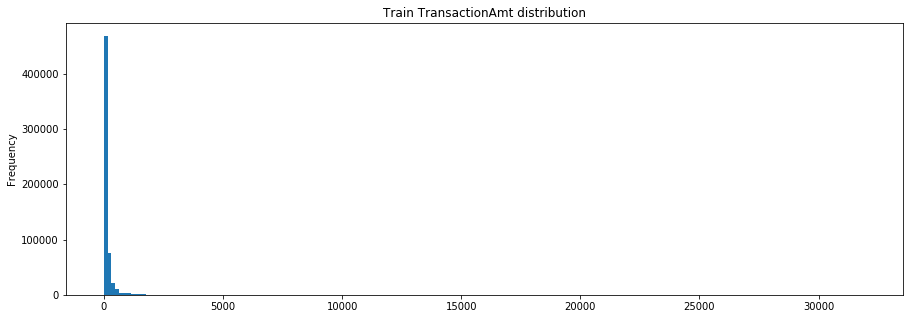

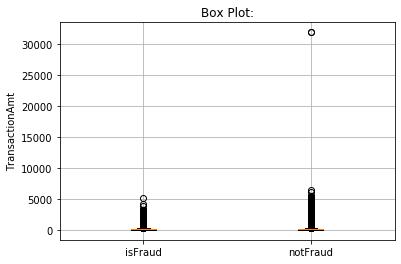

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with TransactionAmt
1     V139                         0.222308
2     V140                         0.207470
3     V208                         0.198601
4     V161                         0.197351
5     V163                         0.191320
375    V15                        -0.139413
376    V94                        -0.141014
377    V52                        -0.142297
378    V50                        -0.144958
379    V51                        -0.149459
--------------------------------------------------
Describing  TransactionAmt  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean      135.027176     149.244779        134.511665
std       239.162522     232.212163        239.395078
min         0.251000       0.292000          0.251000
25%        43.321000      35.044000         43.970000
5

In [17]:
# EDA sample on Numerical data
EDA_num('TransactionAmt')

In [18]:
# EDA sample on categorical data
EDA_cat('ProductCD')

--------------------------------------------------
Attribute:  ProductCD
There are no missing values in this feature
    Train  isFraud Train  isNotFraud Train
W  439670           8969            430701
C   68519           8008             60511
R   37699           1426             36273
H   33024           1574             31450
S   11628            686             10942
--------------------------------------------------


### Data visualization and analysis

Attribute:  TransactionAmt


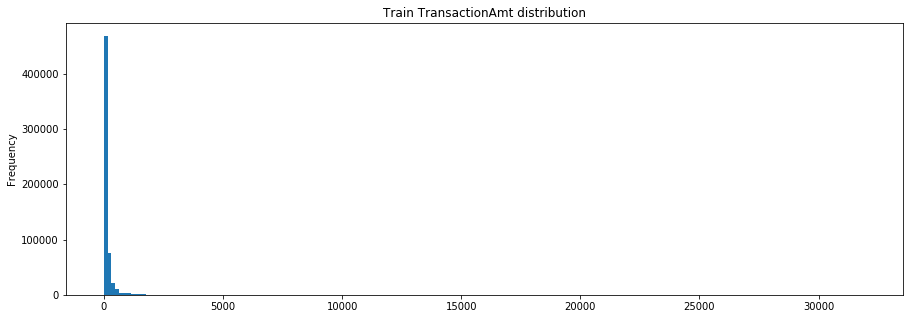

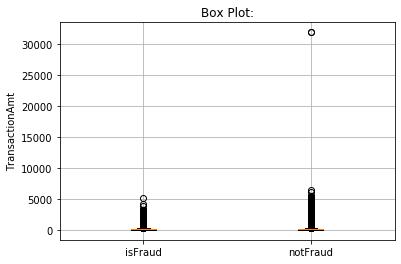

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with TransactionAmt
1     V139                         0.222308
2     V140                         0.207470
3     V208                         0.198601
4     V161                         0.197351
5     V163                         0.191320
375    V15                        -0.139413
376    V94                        -0.141014
377    V52                        -0.142297
378    V50                        -0.144958
379    V51                        -0.149459
--------------------------------------------------
Describing  TransactionAmt  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean      135.027176     149.244779        134.511665
std       239.162522     232.212163        239.395078
min         0.251000       0.292000          0.251000
25%        43.321000      35.044000         43.970000
5

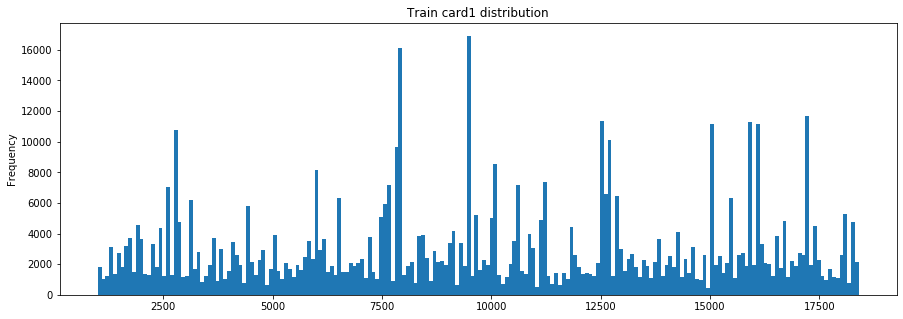

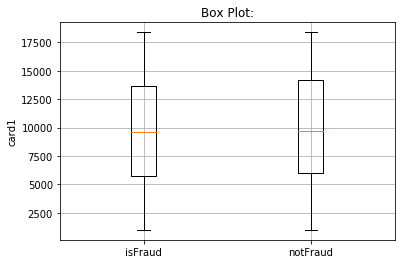

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with card1
1     V330                0.146483
2     V329                0.142539
3     V324                0.138616
4     V333                0.136557
5     V328                0.134419
375   V149               -0.023889
376   V156               -0.024232
377    D13               -0.028603
378     D8               -0.040851
379  card5               -0.093633
--------------------------------------------------
Describing  card1  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean     9898.734658    9547.654164       9911.464381
std      4901.170153    4762.051380       4905.672370
min      1000.000000    1015.000000       1000.000000
25%      6019.000000    5732.500000       6019.000000
50%      9678.000000    9633.000000       9711.000000
75%     14184.000000   13623.000000      14229.000000
m

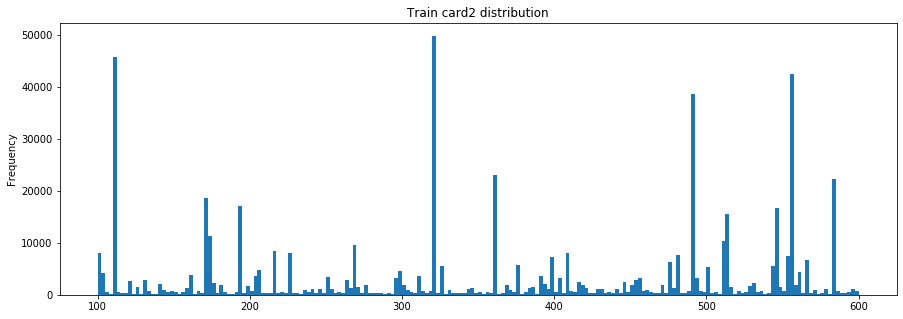

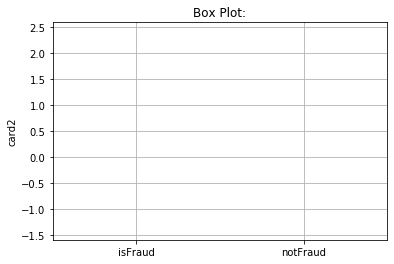

percentage of missing values: 1.5126833068039423
--------------------------------------------------
Correlations: 
    Column  Correlation with card2
1     V302                0.097911
2     V304                0.096949
3     V303                0.092447
4      V50                0.084508
5      V71                0.081179
375    V36               -0.042237
376    V13               -0.043501
377    V12               -0.043553
378    V53               -0.043736
379    V54               -0.045313
--------------------------------------------------
Describing  card2  :
               Train  isFraud Train  isNotFraud Train
count  581607.000000   20240.000000     561367.000000
mean      362.555488     365.370850        362.453981
std       157.793246     159.623511        157.726065
min       100.000000     100.000000        100.000000
25%       214.000000     204.000000        215.000000
50%       361.000000     375.000000        361.000000
75%       512.000000     514.000000        512.000

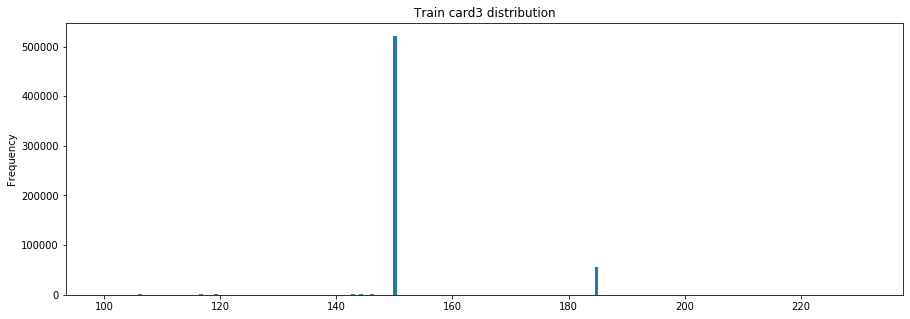

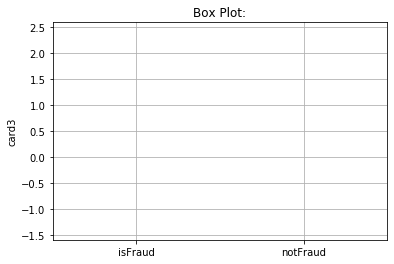

percentage of missing values: 0.26501168422122123
--------------------------------------------------
Correlations: 
    Column  Correlation with card3
1      V15                0.759508
2      V94                0.758586
3      V16                0.744826
4      V57                0.744299
5      V79                0.738073
375    V53               -0.341900
376    V35               -0.348554
377    V54               -0.351214
378    V36               -0.356215
379  addr2               -0.569108
--------------------------------------------------
Describing  card3  :
               Train  isFraud Train  isNotFraud Train
count  588975.000000   20624.000000     568351.000000
mean      153.194925     162.368648        152.862034
std        11.336444      17.495775         10.904432
min       100.000000     100.000000        100.000000
25%       150.000000     150.000000        150.000000
50%       150.000000     150.000000        150.000000
75%       150.000000     185.000000        150.00

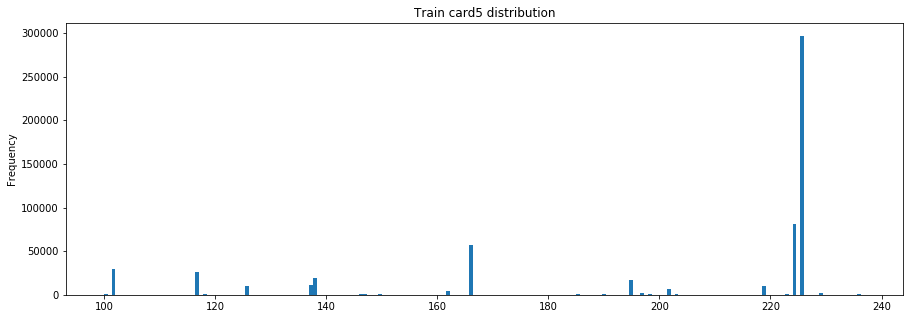

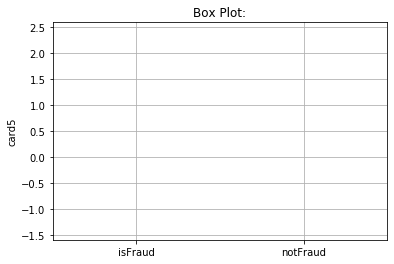

percentage of missing values: 0.7212043214684865
--------------------------------------------------
Correlations: 
    Column  Correlation with card5
1      D15                0.110301
2       D1                0.099504
3       D2                0.096315
4       D4                0.095706
5      D10                0.095575
375   V333               -0.265948
376   V324               -0.268091
377   V328               -0.270129
378   V329               -0.282868
379   V330               -0.289202
--------------------------------------------------
Describing  card5  :
               Train  isFraud Train  isNotFraud Train
count  586281.000000   20453.000000     565828.000000
mean      199.278897     191.994328        199.542212
std        41.244453      45.779886         41.046975
min       100.000000     100.000000        100.000000
25%       166.000000     138.000000        166.000000
50%       226.000000     224.000000        226.000000
75%       226.000000     226.000000        226.000

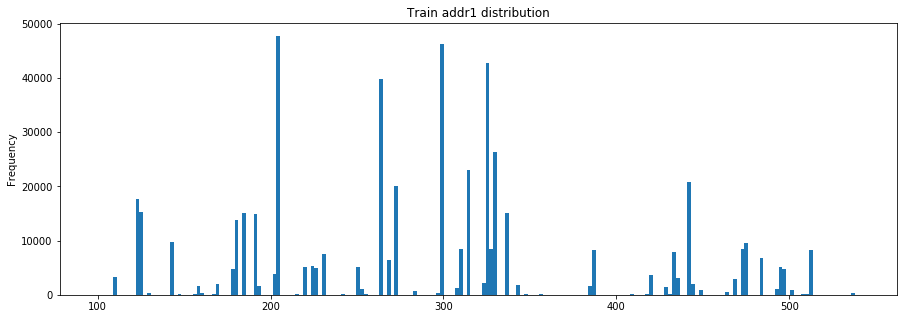

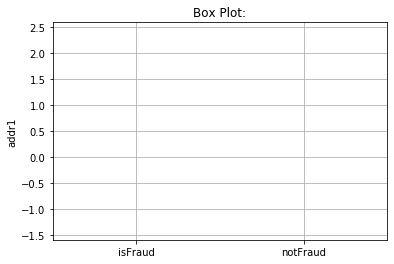

percentage of missing values: 11.12642666034477
--------------------------------------------------
Correlations: 
    Column  Correlation with addr1
1     V326                0.050944
2      D13                0.050886
3     V327                0.047731
4     V330                0.042601
5     V329                0.042381
375   V100               -0.019761
376    V99               -0.021358
377   V287               -0.022924
378   V285               -0.028060
379     D7               -0.079024
--------------------------------------------------
Describing  addr1  :
               Train  isFraud Train  isNotFraud Train
count  524834.000000   12922.000000     511912.000000
mean      290.733794     294.317134        290.643341
std       101.741072     103.584955        101.692564
min       100.000000     110.000000        100.000000
25%       204.000000     204.000000        204.000000
50%       299.000000     299.000000        299.000000
75%       330.000000     330.000000        330.0000

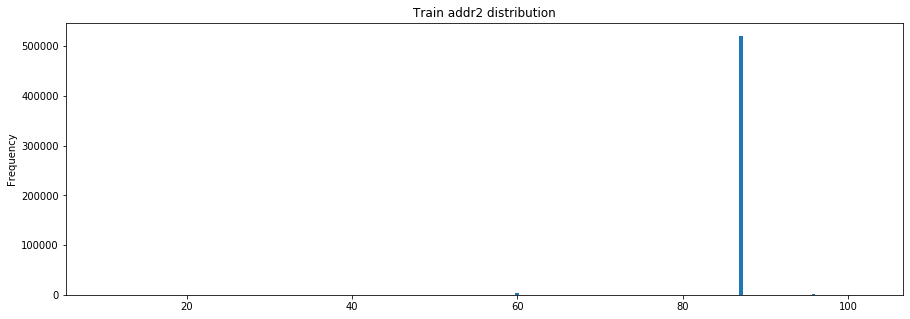

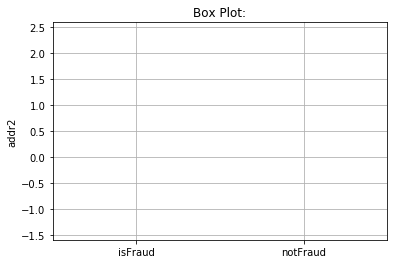

percentage of missing values: 11.12642666034477
--------------------------------------------------
Correlations: 
    Column  Correlation with addr2
1       D6                0.290653
2      D13                0.208817
3      D14                0.142099
4      V36                0.113776
5      V35                0.110642
375    V16               -0.712508
376    V15               -0.819340
377    V58               -0.876798
378    V57               -0.876965
379    V79               -0.890125
--------------------------------------------------
Describing  addr2  :
               Train  isFraud Train  isNotFraud Train
count  524834.000000   12922.000000     511912.000000
mean       86.800630      86.286024         86.813620
std         2.690623       4.936238          2.607742
min        10.000000      10.000000         13.000000
25%        87.000000      87.000000         87.000000
50%        87.000000      87.000000         87.000000
75%        87.000000      87.000000         87.0000

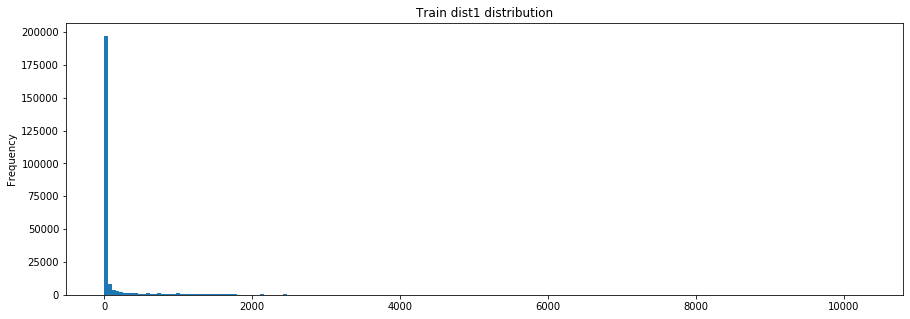

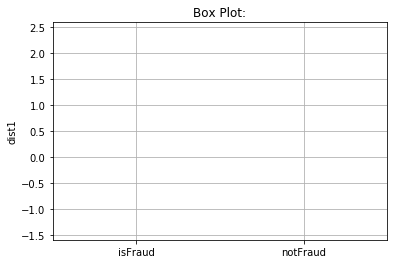

percentage of missing values: 59.6523520845328
--------------------------------------------------
Correlations: 
    Column  Correlation with dist1
1       V8                0.094938
2       V9                0.088465
3       V2                0.079191
4       V6                0.076624
5       V3                0.067514
166    V91               -0.066577
167    V70               -0.066690
168    V90               -0.068074
169    V69               -0.068412
170    V29               -0.069451
--------------------------------------------------
Describing  dist1  :
               Train  isFraud Train  isNotFraud Train
count  238269.000000    4755.000000     233514.000000
mean      118.502180     174.588854        117.360098
std       371.872026     424.232313        370.641879
min         0.000000       0.000000          0.000000
25%         3.000000       3.000000          3.000000
50%         8.000000      10.000000          8.000000
75%        24.000000      85.500000         24.00000

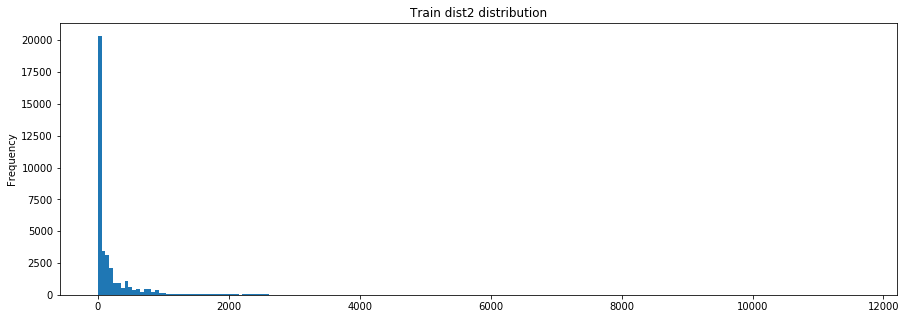

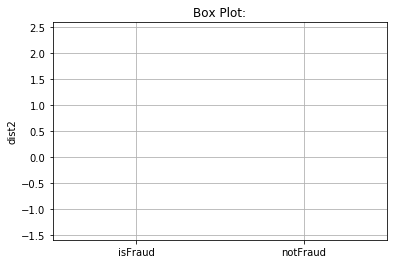

percentage of missing values: 93.62837403054831
--------------------------------------------------
Correlations: 
    Column  Correlation with dist2
1     V192                0.102090
2     V187                0.094572
3     V193                0.091043
4     V234                0.076003
5     V191                0.066564
342   V260               -0.044111
343     D6               -0.045920
344     D4               -0.058390
345    D12               -0.075249
346  card3               -0.143222
--------------------------------------------------
Describing  dist2  :
              Train  isFraud Train  isNotFraud Train
count  37627.000000    3731.000000      33896.000000
mean     231.855423     201.472259        235.199758
std      529.053494     451.589576        536.798492
min        0.000000       0.000000          0.000000
25%        7.000000       7.000000          7.000000
50%       37.000000      49.000000         36.000000
75%      206.000000     233.000000        206.000000
max  

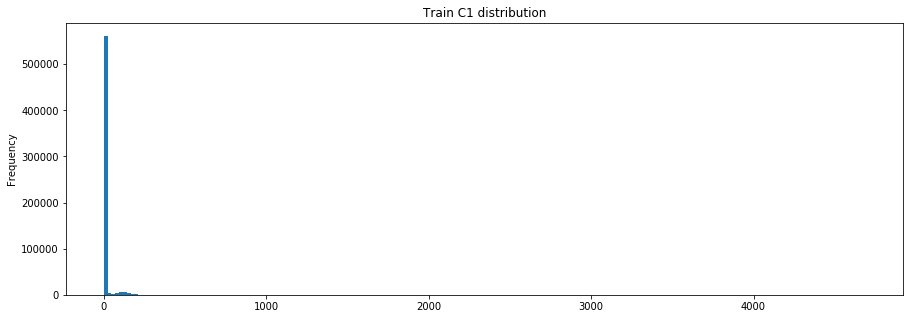

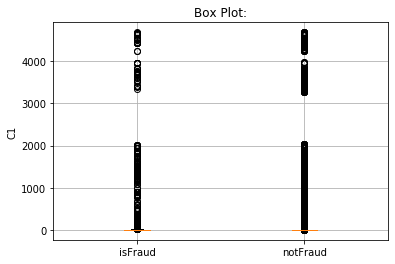

There are no missing values in this feature
--------------------------------------------------
Correlations: 
            Column  Correlation with C1
1              C11             0.996515
2               C2             0.995089
3               C6             0.982238
4               C4             0.967800
5               C8             0.967746
375            V75            -0.051347
376            V76            -0.051632
377  TransactionID            -0.053154
378            V35            -0.054029
379            V36            -0.054554
--------------------------------------------------
Describing  C1  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000    20663.00000     569877.000000
mean       14.092458       35.53574         13.314952
std       133.569018      242.97626        127.787969
min         0.000000        0.00000          0.000000
25%         1.000000        1.00000          1.000000
50%         1.000000        2.00000          1.000000
75%

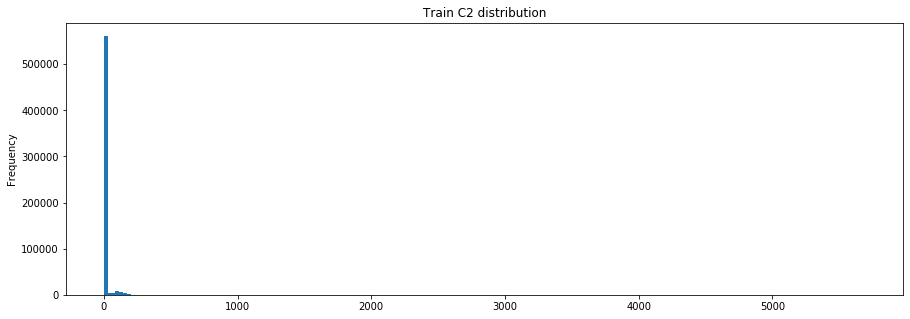

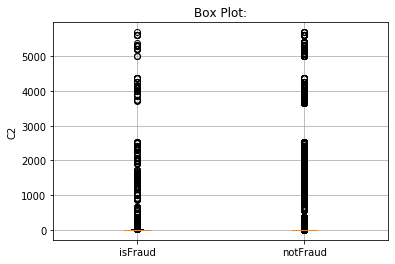

There are no missing values in this feature
--------------------------------------------------
Correlations: 
            Column  Correlation with C2
1               C1             0.995089
2              C11             0.993898
3               C8             0.975863
4               C6             0.974845
5               C4             0.972134
375  TransactionID            -0.055186
376            V75            -0.056251
377            V76            -0.056896
378            V35            -0.059538
379            V36            -0.060269
--------------------------------------------------
Describing  C2  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean       15.269734      45.509413         14.173283
std       154.668899     287.813648        147.485925
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       2.000000          1.000000
75%

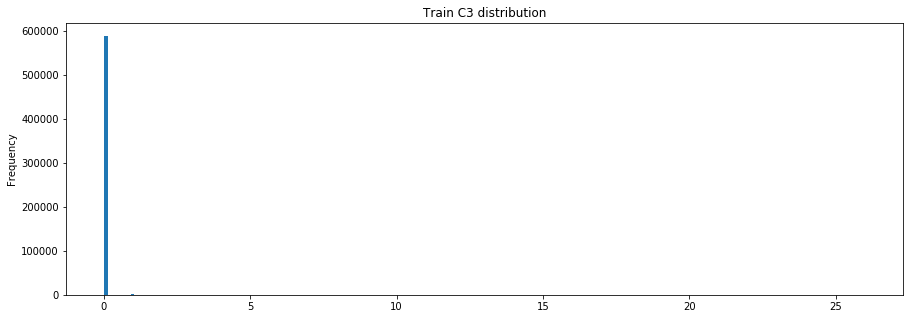

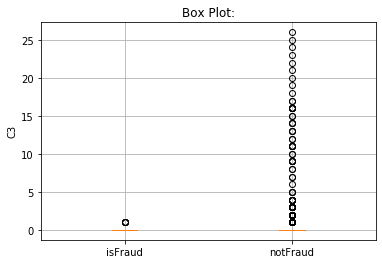

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with C3
1      V28             0.593655
2      V89             0.592326
3      V68             0.554881
4      V27             0.548193
5       D6             0.090308
361   V155            -0.039395
362    V82            -0.040171
363   V148            -0.040378
364   V154            -0.041643
365   V153            -0.041988
--------------------------------------------------
Describing  C3  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        0.005644       0.000242          0.005840
std         0.150536       0.015554          0.153208
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max        26.000000       1.000000  

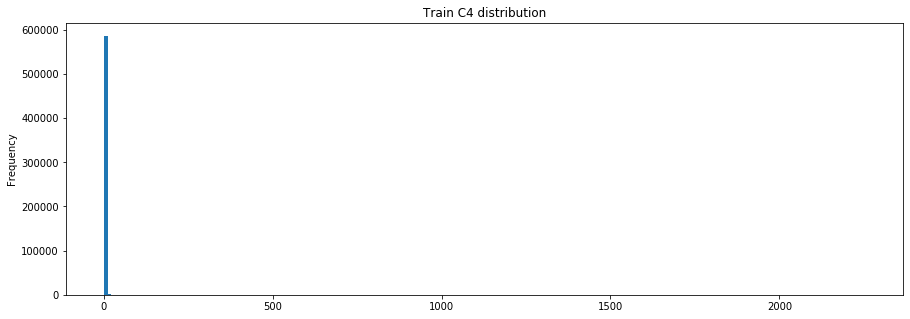

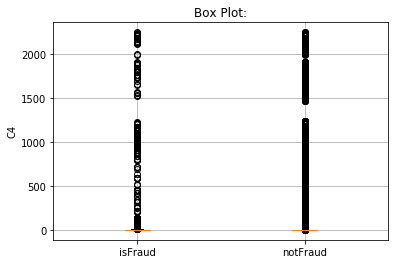

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with C4
1      C11             0.974547
2       C2             0.972134
3       C1             0.967800
4       C6             0.962319
5       C8             0.959995
362    V54            -0.057470
363   V197            -0.058750
364    V35            -0.058768
365    V36            -0.060052
366   V194            -0.070506
--------------------------------------------------
Describing  C4  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        4.092185      15.077336          3.693878
std        68.848459     125.673738         65.839255
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       2.000000          0.000000
max      2253.000000    2251.000000  

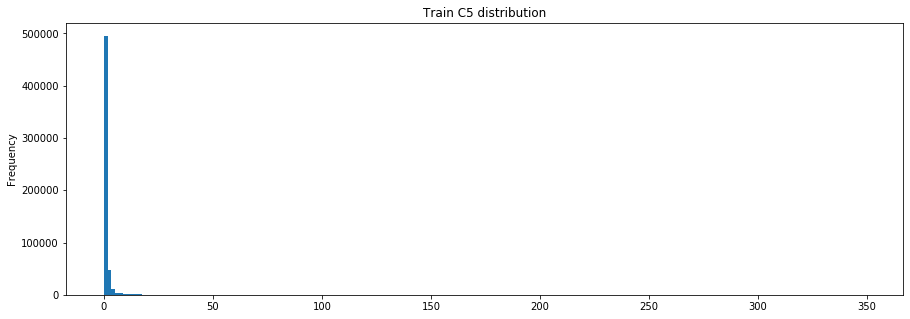

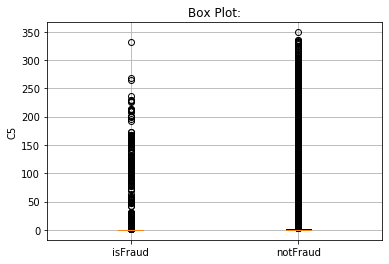

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with C5
1       C9             0.925786
2      C13             0.717509
3      C14             0.378950
4      V70             0.284101
5      V49             0.279314
208    V51            -0.095805
209   V303            -0.098097
210    V50            -0.100054
211   V304            -0.108065
212   V302            -0.112879
--------------------------------------------------
Describing  C5  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        5.571526       1.406717          5.722537
std        25.786976      12.946092         26.121841
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max       349.000000     331.000000  

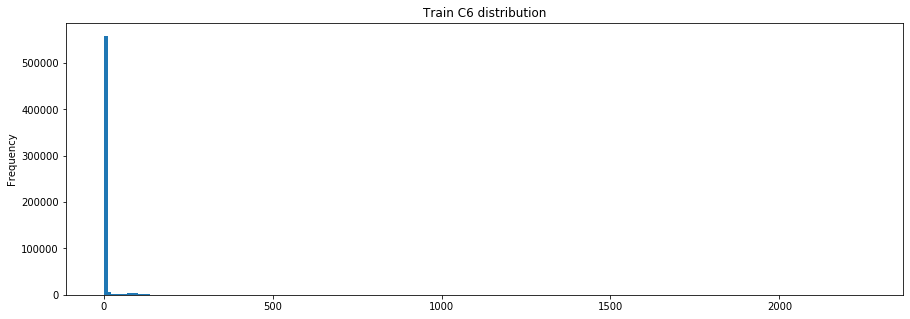

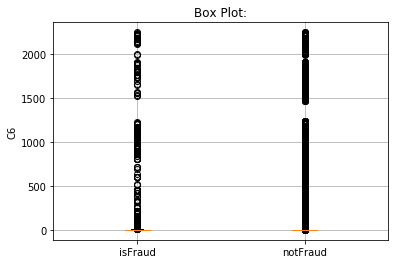

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with C6
1      C11             0.991105
2      C14             0.984201
3       C1             0.982238
4       C2             0.974845
5       C4             0.962319
375    V75            -0.050655
376    V35            -0.052205
377    V36            -0.052338
378   V197            -0.058367
379   V194            -0.070188
--------------------------------------------------
Describing  C6  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        9.071082      16.923148          8.786377
std        71.508467     126.298758         68.689176
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         2.000000       3.000000          2.000000
max      2253.000000    2251.000000  

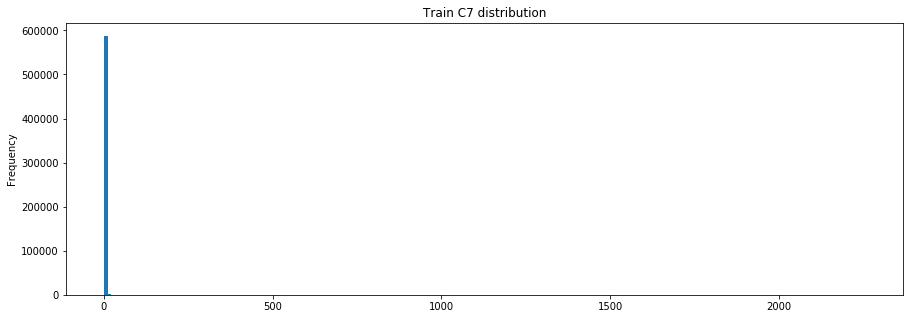

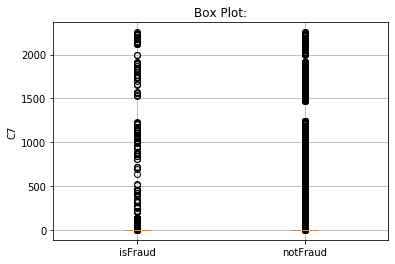

There are no missing values in this feature
--------------------------------------------------
Correlations: 
            Column  Correlation with C7
1              C12             0.999489
2              C10             0.985062
3               C8             0.982983
4               C2             0.938867
5               C1             0.926258
315            V54            -0.056192
316            V35            -0.056947
317            V36            -0.058191
318  TransactionID            -0.059485
319          addr2            -0.116193
--------------------------------------------------
Describing  C7  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        2.848478      11.977157          2.517484
std        61.727304     115.143177         58.860773
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%

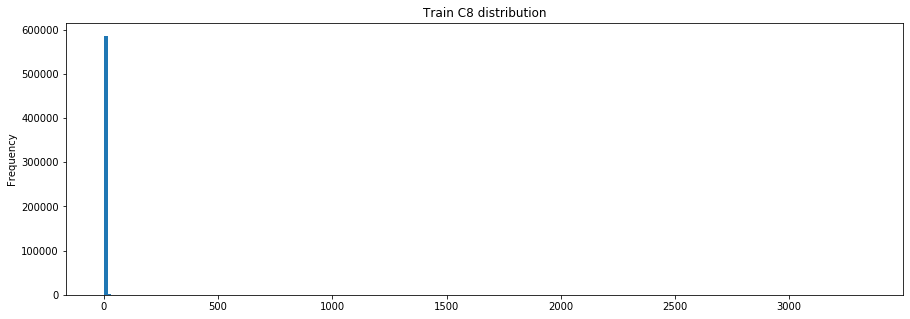

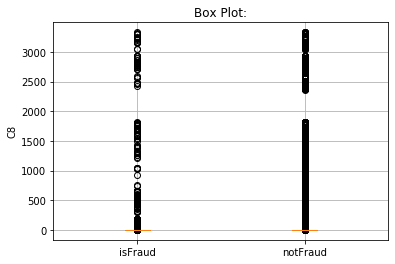

There are no missing values in this feature
--------------------------------------------------
Correlations: 
            Column  Correlation with C8
1              C10             0.996970
2              C12             0.983027
3               C7             0.982983
4               C2             0.975863
5               C1             0.967746
362            V54            -0.056765
363            V35            -0.057420
364            V36            -0.058675
365          addr2            -0.059482
366  TransactionID            -0.060490
--------------------------------------------------
Describing  C8  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        5.144574      21.242608          4.560881
std        95.378574     176.695771         91.023016
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%

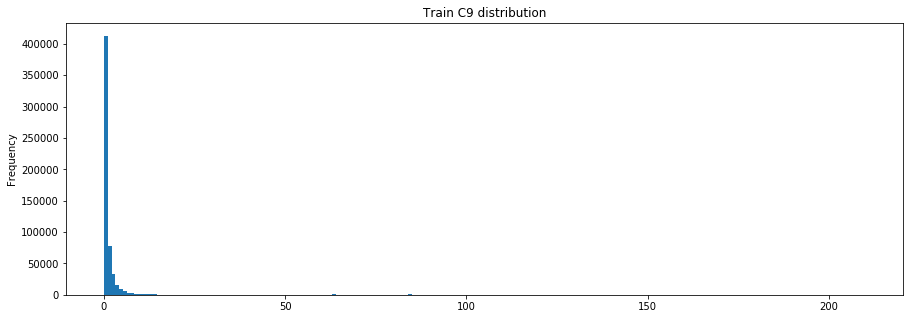

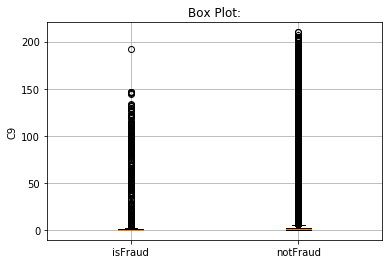

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with C9
1       C5             0.925786
2      C13             0.704056
3      C14             0.397396
4      V70             0.266079
5      V49             0.264768
208    V51            -0.117889
209   V303            -0.121989
210    V50            -0.124945
211   V304            -0.134387
212   V302            -0.140374
--------------------------------------------------
Describing  C9  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        4.480240       1.703964          4.580904
std        16.674897       8.453280         16.889451
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         2.000000       1.000000          2.000000
max       210.000000     192.000000  

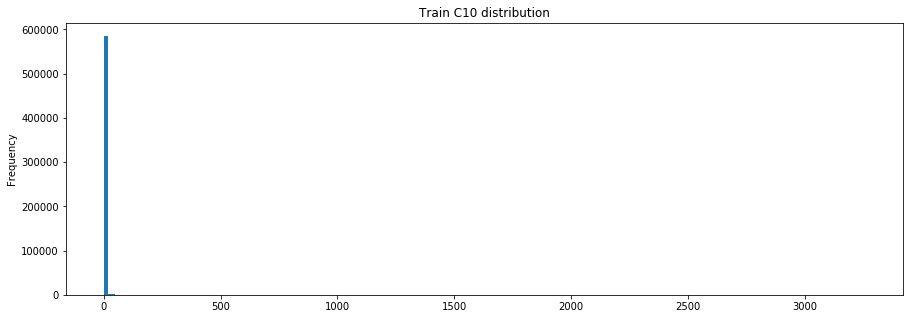

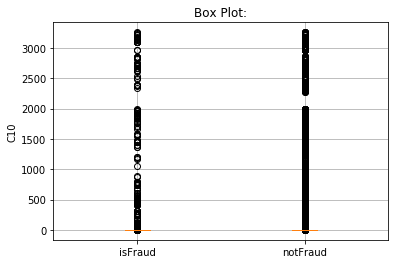

There are no missing values in this feature
--------------------------------------------------
Correlations: 
            Column  Correlation with C10
1               C8              0.996970
2               C7              0.985062
3              C12              0.983817
4               C2              0.970624
5               C1              0.958202
362  TransactionDT             -0.057734
363            V35             -0.058026
364            V36             -0.059294
365  TransactionID             -0.062073
366          addr2             -0.068799
--------------------------------------------------
Describing  C10  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        5.240343      19.493926          4.723526
std        95.581443     176.919186         91.239098
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          

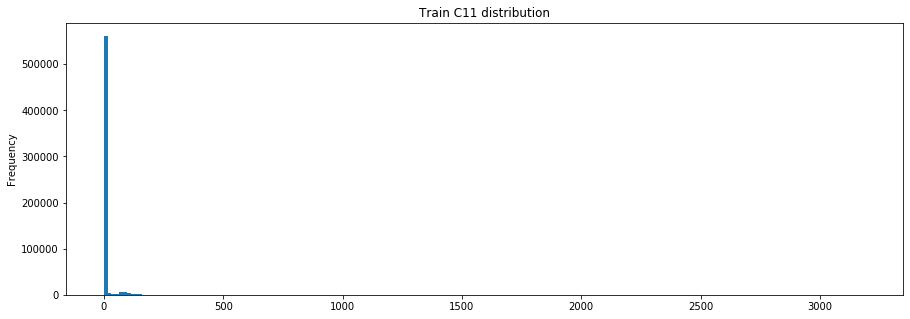

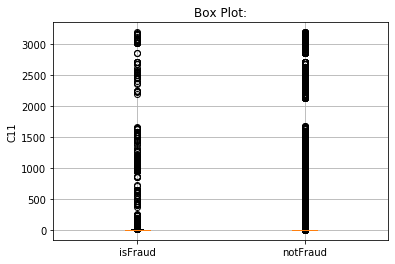

There are no missing values in this feature
--------------------------------------------------
Correlations: 
            Column  Correlation with C11
1               C1              0.996515
2               C2              0.993898
3               C6              0.991105
4               C4              0.974547
5               C8              0.962722
375            V76             -0.052040
376  TransactionID             -0.054122
377            V35             -0.054781
378            V36             -0.055351
379           V194             -0.055947
--------------------------------------------------
Describing  C11  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean       10.241521      23.857475          9.747825
std        94.336292     170.966234         90.306569
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       2.000000          

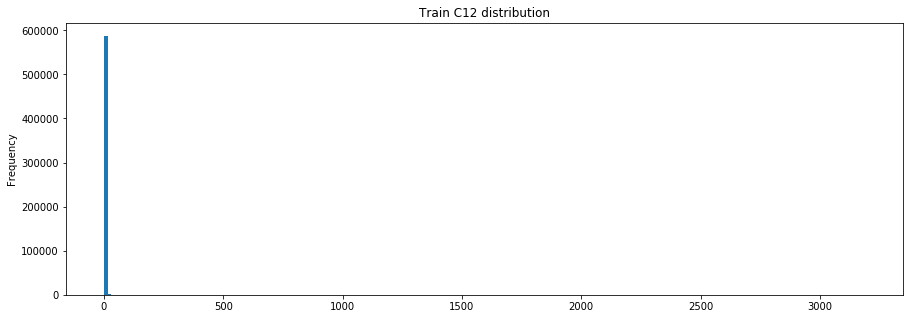

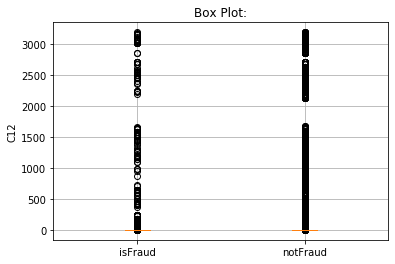

There are no missing values in this feature
--------------------------------------------------
Correlations: 
            Column  Correlation with C12
1               C7              0.999489
2              C10              0.983817
3               C8              0.983027
4               C2              0.940258
5               C1              0.927939
328            V36             -0.058057
329  TransactionID             -0.058796
330          addr2             -0.116901
331            V11             -0.202619
332            V10             -0.218494
--------------------------------------------------
Describing  C12  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        4.076227      18.597541          3.549703
std        86.666218     162.082460         82.601169
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          

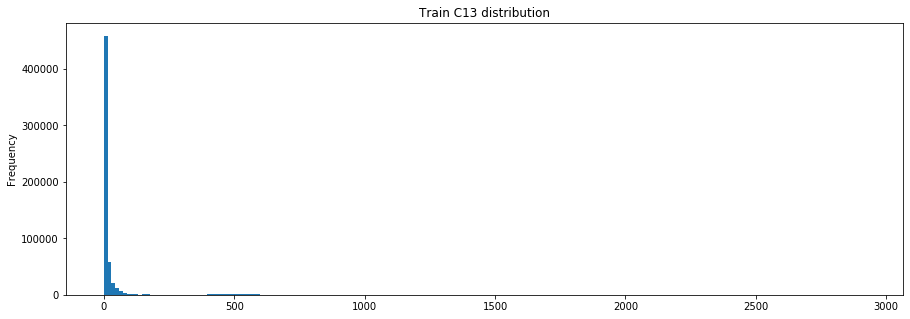

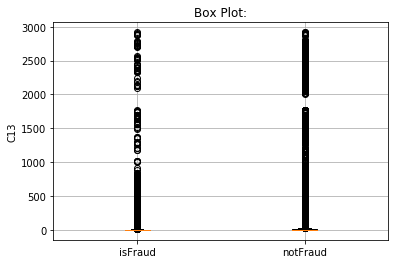

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with C13
1      C14              0.880722
2       C6              0.808531
3      C11              0.779286
4       C1              0.774603
5       C2              0.751221
375    V21             -0.094623
376    V31             -0.096270
377    V34             -0.098281
378    V15             -0.098404
379    V33             -0.102133
--------------------------------------------------
Describing  C13  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean       32.539918      24.967768         32.814474
std       129.364844     165.979050        127.832166
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         3.000000       1.000000          3.000000
75%        12.000000       6.000000         13.000000
max      2918.000000    2

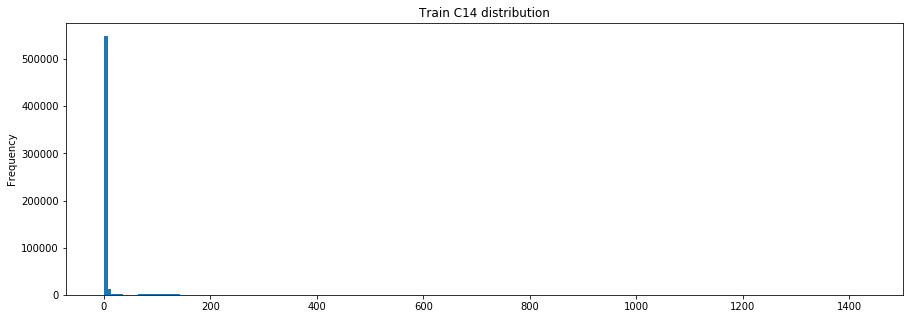

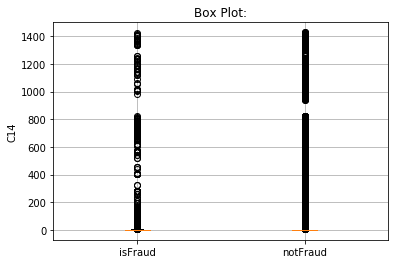

There are no missing values in this feature
--------------------------------------------------
Correlations: 
    Column  Correlation with C14
1       C6              0.984201
2      C11              0.962465
3       C1              0.951761
4       C2              0.936148
5       C4              0.907676
375    V31             -0.073593
376    V15             -0.074301
377    V21             -0.075669
378    V33             -0.077545
379   V194             -0.078196
--------------------------------------------------
Describing  C14  :
               Train  isFraud Train  isNotFraud Train
count  590540.000000   20663.000000     569877.000000
mean        8.295215      10.356047          8.220491
std        49.544262      82.902579         47.898725
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         2.000000       2.000000          2.000000
max      1429.000000    1

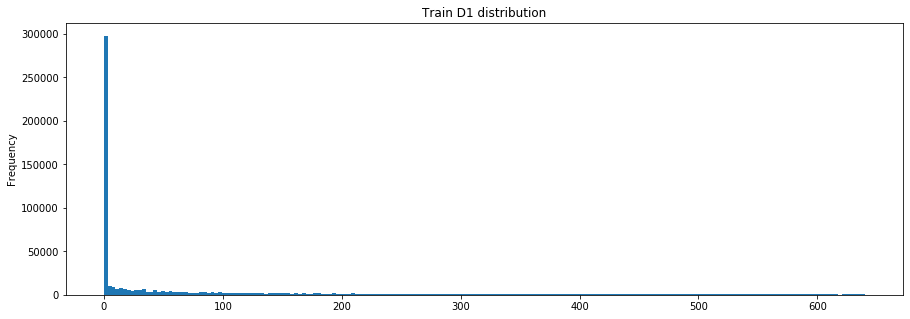

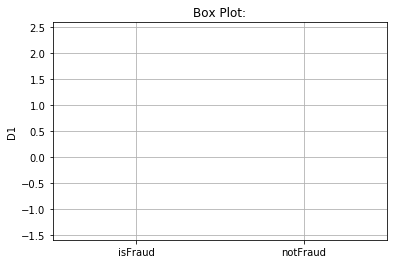

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with D1
1       D2             0.981311
2      D15             0.638957
3      D11             0.592629
4       D4             0.585714
5      D10             0.562145
375   V153            -0.269759
376   V197            -0.272491
377   V194            -0.295450
378   V283            -0.355794
379   V282            -0.505305
--------------------------------------------------
Describing  D1  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean       94.347568      38.711306         96.364705
std       157.660387     100.915599        158.973258
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         3.000000       0.000000          4.000000
75%       122.000000      14.000000        126.000000
max       640.000000     637.00

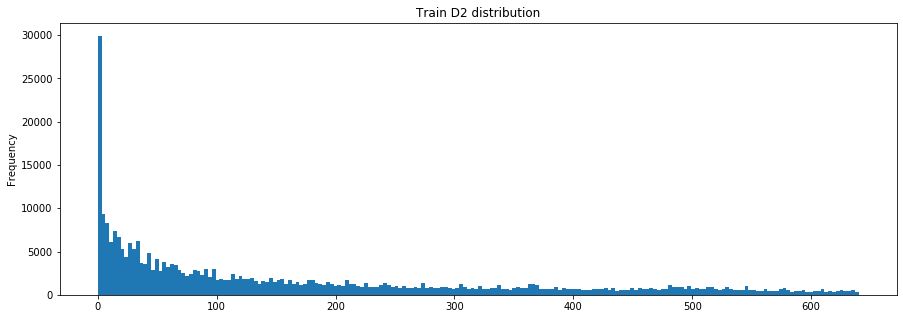

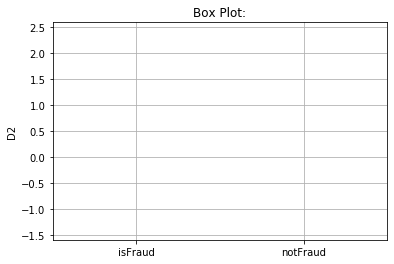

percentage of missing values: 47.54919226470688
--------------------------------------------------
Correlations: 
    Column  Correlation with D2
1       D1             0.981311
2      D12             0.668833
3      D15             0.618243
4       D6             0.601299
5       D4             0.570017
375   V174            -0.335111
376   V283            -0.375585
377   V282            -0.453760
378   V289            -0.507014
379   V288            -0.562187
--------------------------------------------------
Describing  D2  :
               Train  isFraud Train  isNotFraud Train
count  309743.000000    7870.000000     301873.000000
mean      169.563231      77.774206        171.956223
std       177.315865     128.697847        177.773639
min         0.000000       0.000000          0.000000
25%        26.000000       2.000000         27.000000
50%        97.000000      16.000000        100.000000
75%       276.000000      95.000000        280.000000
max       640.000000     637.0000

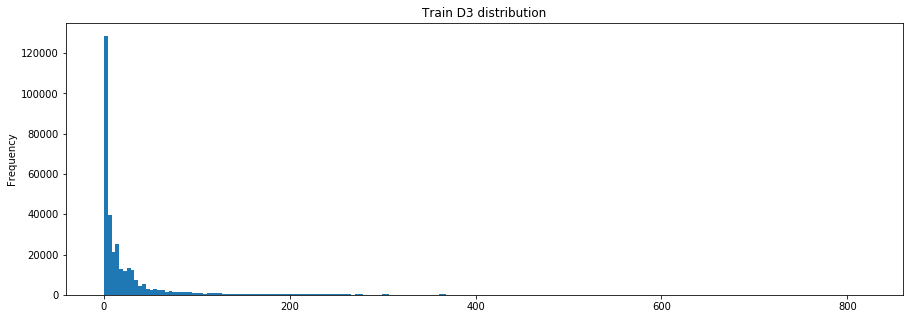

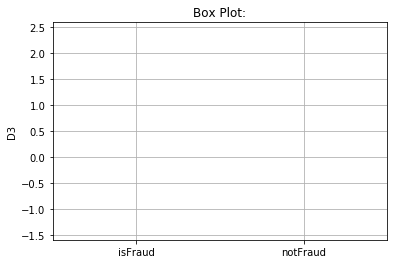

percentage of missing values: 44.514850814508755
--------------------------------------------------
Correlations: 
    Column  Correlation with D3
1       D7             0.818080
2       D5             0.707425
3      D12             0.349025
4       D6             0.304947
5       D1             0.280423
374   V144            -0.266504
375   V330            -0.276352
376   V328            -0.279979
377   V327            -0.341241
378   V326            -0.354019
--------------------------------------------------
Describing  D3  :
               Train  isFraud Train  isNotFraud Train
count  327662.000000    9619.000000     318043.000000
mean       28.343348      11.744880         28.845357
std        62.384721      42.005468         62.830058
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         8.000000       1.000000          8.000000
75%        27.000000       5.000000         28.000000
max       819.000000     582.000

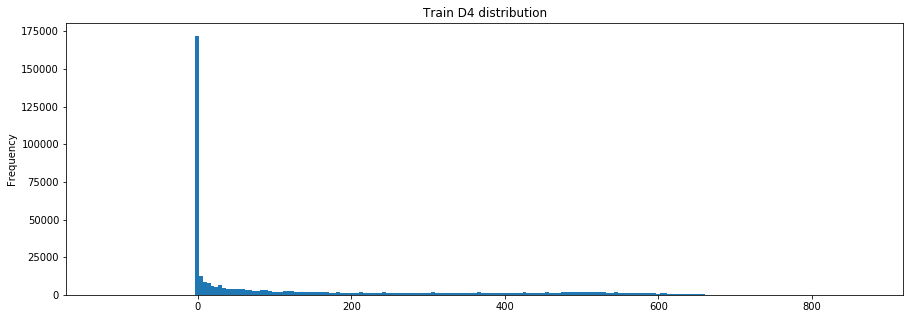

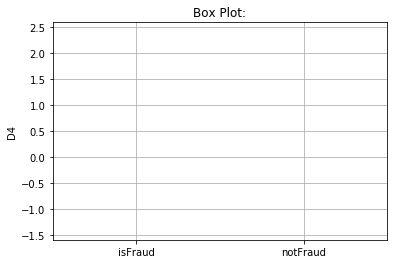

percentage of missing values: 28.604666915026925
--------------------------------------------------
Correlations: 
    Column  Correlation with D4
1      D12             0.999999
2       D6             0.956966
3      D15             0.751546
4      D11             0.657797
5      D10             0.636928
375   V149            -0.360508
376   V155            -0.373805
377   V148            -0.376986
378   V154            -0.377323
379   V153            -0.381196
--------------------------------------------------
Describing  D4  :
               Train  isFraud Train  isNotFraud Train
count  421618.000000   14567.000000     407051.000000
mean      140.002441      72.102904        142.432339
std       191.096774     140.656090        192.213375
min      -122.000000       0.000000       -122.000000
25%         0.000000       0.000000          0.000000
50%        26.000000       1.000000         28.000000
75%       253.000000      61.000000        261.000000
max       869.000000     667.000

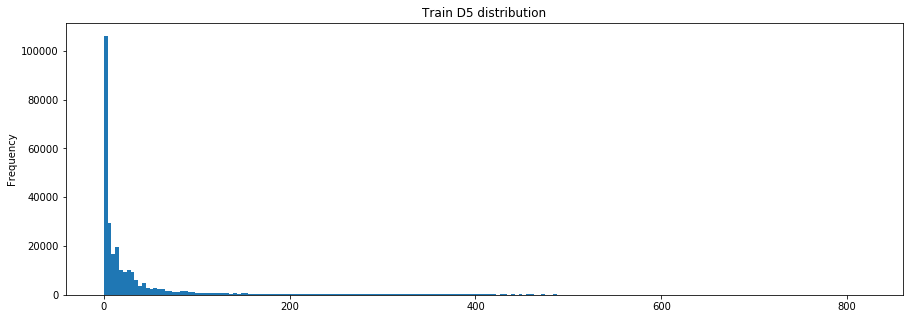

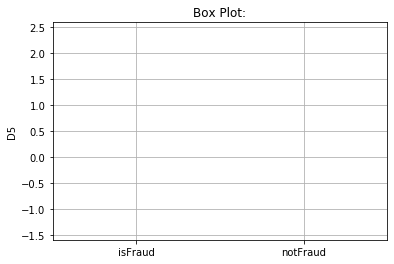

percentage of missing values: 52.46740271615809
--------------------------------------------------
Correlations: 
    Column  Correlation with D5
1       D7             0.986496
2       D3             0.707425
3      D12             0.565222
4       D6             0.551310
5       D4             0.313650
372   V155            -0.344677
373   V153            -0.346386
374   V148            -0.347020
375   V158            -0.367735
376   V157            -0.372750
--------------------------------------------------
Describing  D5  :
               Train  isFraud Train  isNotFraud Train
count  280699.000000   10880.000000     269819.000000
mean       42.335965      13.687776         43.491155
std        89.000144      51.891635         89.985719
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%        10.000000       0.000000         10.000000
75%        32.000000       3.000000         34.000000
max       819.000000     625.0000

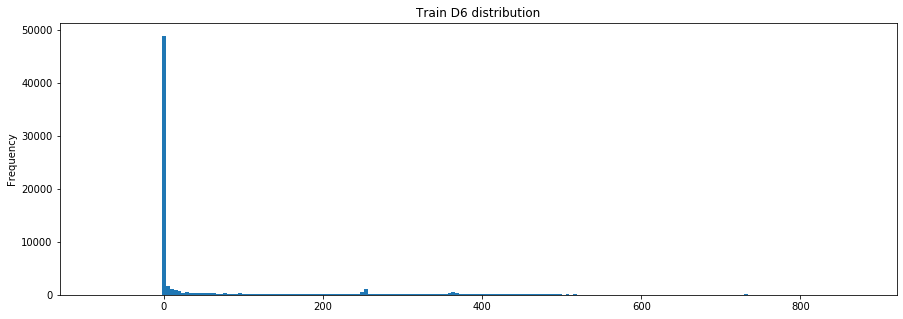

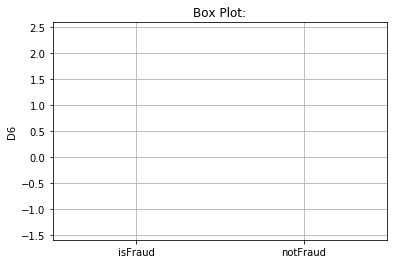

percentage of missing values: 87.60676668811597
--------------------------------------------------
Correlations: 
    Column  Correlation with D6
1      D12             0.976834
2       D4             0.956966
3      D15             0.700615
4       D2             0.601299
5       D5             0.551310
342   V149            -0.698995
343   V155            -0.703838
344   V148            -0.703948
345   V154            -0.704417
346   V153            -0.708055
--------------------------------------------------
Describing  D6  :
              Train  isFraud Train  isNotFraud Train
count  73187.000000    7718.000000      65469.000000
mean      69.805717      45.856439         72.629046
std      143.669253     101.424445        147.600963
min      -83.000000       0.000000        -83.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%       40.000000      24.000000         43.000000
max      873.000000     694.000000       

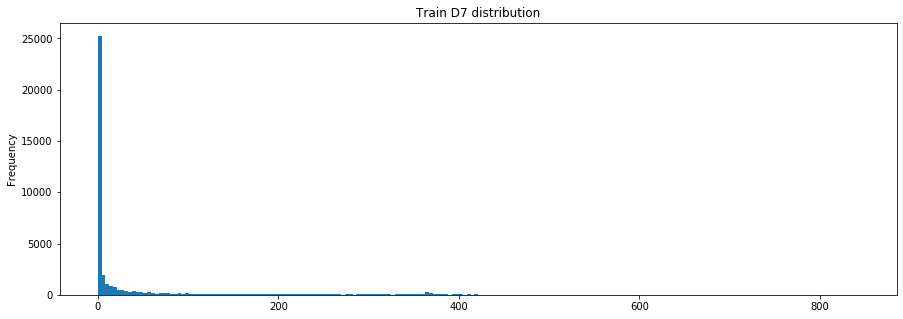

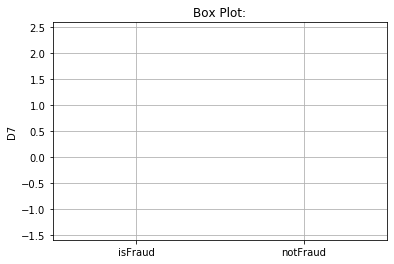

percentage of missing values: 93.40992989467267
--------------------------------------------------
Correlations: 
    Column  Correlation with D7
1       D5             0.986496
2       D3             0.818080
3       D4             0.574098
4      D12             0.553886
5       D6             0.506527
342   V328            -0.266689
343   V144            -0.269043
344   V152            -0.275670
345   V327            -0.332058
346   V326            -0.353553
--------------------------------------------------
Describing  D7  :
              Train  isFraud Train  isNotFraud Train
count  38917.000000    5790.000000      33127.000000
mean      41.638950      11.292228         46.943007
std       99.743264      46.743057        105.435756
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%       17.000000       0.000000         24.000000
max      843.000000     547.000000       

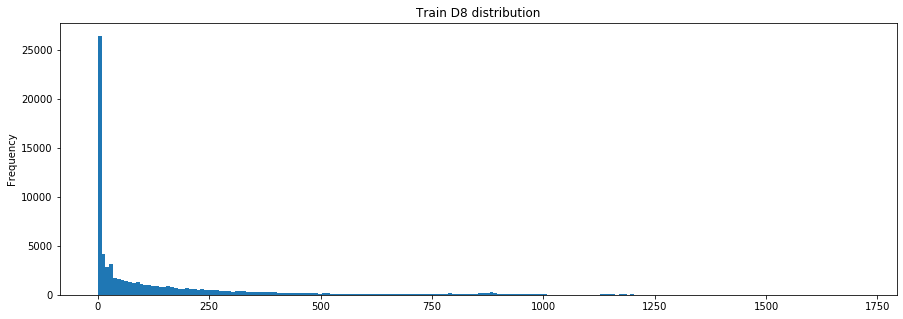

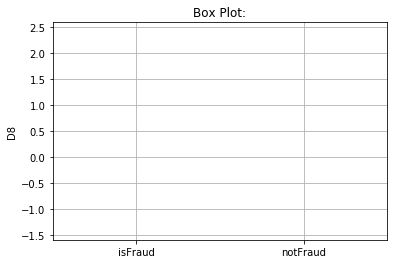

percentage of missing values: 87.31229044603245
--------------------------------------------------
Correlations: 
    Column  Correlation with D8
1      D13             0.521432
2       D2             0.275304
3       D5             0.249365
4      D15             0.226635
5     V192             0.226623
342   V171            -0.206093
343   V197            -0.206170
344    V79            -0.229298
345   V194            -0.232542
346    V94            -0.274359
--------------------------------------------------
Describing  D8  :
              Train  isFraud Train  isNotFraud Train
count  74926.000000    7827.000000      67099.000000
mean     146.058108      49.309191        157.343727
std      231.663840     133.254994        237.987816
min        0.000000       0.000000          0.000000
25%        0.958333       0.750000          1.750000
50%       37.875000       2.666666         50.583332
75%      187.958328      32.375000        207.541672
max     1707.791626    1290.583374       

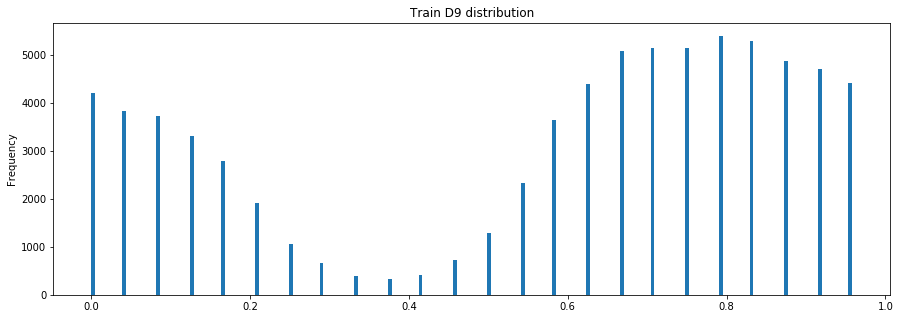

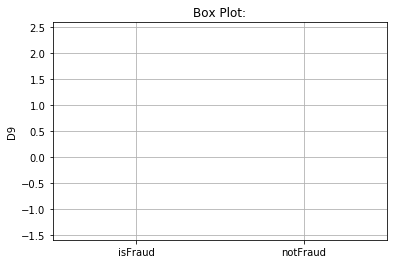

percentage of missing values: 87.31229044603245
--------------------------------------------------
Correlations: 
             Column  Correlation with D9
1    TransactionAmt             0.073852
2                D8             0.066085
3               D10             0.063333
4               D15             0.054647
5                D2             0.042867
342             V79            -0.078992
343             V15            -0.080027
344             V33            -0.081018
345             V94            -0.101789
346           card3            -0.102086
--------------------------------------------------
Describing  D9  :
              Train  isFraud Train  isNotFraud Train
count  74926.000000    7827.000000      67099.000000
mean       0.561057       0.520000          0.565846
std        0.316880       0.333188          0.314576
min        0.000000       0.000000          0.000000
25%        0.208333       0.166666          0.208333
50%        0.666666       0.625000          0.66

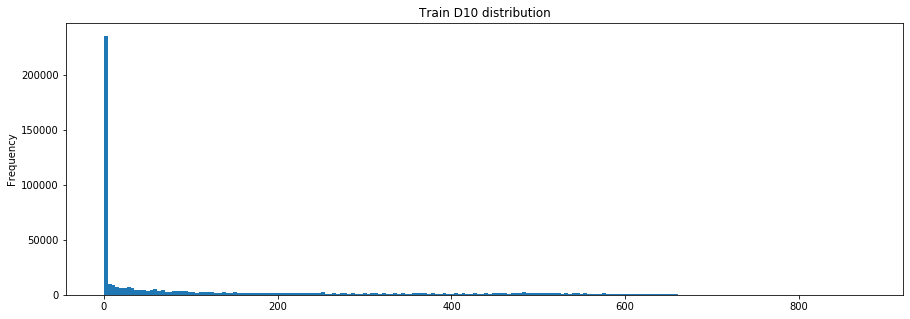

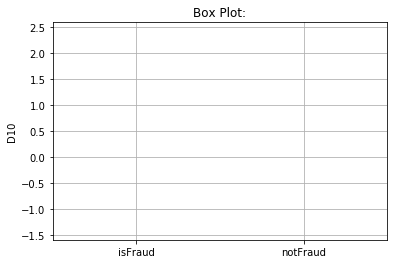

percentage of missing values: 12.873302401192129
--------------------------------------------------
Correlations: 
    Column  Correlation with D10
1      D15              0.712252
2       D4              0.636928
3      D11              0.609652
4       D1              0.562145
5       D2              0.525967
375   V156             -0.408720
376   V155             -0.427236
377   V148             -0.427647
378   V154             -0.428474
379   V153             -0.430132
--------------------------------------------------
Describing  D10  :
               Train  isFraud Train  isNotFraud Train
count  514518.000000   16777.000000     497741.000000
mean      123.982137      52.363653        126.396130
std       182.615225     127.051078        183.710646
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%        15.000000       0.000000         18.000000
75%       197.000000      14.000000        205.000000
max       876.000000

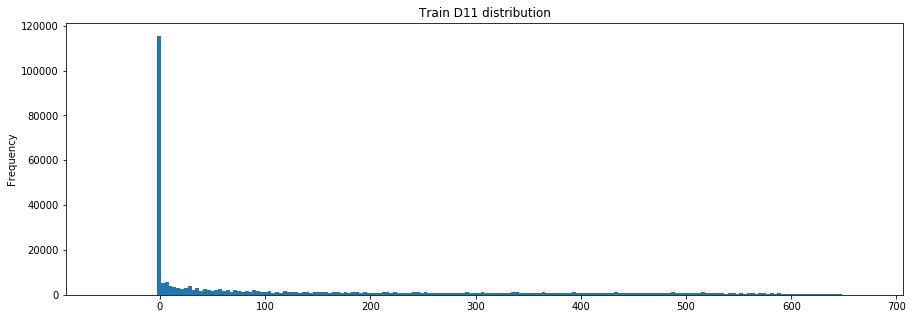

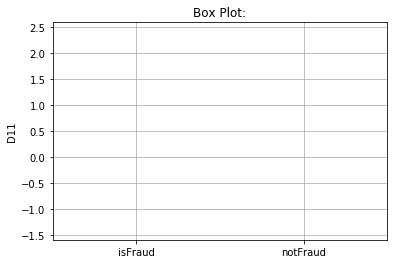

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with D11
1      D15              0.765000
2       D4              0.657797
3      D10              0.609652
4       D1              0.592629
5       D2              0.563220
168    V36             -0.269785
169    V35             -0.284230
170    V76             -0.289223
171    V75             -0.308764
172   V282             -0.366522
--------------------------------------------------
Describing  D11  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean      146.621465      87.314445        147.808201
std       186.042622     146.561013        186.555365
min       -53.000000       0.000000        -53.000000
25%         0.000000       0.000000          0.000000
50%        43.000000       7.000000         44.000000
75%       274.000000     107.750000        277.000000
max       670.000000 

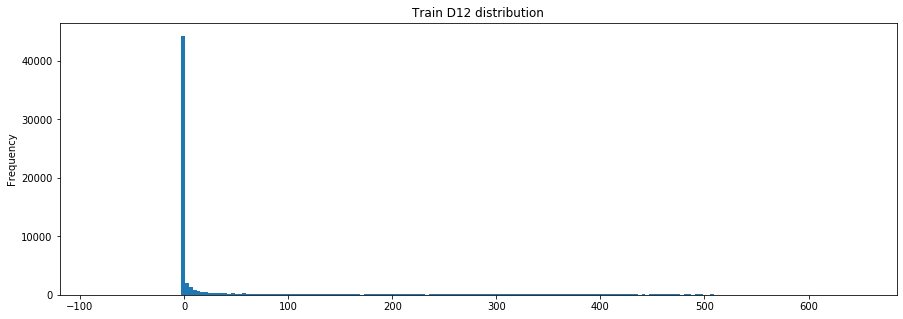

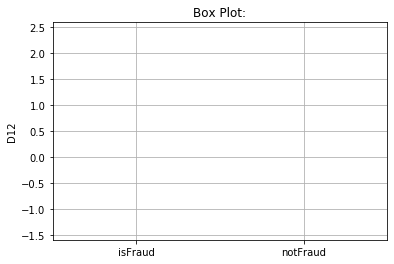

percentage of missing values: 89.04104717715988
--------------------------------------------------
Correlations: 
    Column  Correlation with D12
1       D4              0.999999
2       D6              0.976834
3       D2              0.668833
4      D15              0.608192
5       D5              0.565222
287   V195             -0.281923
288   V194             -0.288072
289   V198             -0.292729
290   V197             -0.310688
291    V50             -0.365286
--------------------------------------------------
Describing  D12  :
              Train  isFraud Train  isNotFraud Train
count  64717.000000    7598.000000      57119.000000
mean      54.037533      44.202553         55.345787
std      124.274558      99.349394        127.166079
min      -83.000000       0.000000        -83.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%       13.000000      22.000000         11.000000
max      648.000000     602.0

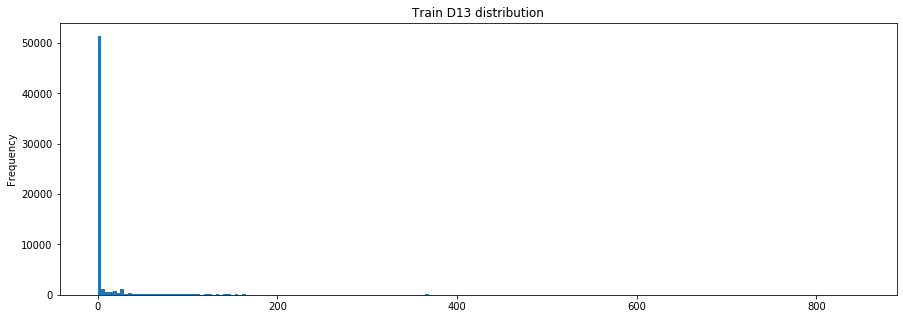

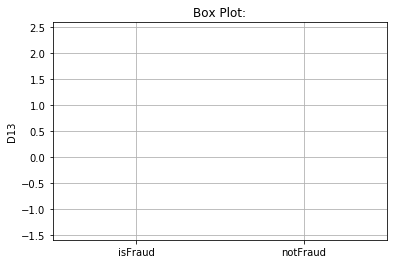

percentage of missing values: 89.50926270870728
--------------------------------------------------
Correlations: 
    Column  Correlation with D13
1       D8              0.521432
2      D15              0.431177
3       D6              0.419894
4       D2              0.394203
5       D4              0.383803
342   V188             -0.283609
343   V195             -0.709209
344   V198             -0.714801
345   V194             -0.722523
346   V197             -0.752441
--------------------------------------------------
Describing  D13  :
              Train  isFraud Train  isNotFraud Train
count  61952.000000    6837.000000      55115.000000
mean      17.901295       6.492321         19.316574
std       67.614425      31.330429         70.703174
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max      847.000000     745.0

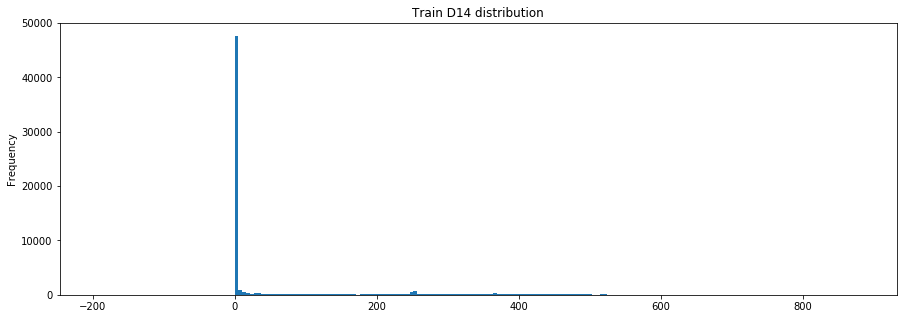

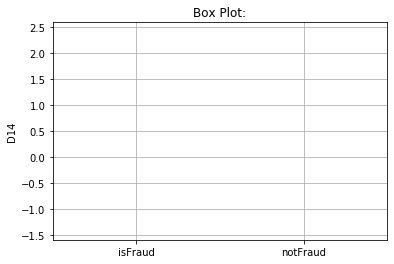

percentage of missing values: 89.46946862193924
--------------------------------------------------
Correlations: 
    Column  Correlation with D14
1      D10              0.336933
2     V326              0.269067
3     V327              0.260535
4     V335              0.243918
5     V330              0.242274
342   V153             -0.249805
343   V255             -0.309611
344   V256             -0.309642
345   V251             -0.654479
346   V250             -0.667355
--------------------------------------------------
Describing  D14  :
              Train  isFraud Train  isNotFraud Train
count  62187.000000    7213.000000      54974.000000
mean      57.724444      54.464578         58.152163
std      136.312450     126.586127        137.532930
min     -193.000000       0.000000       -193.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        2.000000       9.000000          1.000000
max      878.000000     847.0

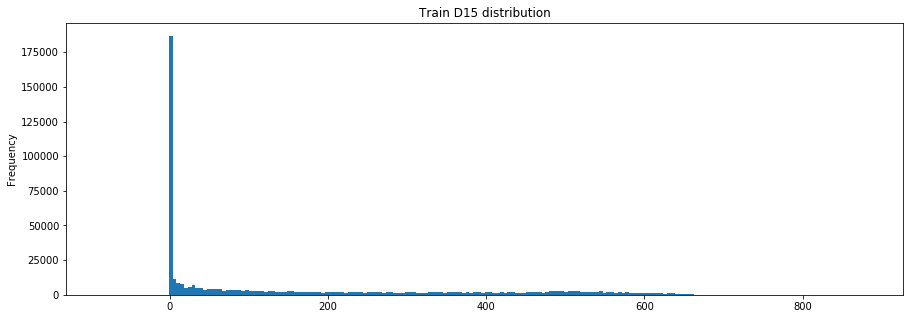

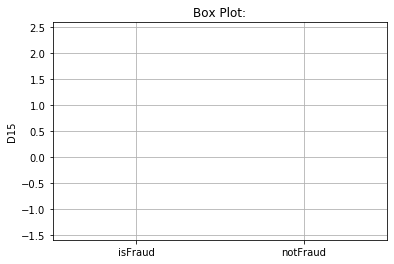

percentage of missing values: 15.090087038981272
--------------------------------------------------
Correlations: 
    Column  Correlation with D15
1      D11              0.765000
2       D4              0.751546
3      D10              0.712252
4       D6              0.700615
5       D1              0.638957
375   V149             -0.438651
376   V155             -0.442840
377   V154             -0.444239
378   V148             -0.445041
379   V153             -0.447363
--------------------------------------------------
Describing  D15  :
               Train  isFraud Train  isNotFraud Train
count  501427.000000   16387.000000     485040.000000
mean      163.744579      78.245805        166.633142
std       202.726660     151.956762        203.595694
min       -83.000000       0.000000        -83.000000
25%         0.000000       0.000000          0.000000
50%        52.000000       1.000000         56.000000
75%       314.000000      63.000000        321.000000
max       879.000000

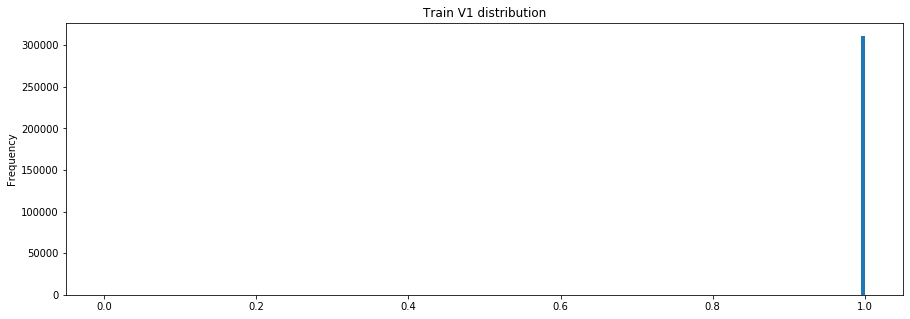

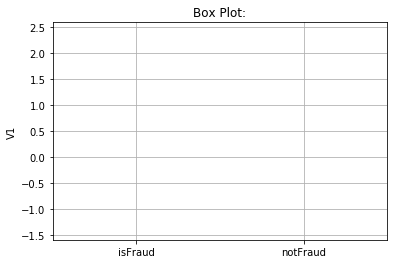

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V1
1      V88             0.547708
2      V41             0.462228
3       V8             0.040820
4      V66             0.035722
5       V9             0.034009
167   V282            -0.001198
168  addr1            -0.001638
169  card5            -0.001866
170     D3            -0.002702
171     D5            -0.006177
--------------------------------------------------
Describing  V1  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000         6106.0     305147.000000
mean        0.999945            1.0          0.999944
std         0.007390            0.0          0.007464
min         0.000000            1.0          0.000000
25%         1.000000            1.0          1.000000
50%         1.000000            1.0          1.000000
75%         1.000000            1.0          1.000000
max         1.000000            1

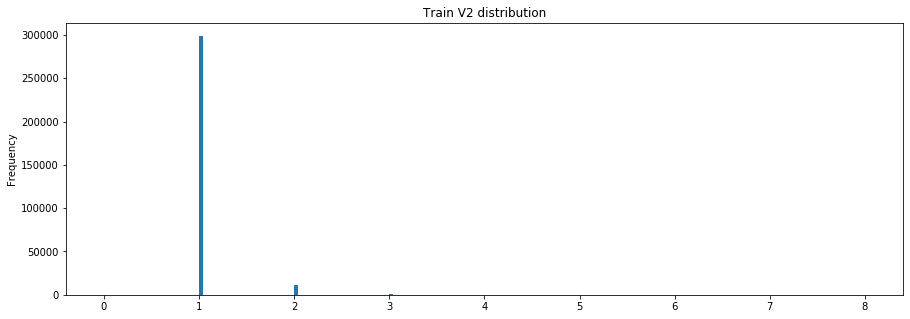

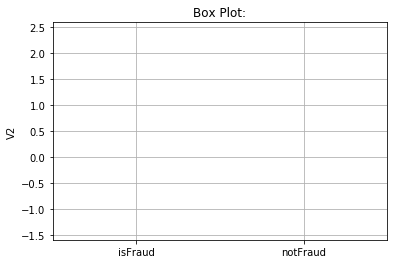

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V2
1       V3             0.773039
2       V8             0.732730
3       V6             0.621459
4       V9             0.618591
5       V7             0.496921
168    D15            -0.038601
169     D3            -0.039085
170    D10            -0.039635
171     D2            -0.061555
172    D11            -0.087162
--------------------------------------------------
Describing  V2  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        1.045204       1.078939          1.044529
std         0.240133       0.351422          0.237326
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         8.000000       6.0000

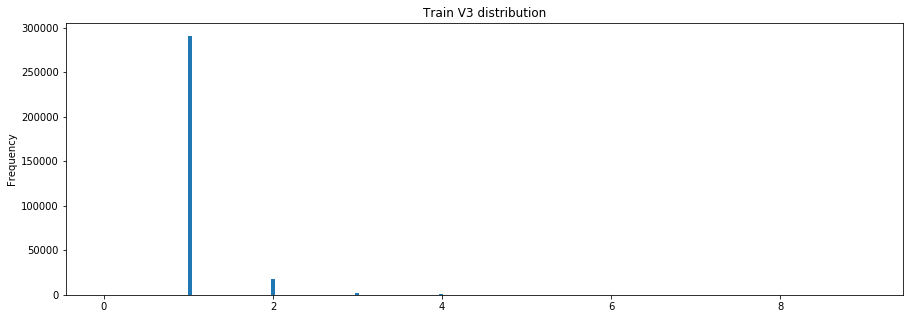

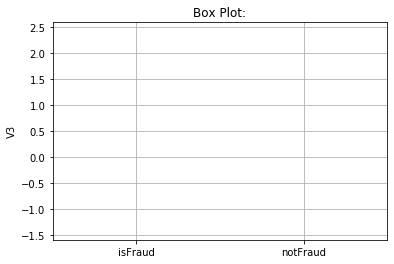

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V3
1       V2             0.773039
2       V9             0.653087
3       V8             0.556536
4       V7             0.546875
5       V6             0.472570
168    D10            -0.053322
169     D5            -0.061979
170     D3            -0.062549
171    D11            -0.093579
172     D2            -0.109067
--------------------------------------------------
Describing  V3  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        1.078075       1.189813          1.075839
std         0.320890       0.541936          0.314484
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         9.000000       7.0000

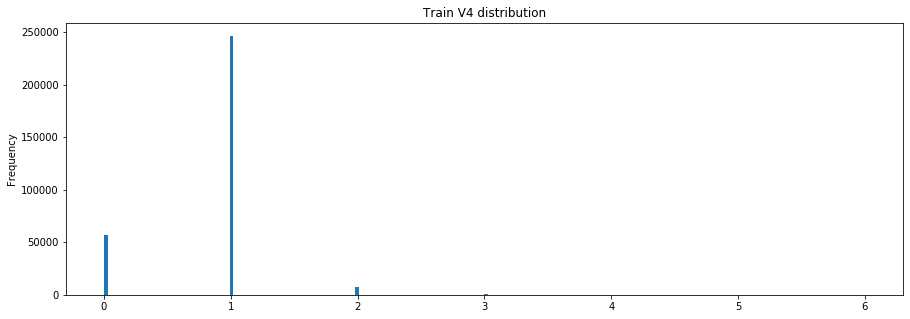

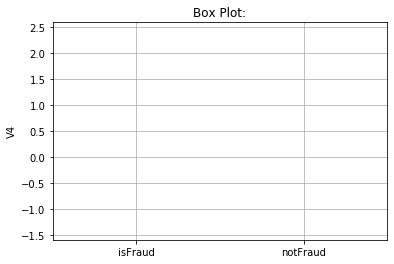

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V4
1       V5             0.915164
2      V82             0.683717
3      V83             0.629883
4      V61             0.606855
5      V19             0.606202
168     D2            -0.050060
169    D10            -0.053423
170    D15            -0.053686
171     D1            -0.073723
172    D11            -0.093822
--------------------------------------------------
Describing  V4  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        0.846456       0.885686          0.845671
std         0.440053       0.504883          0.438623
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         6.000000       4.0000

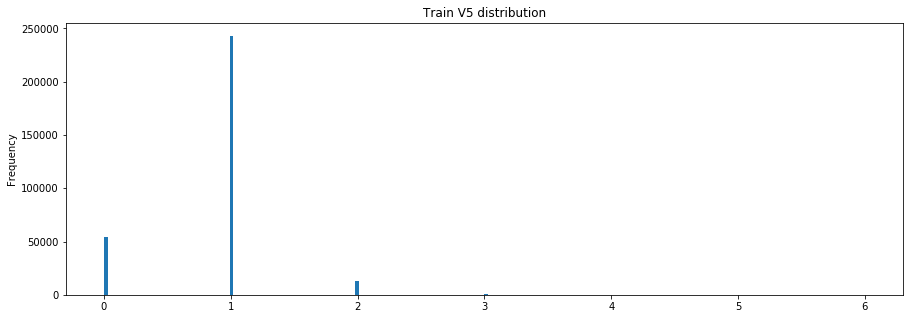

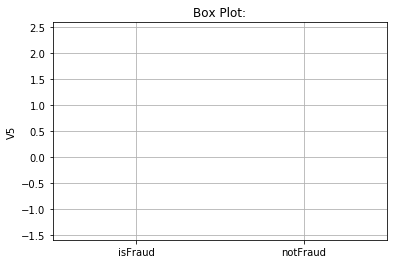

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V5
1       V4             0.915164
2      V83             0.658500
3      V82             0.634876
4      V62             0.588161
5      V20             0.583701
168    V69            -0.061584
169    V90            -0.063151
170     D1            -0.078982
171     D2            -0.082351
172    D11            -0.098366
--------------------------------------------------
Describing  V5  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        0.876991       1.001146          0.874506
std         0.475902       0.665395          0.471002
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         6.000000       6.0000

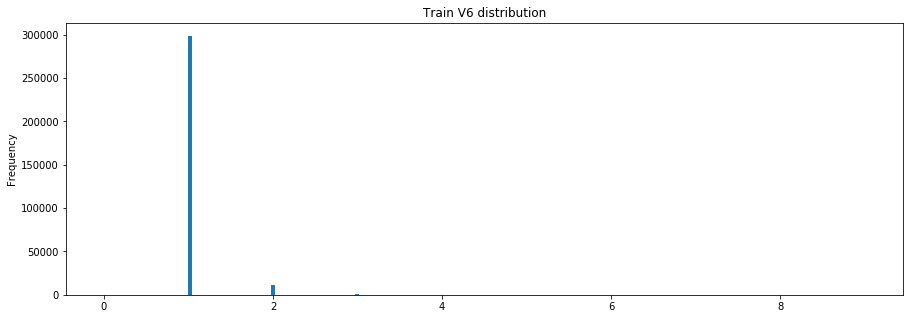

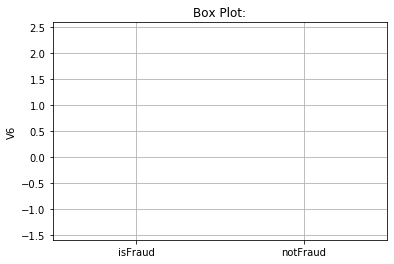

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V6
1       V7             0.796027
2       V8             0.675501
3       V2             0.621459
4       V9             0.561332
5       V3             0.472570
168    D15            -0.020571
169     D1            -0.023724
170     D2            -0.028983
171     D5            -0.042234
172    D11            -0.068055
--------------------------------------------------
Describing  V6  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        1.045686       1.063544          1.045329
std         0.239385       0.310700          0.237727
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         9.000000       6.0000

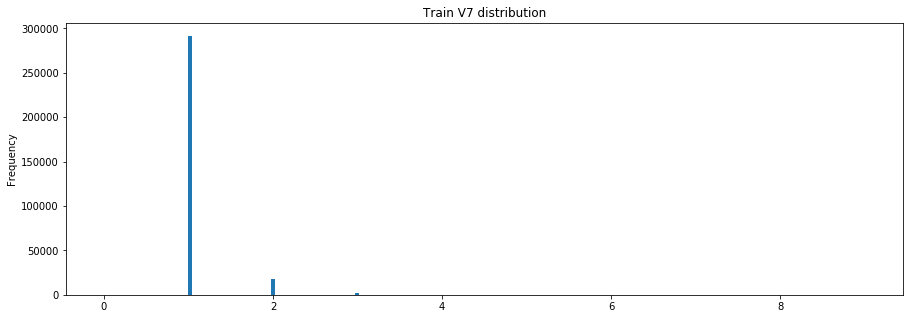

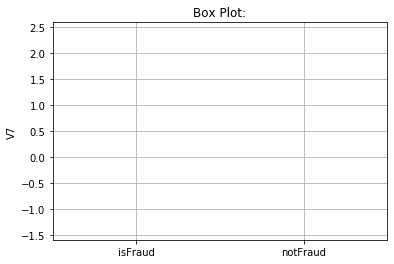

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V7
1       V6             0.796027
2       V9             0.594988
3       V3             0.546875
4       V8             0.538586
5       V2             0.496921
168     D1            -0.032126
169    V48            -0.032210
170     D2            -0.057308
171     D5            -0.060725
172    D11            -0.067522
--------------------------------------------------
Describing  V7  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        1.072870       1.123485          1.071857
std         0.304779       0.413311          0.302124
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         9.000000       6.0000

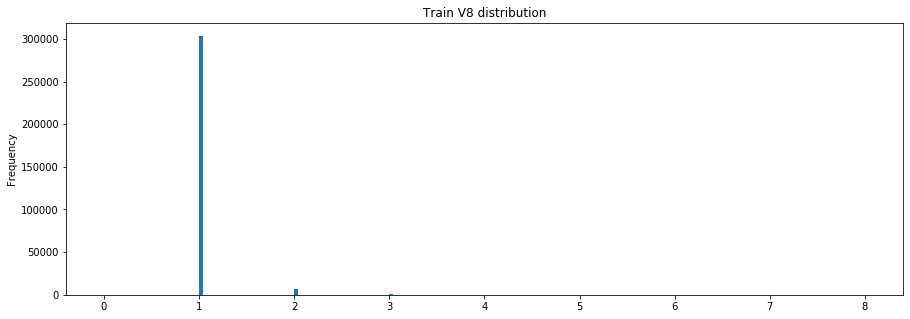

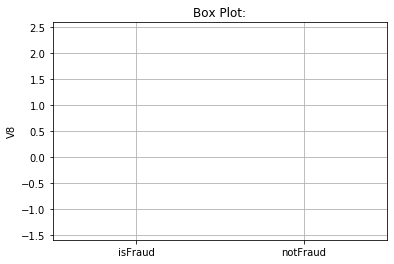

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V8
1       V9             0.835342
2       V2             0.732730
3       V6             0.675501
4       V3             0.556536
5       V7             0.538586
168    D10            -0.019761
169     D1            -0.022786
170    D15            -0.024336
171     D2            -0.038912
172    D11            -0.081674
--------------------------------------------------
Describing  V8  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        1.027704       1.048804          1.027282
std         0.186069       0.271332          0.183936
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         8.000000       5.0000

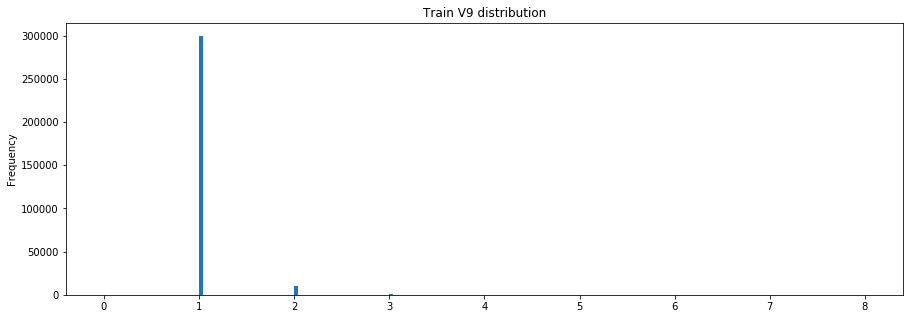

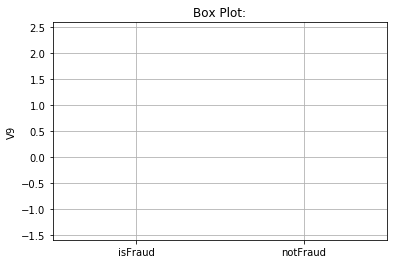

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V9
1       V8             0.835342
2       V3             0.653087
3       V2             0.618591
4       V7             0.594988
5       V6             0.561332
168     D5            -0.031726
169     D3            -0.032873
170    D15            -0.033050
171     D2            -0.060890
172    D11            -0.084328
--------------------------------------------------
Describing  V9  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        1.041529       1.102195          1.040315
std         0.226339       0.356576          0.222790
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         8.000000       5.0000

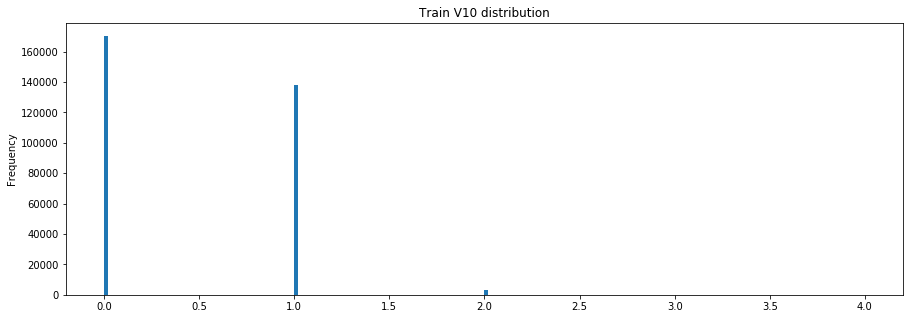

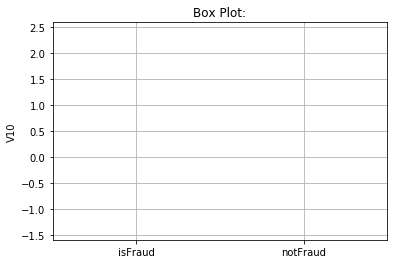

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V10
1      V11              0.968670
2      V90              0.907758
3      V48              0.893391
4      V69              0.883022
5      V29              0.879585
168   V283             -0.139100
169   V287             -0.145584
170    V97             -0.147457
171   V280             -0.156717
172    C12             -0.218494
--------------------------------------------------
Describing  V10  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        0.463915       0.188667          0.469423
std         0.521522       0.421117          0.521856
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         4.000000 

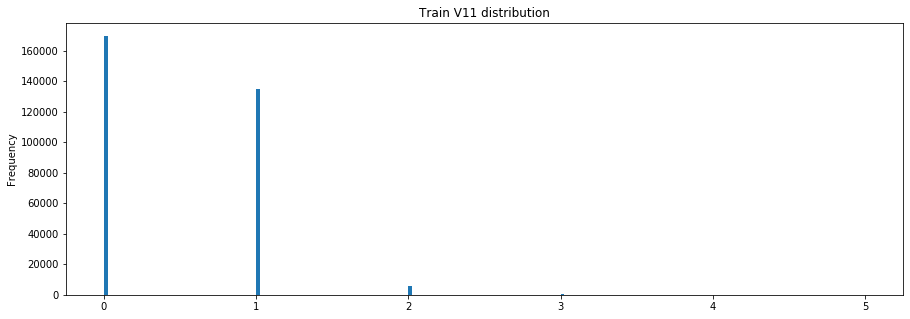

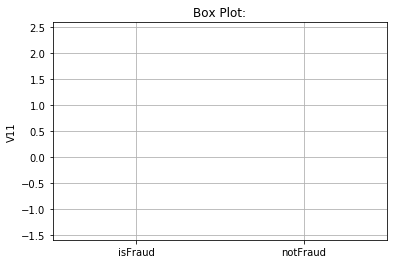

percentage of missing values: 47.29349409015477
--------------------------------------------------
Correlations: 
    Column  Correlation with V11
1      V10              0.968670
2      V90              0.887701
3      V91              0.884841
4      V48              0.870965
5      V49              0.865761
168   V283             -0.127174
169    V97             -0.132162
170    V74             -0.132237
171   V280             -0.141385
172    C12             -0.202619
--------------------------------------------------
Describing  V11  :
               Train  isFraud Train  isNotFraud Train
count  311253.000000    6106.000000     305147.000000
mean        0.478987       0.198002          0.484609
std         0.552431       0.447692          0.552870
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         5.000000 

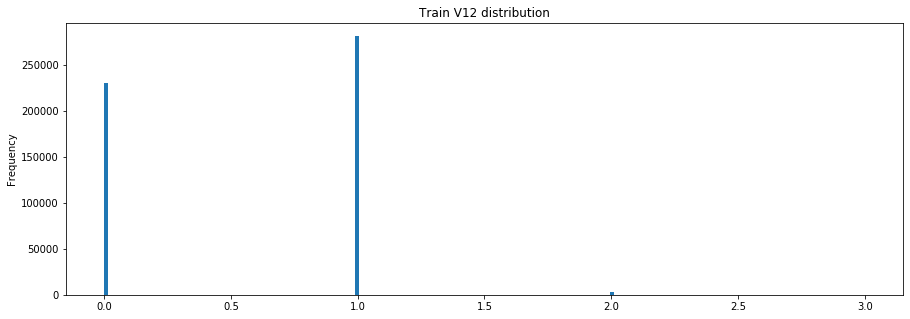

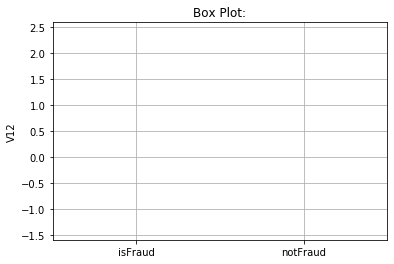

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V12
1      V13              0.925848
2      V75              0.708756
3      V76              0.671624
4      V35              0.659987
5      V53              0.635155
208    V32             -0.423963
209    V42             -0.433017
210    V31             -0.433737
211    V92             -0.435111
212    V50             -0.469230
--------------------------------------------------
Describing  V12  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.559711       0.413984          0.564623
std         0.510533       0.548667          0.508471
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         1.000000       1.000000          1.000000
max         3.000000

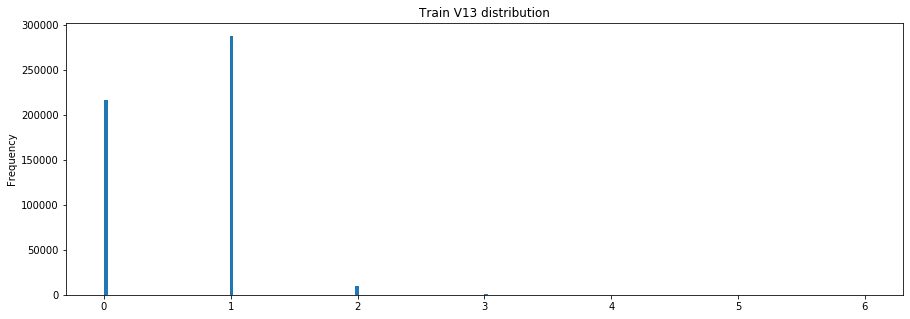

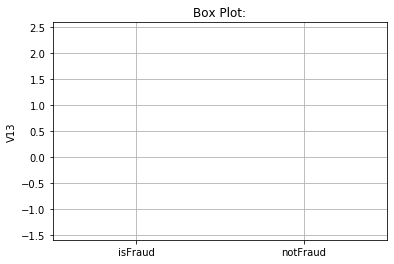

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V13
1      V12              0.925848
2      V76              0.719616
3      V75              0.670498
4      V36              0.669024
5      V54              0.643723
208    V32             -0.435384
209    V42             -0.444288
210    V31             -0.445421
211    V92             -0.447115
212    V50             -0.481444
--------------------------------------------------
Describing  V13  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.599166       0.466679          0.603632
std         0.532185       0.619955          0.528395
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         1.000000       1.000000          1.000000
max         6.000000

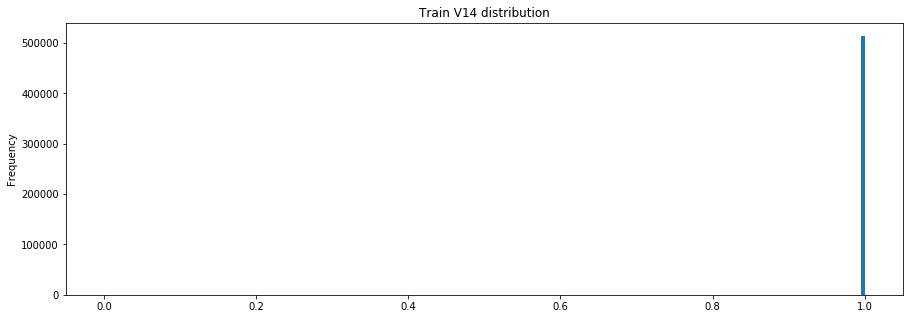

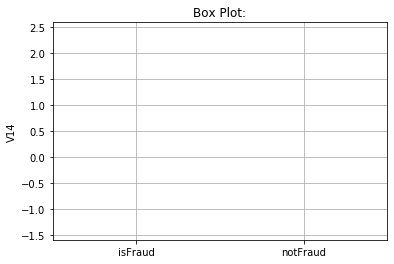

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V14
1      V41              0.880084
2      V65              0.844338
3      V88              0.834647
4      V25              0.117988
5      V46              0.115513
361   V155             -0.066411
362   V148             -0.066795
363   V154             -0.067373
364   V153             -0.068208
365     D7             -0.096807
--------------------------------------------------
Describing  V14  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.999500       0.999762          0.999492
std         0.022345       0.015440          0.022541
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         1.000000

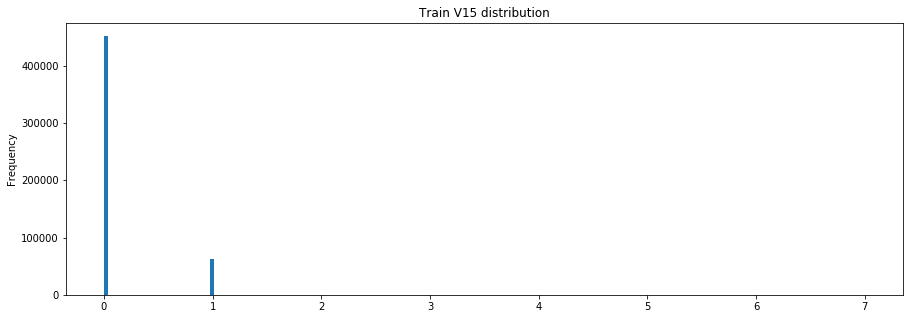

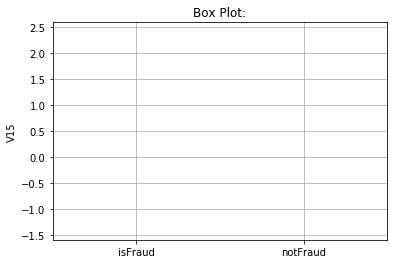

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V15
1      V16              0.986727
2      V57              0.958967
3      V33              0.958773
4      V94              0.953582
5      V50              0.946630
315    V53             -0.418216
316    V54             -0.429701
317    V35             -0.440371
318    V36             -0.450111
319  addr2             -0.819340
--------------------------------------------------
Describing  V15  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.122342       0.444564          0.111481
std         0.332422       0.514612          0.318881
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

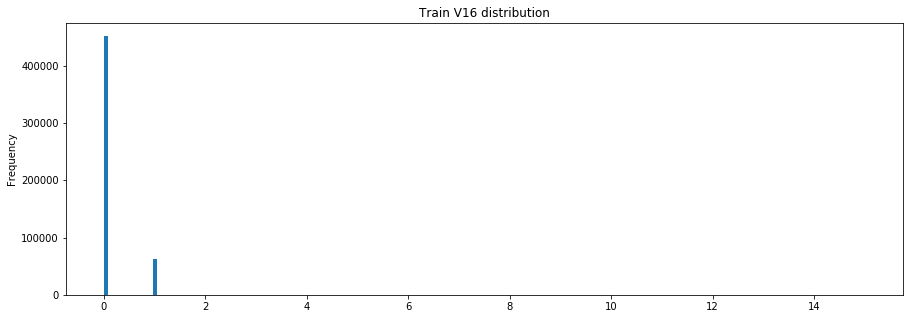

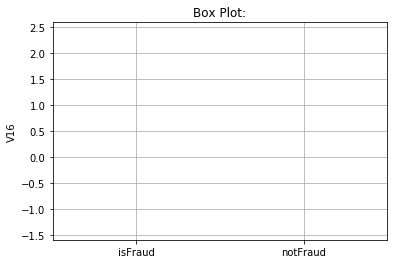

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V16
1      V15              0.986727
2      V33              0.943636
3      V57              0.938881
4      V94              0.933000
5      V34              0.931086
315    V53             -0.409196
316    V54             -0.420433
317    V35             -0.430572
318    V36             -0.440095
319  addr2             -0.712508
--------------------------------------------------
Describing  V16  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.123460       0.448975          0.112487
std         0.342841       0.530912          0.329104
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        15.000000

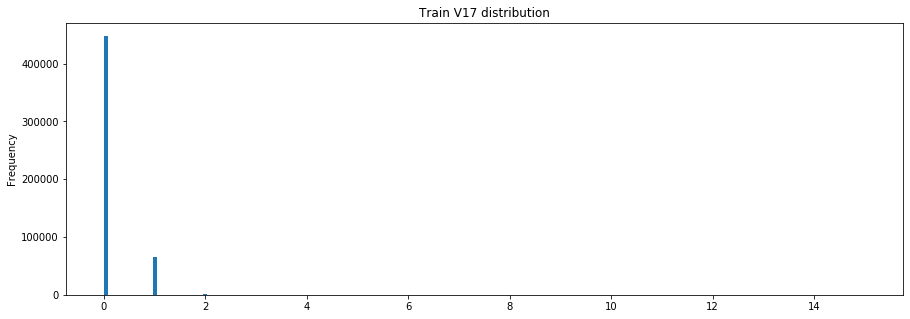

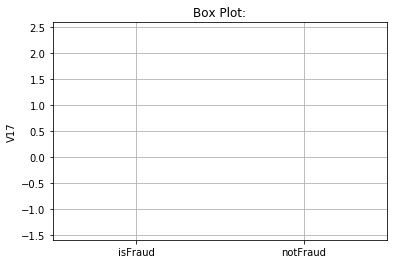

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V17
1      V18              0.991474
2      V21              0.951809
3      V22              0.917938
4      V84              0.909163
5      V63              0.906180
362    V12             -0.403208
363    V35             -0.409374
364    V54             -0.412949
365    V13             -0.414069
366    V36             -0.418428
--------------------------------------------------
Describing  V17  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.134040       0.496662          0.121817
std         0.364456       0.738461          0.338147
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        15.000000

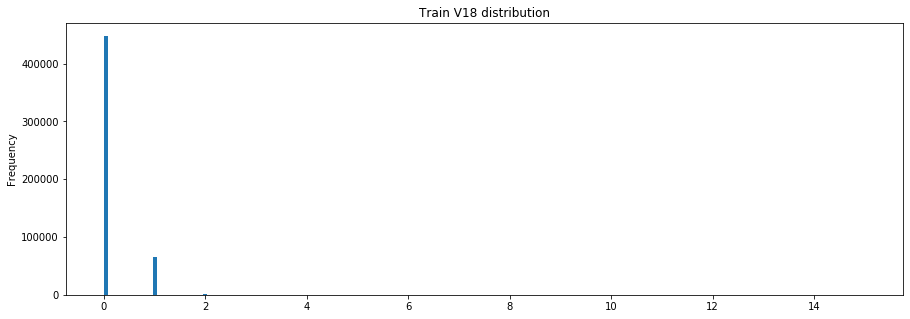

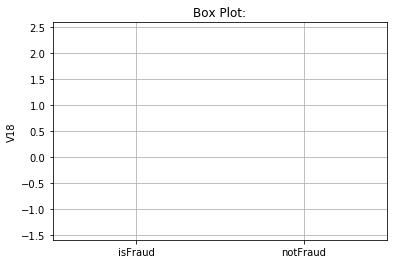

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V18
1      V17              0.991474
2      V21              0.944754
3      V22              0.927913
4      V84              0.899788
5      V63              0.898337
362    V12             -0.399186
363    V35             -0.405973
364    V54             -0.409579
365    V13             -0.409940
366    V36             -0.414952
--------------------------------------------------
Describing  V18  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.135363       0.505007          0.122904
std         0.371763       0.755766          0.344751
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        15.000000

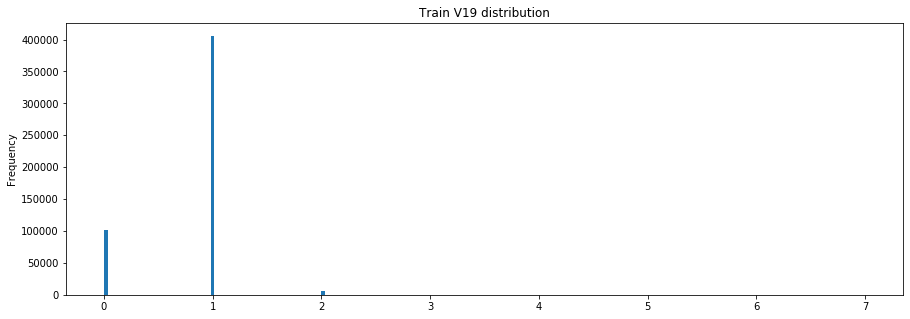

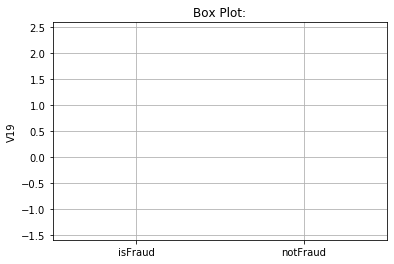

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V19
1      V20              0.905334
2      V82              0.722277
3      V61              0.682139
4      V83              0.644119
5      V62              0.615758
375   V183             -0.419397
376   V329             -0.431263
377   V330             -0.438646
378   V327             -0.517675
379   V326             -0.548849
--------------------------------------------------
Describing  V19  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.816371       0.887995          0.813957
std         0.425512       0.429226          0.425176
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         7.000000

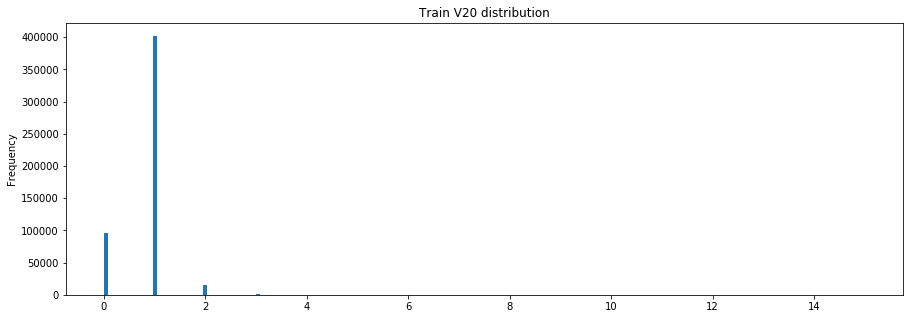

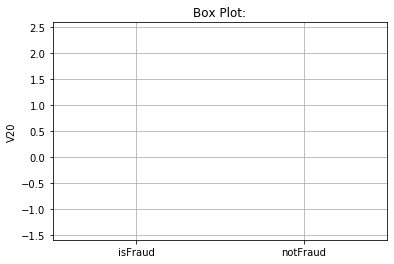

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V20
1      V19              0.905334
2      V83              0.674453
3      V82              0.661167
4      V62              0.633815
5      V61              0.632256
375   V328             -0.413837
376   V329             -0.427671
377   V330             -0.435053
378   V327             -0.512131
379   V326             -0.543650
--------------------------------------------------
Describing  V20  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000      497691.00000
mean        0.847843       0.948796           0.84444
std         0.459451       0.525761           0.45666
min         0.000000       0.000000           0.00000
25%         1.000000       1.000000           1.00000
50%         1.000000       1.000000           1.00000
75%         1.000000       1.000000           1.00000
max        15.000000

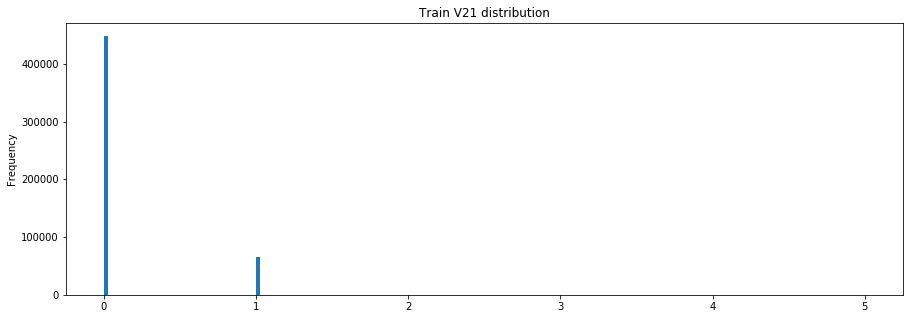

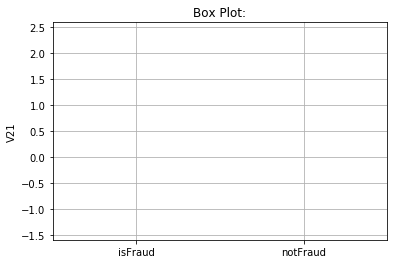

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V21
1      V22              0.964627
2      V84              0.955048
3      V17              0.951809
4      V63              0.946929
5      V18              0.944754
362    V12             -0.419325
363    V35             -0.428535
364    V54             -0.429660
365    V13             -0.430620
366    V36             -0.438013
--------------------------------------------------
Describing  V21  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.129684       0.436218          0.119351
std         0.339060       0.502972          0.327163
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         5.000000

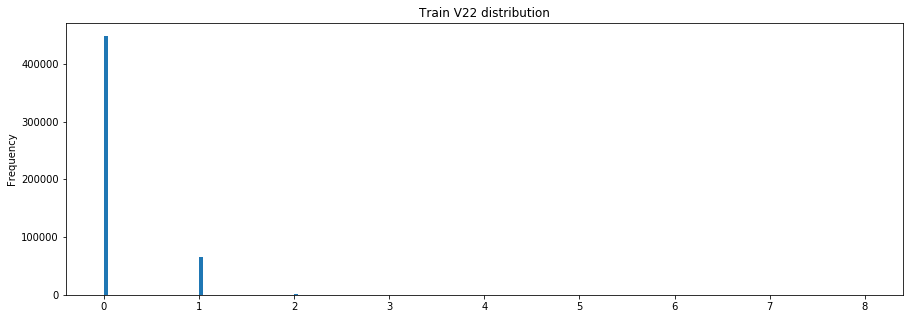

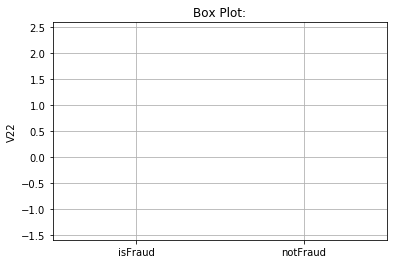

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V22
1      V21              0.964627
2      V42              0.934389
3      V18              0.927913
4      V63              0.920913
5      V17              0.917938
362    V12             -0.403534
363    V54             -0.414303
364    V13             -0.414404
365    V35             -0.424245
366    V36             -0.433628
--------------------------------------------------
Describing  V22  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.132292       0.443193          0.121813
std         0.359415       0.525582          0.347641
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         8.000000

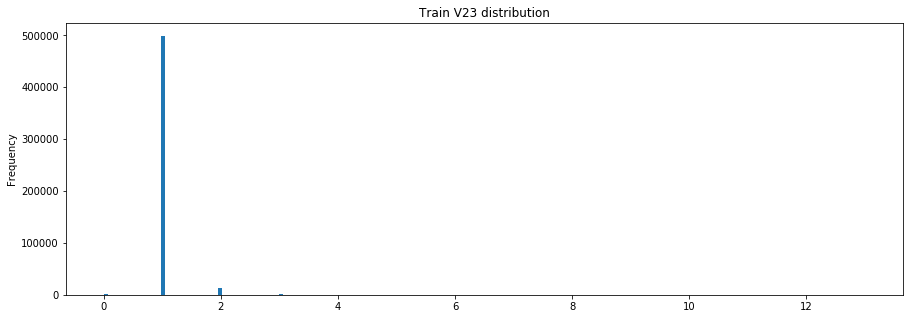

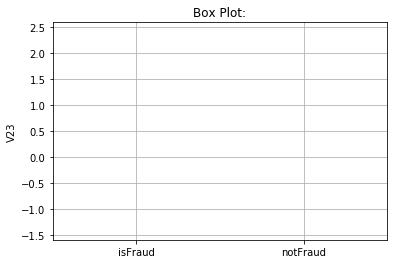

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V23
1      V24              0.824955
2     V123              0.612617
3     V125              0.500739
4      V86              0.452366
5     V257              0.400885
375     D8             -0.073936
376   V292             -0.080453
377  addr2             -0.080754
378   V291             -0.083794
379     D7             -0.085520
--------------------------------------------------
Describing  V23  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        1.034791       1.236350          1.027997
std         0.247681       0.860107          0.192518
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        13.000000

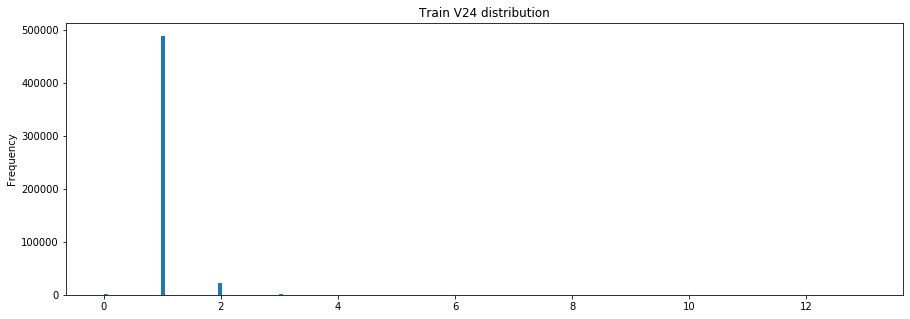

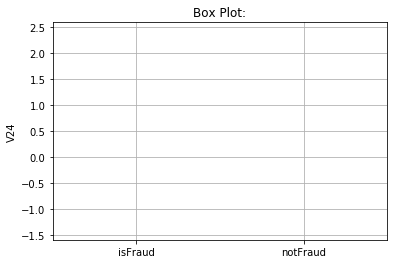

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V24
1      V23              0.824955
2     V123              0.532372
3     V125              0.486519
4      V87              0.426118
5     V124              0.405436
375     D5             -0.065159
376   V292             -0.065559
377   V291             -0.068306
378     D7             -0.081289
379  addr2             -0.100418
--------------------------------------------------
Describing  V24  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        1.058097       1.264127          1.051152
std         0.305485       0.889503          0.261379
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        13.000000

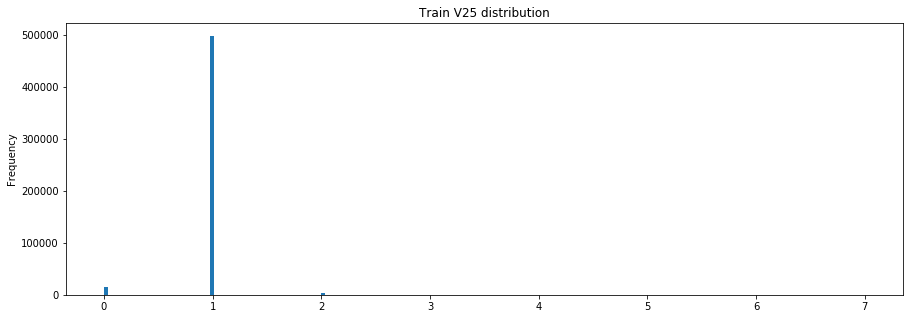

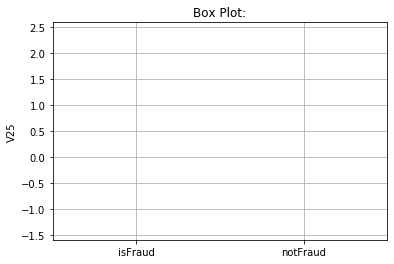

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V25
1      V26              0.840105
2      V66              0.556169
3      V67              0.466775
4      V19              0.329342
5      V20              0.295004
375    V90             -0.030490
376     D7             -0.035907
377    D14             -0.036052
378  addr2             -0.042292
379     D6             -0.054499
--------------------------------------------------
Describing  V25  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.977660       0.981521          0.977530
std         0.185245       0.235744          0.183299
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         7.000000

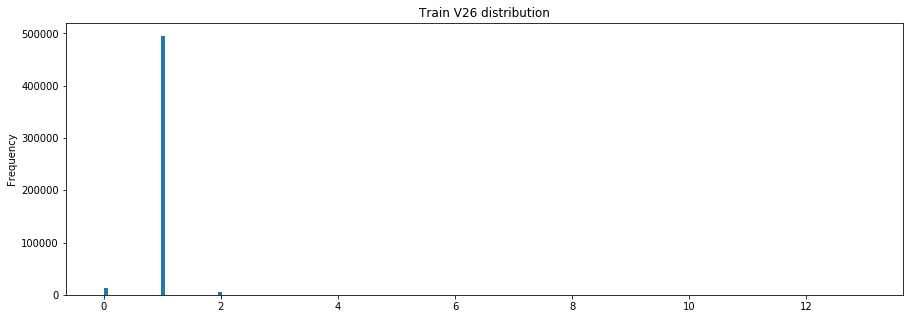

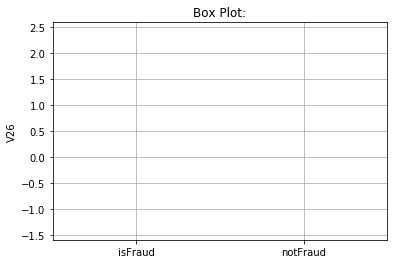

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V26
1      V25              0.840105
2      V67              0.477727
3      V66              0.469765
4      V20              0.340948
5      V19              0.277750
375    V48             -0.036054
376    V90             -0.036811
377    V11             -0.037558
378    V10             -0.040268
379  addr2             -0.095281
--------------------------------------------------
Describing  V26  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.988040       1.006199          0.987428
std         0.209302       0.289442          0.206031
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        13.000000

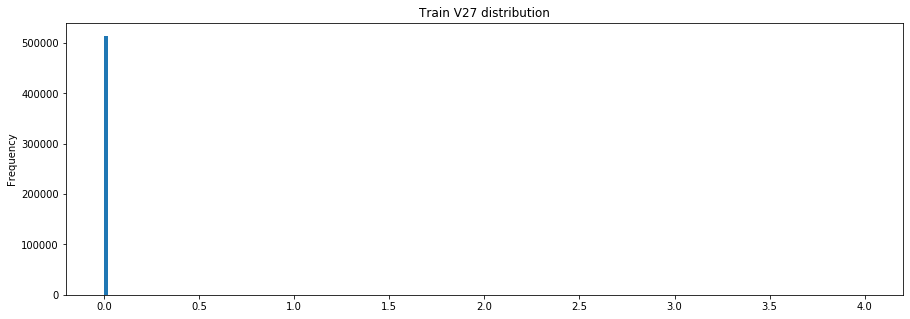

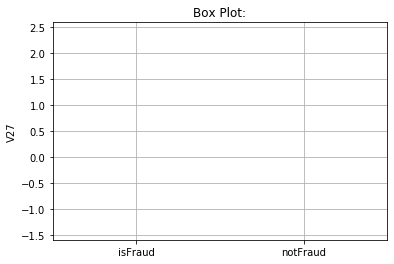

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V27
1      V28              0.973049
2      V89              0.935332
3      V68              0.889336
4       C3              0.548193
5     V277              0.146077
360   V329             -0.076322
361   V328             -0.078278
362   V330             -0.078566
363   V327             -0.093800
364   V326             -0.095166
--------------------------------------------------
Describing  V27  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000        16776.0     497691.000000
mean        0.000776            0.0          0.000802
std         0.028596            0.0          0.029073
min         0.000000            0.0          0.000000
25%         0.000000            0.0          0.000000
50%         0.000000            0.0          0.000000
75%         0.000000            0.0          0.000000
max         4.000000

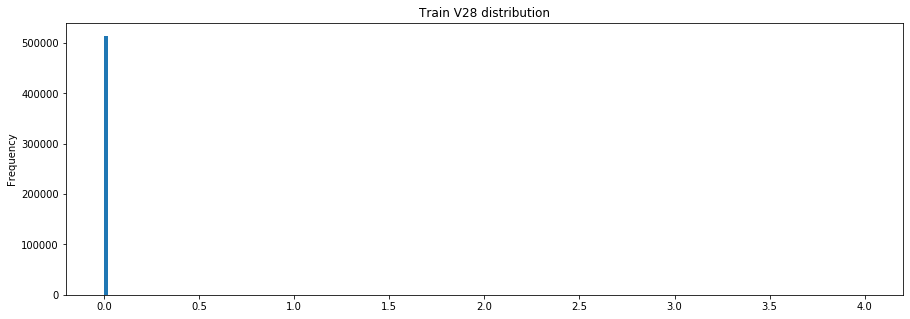

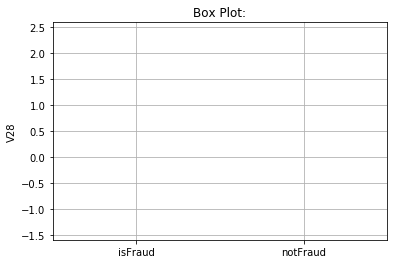

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V28
1      V27              0.973049
2      V89              0.968086
3      V68              0.914602
4       C3              0.593655
5     V267              0.195550
360   V329             -0.074457
361   V328             -0.076349
362   V330             -0.076881
363   V327             -0.090587
364   V326             -0.091447
--------------------------------------------------
Describing  V28  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000        16776.0     497691.000000
mean        0.000830            0.0          0.000858
std         0.031133            0.0          0.031653
min         0.000000            0.0          0.000000
25%         0.000000            0.0          0.000000
50%         0.000000            0.0          0.000000
75%         0.000000            0.0          0.000000
max         4.000000

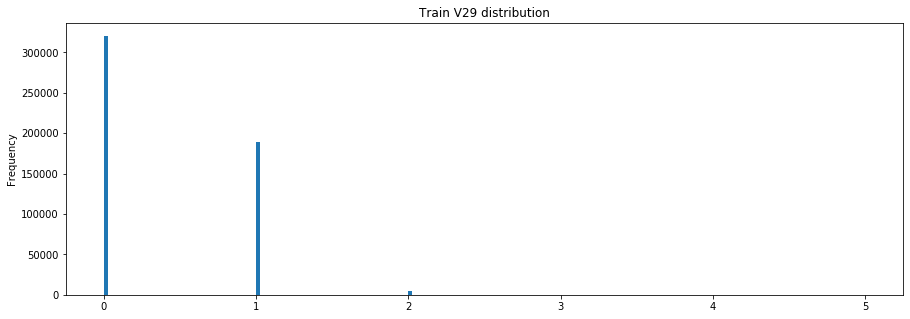

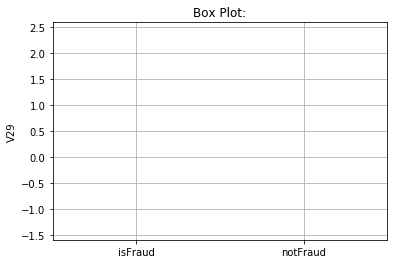

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V29
1      V30              0.957952
2      V90              0.932192
3      V48              0.915067
4      V69              0.914609
5      V91              0.897254
208    V31             -0.300479
209    V94             -0.303423
210    V52             -0.306100
211    V51             -0.310809
212    V50             -0.318943
--------------------------------------------------
Describing  V29  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.387840       0.087864          0.397952
std         0.510652       0.307336          0.513065
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         5.000000

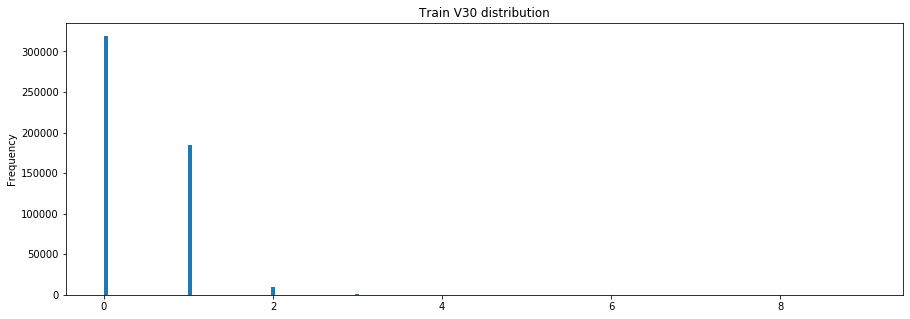

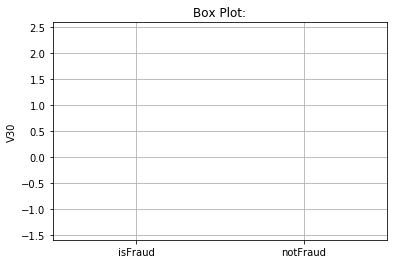

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V30
1      V29              0.957952
2      V91              0.916219
3      V90              0.901783
4      V70              0.894898
5      V49              0.893633
208    V31             -0.290085
209    V94             -0.292786
210    V52             -0.296323
211    V51             -0.300878
212    V50             -0.308755
--------------------------------------------------
Describing  V30  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.406436       0.095196          0.416927
std         0.554311       0.334857          0.557192
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         9.000000

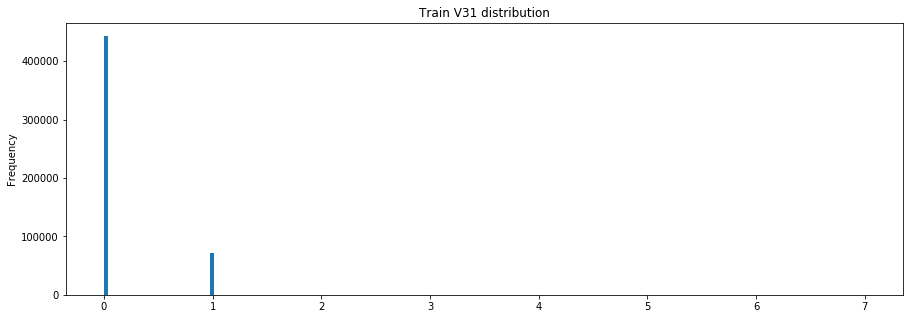

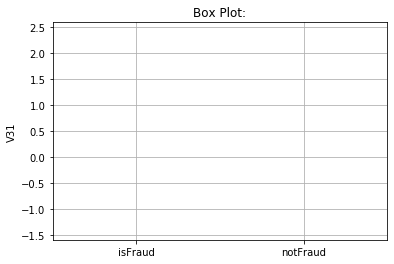

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V31
1      V32              0.986201
2      V50              0.981457
3      V92              0.965936
4      V71              0.958732
5      V93              0.928171
362   V159             -0.487232
363   V160             -0.501588
364   V150             -0.502933
365   V151             -0.538982
366   V152             -0.587984
--------------------------------------------------
Describing  V31  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.140761       0.456962          0.130103
std         0.355793       0.516374          0.344070
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

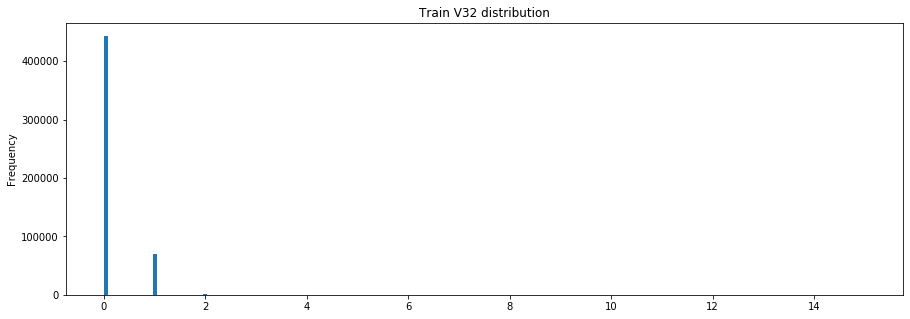

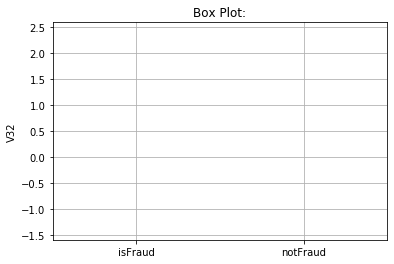

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V32
1      V31              0.986201
2      V50              0.961004
3      V92              0.945899
4      V71              0.938717
5      V16              0.912332
362   V150             -0.447032
363    V36             -0.452201
364  addr2             -0.457248
365   V151             -0.479138
366   V152             -0.523332
--------------------------------------------------
Describing  V32  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.142417       0.463758          0.131586
std         0.368278       0.538916          0.356108
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        15.000000

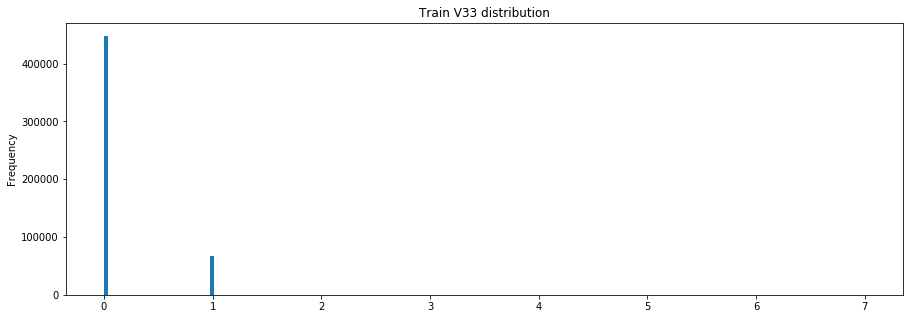

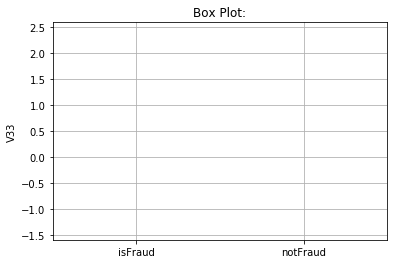

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V33
1      V94              0.975796
2      V34              0.959243
3      V15              0.958773
4      V16              0.943636
5      V51              0.940497
328    V53             -0.387275
329    V54             -0.398097
330    V35             -0.411890
331    V36             -0.420924
332  addr2             -0.603107
--------------------------------------------------
Describing  V33  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.130693       0.471388          0.119209
std         0.340900       0.518410          0.327150
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

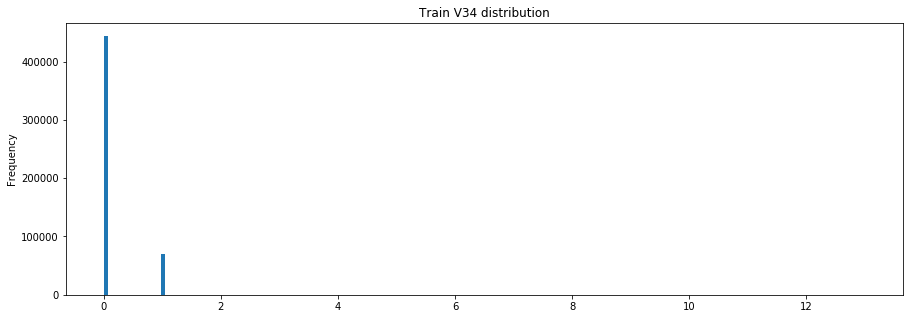

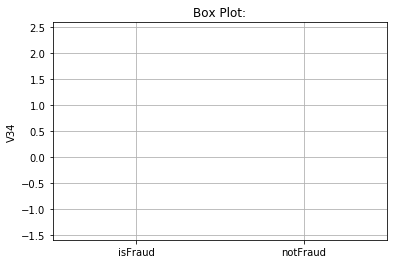

percentage of missing values: 12.881938564703491
--------------------------------------------------
Correlations: 
    Column  Correlation with V34
1      V33              0.959243
2      V94              0.933831
3      V16              0.931086
4      V15              0.922002
5      V51              0.904782
328    V53             -0.363768
329    V54             -0.366323
330    V35             -0.388892
331    V36             -0.391636
332  addr2             -0.518160
--------------------------------------------------
Describing  V34  :
               Train  isFraud Train  isNotFraud Train
count  514467.000000   16776.000000     497691.000000
mean        0.139154       0.490284          0.127318
std         0.357549       0.538387          0.343634
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        13.000000

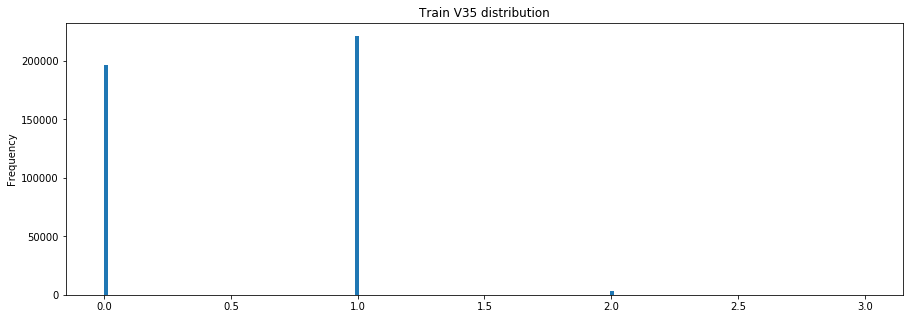

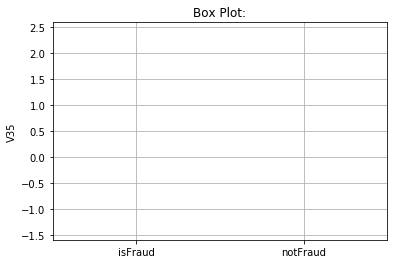

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V35
1      V36              0.931576
2      V75              0.743539
3      V76              0.704597
4      V12              0.659987
5      V13              0.633326
208    V32             -0.442416
209    V71             -0.444477
210    V92             -0.452122
211    V31             -0.452792
212    V50             -0.463197
--------------------------------------------------
Describing  V35  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.542594       0.332258          0.550122
std         0.516010       0.490180          0.515322
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         1.000000       1.000000          1.000000
max         3.000000

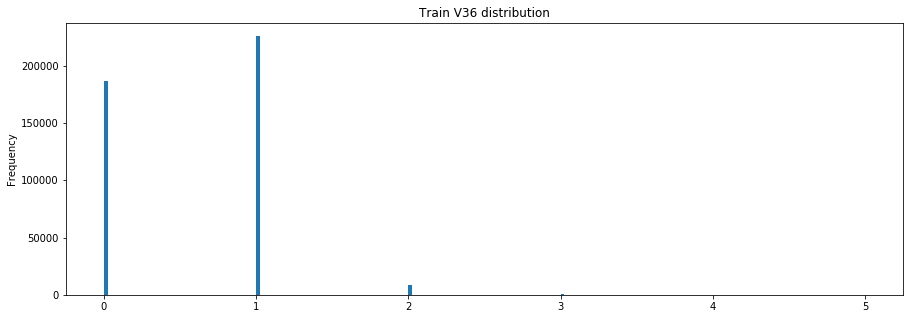

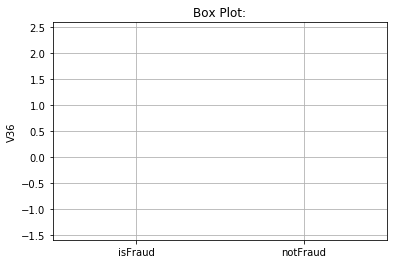

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V36
1      V35              0.931576
2      V76              0.746569
3      V75              0.703356
4      V13              0.669024
5      V54              0.640361
208    V32             -0.452201
209    V71             -0.454318
210    V92             -0.462045
211    V31             -0.462807
212    V50             -0.473321
--------------------------------------------------
Describing  V36  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.579198       0.380106          0.586323
std         0.539039       0.560396          0.536893
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         1.000000       1.000000          1.000000
max         5.000000

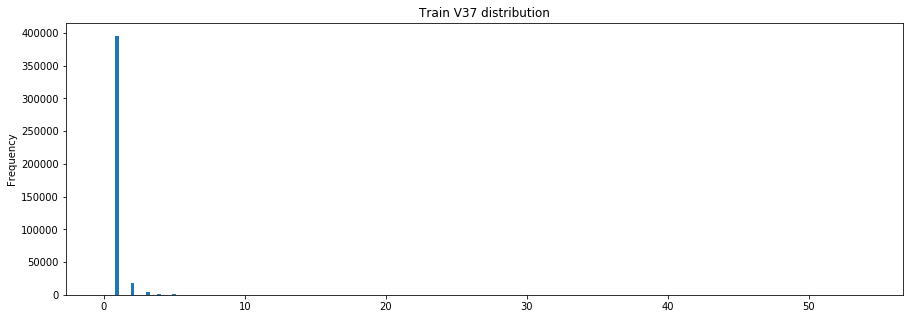

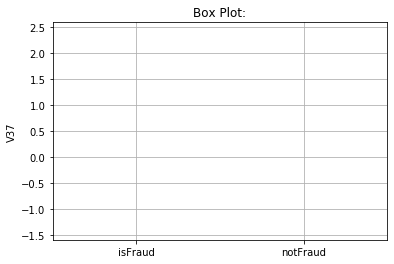

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V37
1      V38              0.868884
2      V77              0.688616
3     V228              0.687371
4      V44              0.647236
5     V230              0.598265
375    V53             -0.113655
376    V54             -0.116795
377    V12             -0.117251
378    V13             -0.119762
379     D7             -0.135971
--------------------------------------------------
Describing  V37  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        1.108065       1.753964          1.084948
std         0.690571       2.629251          0.480715
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max        54.000000

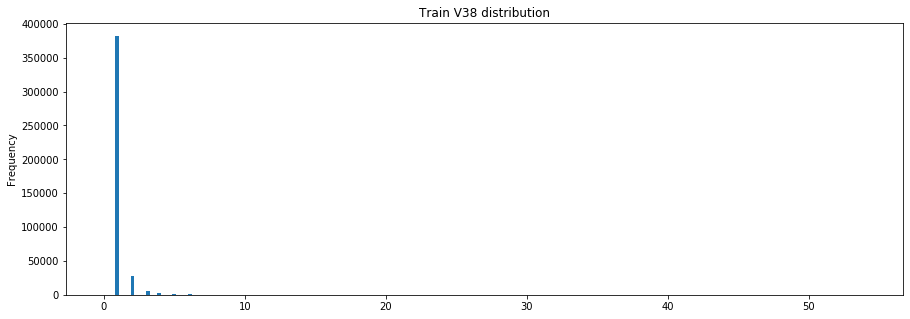

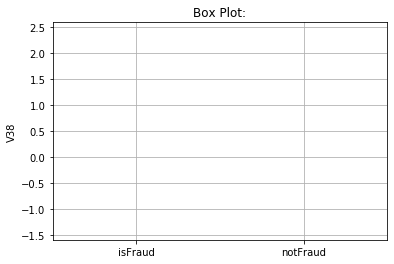

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V38
1      V37              0.868884
2      V45              0.641233
3      V77              0.636275
4      V78              0.633121
5     V228              0.625274
375    V53             -0.120757
376     D2             -0.121584
377    V12             -0.121793
378    V13             -0.122292
379     D7             -0.149998
--------------------------------------------------
Describing  V38  :
              Train  isFraud Train  isNotFraud Train
count  421571.00000   14567.000000     407004.000000
mean        1.16240       2.065902          1.130063
std         0.85892       3.202819          0.605612
min         0.00000       0.000000          0.000000
25%         1.00000       1.000000          1.000000
50%         1.00000       1.000000          1.000000
75%         1.00000       2.000000          1.000000
max        54.00000      54.

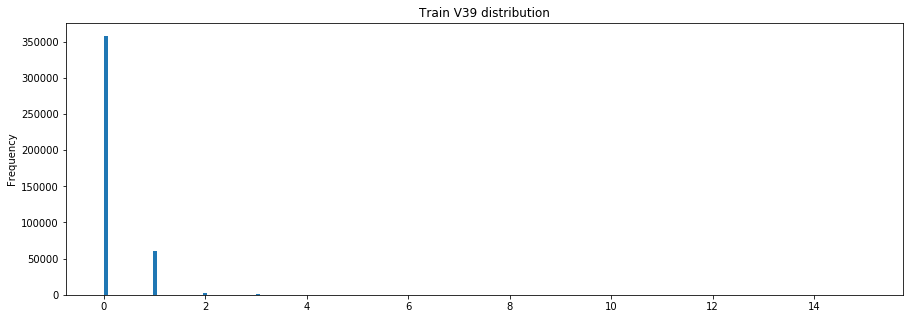

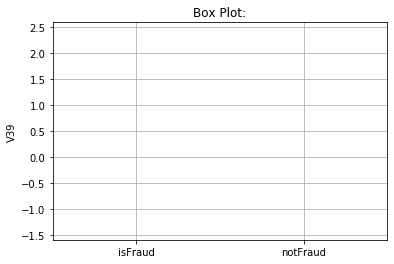

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V39
1      V40              0.943888
2      V80              0.902400
3      V59              0.896473
4      V42              0.876143
5      V81              0.867285
362    V12             -0.389792
363    V36             -0.394839
364    V13             -0.399938
365    V53             -0.401318
366    V54             -0.411246
--------------------------------------------------
Describing  V39  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.166076       0.651267          0.148711
std         0.451956       0.947924          0.413146
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        15.000000

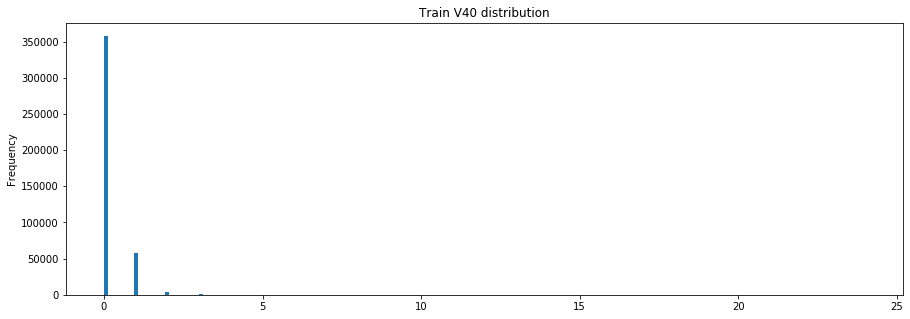

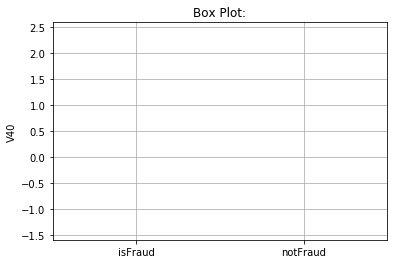

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V40
1      V39              0.943888
2      V81              0.876484
3      V60              0.866431
4      V80              0.862709
5      V43              0.853337
362    V36             -0.376330
363    V13             -0.380729
364    V53             -0.382665
365  addr2             -0.386945
366    V54             -0.392132
--------------------------------------------------
Describing  V40  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.177145       0.745109          0.156817
std         0.505786       1.154619          0.453107
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       1.000000          0.000000
max        24.000000

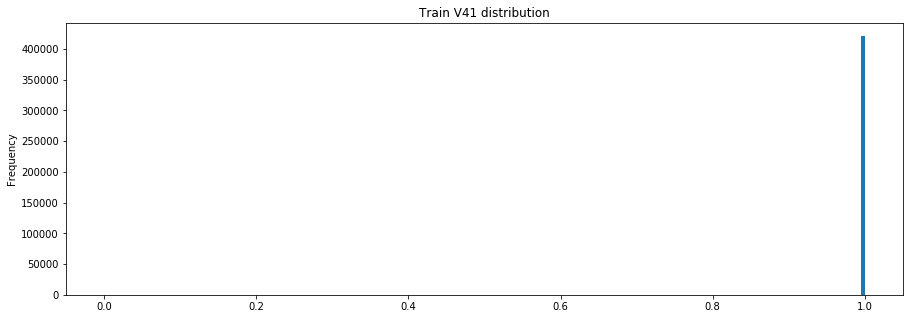

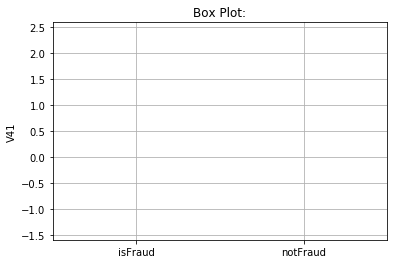

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V41
1      V88              0.942586
2      V65              0.891086
3      V14              0.880084
4       V1              0.462228
5      V46              0.165801
375   V302             -0.048362
376     D5             -0.051020
377     D6             -0.051160
378     D8             -0.065795
379     D7             -0.115363
--------------------------------------------------
Describing  V41  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.999269       0.999863          0.999248
std         0.027020       0.011717          0.027409
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         1.000000

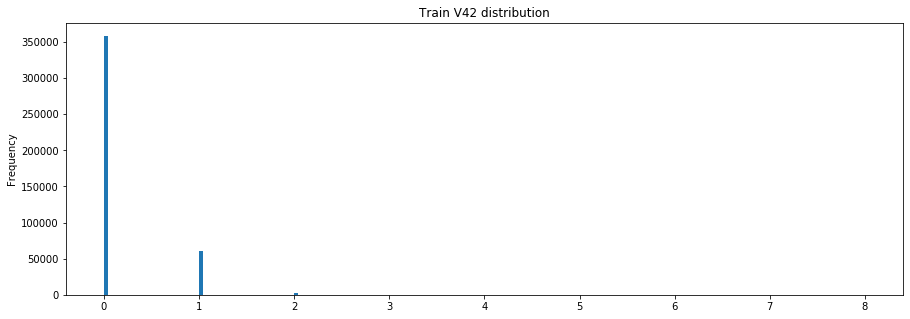

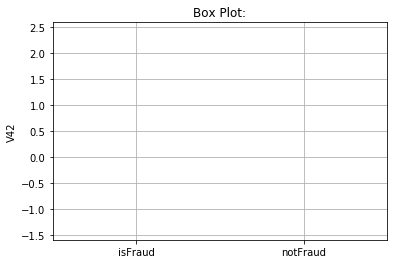

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V42
1      V84              0.957588
2      V63              0.953351
3      V43              0.952002
4      V21              0.944027
5      V22              0.934389
362    V12             -0.433017
363    V36             -0.438108
364    V13             -0.444288
365    V53             -0.446543
366    V54             -0.457589
--------------------------------------------------
Describing  V42  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.156118       0.539507          0.142397
std         0.382896       0.596745          0.365600
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         8.000000

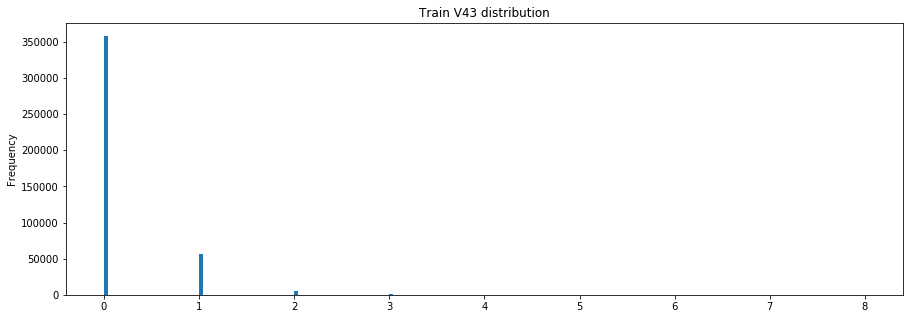

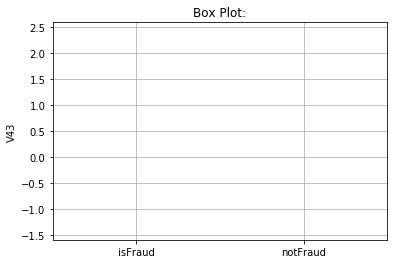

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V43
1      V42              0.952002
2      V64              0.920388
3      V85              0.915452
4      V84              0.915055
5      V63              0.910219
362    V12             -0.414433
363    V36             -0.418888
364    V13             -0.425221
365    V53             -0.427198
366    V54             -0.437766
--------------------------------------------------
Describing  V43  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.168942       0.623121          0.152686
std         0.433359       0.769766          0.407024
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         8.000000

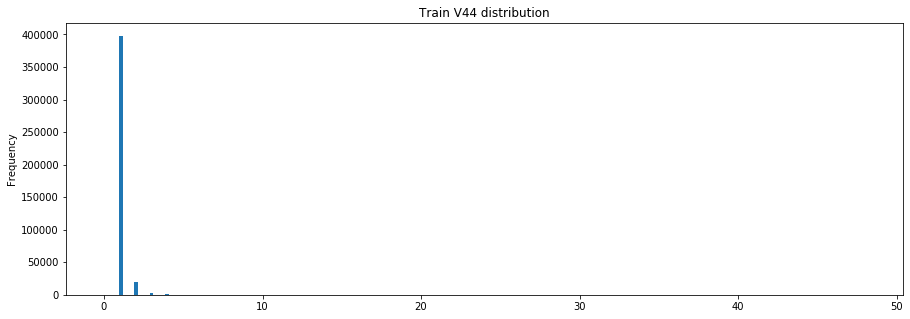

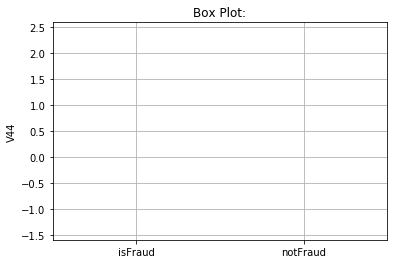

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V44
1      V45              0.905101
2     V257              0.766933
3     V200              0.692804
4     V199              0.688442
5     V246              0.682124
375    V13             -0.065195
376    V53             -0.068840
377    V54             -0.071493
378     D8             -0.081858
379     D7             -0.097500
--------------------------------------------------
Describing  V44  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        1.083891       1.963548          1.052407
std         0.639143       3.011257          0.264426
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max        48.000000

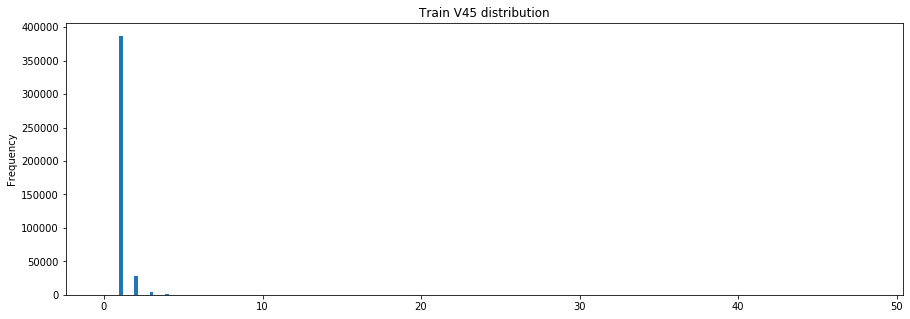

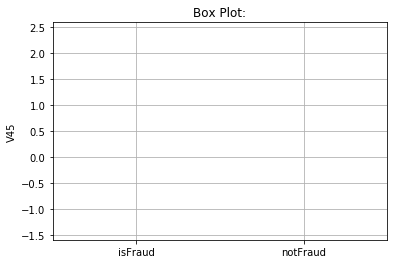

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V45
1      V44              0.905101
2     V257              0.741696
3     V201              0.670059
4     V246              0.669157
5     V199              0.665572
375    V12             -0.066598
376    V54             -0.069164
377    V53             -0.069561
378     D8             -0.089789
379     D7             -0.107394
--------------------------------------------------
Describing  V45  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        1.120779       2.207936          1.081869
std         0.729774       3.290828          0.346760
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max        48.000000

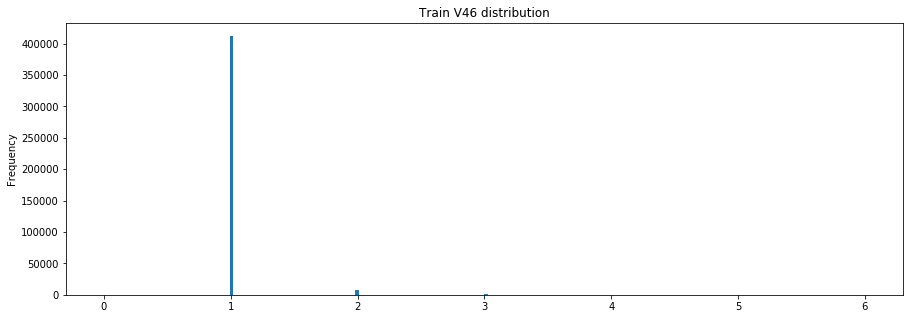

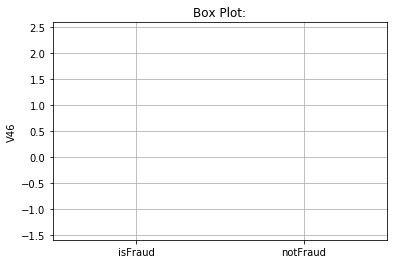

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V46
1      V47              0.755280
2      V44              0.391058
3      V37              0.390613
4      V45              0.360067
5      V38              0.339737
375    V12             -0.040291
376    V29             -0.040457
377    V75             -0.042548
378     D8             -0.062397
379     D7             -0.097447
--------------------------------------------------
Describing  V46  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        1.022286       1.133315          1.018312
std         0.166719       0.447973          0.145434
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         6.000000

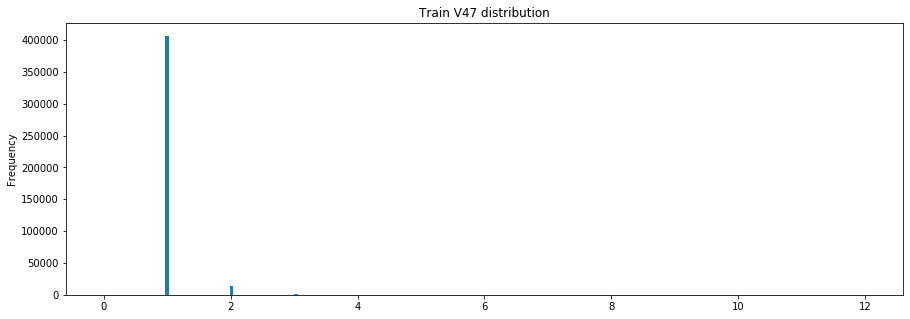

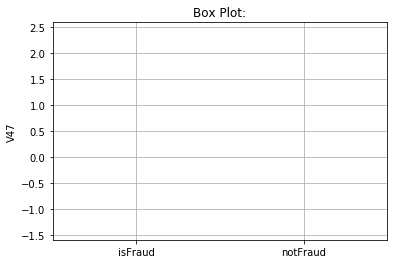

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V47
1      V46              0.755280
2      V38              0.411788
3      V45              0.398933
4      V52              0.365167
5      V44              0.309776
375    V69             -0.058025
376    V90             -0.059388
377    V29             -0.059653
378     D8             -0.072240
379     D7             -0.104710
--------------------------------------------------
Describing  V47  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        1.038515       1.239651          1.031317
std         0.231862       0.707659          0.190426
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        12.000000

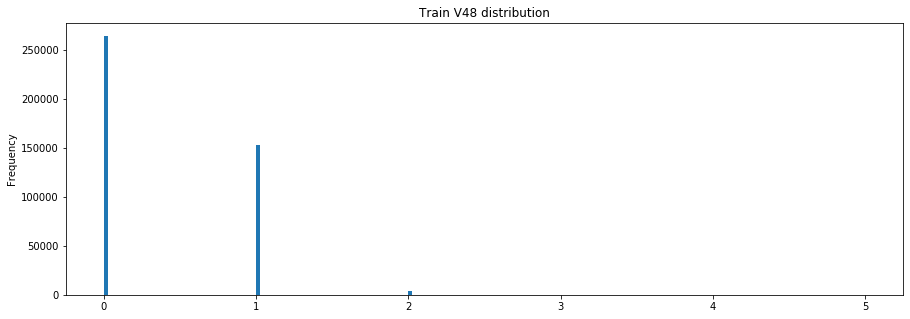

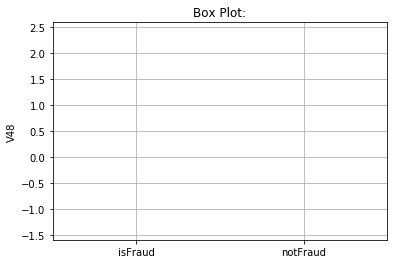

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V48
1      V49              0.967744
2      V90              0.944901
3      V29              0.915067
4      V69              0.912198
5      V91              0.909608
208    V92             -0.323832
209    V33             -0.326608
210    V34             -0.328893
211    V94             -0.331298
212    V50             -0.332139
--------------------------------------------------
Describing  V48  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.383174       0.072149          0.394306
std         0.508189       0.280881          0.510969
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         5.000000

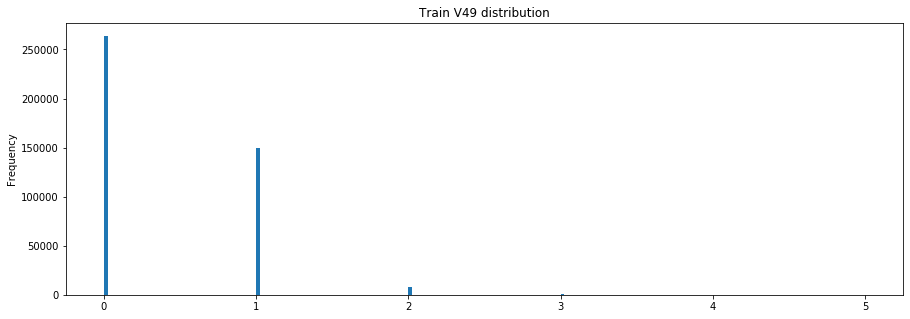

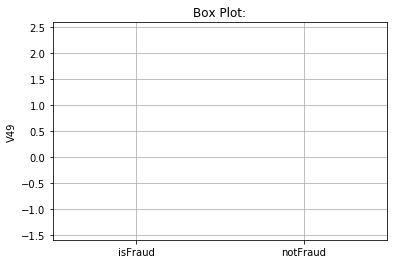

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V49
1      V48              0.967744
2      V91              0.925746
3      V90              0.917756
4      V30              0.893633
5      V70              0.891002
208    V92             -0.314762
209    V33             -0.317404
210    V34             -0.319635
211    V94             -0.321990
212    V50             -0.322855
--------------------------------------------------
Describing  V49  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.397724       0.079563          0.409111
std         0.542654       0.317332          0.545579
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         5.000000

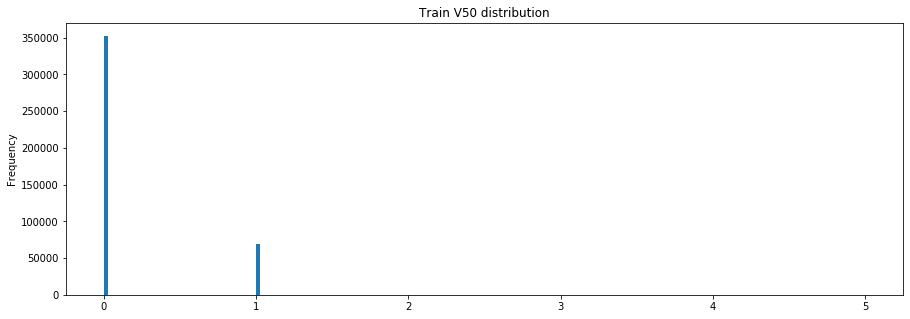

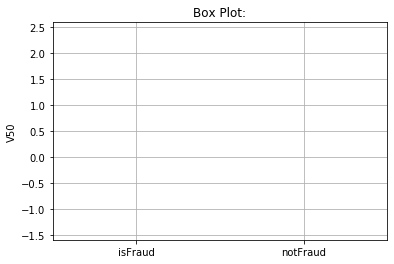

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V50
1      V31              0.981457
2      V92              0.970760
3      V71              0.964355
4      V32              0.961004
5      V15              0.946630
362   V160             -0.528673
363   V145             -0.533730
364   V150             -0.539547
365   V151             -0.573047
366   V152             -0.613668
--------------------------------------------------
Describing  V50  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.164746       0.520492          0.152013
std         0.373995       0.501791          0.362182
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       1.000000          0.000000
max         5.000000

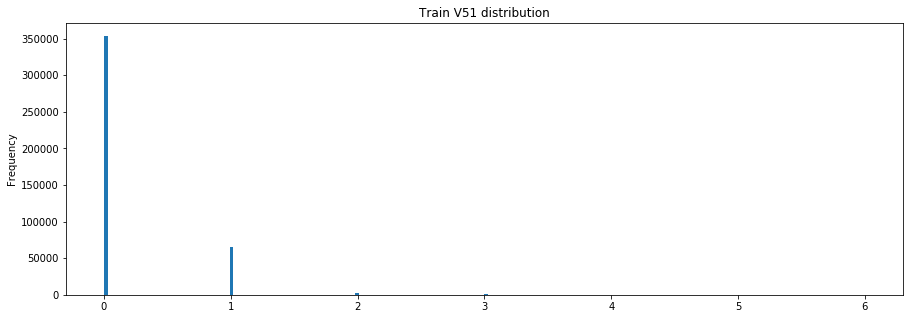

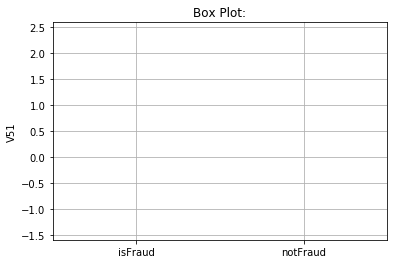

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V51
1      V52              0.952022
2      V94              0.950989
3      V33              0.940497
4      V73              0.935877
5      V15              0.923125
328    V12             -0.417592
329    V13             -0.428012
330    V53             -0.435189
331    V54             -0.445213
332  addr2             -0.632249
--------------------------------------------------
Describing  V51  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.170579       0.647079          0.153524
std         0.403899       0.724260          0.376541
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       1.000000          0.000000
max         6.000000

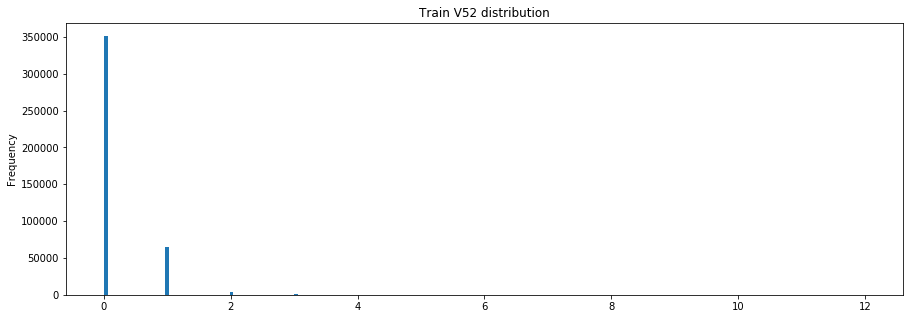

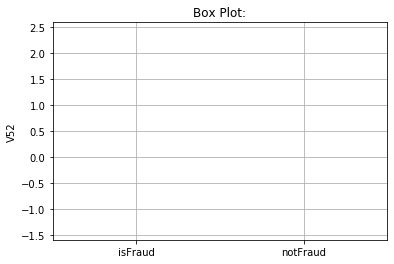

percentage of missing values: 28.612625732380533
--------------------------------------------------
Correlations: 
    Column  Correlation with V52
1      V51              0.952022
2      V94              0.905186
3      V74              0.899592
4      V33              0.895447
5      V73              0.895137
328    V12             -0.394465
329    V13             -0.399195
330    V53             -0.412856
331    V54             -0.416929
332  addr2             -0.558352
--------------------------------------------------
Describing  V52  :
               Train  isFraud Train  isNotFraud Train
count  421571.000000   14567.000000     407004.000000
mean        0.182695       0.738381          0.162807
std         0.439002       0.924367          0.396980
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       1.000000          0.000000
max        12.000000

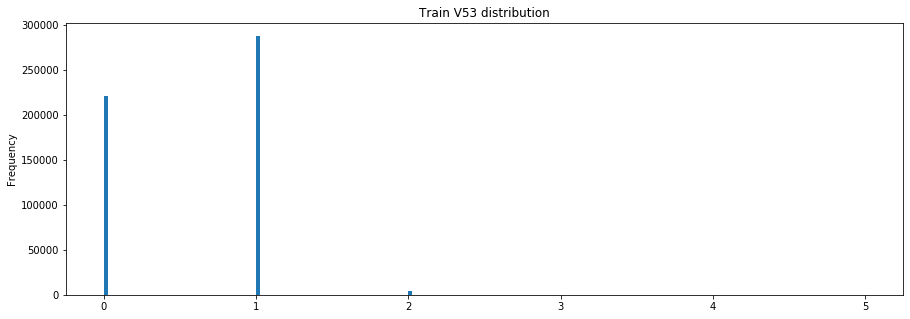

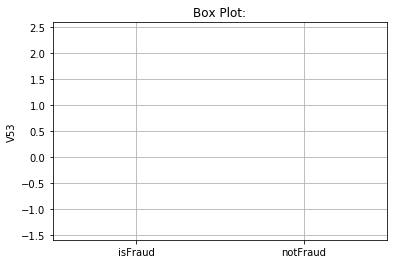

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V53
1      V54              0.920436
2      V75              0.658947
3      V12              0.635155
4      V35              0.630985
5      V76              0.621525
208    V51             -0.435189
209    V71             -0.435866
210    V92             -0.445846
211    V42             -0.446543
212    V50             -0.485193
--------------------------------------------------
Describing  V53  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.577586       0.443048          0.581956
std         0.511571       0.565967          0.509111
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         1.000000       1.000000          1.000000
max         5.000000

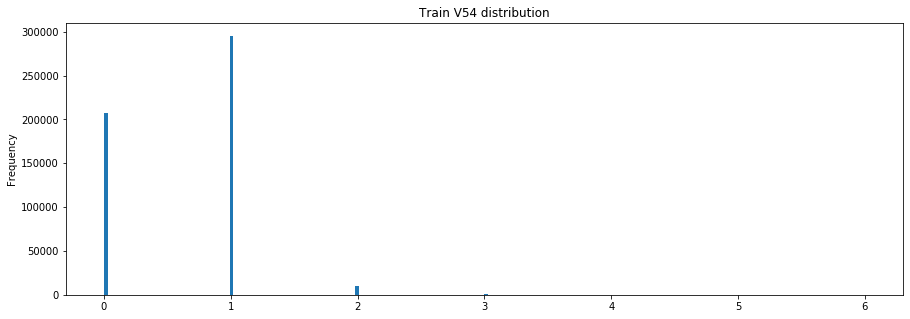

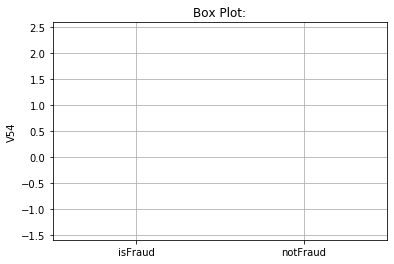

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V54
1      V53              0.920436
2      V76              0.668517
3      V13              0.643723
4      V36              0.640361
5      V75              0.622828
208    V31             -0.446002
209    V71             -0.447676
210    V42             -0.457589
211    V92             -0.458229
212    V50             -0.497196
--------------------------------------------------
Describing  V54  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.619982       0.510152          0.623550
std         0.534635       0.654092          0.529922
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         1.000000       1.000000          1.000000
max         6.000000

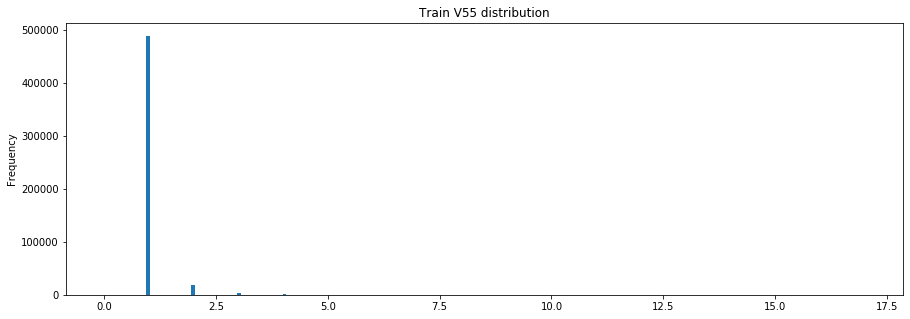

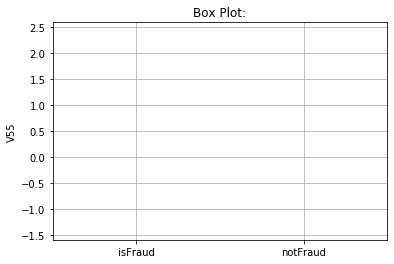

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V55
1      V56              0.691925
2     V290              0.611955
3     V292              0.530908
4     V281              0.528348
5      V77              0.522321
375    V29             -0.096872
376    V49             -0.096944
377    V48             -0.099616
378     D2             -0.127195
379     D7             -0.151020
--------------------------------------------------
Describing  V55  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        1.067670       1.176489          1.064136
std         0.391364       0.584570          0.382941
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        17.000000

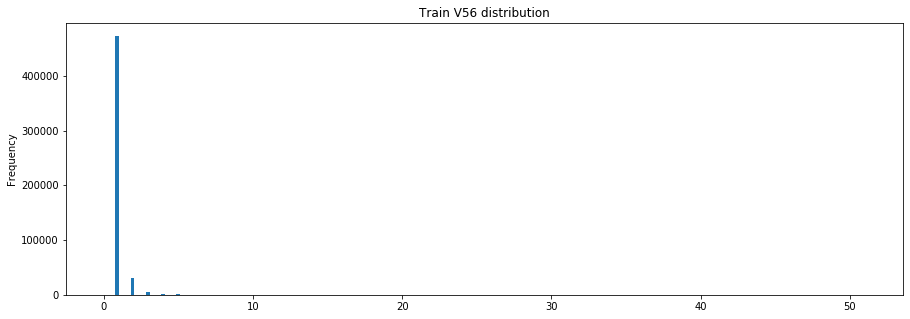

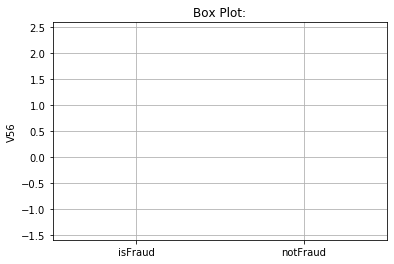

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V56
1     V292              0.737437
2      V55              0.691925
3     V290              0.663716
4     V291              0.657934
5      V78              0.587449
375    V90             -0.097625
376    V29             -0.098005
377    V48             -0.098320
378     D7             -0.133099
379     D2             -0.162038
--------------------------------------------------
Describing  V56  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        1.120979       1.346044          1.113668
std         0.661129       1.198795          0.634752
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        51.000000

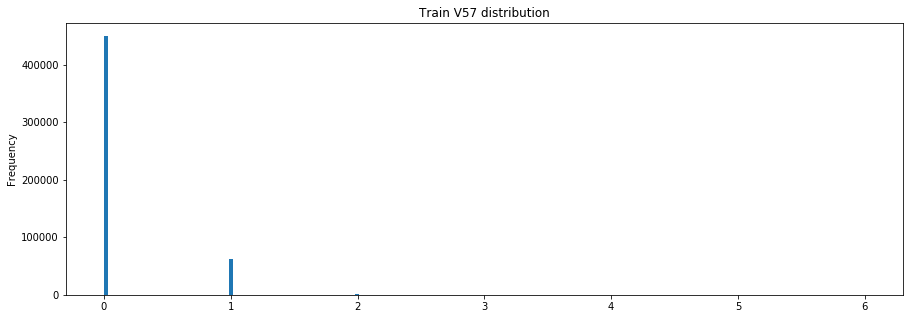

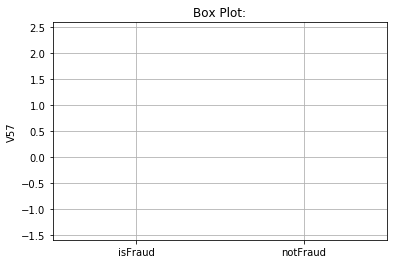

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V57
1      V58              0.962971
2      V15              0.958967
3      V71              0.943166
4      V73              0.940898
5      V50              0.938989
315    V53             -0.414989
316    V54             -0.426233
317    V35             -0.435636
318    V36             -0.445281
319  addr2             -0.876965
--------------------------------------------------
Describing  V57  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.128312       0.455429          0.117686
std         0.349094       0.575313          0.333895
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         6.000000

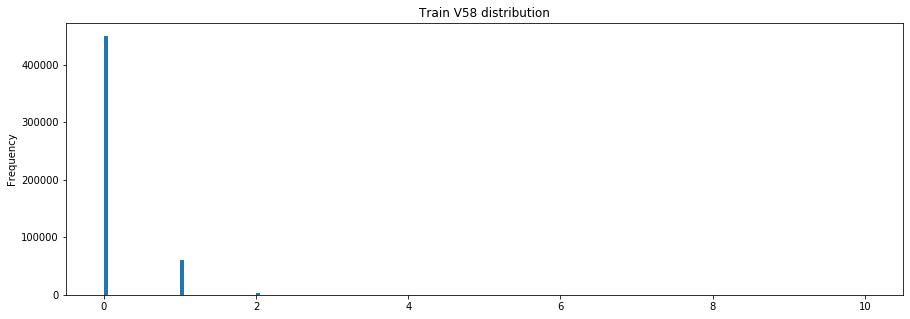

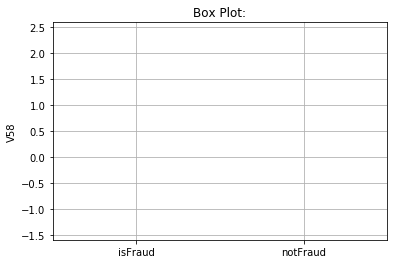

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V58
1      V57              0.962971
2      V79              0.947932
3      V72              0.943713
4      V15              0.926226
5      V71              0.908084
315    V53             -0.401025
316    V54             -0.411891
317    V35             -0.420375
318    V36             -0.429683
319  addr2             -0.876798
--------------------------------------------------
Describing  V58  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.132453       0.490529          0.120821
std         0.372907       0.650019          0.354333
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        10.000000

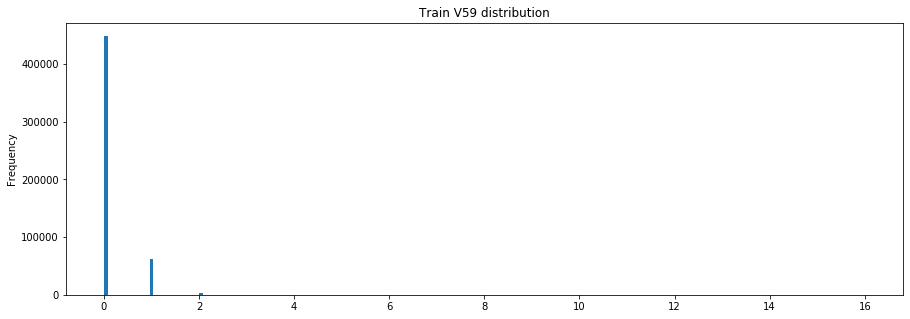

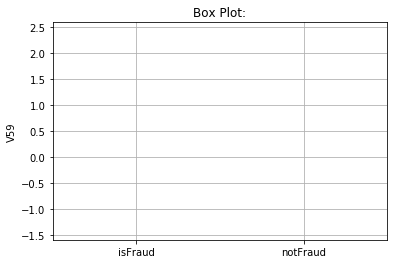

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V59
1      V60              0.953204
2      V63              0.934990
3     V302              0.925841
4      V21              0.905885
5      V80              0.901617
362    V13             -0.393512
363    V53             -0.400171
364    V35             -0.400450
365    V36             -0.409316
366    V54             -0.411014
--------------------------------------------------
Describing  V59  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.134433       0.452334          0.124107
std         0.379291       0.600346          0.365292
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        16.000000

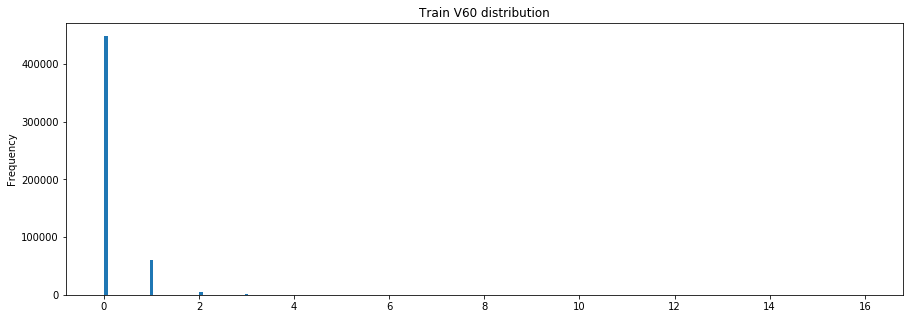

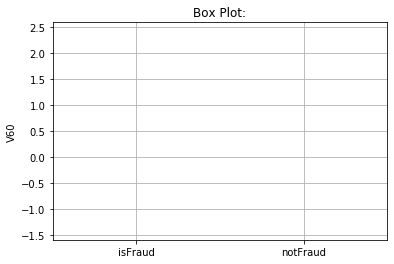

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V60
1      V59              0.953204
2     V302              0.914733
3     V304              0.906584
4      V64              0.901516
5      V63              0.892258
362    V13             -0.377977
363    V35             -0.384247
364    V53             -0.384792
365    V36             -0.392754
366    V54             -0.395218
--------------------------------------------------
Describing  V60  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.142537       0.492819          0.131159
std         0.418230       0.688078          0.401378
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        16.000000

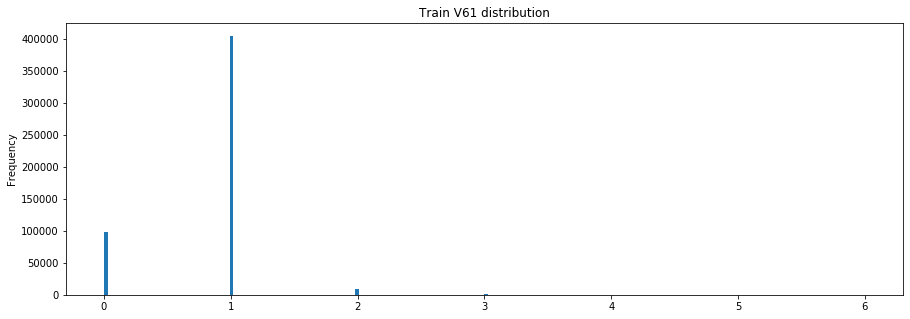

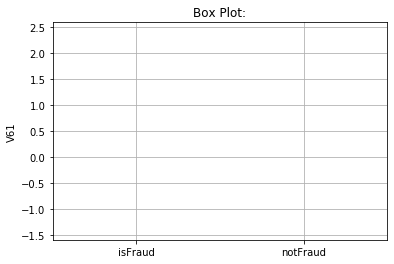

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V61
1      V62              0.890257
2      V82              0.697912
3      V19              0.682139
4      V20              0.632256
5      V83              0.629035
375   V328             -0.485598
376   V329             -0.485859
377   V330             -0.499854
378   V327             -0.546545
379   V326             -0.567709
--------------------------------------------------
Describing  V61  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.829785       0.949486          0.825896
std         0.436617       0.503119          0.433733
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         6.000000

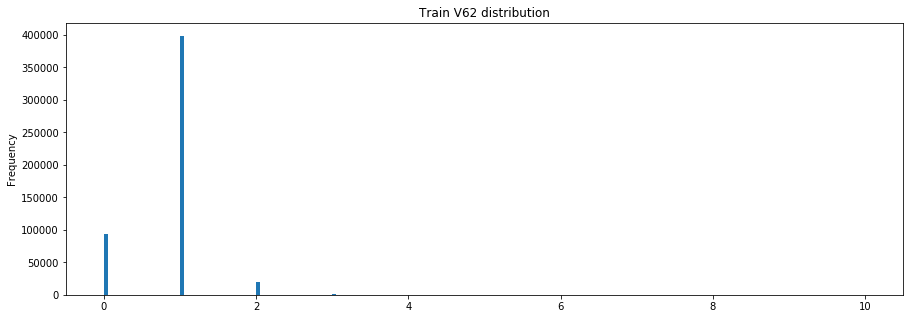

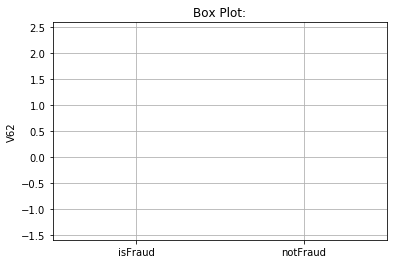

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V62
1      V61              0.890257
2      V83              0.683948
3      V20              0.633815
4      V82              0.629571
5      V19              0.615758
375   V328             -0.480924
376   V329             -0.480941
377   V330             -0.494861
378   V327             -0.539304
379   V326             -0.561287
--------------------------------------------------
Describing  V62  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.867563       1.061904          0.861250
std         0.483803       0.685393          0.474493
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        10.000000

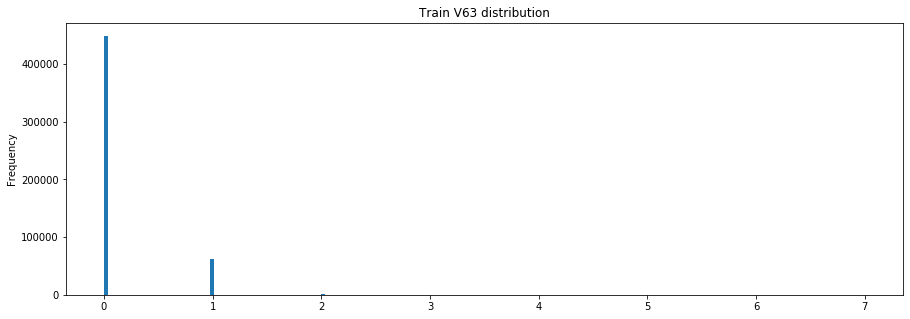

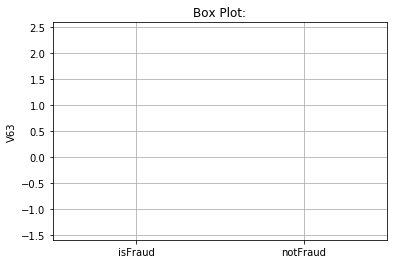

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V63
1      V84              0.955156
2      V42              0.953351
3      V21              0.946929
4      V64              0.944450
5      V59              0.934990
362    V13             -0.408630
363    V53             -0.415508
364    V35             -0.417907
365    V54             -0.426767
366    V36             -0.427160
--------------------------------------------------
Describing  V63  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.130743       0.433020          0.120923
std         0.355262       0.557809          0.342257
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

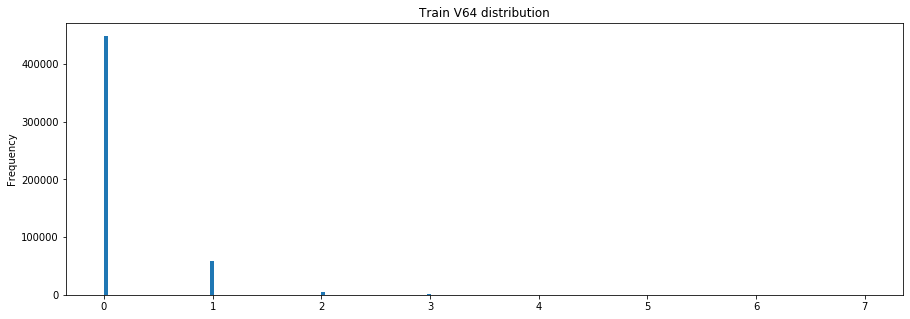

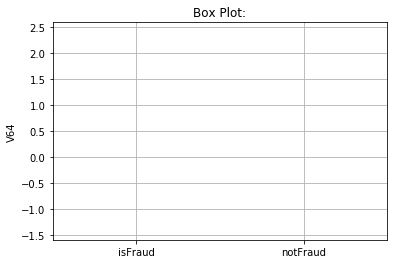

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V64
1      V63              0.944450
2      V43              0.920388
3      V85              0.916422
4      V42              0.912230
5      V84              0.902824
362    V13             -0.387476
363    V53             -0.394248
364    V35             -0.400360
365    V54             -0.404930
366    V36             -0.409225
--------------------------------------------------
Describing  V64  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.141825       0.480686          0.130817
std         0.406157       0.664032          0.390062
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

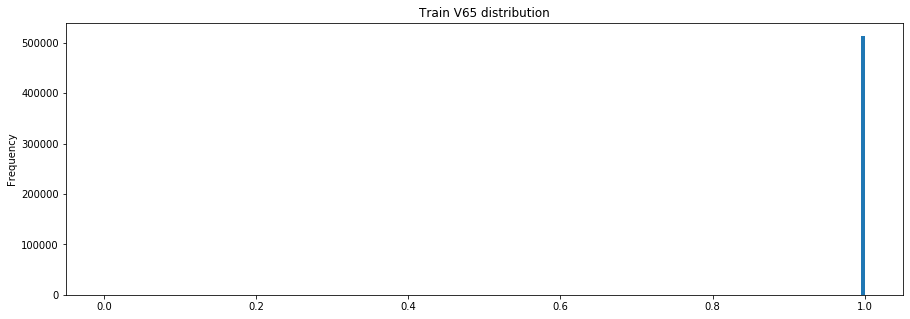

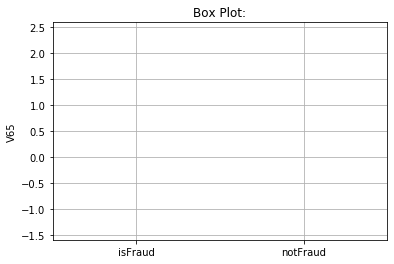

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V65
1      V41              0.891086
2      V14              0.844338
3      V88              0.794566
4     V326              0.102486
5      V46              0.101337
361   V155             -0.068624
362   V148             -0.068719
363   V154             -0.068750
364   V153             -0.069100
365     D7             -0.082132
--------------------------------------------------
Describing  V65  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.999663       0.999938          0.999654
std         0.018353       0.007868          0.018595
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         1.000000

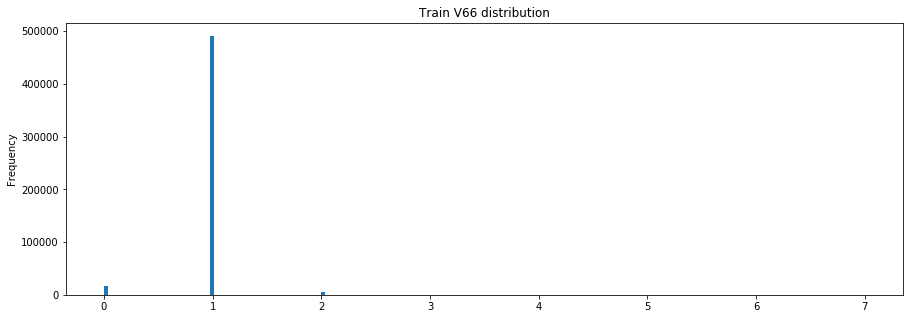

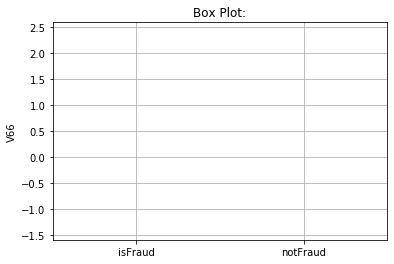

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V66
1      V67              0.828164
2      V25              0.556169
3      V26              0.469765
4      V61              0.362676
5      V62              0.309893
375    V90             -0.050056
376    V49             -0.051580
377    V48             -0.052023
378     D8             -0.065071
379     D7             -0.069064
--------------------------------------------------
Describing  V66  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.981038       1.026185          0.979571
std         0.216235       0.363635          0.209554
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         7.000000

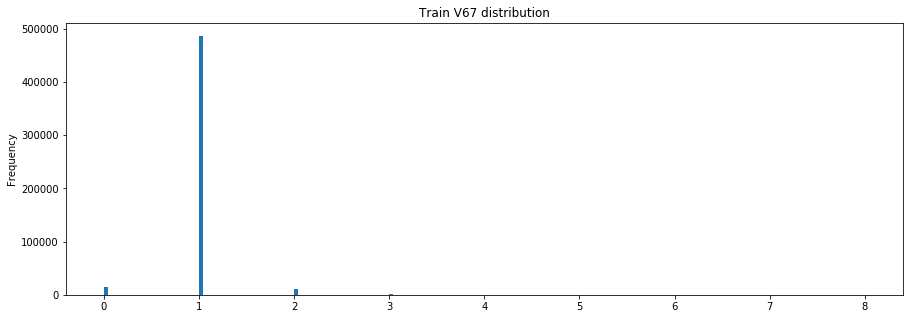

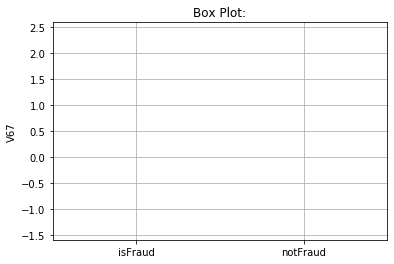

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V67
1      V66              0.828164
2      V26              0.477727
3      V25              0.466775
4      V62              0.348448
5      V61              0.305829
375    V49             -0.075007
376     D8             -0.075841
377    V90             -0.078583
378    V48             -0.078884
379     D7             -0.090591
--------------------------------------------------
Describing  V67  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.998121       1.102080          0.994744
std         0.245912       0.484941          0.233315
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         8.000000

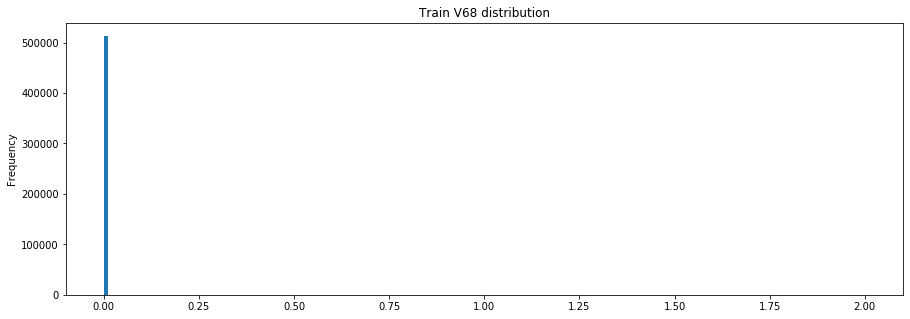

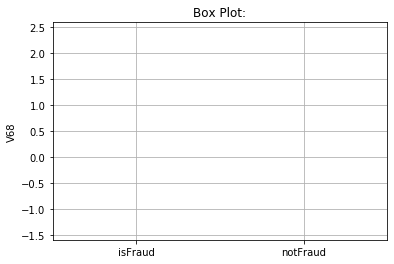

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V68
1      V28              0.914602
2      V89              0.913305
3      V27              0.889336
4       C3              0.554881
5     V267              0.182594
361   V329             -0.096100
362   V328             -0.097364
363   V330             -0.099198
364   V327             -0.116910
365   V326             -0.118305
--------------------------------------------------
Describing  V68  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000        16154.0     497290.000000
mean        0.000534            0.0          0.000551
std         0.023760            0.0          0.024142
min         0.000000            0.0          0.000000
25%         0.000000            0.0          0.000000
50%         0.000000            0.0          0.000000
75%         0.000000            0.0          0.000000
max         2.000000

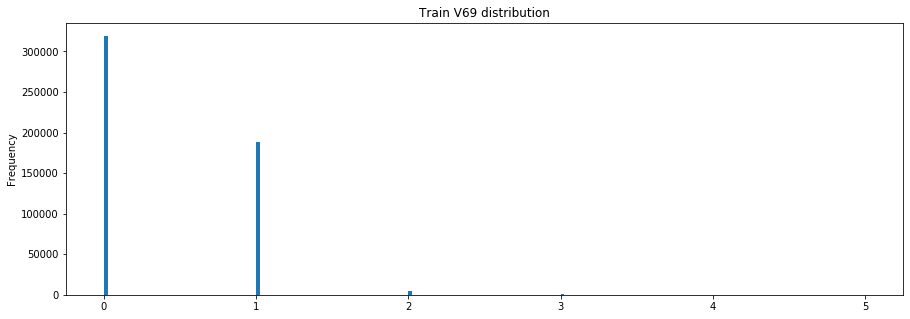

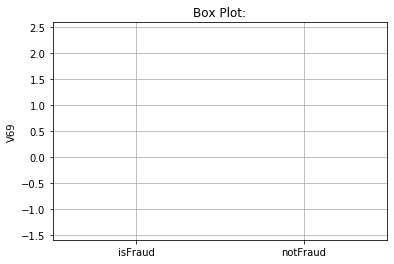

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V69
1      V70              0.962134
2      V90              0.925255
3      V29              0.914609
4      V48              0.912198
5      V91              0.891153
208    V92             -0.296978
209    V94             -0.305878
210    V52             -0.309717
211    V51             -0.313297
212    V50             -0.319225
--------------------------------------------------
Describing  V69  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.390200       0.092299          0.399877
std         0.513696       0.321093          0.515878
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         5.000000

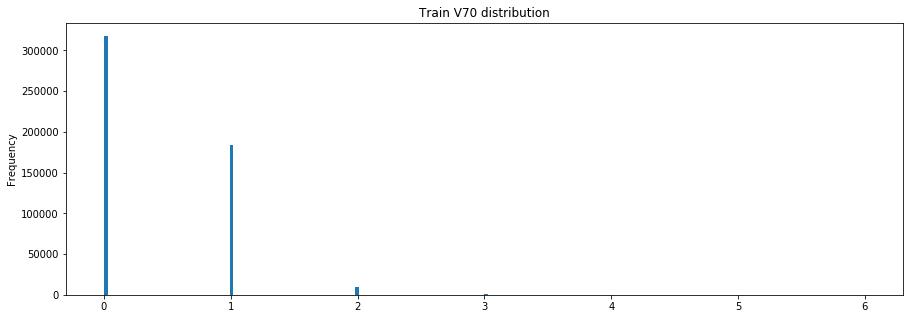

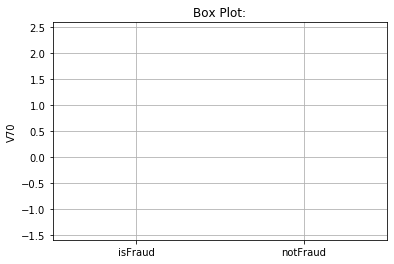

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V70
1      V69              0.962134
2      V91              0.907717
3      V90              0.896647
4      V30              0.894898
5      V49              0.891002
208    V92             -0.287514
209    V94             -0.296098
210    V52             -0.300571
211    V51             -0.304120
212    V50             -0.309876
--------------------------------------------------
Describing  V70  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.407924       0.097499          0.418008
std         0.554499       0.344715          0.557105
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         6.000000

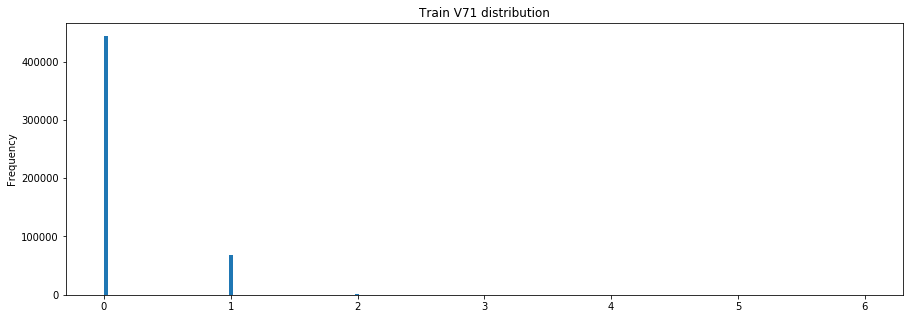

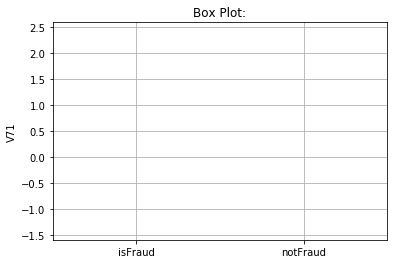

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V71
1      V50              0.964355
2      V72              0.963819
3      V92              0.960691
4      V31              0.958732
5      V57              0.943166
362   V160             -0.472643
363   V150             -0.472907
364  addr2             -0.499160
365   V151             -0.504865
366   V152             -0.541191
--------------------------------------------------
Describing  V71  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.140639       0.457658          0.130340
std         0.364303       0.575374          0.350576
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         6.000000

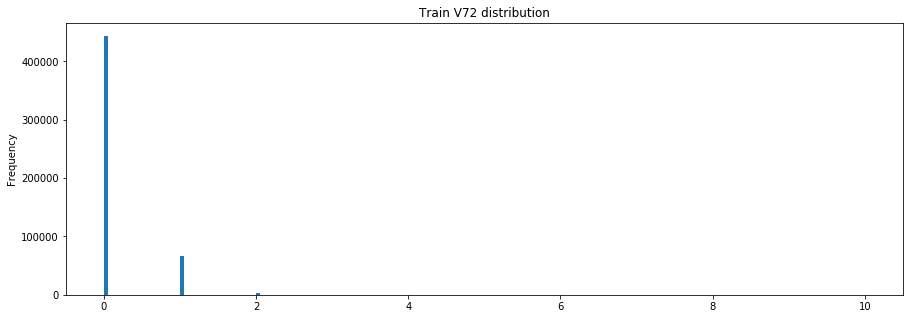

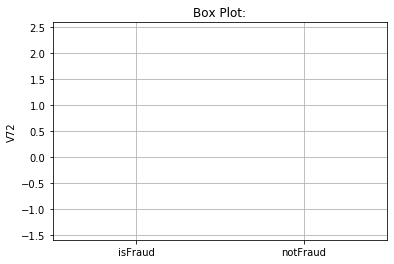

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V72
1      V71              0.963819
2      V93              0.945832
3      V58              0.943713
4      V50              0.931573
5      V92              0.931000
362    V35             -0.428671
363    V54             -0.432390
364    V36             -0.438162
365   V152             -0.453811
366  addr2             -0.485230
--------------------------------------------------
Describing  V72  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.145124       0.492695          0.133833
std         0.389212       0.649762          0.372346
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        10.000000

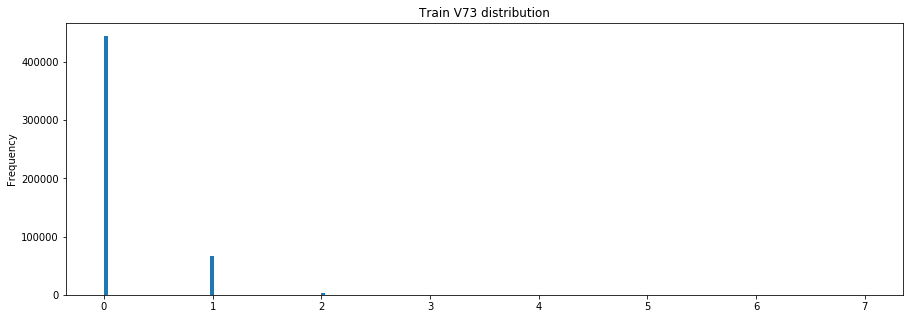

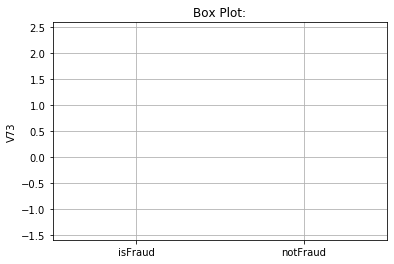

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V73
1      V74              0.955264
2      V94              0.946165
3      V57              0.940898
4      V51              0.935877
5      V33              0.935625
328    V13             -0.378424
329    V54             -0.383893
330    V35             -0.401804
331    V36             -0.410823
332  addr2             -0.569617
--------------------------------------------------
Describing  V73  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.139982       0.494119          0.128478
std         0.367098       0.605386          0.350753
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

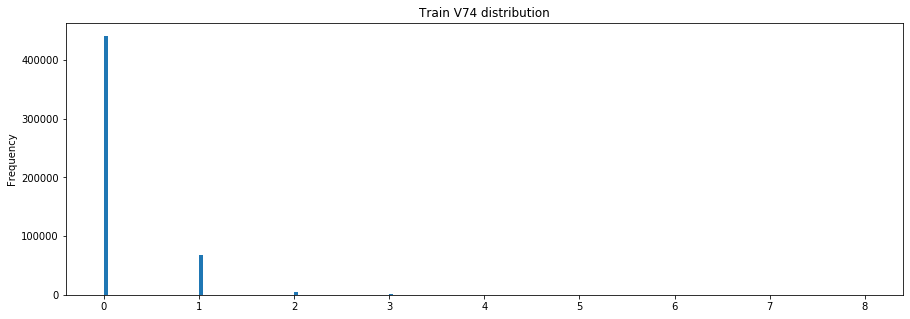

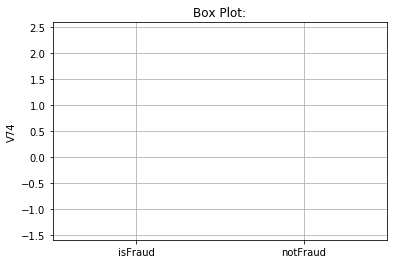

percentage of missing values: 13.055169844549058
--------------------------------------------------
Correlations: 
    Column  Correlation with V74
1      V73              0.955264
2      V94              0.910061
3      V51              0.905765
4      V33              0.900393
5      V57              0.900184
328    V54             -0.352602
329    V53             -0.354115
330    V35             -0.384744
331    V36             -0.387544
332  addr2             -0.484323
--------------------------------------------------
Describing  V74  :
               Train  isFraud Train  isNotFraud Train
count  513444.000000   16154.000000     497290.000000
mean        0.152147       0.557818          0.138969
std         0.393274       0.698917          0.371890
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         8.000000

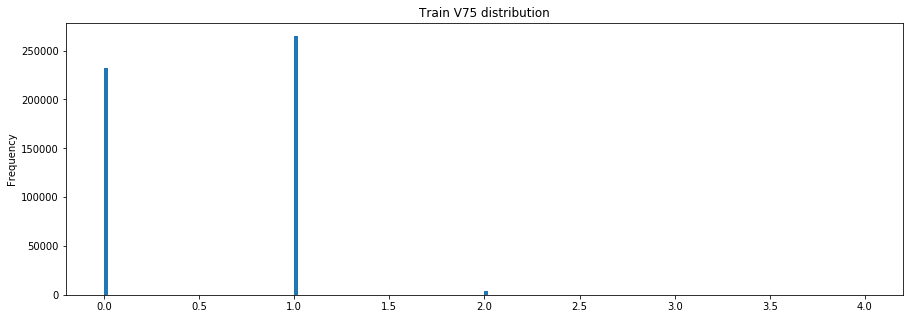

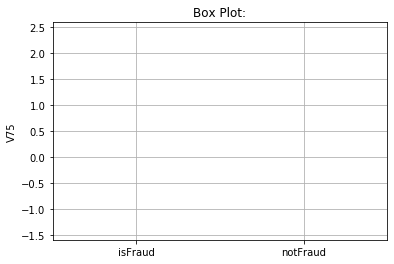

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V75
1      V76              0.918449
2      V35              0.743539
3      V12              0.708756
4      V36              0.703356
5      V13              0.670498
208    V71             -0.411707
209    V42             -0.419077
210    V31             -0.420741
211    V92             -0.423442
212    V50             -0.453902
--------------------------------------------------
Describing  V75  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.544278       0.398304          0.549210
std         0.514318       0.545796          0.512495
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         1.000000       1.000000          1.000000
max         4.000000

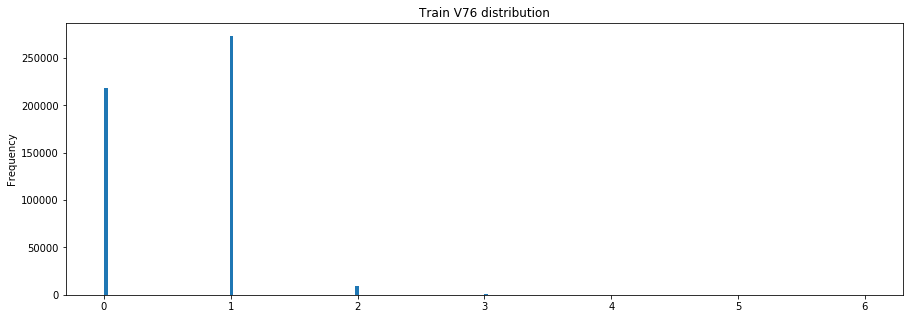

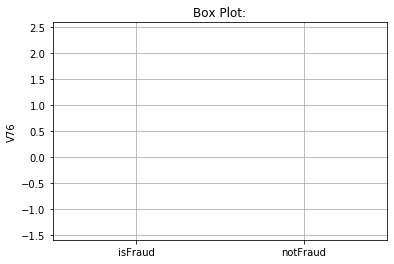

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V76
1      V75              0.918449
2      V36              0.746569
3      V13              0.719616
4      V35              0.704597
5      V12              0.671624
208    V71             -0.424893
209    V42             -0.430981
210    V31             -0.434187
211    V92             -0.436803
212    V50             -0.466796
--------------------------------------------------
Describing  V76  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.587557       0.451638          0.592150
std         0.538230       0.624103          0.534486
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         1.000000       0.000000          1.000000
75%         1.000000       1.000000          1.000000
max         6.000000

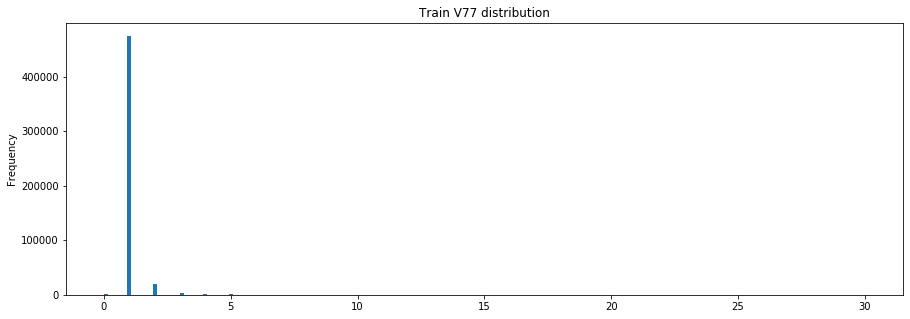

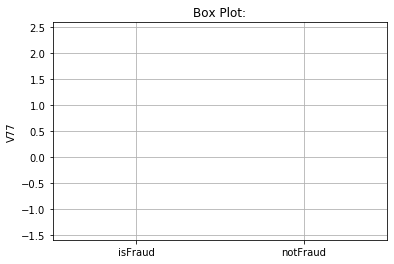

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V77
1      V78              0.752716
2      V37              0.688616
3      V38              0.636275
4     V228              0.615251
5      V86              0.589516
375    V36             -0.114821
376    V12             -0.115449
377    V13             -0.118758
378     D8             -0.129262
379     D7             -0.165201
--------------------------------------------------
Describing  V77  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        1.086893       1.546104          1.071377
std         0.532958       1.677384          0.437279
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        30.000000

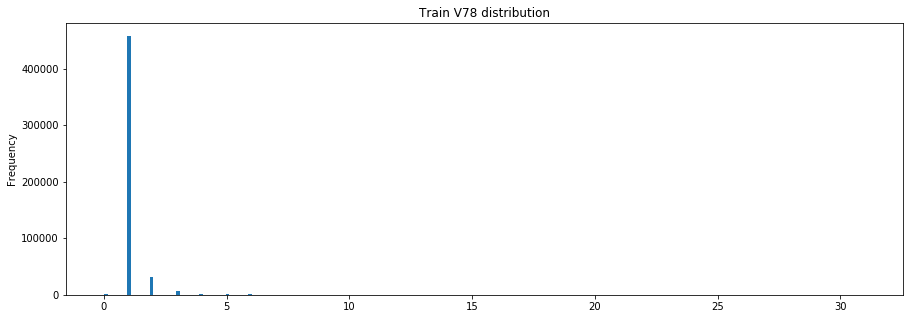

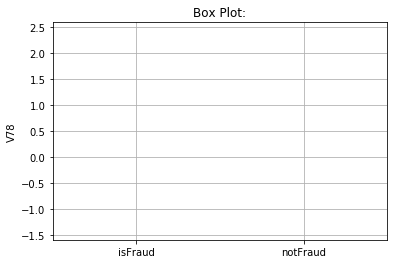

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V78
1      V77              0.752716
2      V38              0.633121
3      V56              0.587449
4      V37              0.537413
5      V87              0.535899
375    V13             -0.105462
376    V53             -0.105782
377     D8             -0.128558
378     D2             -0.128967
379     D7             -0.160419
--------------------------------------------------
Describing  V78  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        1.144462       1.783975          1.122854
std         0.781474       2.366350          0.654110
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max        31.000000

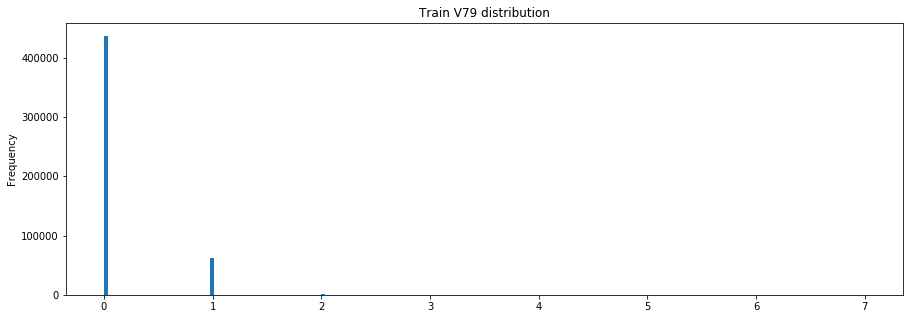

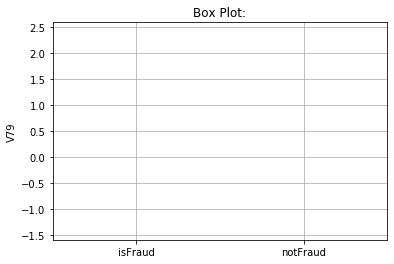

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V79
1      V58              0.947932
2      V15              0.928438
3      V57              0.926381
4      V93              0.924026
5      V16              0.909113
315    V53             -0.415449
316    V35             -0.418987
317    V54             -0.426989
318    V36             -0.428184
319  addr2             -0.890125
--------------------------------------------------
Describing  V79  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.136867       0.538109          0.123310
std         0.379904       0.667046          0.358534
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

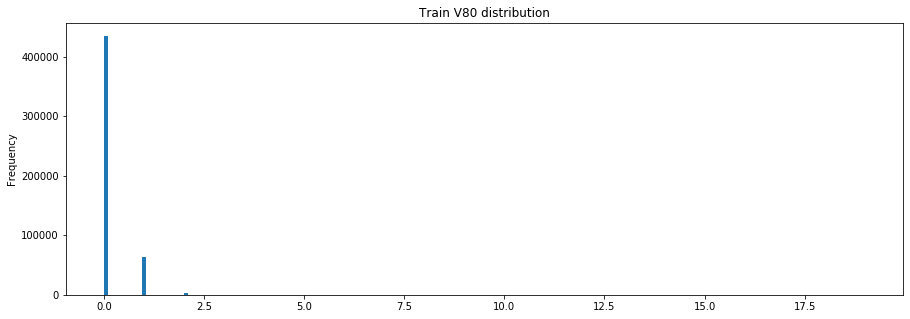

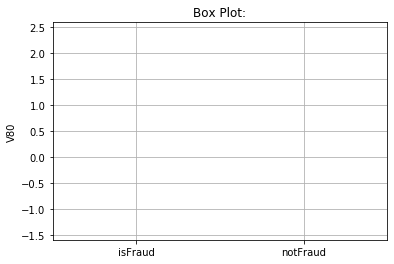

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V80
1      V81              0.953223
2      V17              0.903466
3      V39              0.902400
4      V59              0.901617
5      V84              0.896386
362    V53             -0.388425
363    V13             -0.389988
364    V35             -0.391247
365    V54             -0.399214
366    V36             -0.399835
--------------------------------------------------
Describing  V80  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.143954       0.546043          0.130368
std         0.409932       0.865550          0.377840
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        19.000000

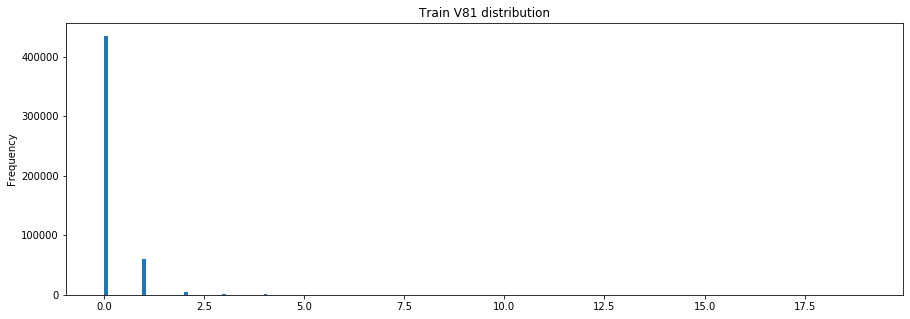

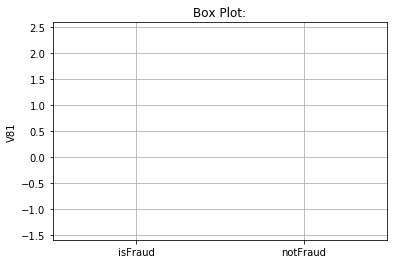

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V81
1      V80              0.953223
2      V60              0.879026
3      V40              0.876484
4      V85              0.875131
5      V17              0.873443
362    V53             -0.373756
363    V13             -0.374584
364    V35             -0.376165
365    V54             -0.384137
366    V36             -0.384422
--------------------------------------------------
Describing  V81  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.152696       0.601452          0.137533
std         0.452298       0.976099          0.415043
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max        19.000000

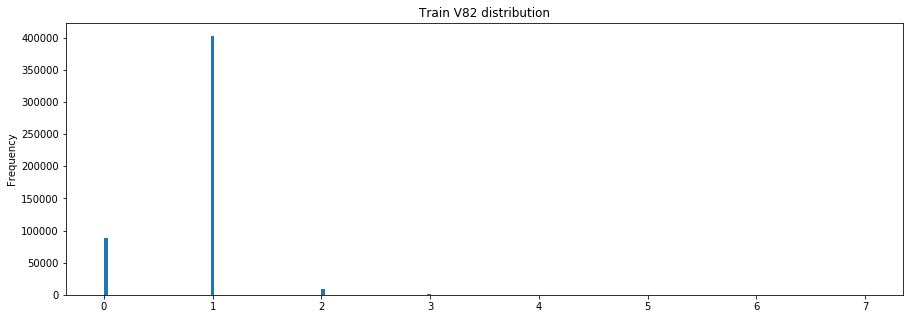

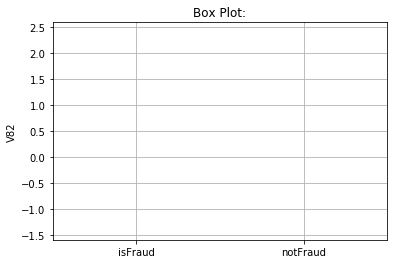

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V82
1      V83              0.881632
2      V19              0.722277
3      V61              0.697912
4       V4              0.683717
5      V20              0.661167
375   V329             -0.177024
376   V224             -0.184503
377     D6             -0.227429
378   V327             -0.381177
379   V326             -0.458109
--------------------------------------------------
Describing  V82  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.844610       0.962104          0.840640
std         0.422529       0.490821          0.419453
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         7.000000

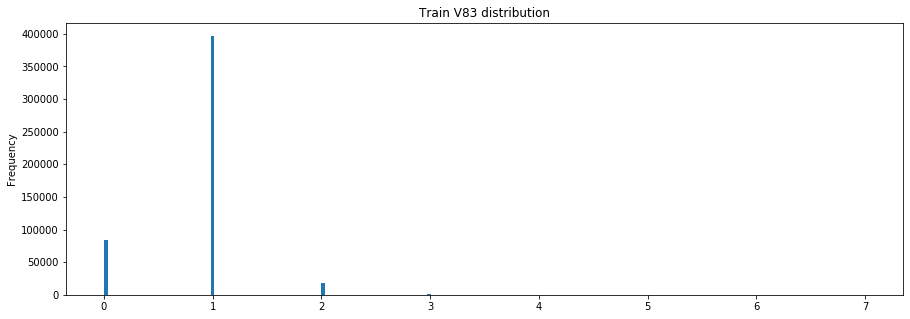

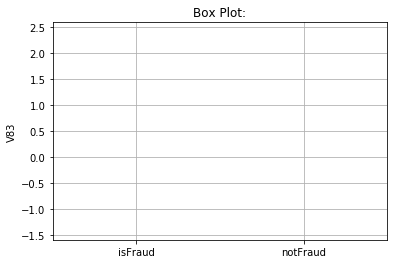

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V83
1      V82              0.881632
2      V62              0.683948
3      V20              0.674453
4       V5              0.658500
5      V19              0.644119
375     D8             -0.151826
376   V329             -0.175486
377     D6             -0.175946
378   V327             -0.375414
379   V326             -0.452546
--------------------------------------------------
Describing  V83  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.881965       1.059071          0.875981
std         0.470757       0.621182          0.463645
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         7.000000

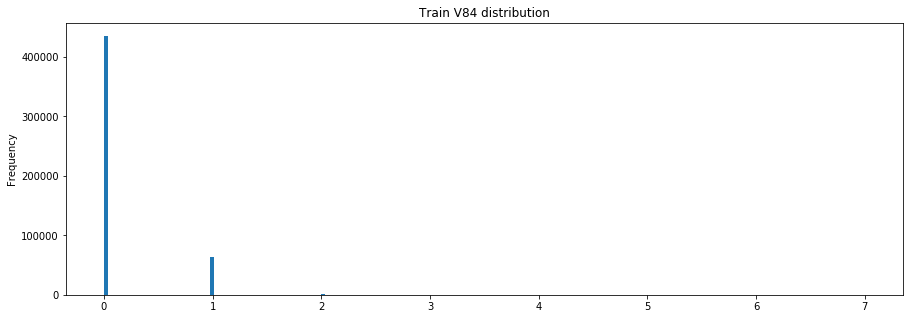

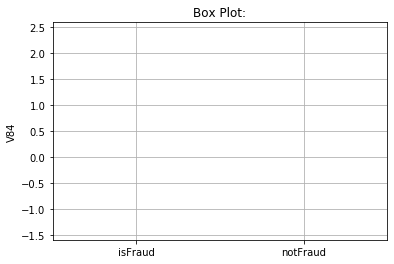

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V84
1      V42              0.957588
2      V63              0.955156
3      V21              0.955048
4      V85              0.937156
5      V22              0.916949
362    V53             -0.420387
363    V13             -0.422154
364    V35             -0.425216
365    V54             -0.432063
366    V36             -0.434549
--------------------------------------------------
Describing  V84  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.137145       0.470068          0.125896
std         0.361875       0.554162          0.348039
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

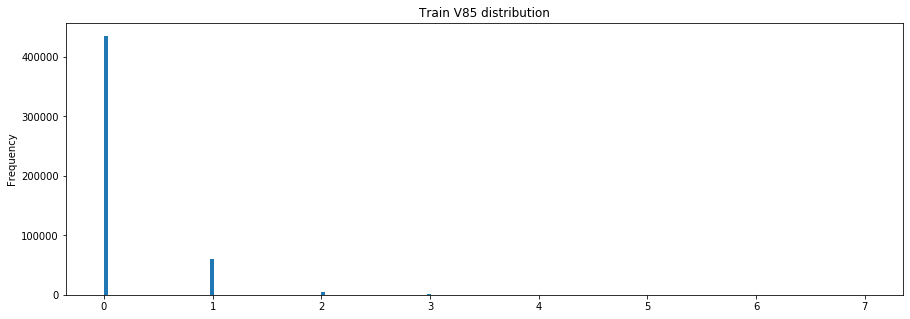

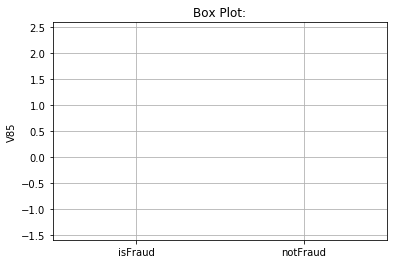

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V85
1      V84              0.937156
2      V64              0.916422
3      V43              0.915452
4      V42              0.903436
5      V63              0.900024
362    V53             -0.396197
363    V13             -0.397457
364    V35             -0.401391
365    V54             -0.407201
366    V36             -0.410201
--------------------------------------------------
Describing  V85  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.149788       0.535058          0.136770
std         0.419445       0.707608          0.399721
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

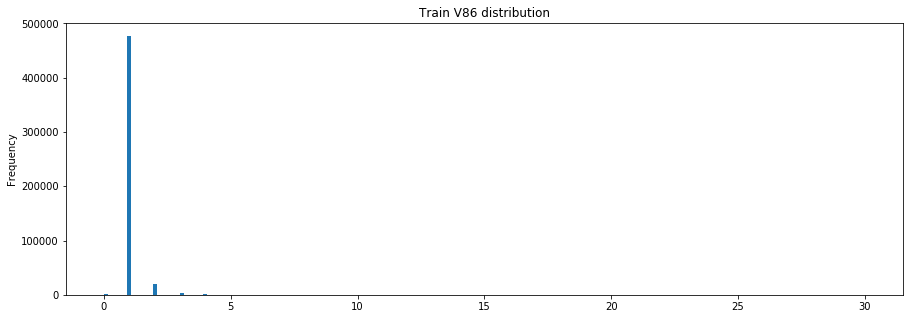

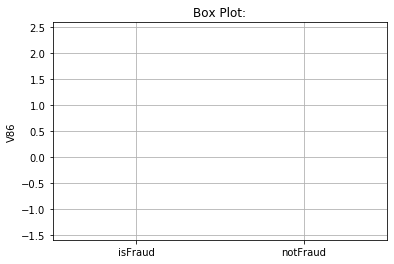

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V86
1      V87              0.849442
2     V257              0.661346
3     V246              0.635958
4      V44              0.627641
5      V45              0.607564
375    V53             -0.078161
376    V54             -0.080616
377     D8             -0.109106
378   V326             -0.113469
379     D7             -0.127870
--------------------------------------------------
Describing  V86  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        1.064885       1.640020          1.045453
std         0.419807       1.737494          0.261994
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max        30.000000

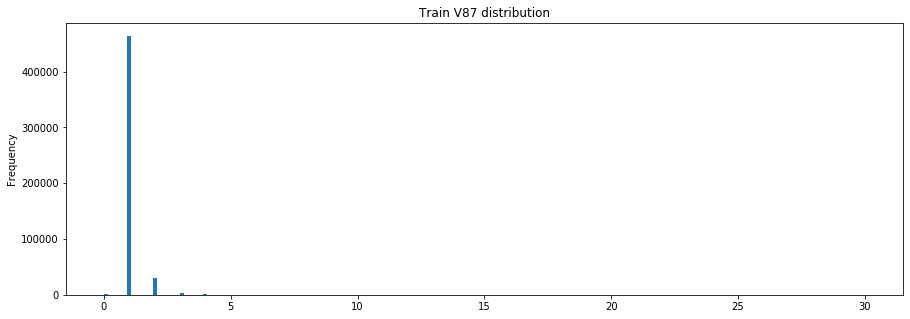

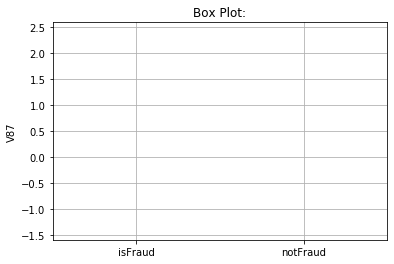

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V87
1      V86              0.849442
2      V45              0.634342
3     V257              0.601958
4     V246              0.586705
5     V199              0.538906
375    V29             -0.073366
376    V69             -0.073509
377   V326             -0.090243
378     D8             -0.109901
379     D7             -0.128779
--------------------------------------------------
Describing  V87  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        1.099456       1.799658          1.075798
std         0.511281       2.020390          0.339411
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max        30.000000

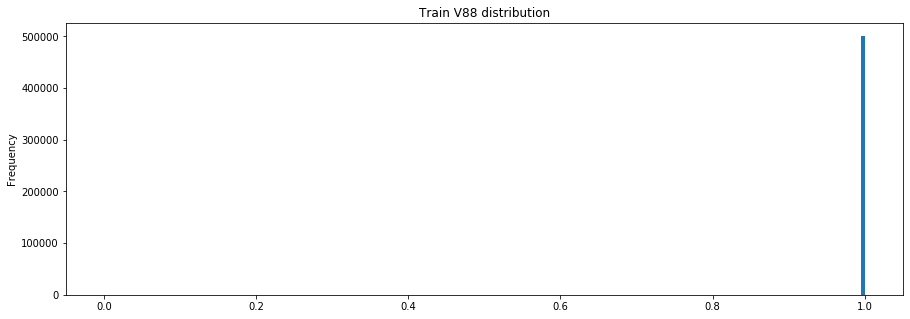

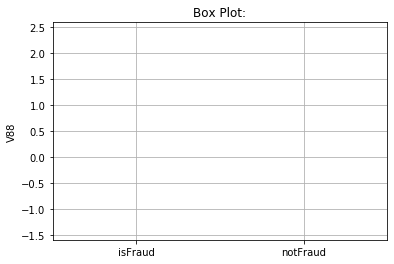

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V88
1      V41              0.942586
2      V14              0.834647
3      V65              0.794566
4       V1              0.547708
5      V46              0.143880
375   V153             -0.051329
376   V302             -0.053432
377     D8             -0.055283
378     D6             -0.055864
379     D7             -0.093929
--------------------------------------------------
Describing  V88  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.999246       0.999329          0.999243
std         0.027447       0.025901          0.027498
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max         1.000000

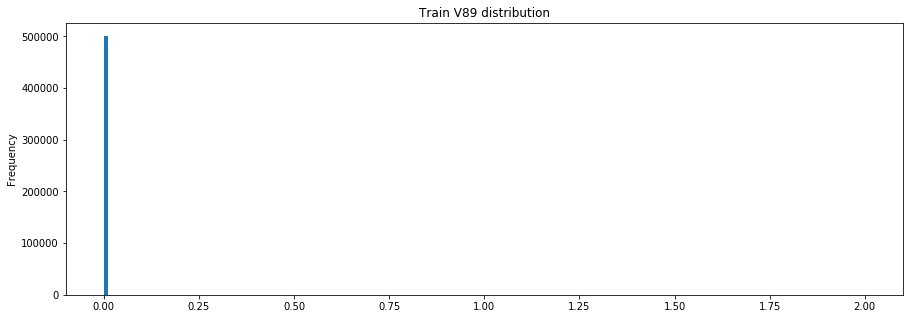

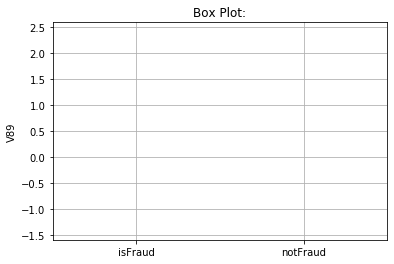

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V89
1      V28              0.968086
2      V27              0.935332
3      V68              0.913305
4       C3              0.592326
5     V264              0.211481
360    V19             -0.048405
361    V83             -0.051946
362    V82             -0.055381
363   V327             -0.062781
364   V326             -0.066102
--------------------------------------------------
Describing  V89  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000        16387.0     484989.000000
mean        0.000902            0.0          0.000932
std         0.031943            0.0          0.032478
min         0.000000            0.0          0.000000
25%         0.000000            0.0          0.000000
50%         0.000000            0.0          0.000000
75%         0.000000            0.0          0.000000
max         2.000000

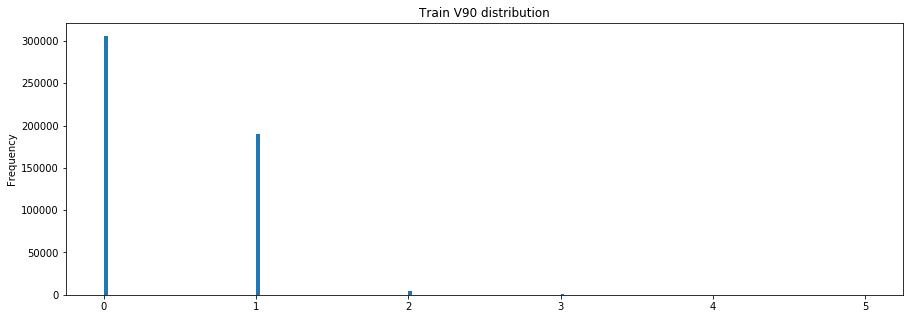

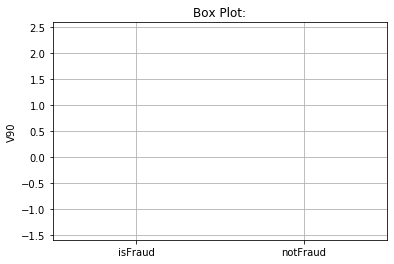

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V90
1      V91              0.959692
2      V48              0.944901
3      V29              0.932192
4      V69              0.925255
5      V49              0.917756
208    V34             -0.310988
209    V92             -0.311532
210    V52             -0.313828
211    V51             -0.318642
212    V50             -0.330138
--------------------------------------------------
Describing  V90  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.401862       0.092512          0.412315
std         0.516153       0.322831          0.518220
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         5.000000

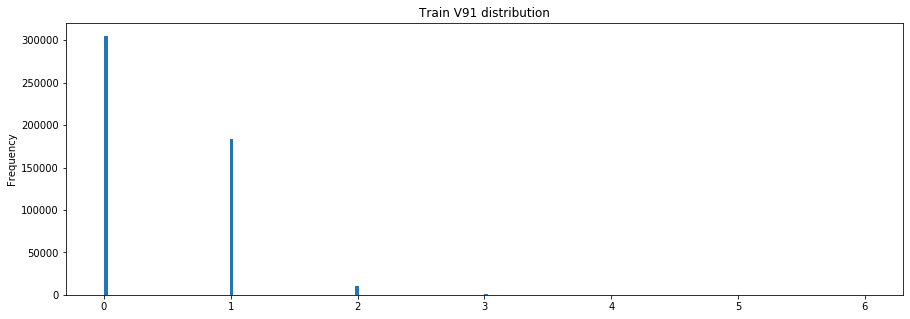

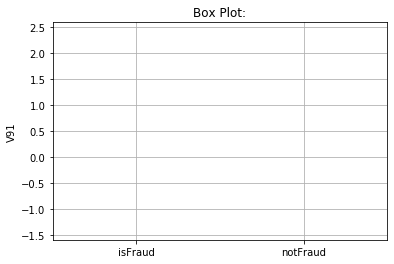

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V91
1      V90              0.959692
2      V49              0.925746
3      V30              0.916219
4      V48              0.909608
5      V70              0.907717
208    V34             -0.298756
209    V92             -0.299432
210    V52             -0.302212
211    V51             -0.306848
212    V50             -0.317945
--------------------------------------------------
Describing  V91  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.420461       0.098127          0.431352
std         0.561865       0.349208          0.564455
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max         6.000000

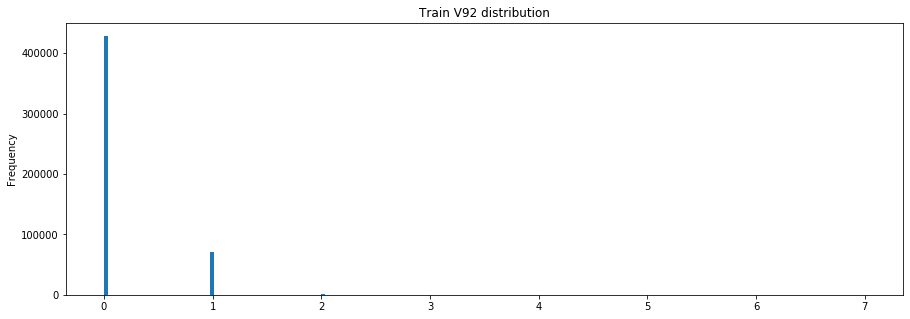

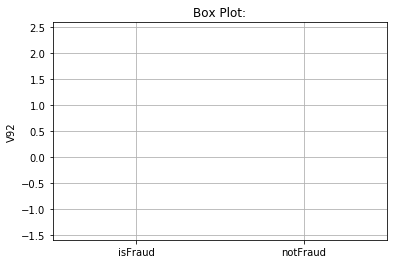

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V92
1      V50              0.970760
2      V31              0.965936
3      V93              0.963108
4      V71              0.960691
5      V32              0.945899
362   V145             -0.459852
363    V36             -0.462045
364   V150             -0.464599
365   V151             -0.492945
366   V152             -0.527288
--------------------------------------------------
Describing  V92  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.150322       0.519253          0.137857
std         0.375682       0.609271          0.358622
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

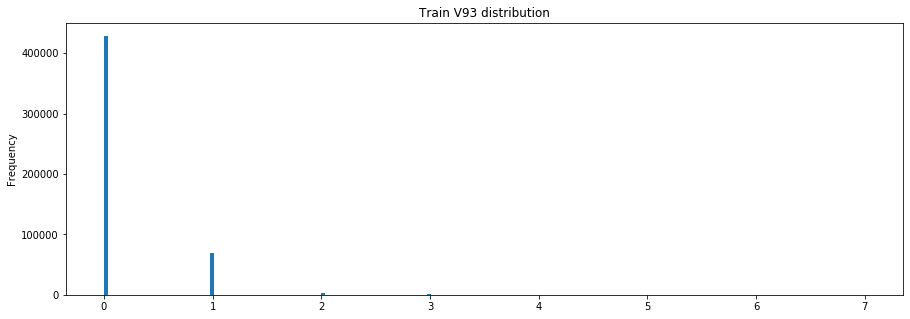

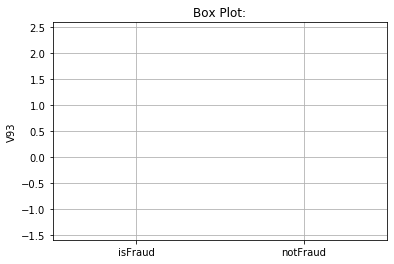

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V93
1      V92              0.963108
2      V72              0.945832
3      V50              0.933852
4      V31              0.928171
5      V71              0.924839
362    V35             -0.434321
363    V54             -0.440320
364    V36             -0.443854
365   V151             -0.445465
366   V152             -0.476533
--------------------------------------------------
Describing  V93  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.154812       0.550925          0.141428
std         0.402314       0.671300          0.382908
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         7.000000

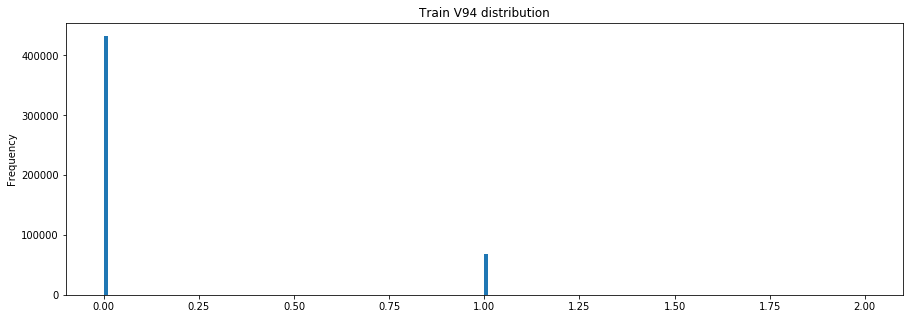

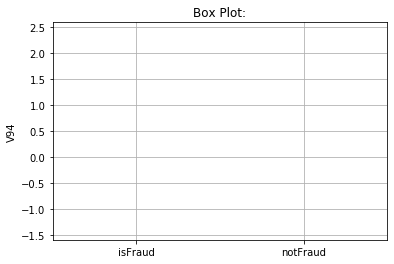

percentage of missing values: 15.098723202492634
--------------------------------------------------
Correlations: 
    Column  Correlation with V94
1      V33              0.975796
2      V15              0.953582
3      V51              0.950989
4      V73              0.946165
5      V57              0.936173
328    V53             -0.412627
329    V35             -0.417277
330    V54             -0.423711
331    V36             -0.427154
332  addr2             -0.607043
--------------------------------------------------
Describing  V94  :
               Train  isFraud Train  isNotFraud Train
count  501376.000000   16387.000000     484989.000000
mean        0.137007       0.489473          0.125098
std         0.343878       0.499904          0.330855
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max         2.000000

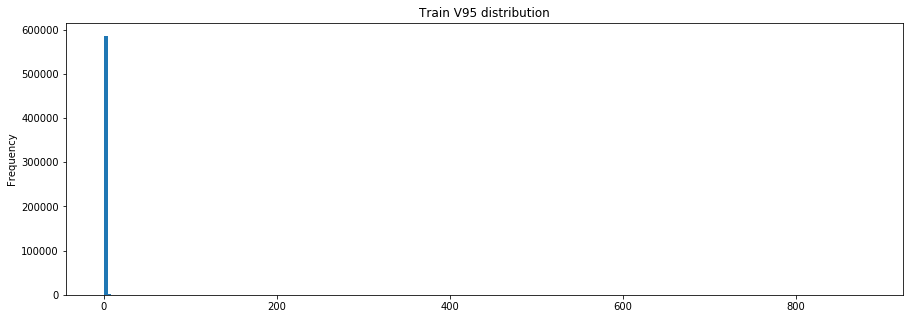

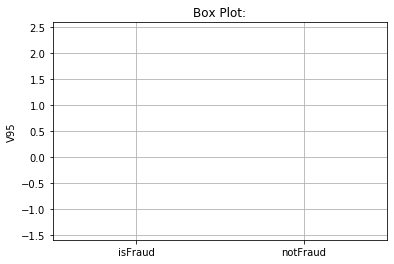

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V95
1     V322              0.999949
2     V101              0.999594
3     V279              0.998710
4     V293              0.998475
5     V132              0.995258
375   V155             -0.132920
376   V148             -0.137331
377   V154             -0.144542
378   V153             -0.147642
379     D5             -0.156085
--------------------------------------------------
Describing  V95  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.038019       0.582873          1.054517
std        21.034304       1.239608         21.410652
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max       880.0000

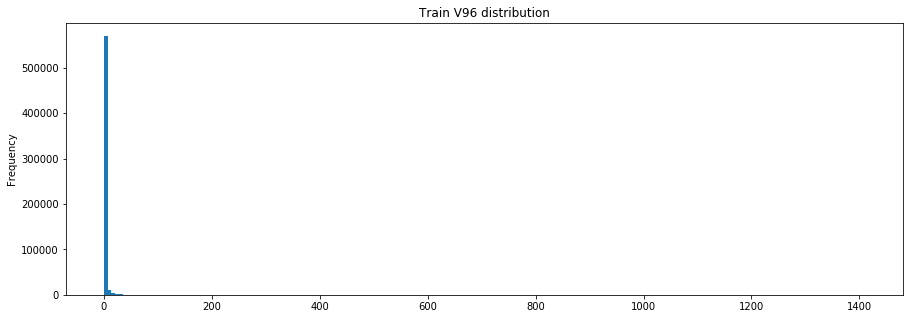

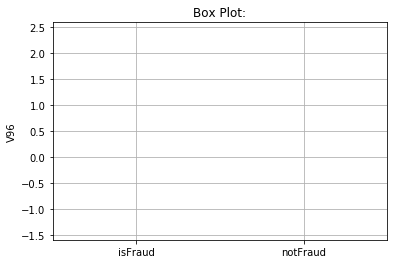

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V96
1     V323              0.999948
2     V102              0.997104
3     V332              0.994881
4     V324              0.992663
5     V133              0.992326
375   V155             -0.149556
376     D5             -0.151953
377   V148             -0.154520
378   V154             -0.162619
379   V153             -0.166086
--------------------------------------------------
Describing  V96  :
              Train  isFraud Train  isNotFraud Train
count  590226.00000   20646.000000     569580.000000
mean        3.00519       1.846023          3.047207
std        40.23949       4.449918         40.952917
min         0.00000       0.000000          0.000000
25%         0.00000       0.000000          0.000000
50%         0.00000       0.000000          0.000000
75%         1.00000       2.000000          1.000000
max      1410.00000      5

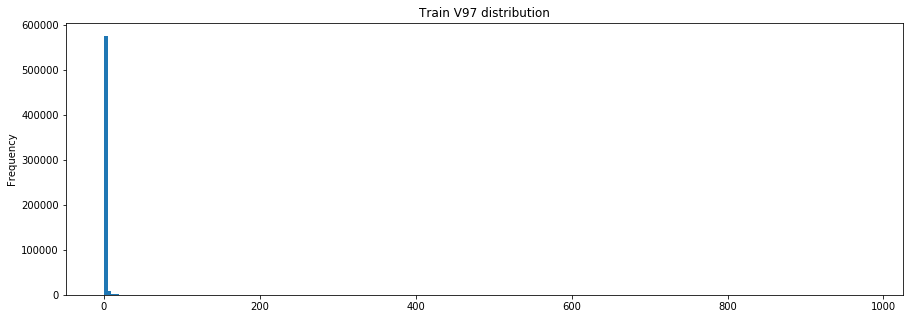

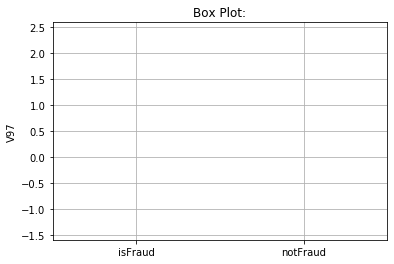

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V97
1     V324              0.999947
2     V103              0.998789
3     V134              0.994022
4     V323              0.992745
5     V333              0.991176
375   V155             -0.150972
376   V148             -0.155978
377   V154             -0.164164
378     D5             -0.165556
379   V153             -0.167671
--------------------------------------------------
Describing  V97  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.718933       1.065582          1.742616
std        27.700449       2.245991         28.194494
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max       976.0000

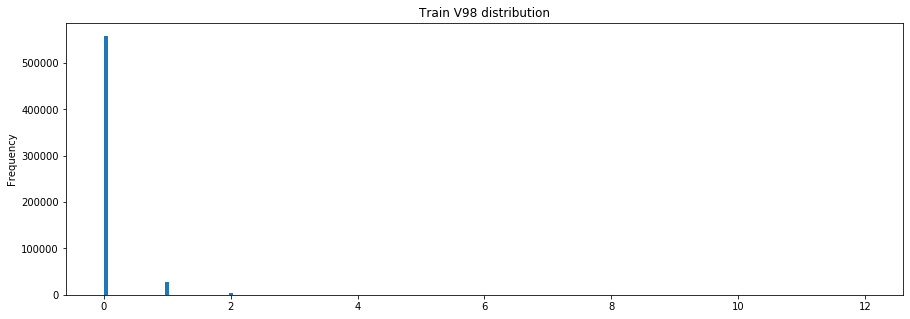

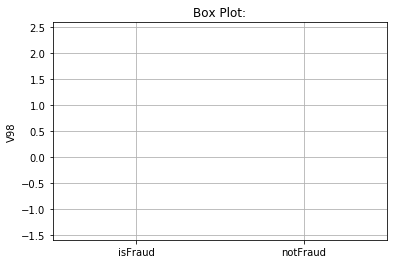

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V98
1     V325              0.945764
2     V284              0.792611
3     V327              0.556653
4     V100              0.542436
5     V287              0.477932
375   V154             -0.093501
376   V153             -0.094997
377     D2             -0.103244
378     D5             -0.117056
379     D3             -0.123587
--------------------------------------------------
Describing  V98  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        0.061985       0.102877          0.060502
std         0.284995       0.371254          0.281261
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max        12.0000

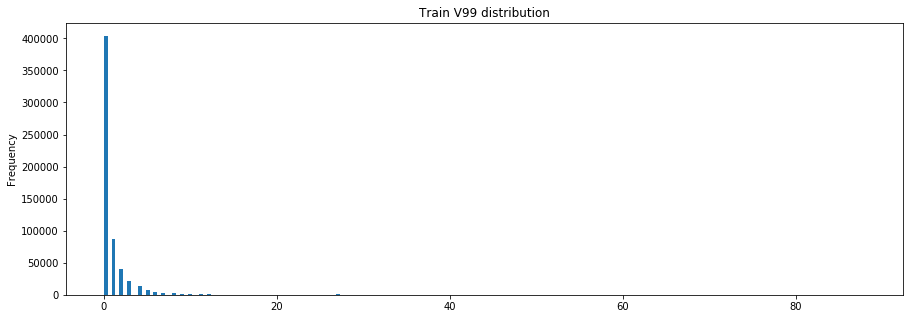

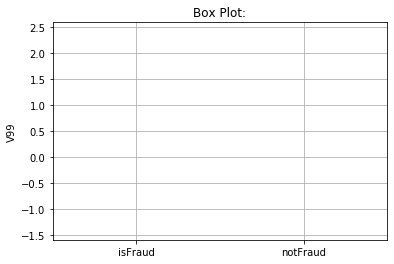

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V99
1     V326              0.988773
2     V327              0.930862
3     V285              0.858606
4     V100              0.837810
5     V329              0.814136
375   V149             -0.217062
376   V155             -0.224319
377   V148             -0.231764
378   V154             -0.243153
379   V153             -0.248670
--------------------------------------------------
Describing  V99  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        0.894986       0.706529          0.901817
std         2.722552       1.957960          2.746030
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       0.000000          1.000000
max        88.0000

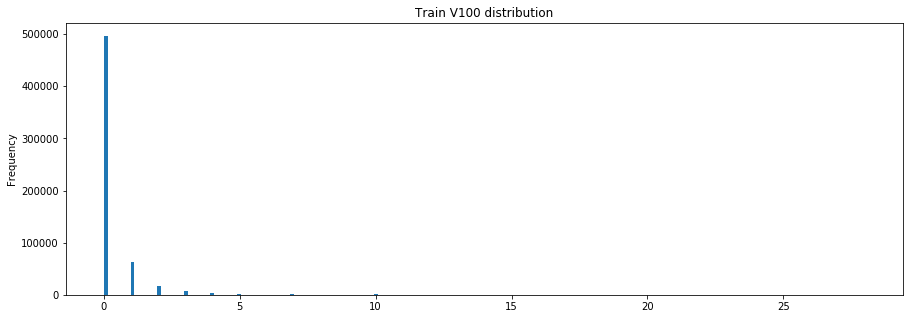

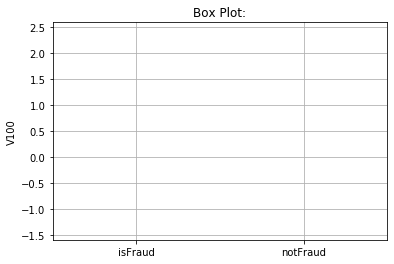

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V100
1     V327               0.987016
2     V326               0.932769
3     V287               0.863856
4     V329               0.841642
5      V99               0.837810
375   V149              -0.197184
376   V155              -0.203572
377   V148              -0.210444
378   V154              -0.220518
379   V153              -0.225556
--------------------------------------------------
Describing  V100  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        0.273504       0.329652          0.271468
std         0.947176       0.925890          0.947877
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

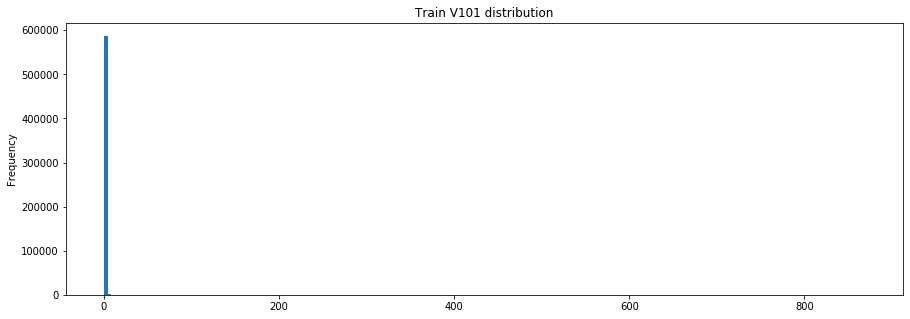

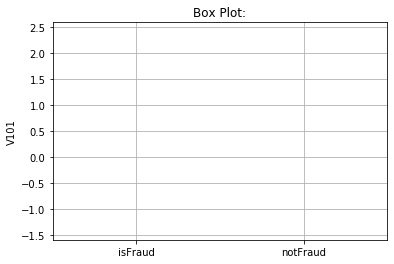

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V101
1     V322               0.999698
2      V95               0.999594
3     V293               0.998919
4     V279               0.998454
5     V132               0.995637
375   V149              -0.127092
376   V155              -0.131160
377   V148              -0.135517
378   V154              -0.142678
379   V153              -0.145688
--------------------------------------------------
Describing  V101  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        0.889249       0.379831          0.907714
std        20.582571       1.014770         20.951164
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

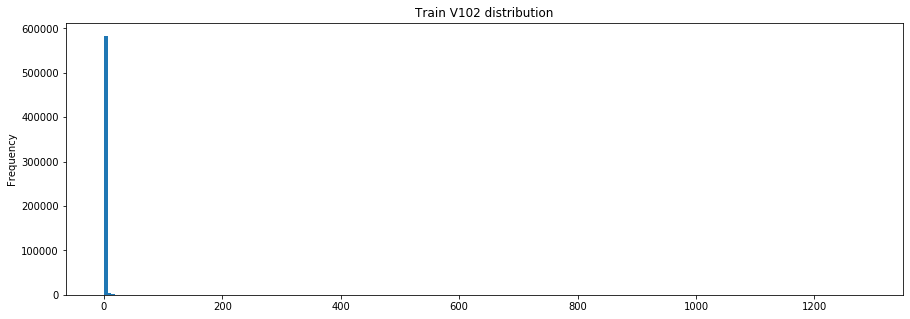

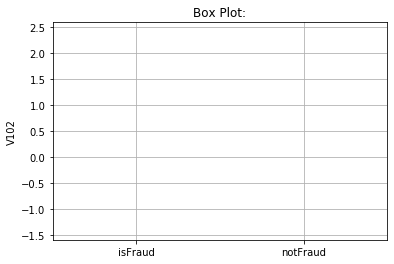

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V102
1     V323               0.998828
2      V96               0.997104
3     V133               0.995615
4     V332               0.994837
5     V103               0.991516
375   V149              -0.138491
376   V155              -0.142918
377   V148              -0.147663
378   V154              -0.155457
379   V153              -0.158731
--------------------------------------------------
Describing  V102  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.827229       0.912429          1.860388
std        35.928456       2.760635         36.569617
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max   

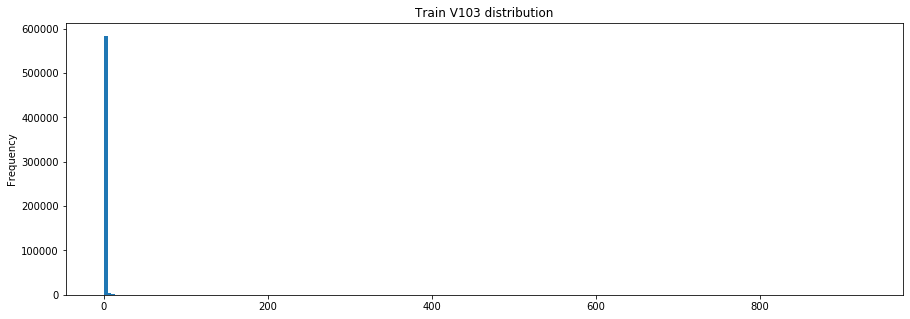

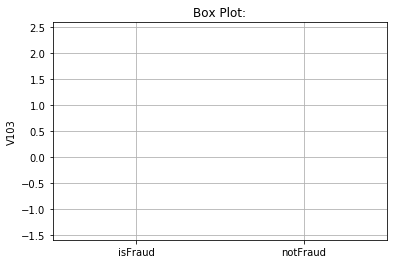

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V103
1     V324               0.999258
2      V97               0.998789
3     V134               0.995735
4     V323               0.993858
5     V102               0.991516
375   V149              -0.142812
376   V155              -0.147386
377   V148              -0.152274
378   V154              -0.160319
379   V153              -0.163698
--------------------------------------------------
Describing  V103  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000      569580.00000
mean        1.279288       0.588443           1.30433
std        25.685642       1.570681          26.14497
min         0.000000       0.000000           0.00000
25%         0.000000       0.000000           0.00000
50%         0.000000       0.000000           0.00000
75%         0.000000       0.000000           0.00000
max   

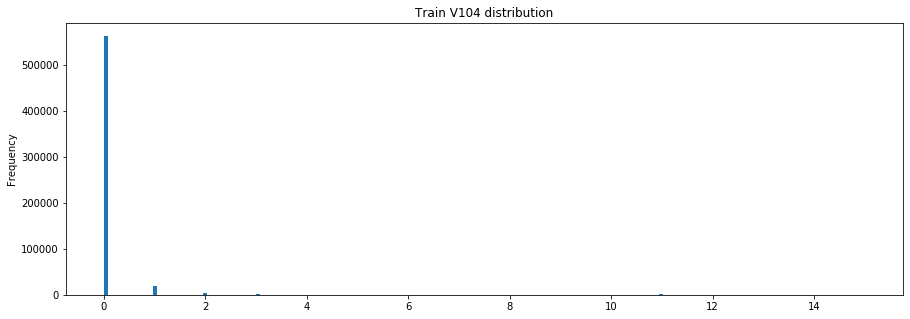

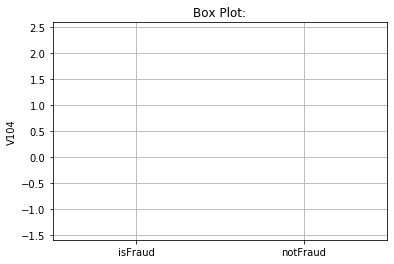

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V104
1     V328               0.987711
2     V330               0.936245
3     V297               0.917608
4     V106               0.902356
5     V181               0.889643
375   V149              -0.140938
376   V155              -0.147409
377   V148              -0.152096
378   V154              -0.158543
379   V153              -0.163848
--------------------------------------------------
Describing  V104  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        0.085433       0.097307          0.085003
std         0.648718       0.482461          0.653947
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

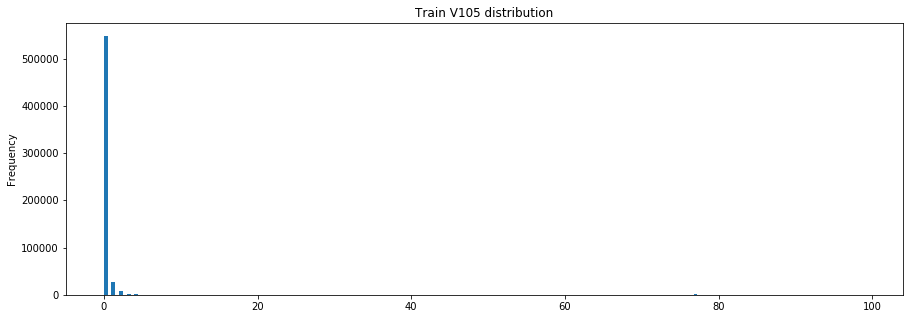

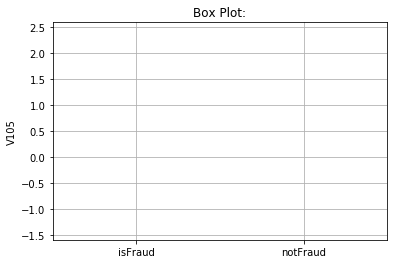

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V105
1     V329               0.999101
2     V298               0.978285
3     V330               0.968189
4     V324               0.961711
5     V106               0.960937
375   V149              -0.158849
376   V155              -0.164272
377   V148              -0.169700
378   V154              -0.178327
379   V153              -0.182425
--------------------------------------------------
Describing  V105  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        0.281145       0.223917          0.283219
std         3.373948       1.229567          3.426548
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

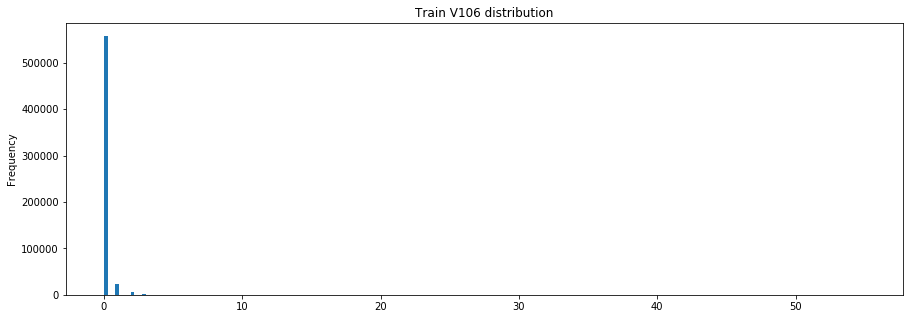

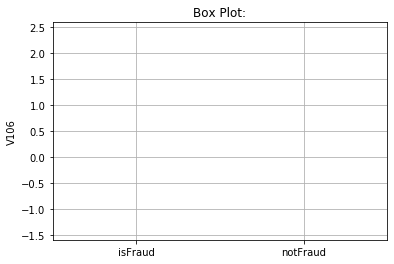

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V106
1     V330               0.998002
2     V299               0.977030
3     V329               0.969386
4     V105               0.960937
5     V298               0.936216
375   V149              -0.158067
376   V155              -0.163765
377   V148              -0.169152
378   V154              -0.177497
379   V153              -0.181879
--------------------------------------------------
Describing  V106  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        0.164584       0.144532          0.165311
std         1.825665       0.781436          1.852491
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

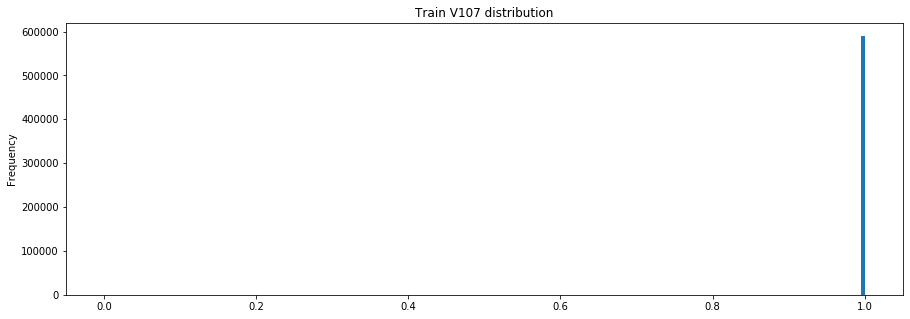

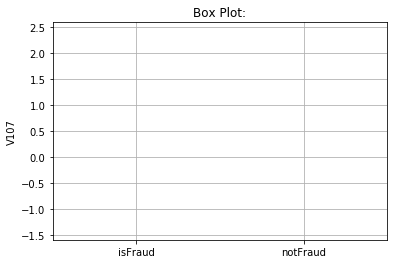

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
            Column  Correlation with V107
1             V117               0.582052
2             V120               0.492287
3             V119               0.393413
4             V122               0.294805
5             V111               0.290202
208            D15              -0.008613
209             D1              -0.009464
210            D11              -0.010835
211  TransactionID              -0.022165
212  TransactionDT              -0.022335
--------------------------------------------------
Describing  V107  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        0.999580       0.999855          0.999570
std         0.020494       0.012054          0.020735
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000      

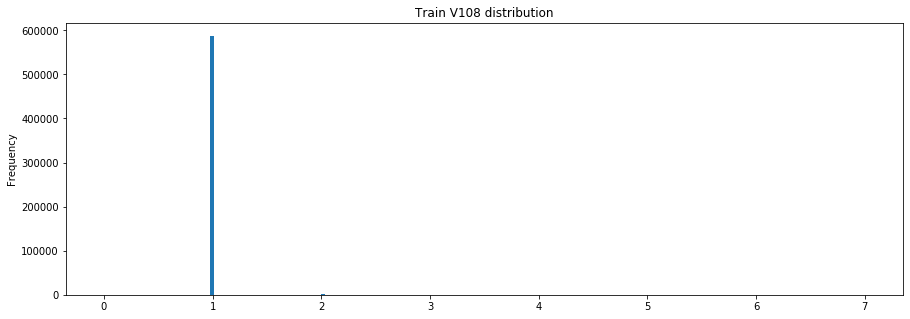

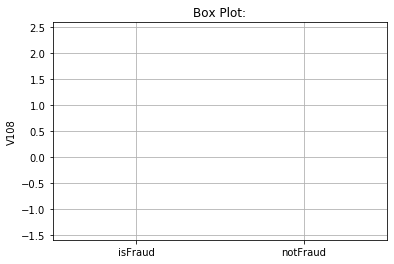

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V108
1     V110               0.817646
2     V114               0.748478
3     V111               0.687430
4     V113               0.630059
5     V109               0.604248
375  addr2              -0.027932
376    V90              -0.028012
377     D5              -0.036731
378     D8              -0.038075
379     D7              -0.053914
--------------------------------------------------
Describing  V108  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.004613       1.045868          1.003118
std         0.081146       0.270586          0.064075
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

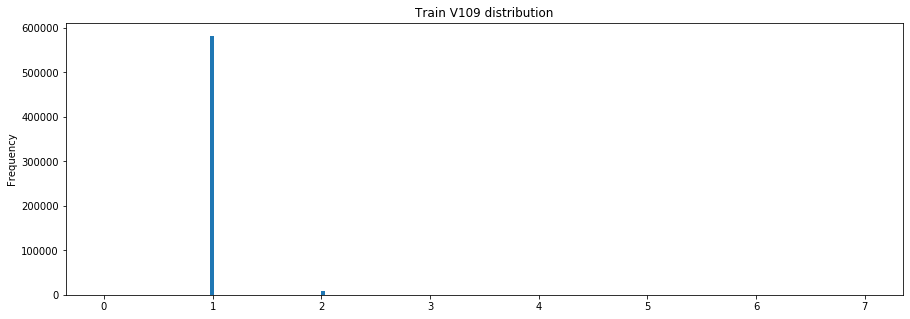

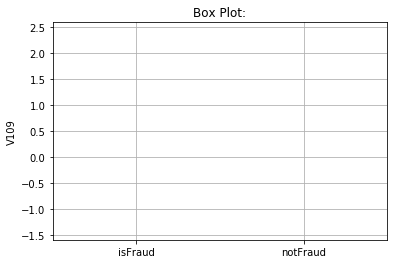

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V109
1     V110               0.749818
2     V115               0.694430
3     V108               0.604248
4     V116               0.549084
5     V112               0.463260
375     D2              -0.024533
376    V10              -0.027839
377     D8              -0.037168
378     D7              -0.054768
379     D5              -0.058730
--------------------------------------------------
Describing  V109  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.014816       1.055749          1.013333
std         0.127769       0.287870          0.117687
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

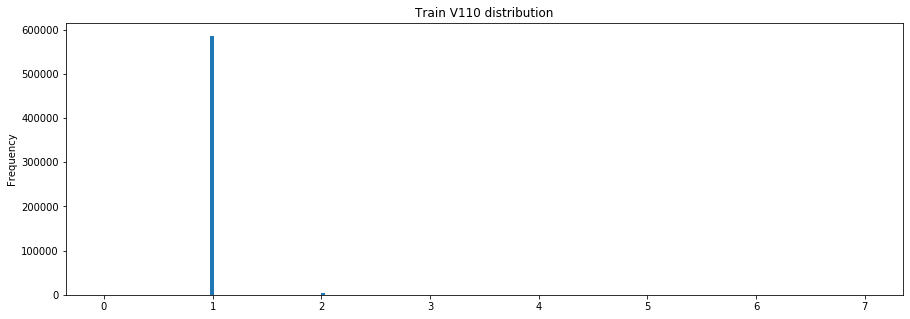

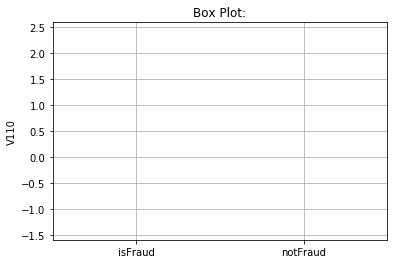

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V110
1     V108               0.817646
2     V109               0.749818
3     V116               0.730495
4     V114               0.612401
5     V113               0.578336
375    V90              -0.033172
376    V10              -0.034659
377     D8              -0.037843
378     D5              -0.047222
379     D7              -0.054285
--------------------------------------------------
Describing  V110  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.007739       1.049453          1.006227
std         0.097290       0.276163          0.083539
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

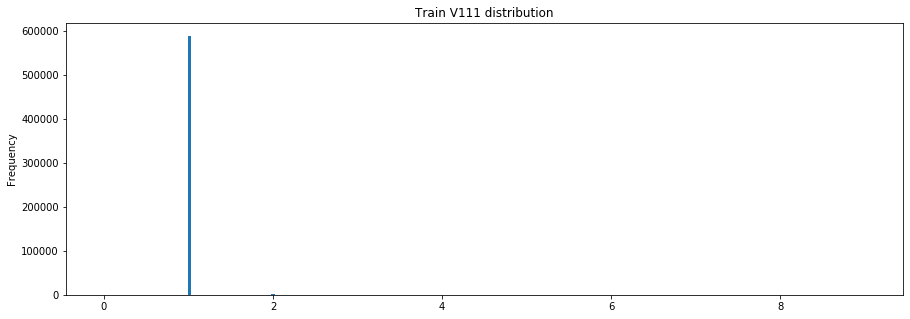

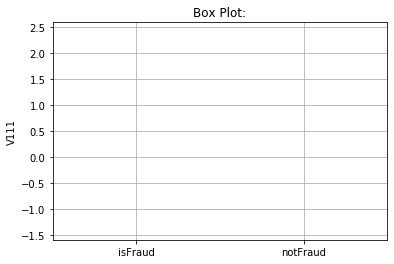

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V111
1     V113               0.923441
2     V112               0.782727
3     V108               0.687430
4     V114               0.600273
5     V110               0.554005
375    V35              -0.038129
376    V36              -0.038458
377     D8              -0.046234
378     D7              -0.057225
379  addr2              -0.060207
--------------------------------------------------
Describing  V111  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.002563       1.047806          1.000923
std         0.070830       0.296407          0.044016
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

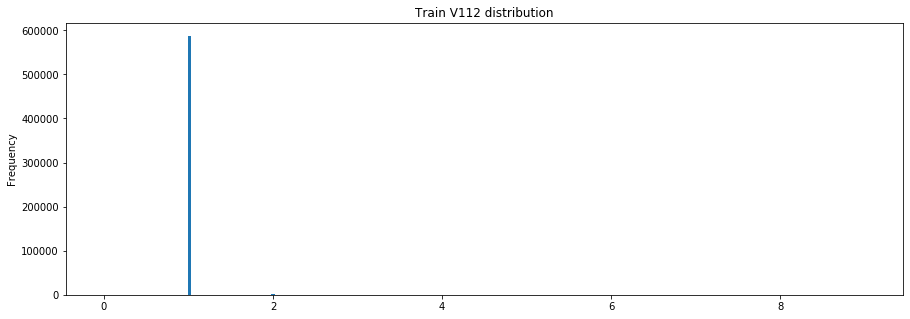

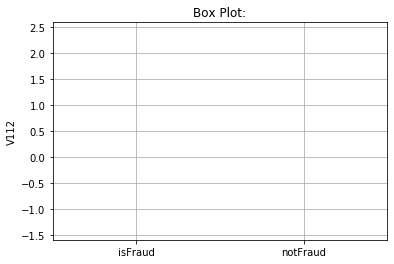

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V112
1     V113               0.851842
2     V111               0.782727
3     V108               0.527899
4     V110               0.487868
5     V114               0.467518
375    V12              -0.029946
376     D5              -0.034404
377  addr2              -0.037176
378     D8              -0.046692
379     D7              -0.058330
--------------------------------------------------
Describing  V112  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.005356       1.052117          1.003661
std         0.084617       0.302562          0.063399
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

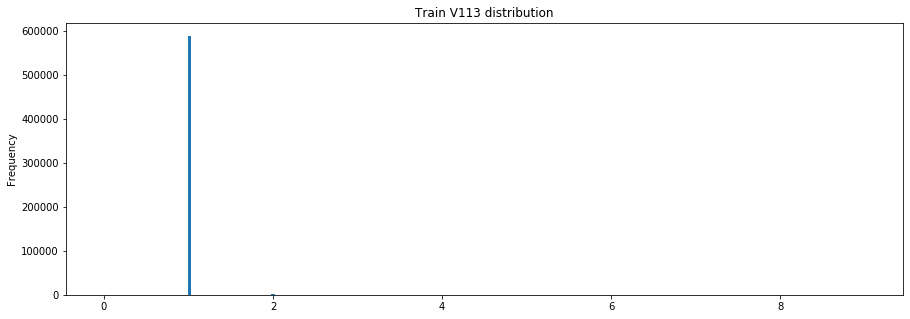

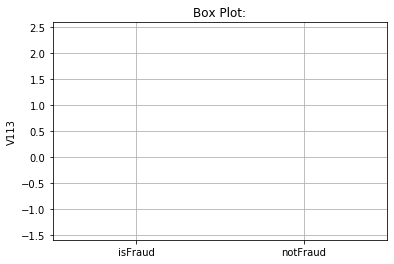

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V113
1     V111               0.923441
2     V112               0.851842
3     V108               0.630059
4     V110               0.578336
5     V114               0.553032
375    V12              -0.034734
376    V35              -0.035128
377     D8              -0.046318
378  addr2              -0.051879
379     D7              -0.057900
--------------------------------------------------
Describing  V113  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.003383       1.048920          1.001733
std         0.074754       0.297938          0.049953
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

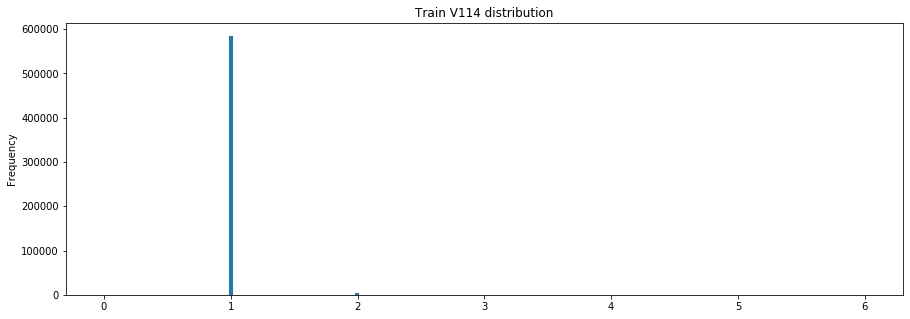

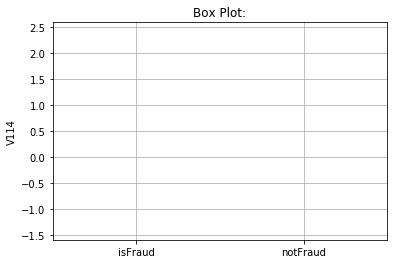

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V114
1     V116               0.800591
2     V108               0.748478
3     V110               0.612401
4     V111               0.600273
5     V123               0.582126
375    V48              -0.031976
376    V90              -0.033073
377     D8              -0.048434
378     D5              -0.050843
379     D7              -0.071482
--------------------------------------------------
Describing  V114  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.009298       1.064904          1.007283
std         0.110179       0.327406          0.092617
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

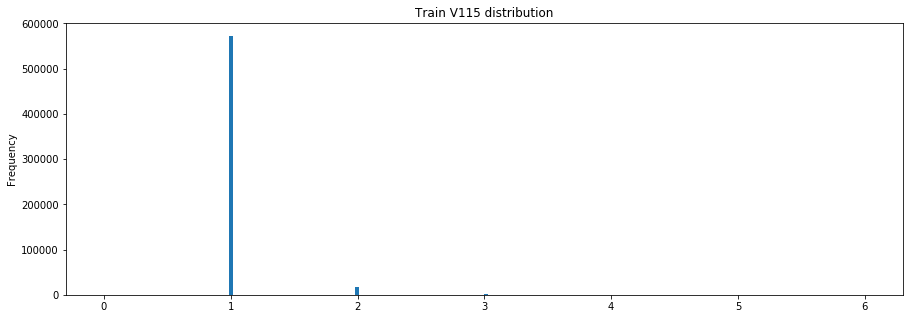

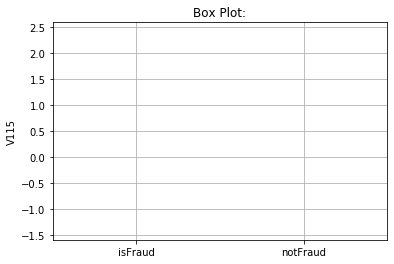

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V115
1     V116               0.723384
2     V109               0.694430
3     V124               0.577699
4     V114               0.567970
5     V110               0.525480
375   V304              -0.033651
376   V302              -0.036843
377     D8              -0.043526
378     D7              -0.074970
379     D5              -0.082840
--------------------------------------------------
Describing  V115  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.032450       1.089557          1.030380
std         0.190385       0.365993          0.180506
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

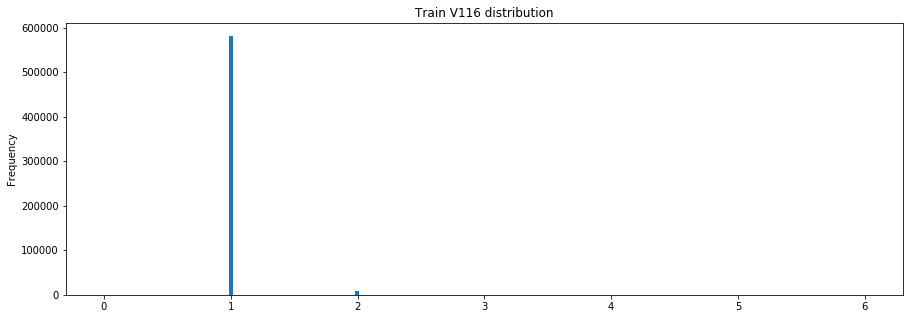

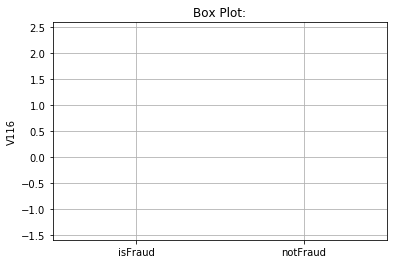

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V116
1     V114               0.800591
2     V110               0.730495
3     V115               0.723384
4     V108               0.594478
5     V125               0.565012
375    V90              -0.038764
376    V10              -0.039658
377     D8              -0.046535
378     D5              -0.065227
379     D7              -0.073147
--------------------------------------------------
Describing  V116  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000    20646.00000     569580.000000
mean        1.015738        1.07367          1.013638
std         0.136770        0.34017          0.122735
min         0.000000        0.00000          0.000000
25%         1.000000        1.00000          1.000000
50%         1.000000        1.00000          1.000000
75%         1.000000        1.00000          1.000000
max   

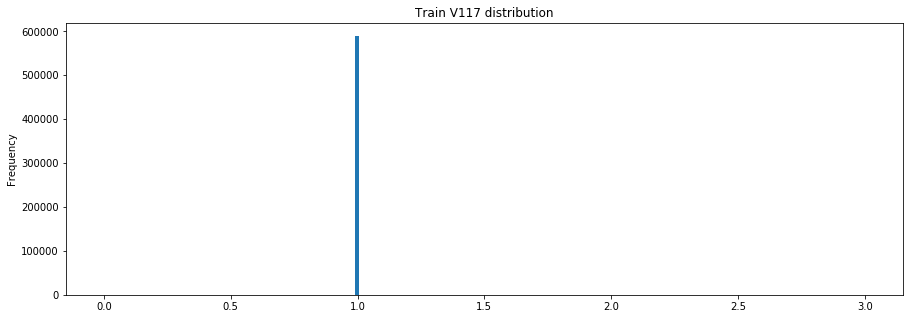

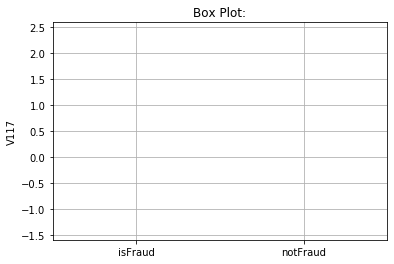

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V117
1     V119               0.869107
2     V118               0.637366
3     V120               0.592637
4     V107               0.582052
5     V122               0.433578
375    V35              -0.019888
376     D8              -0.027101
377     D9              -0.029683
378     D7              -0.033420
379  addr2              -0.050229
--------------------------------------------------
Describing  V117  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.000391       1.009542          1.000060
std         0.035238       0.098701          0.030504
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

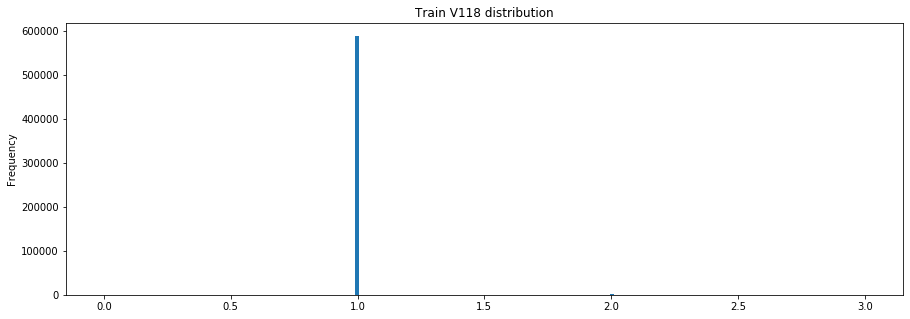

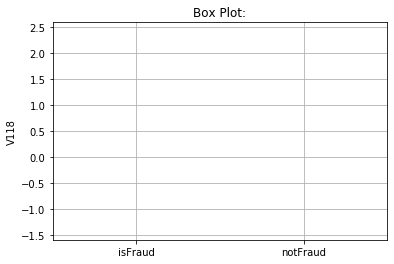

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V118
1     V119               0.757591
2     V117               0.637366
3     V121               0.447792
4     V122               0.365645
5     V120               0.321347
375     D5              -0.019759
376     D8              -0.027255
377     D9              -0.028924
378     D7              -0.034330
379  addr2              -0.040004
--------------------------------------------------
Describing  V118  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.001474       1.010220          1.001157
std         0.041011       0.100578          0.037059
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

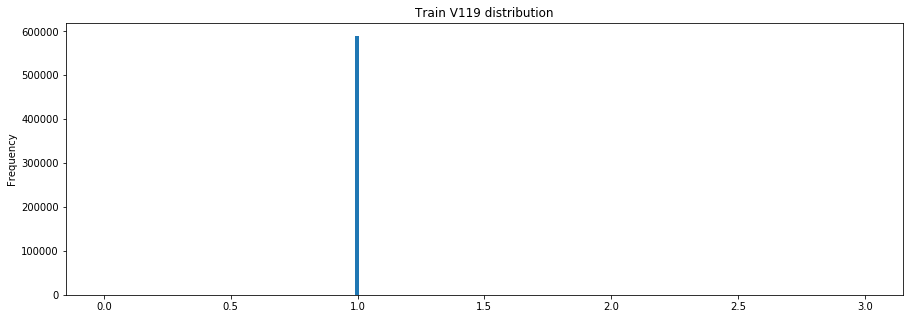

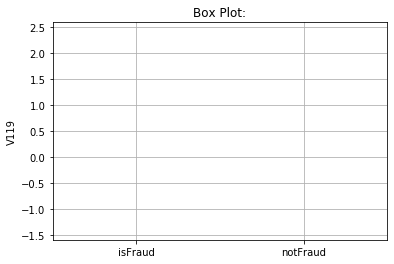

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V119
1     V117               0.869107
2     V118               0.757591
3     V122               0.521921
4     V120               0.489889
5     V107               0.393413
375    V48              -0.018880
376     D8              -0.027598
377     D9              -0.028140
378     D7              -0.033867
379  addr2              -0.048876
--------------------------------------------------
Describing  V119  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.000729       1.009929          1.000395
std         0.036392       0.099640          0.031770
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

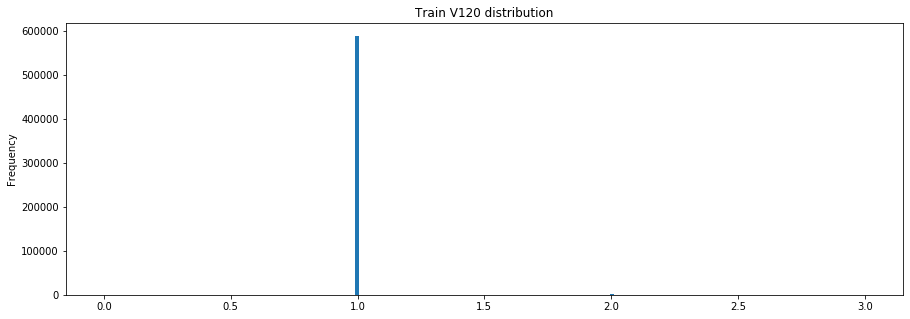

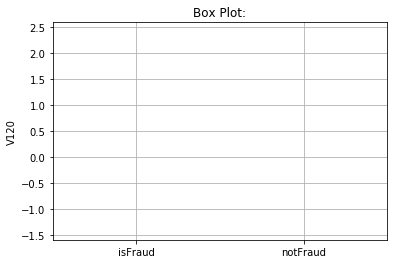

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V120
1     V122               0.793995
2     V117               0.592637
3     V121               0.507512
4     V107               0.492287
5     V119               0.489889
375     D8              -0.010886
376    D10              -0.011372
377     D5              -0.014989
378     D7              -0.023191
379  addr2              -0.038834
--------------------------------------------------
Describing  V120  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.000874       1.005183          1.000718
std         0.041684       0.077639          0.039766
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

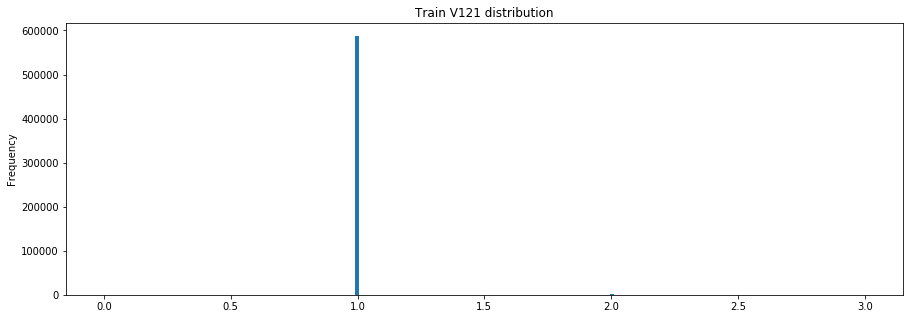

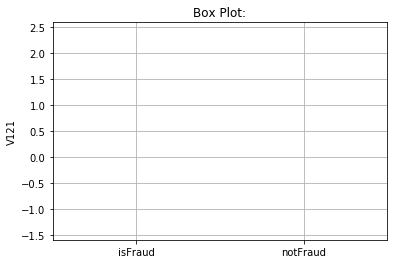

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V121
1     V122               0.667437
2     V120               0.507512
3     V118               0.447792
4     V115               0.377880
5     V119               0.298471
375    V50              -0.019134
376   V302              -0.019387
377  addr2              -0.020232
378     D7              -0.026039
379     D5              -0.031114
--------------------------------------------------
Describing  V121  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.004276       1.008622          1.004119
std         0.067097       0.095545          0.065830
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

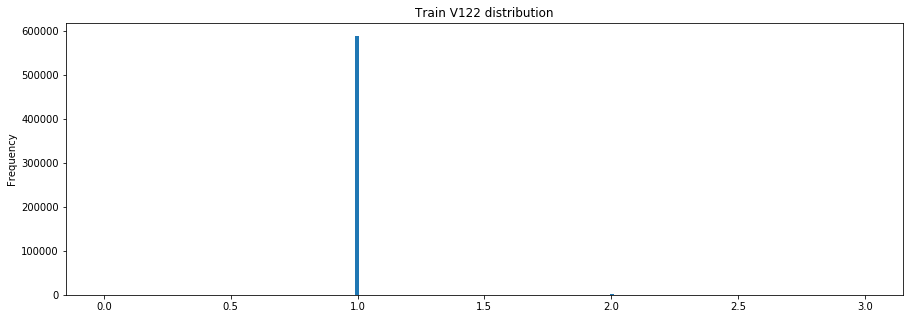

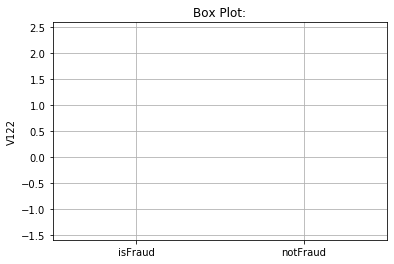

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V122
1     V120               0.793995
2     V121               0.667437
3     V119               0.521921
4     V117               0.433578
5     V116               0.381201
375     D8              -0.012053
376   V152              -0.012355
377     D5              -0.021901
378     D7              -0.024767
379  addr2              -0.031953
--------------------------------------------------
Describing  V122  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.001759       1.006539          1.001585
std         0.048636       0.084702          0.046801
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

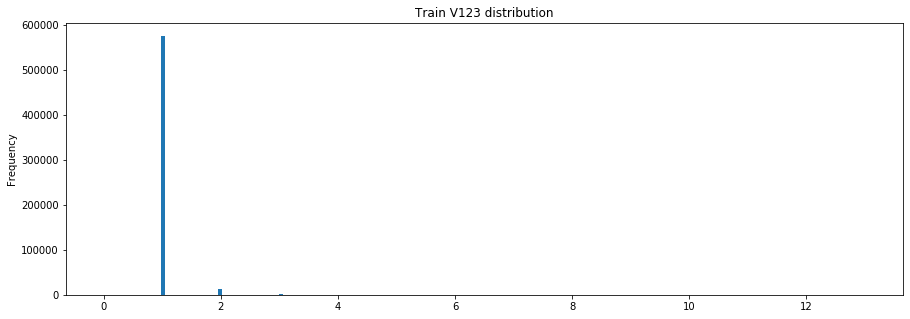

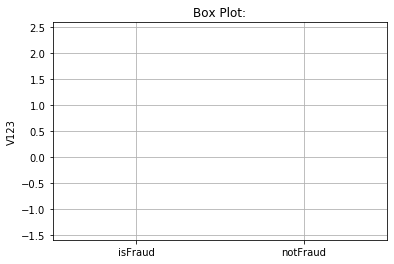

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V123
1     V125               0.819023
2     V124               0.615689
3      V23               0.612617
4     V114               0.582126
5      V24               0.532372
375    V69              -0.046749
376    V90              -0.046825
377     D8              -0.066123
378     D5              -0.072730
379     D7              -0.093410
--------------------------------------------------
Describing  V123  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.031120       1.196745          1.025117
std         0.228134       0.768501          0.177467
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

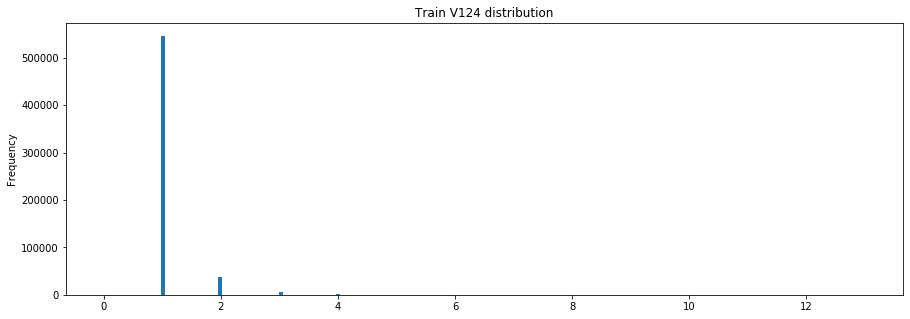

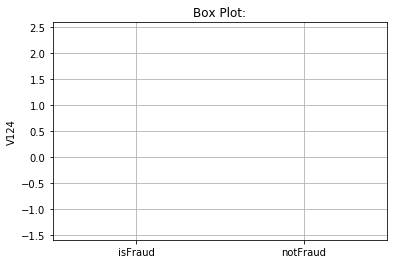

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V124
1     V125               0.795594
2     V329               0.736817
3     V330               0.734519
4     V324               0.704544
5     V333               0.697898
375   V149              -0.128816
376   V155              -0.133456
377   V148              -0.137996
378   V154              -0.145820
379   V153              -0.148582
--------------------------------------------------
Describing  V124  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.092975       1.243728          1.087510
std         0.374103       0.805333          0.347368
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

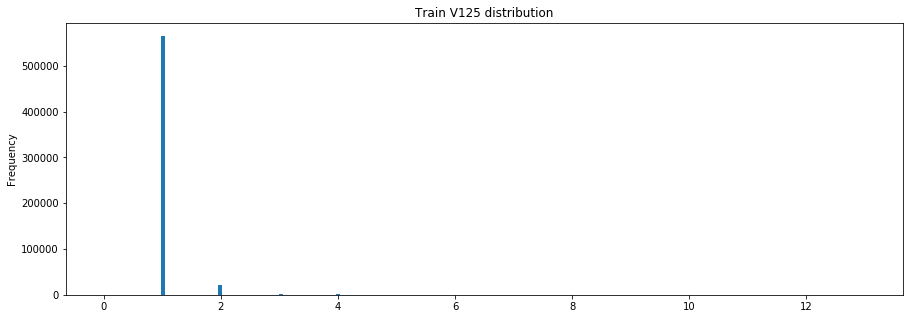

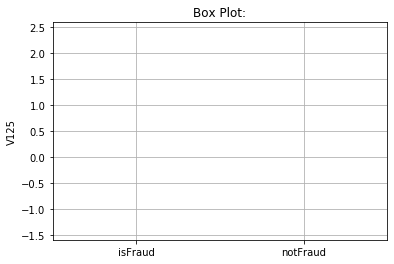

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V125
1     V123               0.819023
2     V124               0.795594
3     V330               0.691523
4     V328               0.670547
5     V329               0.643172
375   V155              -0.102506
376   V148              -0.106158
377   V154              -0.112610
378   V153              -0.114595
379     D7              -0.117494
--------------------------------------------------
Describing  V125  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        1.050415       1.215151          1.044443
std         0.280037       0.781981          0.240997
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max   

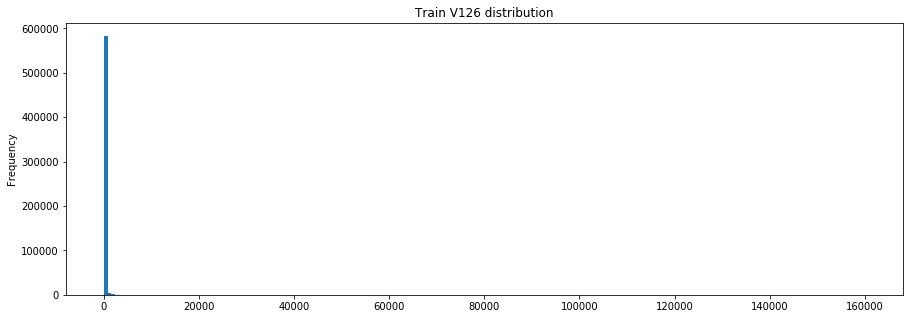

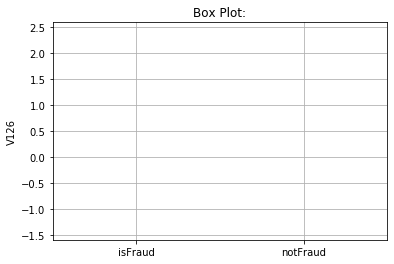

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V126
1     V331               0.995099
2     V306               0.991851
3     V132               0.988348
4     V211               0.986600
5     V322               0.986342
375   V149              -0.126248
376   V155              -0.130313
377   V148              -0.134724
378   V154              -0.141868
379   V153              -0.144956
--------------------------------------------------
Describing  V126  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean      129.979417      86.272554        131.563693
std      2346.951681     284.631132       2388.479348
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      40.000000          0.000000
max   

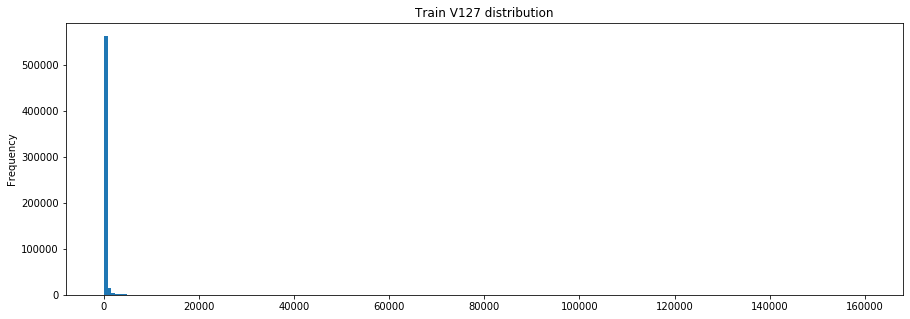

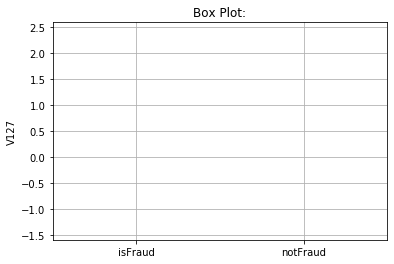

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V127
1     V332               0.996655
2     V323               0.993635
3     V133               0.992261
4     V333               0.989048
5     V128               0.988974
375   V149              -0.139888
376   V155              -0.144416
377   V148              -0.149235
378   V154              -0.157130
379   V153              -0.160504
--------------------------------------------------
Describing  V127  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean      336.611559     278.089451        338.732854
std      4238.666949     898.110844       4311.400223
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%       107.949997     162.579044        107.949997
max   

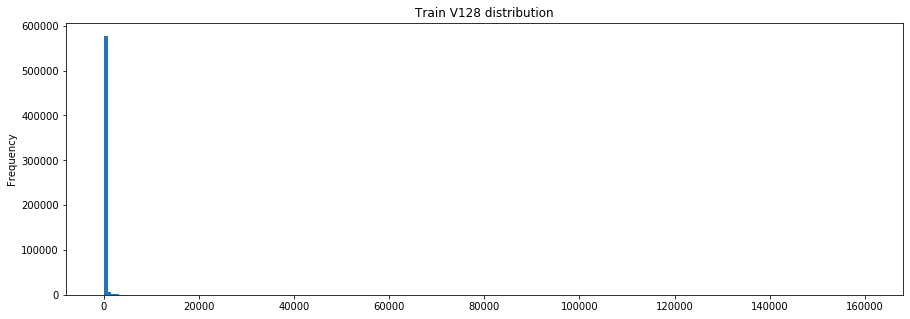

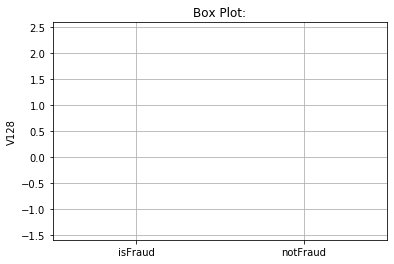

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V128
1     V333               0.996275
2     V134               0.991355
3     V324               0.990659
4     V332               0.989910
5     V127               0.988974
375   V149              -0.142198
376   V155              -0.146828
377   V148              -0.151733
378   V154              -0.159791
379   V153              -0.163243
--------------------------------------------------
Describing  V128  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean      204.094038     173.574554        205.200301
std      3010.258774     561.111545       3062.462466
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000     100.000000          0.000000
max   

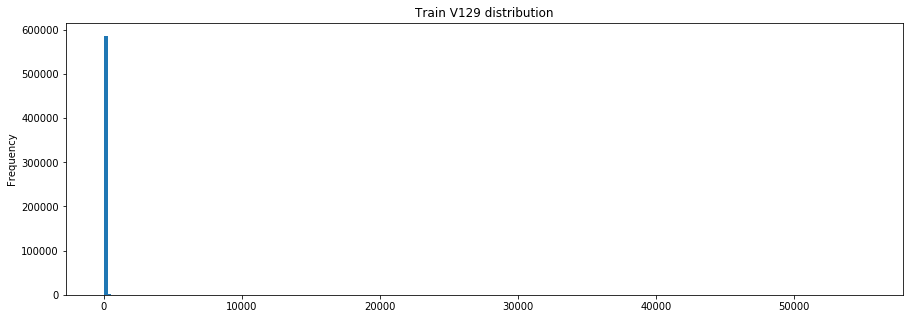

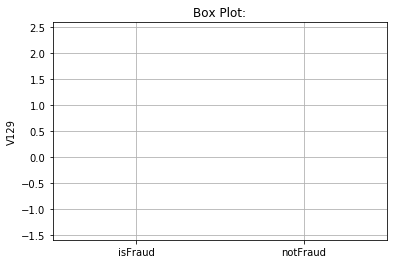

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V129
1     V269               0.961926
2     V266               0.960216
3     V206               0.956912
4     V334               0.949515
5     V309               0.920793
375    V51              -0.039026
376    V50              -0.039149
377    V42              -0.039974
378     D3              -0.042200
379     D5              -0.065749
--------------------------------------------------
Describing  V129  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean        8.768944      16.380528          8.493041
std       113.832828      83.478865        114.773011
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

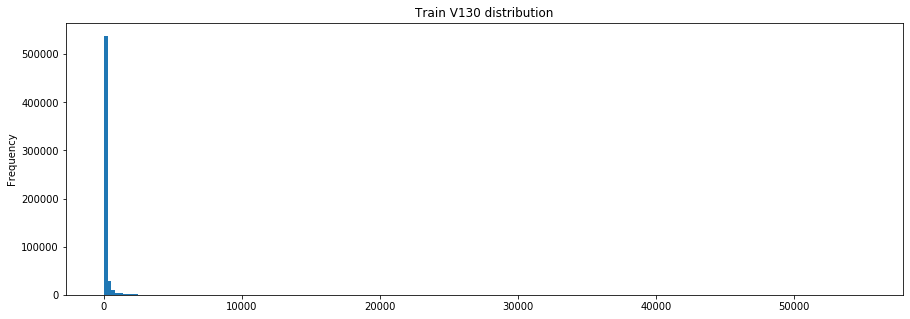

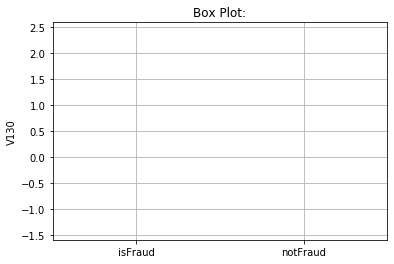

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V130
1     V310               0.841170
2     V335               0.801644
3     V269               0.787088
4     V266               0.784825
5     V131               0.749282
375   V154              -0.135600
376   V153              -0.138564
377     D3              -0.138598
378    V50              -0.141513
379     D5              -0.156678
--------------------------------------------------
Describing  V130  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean       92.165849      97.270605         91.980813
std       315.960485     328.762971        315.485415
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%        59.000000       0.000000         59.000000
max   

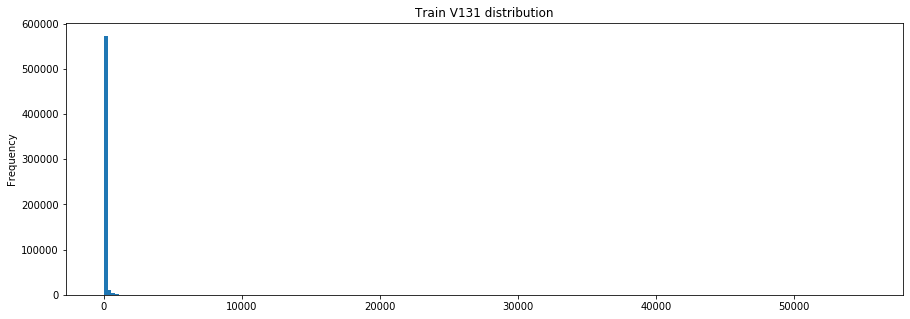

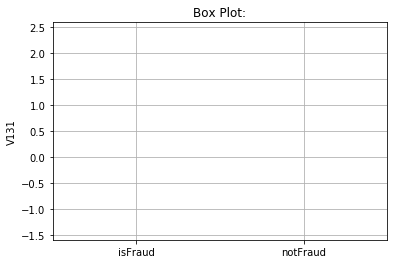

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V131
1     V336               0.923727
2     V269               0.911861
3     V266               0.909926
4     V312               0.870205
5     V335               0.848055
375    V50              -0.094614
376    V11              -0.100521
377     D3              -0.106850
378    V10              -0.111659
379     D5              -0.123941
--------------------------------------------------
Describing  V131  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean       31.133302      52.274012         30.366999
std       161.161258     188.145066        160.045517
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

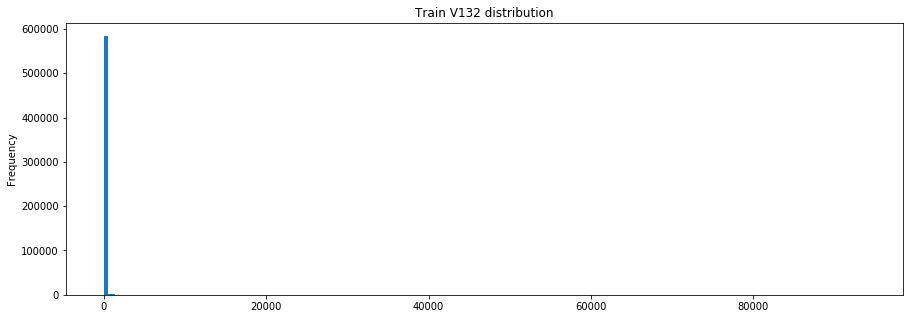

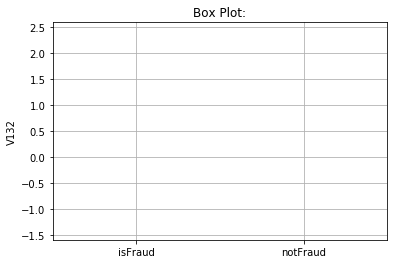

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V132
1     V322               0.997984
2     V316               0.997222
3     V101               0.995637
4      V95               0.995258
5     V293               0.994567
375   V149              -0.125776
376   V155              -0.129831
377   V148              -0.134155
378   V154              -0.141360
379   V153              -0.144357
--------------------------------------------------
Describing  V132  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean      103.513188      52.771340        105.352467
std      2266.106140     218.583926       2306.414902
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

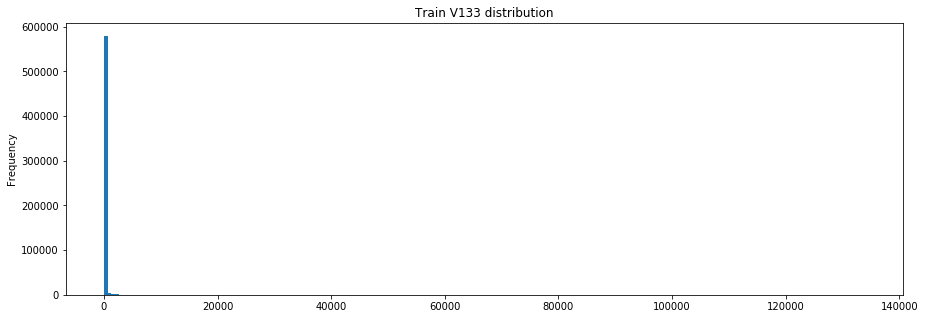

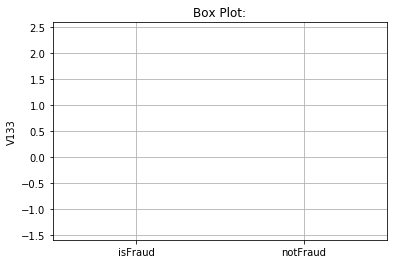

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V133
1     V323               0.997651
2     V332               0.996004
3     V102               0.995615
4      V96               0.992326
5     V127               0.992261
375   V149              -0.136582
376   V155              -0.141006
377   V148              -0.145665
378   V154              -0.153453
379   V153              -0.156695
--------------------------------------------------
Describing  V133  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean      204.889160     141.773367        207.176966
std      3796.316755     596.435191       3862.820432
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      23.422851          0.000000
max   

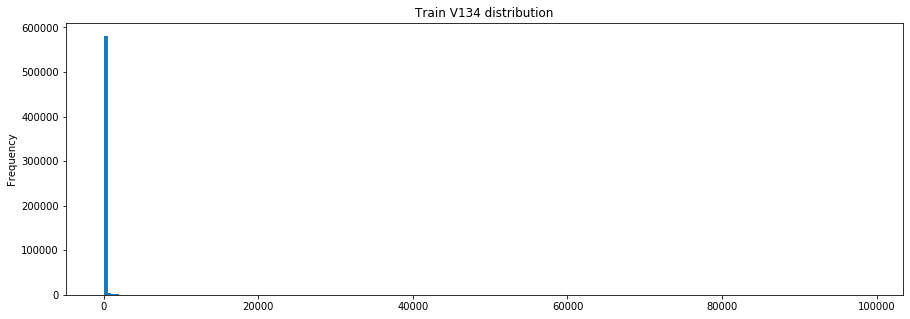

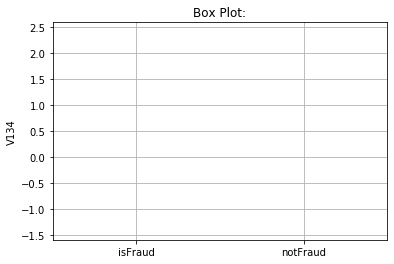

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V134
1     V324               0.997303
2     V103               0.995735
3     V323               0.994399
4      V97               0.994022
5     V333               0.993521
375   V149              -0.140454
376   V155              -0.145034
377   V148              -0.149814
378   V154              -0.157863
379   V153              -0.161205
--------------------------------------------------
Describing  V134  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean      145.972328      94.821907        147.826416
std      2772.986817     401.688406       2821.743297
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

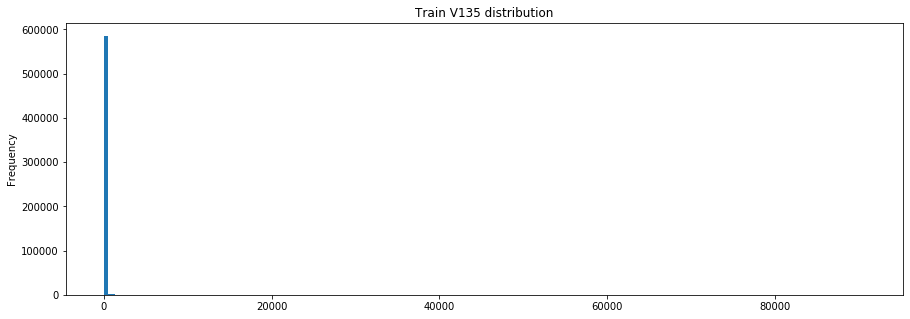

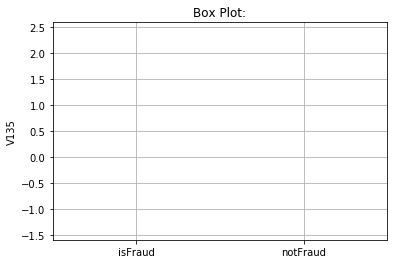

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V135
1     V137               0.913348
2     V276               0.791458
3     V136               0.760097
4     V278               0.759863
5     V319               0.744056
375   V148              -0.038853
376   V250              -0.040014
377   V154              -0.040132
378   V153              -0.041784
379     D5              -0.043978
--------------------------------------------------
Describing  V135  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean       17.250132      16.823745         17.265588
std       293.847563     116.586376        298.301160
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

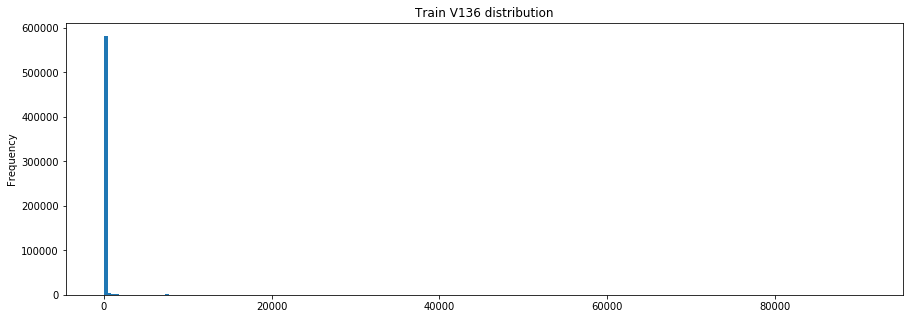

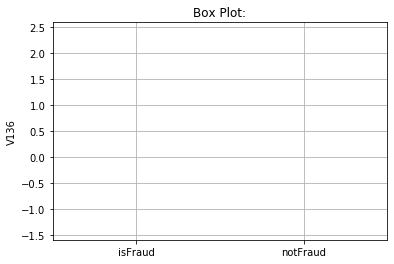

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V136
1     V137               0.934824
2     V320               0.854772
3     V338               0.854639
4     V333               0.790250
5     V329               0.781943
375   V149              -0.122460
376   V155              -0.126634
377   V148              -0.131071
378   V154              -0.137406
379   V153              -0.140833
--------------------------------------------------
Describing  V136  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean       38.821196      38.720929         38.824830
std       451.808411     221.912050        457.979479
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

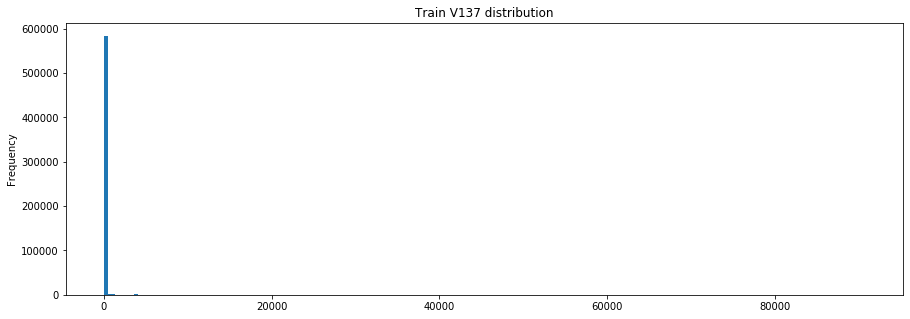

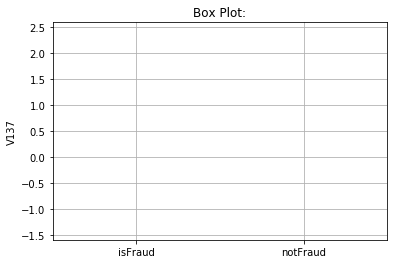

percentage of missing values: 0.053171673383682734
--------------------------------------------------
Correlations: 
    Column  Correlation with V137
1     V136               0.934824
2     V135               0.913348
3     V321               0.797009
4     V320               0.788104
5     V278               0.781089
375   V250              -0.093736
376   V155              -0.095240
377   V148              -0.098707
378   V154              -0.103178
379   V153              -0.106046
--------------------------------------------------
Describing  V137  :
               Train  isFraud Train  isNotFraud Train
count  590226.000000   20646.000000     569580.000000
mean       26.365090      26.155054         26.372703
std       348.332714     160.145334        353.276445
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max   

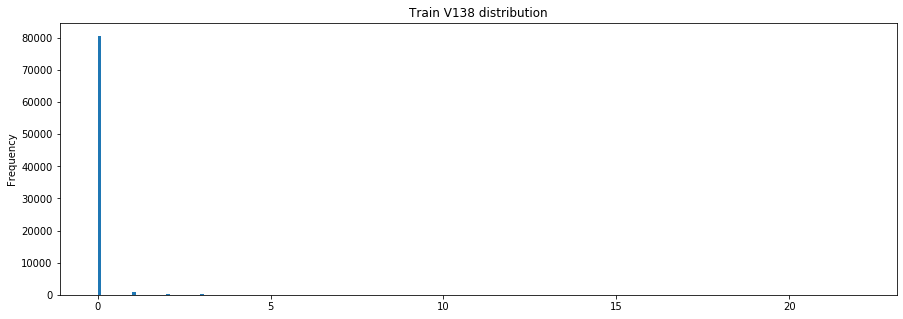

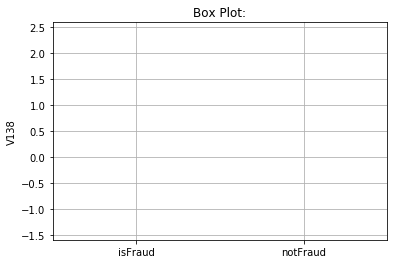

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V138
1     V161               0.579542
2     V163               0.560321
3     V169               0.534889
4     V141               0.526152
5     V162               0.518303
327    D15              -0.056016
328     D7              -0.058815
329     D6              -0.086598
330     D5              -0.094729
331     D2              -0.148618
--------------------------------------------------
Describing  V138  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.036439       0.121096          0.032492
std        0.428490       0.659371          0.414186
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max       22.0000

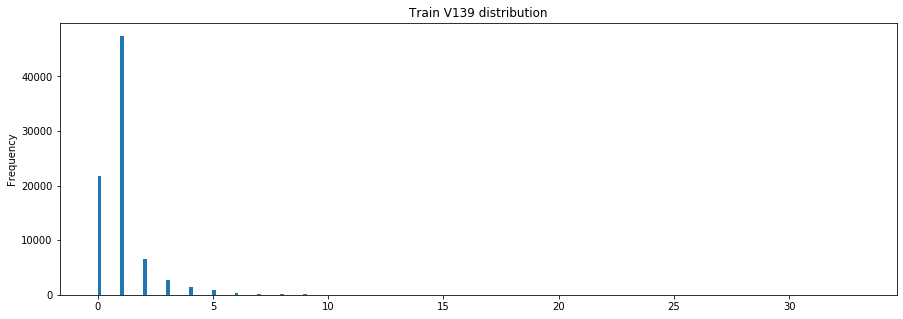

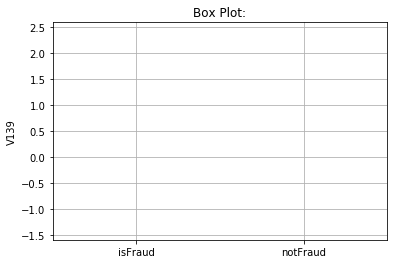

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V139
1     V140               0.945770
2     V157               0.706701
3     V158               0.678448
4     V146               0.666175
5     V282               0.628419
327   V160              -0.268757
328   V151              -0.282841
329     D5              -0.307289
330   V152              -0.309434
331     D6              -0.501325
--------------------------------------------------
Describing  V139  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       1.073915       1.985753          1.031407
std        1.333924       2.231422          1.260822
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       3.000000          1.000000
max       33.0000

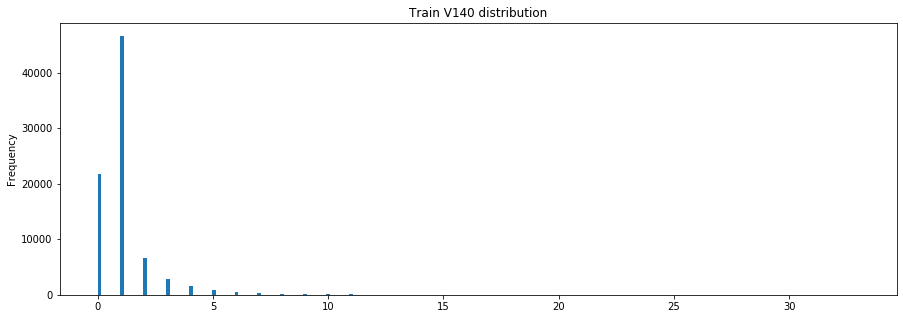

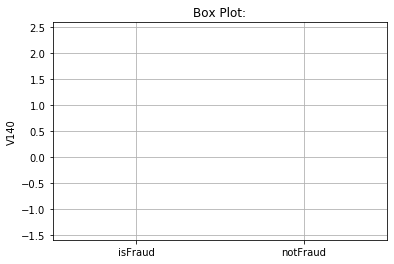

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V140
1     V139               0.945770
2     V158               0.715031
3     V147               0.683912
4     V157               0.674558
5     V146               0.636298
327   V160              -0.255884
328   V151              -0.269165
329   V152              -0.293987
330     D5              -0.322888
331     D6              -0.489405
--------------------------------------------------
Describing  V140  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       1.125267       2.464110          1.062852
std        1.467850       2.947508          1.327652
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       2.000000          1.000000
75%        1.000000       3.000000          1.000000
max       33.0000

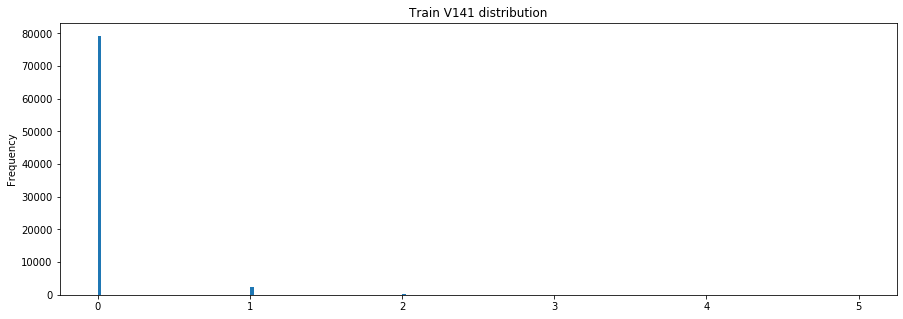

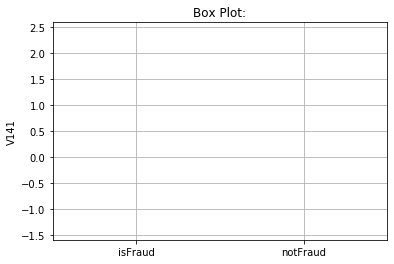

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V141
1     V142               0.877733
2     V162               0.543292
3     V138               0.526152
4     V163               0.523593
5     V161               0.510993
327    D15              -0.103033
328     D7              -0.113244
329     D5              -0.165128
330     D6              -0.184621
331     D2              -0.290715
--------------------------------------------------
Describing  V141  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.037696       0.123014          0.033719
std        0.215133       0.403386          0.201249
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max        5.0000

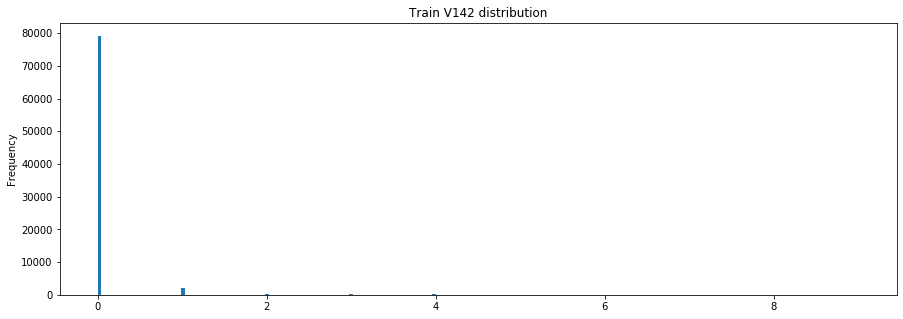

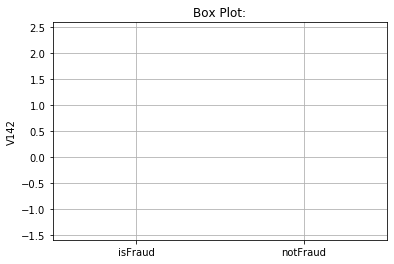

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V142
1     V141               0.877733
2     V162               0.540234
3     V163               0.474477
4     V289               0.439364
5     V138               0.397407
327    V19              -0.110094
328    V82              -0.111810
329     D5              -0.156998
330     D6              -0.170813
331     D2              -0.245534
--------------------------------------------------
Describing  V142  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.048581       0.165479          0.043132
std        0.313888       0.655113          0.287141
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max        9.0000

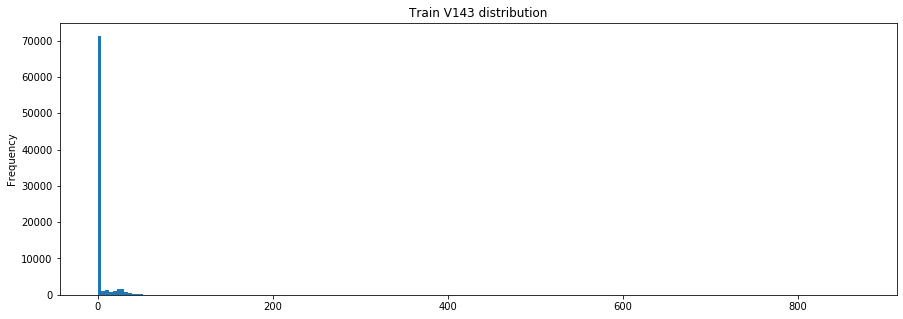

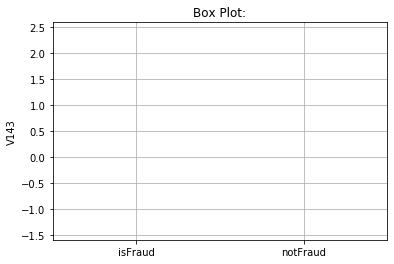

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V143
1     V164               0.996551
2     V101               0.989884
3     V293               0.989616
4      V95               0.989536
5     V322               0.989483
327    V20              -0.342771
328    V19              -0.345714
329    V62              -0.382845
330    V61              -0.386694
331    V50              -0.495423
--------------------------------------------------
Describing  V143  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean       8.397006       0.778417          8.752248
std       55.267545       2.640451         56.513468
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       1.000000          0.000000
max      869.0000

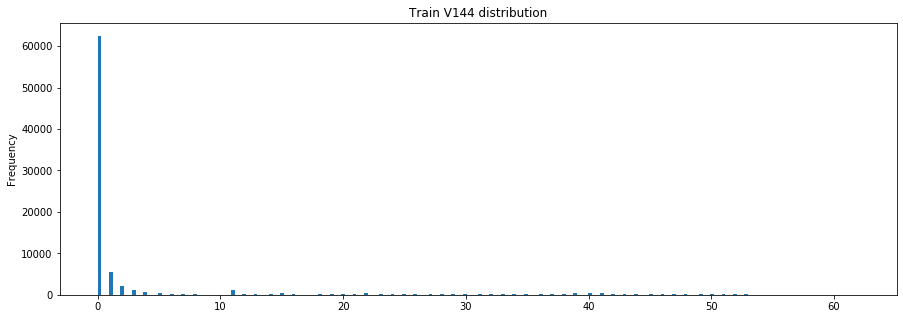

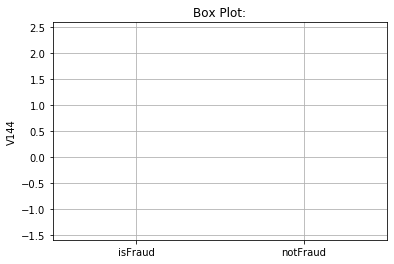

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V144
1     V150               0.958449
2     V145               0.952649
3     V159               0.938407
4     V151               0.921604
5     V160               0.893884
327   V148              -0.422351
328    V92              -0.433878
329   V154              -0.448557
330   V153              -0.459196
331    V50              -0.512692
--------------------------------------------------
Describing  V144  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean       3.708484       1.184881          3.826156
std       10.485633       3.701618         10.682965
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       1.000000          0.000000
max       62.0000

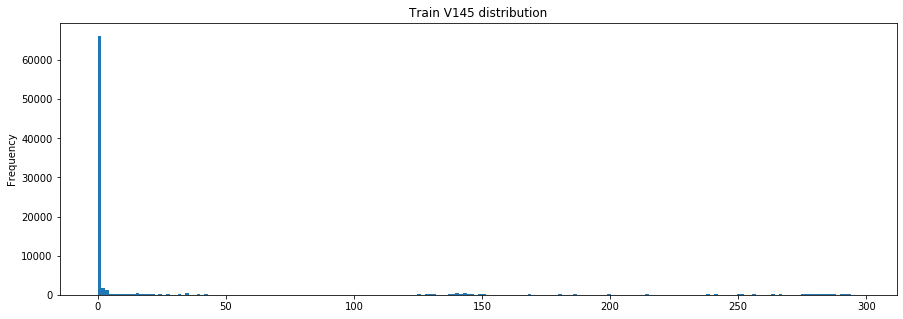

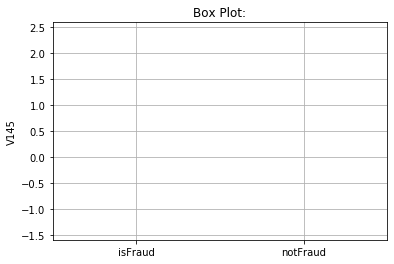

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V145
1     V150               0.981799
2     V160               0.961669
3     V144               0.952649
4     V151               0.942457
5     V159               0.917704
327    V92              -0.459852
328   V154              -0.467680
329   V153              -0.477946
330    V31              -0.479826
331    V50              -0.533730
--------------------------------------------------
Describing  V145  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean      22.112946       3.641194         22.974253
std       64.371860      22.013184         65.556946
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        1.000000       1.500000          0.000000
max      297.0000

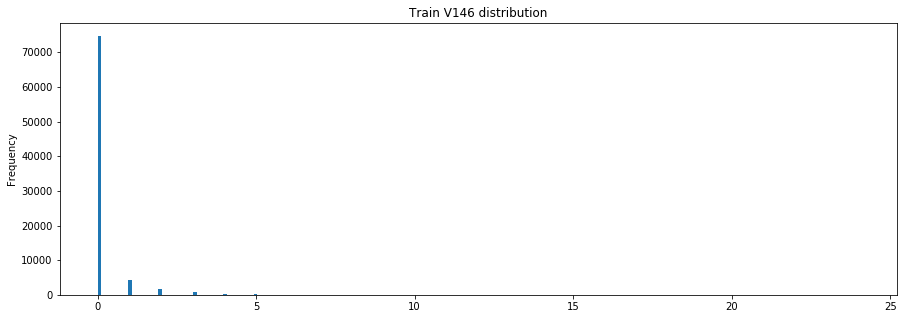

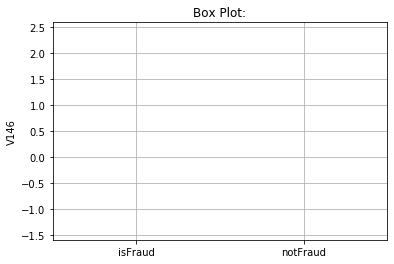

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V146
1     V147               0.932216
2     V184               0.748912
3     V139               0.666175
4     V238               0.656216
5     V185               0.650682
327    D15              -0.101470
328     D7              -0.107351
329     D2              -0.109818
330     D6              -0.167649
331     D5              -0.220588
--------------------------------------------------
Describing  V146  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.156276       0.783836          0.127020
std        0.682328       1.848351          0.555728
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       1.000000          0.000000
max       24.0000

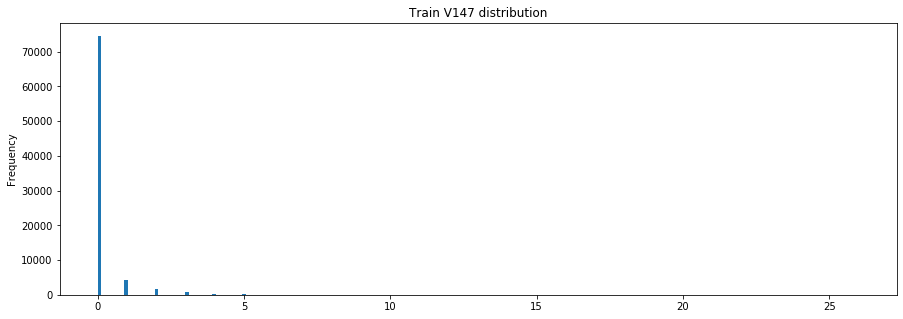

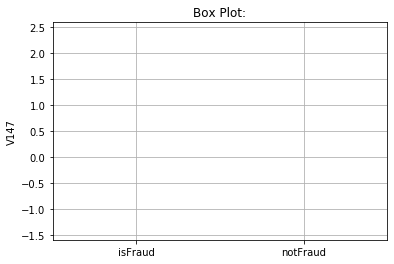

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V147
1     V146               0.932216
2     V184               0.705138
3     V140               0.683912
4     V185               0.663533
5     V239               0.632425
327    D15              -0.103089
328     D7              -0.108240
329     D2              -0.112777
330     D6              -0.169190
331     D5              -0.228053
--------------------------------------------------
Describing  V147  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.168601       1.012877          0.129242
std        0.750497       2.273225          0.560253
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       1.000000          0.000000
max       26.0000

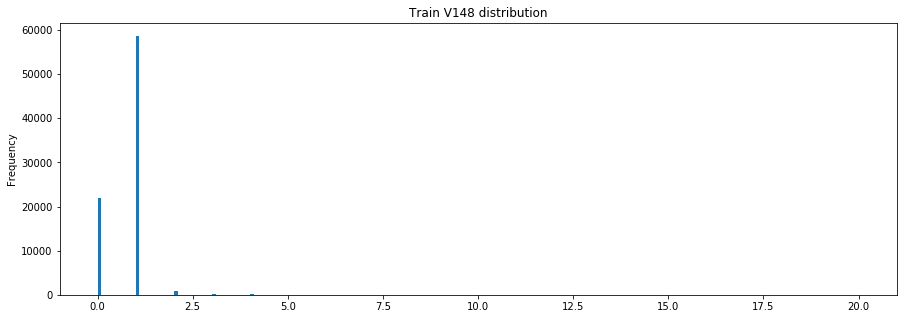

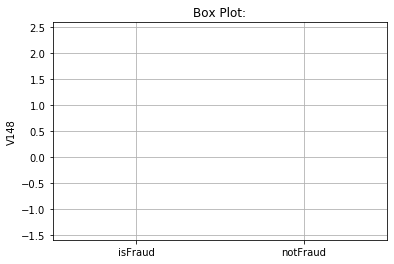

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V148
1     V155               0.975978
2     V153               0.952071
3     V149               0.950232
4     V154               0.939466
5     V156               0.931158
327   V145              -0.443791
328    D15              -0.445041
329   V151              -0.461530
330   V152              -0.505136
331     D6              -0.703948
--------------------------------------------------
Describing  V148  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.765001       1.381370          0.736267
std        0.581425       1.647401          0.456938
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       2.000000          1.000000
max       20.0000

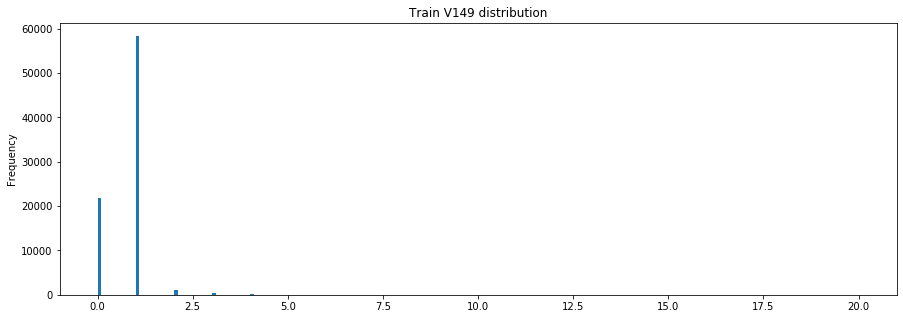

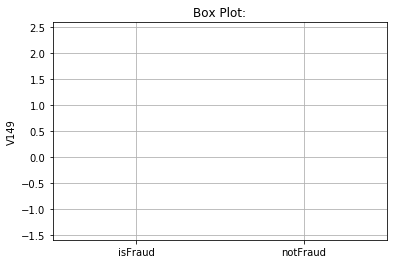

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V149
1     V156               0.976168
2     V148               0.950232
3     V155               0.926838
4     V158               0.918618
5     V154               0.915597
327   V145              -0.415211
328   V151              -0.432541
329    D15              -0.438651
330   V152              -0.472827
331     D6              -0.698995
--------------------------------------------------
Describing  V149  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.775313       1.570411          0.738246
std        0.628191       1.913475          0.459925
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       2.000000          1.000000
max       20.0000

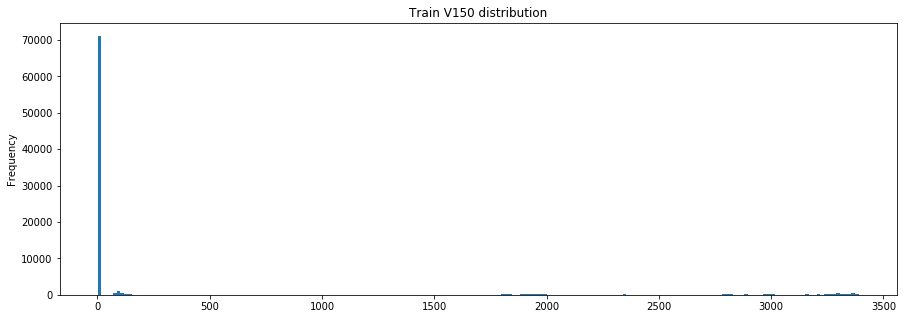

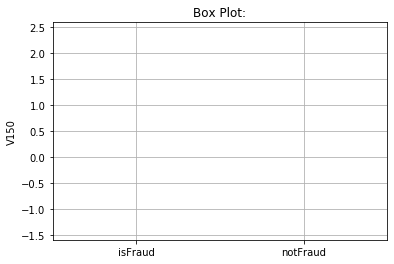

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V150
1     V145               0.981799
2     V151               0.972867
3     V159               0.968534
4     V144               0.958449
5     V160               0.942301
327    V92              -0.464599
328   V153              -0.471133
329    V71              -0.472907
330    V31              -0.502933
331    V50              -0.539547
--------------------------------------------------
Describing  V150  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean     277.598028      31.862230        289.056284
std      829.576922     271.047102        844.935531
min        1.000000       1.000000          1.000000
25%        1.000000       1.000000          1.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       2.000000          1.000000
max     3389.0000

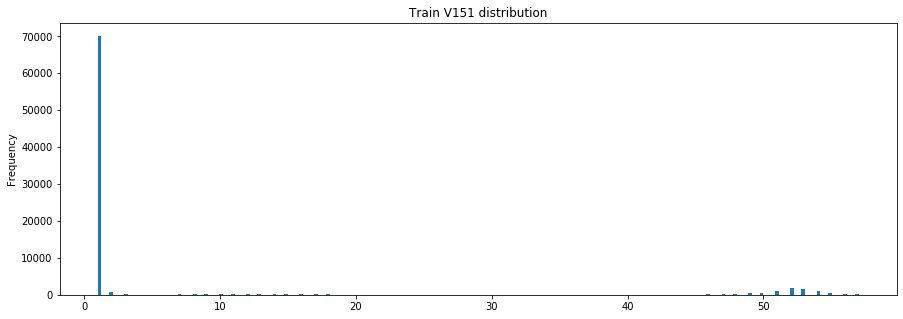

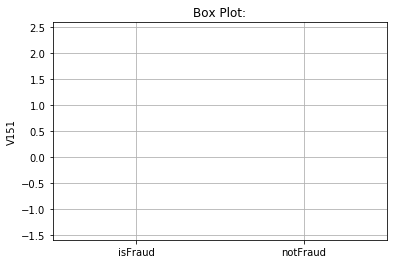

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V151
1     V150               0.972867
2     V159               0.962705
3     V145               0.942457
4     V152               0.938174
5     V144               0.921604
327    V92              -0.492945
328   V153              -0.496762
329    V71              -0.504865
330    V31              -0.538982
331    V50              -0.573047
--------------------------------------------------
Describing  V151  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean       6.460190       2.166530          6.660396
std       15.232324       5.474493         15.509543
min        1.000000       1.000000          1.000000
25%        1.000000       1.000000          1.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       1.000000          1.000000
max       57.0000

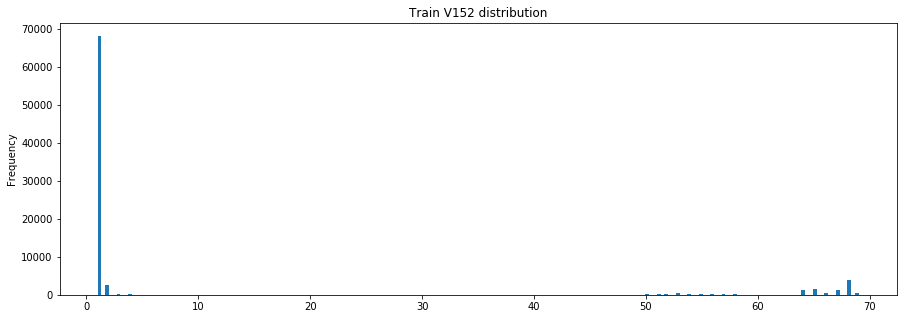

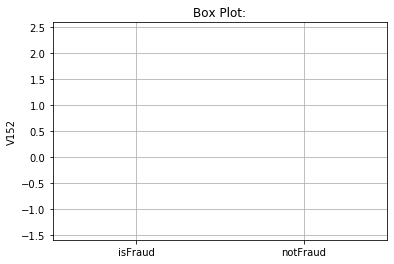

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V152
1     V151               0.938174
2     V160               0.890901
3     V150               0.887184
4     V145               0.876682
5     V159               0.860805
327   V154              -0.531424
328    V71              -0.541191
329   V153              -0.543574
330    V31              -0.587984
331    V50              -0.613668
--------------------------------------------------
Describing  V152  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean       9.432710       3.528075          9.708033
std       21.554486      10.510815         21.895387
min        1.000000       1.000000          1.000000
25%        1.000000       1.000000          1.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       2.000000          1.000000
max       69.0000

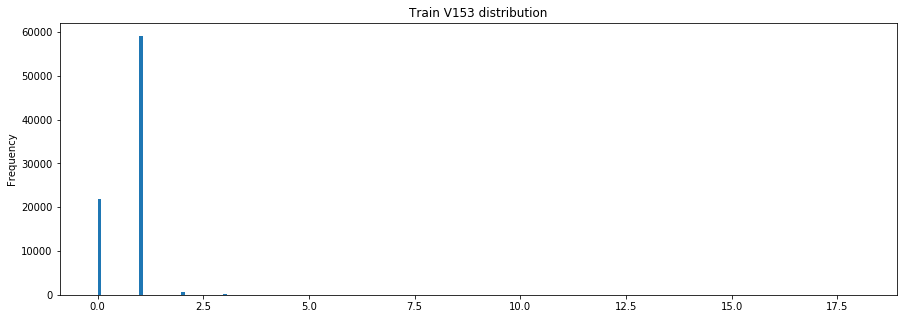

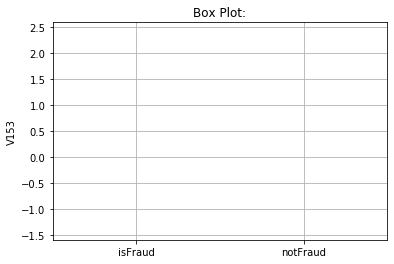

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V153
1     V154               0.986471
2     V155               0.960661
3     V148               0.952071
4     V156               0.913550
5     V149               0.900617
327   V160              -0.472221
328   V145              -0.477946
329   V151              -0.496762
330   V152              -0.543574
331     D6              -0.708055
--------------------------------------------------
Describing  V153  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.753200       1.204932          0.732141
std        0.532649       1.350650          0.449403
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       1.000000          1.000000
max       18.0000

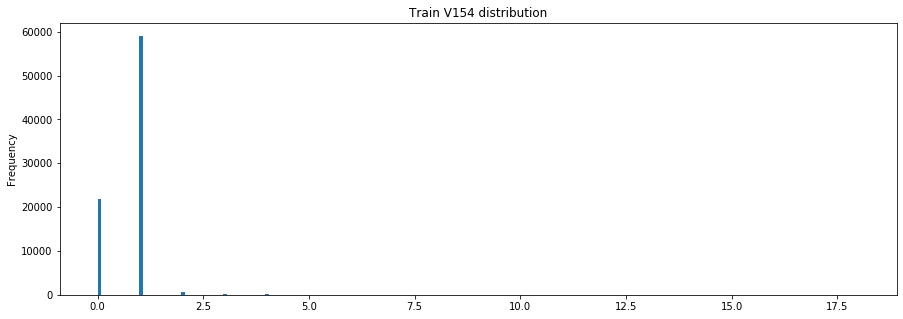

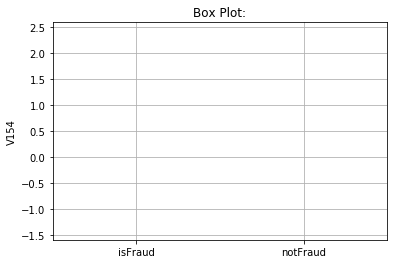

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V154
1     V153               0.986471
2     V155               0.949000
3     V148               0.939466
4     V156               0.929691
5     V149               0.915597
327   V160              -0.462485
328   V145              -0.467680
329   V151              -0.486133
330   V152              -0.531424
331     D6              -0.704417
--------------------------------------------------
Describing  V154  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.757423       1.281644          0.732984
std        0.546907       1.441513          0.450330
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       1.000000          1.000000
max       18.0000

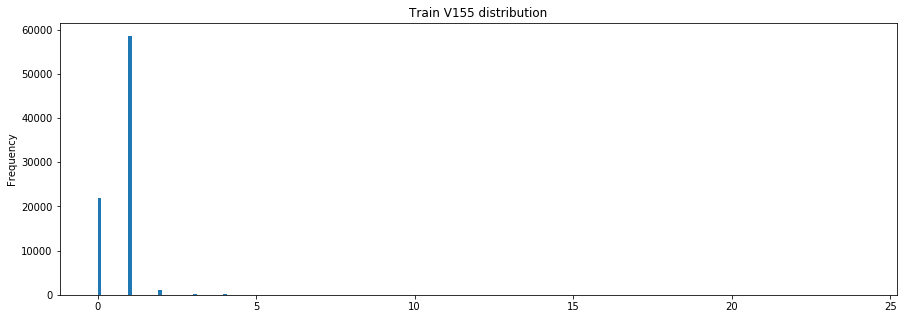

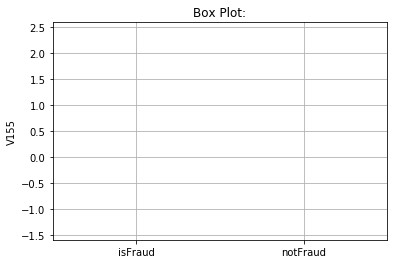

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V155
1     V148               0.975978
2     V153               0.960661
3     V156               0.953647
4     V154               0.949000
5     V149               0.926838
327   V145              -0.429103
328    D15              -0.442840
329   V151              -0.445650
330   V152              -0.487829
331     D6              -0.703838
--------------------------------------------------
Describing  V155  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.767381       1.421096          0.736905
std        0.602678       1.786783          0.458811
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       2.000000          1.000000
max       24.0000

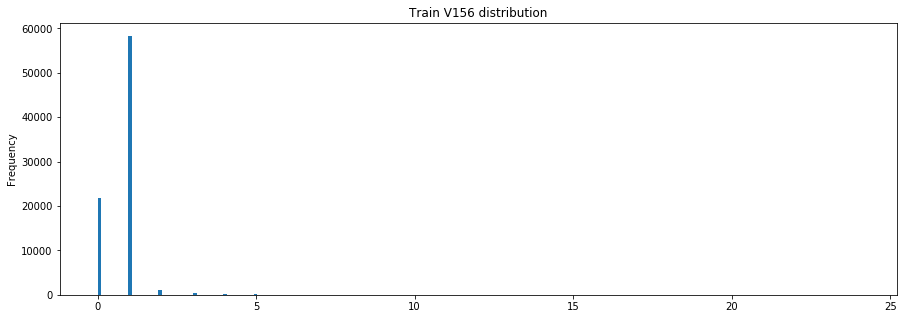

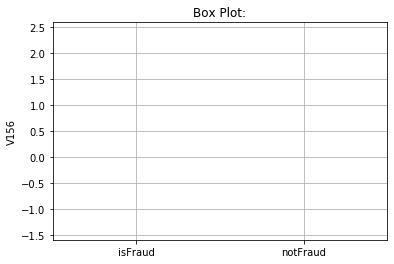

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V156
1     V149               0.976168
2     V155               0.953647
3     V148               0.931158
4     V154               0.929691
5     V158               0.925047
327    D10              -0.408720
328   V151              -0.420067
329    D15              -0.435689
330   V152              -0.459248
331     D6              -0.697302
--------------------------------------------------
Describing  V156  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.777485       1.604658          0.738923
std        0.647209       2.027660          0.461958
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       2.000000          1.000000
max       24.0000

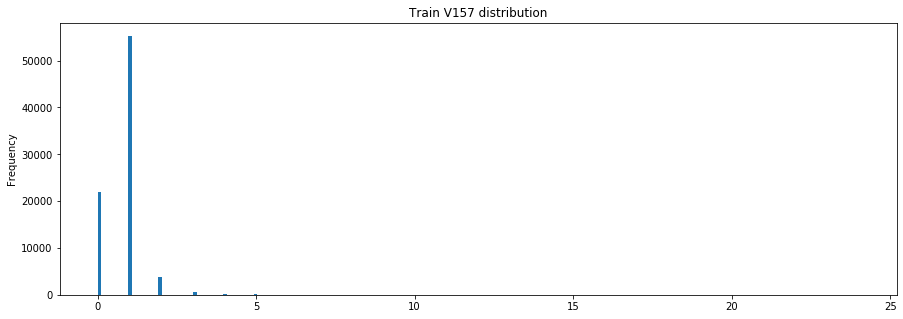

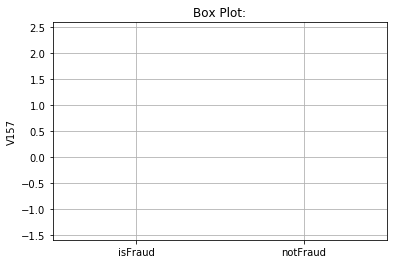

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V157
1     V158               0.954520
2     V155               0.924755
3     V148               0.916441
4     V153               0.890601
5     V156               0.881782
327    D10              -0.405144
328   V151              -0.419939
329    D15              -0.424942
330   V152              -0.459649
331     D6              -0.671289
--------------------------------------------------
Describing  V157  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.817573       1.559452          0.782987
std        0.682016       1.860259          0.546527
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       2.000000          1.000000
max       24.0000

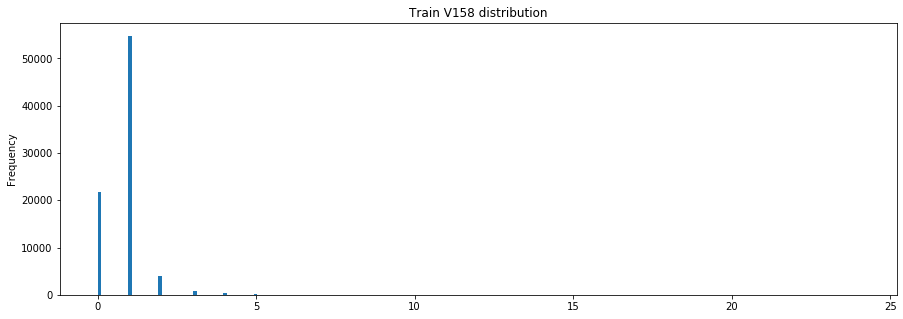

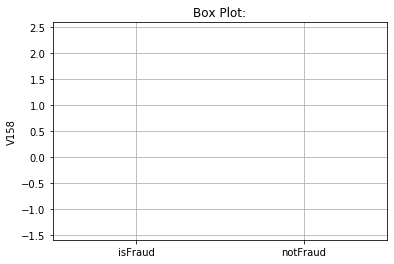

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V158
1     V157               0.954520
2     V156               0.925047
3     V149               0.918618
4     V155               0.883433
5     V148               0.876240
327    D10              -0.380922
328   V151              -0.397302
329    D15              -0.413500
330   V152              -0.434343
331     D6              -0.655533
--------------------------------------------------
Describing  V158  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       0.833461       1.779178          0.789374
std        0.734336       2.119609          0.557996
min        0.000000       0.000000          0.000000
25%        0.000000       1.000000          0.000000
50%        1.000000       1.000000          1.000000
75%        1.000000       2.000000          1.000000
max       24.0000

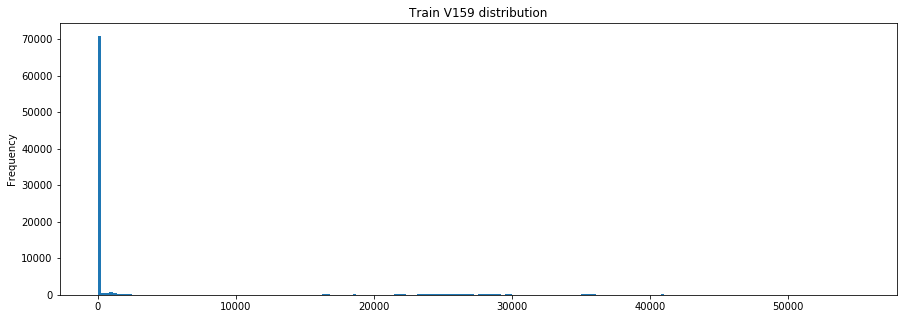

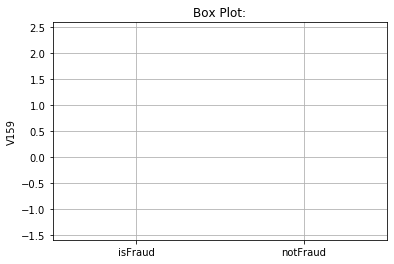

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V159
1     V150               0.968534
2     V151               0.962705
3     V144               0.938407
4     V145               0.917704
5     V160               0.868073
327    V92              -0.451243
328   V153              -0.459433
329    V71              -0.459696
330    V31              -0.487232
331    V50              -0.528047
--------------------------------------------------
Describing  V159  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean    2719.299775     294.728242       2832.353551
std     8355.445049    2687.570131       8511.473919
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max    55125.0000

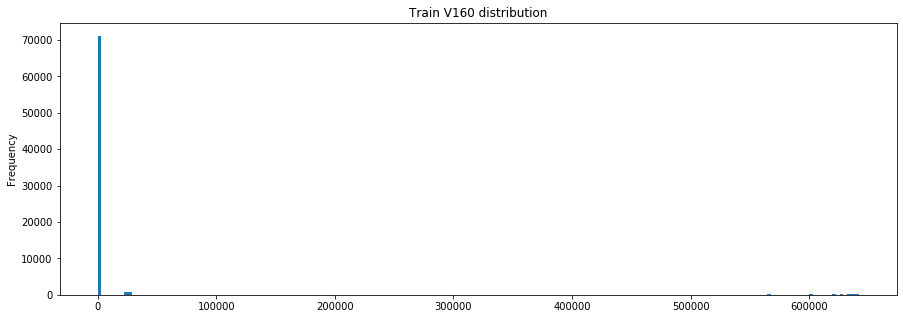

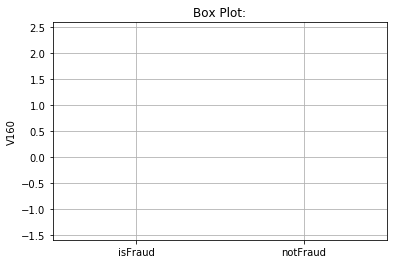

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V160
1     V145               0.961669
2     V150               0.942301
3     V151               0.910238
4     V144               0.893884
5     V152               0.890901
327   V154              -0.462485
328   V153              -0.472221
329    V71              -0.472643
330    V31              -0.501588
331    V50              -0.528673
--------------------------------------------------
Describing  V160  :
               Train  isFraud Train  isNotFraud Train
count   81951.000000    3651.000000      78300.000000
mean    47453.181173    6437.664702      49365.667132
std    142076.069162   52765.489660     144620.034216
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    64

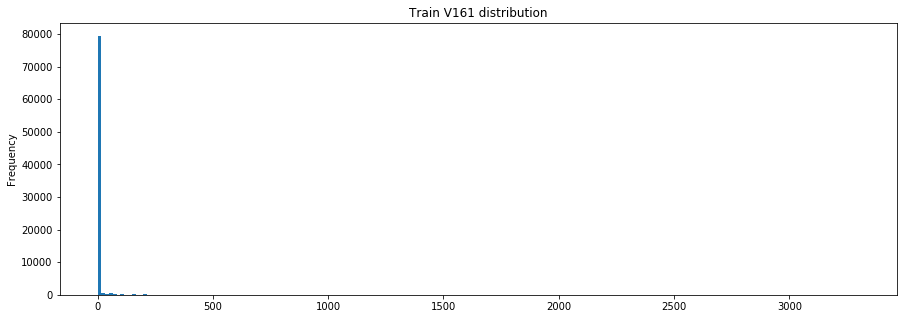

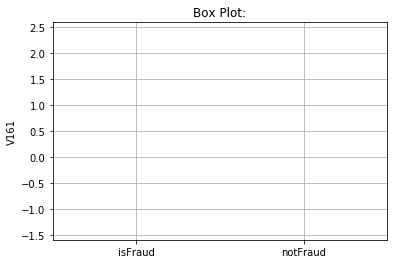

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V161
1     V163               0.949293
2     V162               0.890452
3     V138               0.579542
4     V270               0.560068
5     V208               0.560010
327    D10              -0.060909
328     D7              -0.064703
329     D6              -0.102092
330     D5              -0.112065
331     D2              -0.146085
--------------------------------------------------
Describing  V161  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       4.843938      15.708219          4.337461
std       58.929757      61.042699         58.780839
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max     3300.0000

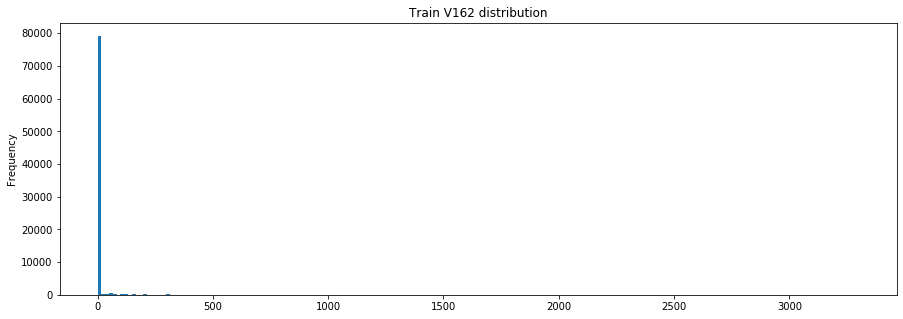

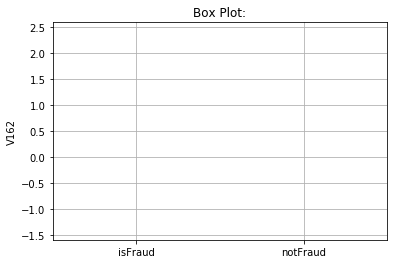

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V162
1     V163               0.953249
2     V161               0.890452
3     V272               0.543913
4     V141               0.543292
5     V271               0.541850
327     D3              -0.054199
328     D7              -0.069279
329     D6              -0.107874
330     D5              -0.110770
331     D2              -0.153522
--------------------------------------------------
Describing  V162  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       6.594661      23.676712          5.798320
std       69.195180      95.172398         67.637239
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max     3300.0000

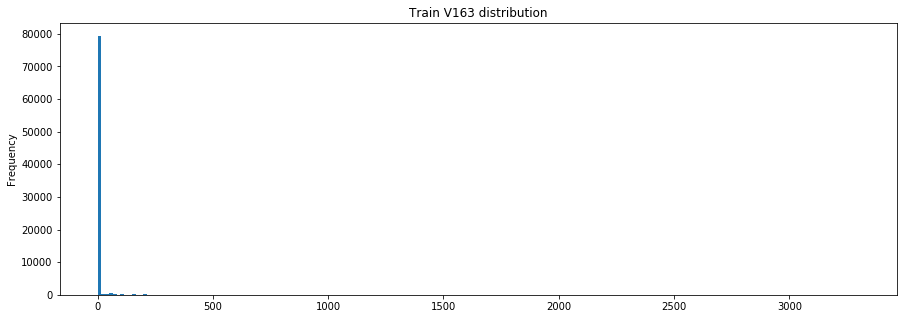

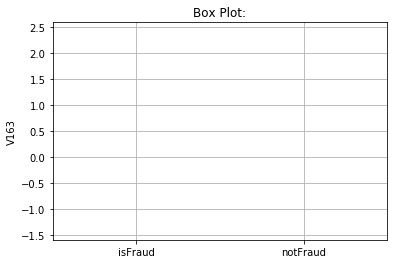

percentage of missing values: 86.12371727571376
--------------------------------------------------
Correlations: 
    Column  Correlation with V163
1     V162               0.953249
2     V161               0.949293
3     V272               0.577329
4     V138               0.560321
5     V271               0.554561
327     D3              -0.050976
328     D7              -0.059567
329     D6              -0.094489
330     D5              -0.116756
331     D2              -0.143170
--------------------------------------------------
Describing  V163  :
              Train  isFraud Train  isNotFraud Train
count  81945.000000    3650.000000      78295.000000
mean       5.505955      19.100000          4.872220
std       63.077887      75.358863         62.374807
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max     3300.0000

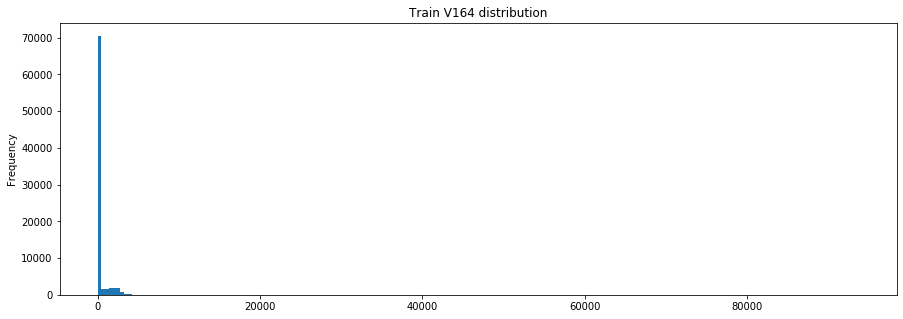

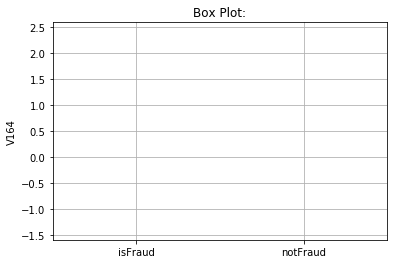

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V164
1     V143               0.996551
2     V316               0.992584
3     V132               0.992538
4     V101               0.991996
5     V293               0.991811
327    V50              -0.288600
328    V20              -0.341715
329    V19              -0.344706
330    V62              -0.381638
331    V61              -0.385569
--------------------------------------------------
Describing  V164  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean     877.888928     109.053670        913.738450
std     6049.166505     306.245568       6185.908288
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000     100.000000          0.000000
max    93736.0000

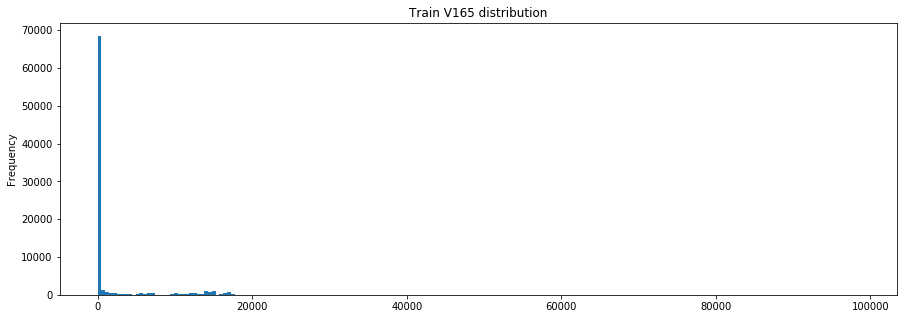

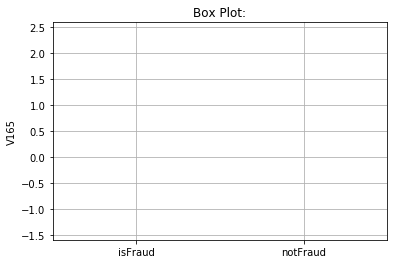

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V165
1     V143               0.879189
2     V134               0.876268
3     V318               0.876134
4     V103               0.875835
5     V295               0.875552
327    V19              -0.369173
328   V153              -0.374992
329    V62              -0.419944
330    V61              -0.423984
331    V50              -0.520130
--------------------------------------------------
Describing  V165  :
              Train  isFraud Train  isNotFraud Train
count  81951.000000    3651.000000      78300.000000
mean    2239.912219     282.564747       2331.180107
std     8223.258928    1410.663630       8396.153254
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000     150.000000          0.000000
max    98476.0000

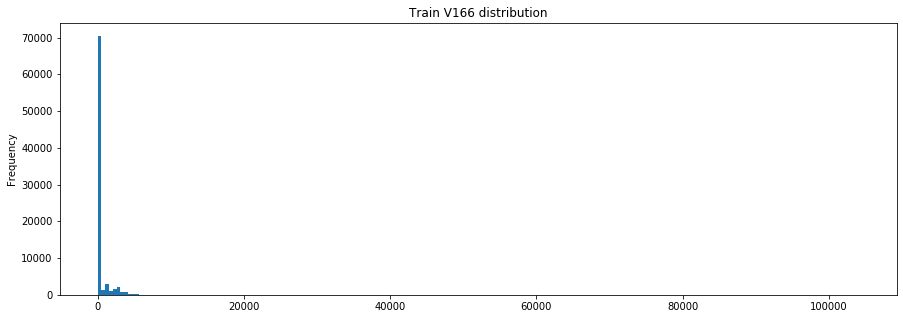

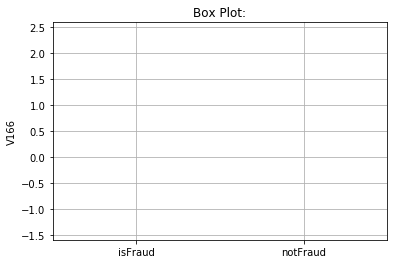

percentage of missing values: 86.12270125647713
--------------------------------------------------
Correlations: 
    Column  Correlation with V166
1     V144               0.718336
2     V145               0.676667
3     V150               0.673791
4     V159               0.656757
5     V151               0.654035
327   V155              -0.298567
328   V148              -0.311402
329   V154              -0.335570
330   V153              -0.344980
331    V50              -0.388742
--------------------------------------------------
Describing  V166  :
               Train  isFraud Train  isNotFraud Train
count   81951.000000    3651.000000      78300.000000
mean      359.469437     189.828217        367.379528
std      1244.463270     536.808466       1267.306208
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000     175.000000          0.000000
max    10

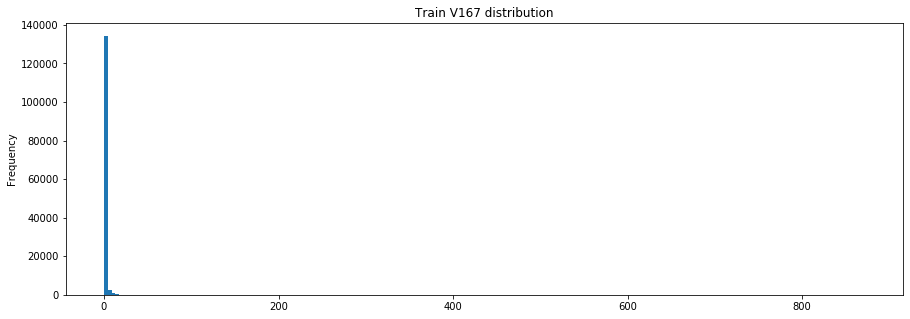

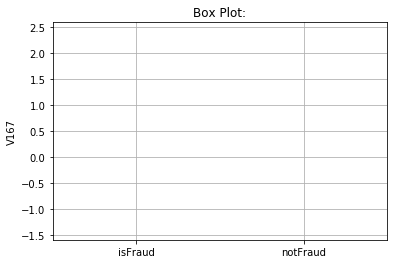

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V167
1     V177               0.999364
2     V211               0.997784
3     V322               0.992216
4     V293               0.992068
5     V101               0.992058
342    V62              -0.245819
343    V57              -0.251551
344    V20              -0.297717
345    V61              -0.309162
346    V19              -0.337598
--------------------------------------------------
Describing  V167  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        3.929514       2.078177          4.088443
std        42.200980       4.182894         43.954364
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       2.000000          0.000000
max      

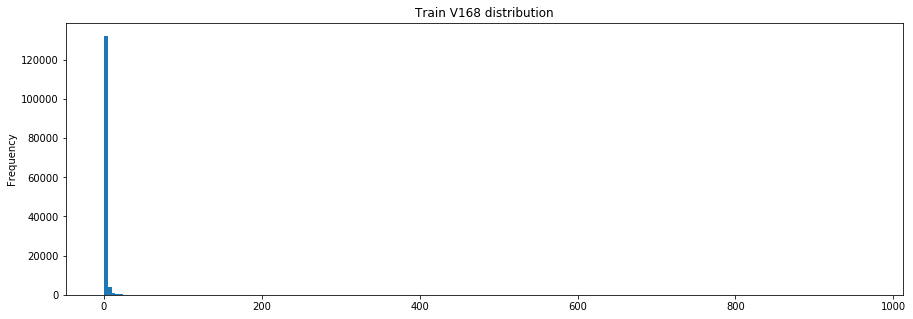

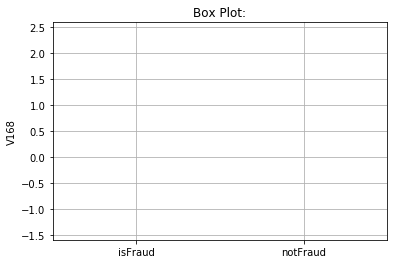

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V168
1     V213               0.995785
2     V179               0.995005
3     V178               0.989183
4     V212               0.982553
5     V204               0.980744
342    V62              -0.276054
343    V57              -0.284264
344    V20              -0.335038
345    V61              -0.347383
346    V19              -0.379959
--------------------------------------------------
Describing  V168  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        5.859501       2.904973          6.113133
std        54.032468       6.689211         56.262604
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         1.000000       3.000000          0.000000
max      

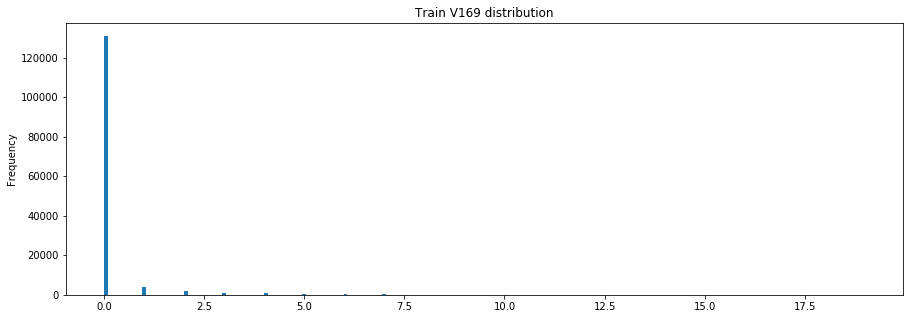

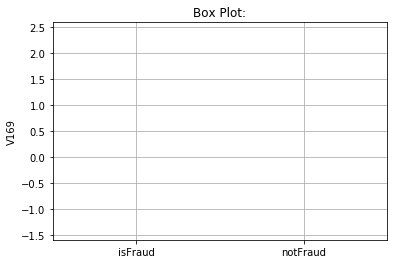

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V169
1     V220               0.602435
2     V174               0.550426
3     V138               0.534889
4     V170               0.513739
5     V281               0.510292
342     D8              -0.102154
343     D3              -0.121426
344     D7              -0.127107
345     D5              -0.140623
346     D2              -0.218452
--------------------------------------------------
Describing  V169  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.168053       0.378229          0.149982
std         0.904944       1.752748          0.788091
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

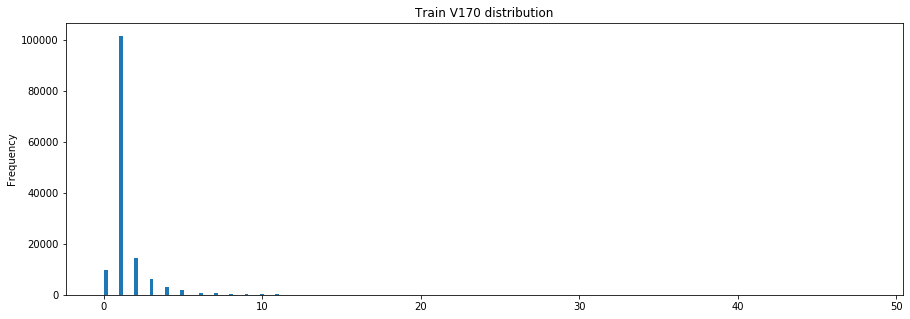

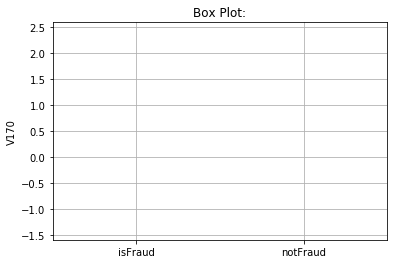

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V170
1     V200               0.812939
2     V201               0.769216
3     V171               0.767816
4     V188               0.657415
5     V139               0.621057
342     D7              -0.162967
343     D5              -0.184576
344    D13              -0.186188
345     D8              -0.192305
346     D2              -0.259621
--------------------------------------------------
Describing  V170  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        1.436779       2.928546          1.308515
std         1.751143       4.370712          1.216551
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       2.000000          1.000000
75%         1.000000       3.000000          1.000000
max      

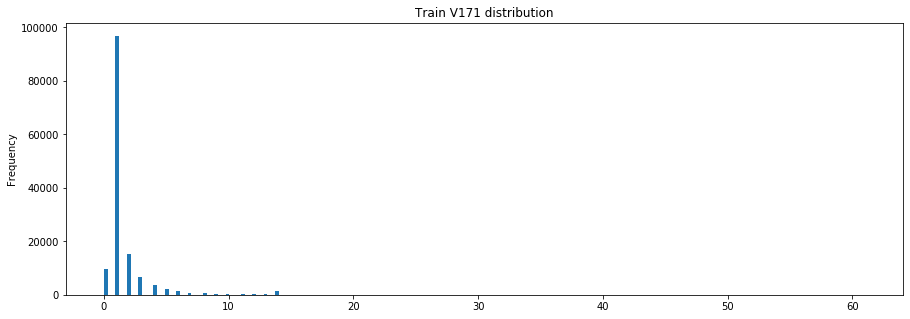

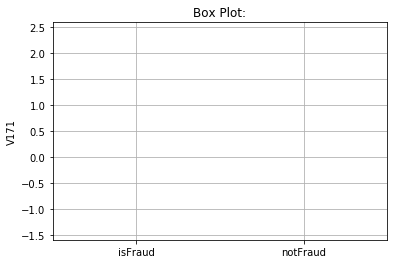

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V171
1     V328               0.776599
2     V330               0.776004
3     V170               0.767816
4     V329               0.746572
5     V324               0.693042
342     D5              -0.191003
343     D7              -0.194041
344     D8              -0.206093
345    V19              -0.208211
346     D2              -0.234331
--------------------------------------------------
Describing  V171  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        1.690908       3.496025          1.535701
std         2.444748       5.267626          1.949572
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       2.000000          1.000000
75%         1.000000       4.000000          1.000000
max      

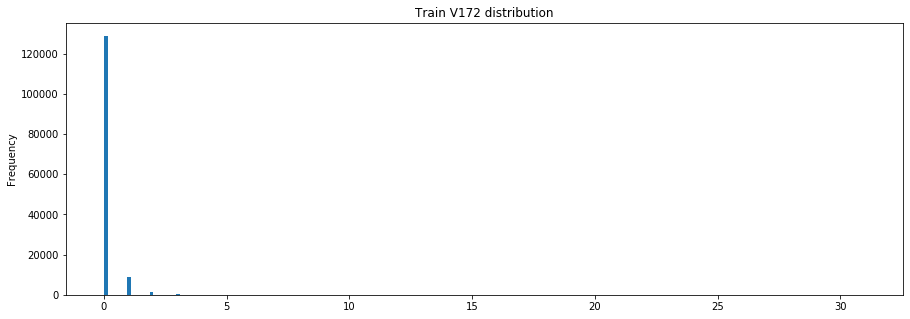

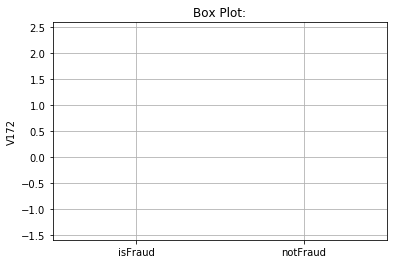

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V172
1     V196               0.894849
2     V207               0.877538
3     V191               0.862669
4     V186               0.826796
5     V193               0.795747
342   V195              -0.130846
343     D3              -0.144956
344     D2              -0.152250
345   V197              -0.152805
346   V194              -0.170993
--------------------------------------------------
Describing  V172  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        0.132012       0.090226          0.135599
std         0.924894       0.547949          0.950226
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

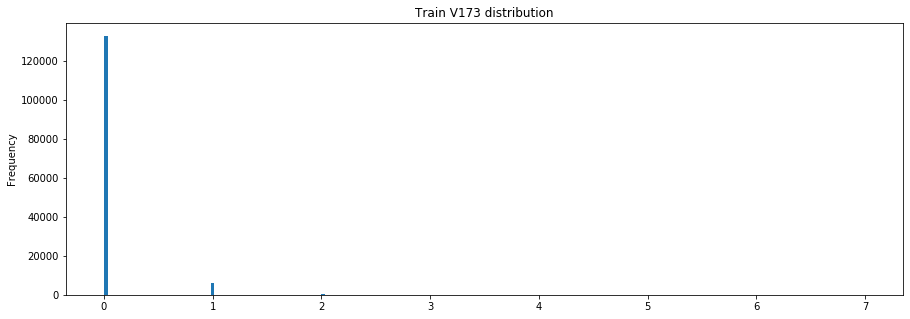

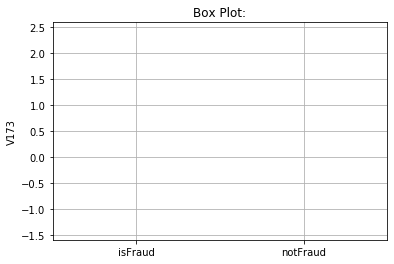

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V173
1     V286               0.755792
2     V223               0.675904
3     V284               0.539057
4     V174               0.497246
5     V172               0.484998
342     D8              -0.067997
343     D7              -0.142683
344     D3              -0.151036
345     D5              -0.160857
346     D2              -0.222529
--------------------------------------------------
Describing  V173  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        0.055231       0.035963          0.056885
std         0.264439       0.197997          0.269317
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

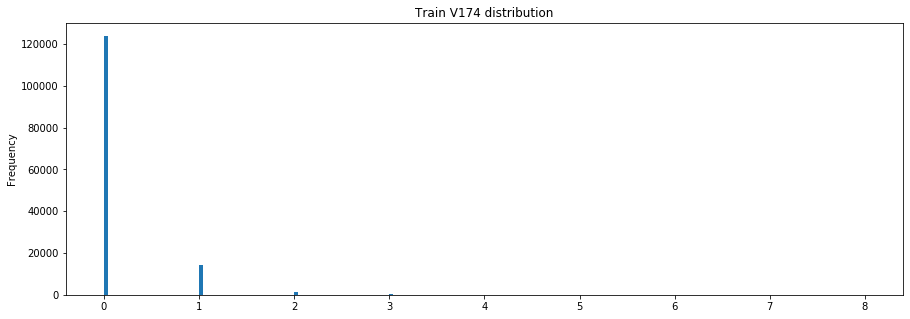

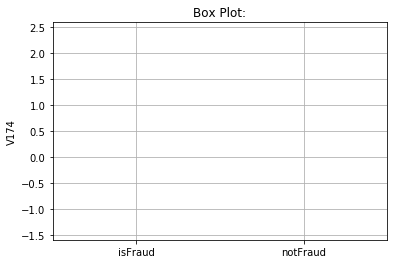

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V174
1     V175               0.688603
2     V288               0.574345
3     V169               0.550426
4     V223               0.540546
5     V325               0.518946
342     D8              -0.187255
343     D5              -0.227062
344     D7              -0.228199
345     D3              -0.237316
346     D2              -0.335111
--------------------------------------------------
Describing  V174  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000    11070.00000     128749.000000
mean        0.127794        0.14878          0.125989
std         0.379763        0.39852          0.378054
min         0.000000        0.00000          0.000000
25%         0.000000        0.00000          0.000000
50%         0.000000        0.00000          0.000000
75%         0.000000        0.00000          0.000000
max      

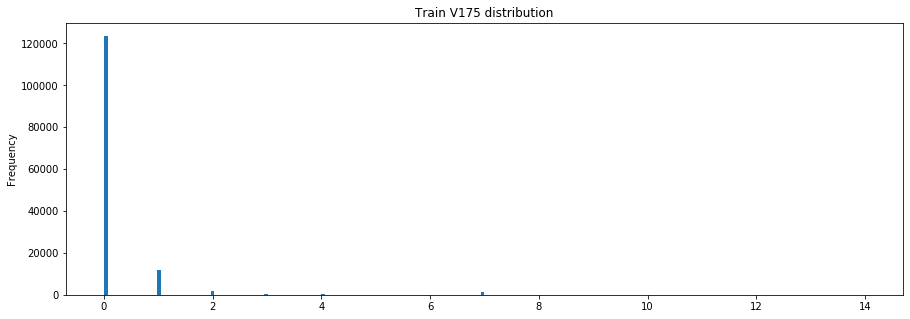

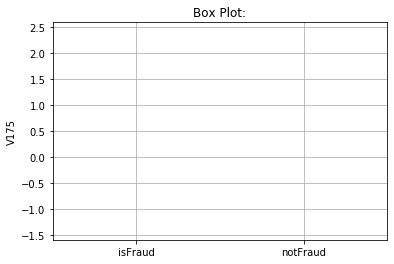

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V175
1     V327               0.820492
2     V330               0.799016
3     V329               0.795233
4     V326               0.776274
5     V287               0.764402
342    V15              -0.276069
343    V33              -0.279462
344    V61              -0.347248
345    V20              -0.367299
346    V19              -0.416119
--------------------------------------------------
Describing  V175  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.212639       0.206143          0.213198
std         0.857133       0.717197          0.868112
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

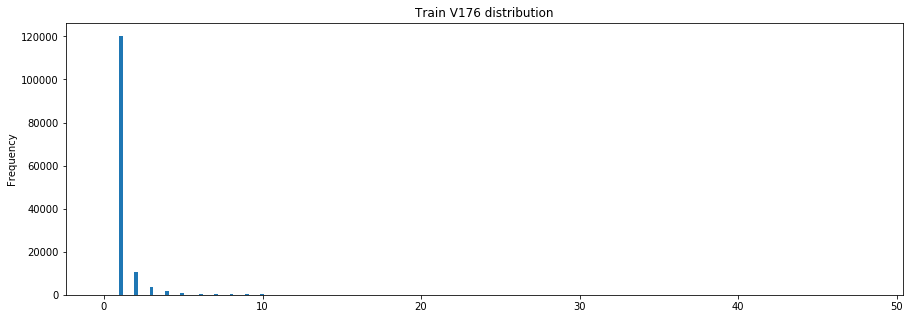

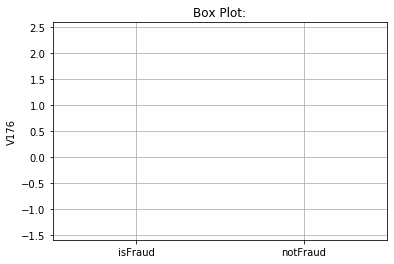

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V176
1     V190               0.907568
2     V228               0.886161
3     V199               0.855774
4     V186               0.844532
5     V230               0.728197
342    D10              -0.059180
343     D3              -0.078379
344     D7              -0.149703
345     D2              -0.152559
346     D5              -0.167771
--------------------------------------------------
Describing  V176  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.376979       2.403116          1.288890
std         1.829420       3.468886          1.582096
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

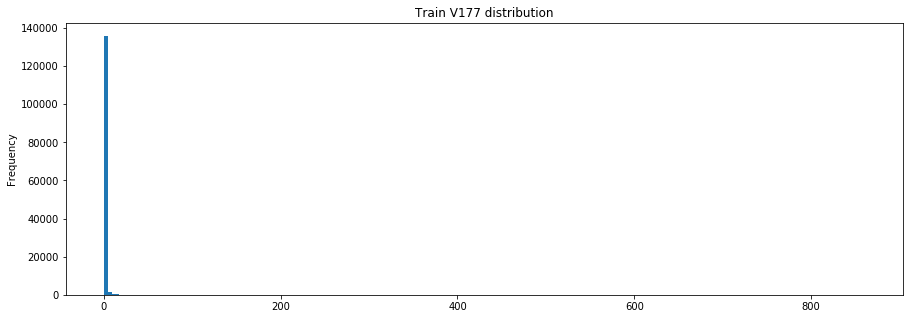

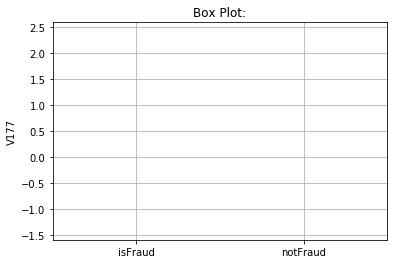

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V177
1     V167               0.999364
2     V211               0.998120
3     V293               0.992765
4     V101               0.992760
5     V132               0.992568
342    V62              -0.242777
343    V57              -0.248370
344    V20              -0.293846
345    V61              -0.305618
346    V19              -0.333222
--------------------------------------------------
Describing  V177  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        3.529245       1.595434          3.695253
std        41.310622       3.878491         43.028239
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       2.000000          0.000000
max      

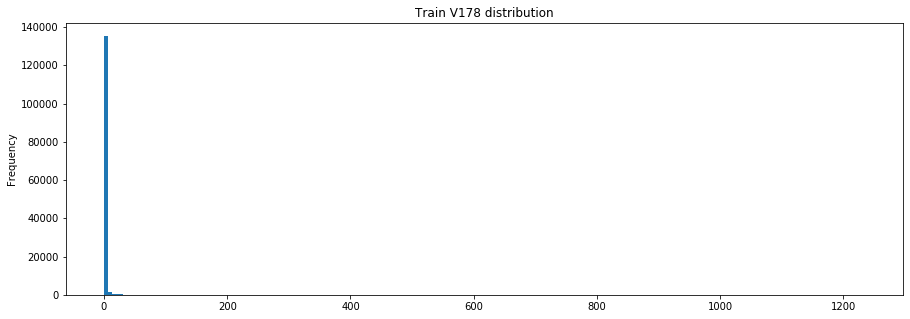

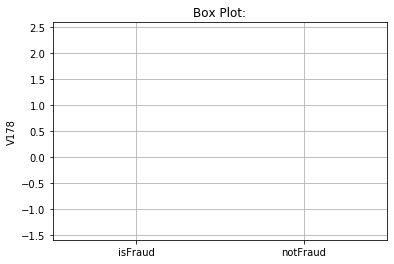

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V178
1     V179               0.992829
2     V213               0.992741
3     V133               0.989661
4     V102               0.989563
5     V168               0.989183
342    V62              -0.265615
343    V57              -0.272727
344    V20              -0.320757
345    V61              -0.334222
346    V19              -0.363915
--------------------------------------------------
Describing  V178  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        6.649283       2.728055          6.985901
std        69.447364       7.235370         72.325917
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       2.000000          0.000000
max      

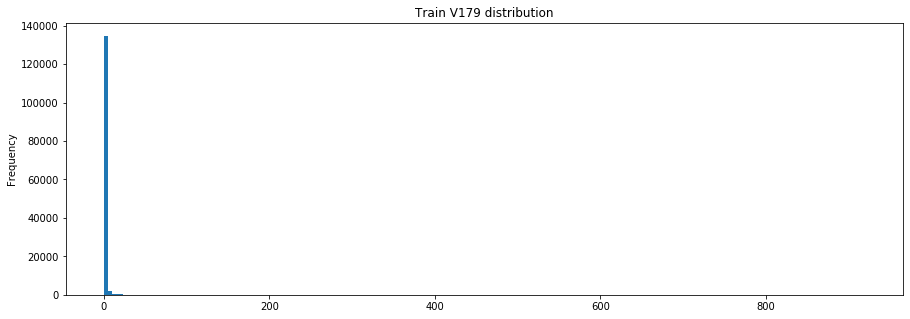

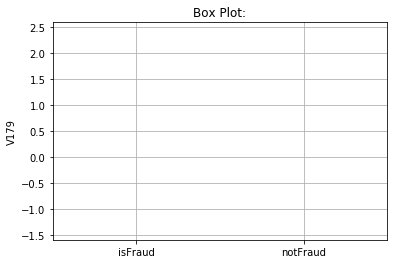

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V179
1     V213               0.996031
2     V168               0.995005
3     V178               0.992829
4     V134               0.988627
5     V103               0.988141
342    V62              -0.271558
343    V57              -0.278493
344    V20              -0.328730
345    V61              -0.341973
346    V19              -0.372836
--------------------------------------------------
Describing  V179  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        4.869012       2.128363          5.104283
std        50.489426       5.128527         52.583847
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       2.000000          0.000000
max      

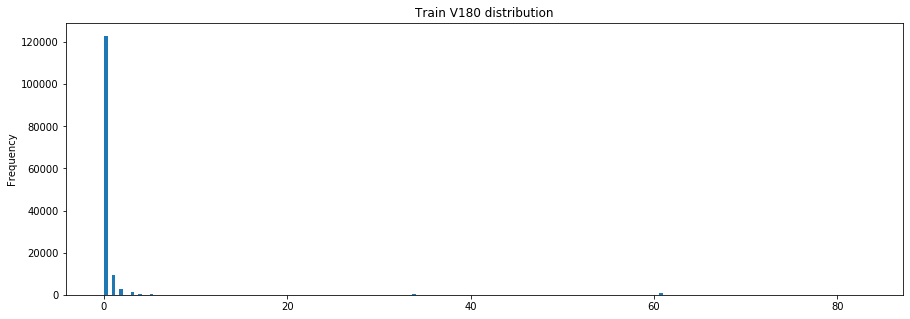

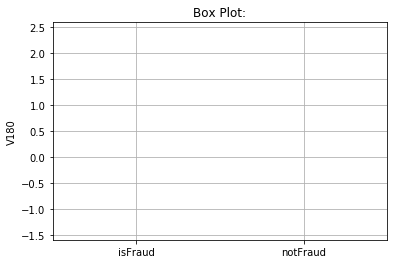

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V180
1     V182               0.990448
2     V183               0.924192
3     V203               0.914924
4     V236               0.894956
5     V237               0.894217
342    V33              -0.305915
343    V57              -0.312480
344    V20              -0.366732
345    V61              -0.373874
346    V19              -0.415780
--------------------------------------------------
Describing  V180  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.924123       0.729449          0.940862
std         6.112630       3.797911          6.271623
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

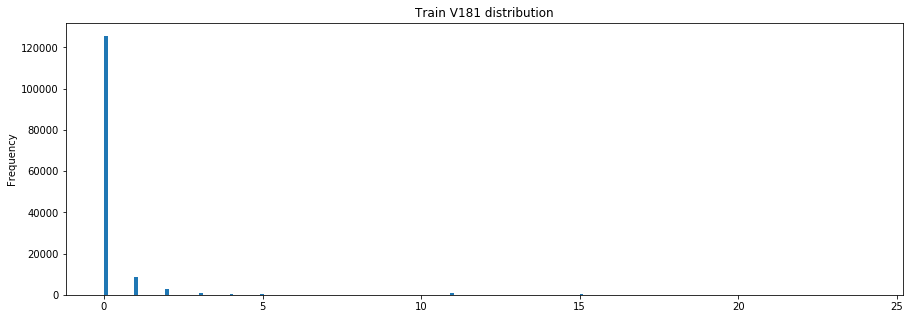

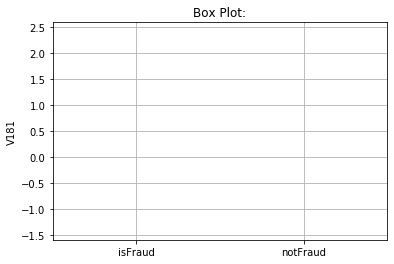

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V181
1     V235               0.946890
2     V183               0.916185
3     V328               0.912131
4     V104               0.889643
5     V297               0.886993
342    V33              -0.295739
343    V57              -0.303006
344    V20              -0.348415
345    V61              -0.364457
346    V19              -0.394632
--------------------------------------------------
Describing  V181  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        0.253332       0.374128          0.242962
std         1.248974       1.241782          1.249050
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

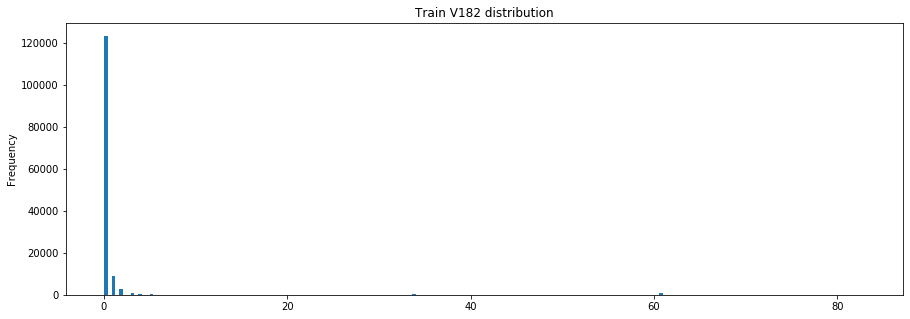

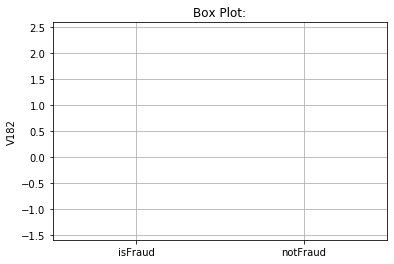

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V182
1     V180               0.990448
2     V183               0.947036
3     V203               0.918220
4     V237               0.914108
5     V204               0.913928
342    V33              -0.304310
343    V57              -0.312529
344    V20              -0.366313
345    V61              -0.376543
346    V19              -0.415210
--------------------------------------------------
Describing  V182  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        0.856243       0.656400          0.873398
std         5.792934       2.961885          5.973453
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

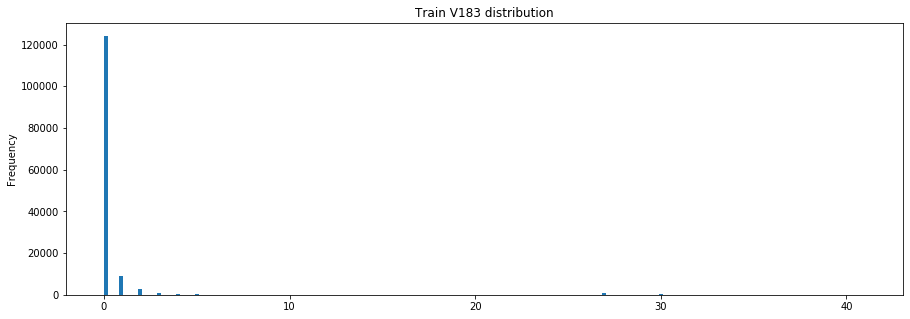

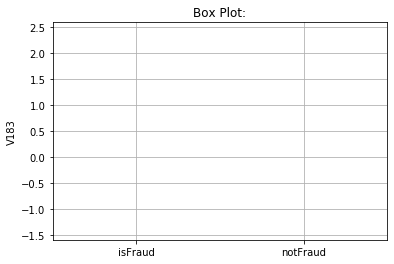

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V183
1     V182               0.947036
2     V237               0.945907
3     V180               0.924192
4     V330               0.920676
5     V181               0.916185
342    V62              -0.308419
343    V57              -0.318279
344    V20              -0.370086
345    V61              -0.383887
346    V19              -0.419397
--------------------------------------------------
Describing  V183  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        0.484692       0.478123          0.485256
std         2.946982       1.603992          3.034699
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

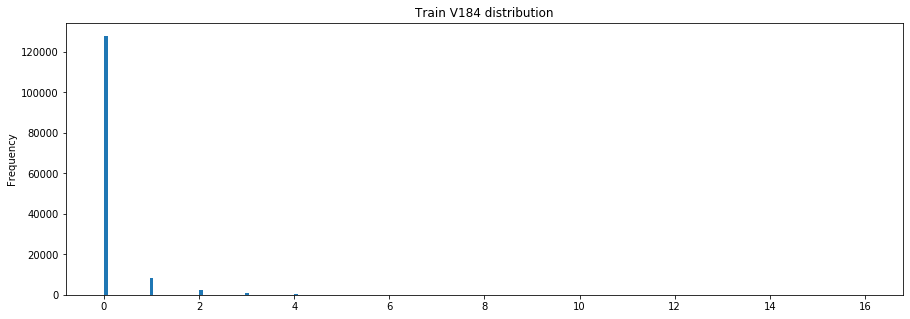

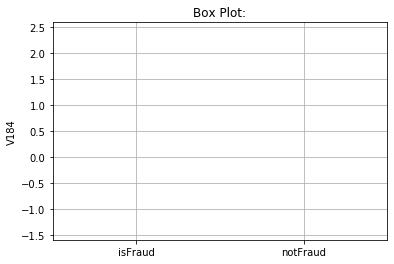

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V184
1     V185               0.820196
2     V146               0.748912
3     V238               0.744011
4     V239               0.710068
5     V147               0.705138
342    D13              -0.053101
343     D3              -0.081395
344     D8              -0.104465
345     D7              -0.125043
346     D5              -0.132797
--------------------------------------------------
Describing  V184  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.132364       0.357453          0.113011
std         0.543699       1.007989          0.478478
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

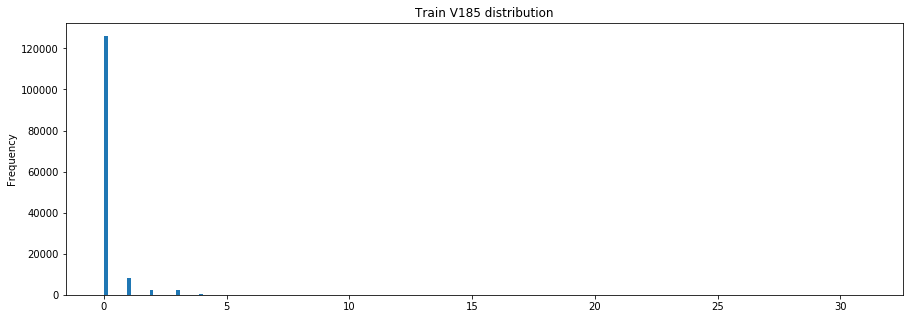

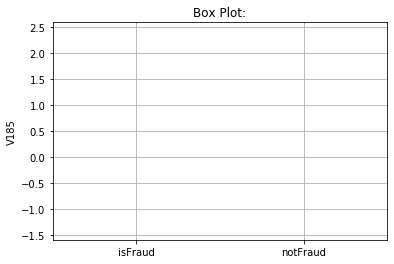

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V185
1     V184               0.820196
2     V181               0.690330
3     V147               0.663533
4     V235               0.663158
5     V239               0.656210
342    V57              -0.226867
343    V33              -0.228887
344    V20              -0.246433
345    V61              -0.265026
346    V19              -0.278261
--------------------------------------------------
Describing  V185  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.173903       0.434598          0.151489
std         0.699733       1.473350          0.582022
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

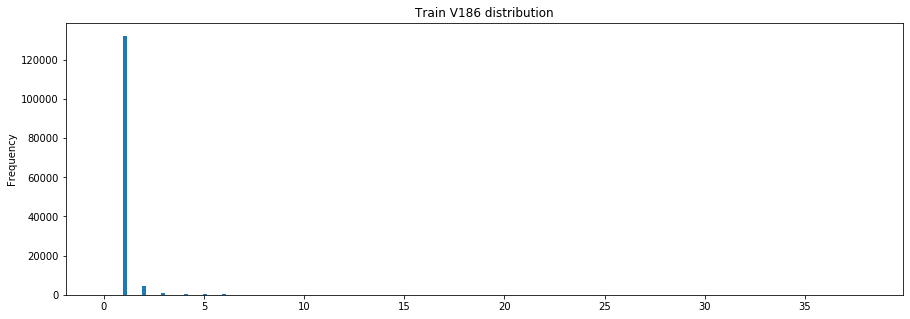

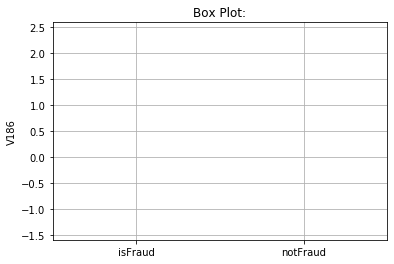

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V186
1     V190               0.929558
2     V196               0.905683
3     V191               0.892845
4     V199               0.882910
5     V176               0.844532
342    V21              -0.036145
343   V197              -0.043113
344   V194              -0.066608
345     D7              -0.070030
346     D5              -0.082642
--------------------------------------------------
Describing  V186  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.148799       1.770631          1.095418
std         1.223529       1.879338          1.134161
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

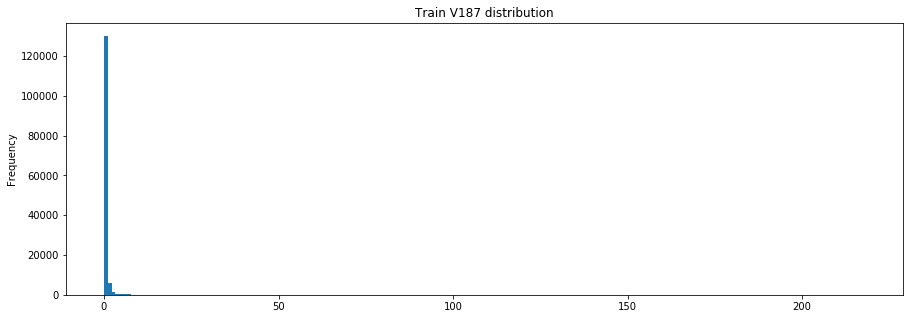

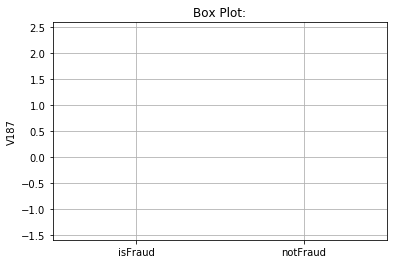

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V187
1     V192               0.960413
2     V193               0.933544
3     V207               0.824993
4     V191               0.823915
5     V196               0.802782
342   V251              -0.108820
343   V250              -0.112653
344   V195              -0.128721
345   V197              -0.181801
346   V194              -0.207761
--------------------------------------------------
Describing  V187  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.843752       2.661111          1.773586
std         9.884390       9.536890          9.910548
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

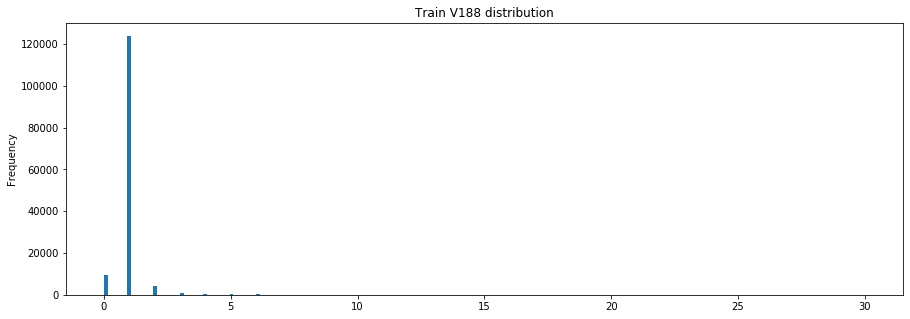

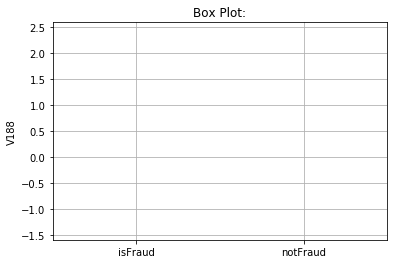

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V188
1     V189               0.899481
2     V200               0.784486
3     V201               0.740297
4     V170               0.657415
5     V244               0.655513
342     D1              -0.133756
343     D6              -0.135053
344     D8              -0.172655
345     D2              -0.258807
346    D13              -0.283609
--------------------------------------------------
Describing  V188  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        1.014755       1.709666          0.955005
std         0.671207       1.976803          0.328935
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

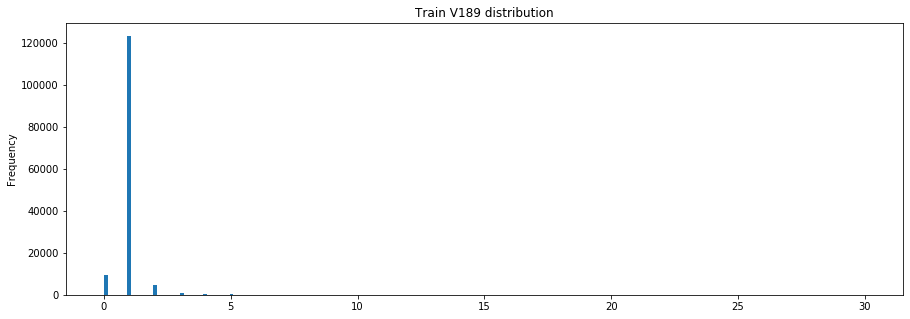

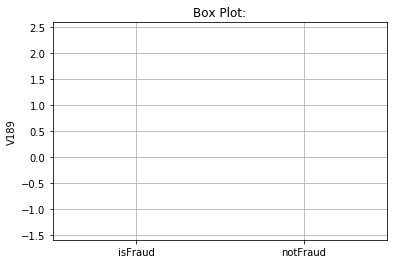

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V189
1     V188               0.899481
2     V201               0.801707
3     V200               0.714006
4     V244               0.664891
5     V242               0.645411
342    D15              -0.124321
343     D6              -0.127998
344     D8              -0.161009
345     D2              -0.234049
346    D13              -0.266747
--------------------------------------------------
Describing  V189  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        1.038314       1.871364          0.966687
std         0.792528       2.237640          0.432240
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

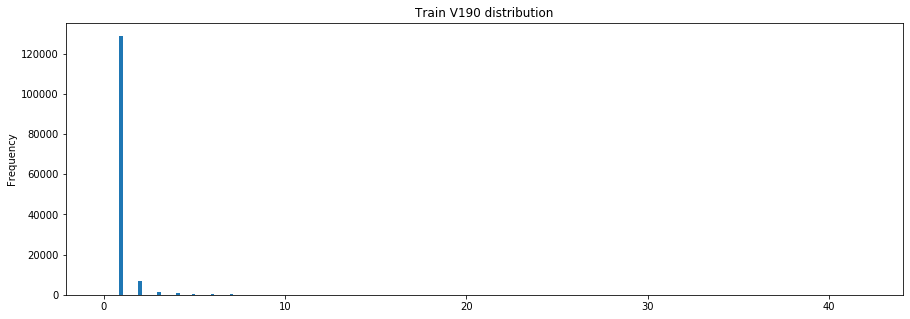

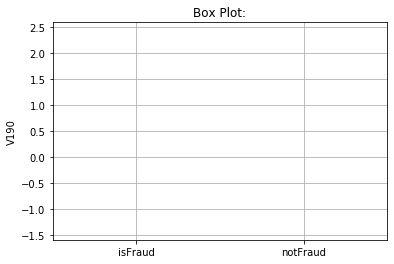

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V190
1     V199               0.955218
2     V186               0.929558
3     V176               0.907568
4     V246               0.886028
5     V196               0.792233
342   V152              -0.037140
343   V194              -0.038709
344    D10              -0.039337
345     D7              -0.087771
346     D5              -0.100077
--------------------------------------------------
Describing  V190  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.213083       2.249570          1.124106
std         1.480318       3.070257          1.212505
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

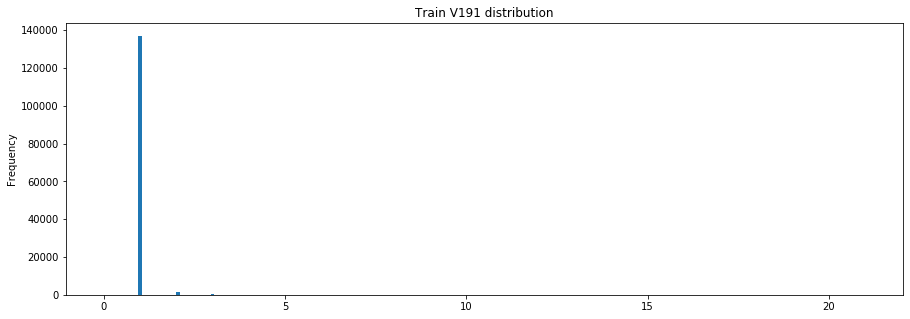

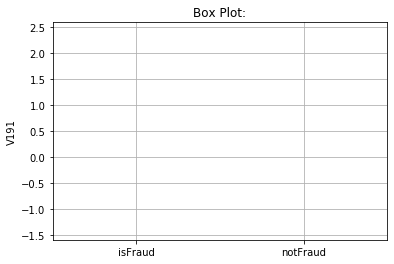

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V191
1     V196               0.970559
2     V193               0.918330
3     V186               0.892845
4     V207               0.886611
5     V172               0.862669
342   V197              -0.049011
343    V94              -0.049500
344    V63              -0.053944
345   V194              -0.062372
346    V21              -0.079426
--------------------------------------------------
Describing  V191  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.058984       1.186611          1.048028
std         0.677527       0.768301          0.668029
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

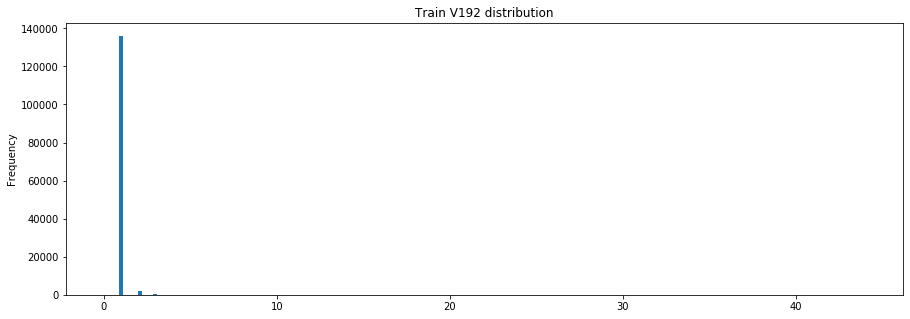

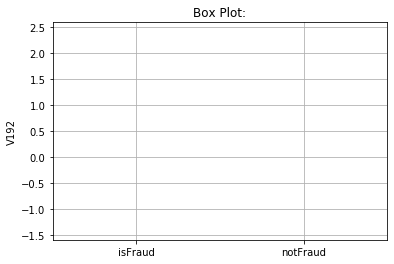

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V192
1     V187               0.960413
2     V193               0.957331
3     V191               0.830132
4     V207               0.785723
5     V196               0.784329
342   V251              -0.100002
343   V250              -0.105785
344    V21              -0.114699
345   V197              -0.174349
346   V194              -0.202425
--------------------------------------------------
Describing  V192  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.237361       1.402392          1.223194
std         2.635961       2.511878          2.645872
min         0.000000       1.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

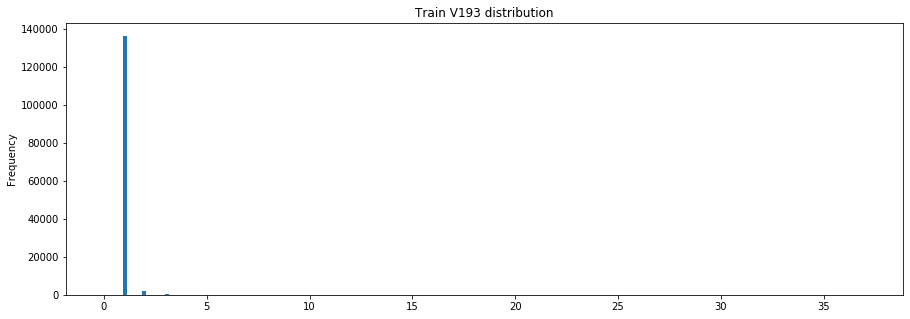

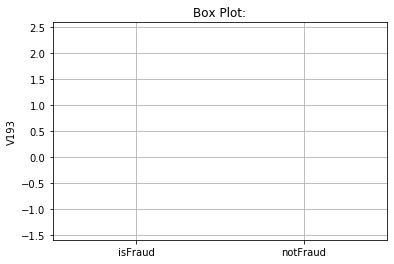

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V193
1     V192               0.957331
2     V187               0.933544
3     V191               0.918330
4     V207               0.887617
5     V196               0.886631
342   V251              -0.077981
343   V250              -0.083803
344    V21              -0.104211
345   V197              -0.146178
346   V194              -0.170346
--------------------------------------------------
Describing  V193  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.149845       1.279011          1.138757
std         1.714792       1.393129          1.739193
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

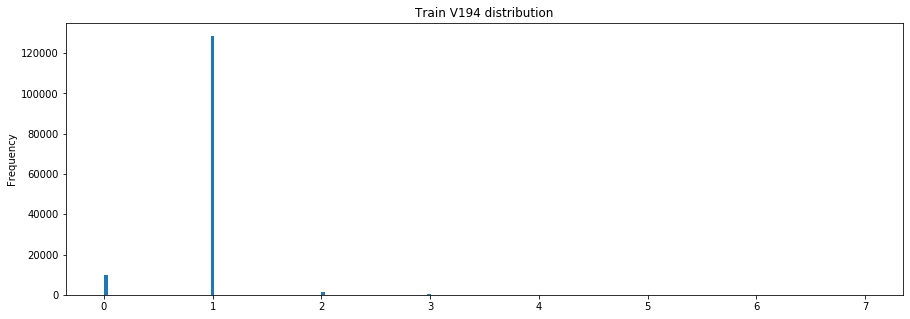

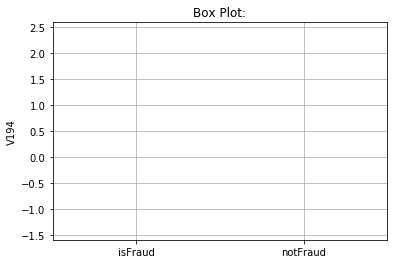

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V194
1     V197               0.911994
2     V195               0.850014
3     V198               0.674848
4     V188               0.523359
5     V189               0.475809
342     D1              -0.295450
343     D2              -0.304838
344     D6              -0.322513
345    D15              -0.336159
346    D13              -0.722523
--------------------------------------------------
Describing  V194  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.945773       1.098464          0.932644
std         0.304158       0.575392          0.264245
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

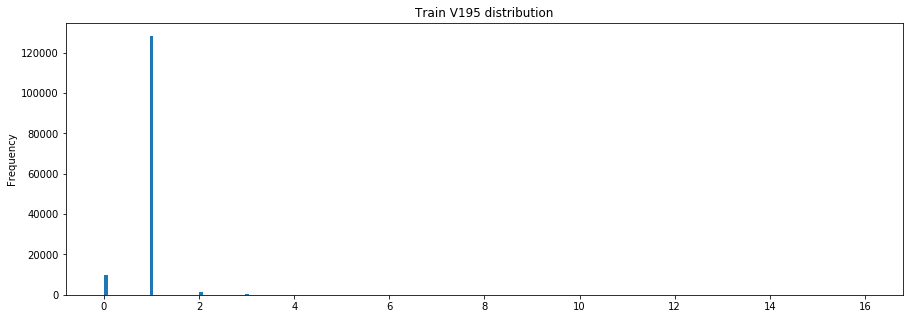

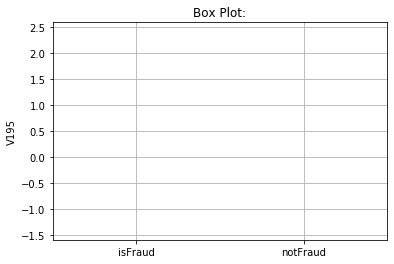

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V195
1     V198               0.911575
2     V194               0.850014
3     V197               0.801658
4     V189               0.600088
5     V247               0.495733
342    D12              -0.281923
343     D2              -0.289119
344     D6              -0.314214
345    D15              -0.323318
346    D13              -0.709209
--------------------------------------------------
Describing  V195  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.954227       1.142999          0.937996
std         0.376420       0.810015          0.306818
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

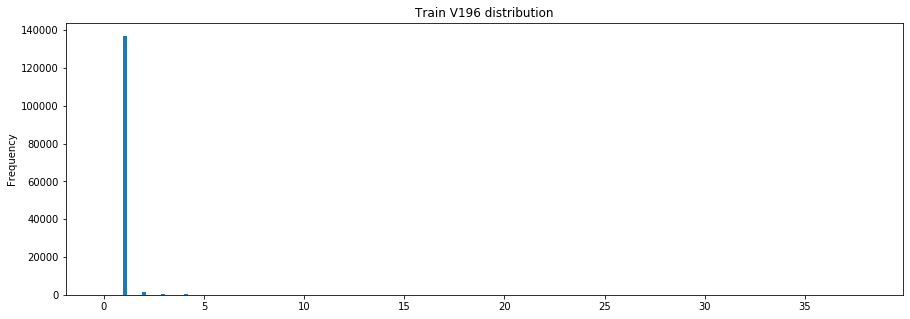

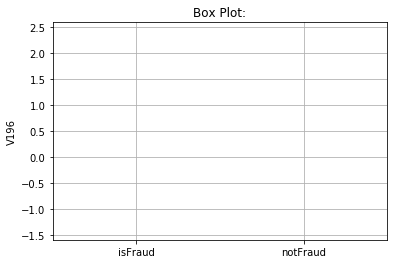

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V196
1     V191               0.970559
2     V207               0.906215
3     V186               0.905683
4     V172               0.894849
5     V193               0.886631
342    V84              -0.054451
343    V51              -0.058498
344    V94              -0.062936
345    V21              -0.080537
346   V194              -0.092150
--------------------------------------------------
Describing  V196  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.084580       1.229006          1.072182
std         1.105834       1.096746          1.105736
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

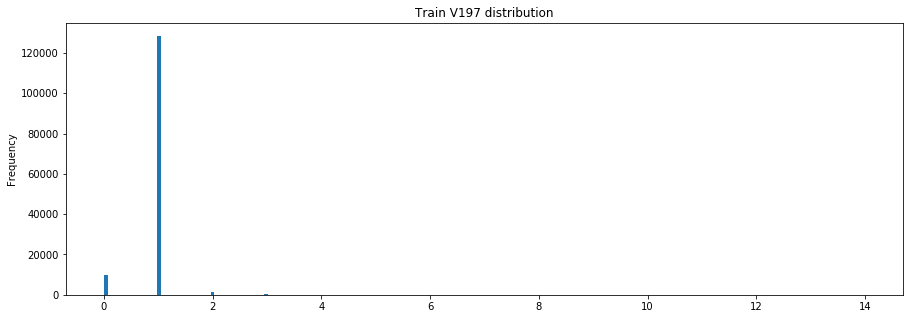

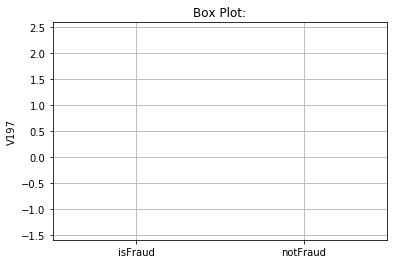

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V197
1     V194               0.911994
2     V195               0.801658
3     V198               0.765630
4     V188               0.493051
5     V189               0.469940
342     D2              -0.304558
343    D12              -0.310688
344     D6              -0.334315
345    D15              -0.345741
346    D13              -0.752441
--------------------------------------------------
Describing  V197  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.949385       1.126287          0.934174
std         0.336871       0.750550          0.268115
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

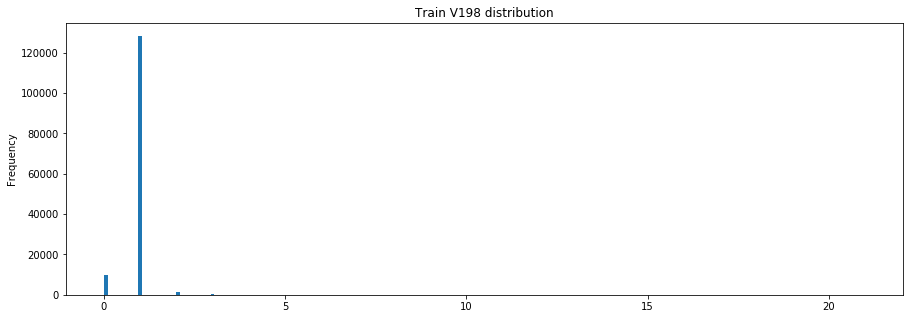

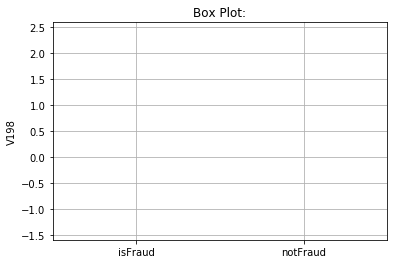

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V198
1     V195               0.911575
2     V197               0.765630
3     V194               0.674848
4     V189               0.596779
5     V252               0.522507
342     D4              -0.273202
343    D12              -0.292729
344     D6              -0.307488
345    D15              -0.308810
346    D13              -0.714801
--------------------------------------------------
Describing  V198  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        0.961951       1.197200          0.941724
std         0.493065       1.135603          0.384678
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

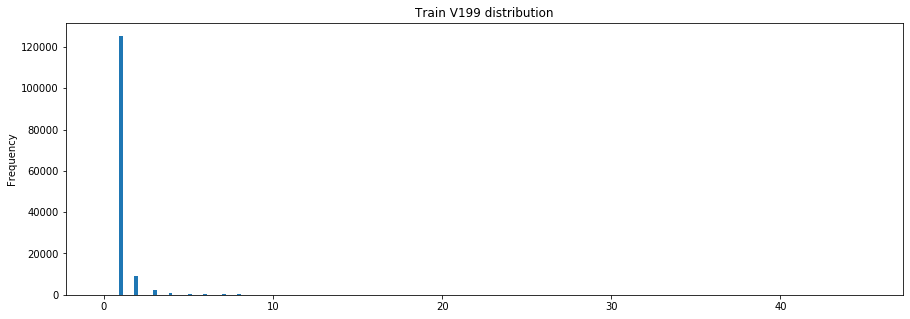

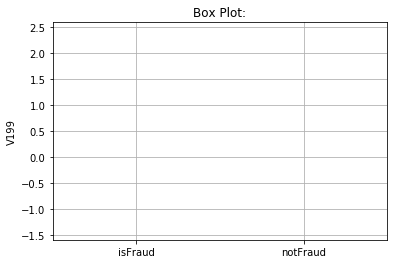

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V199
1     V190               0.955218
2     V186               0.882910
3     V257               0.871518
4     V176               0.855774
5     V246               0.806468
342   V151              -0.037430
343   V150              -0.037683
344   V152              -0.040393
345     D7              -0.094766
346     D5              -0.104544
--------------------------------------------------
Describing  V199  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        1.270749       2.589003          1.157584
std         1.671863       3.723457          1.297311
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       3.000000          1.000000
max      

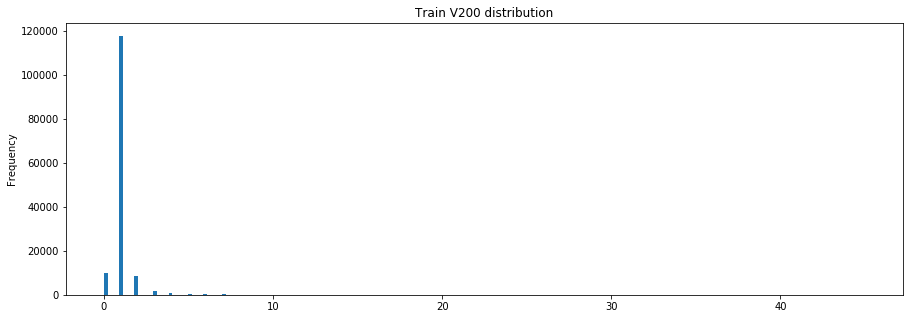

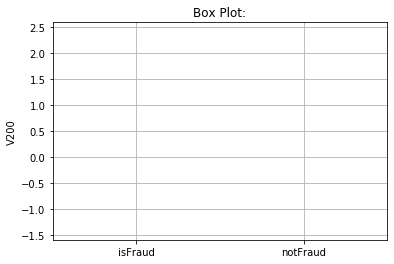

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V200
1     V201               0.941582
2     V170               0.812939
3     V188               0.784486
4     V257               0.747843
5     V189               0.714006
342     D5              -0.109209
343   V326              -0.112028
344     D8              -0.138613
345    D13              -0.200632
346     D2              -0.208963
--------------------------------------------------
Describing  V200  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        1.119977       2.483107          1.002773
std         1.253853       3.944418          0.442942
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       3.000000          1.000000
max      

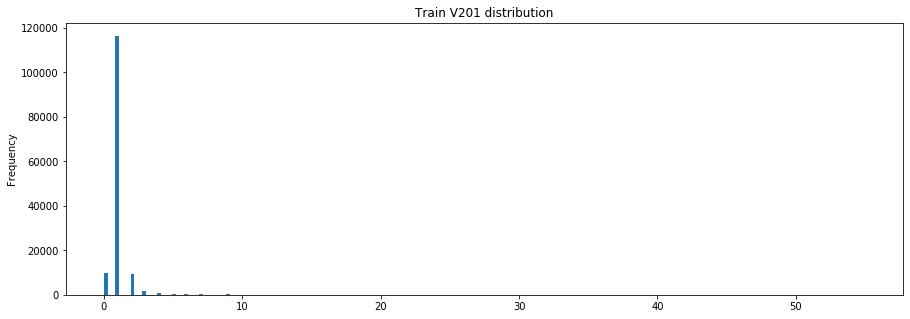

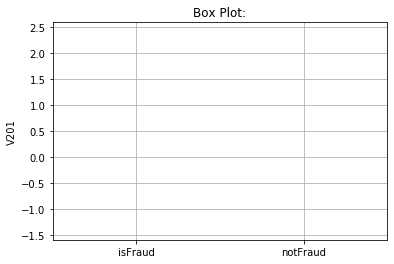

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V201
1     V200               0.941582
2     V189               0.801707
3     V170               0.769216
4     V188               0.740297
5     V257               0.732820
342     D7              -0.101232
343     D5              -0.113619
344     D8              -0.136310
345    D13              -0.190176
346     D2              -0.193545
--------------------------------------------------
Describing  V201  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        1.159106       2.745980          1.022664
std         1.418618       4.352642          0.567060
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       3.000000          1.000000
max      

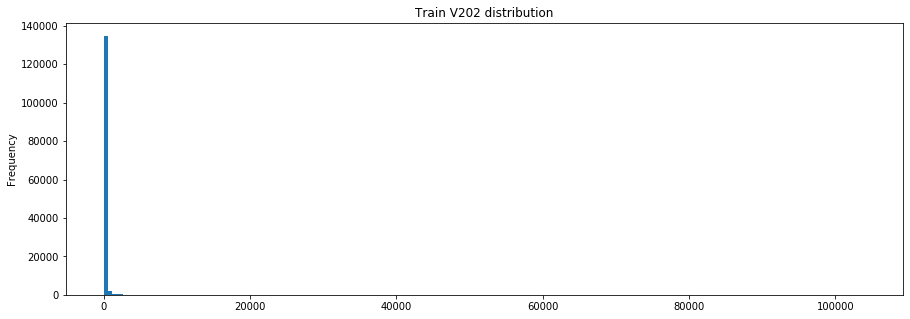

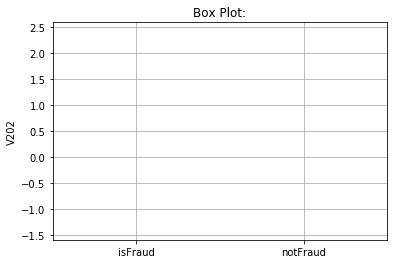

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V202
1     V211               0.990387
2     V167               0.988960
3     V306               0.988554
4     V177               0.987352
5     V331               0.986995
342    V62              -0.249742
343    V57              -0.256829
344    V20              -0.299549
345    V61              -0.311834
346    V19              -0.339708
--------------------------------------------------
Describing  V202  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean      444.147142     155.958232        468.886764
std      4683.828419     403.621902       4878.506934
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      21.388700          0.000000
75%         0.000000     150.000000          0.000000
max    10

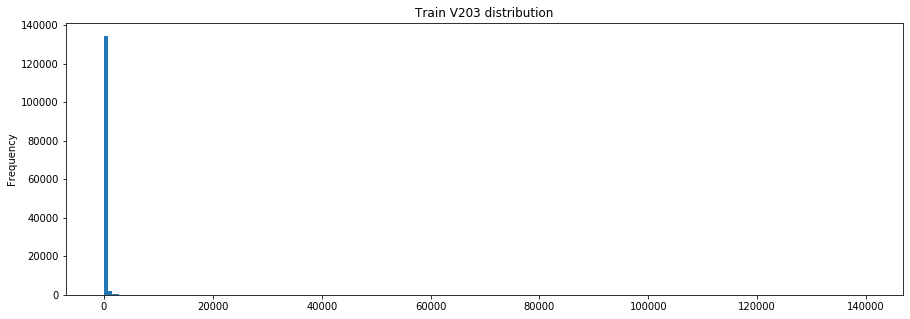

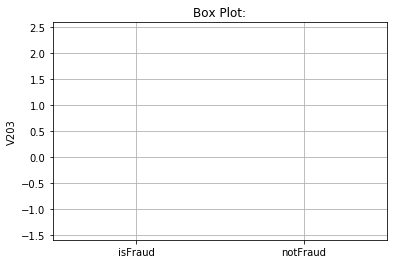

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V203
1     V204               0.964349
2     V212               0.958905
3     V168               0.920584
4     V182               0.918220
5     V265               0.917215
342    V33              -0.273447
343    V57              -0.283834
344    V20              -0.326722
345    V61              -0.337549
346    V19              -0.370490
--------------------------------------------------
Describing  V203  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean     1078.327538     458.577578       1131.530069
std      9105.607991    3581.819720       9428.292395
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      47.585400          0.000000
75%        30.924400     237.288399         19.757299
max    13

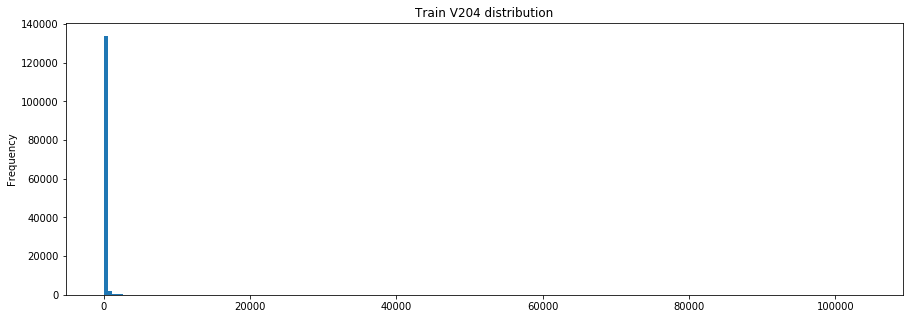

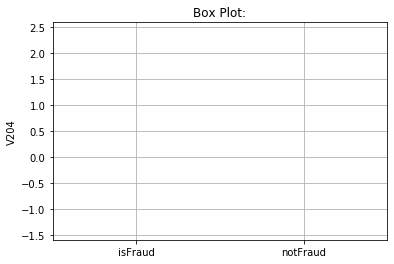

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V204
1     V212               0.981081
2     V168               0.980744
3     V213               0.977560
4     V203               0.964349
5     V178               0.963685
342    V33              -0.276771
343    V57              -0.287309
344    V20              -0.333474
345    V61              -0.345627
346    V19              -0.378164
--------------------------------------------------
Describing  V204  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean      686.956931     258.607617        723.728644
std      6048.980716    1227.476243       6291.648851
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      38.011600          0.000000
75%        20.000000     200.000000          0.000000
max    10

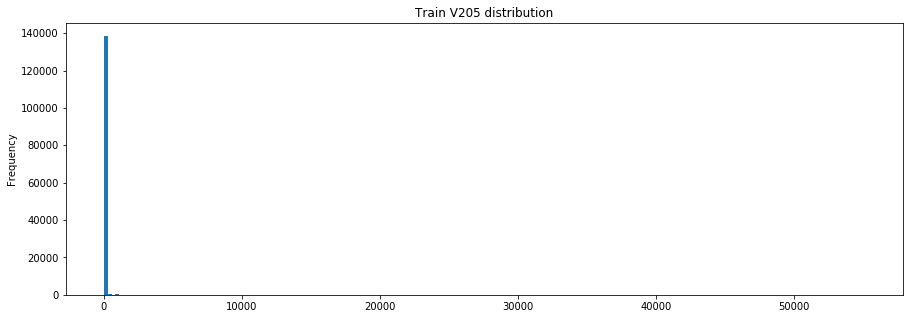

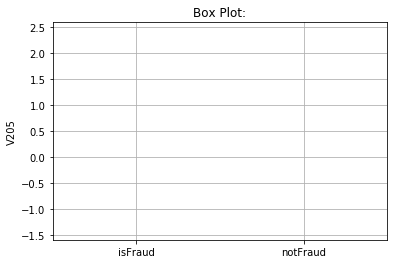

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V205
1     V266               0.982005
2     V269               0.979334
3     V268               0.832261
4     V207               0.763772
5     V206               0.762625
342   V251              -0.069662
343   V250              -0.070923
344   V195              -0.089148
345   V197              -0.099473
346   V194              -0.117935
--------------------------------------------------
Describing  V205  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean       18.060417       9.057890         18.833240
std       266.545451     116.047755        275.648287
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max     5

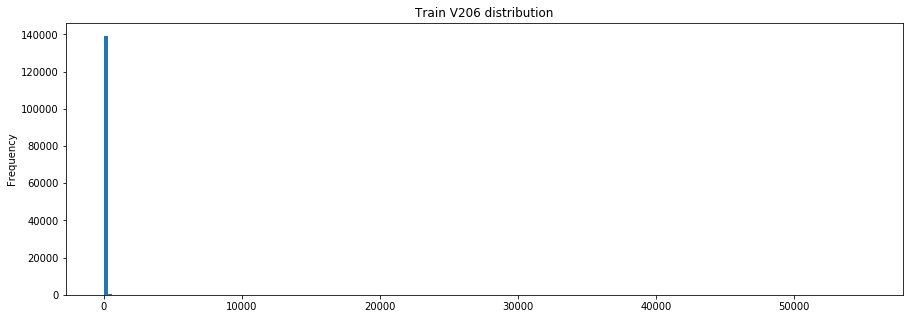

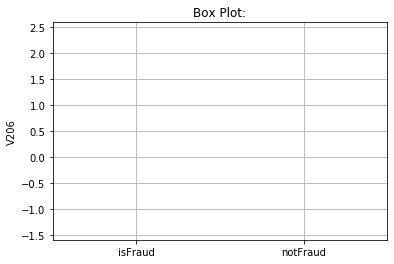

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V206
1     V311               0.973025
2     V266               0.956989
3     V129               0.956912
4     V269               0.955651
5     V309               0.946407
342    V94              -0.025797
343    D12              -0.027291
344    V51              -0.037189
345    V52              -0.037844
346     D5              -0.077938
--------------------------------------------------
Describing  V206  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean        6.189360       2.467472          6.508866
std       191.474014      25.255635        199.382949
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max     5

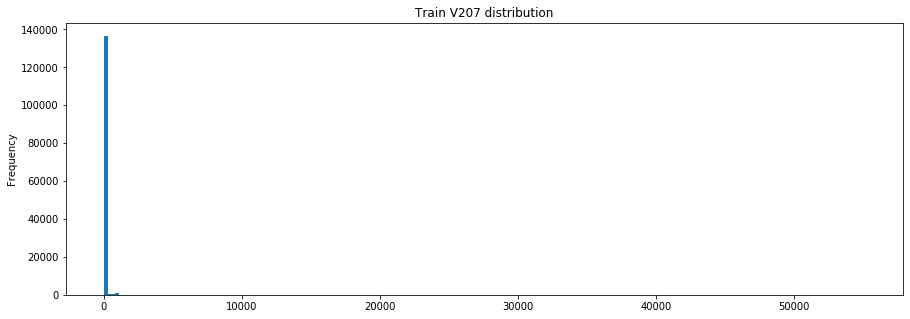

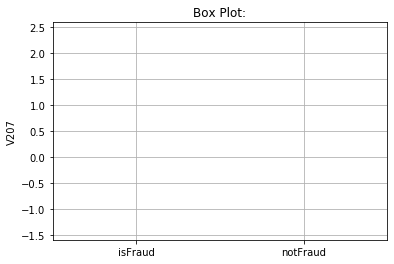

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V207
1     V266               0.931359
2     V269               0.928991
3     V196               0.906215
4     V193               0.887617
5     V191               0.886611
342   V195              -0.135583
343    V33              -0.136788
344    V19              -0.137971
345   V197              -0.160503
346   V194              -0.181519
--------------------------------------------------
Describing  V207  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean       72.284098      33.052247         75.651962
std       925.676660     476.216252        954.372372
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max     5

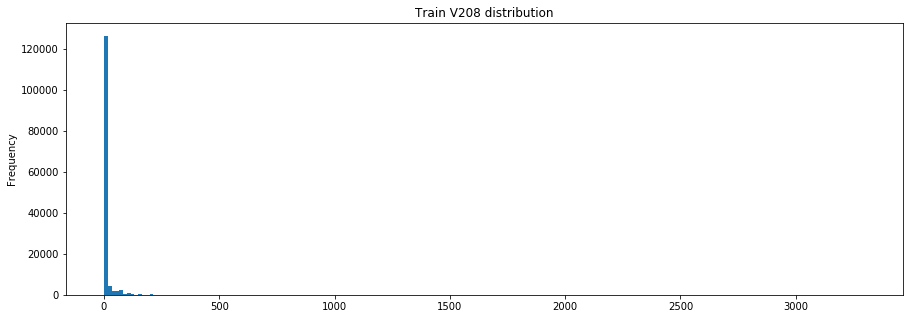

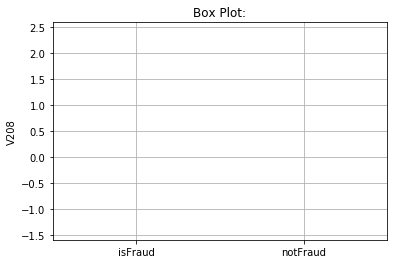

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V208
1     V210               0.778370
2     V270               0.683549
3     V272               0.661664
4     V271               0.637773
5     V161               0.560010
342    V15              -0.122283
343    V33              -0.123543
344     D3              -0.124624
345     D7              -0.134256
346     D2              -0.143190
--------------------------------------------------
Describing  V208  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean        8.888193      10.730773          8.729766
std        59.047125      46.177884         60.022465
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

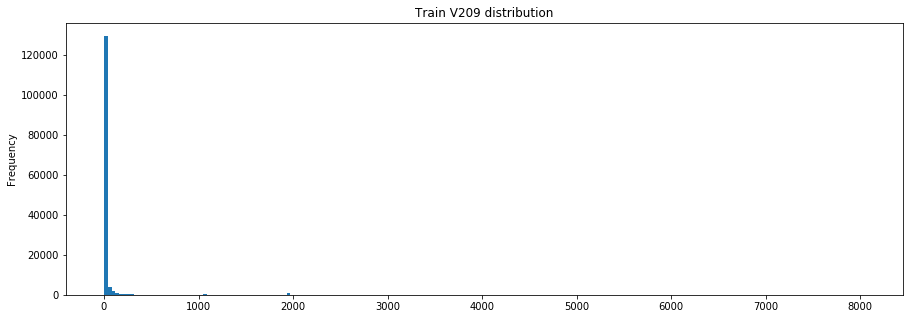

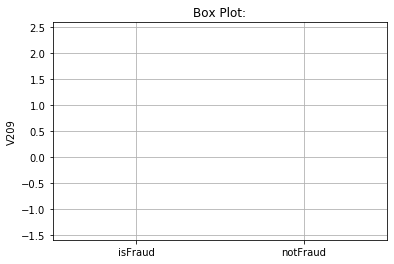

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V209
1     V203               0.735895
2     V182               0.711225
3     V180               0.707175
4     V204               0.706299
5     V212               0.699124
342    V33              -0.313893
343    V57              -0.315107
344    V61              -0.363436
345    V20              -0.364453
346    V19              -0.413563
--------------------------------------------------
Describing  V209  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean       35.001872      18.897558         36.386541
std       250.800822     127.469431        258.627612
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

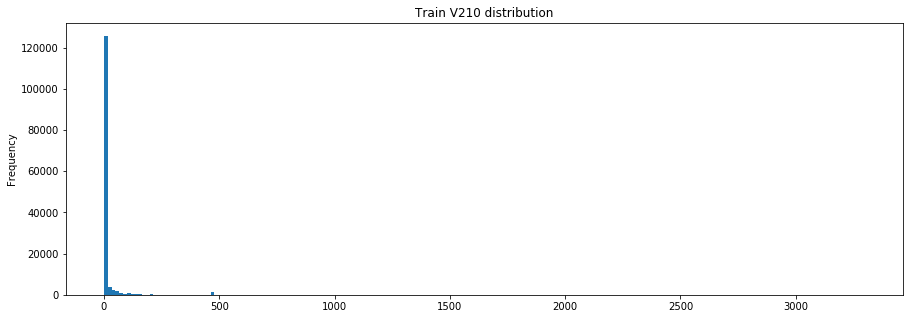

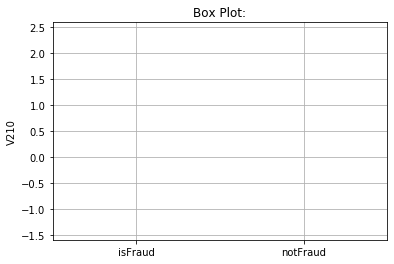

percentage of missing values: 76.32353439225116
--------------------------------------------------
Correlations: 
    Column  Correlation with V210
1     V208               0.778370
2     V175               0.692734
3     V209               0.663778
4     V314               0.610318
5     V327               0.506944
342    V15              -0.286831
343    V33              -0.290218
344    V20              -0.309785
345    V61              -0.320396
346    V19              -0.352218
--------------------------------------------------
Describing  V210  :
               Train  isFraud Train  isNotFraud Train
count  139819.000000   11070.000000     128749.000000
mean       14.391835      14.199290         14.408390
std        86.523724      73.466863         87.555739
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

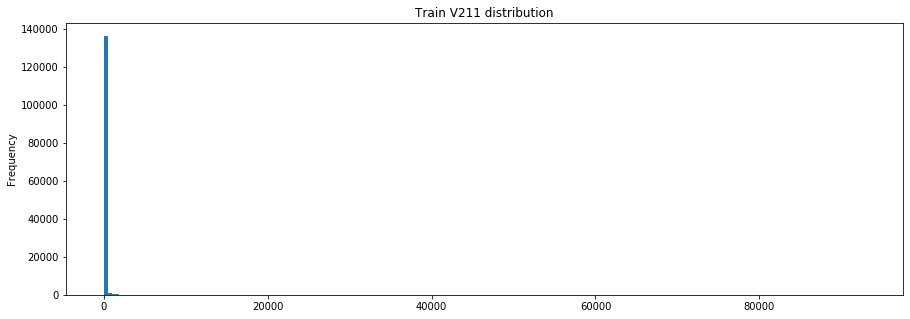

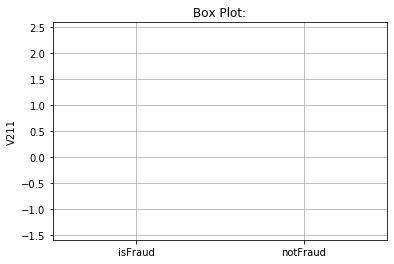

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V211
1     V177               0.998120
2     V167               0.997784
3     V316               0.993173
4     V132               0.993064
5     V101               0.991130
342    V62              -0.245534
343    V57              -0.250813
344    V20              -0.294317
345    V61              -0.306737
346    V19              -0.333764
--------------------------------------------------
Describing  V211  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean      385.137037      97.236561        409.851898
std      4541.837915     261.397582       4731.337313
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      86.883999          0.000000
max     9

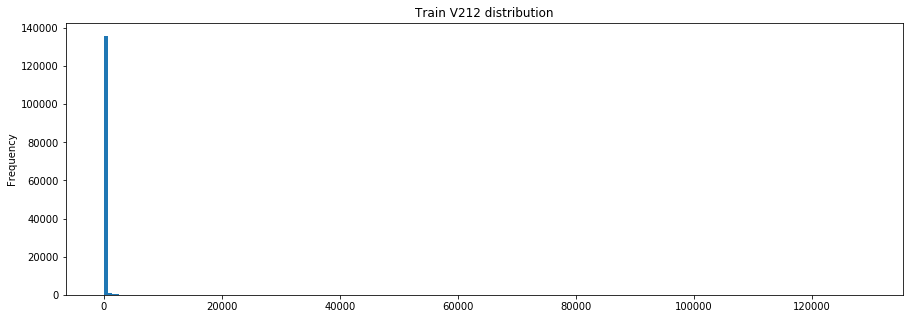

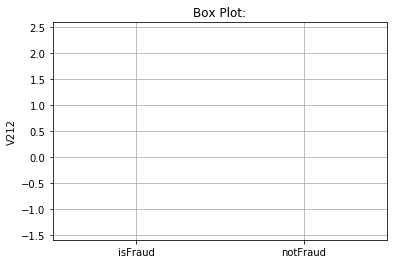

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V212
1     V178               0.987227
2     V213               0.984943
3     V168               0.982553
4     V204               0.981081
5     V179               0.973843
342    V62              -0.265773
343    V57              -0.274236
344    V20              -0.319241
345    V61              -0.332177
346    V19              -0.362025
--------------------------------------------------
Describing  V212  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean      765.988339     225.179319        812.414172
std      7496.120737    1385.125382       7798.955699
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000     141.404007          0.000000
max    12

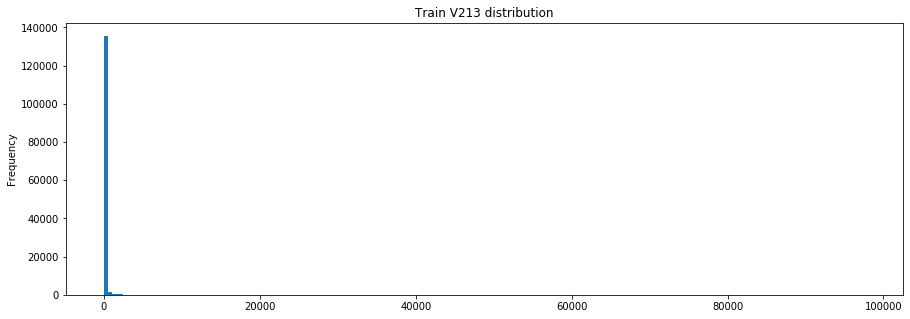

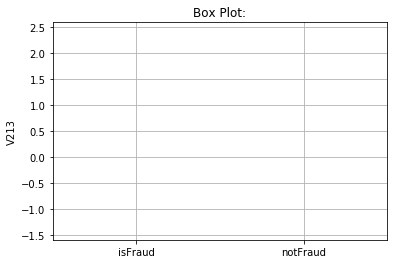

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V213
1     V179               0.996031
2     V168               0.995785
3     V178               0.992741
4     V212               0.984943
5     V134               0.983906
342    V62              -0.271962
343    V57              -0.279049
344    V20              -0.326851
345    V61              -0.340046
346    V19              -0.370662
--------------------------------------------------
Describing  V213  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean      536.302802     151.573946        569.329910
std      5471.664736     647.084991       5697.325996
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000     119.103798          0.000000
max     9

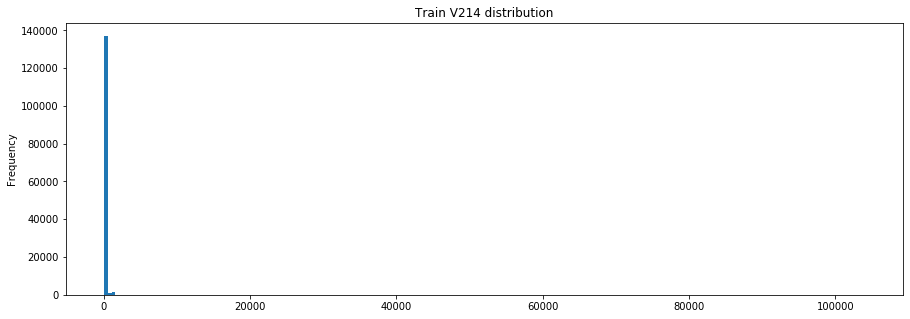

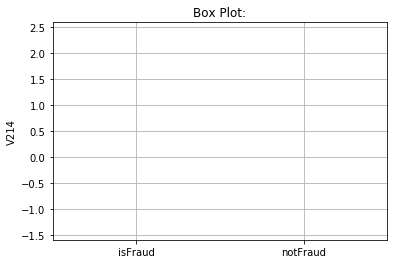

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V214
1     V276               0.990600
2     V278               0.941354
3     V216               0.905539
4     V277               0.891647
5     V319               0.885149
342    V15              -0.145990
343    V20              -0.146413
344    V33              -0.147715
345    V61              -0.156493
346    V19              -0.165694
--------------------------------------------------
Describing  V214  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean       38.437547      47.904827         37.624827
std       571.834283     198.676843        593.016828
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    10

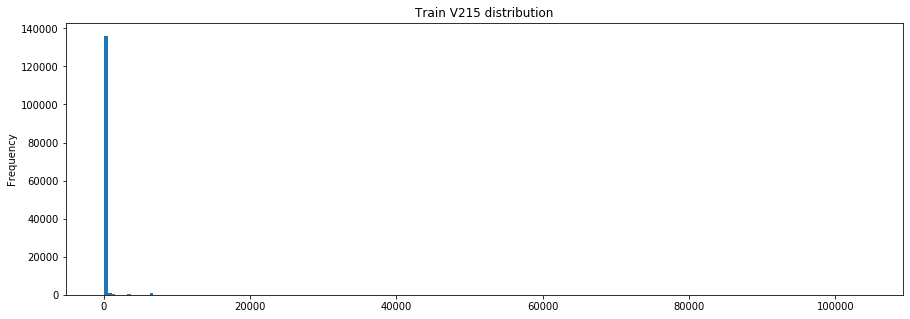

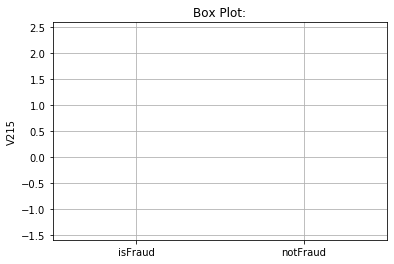

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V215
1     V278               0.971923
2     V277               0.950580
3     V276               0.929874
4     V216               0.867910
5     V180               0.773994
342    V33              -0.287601
343    V57              -0.293602
344    V20              -0.322778
345    V61              -0.336077
346    V19              -0.365738
--------------------------------------------------
Describing  V215  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean      133.208217     116.159801        134.671741
std      1040.453748     785.388033       1059.481445
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    10

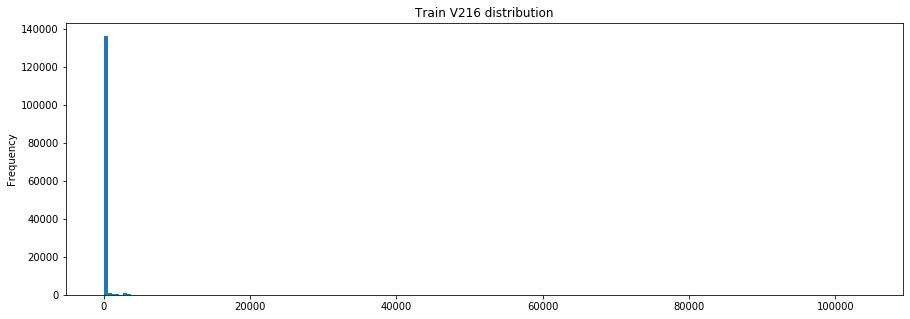

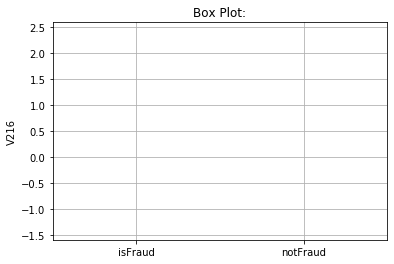

percentage of missing values: 76.35536966166559
--------------------------------------------------
Correlations: 
    Column  Correlation with V216
1     V278               0.984444
2     V276               0.949140
3     V277               0.939314
4     V214               0.905539
5     V215               0.867910
342    V33              -0.243318
343    V57              -0.250351
344    V20              -0.266402
345    V61              -0.286068
346    V19              -0.301779
--------------------------------------------------
Describing  V216  :
               Train  isFraud Train  isNotFraud Train
count  139631.000000   11039.000000     128592.000000
mean       71.107143      69.686454         71.229102
std       680.267625     306.143918        703.167916
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    10

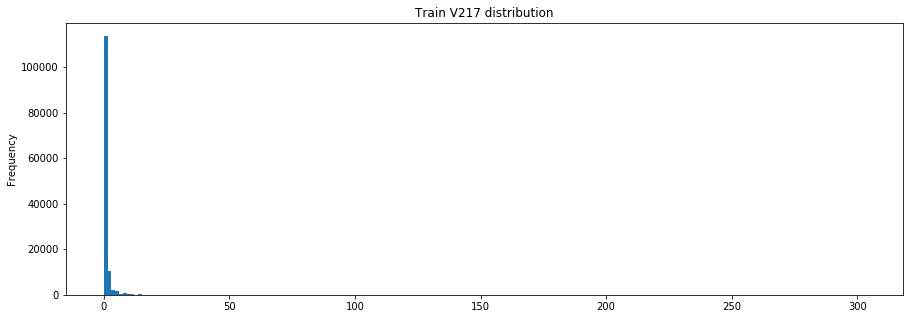

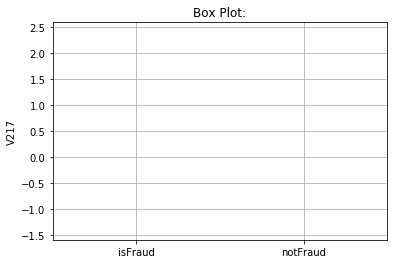

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V217
1     V231               0.995970
2     V233               0.989669
3     V232               0.983680
4     V219               0.983101
5     V167               0.964245
342    V57              -0.130091
343    V20              -0.170519
344    V61              -0.172675
345    V19              -0.195597
346     D5              -0.221611
--------------------------------------------------
Describing  V217  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.054619       2.556024          0.927352
std         9.547354       4.503774          9.846424
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       3.000000          0.000000
max      

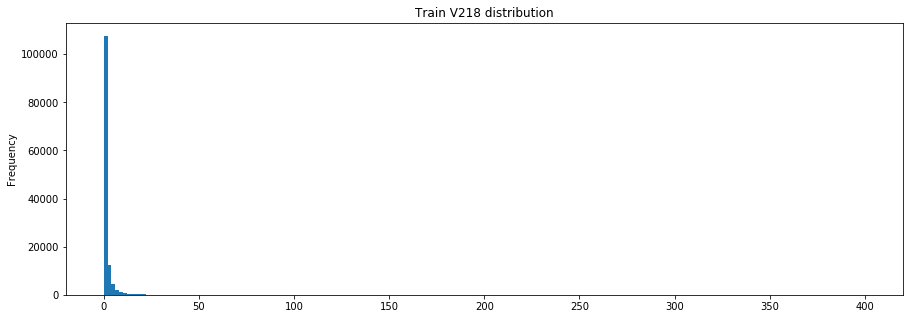

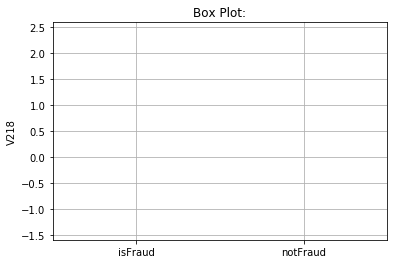

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V218
1     V219               0.969563
2     V232               0.953062
3     V168               0.935449
4     V233               0.930716
5     V179               0.926956
342    V57              -0.153378
343     D5              -0.179525
344    V20              -0.195542
345    V61              -0.196182
346    V19              -0.225017
--------------------------------------------------
Describing  V218  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.725784       3.999902          1.533018
std        13.919876       6.882425         14.342145
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       2.000000          0.000000
75%         1.000000       5.000000          1.000000
max      

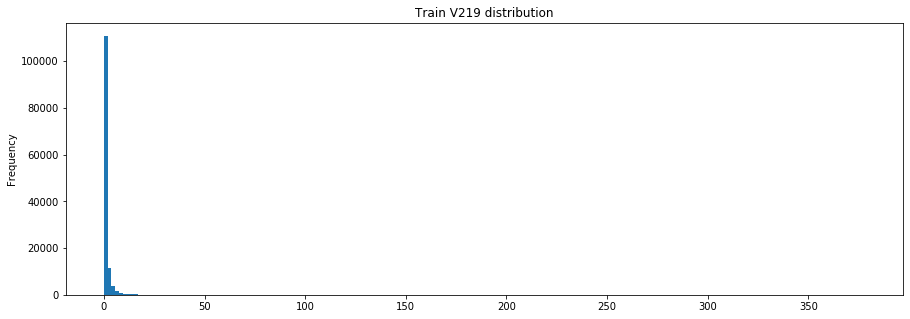

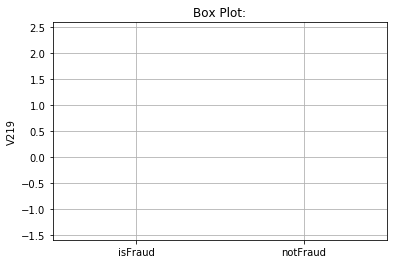

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V219
1     V232               0.990591
2     V233               0.988440
3     V217               0.983101
4     V231               0.974698
5     V218               0.969563
342    V57              -0.142380
343    V20              -0.183511
344    V61              -0.185871
345    V19              -0.210998
346     D5              -0.211514
--------------------------------------------------
Describing  V219  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.367132       3.271782          1.205684
std        12.044032       5.381539         12.432478
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         1.000000       4.000000          0.000000
max      

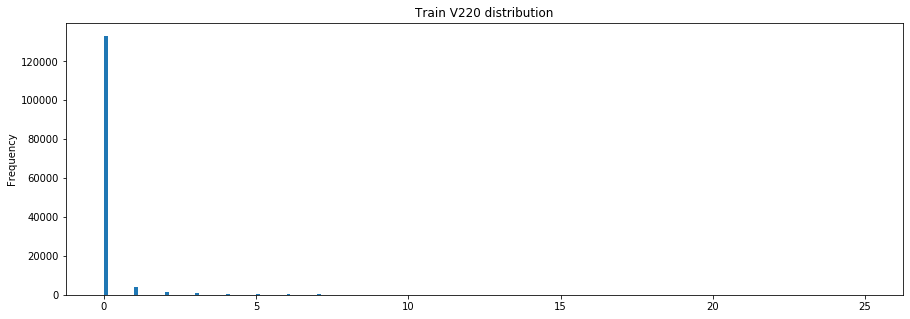

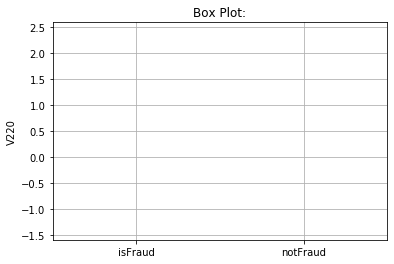

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V220
1     V169               0.602435
2     V228               0.475678
3     V138               0.462047
4     V223               0.442897
5     V281               0.409837
342    D14              -0.082167
343     D7              -0.116589
344     D3              -0.118448
345     D5              -0.129481
346     D2              -0.198271
--------------------------------------------------
Describing  V220  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.169472       0.434165          0.147186
std         1.002463       2.017091          0.860589
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max       

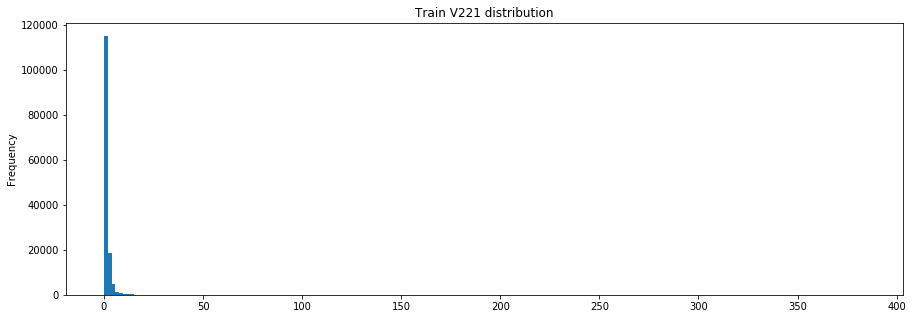

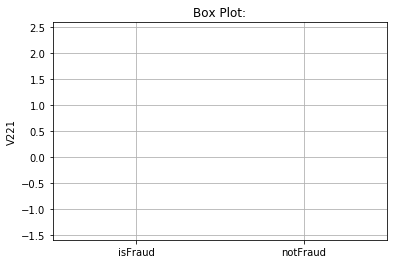

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V221
1     V222               0.970040
2     V259               0.927828
3     V245               0.872754
4     V227               0.786910
5     V255               0.759551
342     D8              -0.111452
343     D7              -0.145855
344     D5              -0.170755
345    D14              -0.180650
346     D2              -0.202014
--------------------------------------------------
Describing  V221  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        1.274912       2.521399          1.169963
std         2.728792       4.369119          2.514822
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       3.000000          1.000000
max       

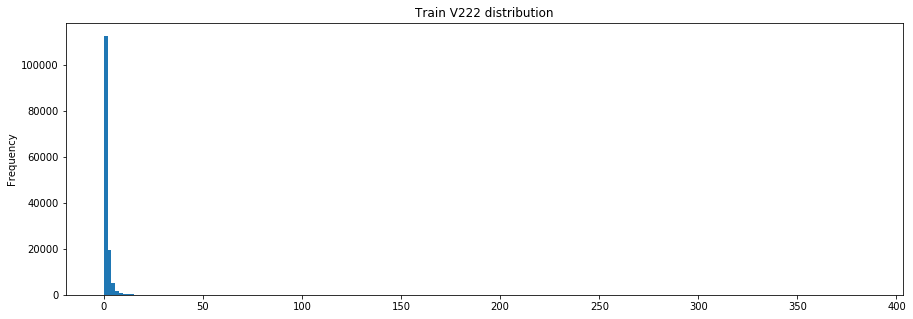

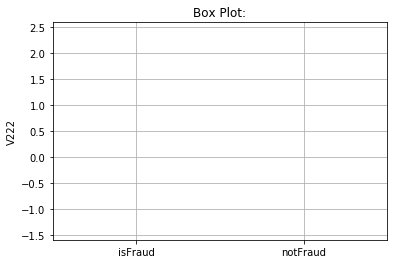

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V222
1     V221               0.970040
2     V259               0.901667
3     V245               0.844196
4     V227               0.772915
5     V256               0.736382
342     D8              -0.113880
343     D7              -0.151208
344     D5              -0.174508
345    D14              -0.182048
346     D2              -0.199546
--------------------------------------------------
Describing  V222  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        1.359005       3.029776          1.218333
std         2.913772       5.078343          2.603629
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       4.000000          1.000000
max       

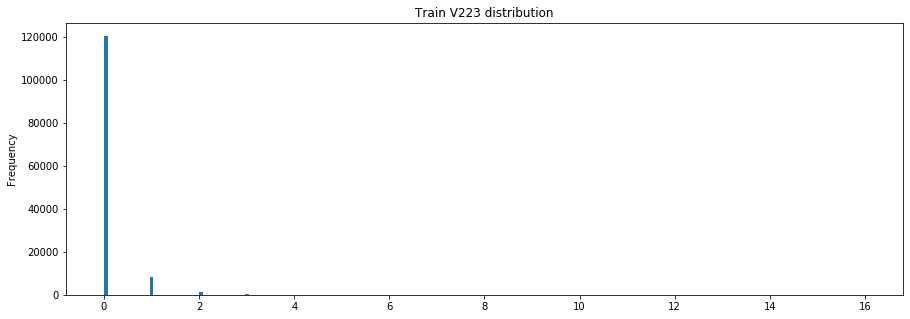

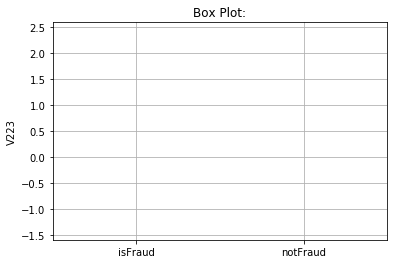

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V223
1     V172               0.789992
2     V225               0.717265
3     V173               0.675904
4     V284               0.621895
5     V224               0.603380
342     D8              -0.099107
343     D7              -0.186522
344     D5              -0.195516
345     D3              -0.204349
346     D2              -0.276268
--------------------------------------------------
Describing  V223  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.093153       0.094682          0.093024
std         0.402232       0.348206          0.406483
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

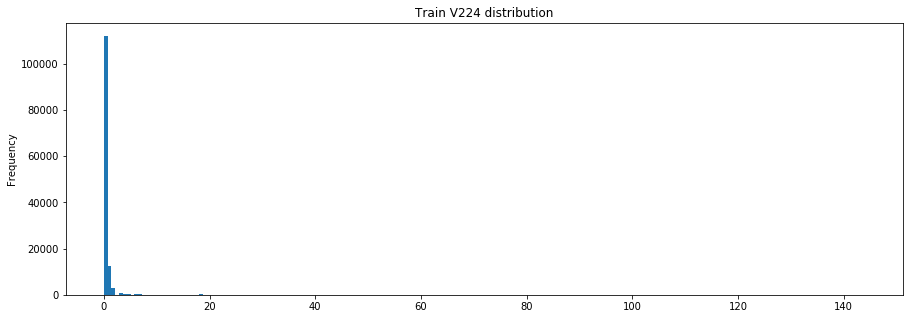

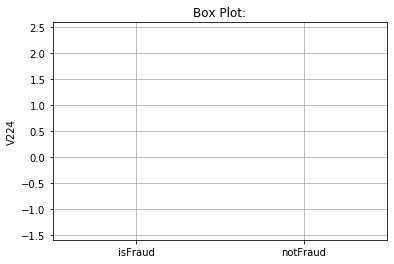

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V224
1     V225               0.952899
2     V253               0.894167
3     V254               0.862917
4     V267               0.852091
5     V248               0.839747
342    V15              -0.187522
343    V33              -0.190779
344    V61              -0.198038
345    V20              -0.201311
346    V19              -0.231730
--------------------------------------------------
Describing  V224  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.394748       0.408359          0.393594
std         3.443310       2.533156          3.509631
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

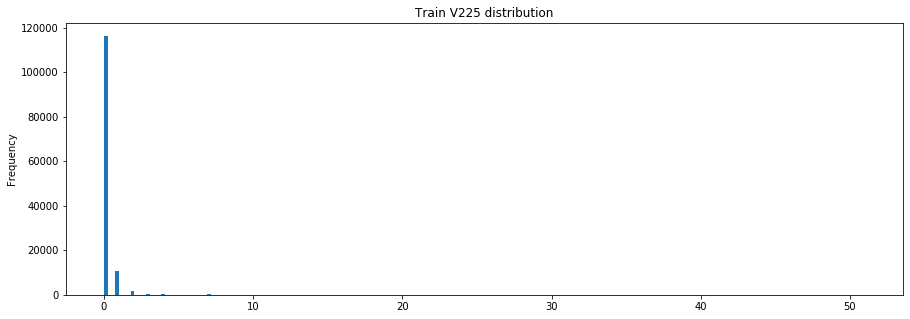

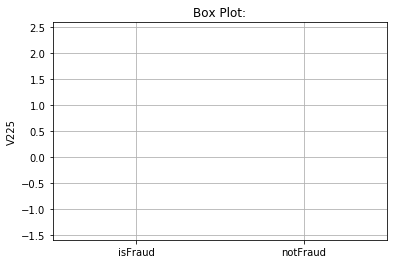

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V225
1     V224               0.952899
2     V253               0.860549
3     V254               0.847145
4     V267               0.834890
5     V229               0.821672
342     D7              -0.146259
343     D5              -0.148920
344    V20              -0.164271
345     D3              -0.166779
346    V19              -0.187604
--------------------------------------------------
Describing  V225  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.191758       0.226943          0.188776
std         1.290820       0.900620          1.318557
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

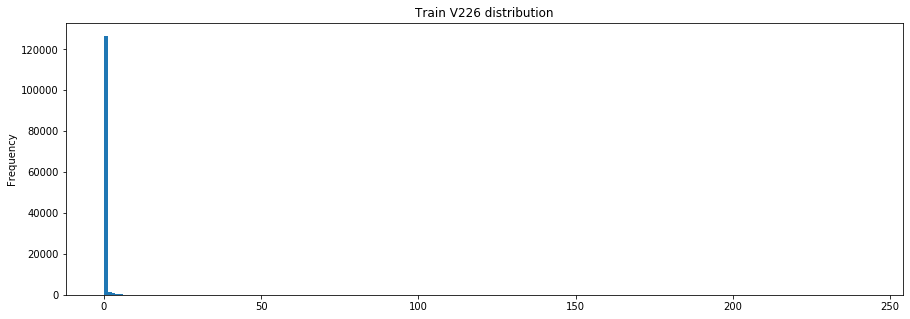

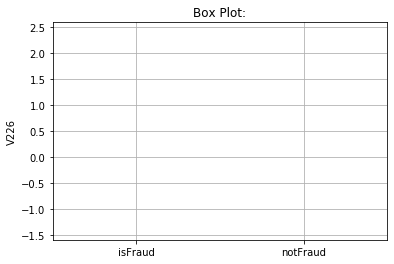

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V226
1     V263               0.760715
2     V202               0.751501
3     V204               0.728577
4     V306               0.712872
5     V308               0.703410
341    V33              -0.168278
342    V51              -0.171461
343    V20              -0.192599
344    V61              -0.200231
345    V19              -0.220844
--------------------------------------------------
Describing  V226  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.247612       0.269133          0.245788
std         2.756449       1.212436          2.849110
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

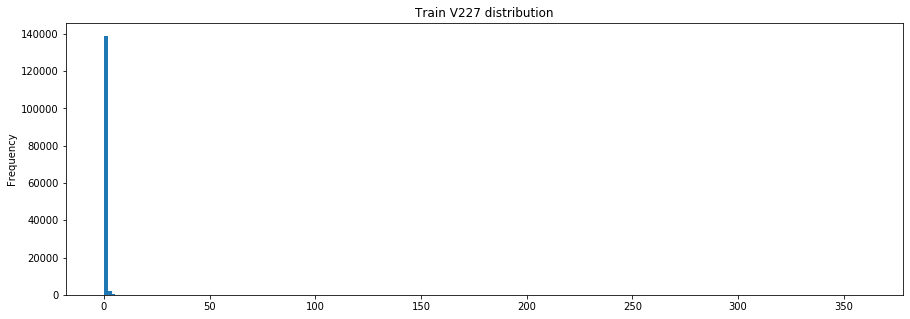

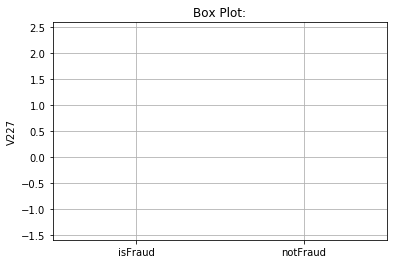

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V227
1     V245               0.901069
2     V259               0.826610
3     V255               0.795647
4     V221               0.786910
5     V256               0.783825
342    D14              -0.034548
343     D7              -0.113747
344     D3              -0.124294
345     D5              -0.126461
346     D2              -0.168597
--------------------------------------------------
Describing  V227  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.147975       0.267984          0.137870
std         2.049363       1.772261          2.070691
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max       

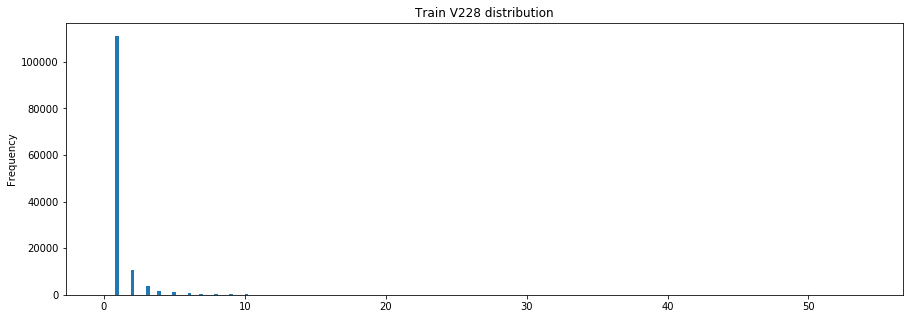

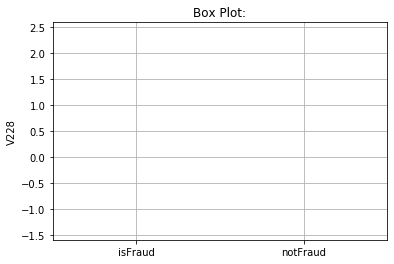

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V228
1     V176               0.886161
2     V246               0.824228
3     V230               0.792778
4     V190               0.733342
5     V257               0.728859
342     D3              -0.098696
343     D8              -0.129648
344     D7              -0.177693
345     D5              -0.191253
346     D2              -0.226563
--------------------------------------------------
Describing  V228  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.351928       2.653748          1.241579
std         1.409722       3.594541          0.951216
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       3.000000          1.000000
max      

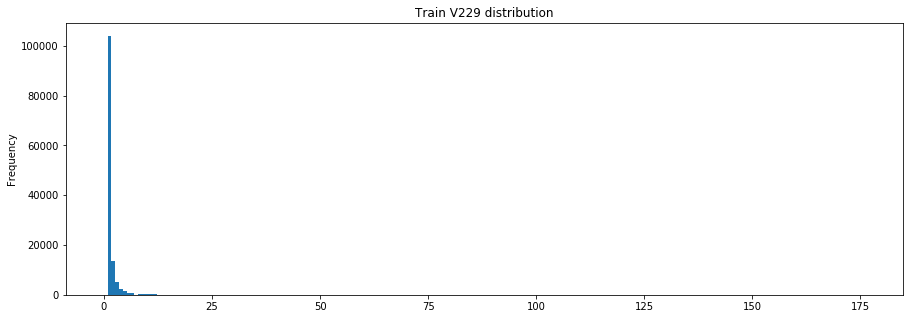

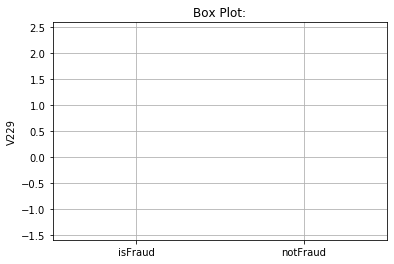

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V229
1     V243               0.908777
2     V253               0.901514
3     V254               0.881434
4     V248               0.879048
5     V230               0.878426
342     D8              -0.072719
343     D3              -0.105662
344     D2              -0.117357
345     D7              -0.159555
346     D5              -0.160100
--------------------------------------------------
Describing  V229  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.638710       3.672979          1.466275
std         4.316026       5.426587          4.163011
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       2.000000          1.000000
75%         1.000000       4.000000          1.000000
max      

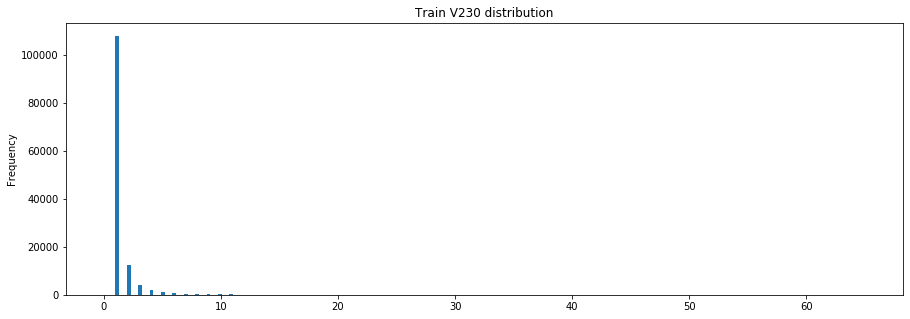

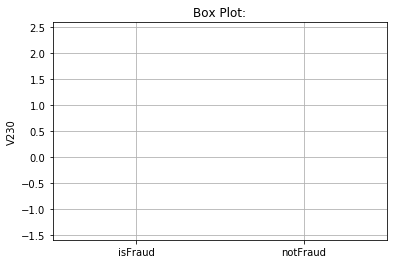

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V230
1     V229               0.878426
2     V258               0.857729
3     V243               0.827691
4     V228               0.792778
5     V176               0.728197
342     D3              -0.107963
343     D8              -0.114233
344     D7              -0.175495
345     D5              -0.185260
346     D2              -0.194060
--------------------------------------------------
Describing  V230  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.465476       3.155122          1.322253
std         2.122783       4.257576          1.757632
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       2.000000          1.000000
75%         1.000000       3.000000          1.000000
max      

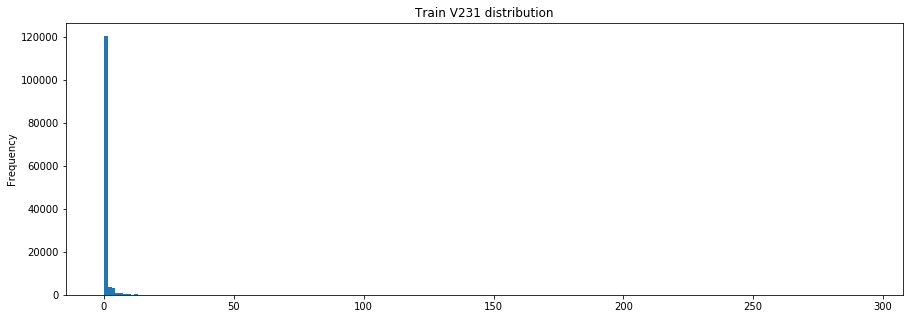

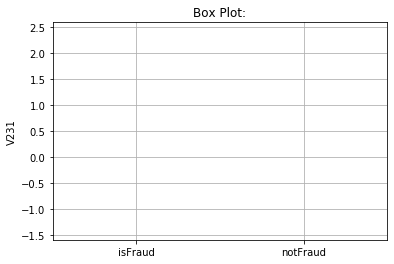

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V231
1     V217               0.995970
2     V233               0.991522
3     V232               0.983525
4     V219               0.974698
5     V177               0.962894
342    V57              -0.128418
343     D5              -0.166062
344    V20              -0.166647
345    V61              -0.170475
346    V19              -0.191365
--------------------------------------------------
Describing  V231  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.765506       2.024431          0.658793
std         8.877119       4.267971          9.153875
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       2.000000          0.000000
max      

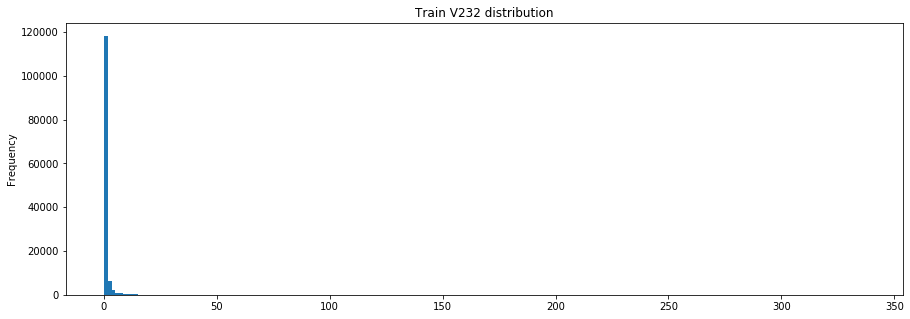

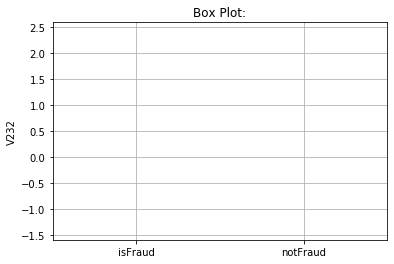

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V232
1     V233               0.994496
2     V219               0.990591
3     V217               0.983680
4     V231               0.983525
5     V179               0.955464
342    V57              -0.134316
343     D5              -0.155586
344    V20              -0.172798
345    V61              -0.178345
346    V19              -0.199142
--------------------------------------------------
Describing  V232  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.005597       2.967327          0.839310
std        10.460253       5.975140         10.738334
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       3.000000          0.000000
max      

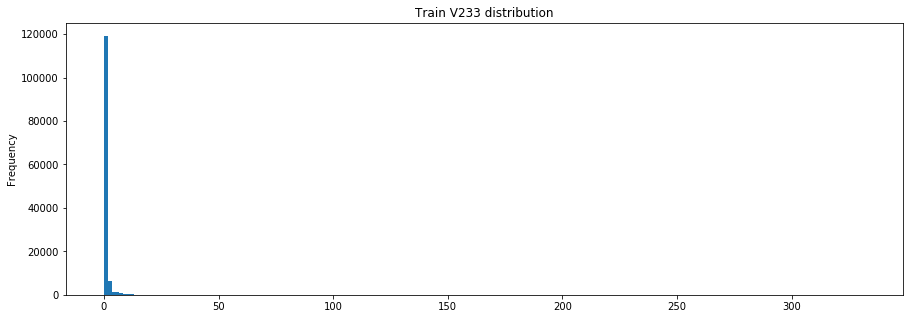

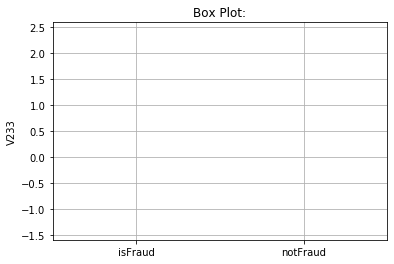

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V233
1     V232               0.994496
2     V231               0.991522
3     V217               0.989669
4     V219               0.988440
5     V179               0.960802
342    V57              -0.133680
343     D5              -0.162397
344    V20              -0.172346
345    V61              -0.177040
346    V19              -0.198467
--------------------------------------------------
Describing  V233  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.908388       2.519918          0.771786
std        10.149884       5.047551         10.457271
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       3.000000          0.000000
max      

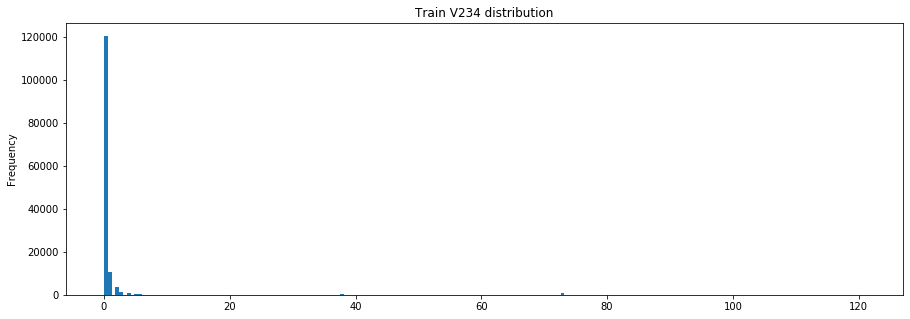

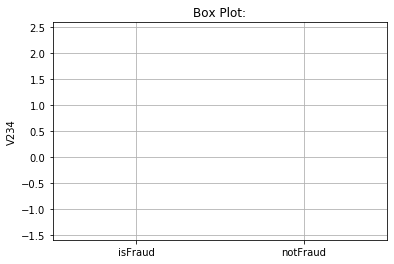

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V234
1     V236               0.980190
2     V237               0.922474
3     V218               0.891138
4     V180               0.843692
5     V219               0.821776
342    V33              -0.320624
343    V57              -0.325805
344    V20              -0.334160
345    V61              -0.356687
346    V19              -0.377958
--------------------------------------------------
Describing  V234  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        2.092847       1.337461          2.156447
std        11.323036       7.735587         11.572216
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max       

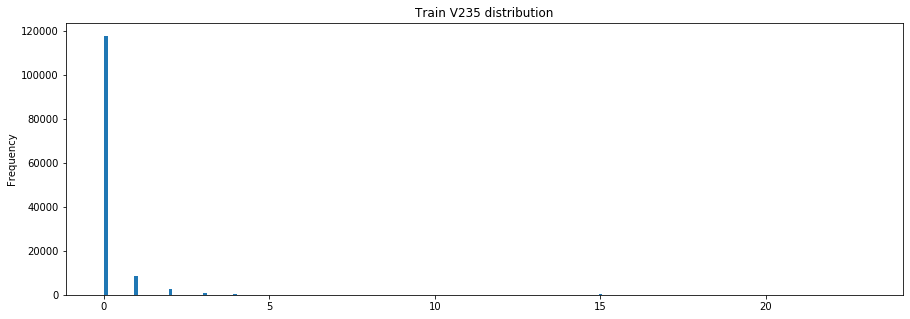

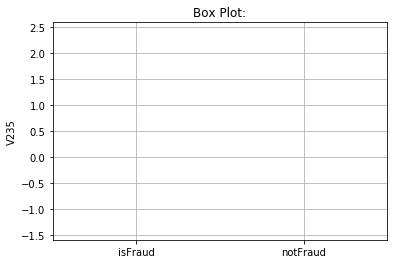

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V235
1     V181               0.946890
2     V237               0.908747
3     V183               0.890540
4     V328               0.884511
5     V182               0.846474
342    V57              -0.155843
343    V33              -0.156660
344    V20              -0.179462
345    V61              -0.192420
346    V19              -0.204439
--------------------------------------------------
Describing  V235  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.184106       0.420330          0.164083
std         0.902639       1.237212          0.865420
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

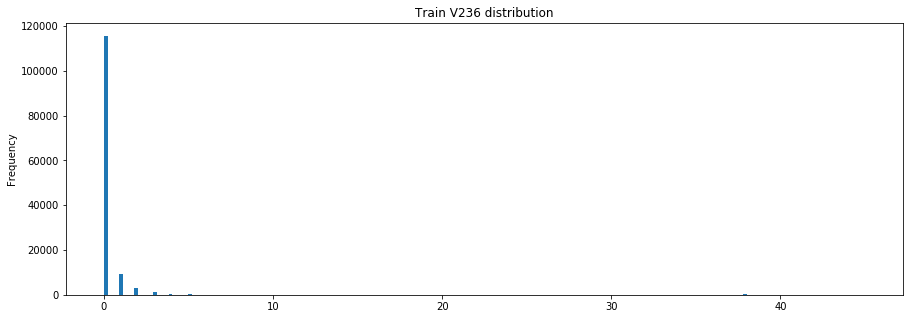

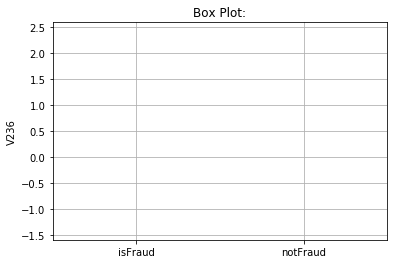

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V236
1     V234               0.980190
2     V237               0.963245
3     V183               0.913374
4     V182               0.912737
5     V218               0.904253
342    V15              -0.176676
343    V33              -0.179173
344    V20              -0.215362
345    V61              -0.218910
346    V19              -0.246308
--------------------------------------------------
Describing  V236  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.307667       0.603218          0.282614
std         2.152332       1.502342          2.196789
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max      

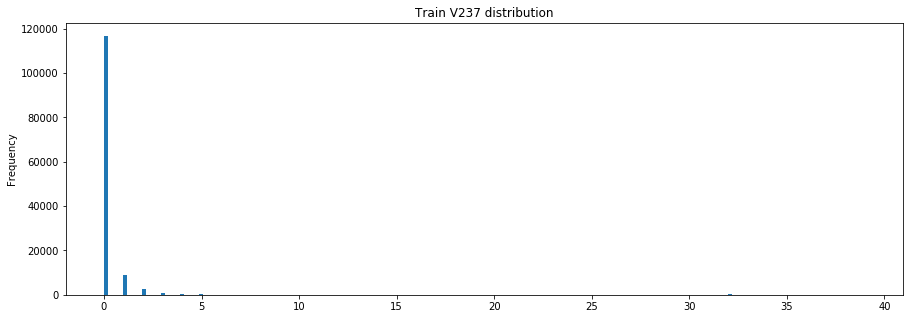

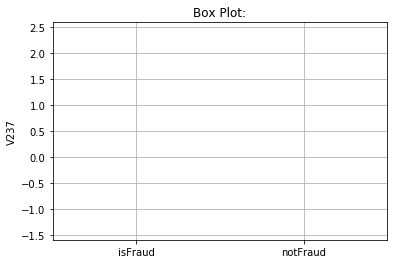

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V237
1     V236               0.963245
2     V183               0.945907
3     V234               0.922474
4     V182               0.914108
5     V330               0.911130
342    V62              -0.167738
343    V57              -0.170939
344    V20              -0.201955
345    V61              -0.214002
346    V19              -0.230978
--------------------------------------------------
Describing  V237  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.253500       0.505396          0.232148
std         1.716634       1.360593          1.741805
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      

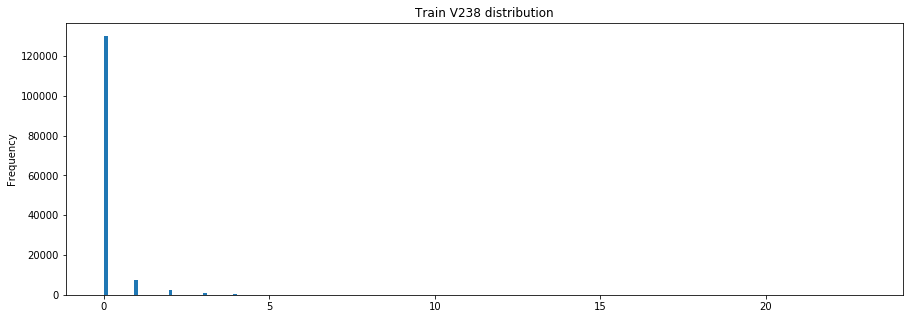

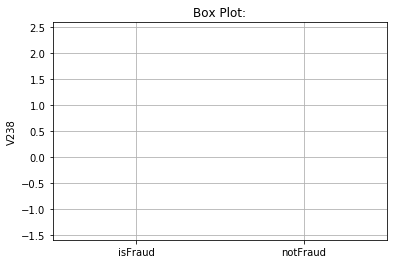

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V238
1     V239               0.946169
2     V184               0.744011
3     V146               0.656216
4     V185               0.634379
5     V147               0.614442
342     D3              -0.064261
343     D8              -0.072741
344    D14              -0.093980
345     D7              -0.119542
346     D5              -0.127602
--------------------------------------------------
Describing  V238  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.127956       0.360681          0.108361
std         0.574657       1.086645          0.503668
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max       

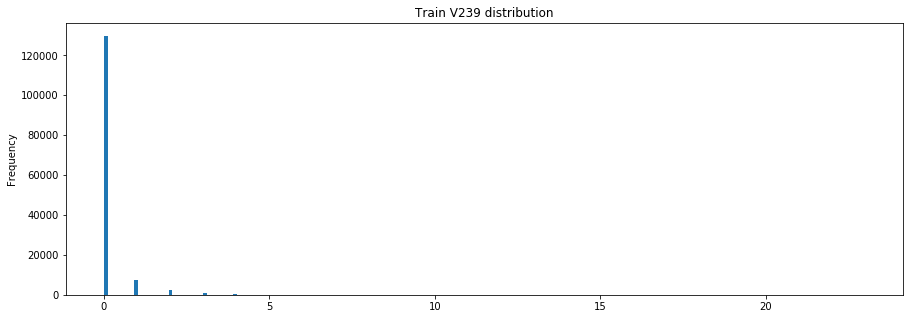

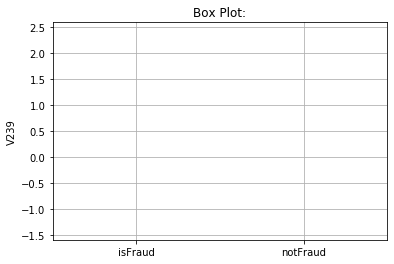

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V239
1     V238               0.946169
2     V184               0.710068
3     V185               0.656210
4     V147               0.632425
5     V146               0.620958
342     D3              -0.067270
343     D8              -0.070791
344    D14              -0.095744
345     D7              -0.122935
346     D5              -0.131347
--------------------------------------------------
Describing  V239  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.136965       0.437261          0.111681
std         0.616260       1.293764          0.512448
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max       

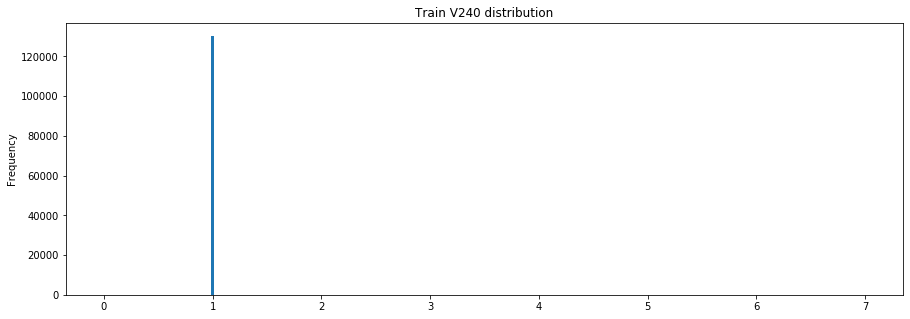

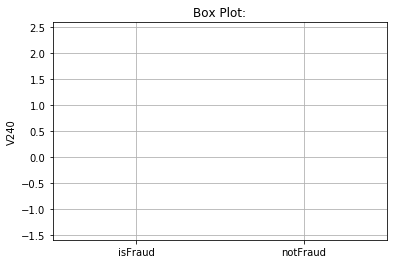

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V240
1     V241               0.744394
2     V261               0.097821
3     V253               0.062609
4     V224               0.060865
5     V229               0.059365
342   V256              -0.021201
343   V255              -0.023468
344  addr2              -0.027187
345   V251              -0.030195
346   V250              -0.031923
--------------------------------------------------
Describing  V240  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.000997       1.001472          1.000956
std         0.049522       0.040816          0.050191
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

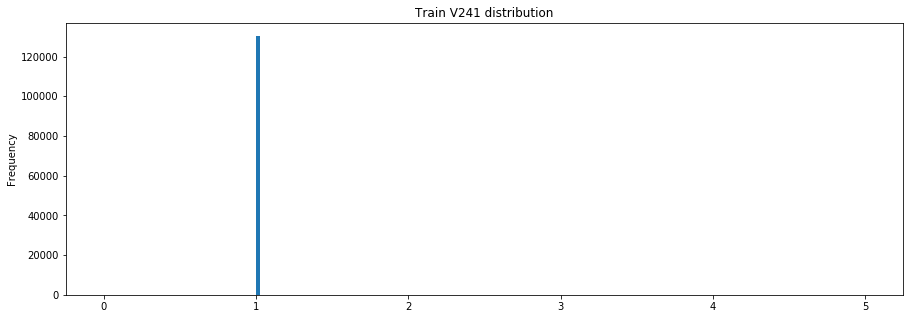

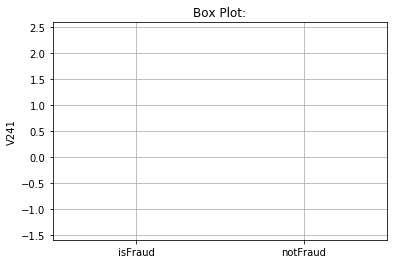

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V241
1     V240               0.744394
2     V261               0.074826
3     V224               0.049494
4     V253               0.049442
5     V262               0.047916
342   V245              -0.010860
343   V256              -0.012332
344   V255              -0.014645
345   V251              -0.017124
346   V250              -0.019914
--------------------------------------------------
Describing  V241  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.000238       1.000392          1.000225
std         0.022663       0.024261          0.022523
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

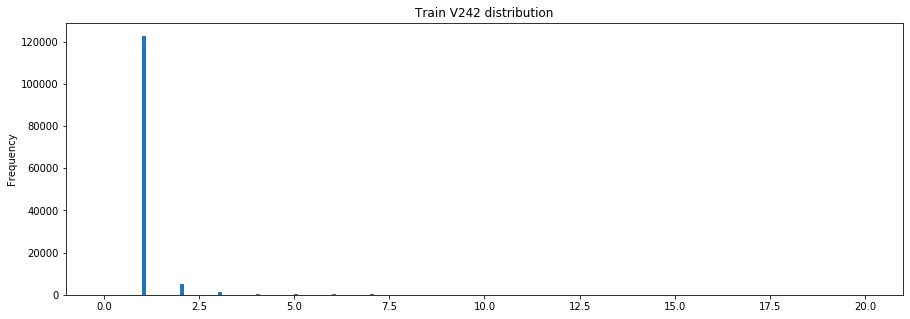

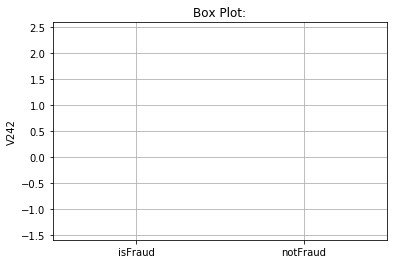

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V242
1     V244               0.974318
2     V186               0.838799
3     V246               0.826648
4     V257               0.753764
5     V243               0.727503
342    D10              -0.046012
343     D2              -0.053901
344     D8              -0.085007
345     D7              -0.110176
346     D5              -0.118686
--------------------------------------------------
Describing  V242  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.113463       1.931024          1.044162
std         0.660110       1.854551          0.345990
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

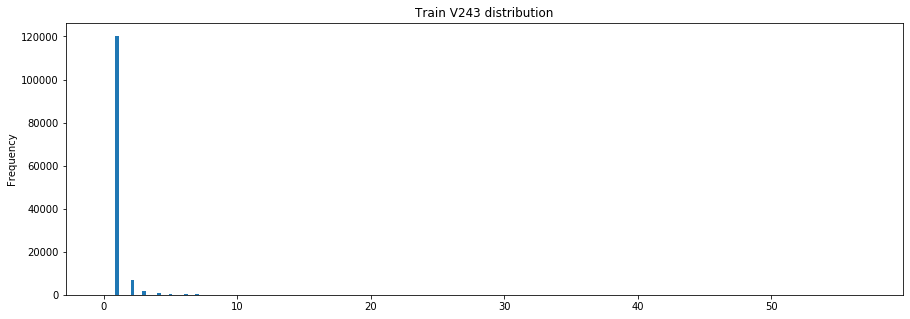

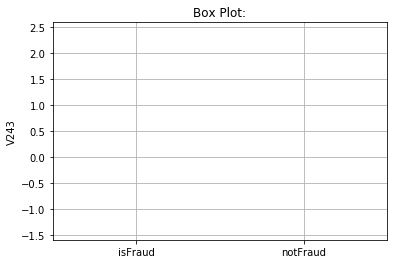

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V243
1     V229               0.908777
2     V258               0.883010
3     V254               0.873915
4     V253               0.853655
5     V248               0.852932
342    D13              -0.036853
343    V21              -0.038280
344     D8              -0.057917
345     D7              -0.101693
346     D5              -0.104694
--------------------------------------------------
Describing  V243  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.178387       2.188579          1.092758
std         1.398953       2.292076          1.258508
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

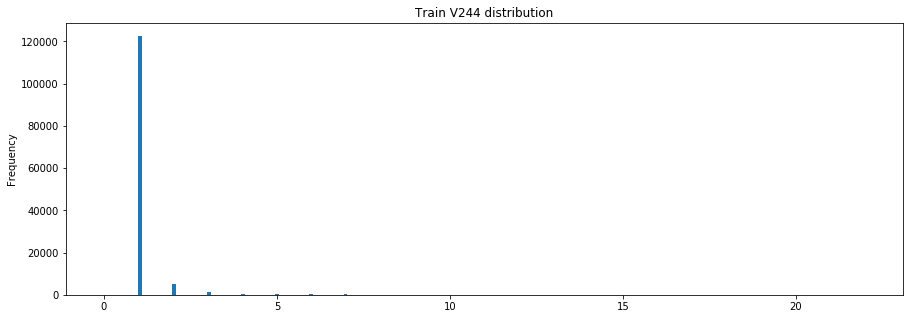

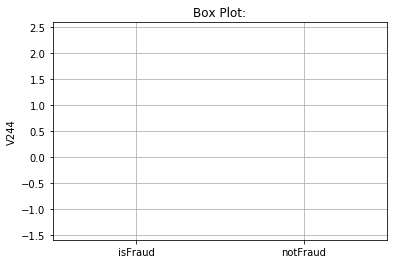

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V244
1     V242               0.974318
2     V246               0.829339
3     V186               0.817615
4     V257               0.757727
5     V258               0.710709
342    D10              -0.049132
343     D2              -0.063220
344     D8              -0.086379
345     D7              -0.113193
346     D5              -0.121824
--------------------------------------------------
Describing  V244  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.118562       1.992543          1.044478
std         0.698807       1.987337          0.353183
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

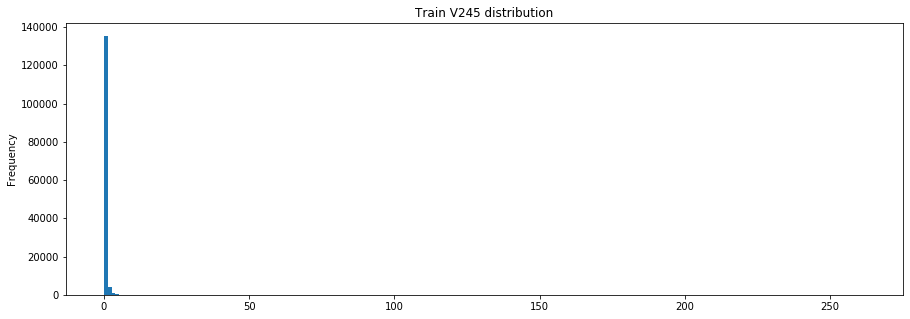

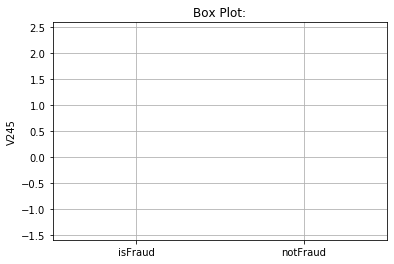

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V245
1     V259               0.943832
2     V227               0.901069
3     V255               0.892076
4     V256               0.875776
5     V221               0.872754
342     D6              -0.083511
343     D5              -0.089305
344    D10              -0.089735
345     D2              -0.118948
346    D14              -0.178422
--------------------------------------------------
Describing  V245  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.876619       1.449736          0.828365
std         1.821065       2.369050          1.758696
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max       

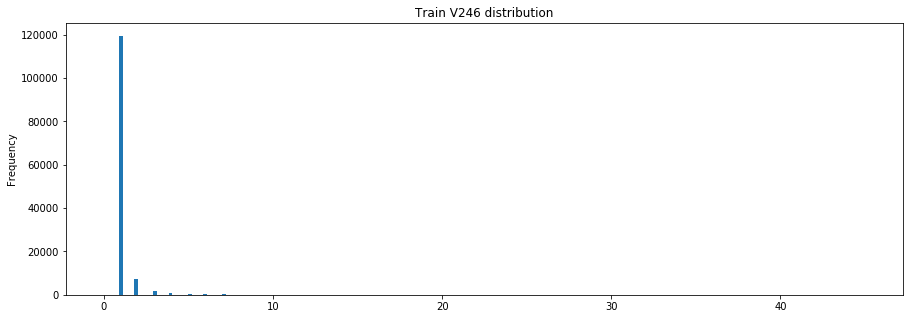

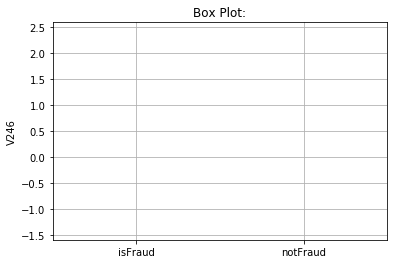

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V246
1     V257               0.905762
2     V190               0.886028
3     V244               0.829339
4     V242               0.826648
5     V228               0.824228
342    D10              -0.048243
343     D2              -0.071863
344     D8              -0.088642
345     D7              -0.115934
346     D5              -0.124809
--------------------------------------------------
Describing  V246  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.183723       2.494702          1.072598
std         1.040363       3.138070          0.425933
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       3.000000          1.000000
max      

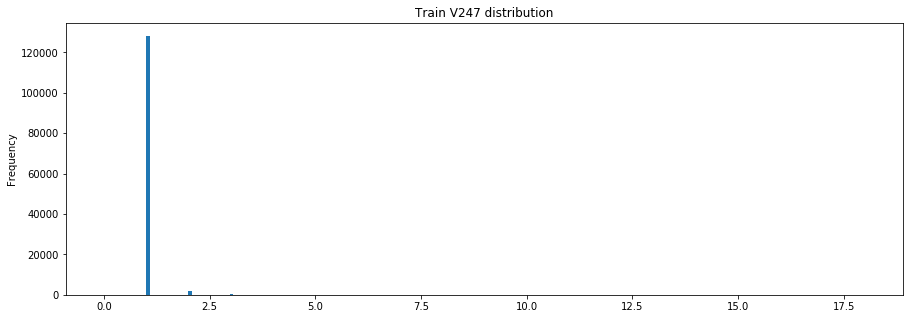

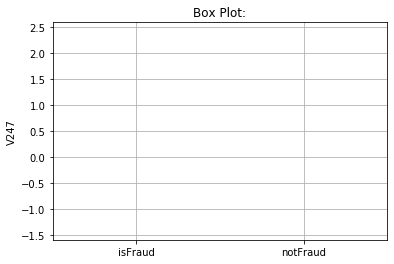

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V247
1     V252               0.849959
2     V249               0.843090
3     V191               0.830133
4     V193               0.740302
5     V248               0.740254
342   V150              -0.025356
343    V63              -0.040092
344    V21              -0.040391
345     D5              -0.058378
346     D7              -0.059330
--------------------------------------------------
Describing  V247  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.025355       1.199176          1.010621
std         0.281604       0.740734          0.191675
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

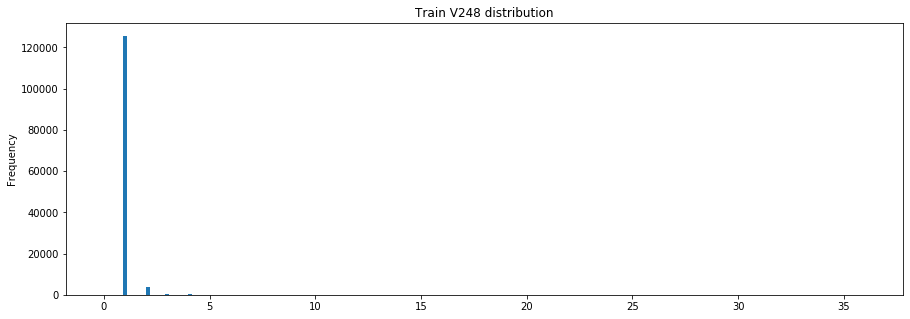

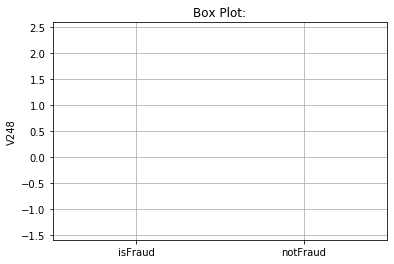

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V248
1     V249               0.963351
2     V253               0.955888
3     V254               0.954492
4     V229               0.879048
5     V243               0.852932
342   V304              -0.032373
343     D7              -0.033871
344    V63              -0.039577
345   V302              -0.043152
346    V21              -0.063253
--------------------------------------------------
Describing  V248  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.069493       1.309066          1.049186
std         0.888341       0.917264          0.882866
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

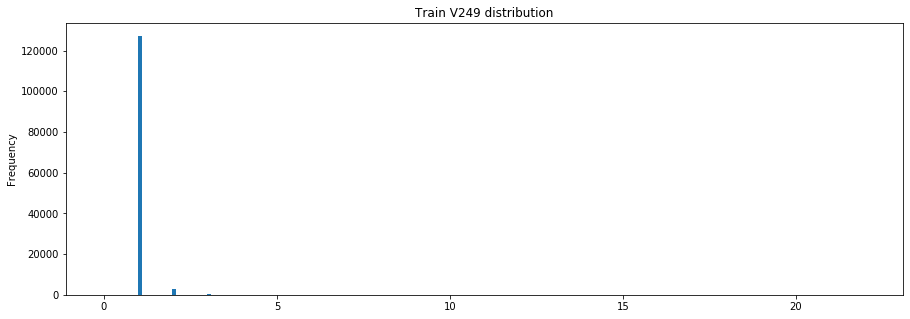

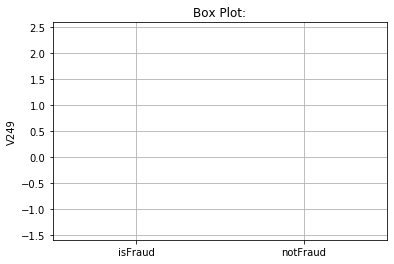

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V249
1     V248               0.963351
2     V254               0.933000
3     V253               0.897530
4     V243               0.846675
5     V247               0.843090
342     D5              -0.040508
343   V302              -0.041244
344    V63              -0.042400
345     D7              -0.047029
346    V21              -0.060884
--------------------------------------------------
Describing  V249  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.042851       1.249706          1.025316
std         0.528812       0.807767          0.494074
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

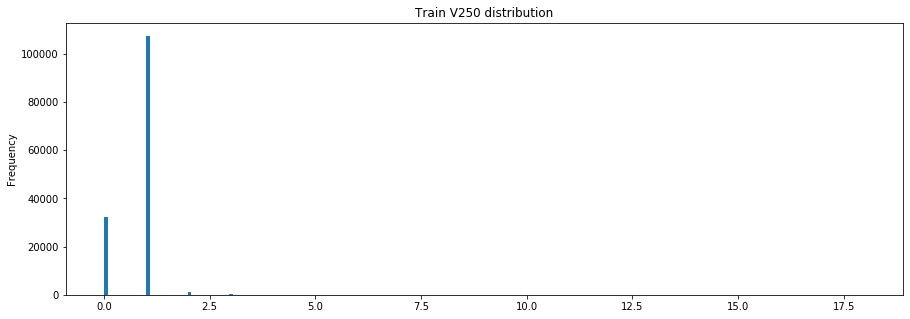

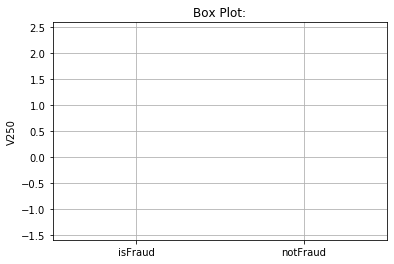

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V250
1     V251               0.983995
2     V255               0.695407
3     V256               0.683843
4     V245               0.485802
5     V259               0.459823
342   V330              -0.212452
343   V327              -0.227737
344   V326              -0.233704
345   V234              -0.257023
346    D14              -0.667355
--------------------------------------------------
Describing  V250  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.788588       0.864688          0.782181
std         0.488386       0.859225          0.442629
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max       

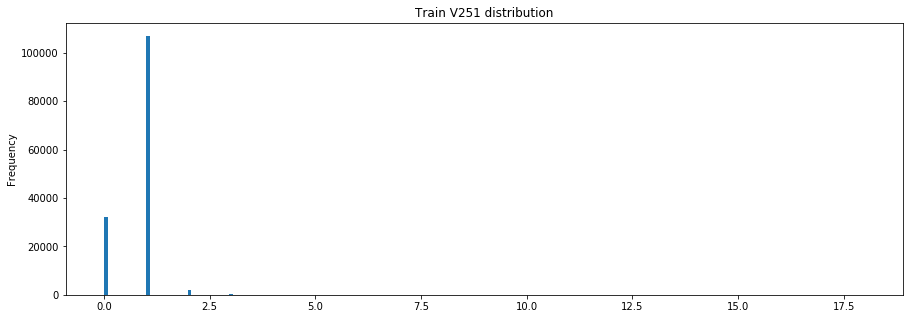

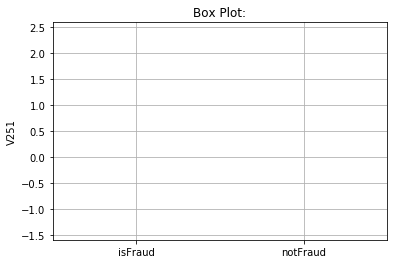

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V251
1     V250               0.983995
2     V256               0.693864
3     V255               0.687192
4     V245               0.479994
5     V259               0.454043
342   V329              -0.206922
343   V327              -0.220825
344   V326              -0.225503
345   V234              -0.249892
346    D14              -0.654479
--------------------------------------------------
Describing  V251  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.794231       0.903661          0.785018
std         0.501240       0.918799          0.447471
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max       

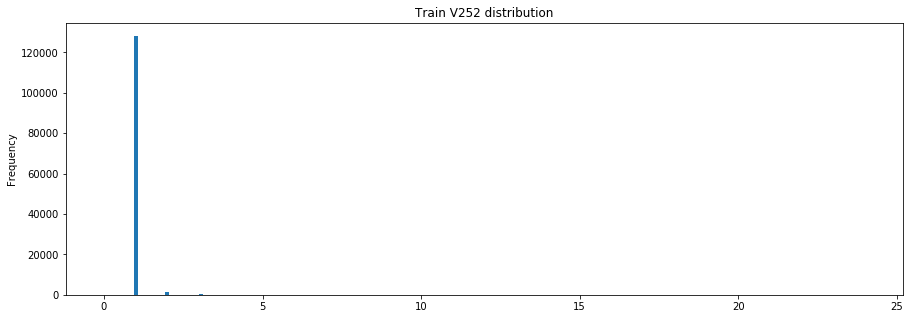

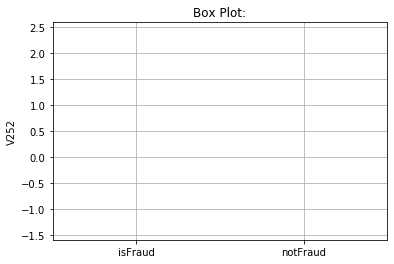

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V252
1     V247               0.849959
2     V196               0.778117
3     V249               0.771101
4     V254               0.745987
5     V248               0.700490
342    V84              -0.031485
343   V302              -0.031605
344  card3              -0.034124
345    V94              -0.035271
346    V21              -0.041222
--------------------------------------------------
Describing  V252  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.032048       1.237245          1.014654
std         0.389546       1.020078          0.269335
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

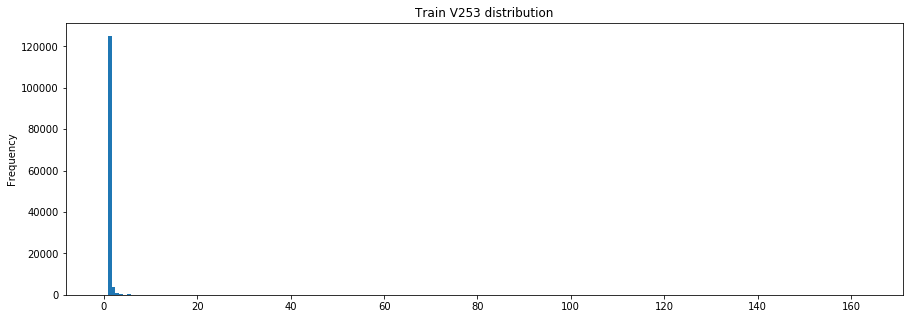

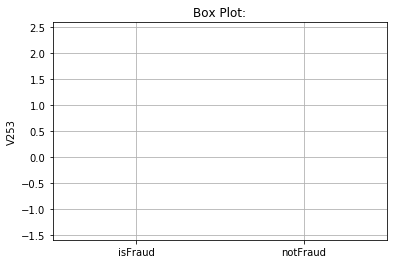

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V253
1     V254               0.977728
2     V248               0.955888
3     V229               0.901514
4     V249               0.897530
5     V224               0.894167
342    V33              -0.032629
343    V94              -0.040683
344   V304              -0.042633
345   V302              -0.052297
346    V21              -0.073929
--------------------------------------------------
Describing  V253  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.162164       1.406005          1.141494
std         3.612553       1.736321          3.727705
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

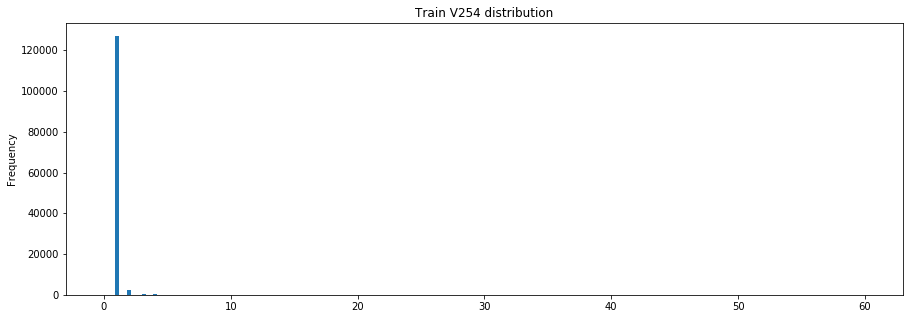

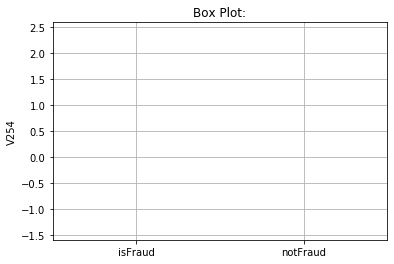

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V254
1     V253               0.977728
2     V248               0.954492
3     V249               0.933000
4     V229               0.881434
5     V243               0.873915
342    V84              -0.032003
343    V94              -0.041422
344   V304              -0.042361
345   V302              -0.051695
346    V21              -0.069156
--------------------------------------------------
Describing  V254  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000      120238.00000
mean        1.075113       1.307790           1.05539
std         1.357550       1.218921           1.36684
min         0.000000       0.000000           0.00000
25%         1.000000       1.000000           1.00000
50%         1.000000       1.000000           1.00000
75%         1.000000       1.000000           1.00000
max      

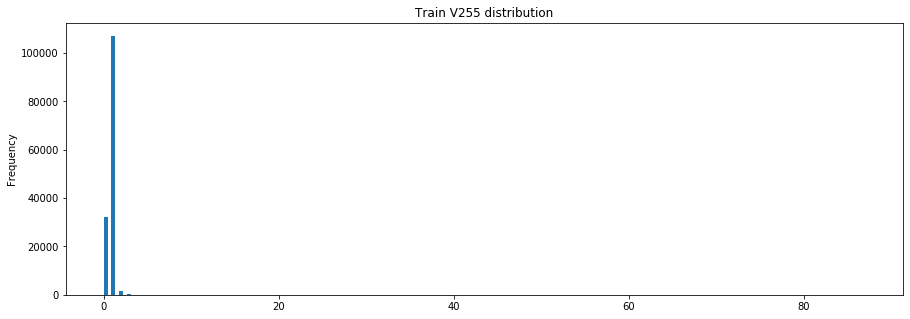

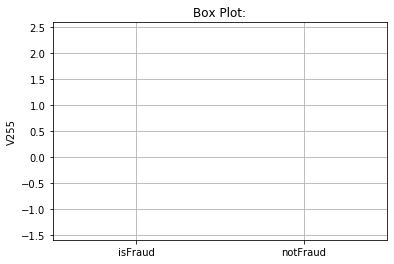

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V255
1     V256               0.984082
2     V245               0.892076
3     V259               0.821271
4     V227               0.795647
5     V221               0.759551
342     D6              -0.112258
343     D2              -0.115535
344   V234              -0.117009
345    D10              -0.128273
346    D14              -0.309611
--------------------------------------------------
Describing  V255  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.806656       0.929885          0.796280
std         0.939124       1.388086          0.890288
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max       

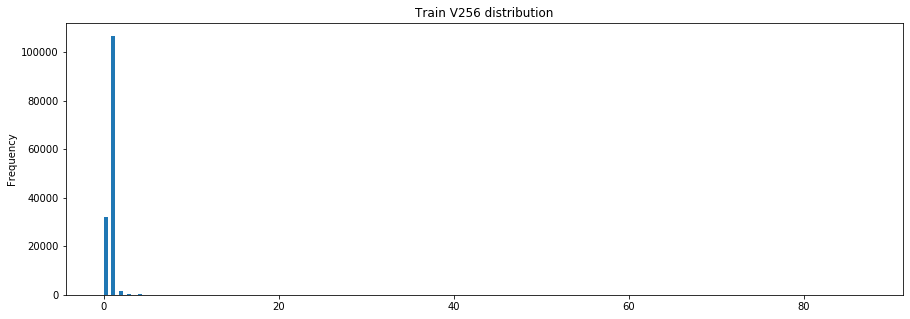

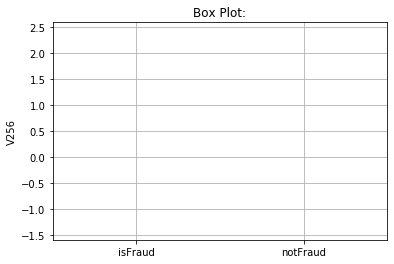

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V256
1     V255               0.984082
2     V245               0.875776
3     V259               0.805978
4     V227               0.783825
5     V221               0.745192
342     D6              -0.109676
343   V234              -0.111267
344     D2              -0.114128
345    D10              -0.124571
346    D14              -0.309642
--------------------------------------------------
Describing  V256  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.814950       0.992260          0.800021
std         0.969953       1.546662          0.903193
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max       

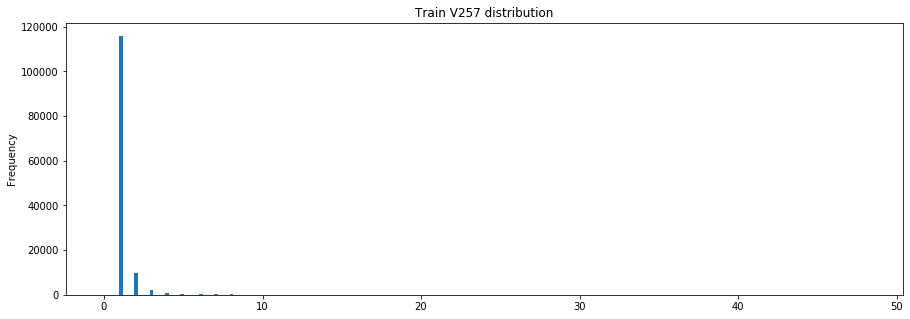

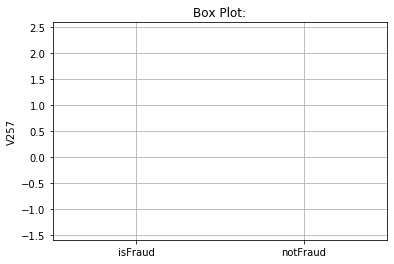

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V257
1     V246               0.905762
2     V199               0.871518
3     V190               0.780763
4     V258               0.779436
5      V44               0.766933
342  addr2              -0.052649
343     D2              -0.086468
344     D8              -0.095893
345     D7              -0.121150
346     D5              -0.127358
--------------------------------------------------
Describing  V257  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.250993       2.961342          1.106015
std         1.299956       3.923475          0.509331
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       2.000000          1.000000
75%         1.000000       3.000000          1.000000
max      

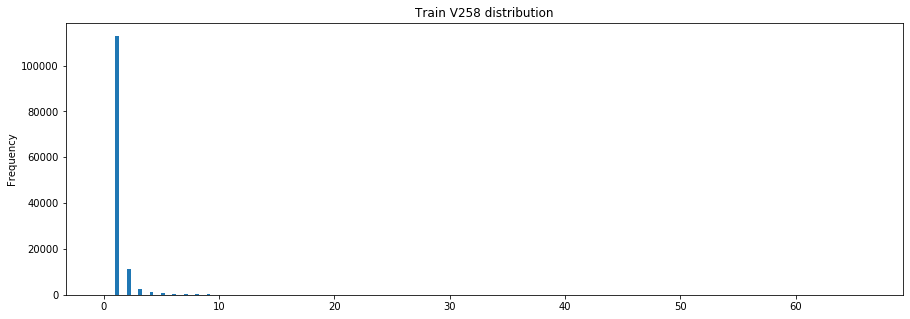

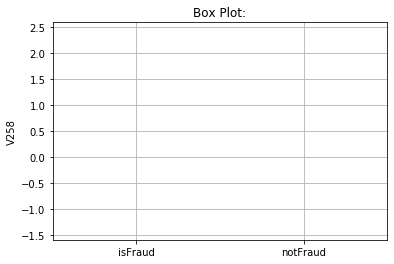

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V258
1     V243               0.883010
2     V230               0.857729
3     V229               0.833344
4     V257               0.779436
5     V246               0.740122
342    D13              -0.042898
343     D2              -0.056874
344     D8              -0.080982
345     D7              -0.120765
346     D5              -0.123402
--------------------------------------------------
Describing  V258  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.343510       3.400903          1.169115
std         2.015811       4.493237          1.519058
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       2.000000          1.000000
75%         1.000000       4.000000          1.000000
max      

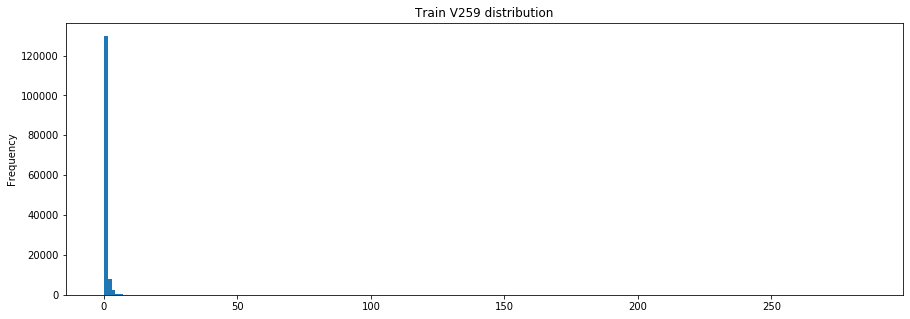

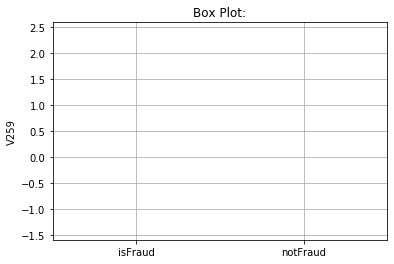

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V259
1     V245               0.943832
2     V221               0.927828
3     V222               0.901667
4     V227               0.826610
5     V255               0.821271
342    D10              -0.078808
343     D7              -0.084981
344     D5              -0.102476
345     D2              -0.118886
346    D14              -0.170348
--------------------------------------------------
Describing  V259  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        0.967832       2.072300          0.874841
std         2.113447       3.741202          1.884947
min         0.000000       0.000000          0.000000
25%         1.000000       0.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max       

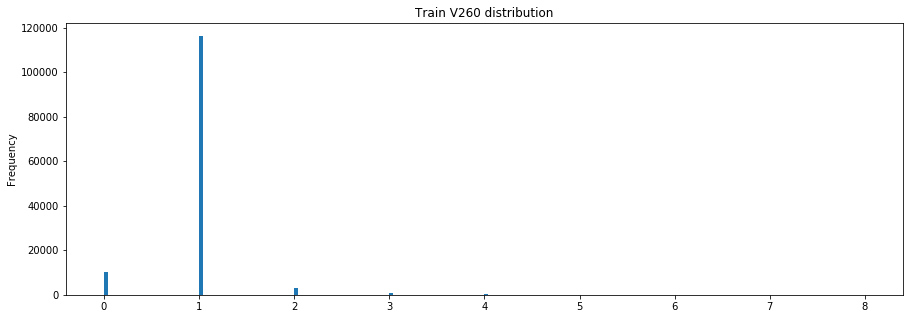

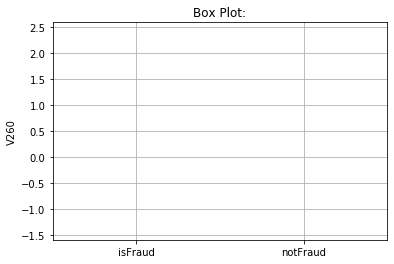

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V260
1     V262               0.739626
2     V261               0.475751
3     V324               0.322480
4     V323               0.321245
5     V322               0.320766
342    V80              -0.080646
343    V15              -0.083309
344    V33              -0.084012
345    V18              -0.091054
346    V17              -0.114753
--------------------------------------------------
Describing  V260  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        0.964425       1.127355          0.950615
std         0.379828       0.683625          0.338300
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

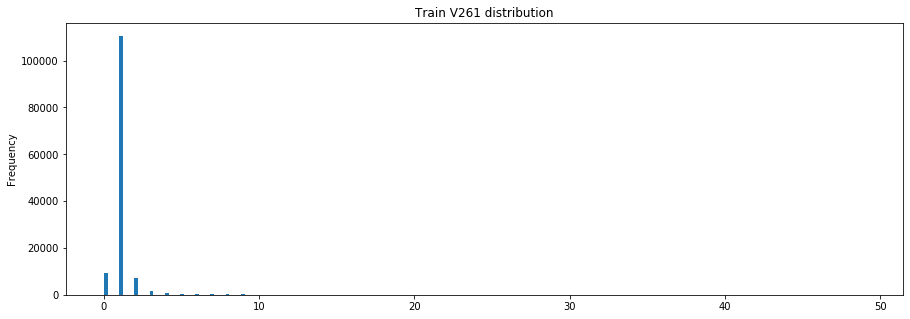

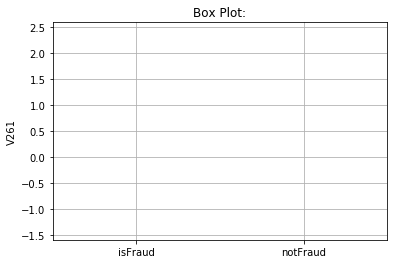

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V261
1     V262               0.854025
2     V224               0.813530
3     V229               0.801337
4     V225               0.786467
5     V253               0.773576
342    V15              -0.118550
343    V33              -0.118582
344   V250              -0.119474
345    V20              -0.124353
346    V19              -0.145104
--------------------------------------------------
Describing  V261  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.107161       1.583399          1.066793
std         1.323230       1.946924          1.247890
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max      

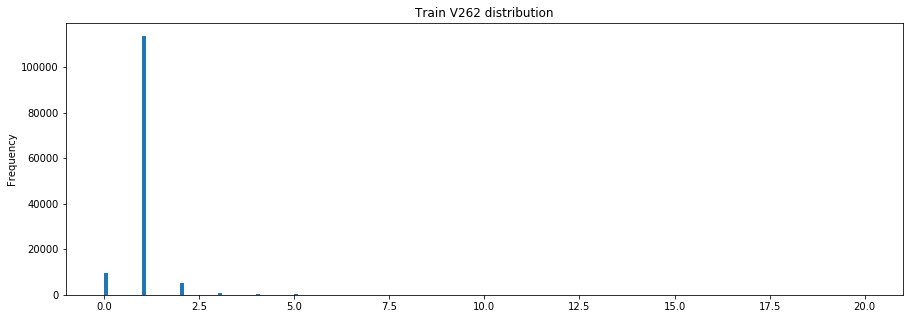

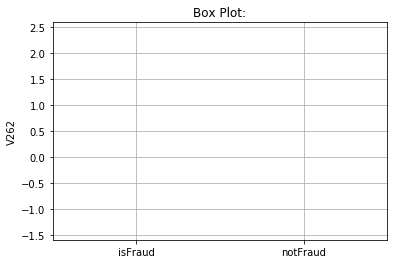

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V262
1     V261               0.854025
2     V260               0.739626
3     V243               0.640161
4     V229               0.637100
5     V225               0.614214
342    V34              -0.072455
343    V17              -0.072724
344    V19              -0.079195
345    V15              -0.080571
346    V33              -0.080724
--------------------------------------------------
Describing  V262  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        1.013279       1.336244          0.985903
std         0.625455       1.185672          0.543699
min         0.000000       0.000000          0.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max      

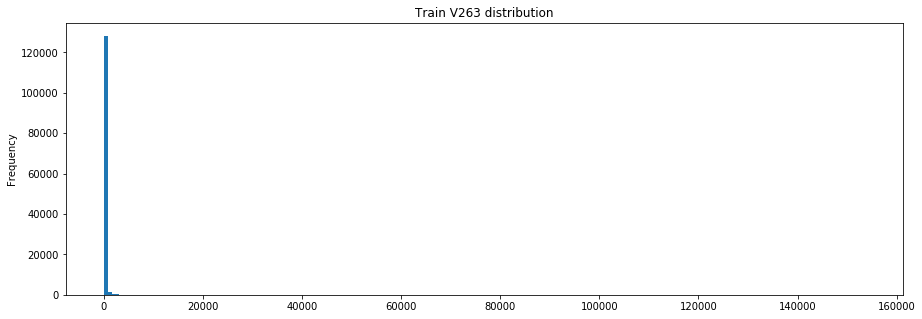

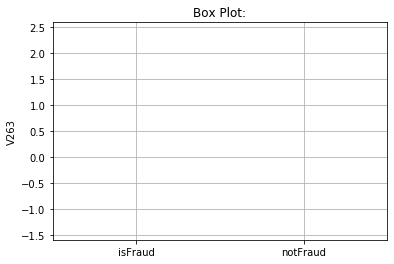

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V263
1     V202               0.965592
2     V204               0.921738
3     V265               0.906093
4     V306               0.894083
5     V331               0.891289
342    V33              -0.152939
343    V57              -0.153533
344    V20              -0.173753
345    V61              -0.182369
346    V19              -0.199575
--------------------------------------------------
Describing  V263  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean      117.390676     182.903241        111.837490
std      1294.851543     381.478067       1343.887442
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      44.976200          0.000000
75%         0.000000     200.000000          0.000000
max    15

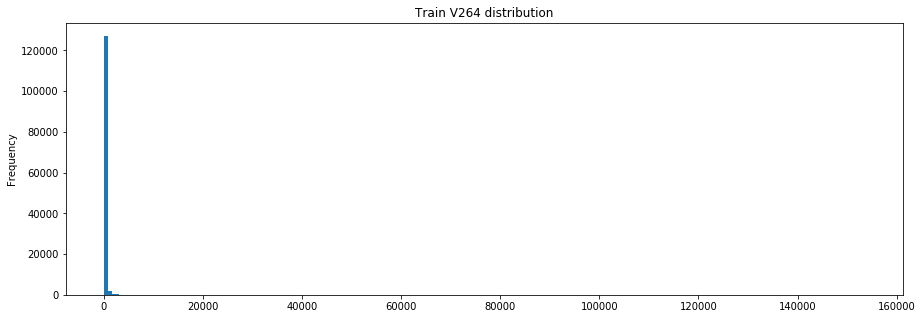

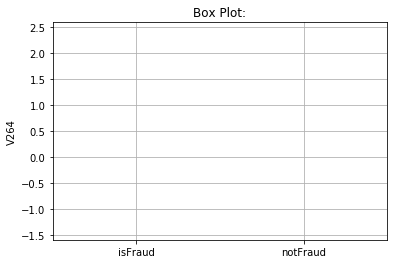

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V264
1     V274               0.886197
2     V265               0.852047
3     V203               0.840049
4     V204               0.816350
5     V267               0.776705
342    V33              -0.165091
343    V57              -0.167011
344    V20              -0.175476
345    V61              -0.189313
346    V19              -0.201539
--------------------------------------------------
Describing  V264  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean      201.657617     275.094347        195.432737
std      2284.827492     553.838224       2374.122496
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      78.924500          0.000000
75%        33.593498     300.000000         19.817801
max    15

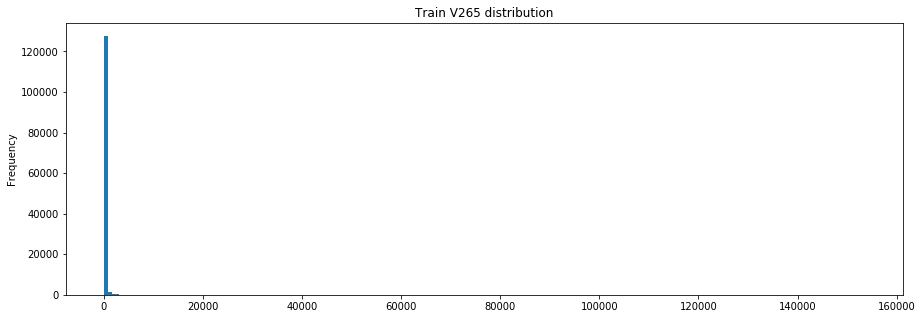

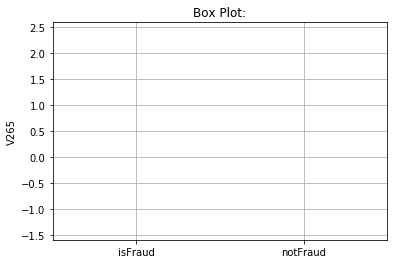

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V265
1     V204               0.950778
2     V203               0.917215
3     V202               0.907536
4     V263               0.906093
5     V275               0.861035
342    V33              -0.162173
343    V57              -0.162948
344    V20              -0.181499
345    V61              -0.190389
346    V19              -0.208551
--------------------------------------------------
Describing  V265  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean      153.520534     231.958628        146.871712
std      1605.512276     459.758418       1666.639314
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      62.353401          0.000000
75%        20.897525     256.954865          0.000000
max    15

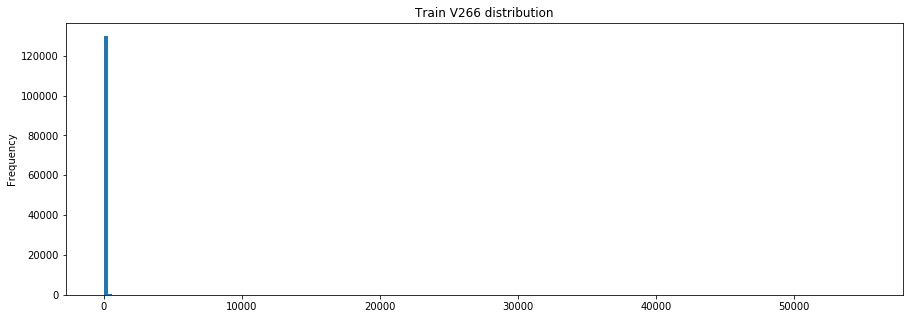

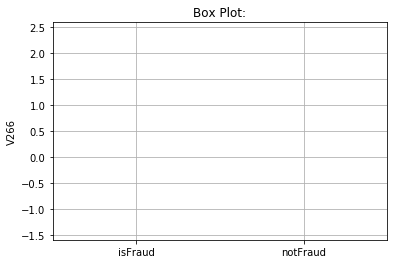

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V266
1     V269               0.996097
2     V205               0.982005
3     V129               0.960216
4     V206               0.956989
5     V309               0.948351
342    V94              -0.034301
343    V52              -0.035879
344    V51              -0.035941
345    D12              -0.039041
346     D5              -0.085600
--------------------------------------------------
Describing  V266  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        9.167839       5.411525          9.486243
std       208.038863      28.666797        216.513053
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max     5

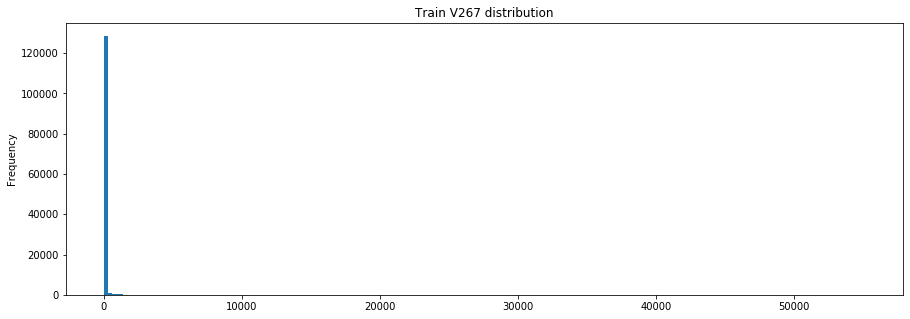

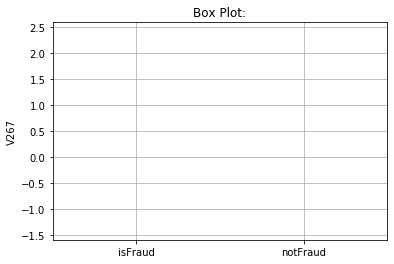

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V267
1     V253               0.893545
2     V268               0.881998
3     V254               0.862880
4     V224               0.852091
5     V248               0.843572
342    V57              -0.097401
343    V34              -0.098721
344    V19              -0.098908
345    V15              -0.103652
346    V33              -0.104975
--------------------------------------------------
Describing  V267  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean       36.525103      20.156896         37.912557
std       644.878586      80.393649        671.228294
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max     5

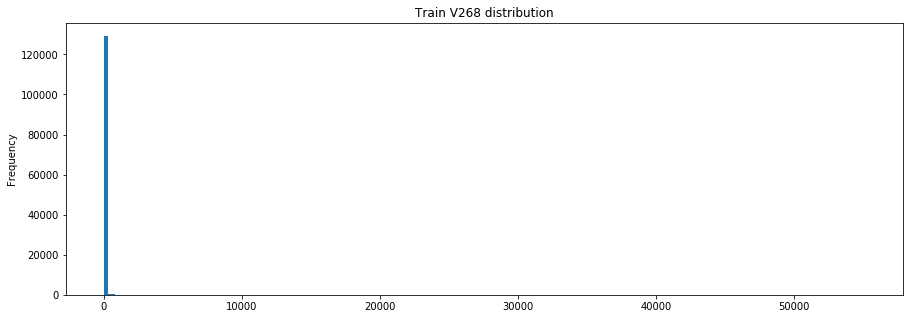

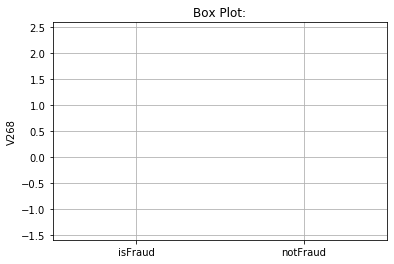

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V268
1     V267               0.881998
2     V207               0.875118
3     V205               0.832261
4     V206               0.807669
5     V266               0.758496
342    V19              -0.067524
343    V16              -0.068262
344    V34              -0.070343
345    V15              -0.073943
346    V33              -0.074832
--------------------------------------------------
Describing  V268  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean       18.813407      13.295416         19.281140
std       311.280181      63.343620        323.675597
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max     5

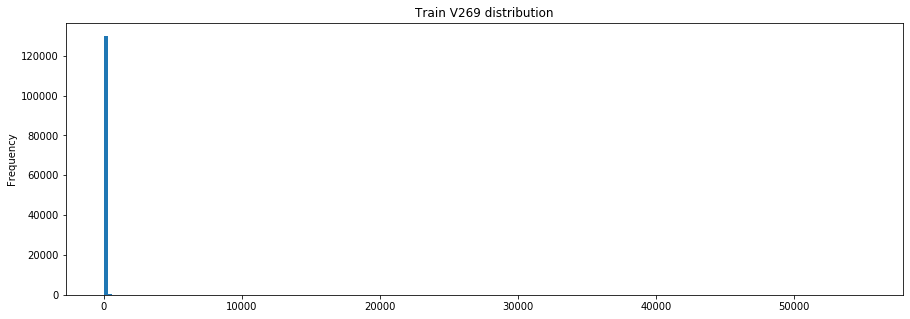

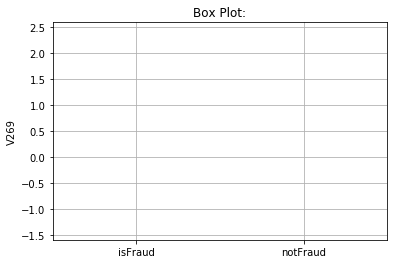

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V269
1     V266               0.996097
2     V205               0.979334
3     V129               0.961926
4     V206               0.955651
5     V309               0.946494
342    V15              -0.039485
343    V33              -0.040010
344    V94              -0.042018
345    V52              -0.082112
346    V51              -0.098059
--------------------------------------------------
Describing  V269  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean        5.997508       1.793073          6.353898
std       207.317539      22.423101        215.823094
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max     5

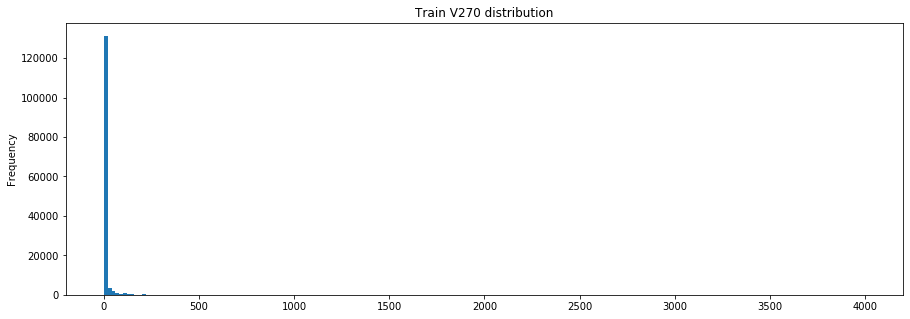

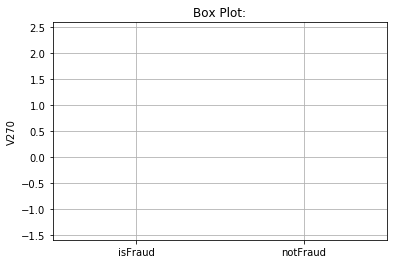

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V270
1     V272               0.959014
2     V271               0.922576
3     V208               0.683549
4     V161               0.560068
5     V163               0.529343
342    D14              -0.079342
343     D3              -0.082437
344     D5              -0.092305
345     D7              -0.103896
346     D2              -0.120691
--------------------------------------------------
Describing  V270  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        7.712764      11.253346          7.414661
std        65.507232      48.069232         66.759462
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      4

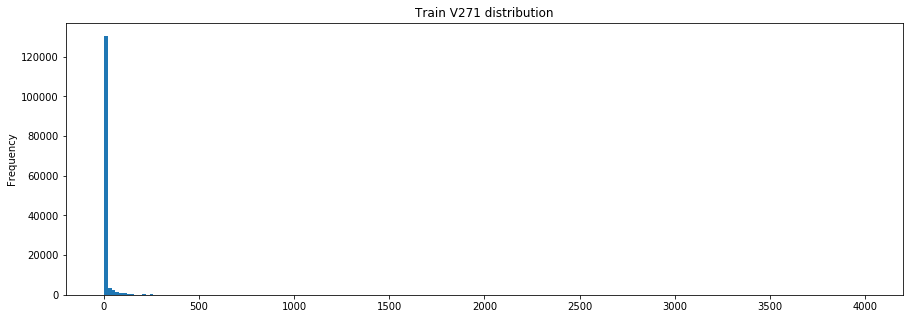

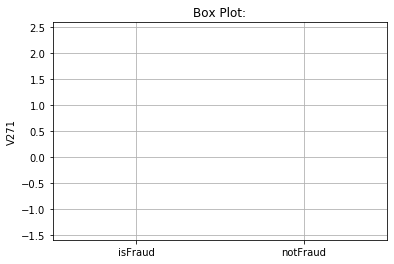

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V271
1     V272               0.970620
2     V270               0.922576
3     V208               0.637773
4     V163               0.554561
5     V162               0.541850
342     D3              -0.080852
343     D7              -0.085611
344     D5              -0.094221
345     D2              -0.101738
346    V94              -0.111896
--------------------------------------------------
Describing  V271  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        9.445133      16.408079          8.858882
std        74.147726      74.354161         74.100747
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      4

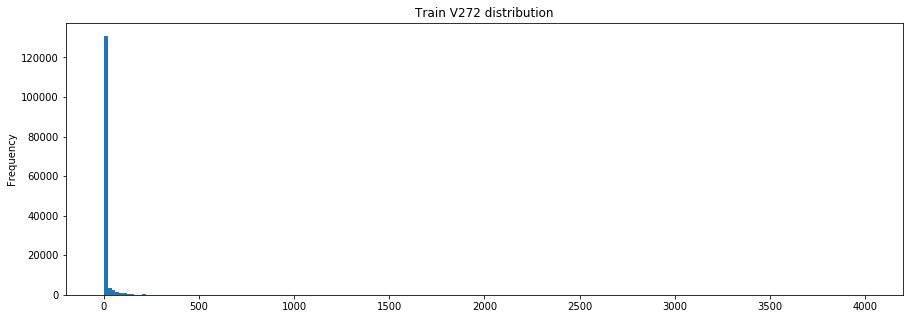

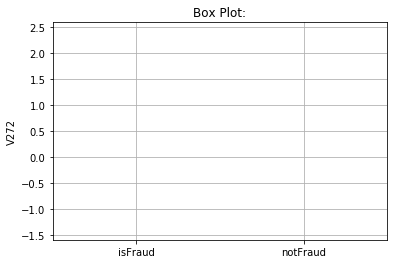

percentage of missing values: 76.0531039387679
--------------------------------------------------
Correlations: 
    Column  Correlation with V272
1     V271               0.970620
2     V270               0.959014
3     V208               0.661664
4     V163               0.577329
5     V162               0.543913
342     D3              -0.084639
343     D7              -0.085700
344    V94              -0.088421
345     D5              -0.094127
346     D2              -0.110789
--------------------------------------------------
Describing  V272  :
               Train  isFraud Train  isNotFraud Train
count  141416.000000   10982.000000     130434.000000
mean        8.464571      14.563545          7.951063
std        69.723735      68.029692         69.840441
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max      4

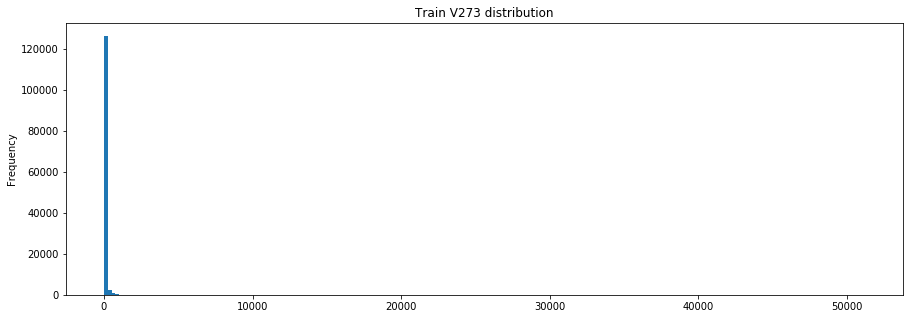

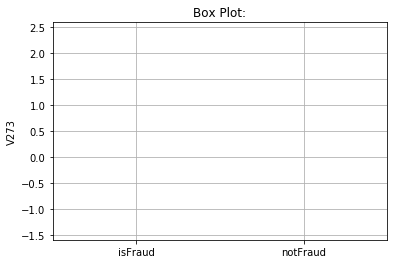

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V273
1     V211               0.960453
2     V231               0.952443
3     V217               0.950550
4     V275               0.949556
5     V233               0.944524
342    V33              -0.136896
343    V57              -0.143711
344    V20              -0.169868
345    V61              -0.178266
346    V19              -0.195121
--------------------------------------------------
Describing  V273  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean       73.825549     124.177259         69.557475
std       935.187927     302.272394        969.914136
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000     121.081802          0.000000
max     5

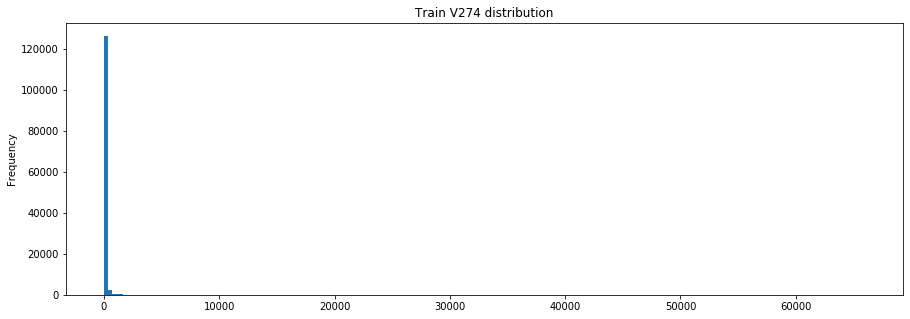

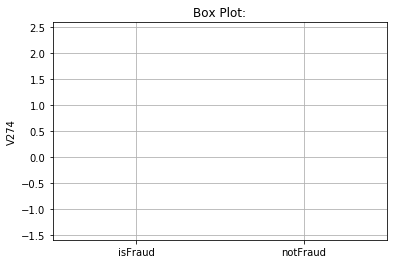

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V274
1     V212               0.913147
2     V218               0.911002
3     V213               0.894562
4     V275               0.890307
5     V264               0.886197
342    V33              -0.146745
343    V57              -0.151744
344    V20              -0.172916
345    V61              -0.182610
346    V19              -0.198711
--------------------------------------------------
Describing  V274  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean      107.151636     174.240926        101.464798
std      1258.734139     373.562643       1306.320800
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      20.558701          0.000000
75%         0.000000     179.749496          0.000000
max     6

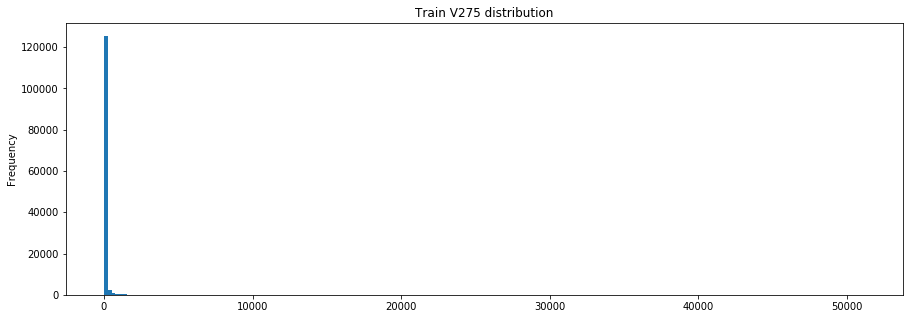

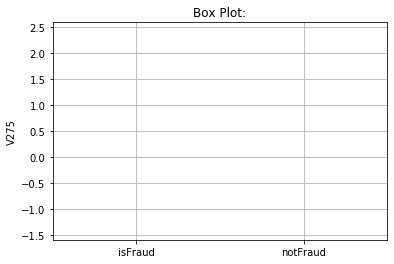

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V275
1     V213               0.955417
2     V273               0.949556
3     V211               0.938480
4     V212               0.932893
5     V219               0.924827
342    V33              -0.142629
343    V57              -0.148321
344    V20              -0.174566
345    V61              -0.181554
346    V19              -0.200704
--------------------------------------------------
Describing  V275  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean       88.899939     151.988036         83.552263
std      1072.883139     339.219874       1112.893253
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      10.000000          0.000000
75%         0.000000     153.360271          0.000000
max     5

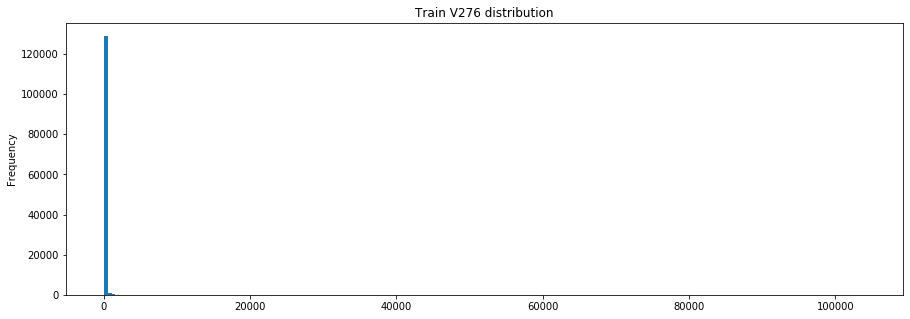

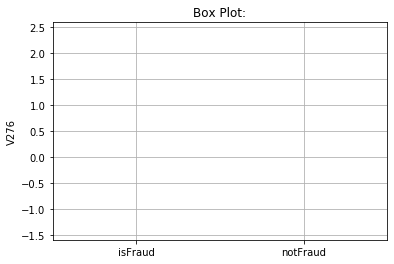

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V276
1     V214               0.990600
2     V278               0.949781
3     V216               0.949140
4     V215               0.929874
5     V319               0.882619
342    V51              -0.084263
343    V16              -0.085359
344    V34              -0.088040
345    V15              -0.092417
346    V33              -0.093580
--------------------------------------------------
Describing  V276  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean       31.797277      52.268202         30.062054
std       615.659714     207.245465        638.347369
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    10

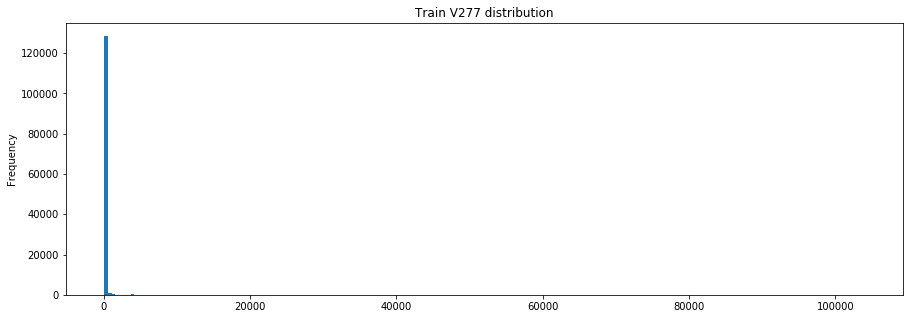

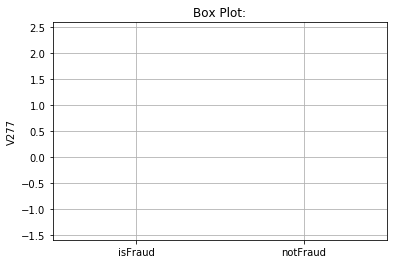

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V277
1     V215               0.950580
2     V278               0.948989
3     V216               0.939314
4     V214               0.891647
5     V276               0.865981
342    V34              -0.138295
343    V15              -0.145126
344    V61              -0.145681
345    V33              -0.147019
346    V19              -0.153900
--------------------------------------------------
Describing  V277  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean       51.956645      78.958558         49.667822
std       732.145368     307.370447        757.231698
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      17.106775          0.000000
max    10

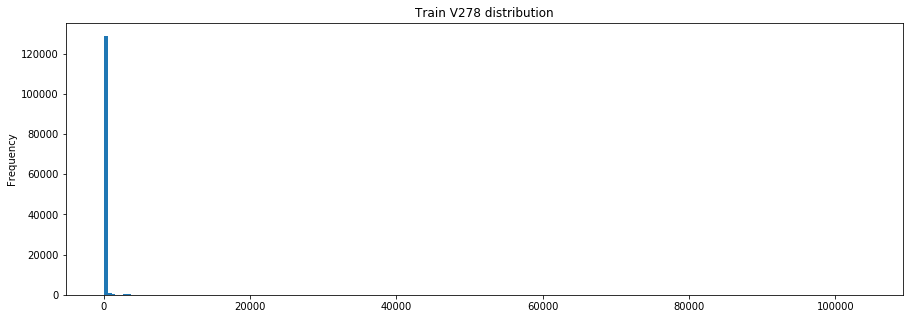

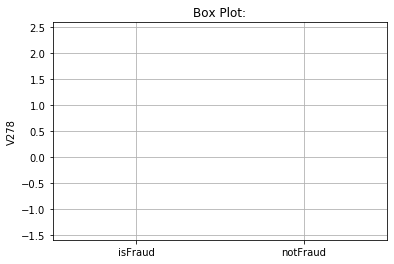

percentage of missing values: 77.91343516103905
--------------------------------------------------
Correlations: 
    Column  Correlation with V278
1     V216               0.984444
2     V215               0.971923
3     V276               0.949781
4     V277               0.948989
5     V214               0.941354
342    V57              -0.127721
343    V15              -0.130578
344    V33              -0.132274
345    V61              -0.137160
346    V19              -0.137902
--------------------------------------------------
Describing  V278  :
               Train  isFraud Train  isNotFraud Train
count  130430.000000   10192.000000     120238.000000
mean       42.328228      65.108035         40.397293
std       660.611820     247.687530        684.217058
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    10

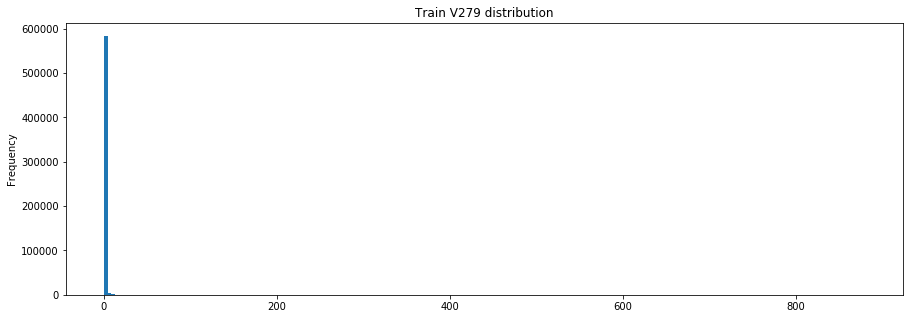

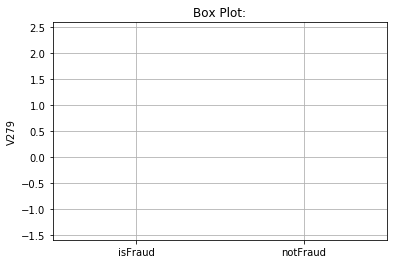

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V279
1     V322               0.999624
2     V293               0.999568
3      V95               0.998710
4     V101               0.998454
5     V132               0.994182
375   V155              -0.132419
376     D5              -0.136135
377   V148              -0.136824
378   V154              -0.144055
379   V153              -0.147172
--------------------------------------------------
Describing  V279  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        1.123061       0.708920          1.138076
std        21.021950       1.894142         21.396452
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max  

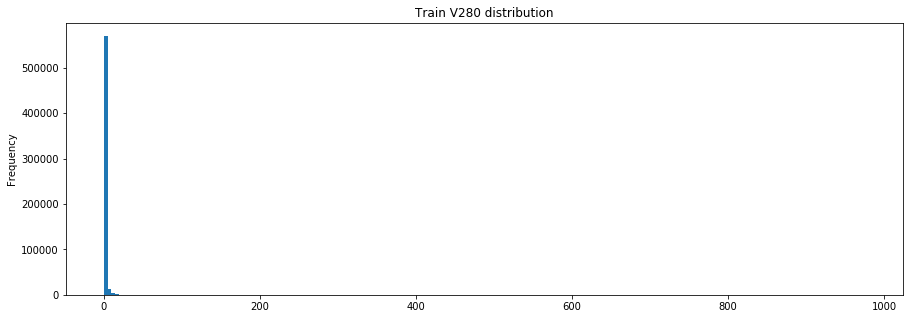

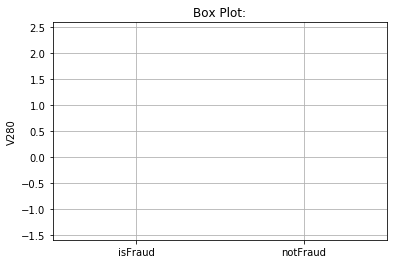

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V280
1     V324               0.999464
2     V295               0.998623
3     V323               0.992798
4     V333               0.990866
5     V318               0.990648
375   V155              -0.150482
376   V148              -0.155491
377    V10              -0.156717
378   V154              -0.163695
379   V153              -0.167216
--------------------------------------------------
Describing  V280  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        1.967082       1.852669          1.971230
std        27.851780       8.797109         28.302649
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       2.000000          1.000000
max  

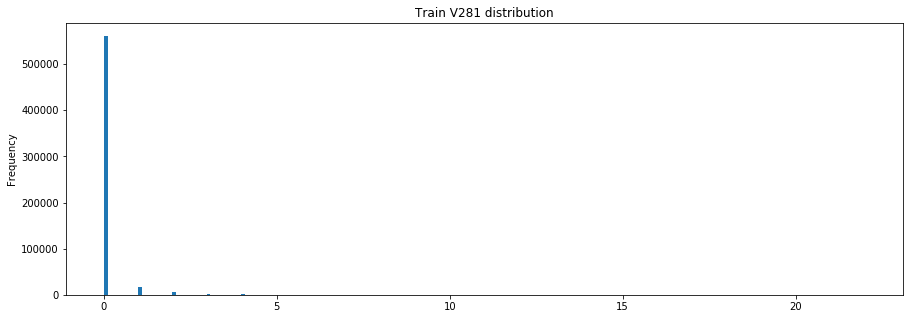

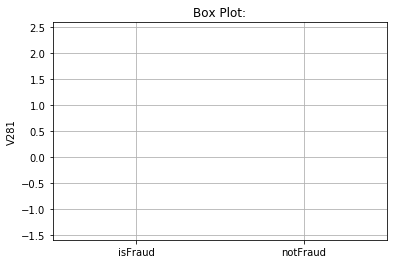

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V281
1     V282               0.636122
2      V55               0.528348
3     V169               0.510292
4     V138               0.504366
5     V283               0.481994
375    D15              -0.094841
376     D1              -0.096495
377     D3              -0.096940
378     D7              -0.124897
379     D2              -0.221436
--------------------------------------------------
Describing  V281  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean        0.087783       0.283358          0.080692
std         0.512748       0.996906          0.484742
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

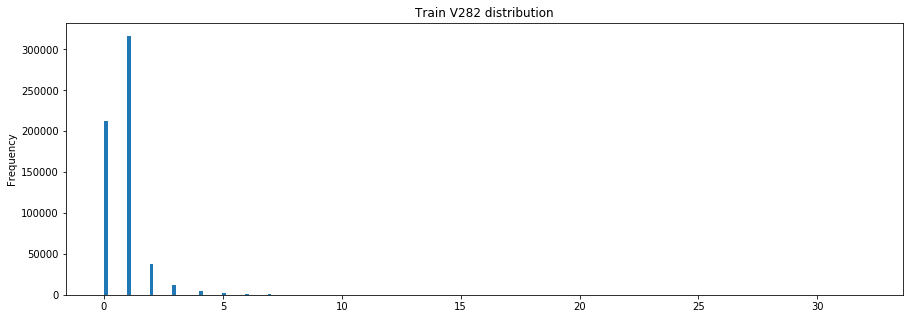

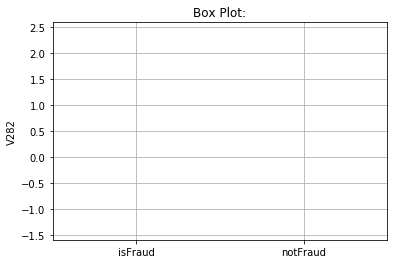

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V282
1     V283               0.710173
2     V281               0.636122
3     V139               0.628419
4     V140               0.610257
5      V55               0.487665
375     D4              -0.344152
376    D11              -0.366522
377    D15              -0.384283
378     D2              -0.453760
379     D1              -0.505305
--------------------------------------------------
Describing  V282  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean        0.817171       1.321288          0.798894
std         0.921880       1.329711          0.898346
min         0.000000       0.000000          0.000000
25%         0.000000       1.000000          0.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max    

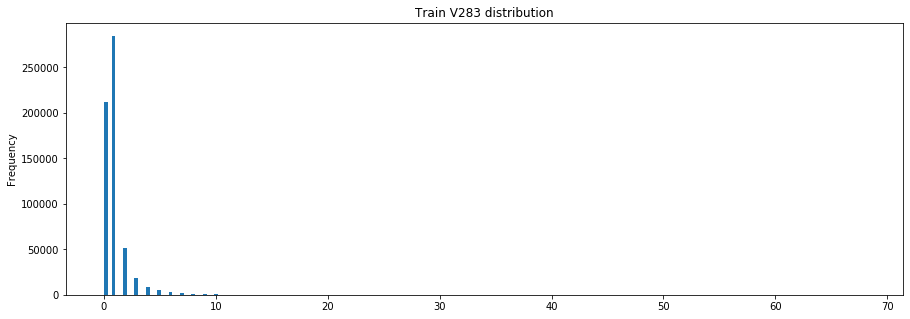

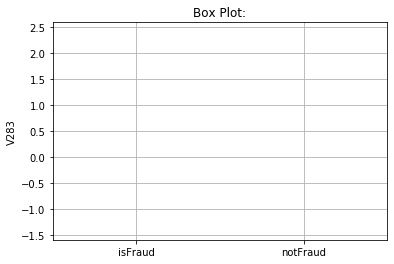

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V283
1     V282               0.710173
2     V140               0.610185
3     V139               0.596926
4     V289               0.554250
5     V281               0.481994
375     D4              -0.235371
376    D15              -0.263264
377    D11              -0.266716
378     D1              -0.355794
379     D2              -0.375585
--------------------------------------------------
Describing  V283  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean        0.991114       1.913955          0.957656
std         1.558731       2.932971          1.474404
min         0.000000       0.000000          0.000000
25%         0.000000       1.000000          0.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       2.000000          1.000000
max    

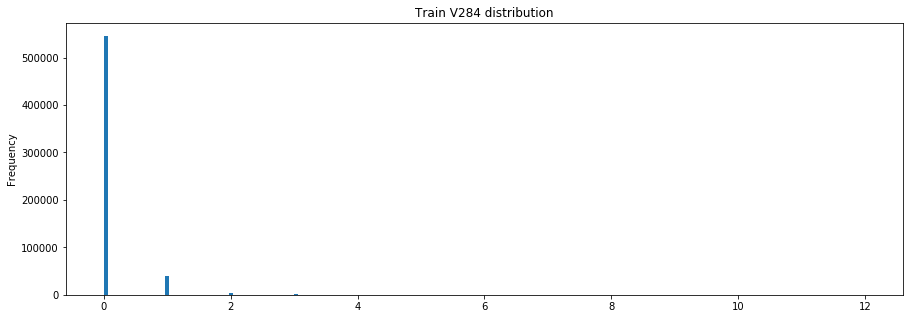

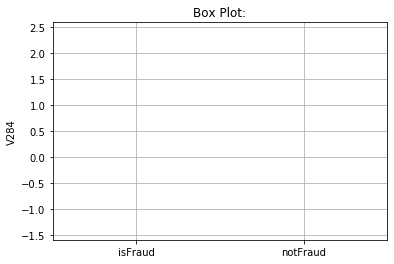

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V284
1     V325               0.920235
2      V98               0.792611
3     V223               0.621895
4     V286               0.566142
5     V327               0.541879
375     D8              -0.110103
376     D5              -0.141546
377     D3              -0.158400
378     D2              -0.166045
379     D7              -0.184306
--------------------------------------------------
Describing  V284  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.088543       0.151300          0.086267
std         0.338424       0.435648          0.334147
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

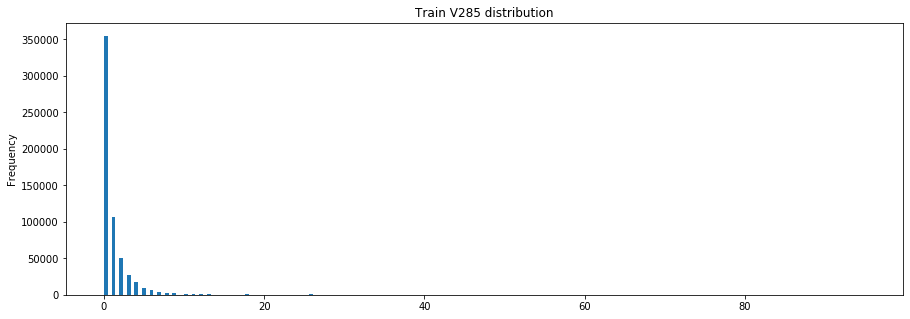

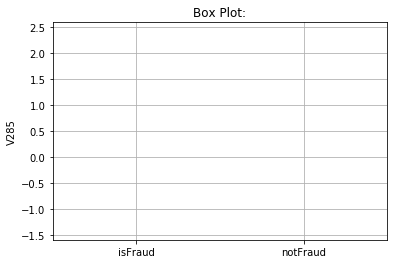

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V285
1     V326               0.959617
2     V327               0.903144
3      V99               0.858606
4     V287               0.830789
5     V329               0.781126
375   V149              -0.220170
376   V155              -0.227600
377   V148              -0.235145
378   V154              -0.246717
379   V153              -0.252419
--------------------------------------------------
Describing  V285  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        1.167660       1.010309          1.173365
std         3.282454       2.203654          3.314839
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         1.000000       1.000000          1.000000
max  

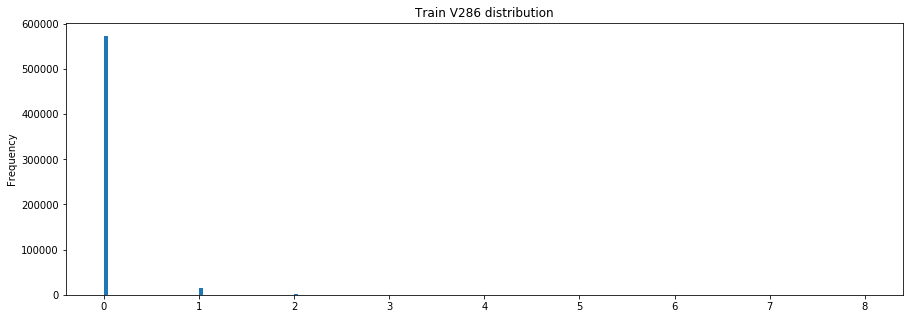

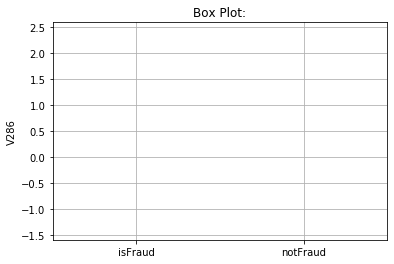

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V286
1     V173               0.755792
2     V284               0.566142
3     V223               0.542893
4     V325               0.531711
5     V174               0.430125
375     D8              -0.087193
376     D5              -0.092105
377     D3              -0.097749
378     D2              -0.116178
379     D7              -0.143905
--------------------------------------------------
Describing  V286  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.031492       0.035913          0.031332
std         0.190939       0.202758          0.190495
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

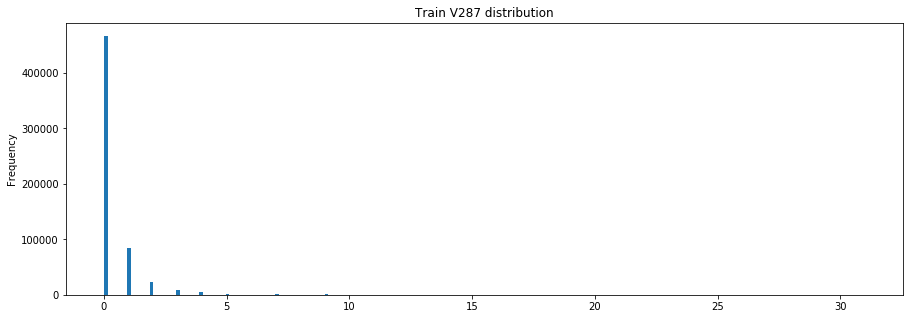

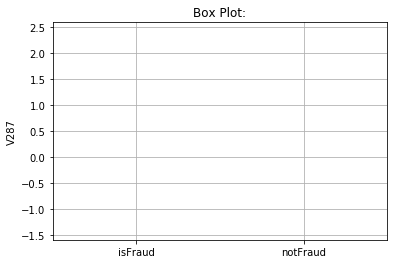

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V287
1     V327               0.968657
2     V326               0.921988
3     V100               0.863856
4     V285               0.830789
5     V329               0.812145
375   V149              -0.202440
376   V155              -0.209249
377   V148              -0.216305
378   V154              -0.226713
379   V153              -0.232106
--------------------------------------------------
Describing  V287  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.358579       0.474275          0.354384
std         1.078995       0.999167          1.081547
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max  

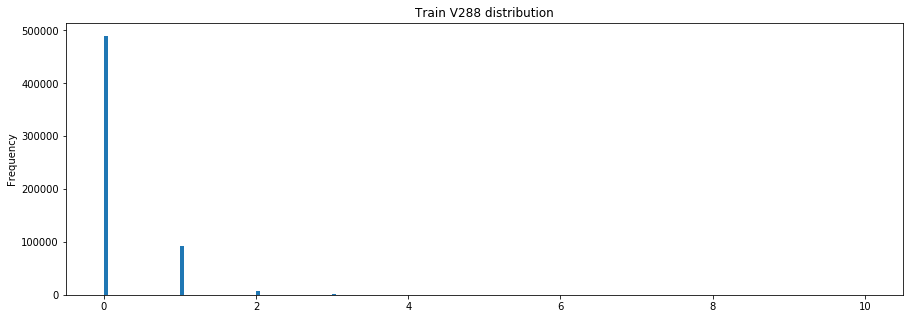

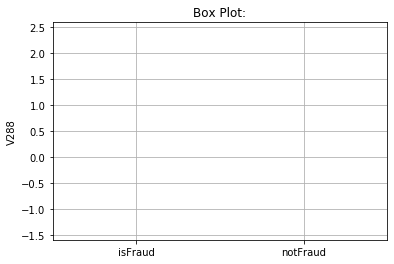

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V288
1     V289               0.888344
2     V174               0.574345
3     V313               0.513608
4     V315               0.511356
5     V327               0.504471
375     D5              -0.191218
376     D3              -0.204459
377     D1              -0.214799
378     D7              -0.235739
379     D2              -0.562187
--------------------------------------------------
Describing  V288  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean        0.184350       0.264296          0.181451
std         0.430989       0.526318          0.426852
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

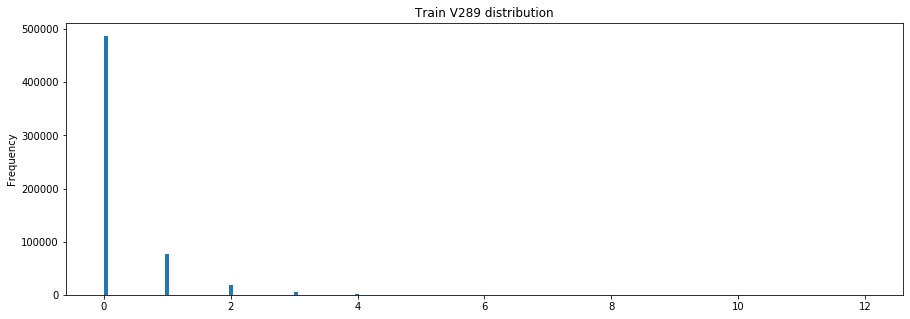

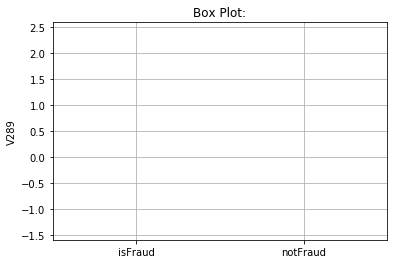

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V289
1     V288               0.888344
2     V315               0.560717
3     V283               0.554250
4     V314               0.533570
5     V174               0.516377
375     D5              -0.181000
376     D3              -0.191498
377     D1              -0.195403
378     D7              -0.213132
379     D2              -0.507014
--------------------------------------------------
Describing  V289  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean        0.235975       0.370131          0.231111
std         0.599231       0.804965          0.589855
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

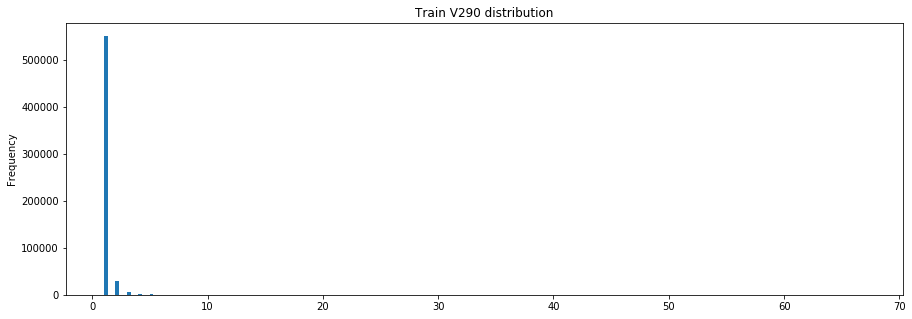

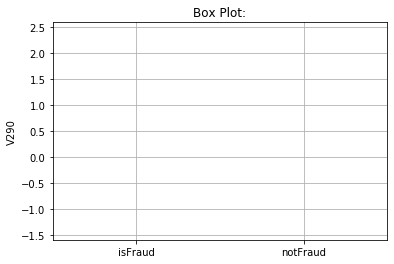

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V290
1     V292               0.817300
2     V291               0.740426
3      V56               0.663716
4      V55               0.611955
5     V228               0.407726
375     D8              -0.095167
376    V69              -0.095672
377     D7              -0.103757
378     D3              -0.110288
379     D2              -0.153382
--------------------------------------------------
Describing  V290  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        1.103011       1.265137          1.097133
std         0.768897       1.433346          0.732916
min         1.000000       1.000000          1.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max  

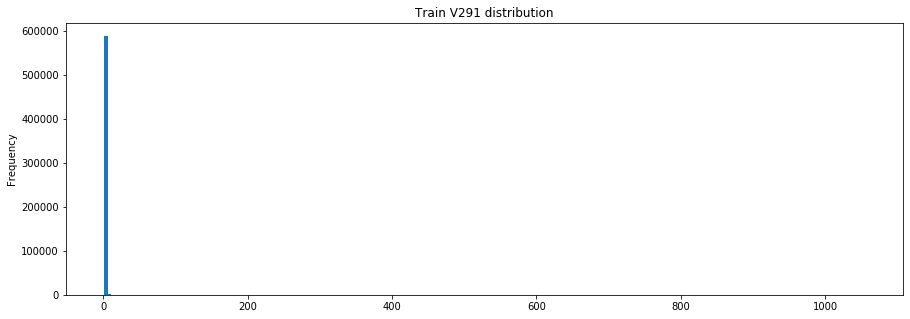

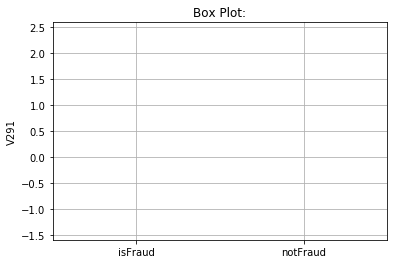

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V291
1     V292               0.965462
2     V290               0.740426
3      V56               0.657934
4     V294               0.415304
5      V55               0.414929
375    V23              -0.083794
376   V154              -0.089333
377   V153              -0.092128
378     D2              -0.155741
379     D3              -0.178576
--------------------------------------------------
Describing  V291  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000    20661.00000     569867.000000
mean        1.659811        3.40453          1.596555
std        16.252538       38.56033         14.822321
min         1.000000        1.00000          1.000000
25%         1.000000        1.00000          1.000000
50%         1.000000        1.00000          1.000000
75%         1.000000        2.00000          1.000000
max  

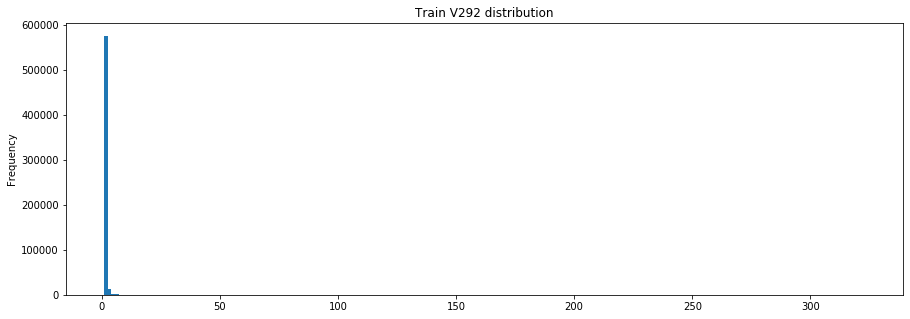

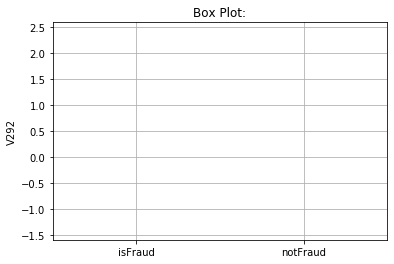

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V292
1     V291               0.965462
2     V290               0.817300
3      V56               0.737437
4      V55               0.530908
5     V294               0.399304
375    V70              -0.101636
376    V10              -0.108297
377    V69              -0.112916
378     D3              -0.144654
379     D2              -0.179389
--------------------------------------------------
Describing  V292  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        1.239916       1.770824          1.220667
std         3.775050       8.173748          3.512115
min         1.000000       1.000000          1.000000
25%         1.000000       1.000000          1.000000
50%         1.000000       1.000000          1.000000
75%         1.000000       1.000000          1.000000
max  

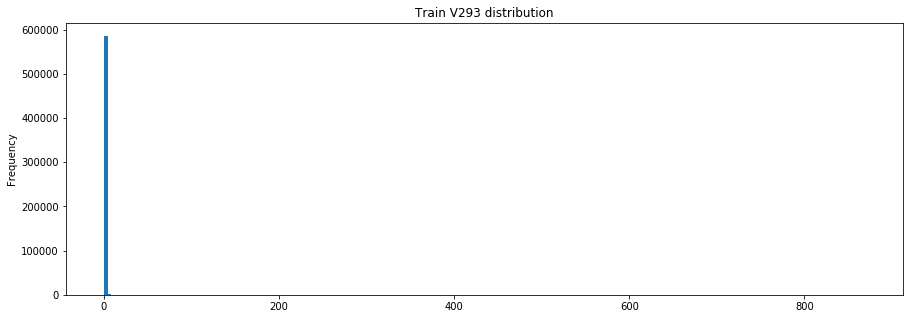

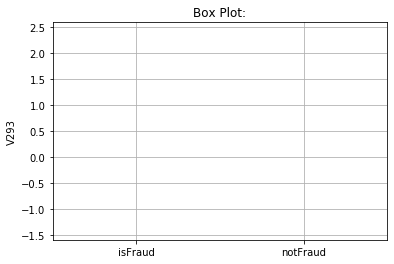

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V293
1     V279               0.999568
2     V322               0.999403
3     V101               0.998919
4      V95               0.998475
5     V132               0.994567
375   V149              -0.126851
376   V155              -0.130924
377   V148              -0.135292
378   V154              -0.142470
379   V153              -0.145479
--------------------------------------------------
Describing  V293  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.942599       0.455931          0.960243
std        20.588816       1.713467         20.955974
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

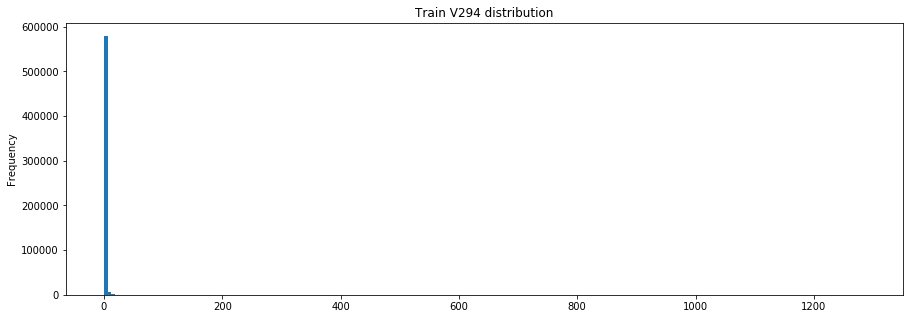

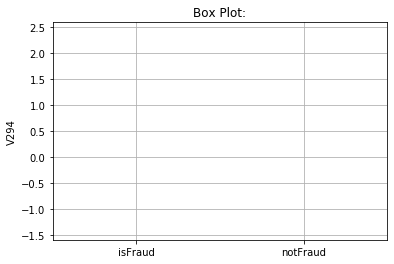

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V294
1     V323               0.998592
2     V332               0.994633
3     V324               0.989226
4     V333               0.983708
5     V317               0.983119
375   V149              -0.138251
376   V155              -0.142694
377   V148              -0.147437
378   V154              -0.155243
379   V153              -0.158516
--------------------------------------------------
Describing  V294  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        2.313863       3.194134          2.281948
std        39.526468      38.656394         39.557319
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max  

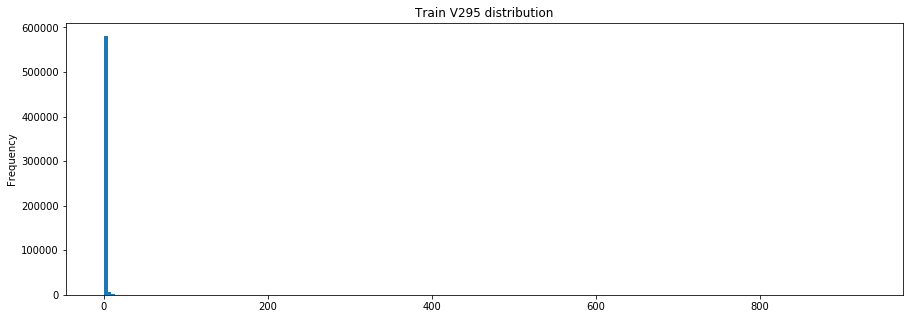

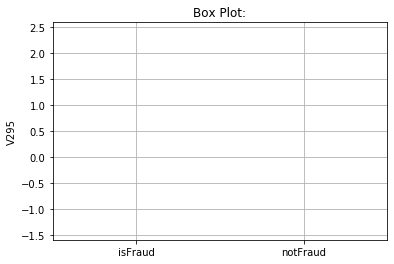

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V295
1     V324               0.998827
2     V280               0.998623
3     V323               0.993571
4     V318               0.991884
5     V333               0.990713
375   V149              -0.142526
376   V155              -0.147110
377   V148              -0.152002
378   V154              -0.160061
379   V153              -0.163438
--------------------------------------------------
Describing  V295  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        1.433424       1.204153          1.441736
std        25.962948       8.524928         26.379483
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       1.000000          0.000000
max  

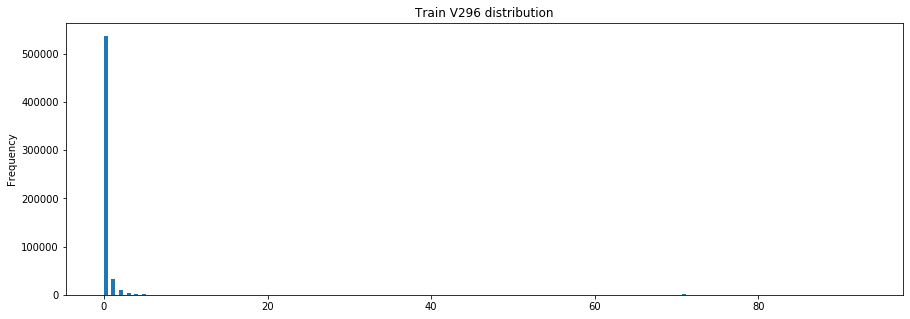

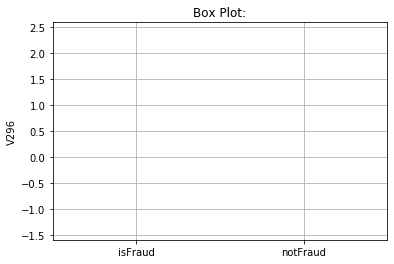

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V296
1     V298               0.991666
2     V329               0.991243
3     V105               0.959819
4     V330               0.956443
5     V324               0.949447
375   V149              -0.161570
376   V155              -0.167090
377   V148              -0.172742
378   V154              -0.181656
379   V153              -0.185979
--------------------------------------------------
Describing  V296  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean        0.328917       0.400252          0.326330
std         3.264745       2.481276          3.289619
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

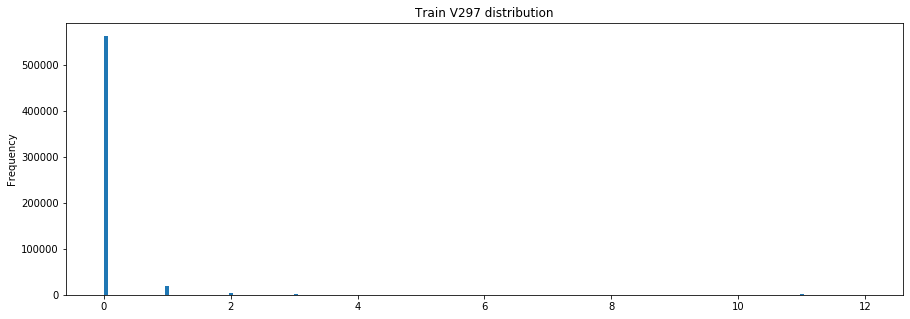

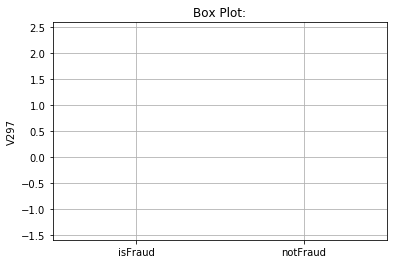

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V297
1     V328               0.967934
2     V330               0.938134
3     V104               0.917608
4     V329               0.897362
5     V299               0.894365
375   V250              -0.138185
376   V155              -0.142777
377   V148              -0.147098
378   V154              -0.153695
379   V153              -0.159789
--------------------------------------------------
Describing  V297  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.089034       0.097382          0.088731
std         0.628352       0.504005          0.632400
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

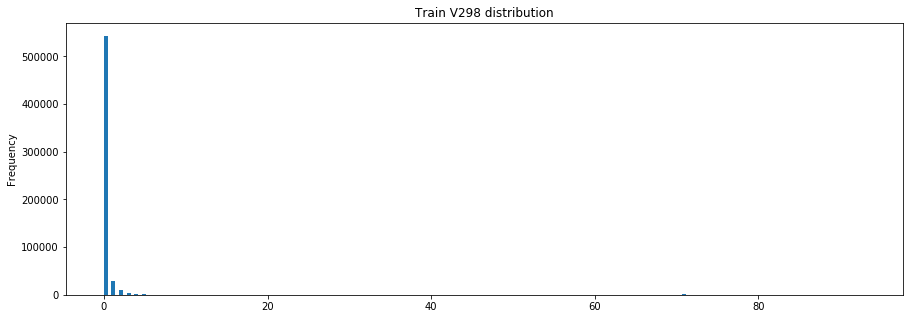

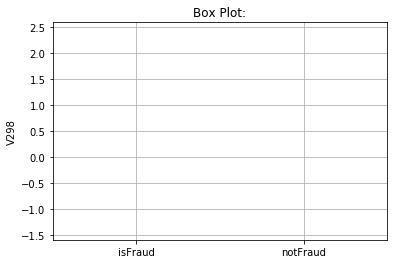

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V298
1     V329               0.995524
2     V296               0.991666
3     V105               0.978285
4     V330               0.961629
5     V324               0.956529
375   V149              -0.158824
376   V155              -0.164268
377   V148              -0.169815
378   V154              -0.178575
379   V153              -0.182837
--------------------------------------------------
Describing  V298  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.298829       0.320410          0.298047
std         3.175062       1.848509          3.212883
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

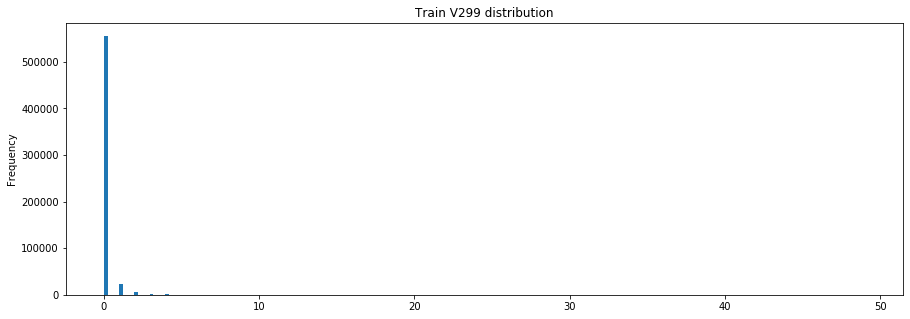

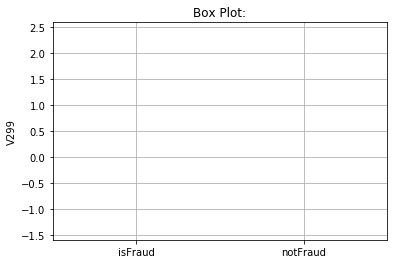

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V299
1     V330               0.992977
2     V106               0.977030
3     V329               0.974647
4     V298               0.955615
5     V105               0.950781
375   V149              -0.156015
376   V155              -0.161794
377   V148              -0.167245
378   V154              -0.175717
379   V153              -0.180358
--------------------------------------------------
Describing  V299  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.171655       0.168869          0.171756
std         1.724218       0.881503          1.747153
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

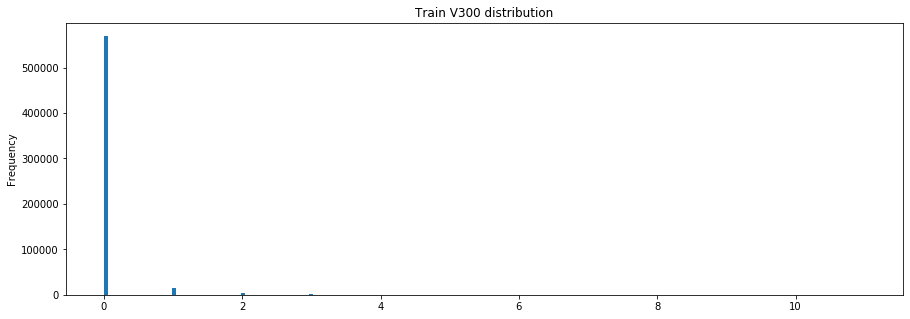

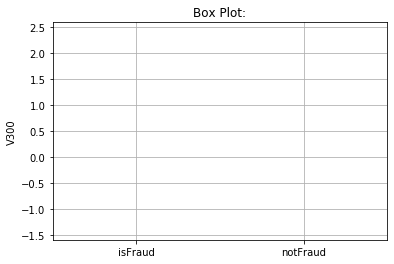

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V300
1     V301               0.928109
2     V146               0.601917
3     V147               0.594288
4     V184               0.559163
5     V238               0.510045
375     D5              -0.073430
376     D3              -0.077645
377     D1              -0.089465
378     D7              -0.092679
379     D2              -0.102812
--------------------------------------------------
Describing  V300  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean        0.045507       0.084008          0.044111
std         0.289573       0.420798          0.283579
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

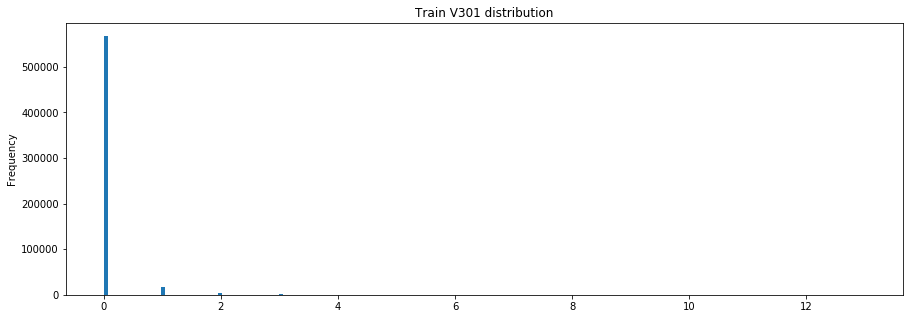

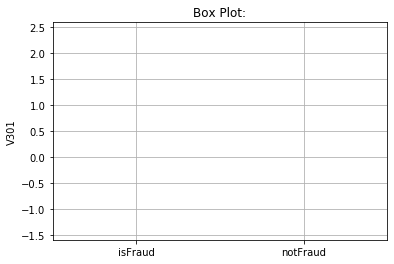

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V301
1     V300               0.928109
2     V146               0.596855
3     V147               0.593181
4     V184               0.548098
5     V238               0.498684
375     D5              -0.076571
376     D3              -0.079982
377     D7              -0.091517
378     D1              -0.091773
379     D2              -0.115247
--------------------------------------------------
Describing  V301  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean        0.052002       0.105641          0.050057
std         0.318310       0.494239          0.309888
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

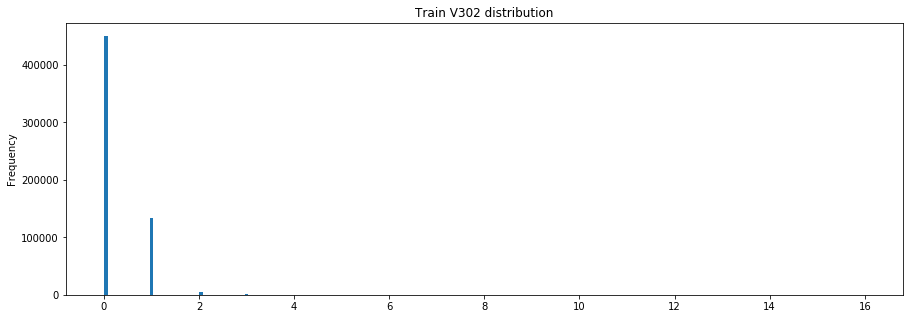

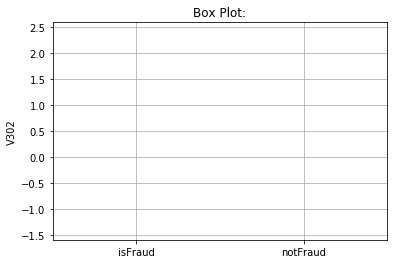

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V302
1     V304               0.962786
2      V59               0.925841
3      V60               0.914733
4      V21               0.890931
5      V80               0.884808
362    V53              -0.393258
363    V13              -0.398045
364    V35              -0.403448
365    V54              -0.403914
366    V36              -0.412265
--------------------------------------------------
Describing  V302  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.251761       0.588113          0.239566
std         0.481889       0.604951          0.472353
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       1.000000          0.000000
max  

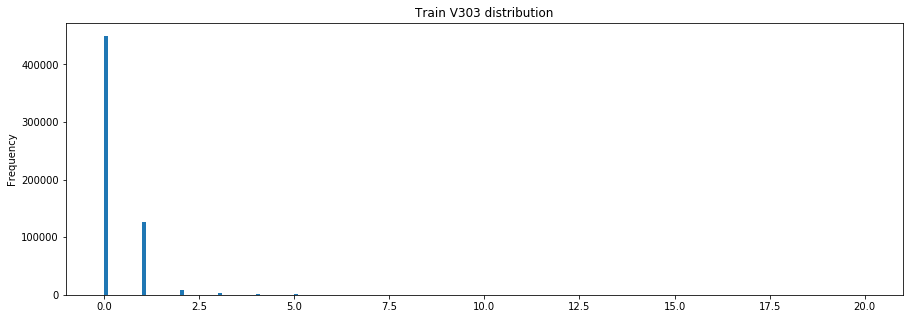

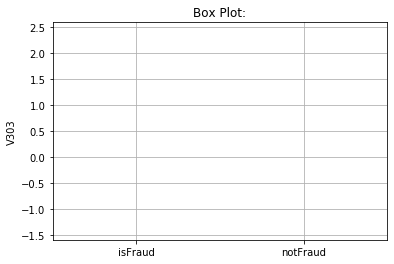

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V303
1     V304               0.937836
2     V302               0.878828
3      V60               0.844695
4      V59               0.807207
5      V81               0.785296
375    V76              -0.341369
376    V53              -0.345545
377    V54              -0.354908
378    V35              -0.356561
379    V36              -0.364353
--------------------------------------------------
Describing  V303  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.283140       0.690189          0.268382
std         0.623608       0.846492          0.608920
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       1.000000          0.000000
max  

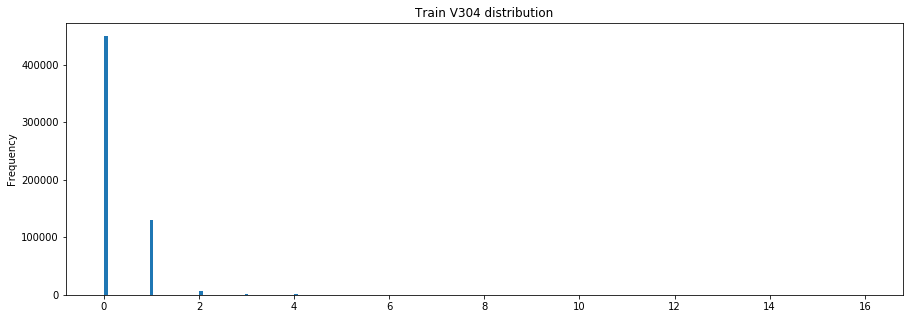

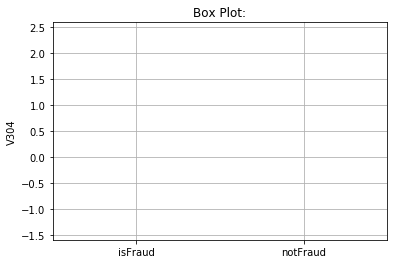

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V304
1     V302               0.962786
2     V303               0.937836
3      V60               0.906584
4      V59               0.879559
5      V81               0.865869
375    V13              -0.377731
376    V76              -0.377997
377    V54              -0.384475
378    V35              -0.389780
379    V36              -0.398299
--------------------------------------------------
Describing  V304  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        0.264208       0.629011          0.250981
std         0.528238       0.686876          0.516766
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       1.000000          0.000000
75%         0.000000       1.000000          0.000000
max  

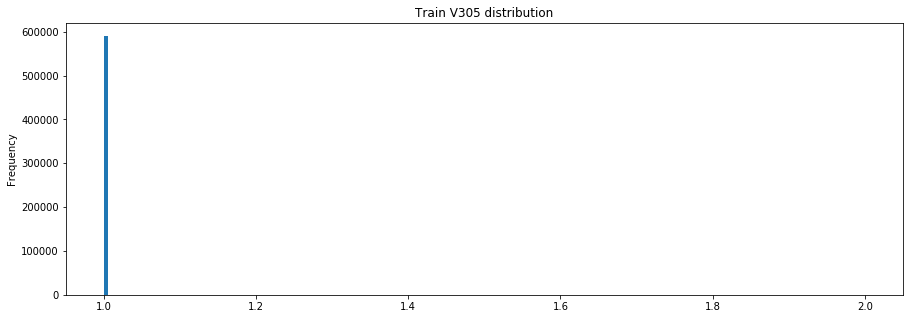

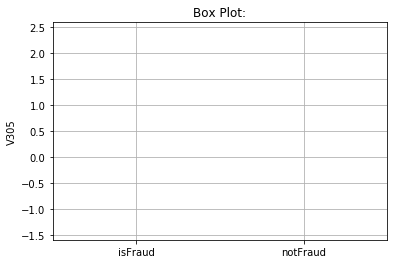

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
             Column  Correlation with V305
1              V310               0.002470
2    TransactionAmt               0.002380
3               V35               0.002365
4               V75               0.002167
5               V36               0.002083
206            V282              -0.002310
207             V67              -0.005654
208             V66              -0.006209
209             V26              -0.006502
210             V25              -0.007191
--------------------------------------------------
Describing  V305  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000        20661.0     569867.000000
mean        1.000007            1.0          1.000007
std         0.002603            0.0          0.002649
min         1.000000            1.0          1.000000
25%         1.000000            1.0          1.000000
50%         1.

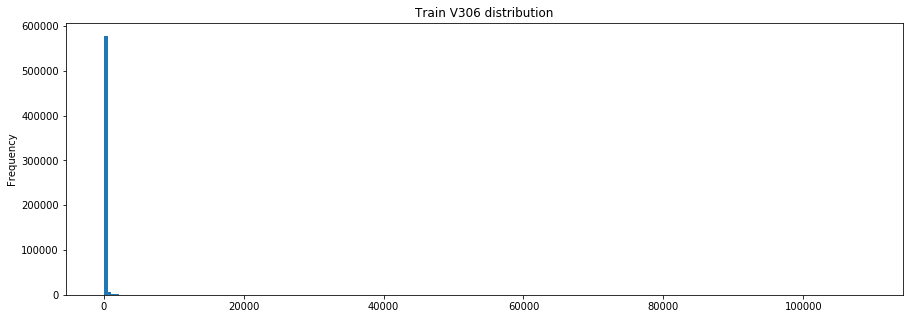

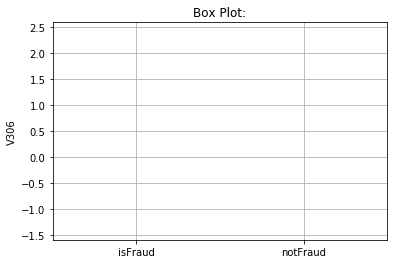

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V306
1     V331               0.993540
2     V126               0.991851
3     V202               0.988554
4     V316               0.987767
5     V322               0.986307
375   V149              -0.125816
376   V155              -0.129762
377   V148              -0.134315
378   V154              -0.141764
379   V153              -0.144888
--------------------------------------------------
Describing  V306  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean      139.748713     116.765349        140.581994
std      2348.849634     402.869710       2389.815422
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      54.225399          0.000000
max  

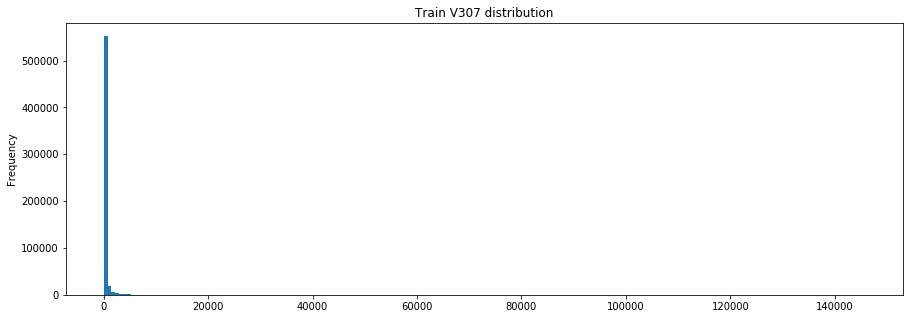

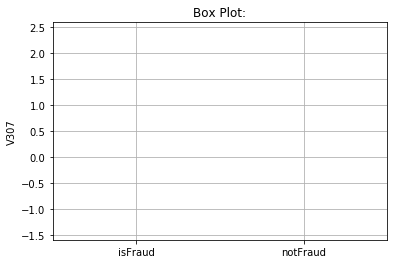

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V307
1     V332               0.996515
2     V323               0.993701
3     V317               0.991723
4     V333               0.988320
5     V324               0.984823
375   V149              -0.139444
376   V155              -0.143919
377   V148              -0.148809
378   V154              -0.156873
379   V153              -0.160259
--------------------------------------------------
Describing  V307  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean      408.682375     545.881593        403.708103
std      4391.992977    3097.849804       4431.742064
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000      12.809000          0.000000
75%       151.380680     273.850006        150.000000
max  

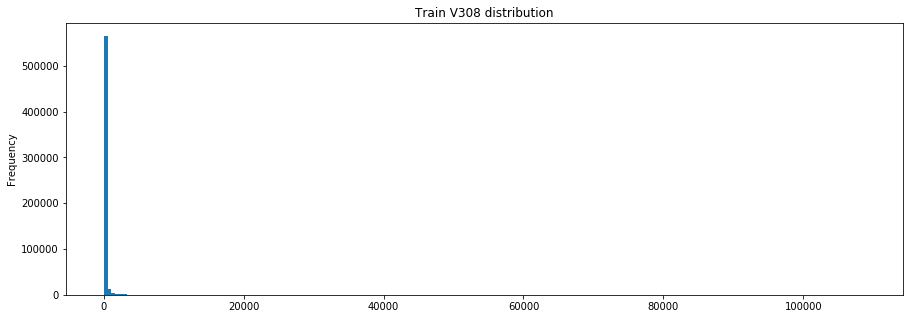

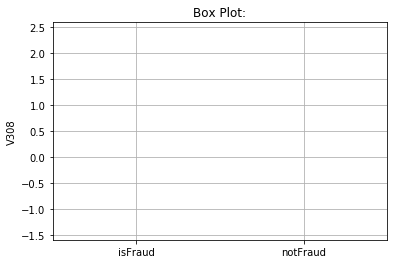

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V308
1     V333               0.995064
2     V318               0.990722
3     V324               0.990242
4     V332               0.989445
5     V128               0.988756
375   V149              -0.141604
376   V155              -0.146144
377   V148              -0.151161
378   V154              -0.159447
379   V153              -0.162919
--------------------------------------------------
Describing  V308  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean      230.413180     282.044788        228.541233
std      3021.924247    1032.666247       3069.911131
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%        35.970001     156.774002         34.000000
max  

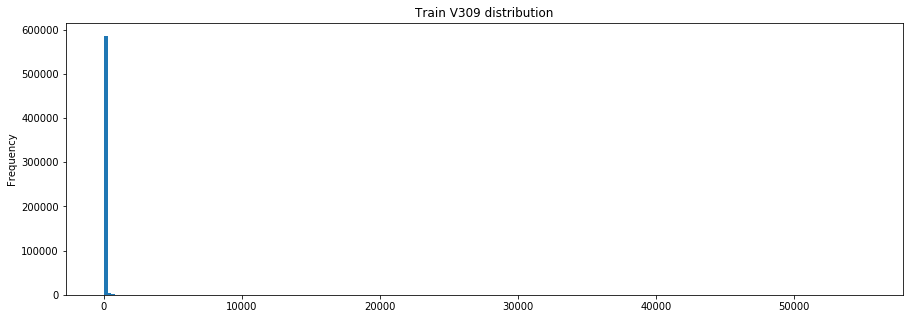

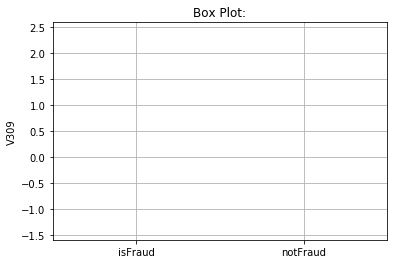

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V309
1     V334               0.953625
2     V266               0.948351
3     V269               0.946494
4     V206               0.946407
5     V129               0.920793
375    V11              -0.039368
376    V10              -0.043092
377     D3              -0.056067
378     D2              -0.058572
379     D5              -0.075603
--------------------------------------------------
Describing  V309  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean       10.995986      23.363125         10.547606
std       116.254277     104.910410        116.620286
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

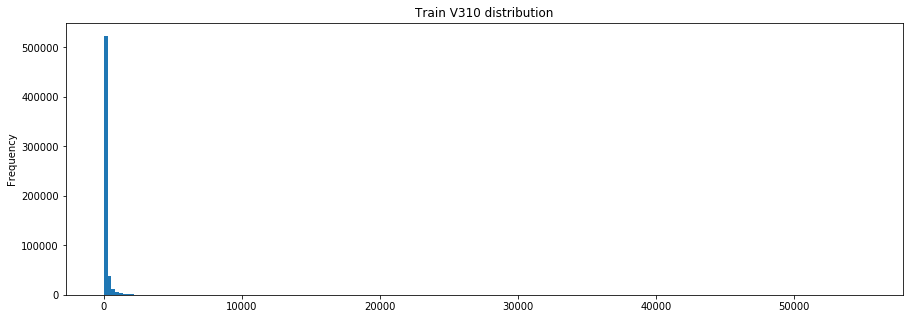

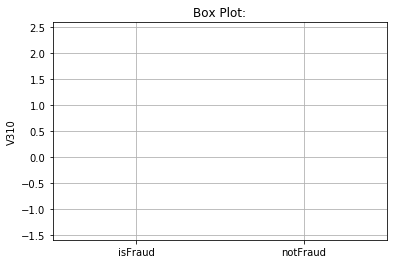

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V310
1     V130               0.841170
2     V335               0.826378
3     V266               0.800428
4     V269               0.799620
5     V336               0.759210
375   V154              -0.133808
376   V153              -0.136785
377    V50              -0.143396
378     D5              -0.166969
379     D3              -0.172224
--------------------------------------------------
Describing  V310  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean      118.195658     138.719226        117.451559
std       352.983093     402.308240        351.042468
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%       107.949997      97.000000        107.949997
max  

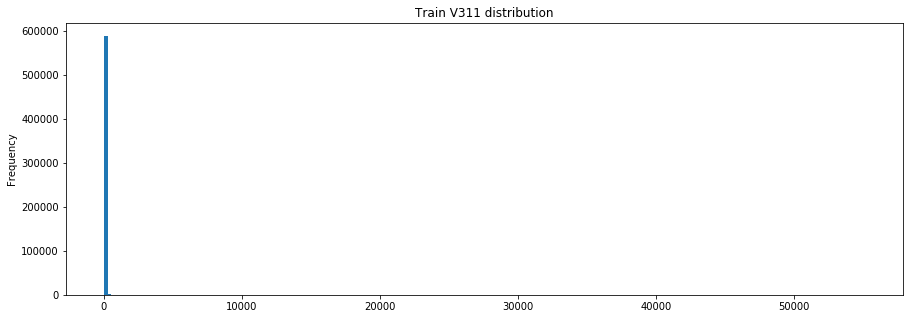

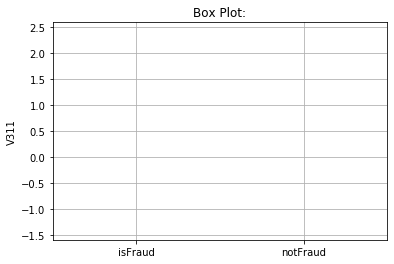

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V311
1     V206               0.973025
2     V266               0.927814
3     V269               0.926861
4     V334               0.923437
5     V309               0.882926
375     D4              -0.011191
376    D12              -0.022356
377     D3              -0.023314
378     D2              -0.026891
379     D5              -0.041964
--------------------------------------------------
Describing  V311  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean        4.202175       4.901211          4.176831
std       102.374938      42.340216        103.901884
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

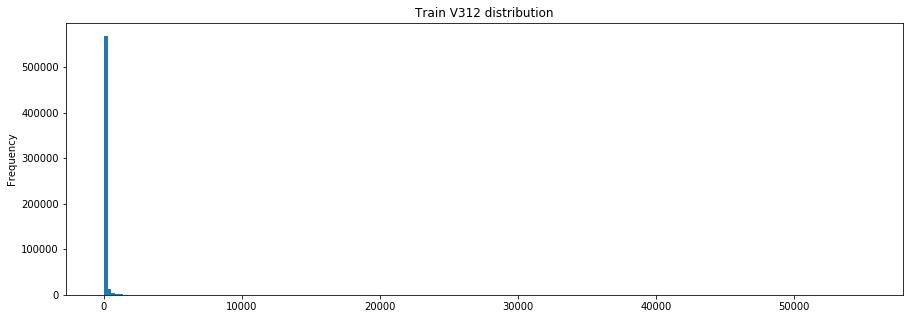

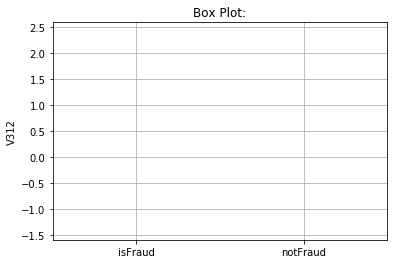

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V312
1     V336               0.938161
2     V266               0.906615
3     V269               0.904972
4     V131               0.870205
5     V334               0.863292
375    V50              -0.089909
376    V11              -0.116256
377    V10              -0.129309
378     D3              -0.133703
379     D5              -0.137011
--------------------------------------------------
Describing  V312  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean       39.173910      73.144119         37.942292
std       172.128339     221.490399        169.942491
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      30.950001          0.000000
max  

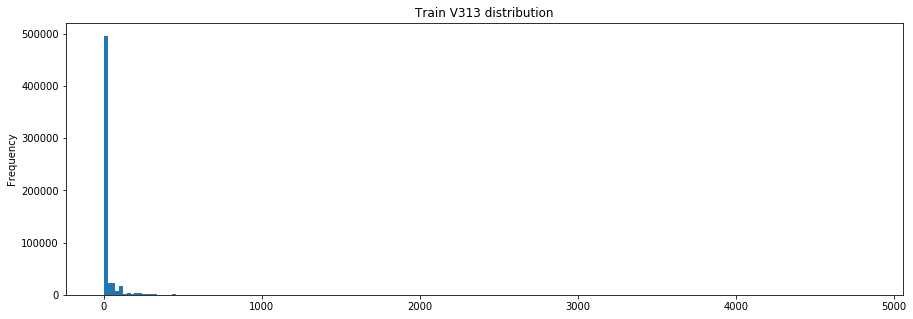

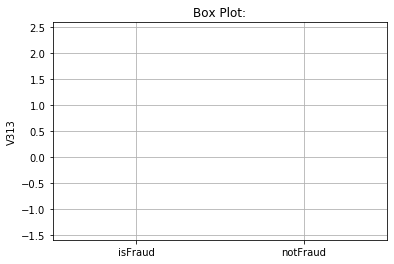

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V313
1     V315               0.918433
2     V314               0.749145
3     V288               0.513608
4     V208               0.505646
5     V289               0.449700
375     D5              -0.097326
376     D3              -0.100523
377     D1              -0.112717
378     D7              -0.151184
379     D2              -0.274715
--------------------------------------------------
Describing  V313  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean       21.351473      42.250735         20.593754
std        95.902970     139.558705         93.852655
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

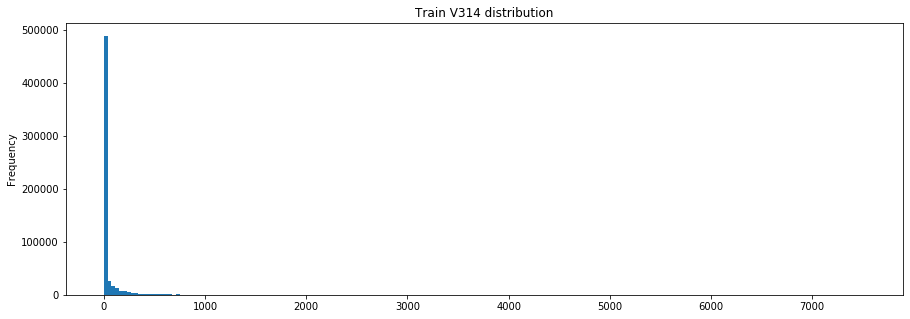

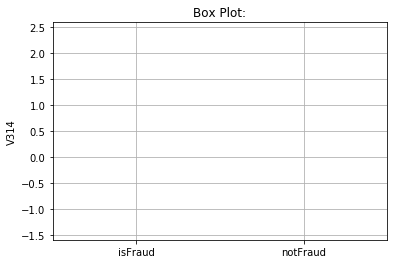

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V314
1     V315               0.839912
2     V330               0.783155
3     V329               0.767362
4     V327               0.758571
5     V313               0.749145
375   V250              -0.137618
376   V148              -0.138597
377   V154              -0.147040
378   V153              -0.150813
379     D2              -0.292848
--------------------------------------------------
Describing  V314  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean       43.319174      78.456388         42.045247
std       173.619028     258.446060        169.612774
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

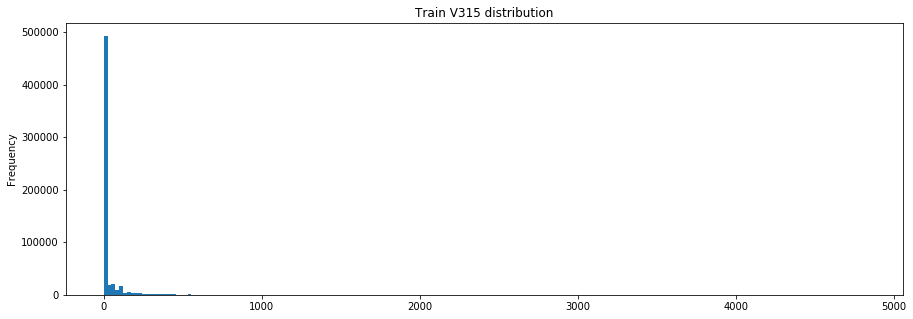

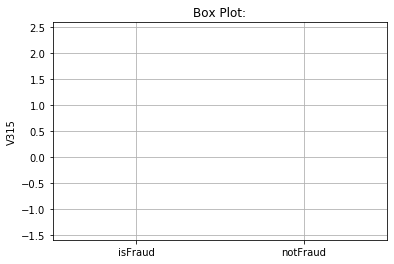

percentage of missing values: 0.21488806854743117
--------------------------------------------------
Correlations: 
    Column  Correlation with V315
1     V313               0.918433
2     V314               0.839912
3     V289               0.560717
4     V208               0.527195
5     V288               0.511356
375     D5              -0.103221
376     D3              -0.106669
377     D1              -0.114994
378     D7              -0.153037
379     D2              -0.282132
--------------------------------------------------
Describing  V315  :
               Train  isFraud Train  isNotFraud Train
count  589271.000000   20617.000000     568654.000000
mean       26.806977      56.447212         25.732347
std       116.853222     187.113982        113.346437
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    

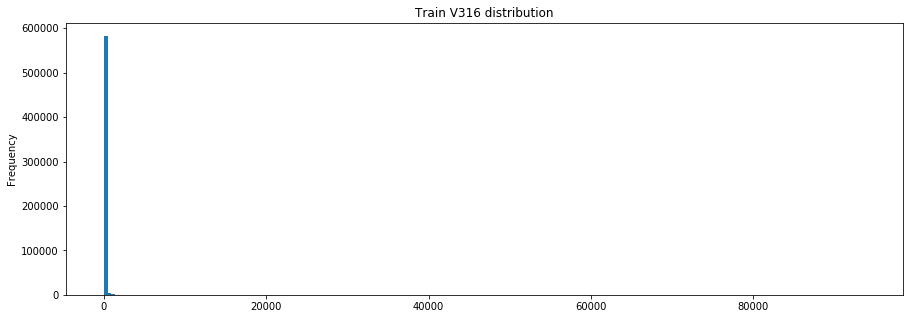

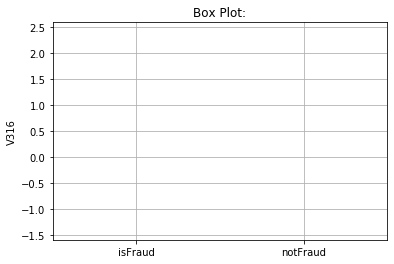

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V316
1     V322               0.997477
2     V132               0.997222
3     V293               0.993841
4     V279               0.993526
5     V211               0.993173
375   V149              -0.125140
376   V155              -0.129053
377   V148              -0.133493
378   V154              -0.140916
379   V153              -0.143902
--------------------------------------------------
Describing  V316  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean      109.818544      74.526581        111.098084
std      2270.033202     336.081637       2309.921526
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

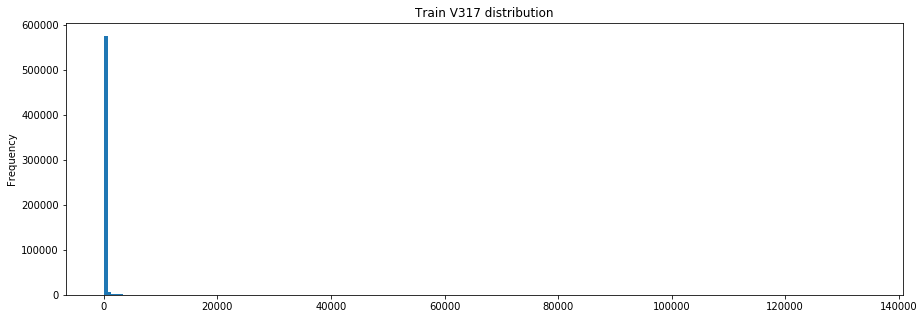

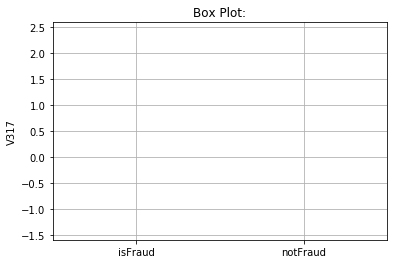

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V317
1     V323               0.997066
2     V332               0.995765
3     V307               0.991723
4     V324               0.986235
5     V333               0.983980
375   V149              -0.136038
376   V155              -0.140396
377   V148              -0.145118
378   V154              -0.153031
379   V153              -0.156264
--------------------------------------------------
Describing  V317  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean      247.606741     352.323304        243.810156
std      3980.042828    2912.608406       4013.364529
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      65.004501          0.000000
max  

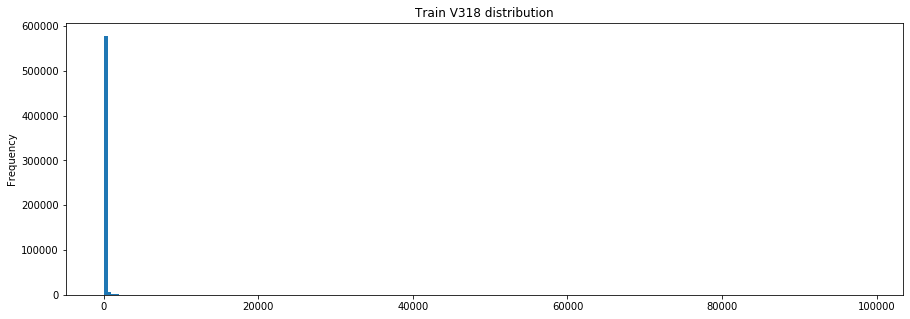

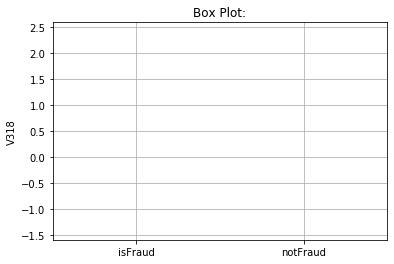

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V318
1     V324               0.996689
2     V323               0.993914
3     V333               0.993121
4     V134               0.992172
5     V295               0.991884
375   V149              -0.139821
376   V155              -0.144294
377   V148              -0.149172
378   V154              -0.157394
379   V153              -0.160725
--------------------------------------------------
Describing  V318  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean      162.153398     176.781527        161.623043
std      2793.343636     894.133506       2838.427857
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      28.397400          0.000000
max  

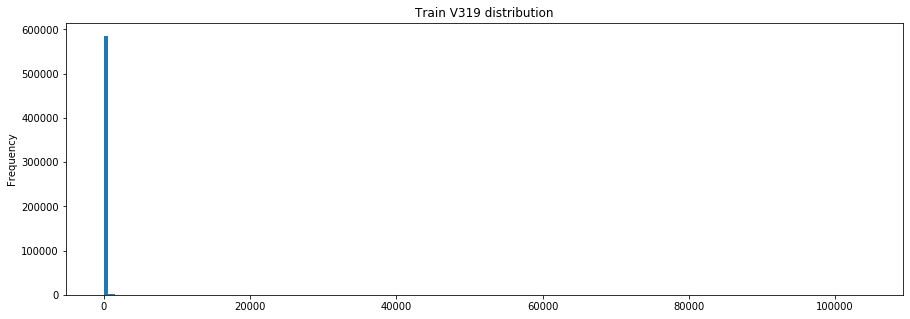

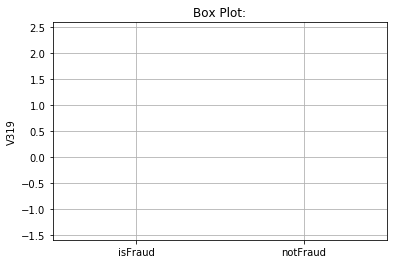

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V319
1     V321               0.921923
2     V214               0.885149
3     V276               0.882619
4     V278               0.837691
5     V216               0.790939
375   V251              -0.036460
376     D3              -0.037332
377   V250              -0.037886
378   V153              -0.038037
379     D5              -0.044753
--------------------------------------------------
Describing  V319  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean       18.372476      18.478514         18.368631
std       332.304848     123.652990        337.454879
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

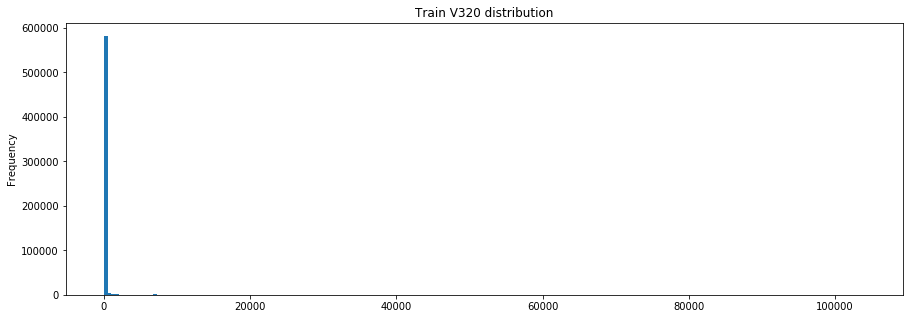

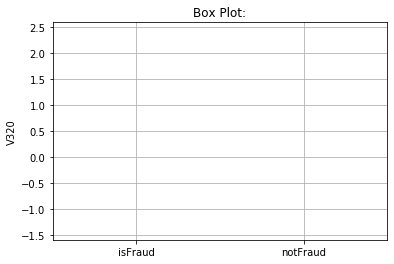

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V320
1     V321               0.937500
2     V278               0.861695
3     V136               0.854772
4     V276               0.844871
5     V338               0.817420
375   V250              -0.114260
376   V155              -0.116156
377   V148              -0.120372
378   V154              -0.126503
379   V153              -0.129837
--------------------------------------------------
Describing  V320  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean       42.073133      54.409545         41.625866
std       473.499307     307.351165        478.434705
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

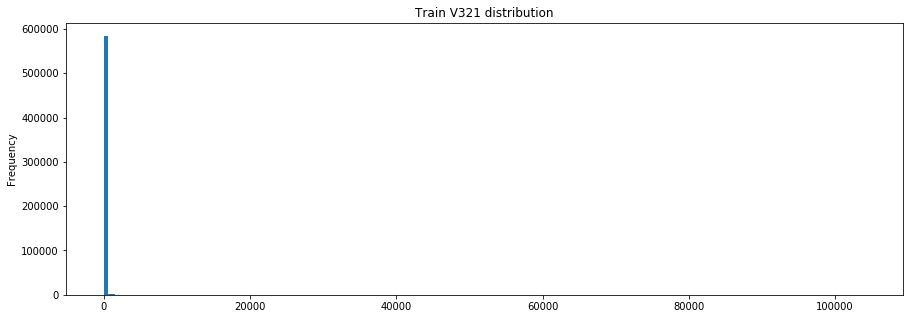

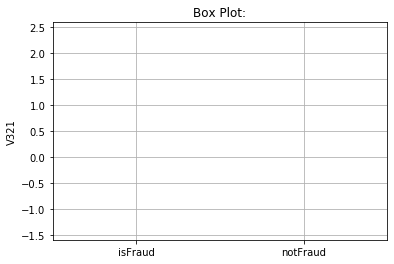

percentage of missing values: 0.0020320384732617604
--------------------------------------------------
Correlations: 
    Column  Correlation with V321
1     V320               0.937500
2     V319               0.921923
3     V278               0.865826
4     V216               0.854264
5     V276               0.853500
375   V155              -0.084040
376   V250              -0.084837
377   V148              -0.087289
378   V154              -0.091622
379   V153              -0.094388
--------------------------------------------------
Describing  V321  :
               Train  isFraud Train  isNotFraud Train
count  590528.000000   20661.000000     569867.000000
mean       28.326584      31.691673         28.204580
std       382.053171     177.831364        387.440031
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max  

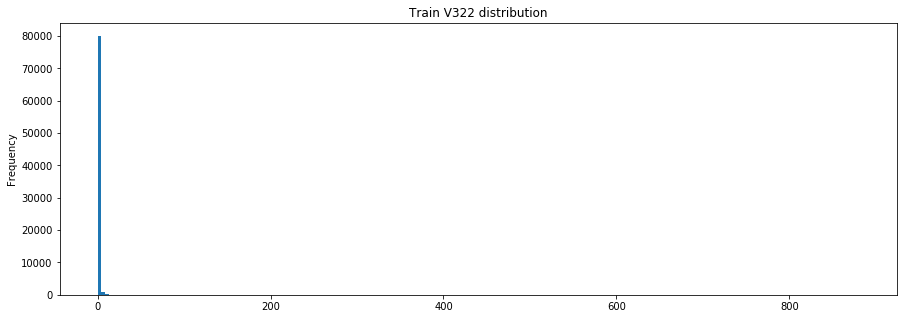

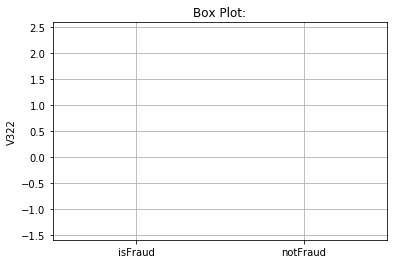

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V322
1      V95               0.999949
2     V101               0.999698
3     V279               0.999624
4     V293               0.999403
5     V132               0.997984
327     D5              -0.292862
328    V20              -0.347962
329    V19              -0.350959
330    V62              -0.388325
331    V61              -0.392328
--------------------------------------------------
Describing  V322  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       6.220289       0.645415          6.481510
std       56.022561       1.371503         57.306006
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       1.000000          0.000000
max      880.0000

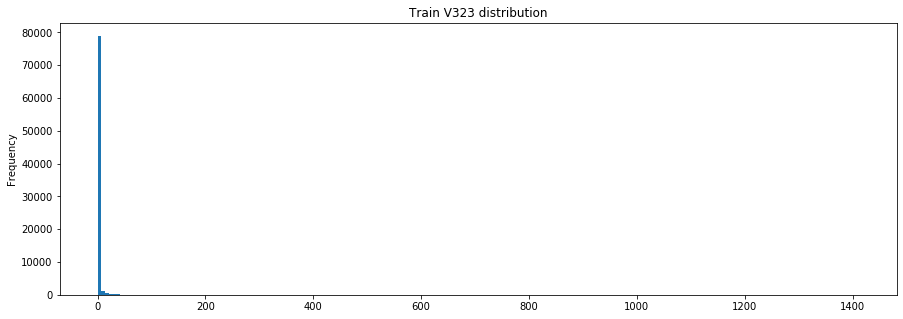

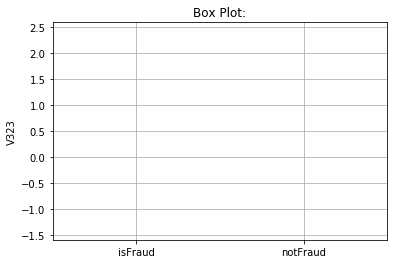

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V323
1      V96               0.999948
2     V102               0.998828
3     V294               0.998592
4     V133               0.997651
5     V317               0.997066
327     D5              -0.342054
328    V20              -0.389590
329    V19              -0.392964
330    V62              -0.434517
331    V61              -0.439019
--------------------------------------------------
Describing  V323  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean      13.103775       1.600380         13.642789
std      106.739813       3.709768        109.179292
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        1.000000       1.000000          1.000000
max     1411.0000

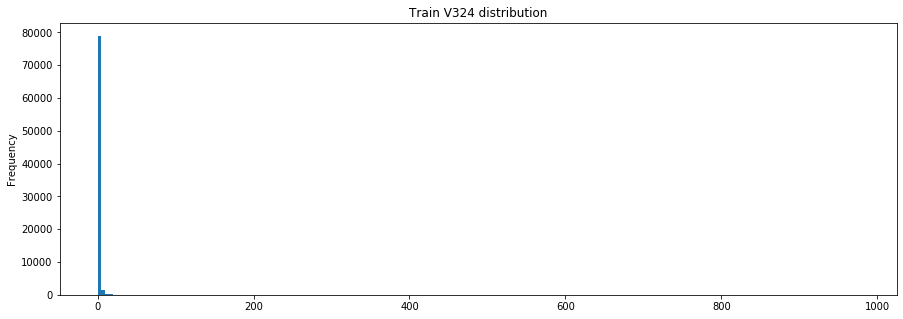

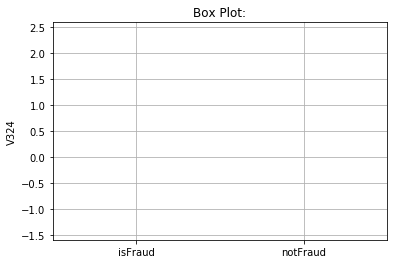

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V324
1      V97               0.999947
2     V280               0.999464
3     V103               0.999258
4     V295               0.998827
5     V134               0.997303
327     D5              -0.317305
328    V20              -0.398257
329    V19              -0.401711
330    V62              -0.446535
331    V61              -0.451185
--------------------------------------------------
Describing  V324  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       9.184612       1.019262          9.567215
std       73.627893       2.257605         75.309861
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       1.000000          0.000000
max      976.0000

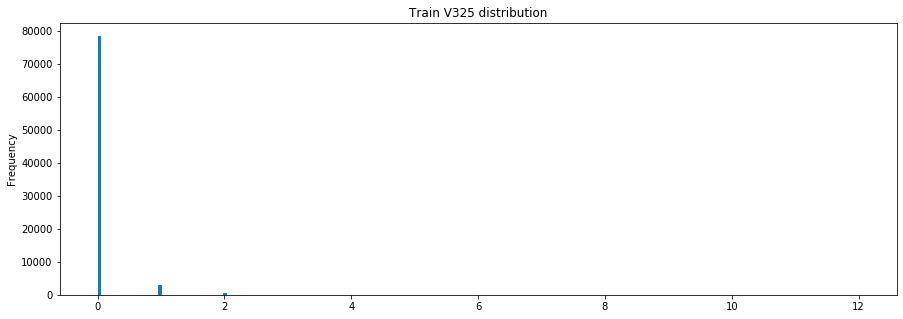

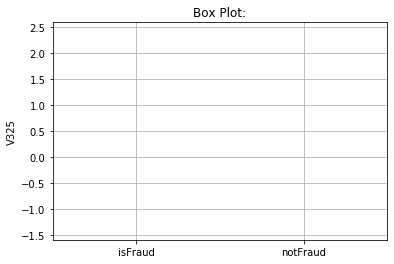

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V325
1      V98               0.945764
2     V284               0.920235
3     V327               0.554233
4     V286               0.531711
5     V100               0.531202
327     D7              -0.220577
328    V20              -0.236393
329    V19              -0.239622
330    V62              -0.252685
331    V61              -0.260990
--------------------------------------------------
Describing  V325  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       0.058494       0.069452          0.057980
std        0.304415       0.354930          0.301833
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max       12.0000

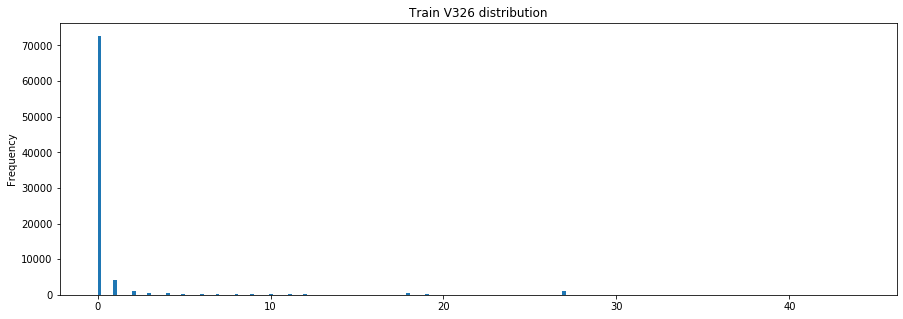

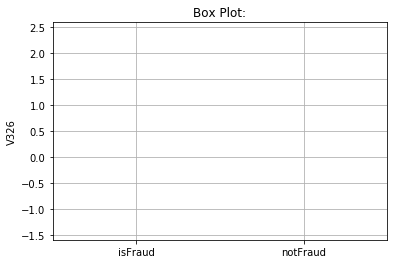

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V326
1      V99               0.988773
2     V285               0.959617
3     V327               0.937717
4     V100               0.932769
5     V287               0.921988
327    V82              -0.458109
328    V20              -0.543650
329    V19              -0.548849
330    V62              -0.561287
331    V61              -0.567709
--------------------------------------------------
Describing  V326  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       0.851040       0.726262          0.856887
std        3.950295       2.788170          3.996386
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max       44.0000

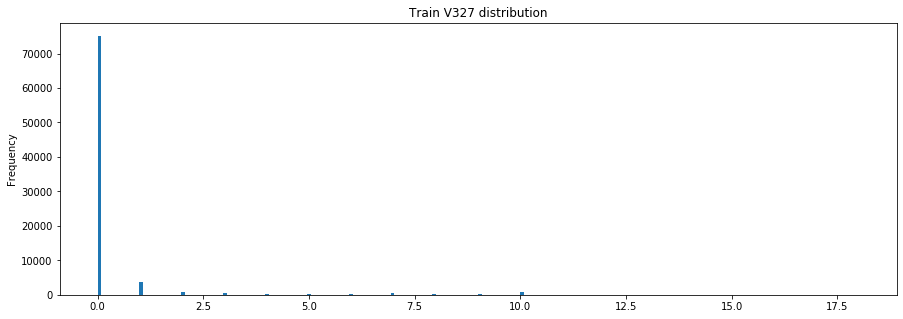

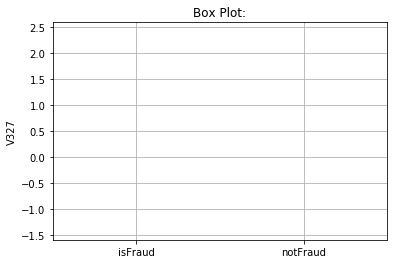

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V327
1     V100               0.987016
2     V287               0.968657
3     V326               0.937717
4      V99               0.930862
5     V285               0.903144
327    V82              -0.381177
328    V20              -0.512131
329    V19              -0.517675
330    V62              -0.539304
331    V61              -0.546545
--------------------------------------------------
Describing  V327  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       0.296633       0.290016          0.296943
std        1.364356       1.257701          1.369157
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max       18.0000

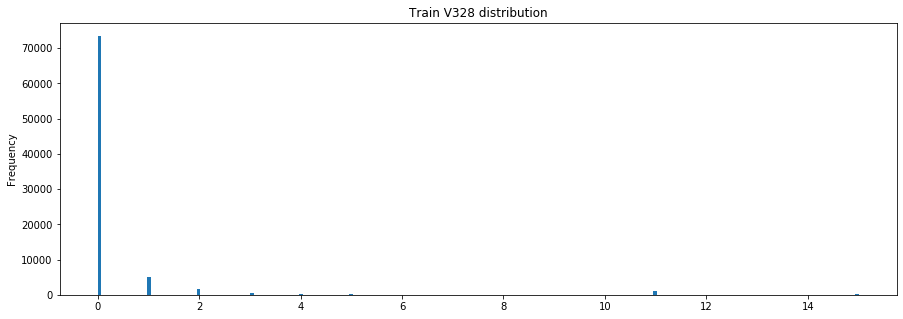

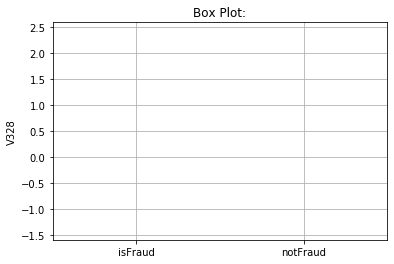

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V328
1     V104               0.987711
2     V297               0.967934
3     V330               0.931738
4     V106               0.924278
5     V299               0.915267
327     D3              -0.279979
328    V20              -0.413837
329    V19              -0.416899
330    V62              -0.480924
331    V61              -0.485598
--------------------------------------------------
Describing  V328  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       0.336790       0.256104          0.340571
std        1.580144       0.786631          1.607652
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max       15.0000

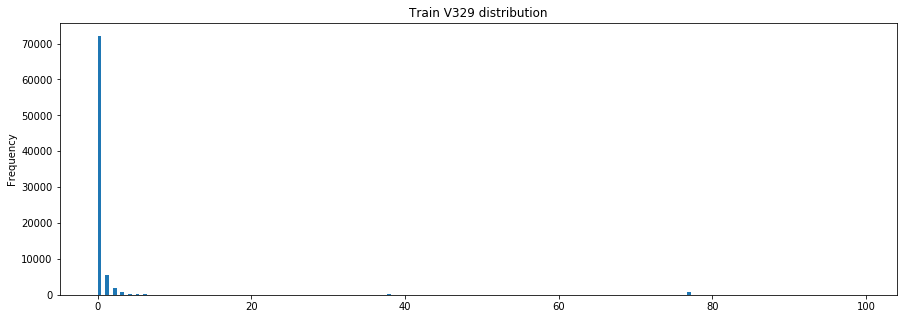

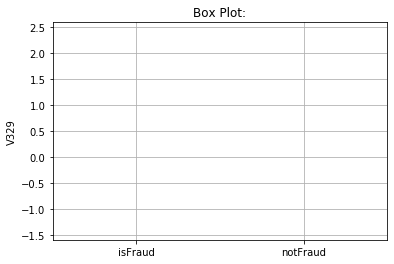

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V329
1     V105               0.999101
2     V298               0.995524
3     V296               0.991243
4     V299               0.974647
5     V330               0.969601
327  card5              -0.282868
328    V20              -0.427671
329    V19              -0.431263
330    V62              -0.480941
331    V61              -0.485859
--------------------------------------------------
Describing  V329  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       1.312844       0.377103          1.356690
std        8.769083       1.063497          8.966832
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max       99.0000

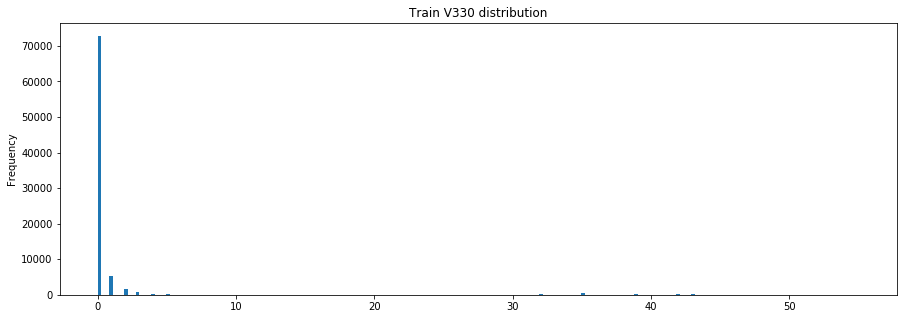

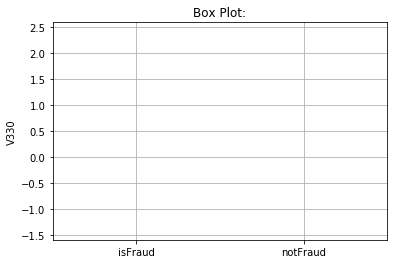

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V330
1     V106               0.998002
2     V299               0.992977
3     V329               0.969601
4     V105               0.968189
5     V298               0.961629
327  card5              -0.289202
328    V20              -0.435053
329    V19              -0.438646
330    V62              -0.494861
331    V61              -0.499854
--------------------------------------------------
Describing  V330  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       0.775874       0.313619          0.797534
std        4.727971       0.960475          4.831921
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max       55.0000

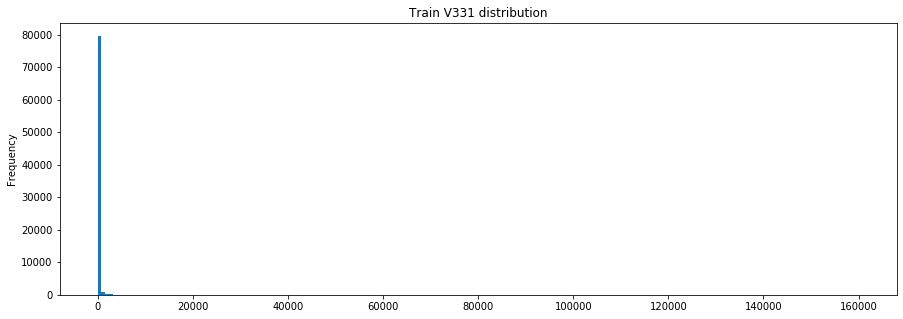

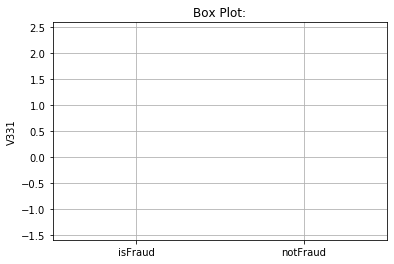

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V331
1     V126               0.995099
2     V306               0.993540
3     V132               0.990389
4     V316               0.990086
5     V211               0.987237
327  card5              -0.237271
328    V20              -0.343313
329    V19              -0.346339
330    V62              -0.386107
331    V61              -0.390107
--------------------------------------------------
Describing  V331  :
               Train  isFraud Train  isNotFraud Train
count   82351.000000    3686.000000      78665.000000
mean      721.741883      90.384699        751.325339
std      6217.223583     227.643019       6359.489982
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000      75.000000          0.000000
max    16

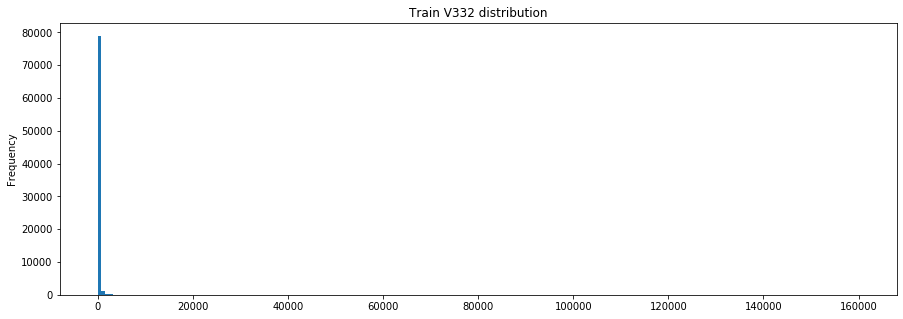

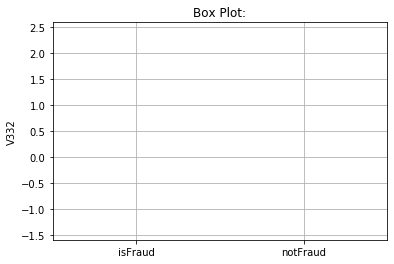

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V332
1     V127               0.996655
2     V307               0.996515
3     V133               0.996004
4     V317               0.995765
5     V323               0.994990
327  card5              -0.259082
328    V20              -0.379609
329    V19              -0.382951
330    V62              -0.426230
331    V61              -0.430744
--------------------------------------------------
Describing  V332  :
               Train  isFraud Train  isNotFraud Train
count   82351.000000    3686.000000      78665.000000
mean     1375.783644     164.859468       1432.523827
std     11169.275702     436.287131      11424.424611
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%        25.000000     150.000000         20.000000
max    16

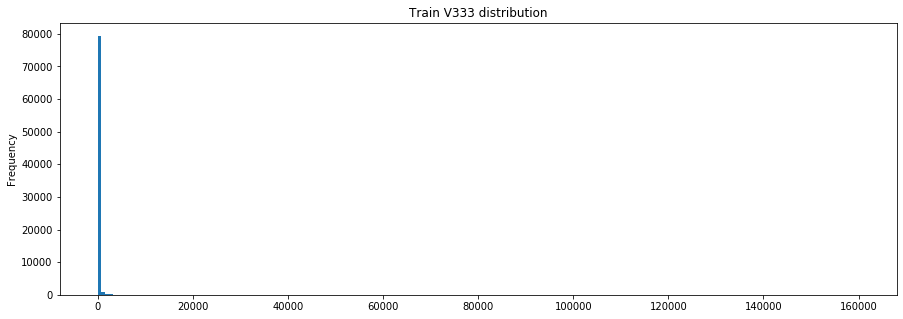

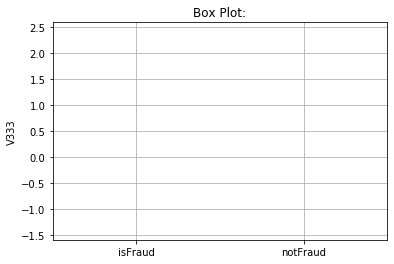

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V333
1     V128               0.996275
2     V308               0.995064
3     V134               0.993521
4     V318               0.993121
5     V332               0.992738
327  card5              -0.265948
328    V20              -0.389853
329    V19              -0.393301
330    V62              -0.439628
331    V61              -0.444376
--------------------------------------------------
Describing  V333  :
               Train  isFraud Train  isNotFraud Train
count   82351.000000    3686.000000      78665.000000
mean     1014.622782     127.633749       1056.184360
std      7955.735482     339.856944       8137.291377
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000     100.000000          0.000000
max    16

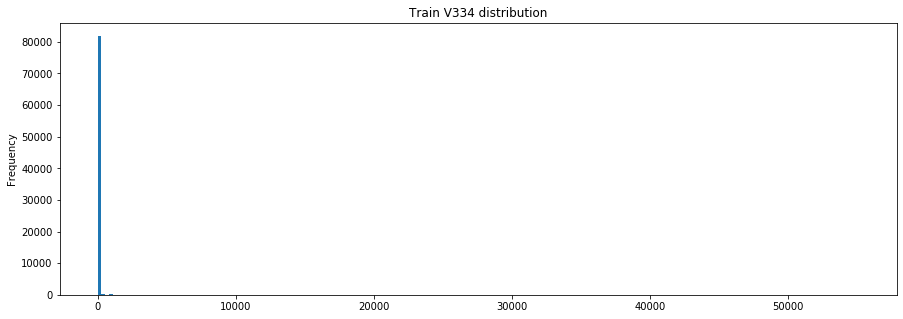

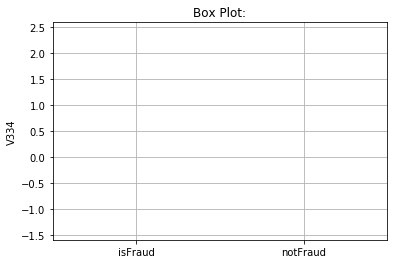

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V334
1     V309               0.953625
2     V129               0.949515
3     V266               0.926682
4     V269               0.926063
5     V311               0.923437
327     D3              -0.030160
328    V62              -0.033430
329    V61              -0.033850
330     D2              -0.041238
331     D5              -0.151525
--------------------------------------------------
Describing  V334  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean       9.807015       9.299240          9.830808
std      243.861391      51.502023        249.260209
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max    55125.0000

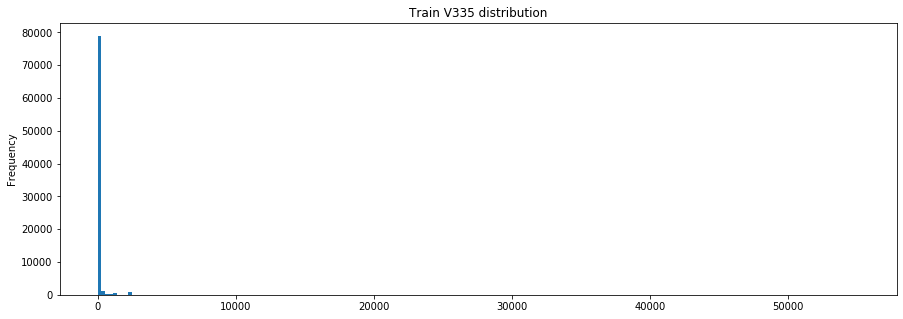

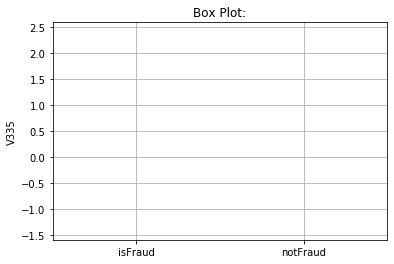

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V335
1     V336               0.914130
2     V312               0.853157
3     V131               0.848055
4     V310               0.826378
5     V266               0.814854
327     D3              -0.215899
328    V20              -0.339095
329    V19              -0.343894
330    V62              -0.356339
331    V61              -0.360117
--------------------------------------------------
Describing  V335  :
             Train  isFraud Train  isNotFraud Train
count  82351.00000    3686.000000      78665.000000
mean      59.16455      49.394466         59.622346
std      387.62948     201.848261        394.187771
min        0.00000       0.000000          0.000000
25%        0.00000       0.000000          0.000000
50%        0.00000       0.000000          0.000000
75%        0.00000       0.000000          0.000000
max    55125.00000    243

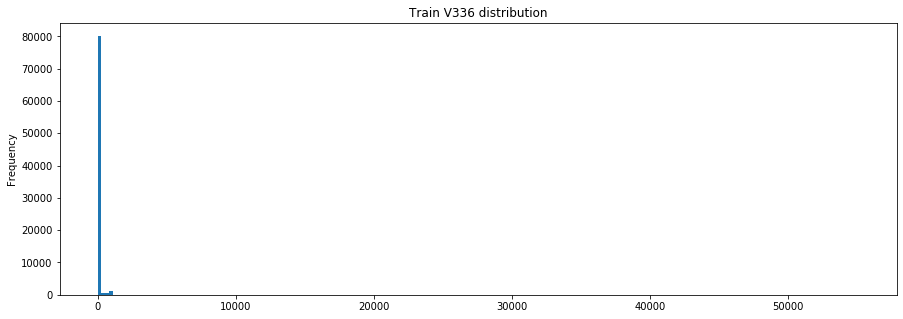

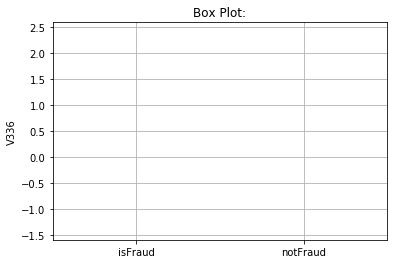

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V336
1     V312               0.938161
2     V131               0.923727
3     V335               0.914130
4     V334               0.906312
5     V266               0.900629
327     D5              -0.170498
328    V20              -0.198672
329    V19              -0.202209
330    V62              -0.214931
331    V61              -0.217620
--------------------------------------------------
Describing  V336  :
              Train  isFraud Train  isNotFraud Train
count  82351.000000    3686.000000      78665.000000
mean      28.530903      25.483993         28.673672
std      274.576920     117.938993        279.773375
min        0.000000       0.000000          0.000000
25%        0.000000       0.000000          0.000000
50%        0.000000       0.000000          0.000000
75%        0.000000       0.000000          0.000000
max    55125.0000

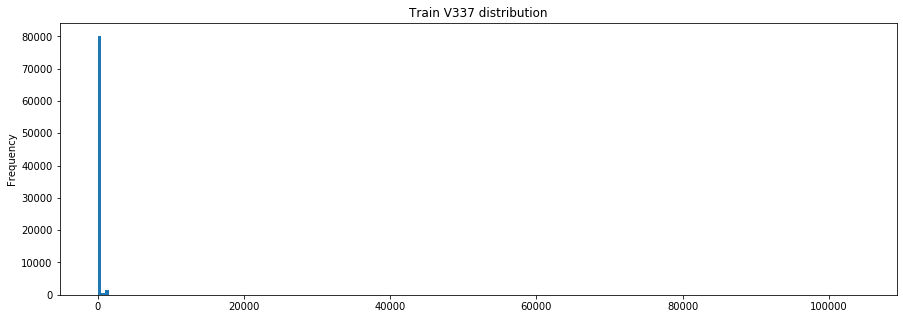

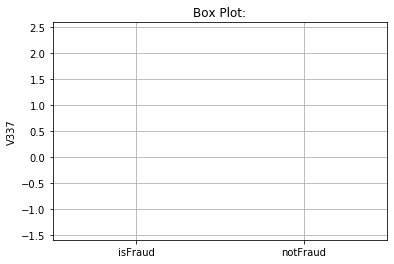

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V337
1     V339               0.907378
2     V276               0.832701
3     V278               0.795136
4     V214               0.749529
5     V338               0.742652
327    V19              -0.151791
328    V62              -0.197066
329    V61              -0.198533
330     D7              -0.205371
331    D13              -0.225563
--------------------------------------------------
Describing  V337  :
               Train  isFraud Train  isNotFraud Train
count   82351.000000    3686.000000      78665.000000
mean       55.352422      37.742268         56.177580
std       668.486833     142.505208        683.262438
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    10

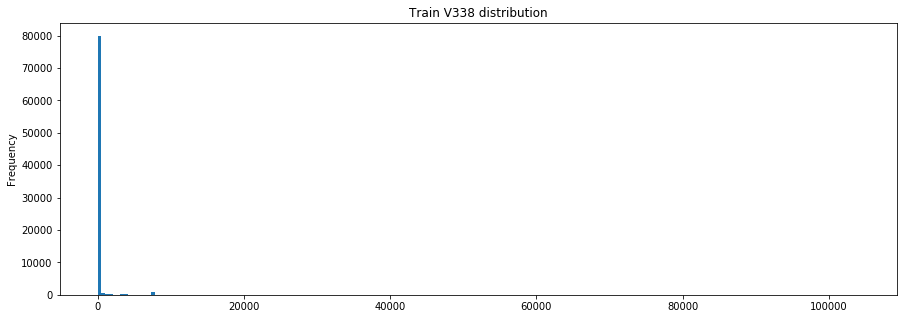

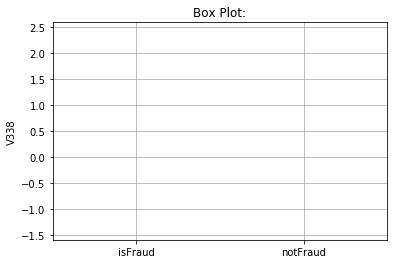

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V338
1     V339               0.940009
2     V136               0.854639
3     V333               0.823754
4     V320               0.817420
5     V308               0.808496
327     D3              -0.254541
328    V20              -0.382547
329    V19              -0.385448
330    V62              -0.442944
331    V61              -0.447166
--------------------------------------------------
Describing  V338  :
               Train  isFraud Train  isNotFraud Train
count   82351.000000    3686.000000      78665.000000
mean      151.160542      53.242268        155.748691
std      1095.034387     190.250383       1119.429005
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    10

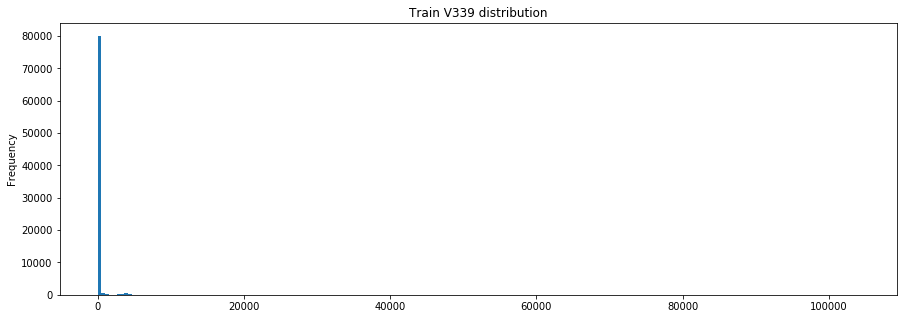

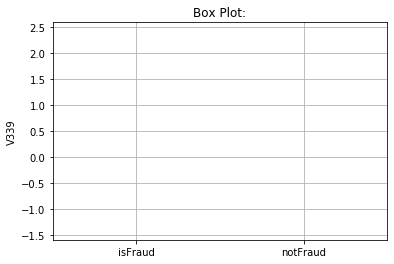

percentage of missing values: 86.05496664070174
--------------------------------------------------
Correlations: 
    Column  Correlation with V339
1     V338               0.940009
2     V337               0.907378
3     V276               0.810222
4     V278               0.807834
5     V136               0.765556
327    D13              -0.254903
328    V20              -0.340134
329    V19              -0.342548
330    V62              -0.404628
331    V61              -0.408403
--------------------------------------------------
Describing  V339  :
               Train  isFraud Train  isNotFraud Train
count   82351.000000    3686.000000      78665.000000
mean      100.700882      45.496473        103.287590
std       814.946722     175.966280        832.861349
min         0.000000       0.000000          0.000000
25%         0.000000       0.000000          0.000000
50%         0.000000       0.000000          0.000000
75%         0.000000       0.000000          0.000000
max    10

In [19]:
for f in tr.columns:
    if f not in col_rem_eda:
        if tr[f].dtype != 'object':
            EDA_num(f)
        elif tr[f].dtype == 'object':
            EDA_cat(f)

### Observation:
<ol> 
<li> **TransactionAmt:** This attribute has no missing value. It is weakly correlated with all other attributes in the dataframe. The mean of the transaction amount in the train dataset is 135$ and this value, along with its standard deviation, will be used during feature engineering. Thus this is an important attribute for model training.</li>
<li> **ProductCD:** This attribute is a categorical attribute that contains the code of the product. There are 5 unique product codes. The ProductCD attribute is unbalanced. The share of each ProductCD in train dataset with fraudulent and non fraudulent transactions are similar. ProductCD 'W' occurs more often in the dataset. </li>
<li> **card1:** The frequency distribution shows that this attribute is widely distributed over its range. The box plot tells that the fraudulent and non fraudulent card1 values are overlapping. This imples that card1 alone cannot seperate fraudulent and non fraudulent transactions. There are no missing values in this feature and it is weakly correlated with all other attributes.</li>
<li> **card2:** The attribute is non-linearly spread over its range. A small percentage of values are missing in this attribute. The fraudulent and non fraudulent card2 values share similar distribution. The attribute becomes important due to absence of strong correlations with all other attributes. </li>
<li> **card3:** card3 frequency distribution shows unique behaviour. 26.5% values are missing and it shares strong correlations with some V attributes. The 50% IQR is completely filled with value 150 in the train dataset. This behaviour shows that the attribute is reundant. But due to redundancies in V features observed later, card3 attribute is retained. Further, only Vxxx attributes are removed during feature engineering. </li>
<li> **card4:** is a categorical attribute which has 4 unique values and has high variability in the values. It shows high variability in Fraudulent as well as Non-Fraudulent values. </li>
<li> **card5:** is a numerical attribute with 72% of missing values. It is weakly correlated with all other attributes. More than 25% of non-missing datapoints of the attribute has a value = 226. </li>
<li> **addr1:** is a numerical attribute with high variability. As correlation coefficients are near 0, this attribute is a unique attribute. </li>
<li> **addr2:** is a numerical attribute. More than 50% of datapoints have addr2 value = 87. </li>
<li> **dist1:** a numerical attribute with 60% missing values and more than 75% of non-missing values lying below 24. The maximum is 10286. The fraudulent transactions have mean dist1 at 174 while non fraudulent transactions have mean dist1 at 117. It is weakly correlated with all other attributes. </li> 
<li> **dist2:** is similar to the behavior of **dist1**. 93% of values are missing. There is no correlation between dist1 and dist2.  While dist2 is very weakly correlated with all other attributes. </li>
<li> **P_ and R_ emaildomain:** categorical attributes with varying values. These individually cannot distinguish Fraudulent and Non Fraudulent transactions as the distribution of categories are similar. 76% of datapoints have R_emaildomain values missing. </li>
<li> **Cxx:** C1 - C14 are counts attributes. C3's (a unique attribute among Cxx attributes) box plot shows that fraudulent transactions have no C3 value more than 3 in the training dataset. While Non Fraudulent transactions have C3 values from 0 to 26. More than 75% of C3 values are 0 and the attribute has no missing values. All other C attributes have considerable variation and overlapping in fraudulent and non fraudulent transactions. More than 75% of non missing C attribute values are 0. They have high correlations among themselves. (Correlation Analysis will give more clear picture). These attributes are mostly redundant. </li>
<li> **Dxx:** D1-D15 are time deltas. D1 and D2 are strongly correlated. D1 has 21% of missing values and D2 has 47.5% missing values. While it is ideal to remove D2 but the frequency distribution shows that D2 attribute has more variation. Similar behavior can be observed between other D correlated attributes. But it should be remembered that mmore than 50% of Vxxx attributes are removed later in correlation analysis. Thus based on frequency distribution we are not taking any decision on feature selections. Most of the D attributes have high variations and also high % of missing values. </li>
<li> **Mx:** M1-M9 are boolean attributes which show whether identity information such as names match or not. There is sufficient variation in these attribute which does not clearly distinguish between fraudulent and non fraudulent transactions. More than 50% of the M values are missing. </li>
<li> **Vxxx:** V1-V339 company engineered attributes engineered above raw features (From TransactionAmt to M9). Strong correlations (>0.90) and high variatons are observed among these attributes. Thus I have proceeded with correlation analysis for determining which Vxxx attributes are redundant. More than 50% of non missing valued datapoints have V values = 0.  </li>
<br>
With NANs similarity, we can group different V attributes. Based on correlation coefficients, sub groups will be made. The attribute which has more unique values, among the subgroup, will be passed through the EDA stage. Let us assume that the Correlation Coefficient threshold is 75% for generating subgroups.

</ol>

In [20]:
del tr, trid

### Correlation Analysis: Removing redundant attributes with correlation threshold 0.75: (Attributes grouping is based on NAN similarity)

In [21]:
# https://www.kaggle.com/cdeotte/eda-for-columns-v-and-id
cols_t = ['TransactionID', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9']
cols_v = ['V'+str(x) for x in range(1,340)]; types_v = {}
for c in cols_v: types_v[c] = 'float32'
train = pd.read_csv('/content/train_transaction.csv',usecols=cols_t+['isFraud']+cols_v,dtype=types_v)

### NAN search

In [22]:
nans_df = train.isna()
nans_groups={}
i_cols = ['V'+str(i) for i in range(1,340)]
for col in train.columns:
    cur_group = nans_df[col].sum()
    try:
        nans_groups[cur_group].append(col)
    except:
        nans_groups[cur_group]=[col]
del nans_df; x=gc.collect()

for k,v in nans_groups.items():
    print('####### NAN count =',k)
    print(v)

####### NAN count = 0
['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']
####### NAN count = 8933
['card2']
####### NAN count = 1565
['card3']
####### NAN count = 1577
['card4']
####### NAN count = 4259
['card5']
####### NAN count = 1571
['card6']
####### NAN count = 65706
['addr1', 'addr2']
####### NAN count = 352271
['dist1']
####### NAN count = 552913
['dist2']
####### NAN count = 94456
['P_emaildomain']
####### NAN count = 453249
['R_emaildomain']
####### NAN count = 1269
['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']
####### NAN count = 280797
['D2']
####### NAN count = 262878
['D3']
####### NAN count = 168922
['D4']
####### NAN count = 309841
['D5']
####### NAN count = 517353
['D6']
####### NAN count = 551623
['D7']
####### NAN count = 515614
['D8', 'D9']
####### NAN count = 76022
['D10']
####### NAN count = 27

For example, we can see that D11 attribute shares similar Nan structure with attributes V1-V11.

#### Note: NAN search above is used for forming groups of attributes wih similar NAN struvture. While Correlation heatmaps below will be used for forming subgroups among these NAN similar group for removing redundant attributes.

### V1 - V11, D11

In [23]:
Vc = ['dayr','isFraud','TransactionAmt','card1','addr1','D1n','D11n']
Vs = nans_groups[279287]
Vtitle = 'V1 - V11, D11'

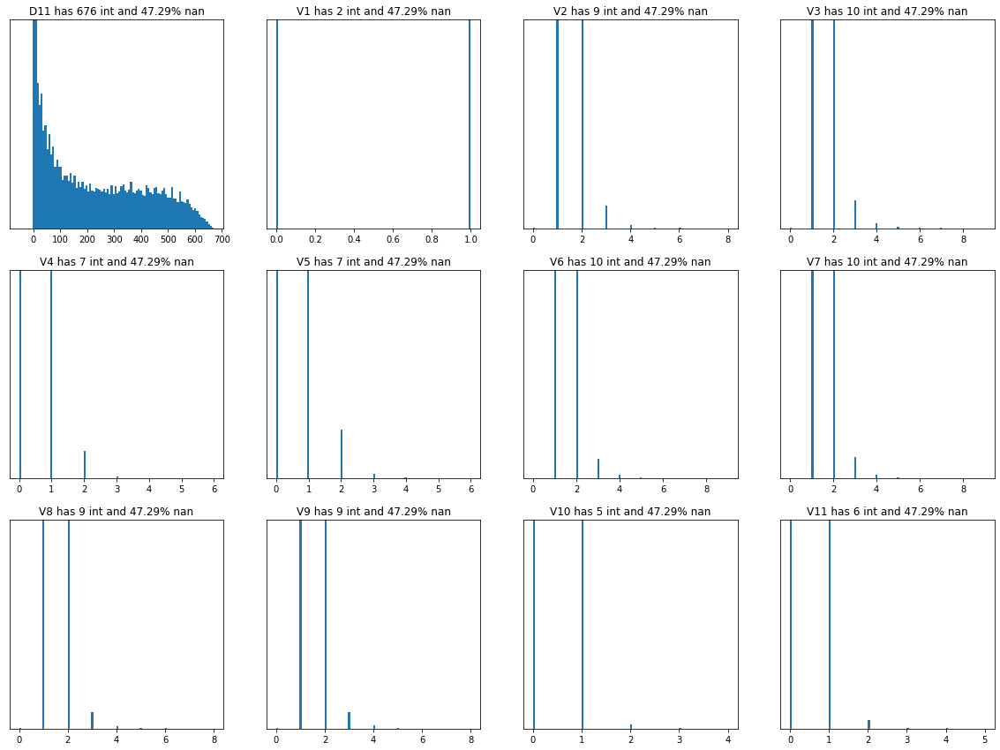

In [24]:
def make_plots(Vs):
    '''
    Plotting hitograms of a group of Attributes
    '''
    col = 4
    row = len(Vs)//4+1
    plt.figure(figsize=(20,row*5))
    idx = train[~train[Vs[0]].isna()].index
    for i,v in enumerate(Vs):
        plt.subplot(row,col,i+1)
        n = train[v].nunique()
        x = np.sum(train.loc[idx,v]!=train.loc[idx,v].astype(int))
        y = np.round(100*np.sum(train[v].isna())/len(train),2)
        t = 'int'
        if x!=0: 
            t = 'float'
        plt.title(v+' has '+str(n)+' '+t+' and '+str(y)+'% nan')
        plt.yticks([])
        h = plt.hist(train.loc[idx,v],bins=100)
        if len(h[0])>1: plt.ylim((0,np.sort(h[0])[-2]))
    plt.show()
make_plots(Vs)

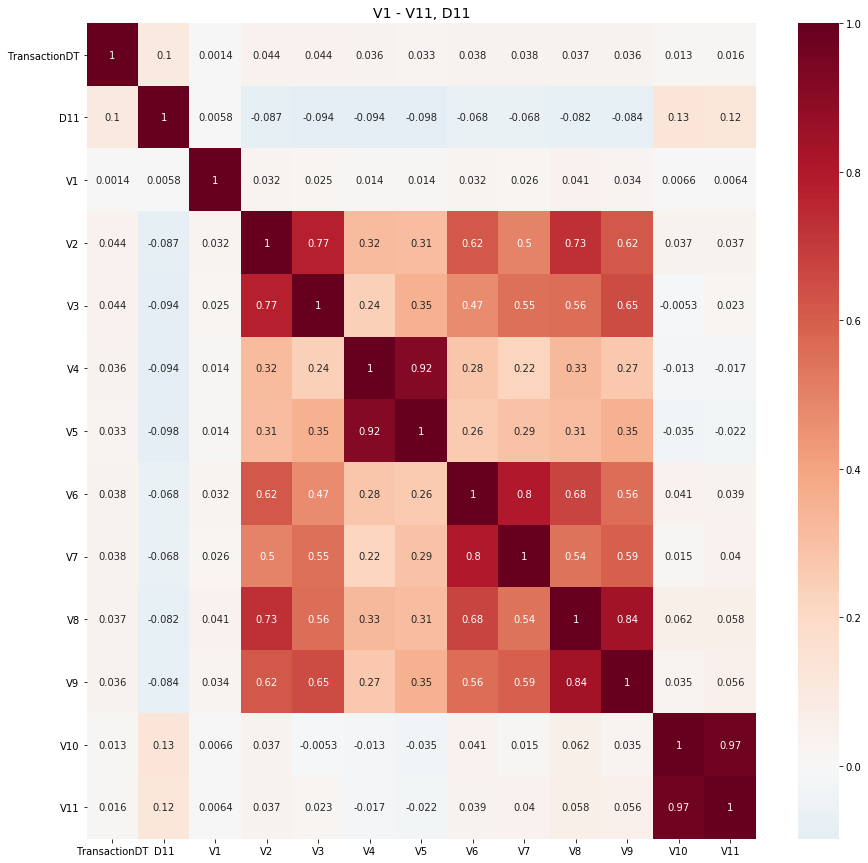

In [25]:
def make_corr(Vs,Vtitle=''):
    '''
    Plotting correlation heatmaps to analyze and generate subgroups manually
    '''
    cols = ['TransactionDT'] + Vs
    plt.figure(figsize=(15,15))
    sns.heatmap(train[cols].corr(), cmap='RdBu_r', annot=True, center=0.0)
    if Vtitle!='': 
        plt.title(Vtitle,fontsize=14)
    else: 
        plt.title(Vs[0]+' - '+Vs[-1],fontsize=14)
    plt.show()
make_corr(Vs,Vtitle)

### We can observe correlations between (V2 and V3), (V4 and V5), (V6 and V7), (V8 and V9) and (V10 and V11)

In [26]:
def reduce_group(grps,c='V'):
    '''
    determining attributes that have more unique values among a group of atttributes
    Based on the output of this function we are selecting features for the ML model
    '''
    use = []
    for g in grps:
        mx = 0; vx = g[0]
        for gg in g:
            n = train[c+str(gg)].nunique()
            if n>mx:
                mx = n
                vx = gg
        use.append(vx)
    print('Use these',use)

In [27]:
grps = [[1],[2,3],[4,5],[6,7],[8,9],[10,11]]
reduce_group(grps)

Use these [1, 3, 4, 6, 8, 11]


### V12 - V34

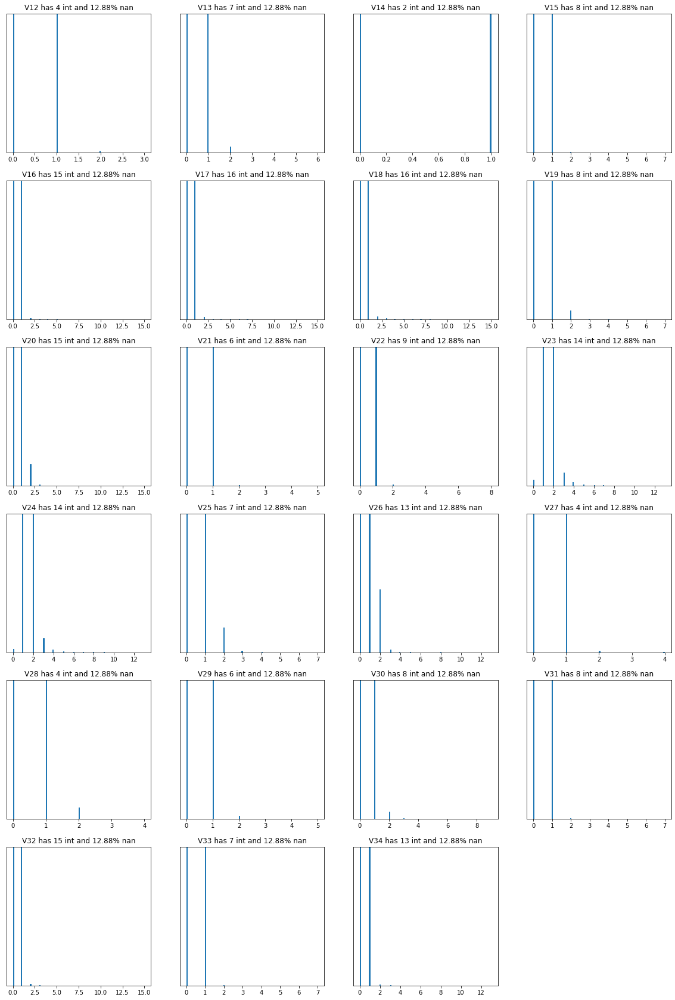

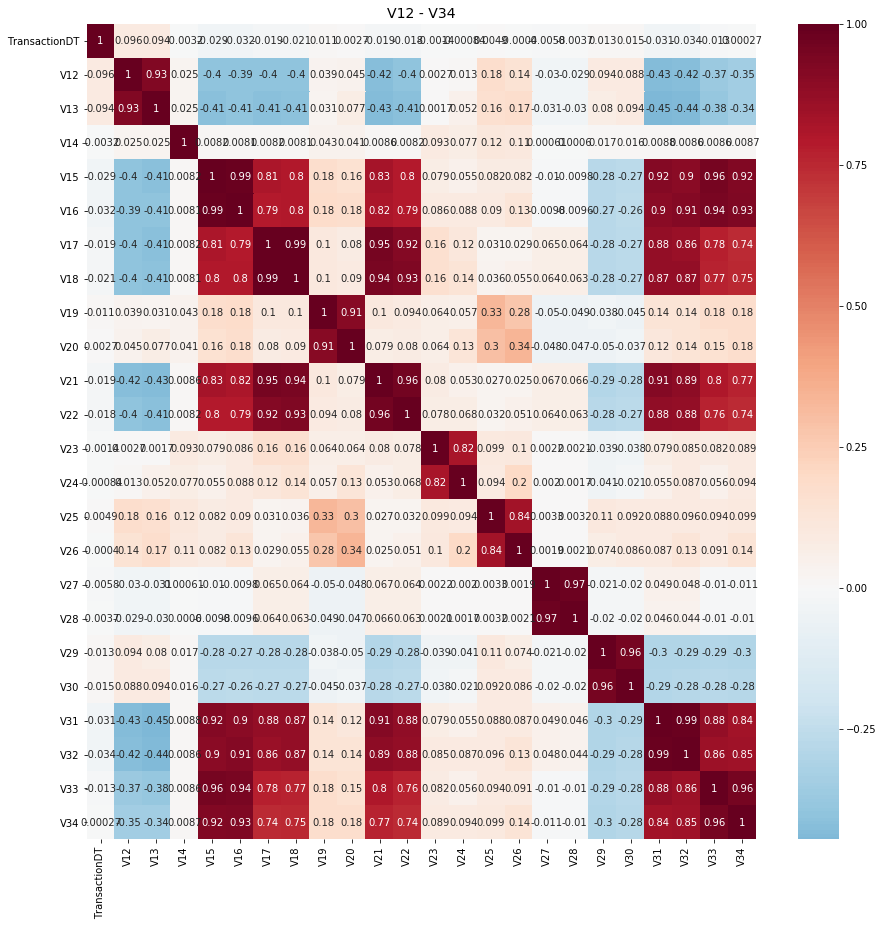

In [28]:
Vs = nans_groups[76073]
make_plots(Vs)
make_corr(Vs)

In [29]:
grps = [[12,13],[14],[15,16,17,18,21,22,31,32,33,34],[19,20],[23,24],[25,26],[27,28],[29,30]]
reduce_group(grps)

Use these [13, 14, 17, 20, 23, 26, 27, 30]


### Note: Among V12 and V13 we can see that V12 has 4 unique values while V13 has 7 unique values, thus we select V13 and discard V12 as correlation between V12 and V13 is 0.93 (>0.75). We repeat this process with other V attributes.

### V35 - V52

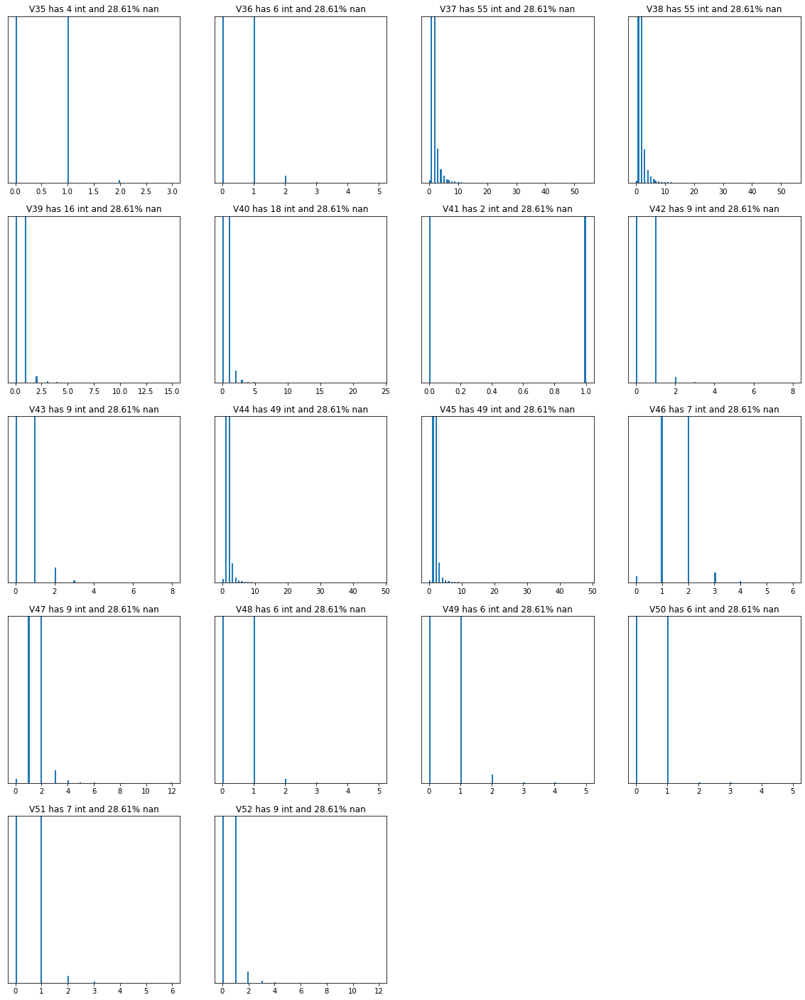

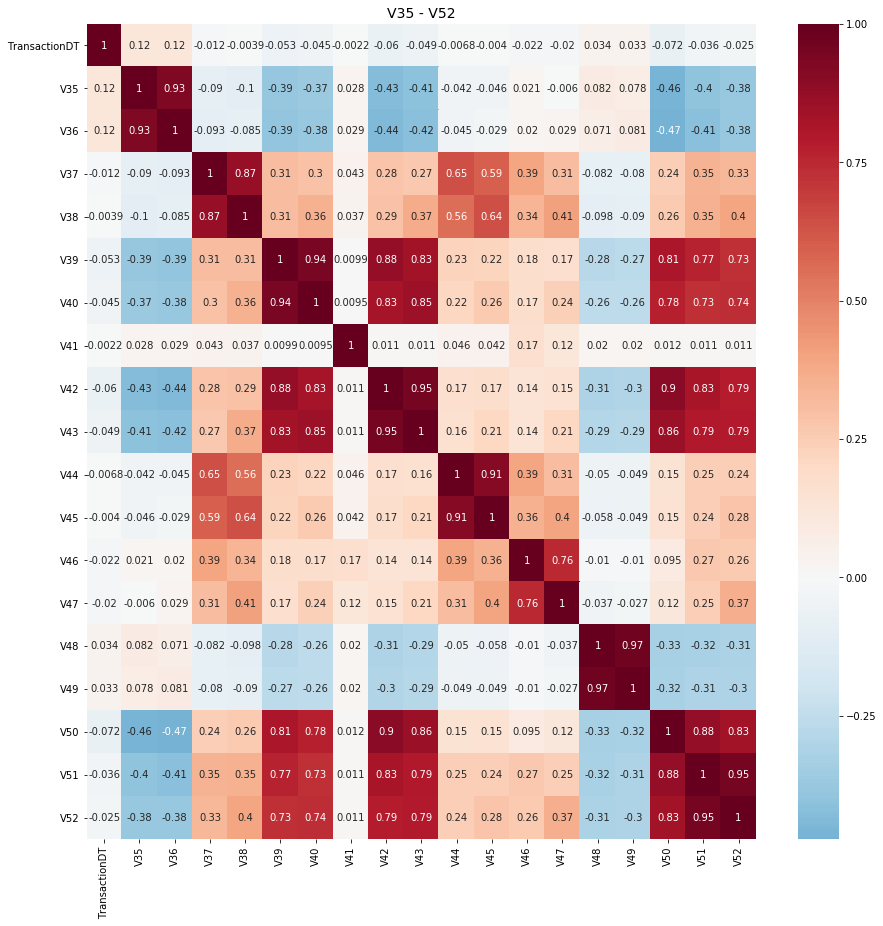

In [30]:
Vs = nans_groups[168969]
make_plots(Vs)
make_corr(Vs)

In [31]:
grps = [[35,36],[37,38],[39,40,42,43,50,51,52],[41],[44,45],[46,47],[48,49]]
reduce_group(grps)

Use these [36, 37, 40, 41, 44, 47, 48]


### V53 - V74

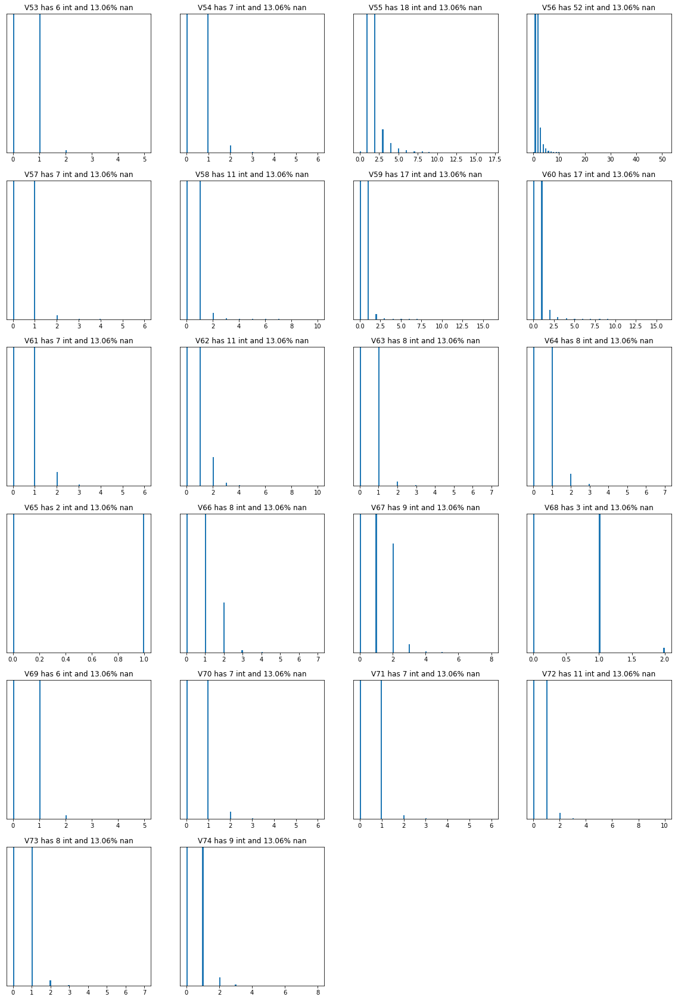

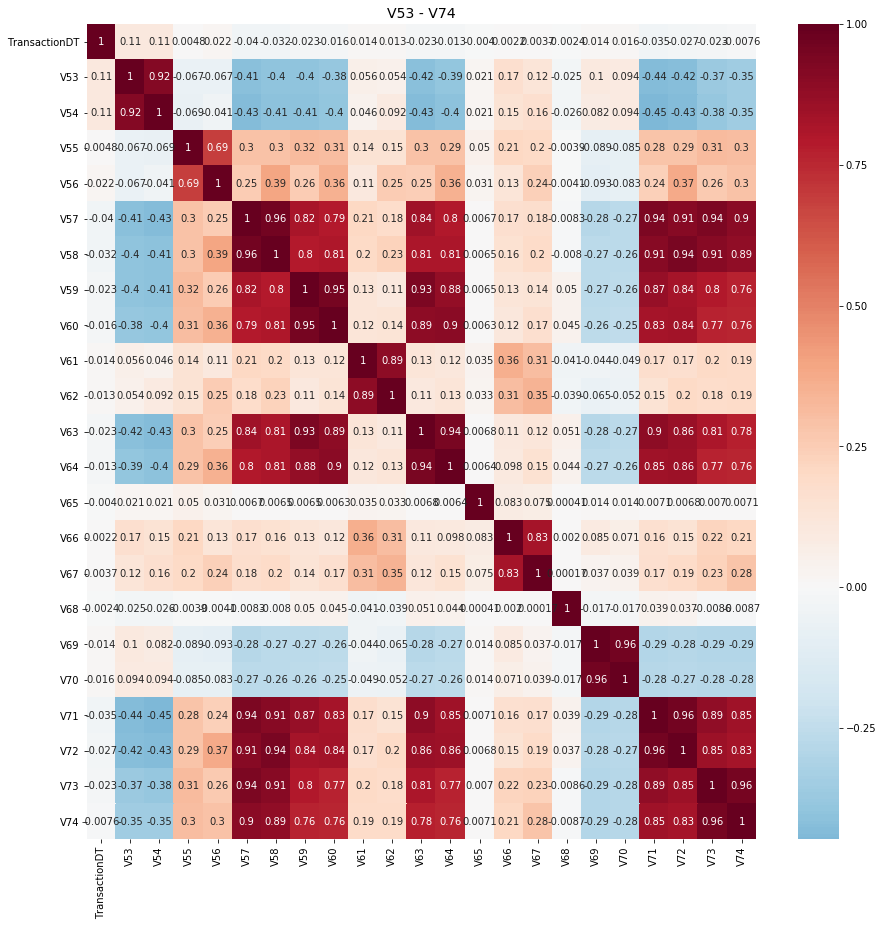

In [32]:
Vs = nans_groups[77096]
make_plots(Vs)
make_corr(Vs)

In [33]:
grps = [[53,54],[55,56],[57,58,59,60,63,64,71,72,73,74],[61,62],[65],[66,67],[68],[69,70]]
reduce_group(grps)

Use these [54, 56, 59, 62, 65, 67, 68, 70]


### V75 - V94

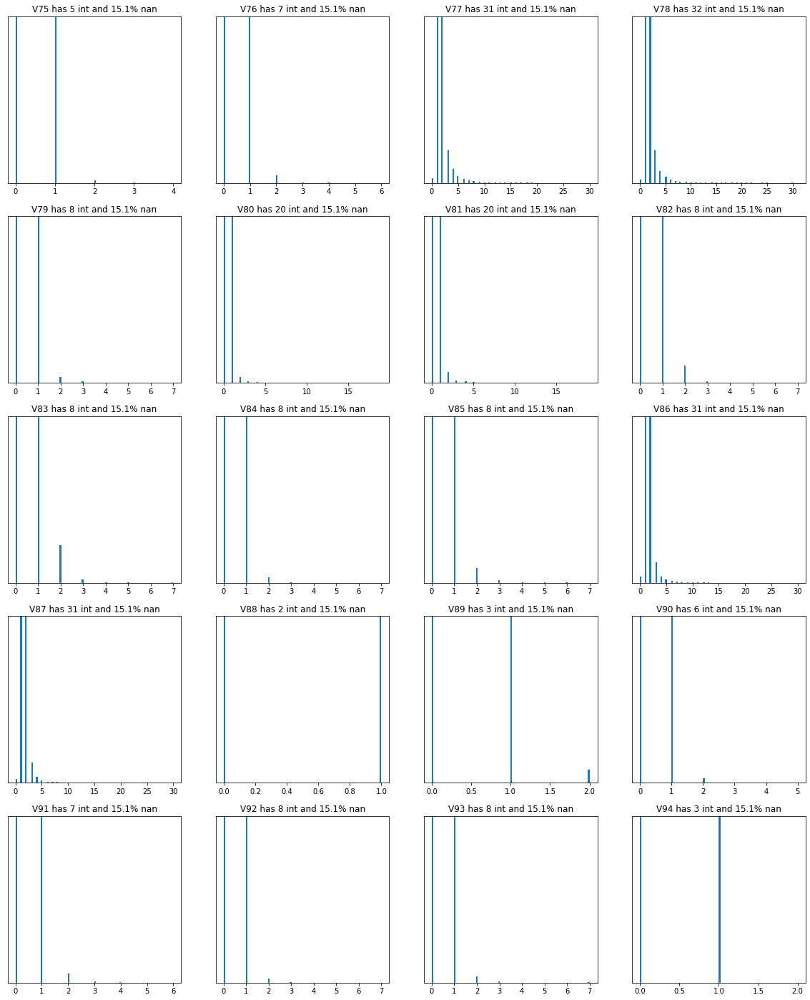

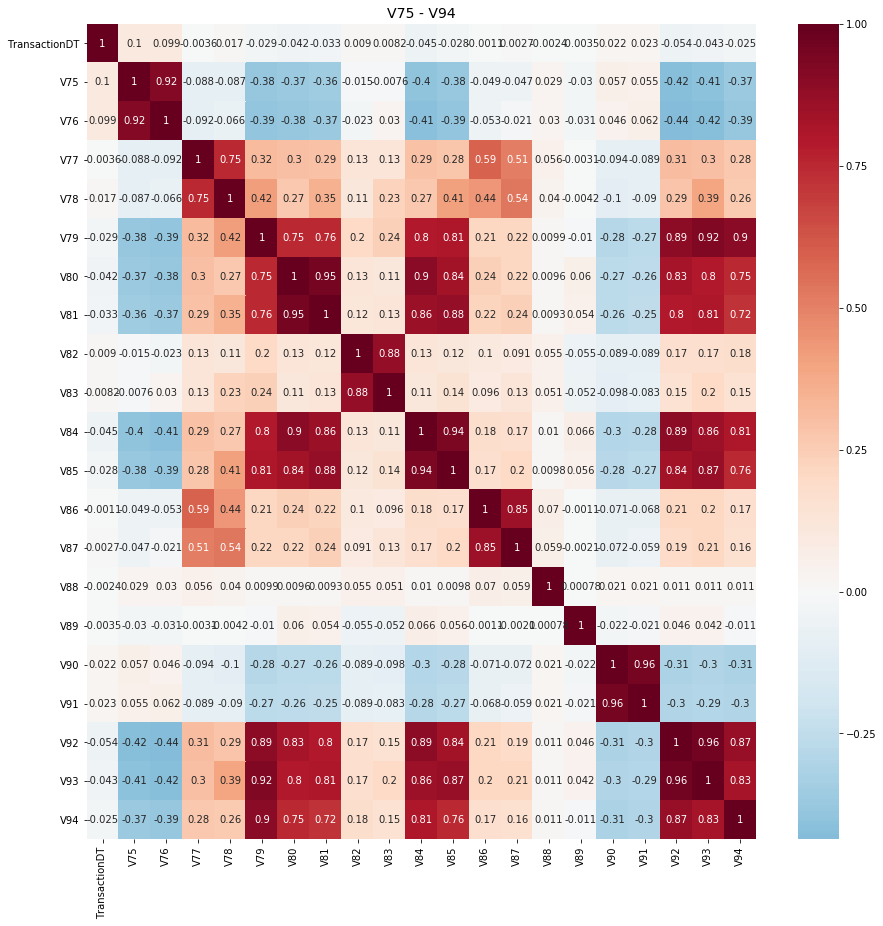

In [34]:
Vs = nans_groups[89164]
make_plots(Vs)
make_corr(Vs)

In [35]:
grps = [[75,76],[77,78],[79,80,81,84,85,92,93,94],[82,83],[86,87],[88],[89],[90,91]]
reduce_group(grps)

Use these [76, 78, 80, 82, 86, 88, 89, 91]


### V95 - V137

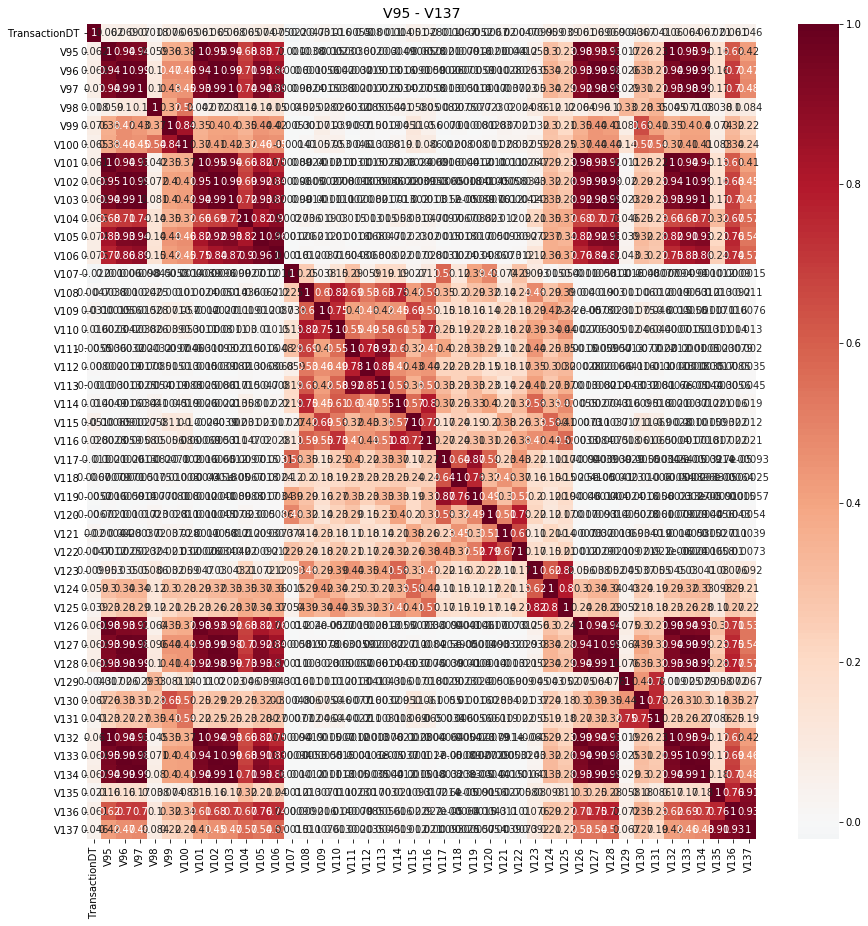

In [36]:
Vs = nans_groups[314]
make_corr(Vs)

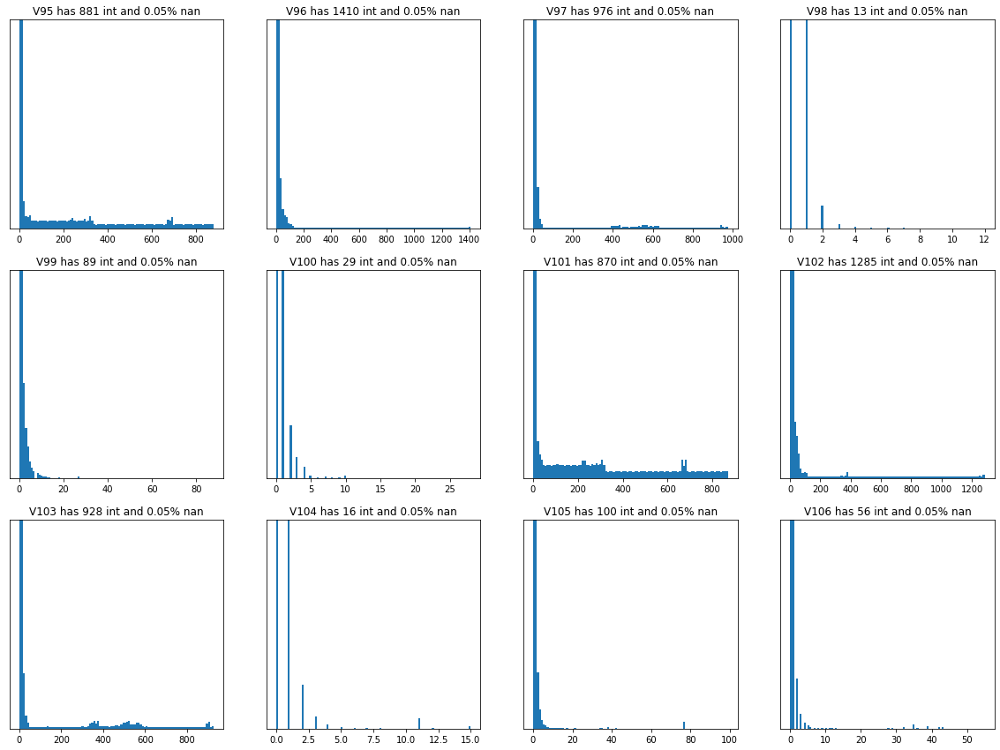

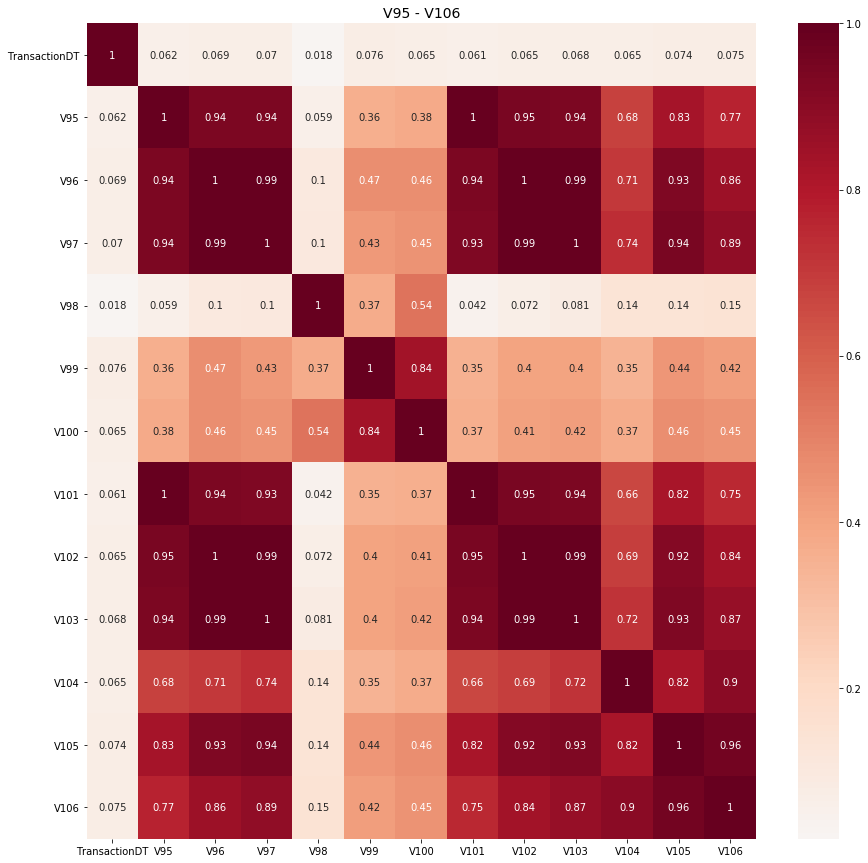

In [37]:
Vs = ['V'+str(x) for x in range(95,107)]
make_plots(Vs)
make_corr(Vs)

In [38]:
grps = [[95,96,97,101,102,103,105,106],[98],[99,100],[104]]
reduce_group(grps)

Use these [96, 98, 99, 104]


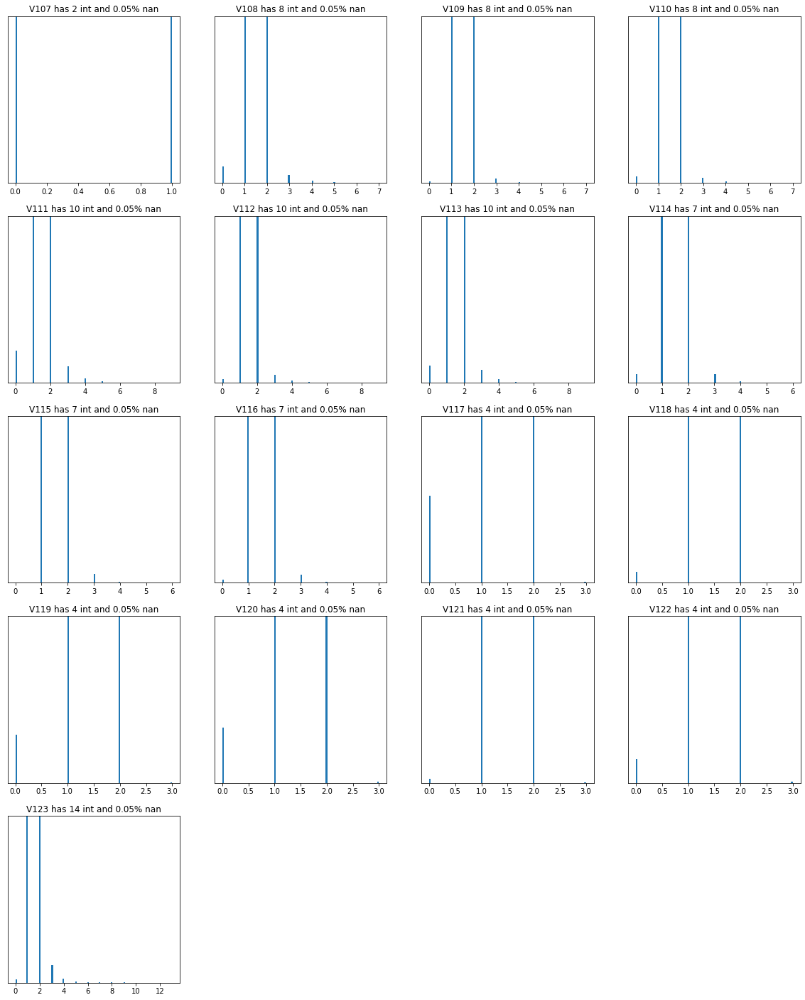

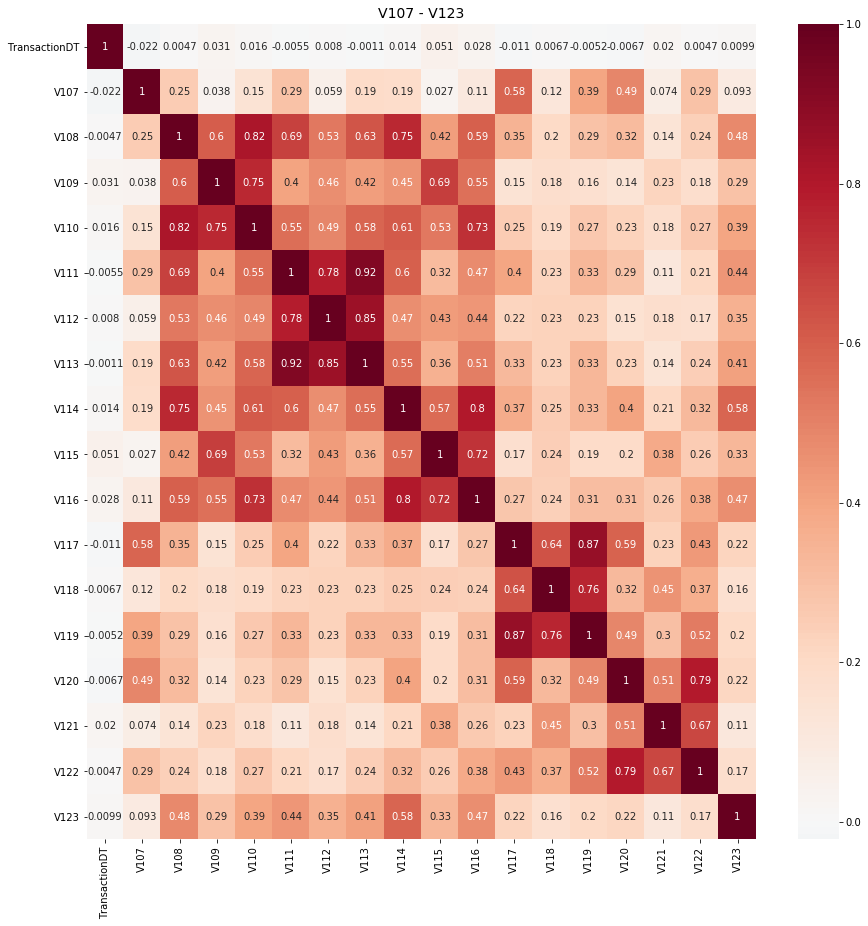

In [39]:
Vs = ['V'+str(x) for x in range(107,124)]
make_plots(Vs)
make_corr(Vs)

In [40]:
grps = [[107],[108,109,110,114],[111,112,113],[115,116],[117,118,119],[120,122],[121],[123]]
reduce_group(grps)

Use these [107, 108, 111, 115, 117, 120, 121, 123]


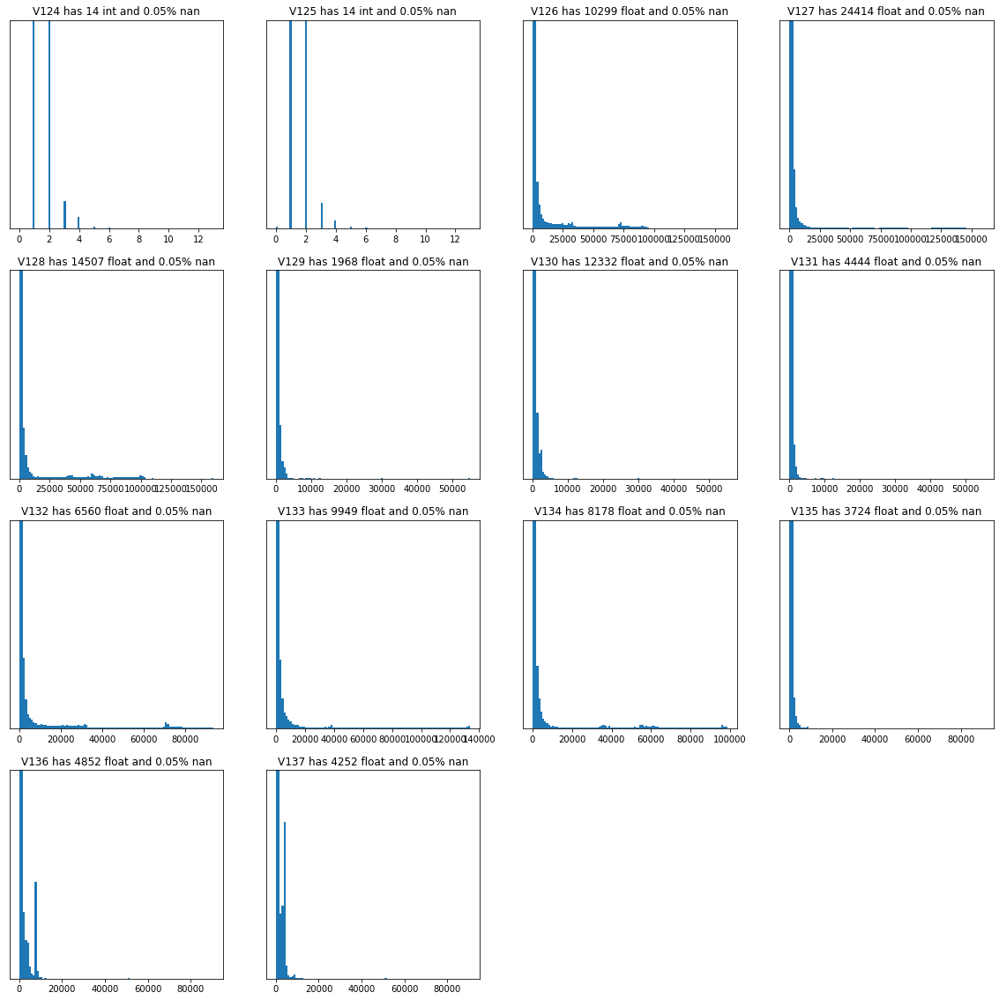

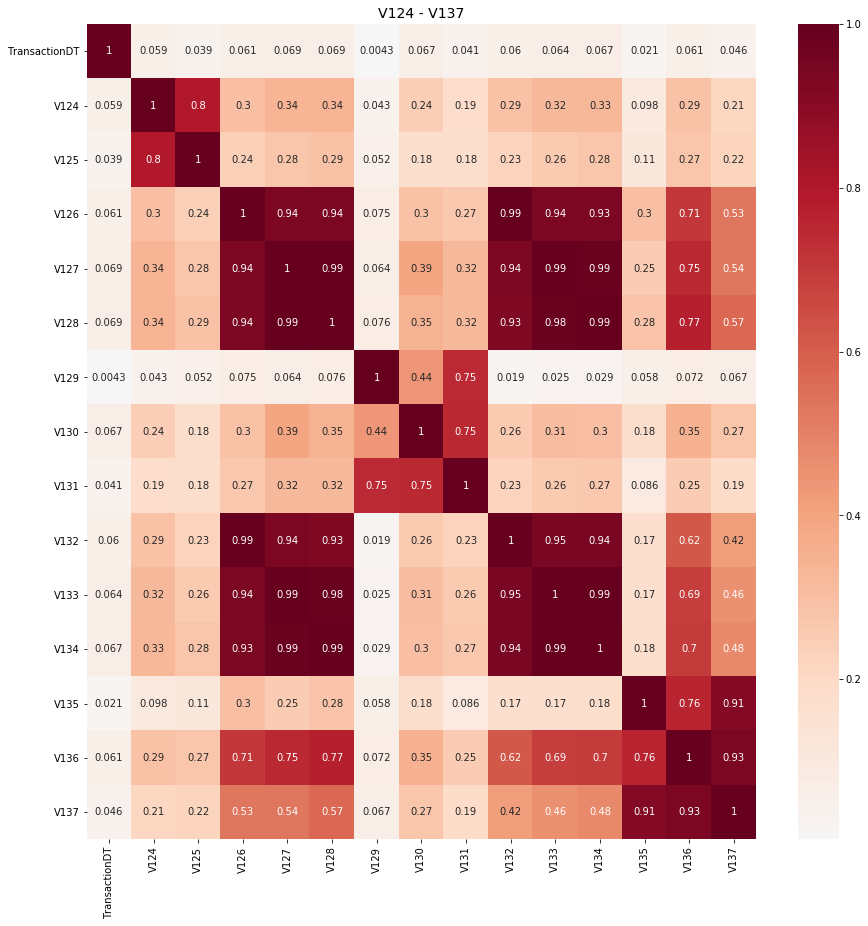

In [41]:
Vs = ['V'+str(x) for x in range(124,138)]
make_plots(Vs)
make_corr(Vs)

In [42]:
grps = [[124,125],[126,127,128,132,133,134],[129],[130,131],[135,136,137]]
reduce_group(grps)

Use these [124, 127, 129, 130, 136]


### V138 ~ V163

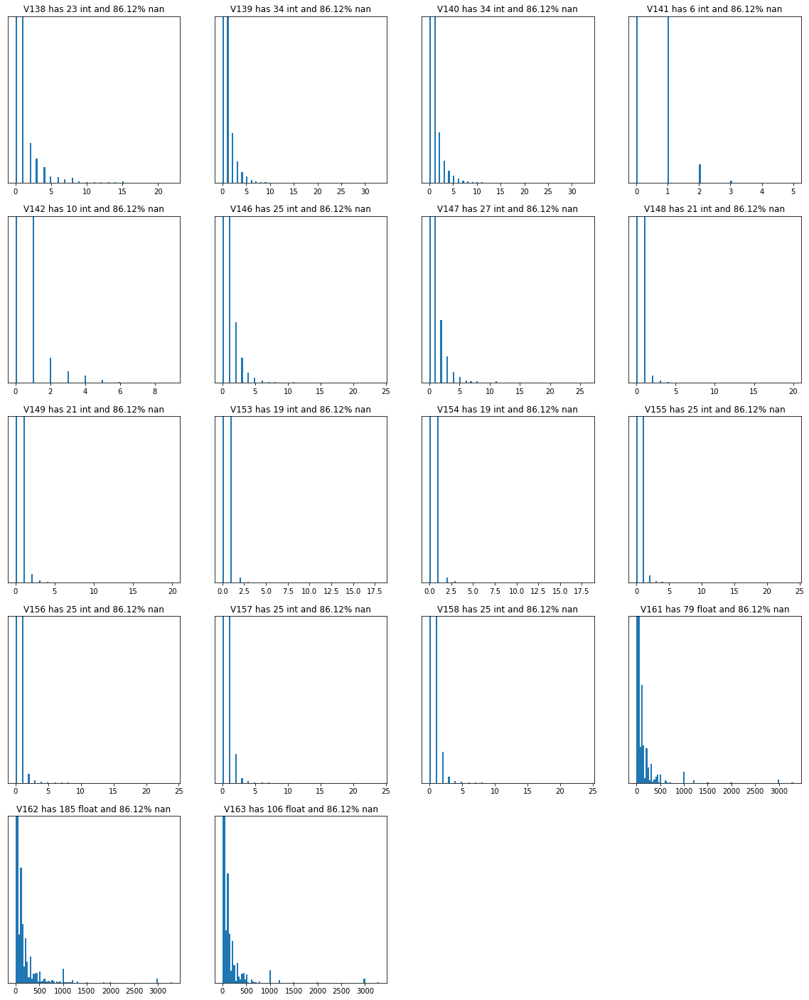

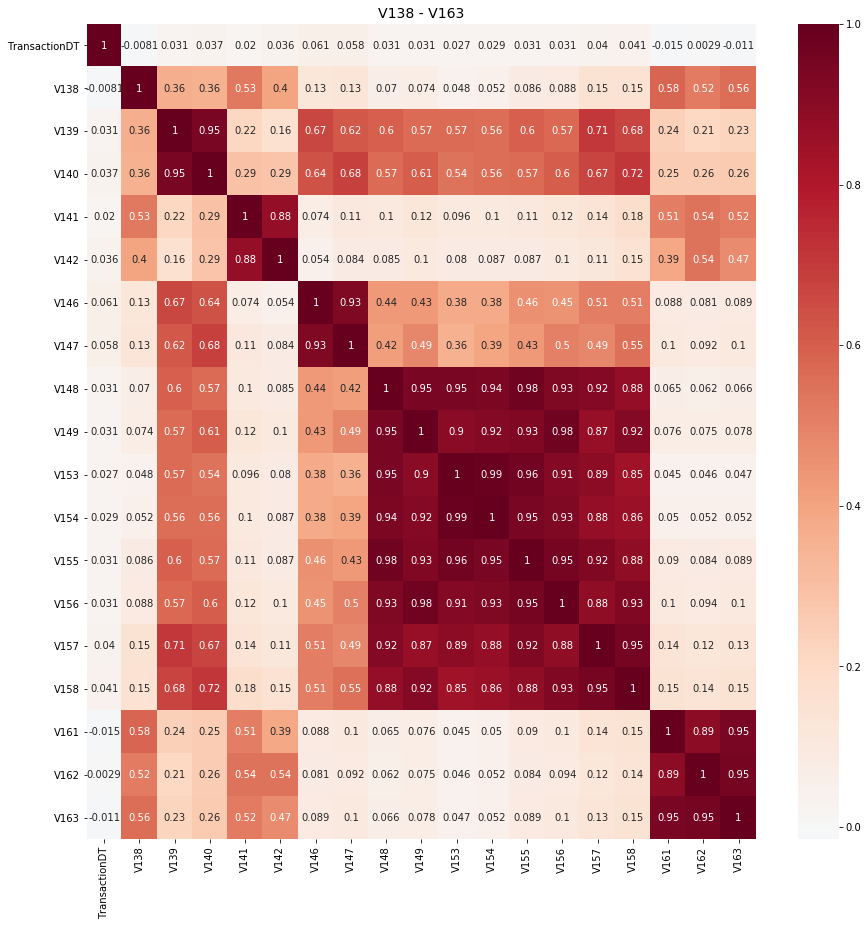

In [43]:
Vs = nans_groups[508595]
make_plots(Vs)
make_corr(Vs)

In [44]:
grps = [[138],[139,140],[141,142],[146,147],[148,149,153,154,156,157,158],[161,162,163]]
reduce_group(grps)

Use these [138, 139, 142, 147, 156, 162]


### V143 ~ V166

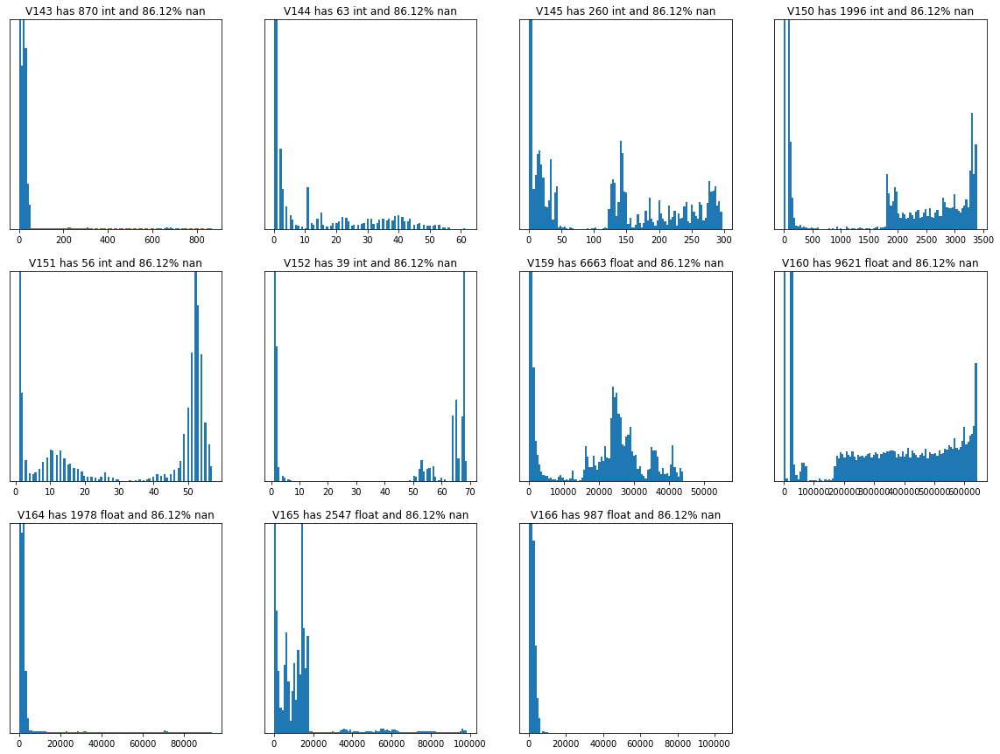

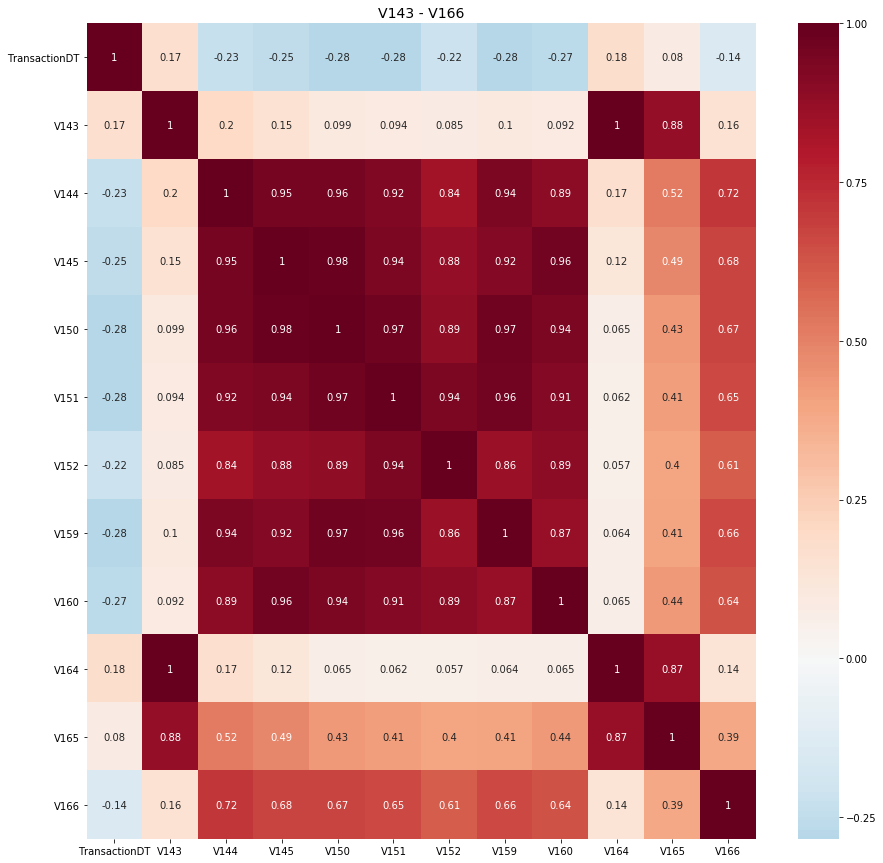

In [45]:
Vs = nans_groups[508589]
make_plots(Vs)
make_corr(Vs)

In [46]:
grps = [[143,164,165],[144,145,150,151,152,159,160],[166]]
reduce_group(grps)

Use these [165, 160, 166]


### V167 ~ V216

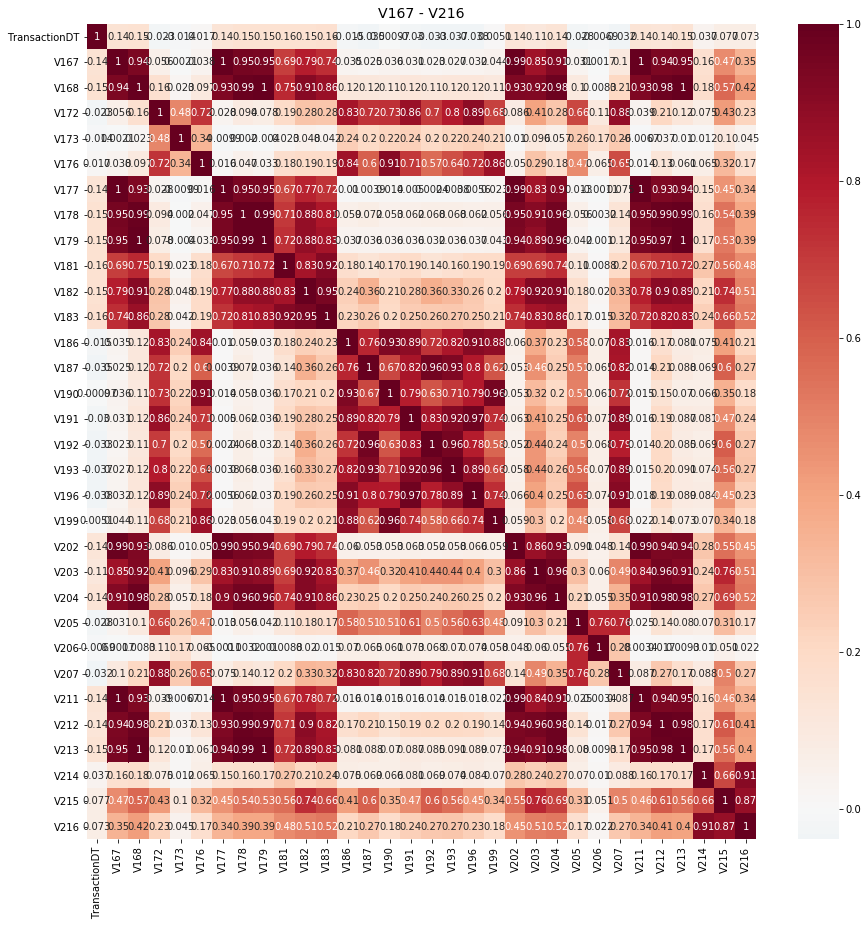

In [47]:
Vs = [x for x in nans_groups[450909]]
make_corr(Vs)

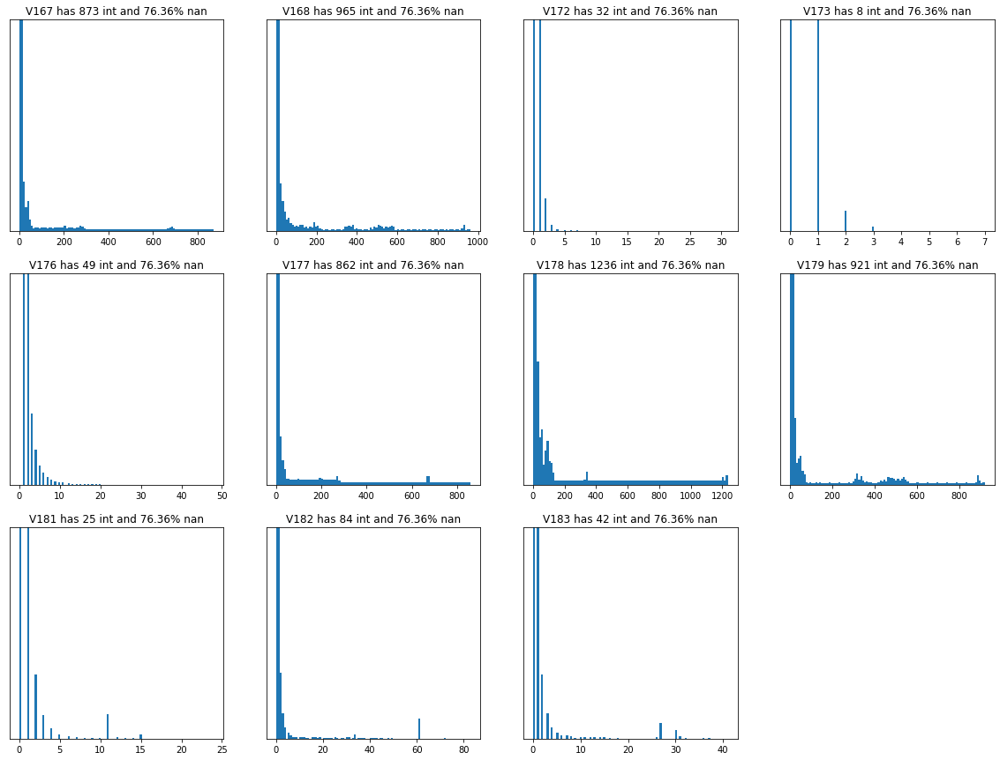

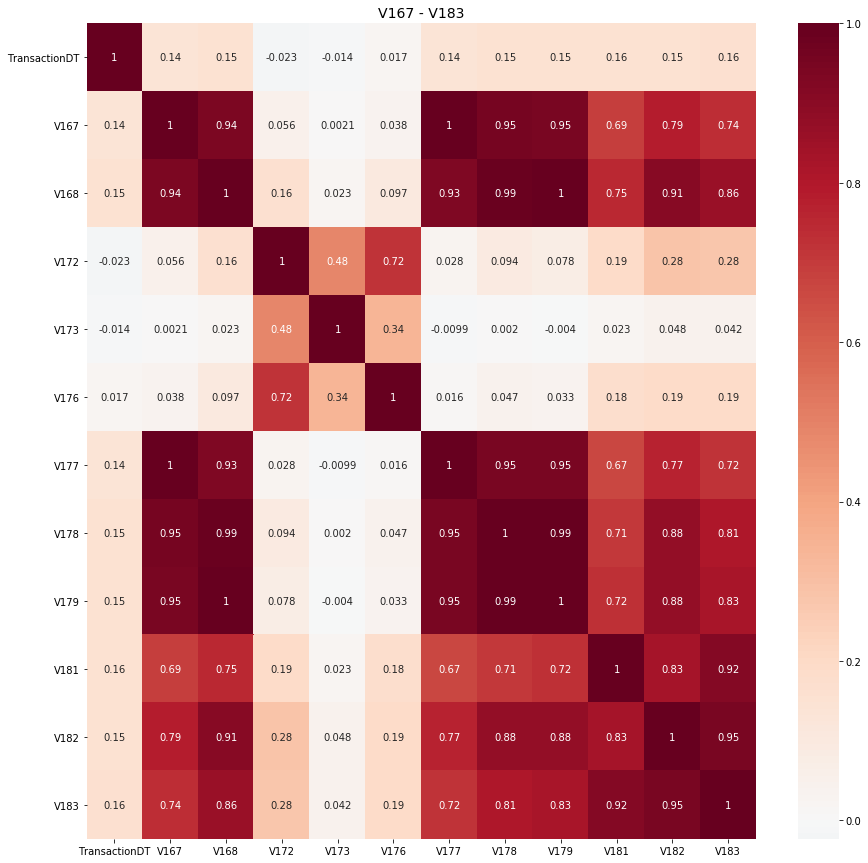

In [48]:
Vs = [x for x in nans_groups[450909] if int(x[1:])<186]
make_plots(Vs)
make_corr(Vs)

In [49]:
grps = [[167,168,177,178,179],[172,176],[173],[181,182,183]]
reduce_group(grps)

Use these [178, 176, 173, 182]


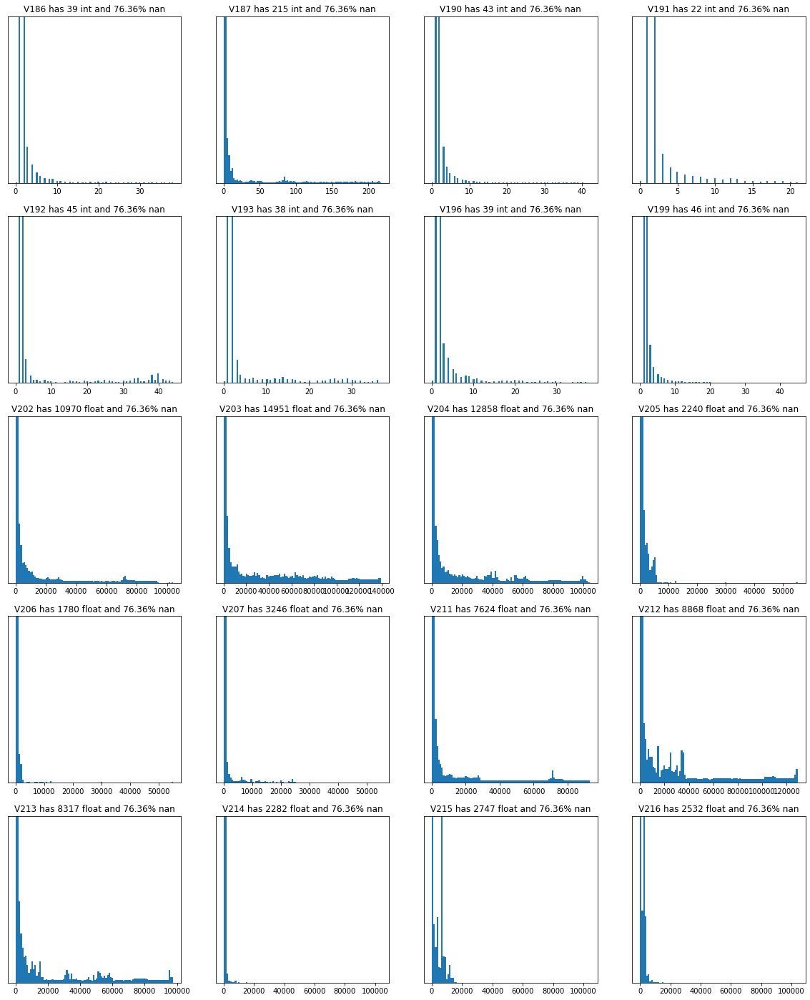

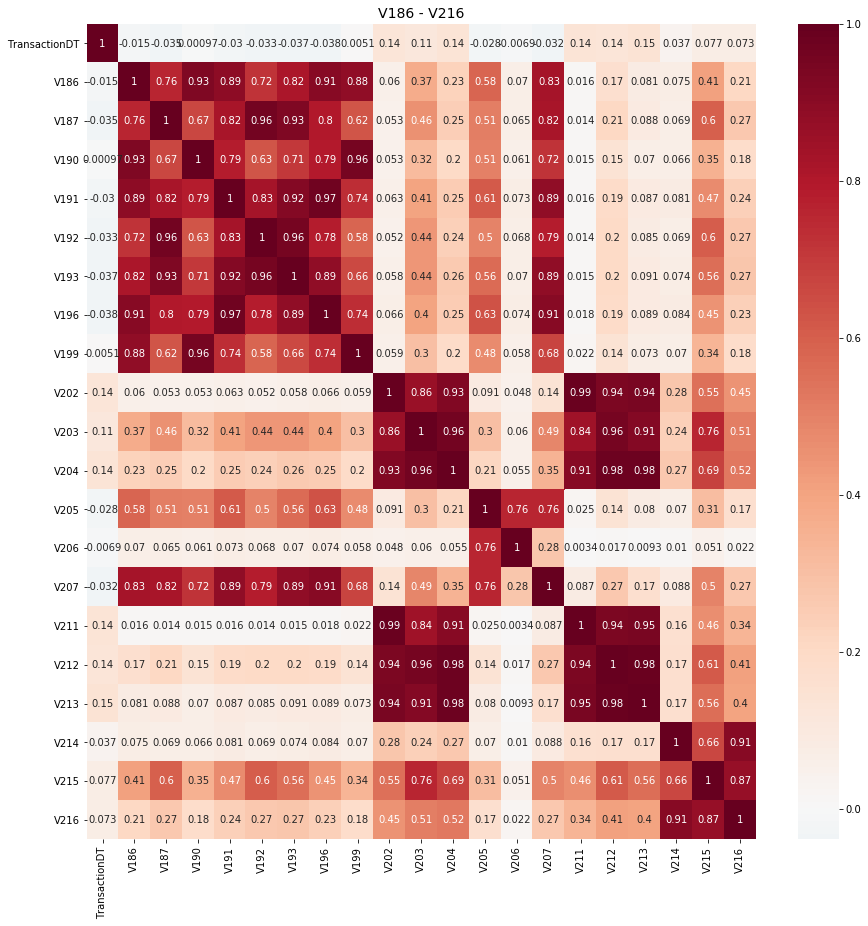

In [50]:
Vs = [x for x in nans_groups[450909] if (int(x[1:])>183)]
make_plots(Vs)
make_corr(Vs)

In [51]:
grps = [[186,187,190,191,192,193,196,199],[202,203,204,211,212,213],[205,206],[207],[214,215,216]]
reduce_group(grps)

Use these [187, 203, 205, 207, 215]


### V169 ~ V210

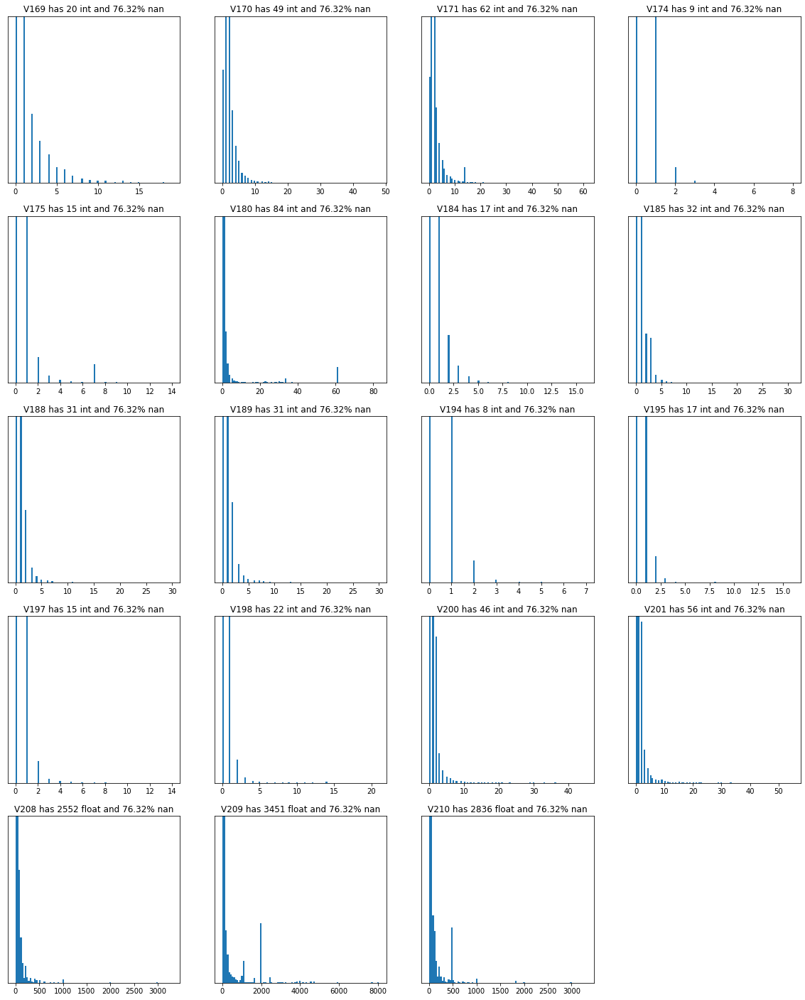

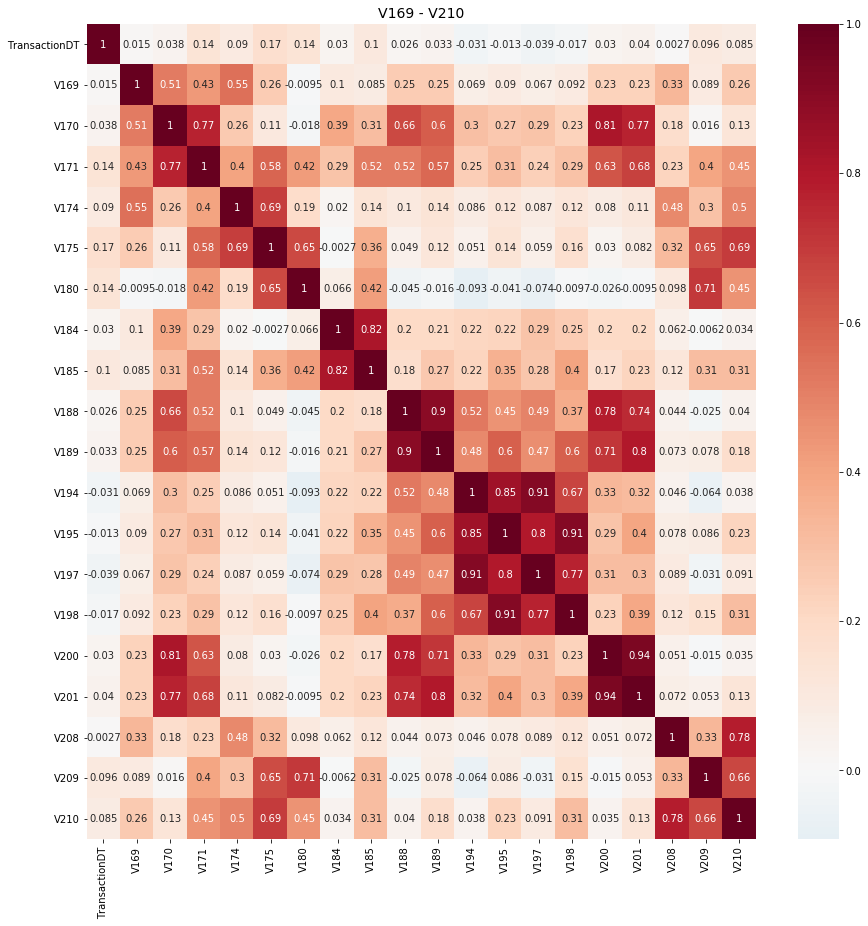

In [52]:
Vs = nans_groups[450721]
make_plots(Vs)
make_corr(Vs)

In [53]:
grps = [[169],[170,171,200,201],[174,175],[180],[184,185],[188,189],[194,195,197,198],[208,210],[209]]
reduce_group(grps)

Use these [169, 171, 175, 180, 185, 188, 198, 210, 209]


### V217 ~ V278

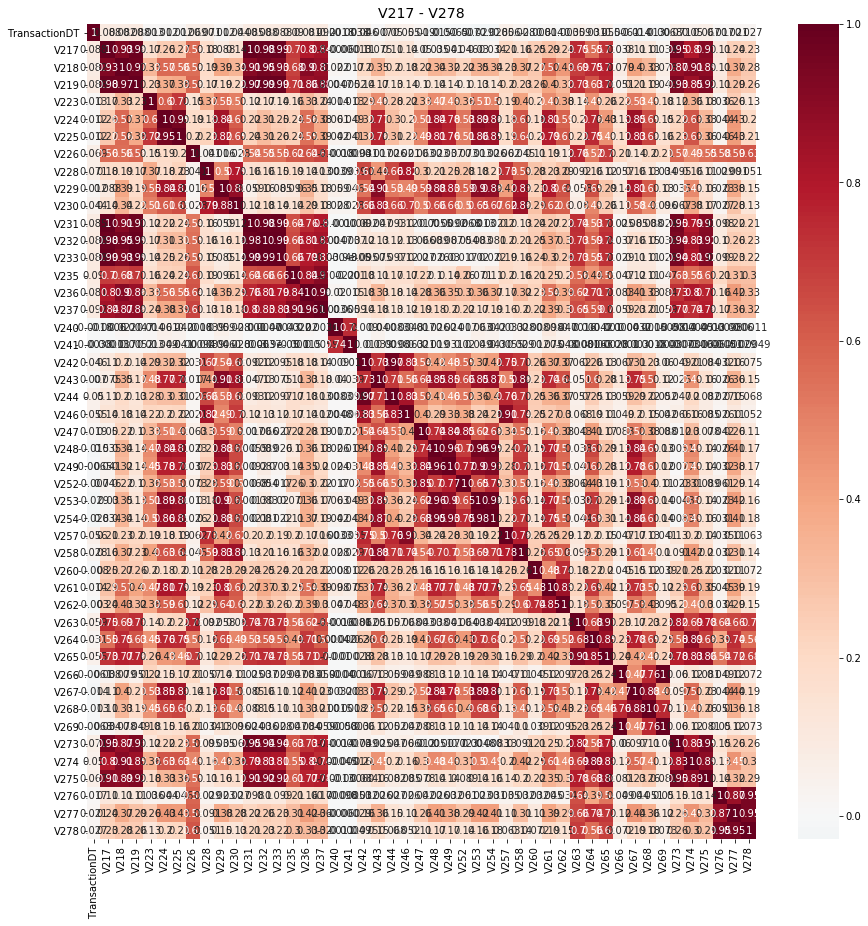

In [54]:
Vs = [x for x in nans_groups[460110]]
make_corr(Vs)

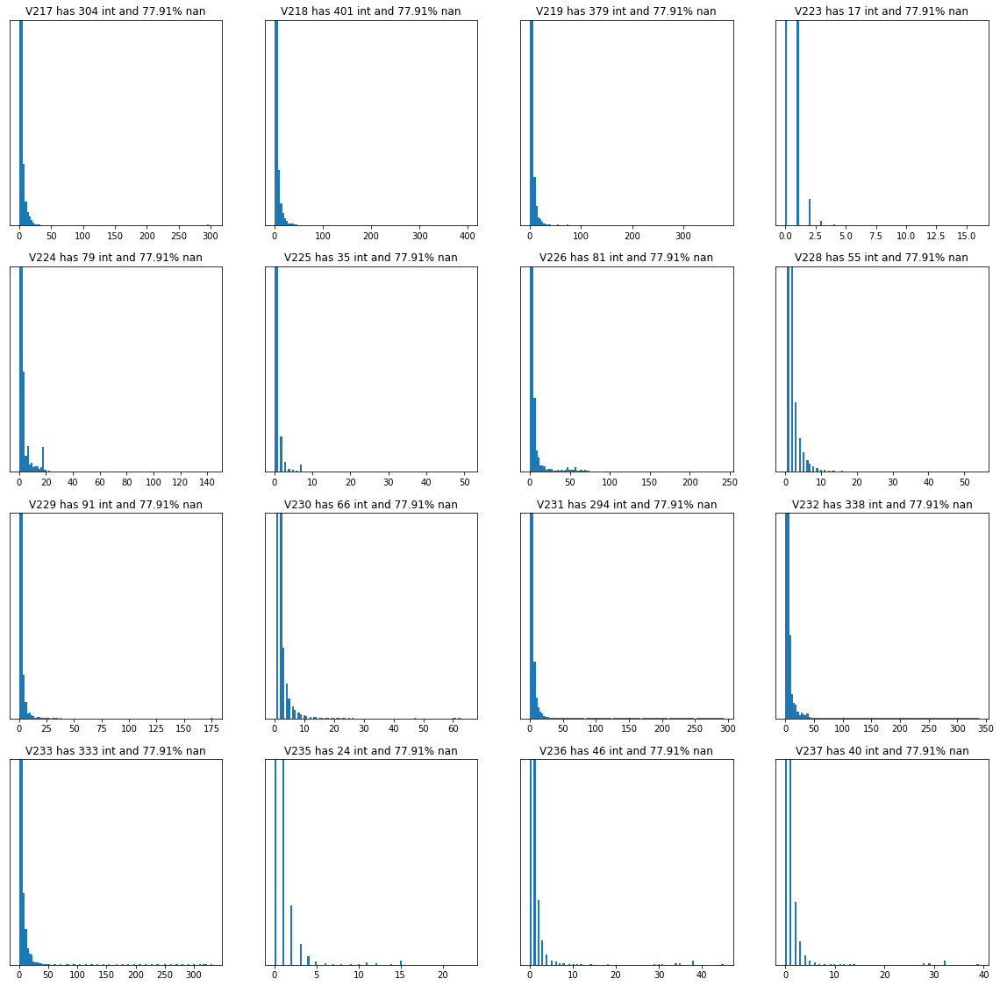

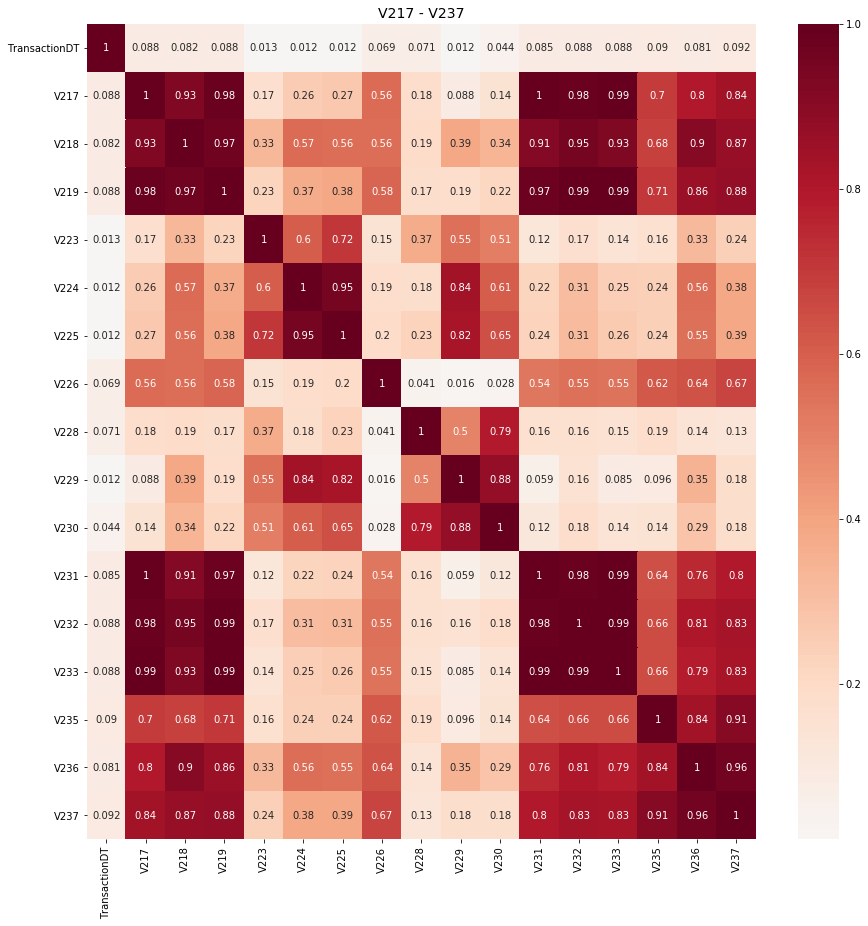

In [55]:
Vs = [x for x in nans_groups[460110] if int(x[1:])<240]
make_plots(Vs)
make_corr(Vs)

In [56]:
grps = [[217,218,219,231,232,233,236,237],[223],[224,225],[226],[228],[229,230],[235]]
reduce_group(grps)

Use these [218, 223, 224, 226, 228, 229, 235]


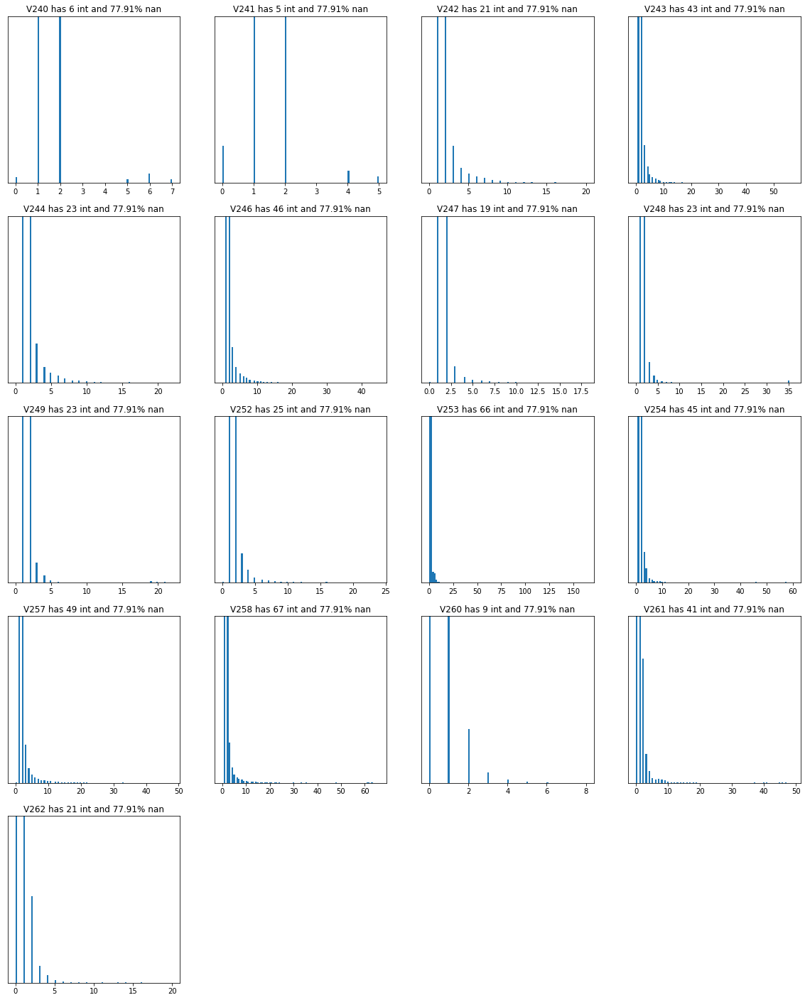

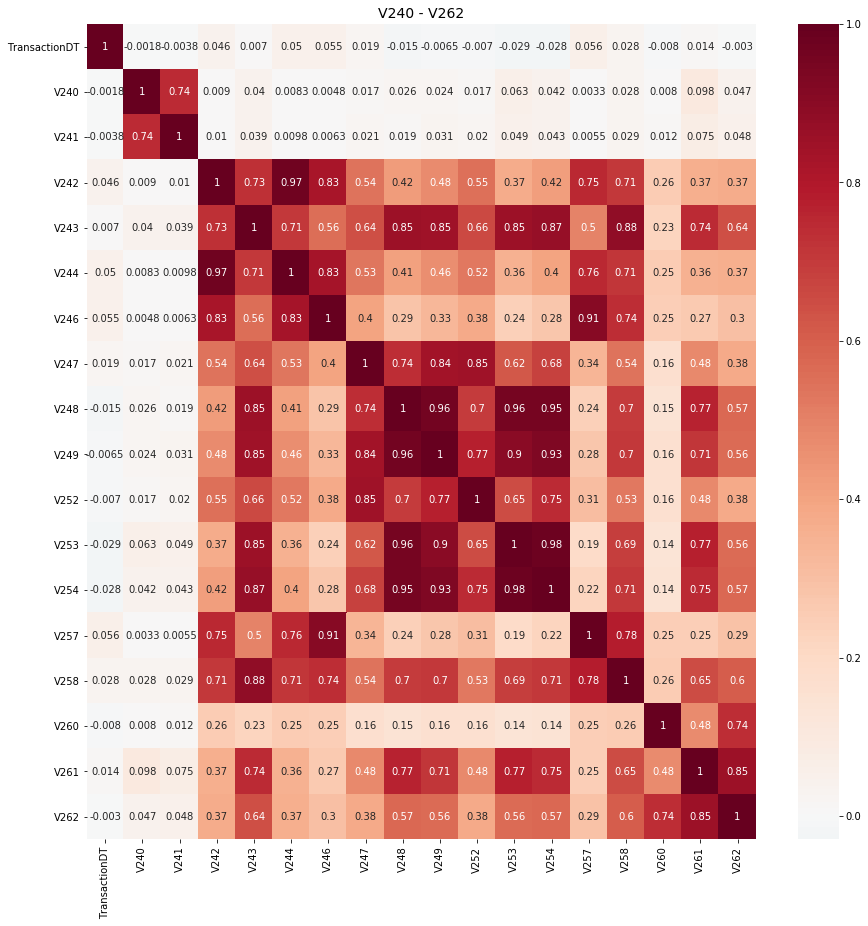

In [57]:
Vs = [x for x in nans_groups[460110] if (int(x[1:])>237)&(int(x[1:])<263)]
make_plots(Vs)
make_corr(Vs)

In [58]:
grps = [[240,241],[242,243,244,258],[246,257],[247,248,249,253,254],[252],[260],[261,262]]
reduce_group(grps)

Use these [240, 258, 257, 253, 252, 260, 261]


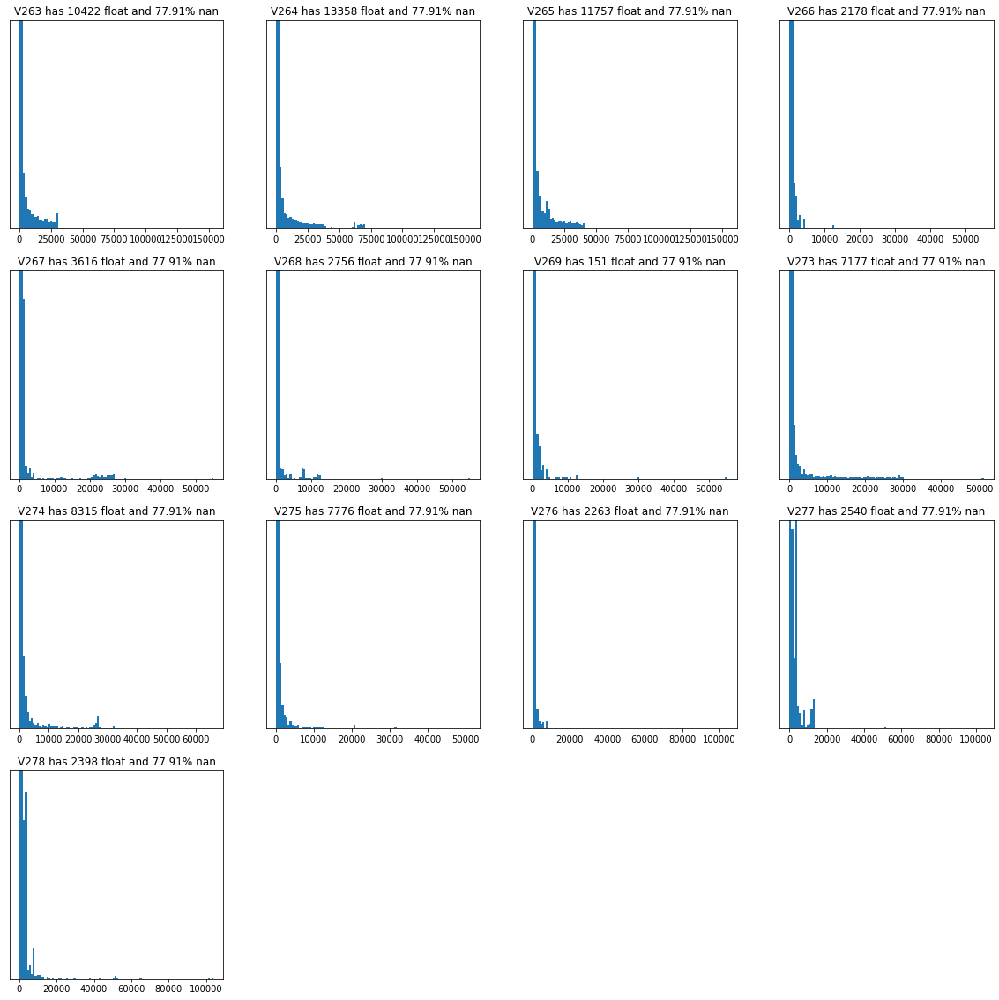

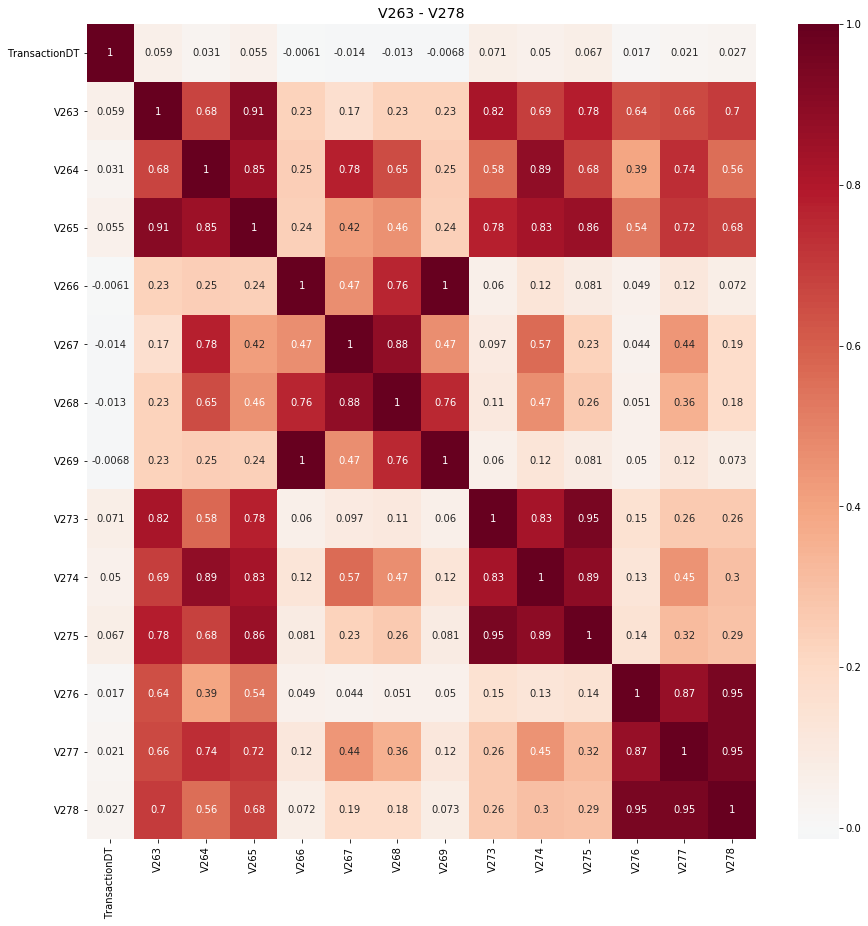

In [59]:
Vs = [x for x in nans_groups[460110] if (int(x[1:])>262)]
make_plots(Vs)
make_corr(Vs)

In [60]:
grps = [[263,265,264],[266,269],[267,268],[273,274,275],[276,277,278]]
reduce_group(grps)

Use these [264, 266, 267, 274, 277]


### V220 ~ V272

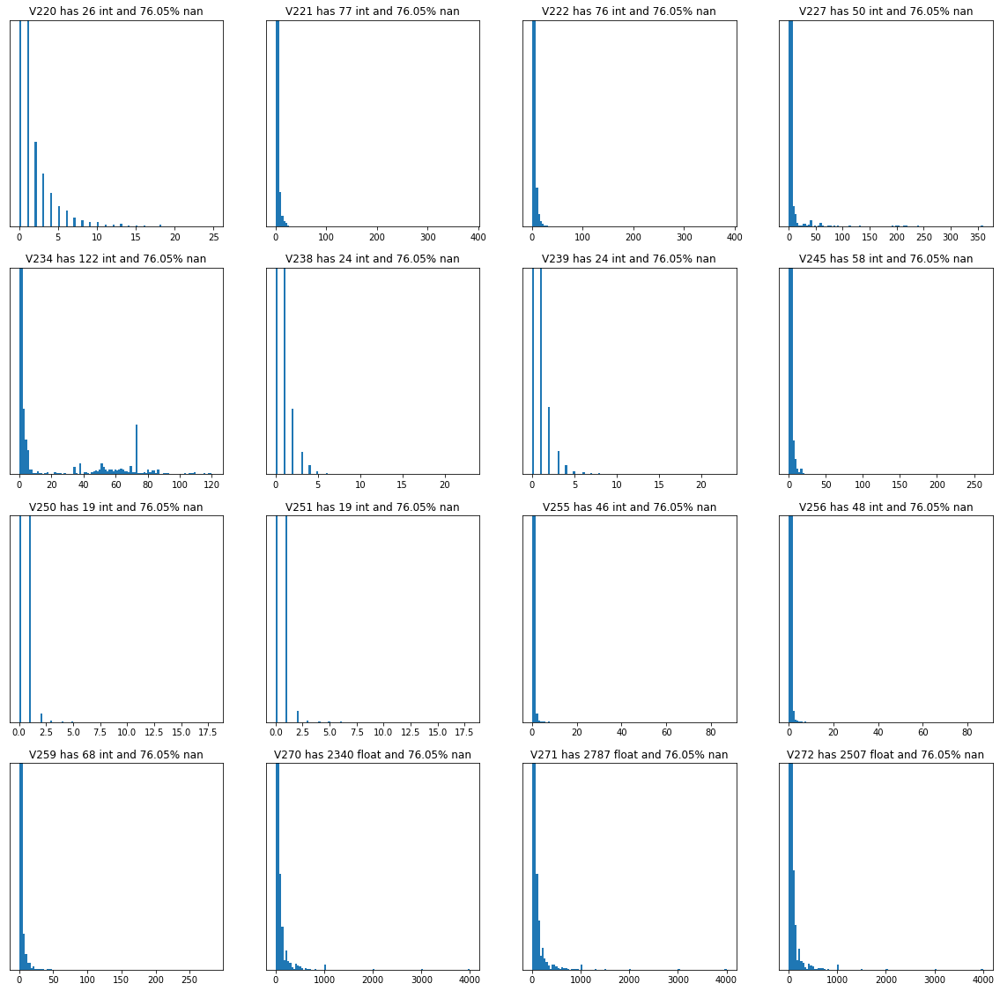

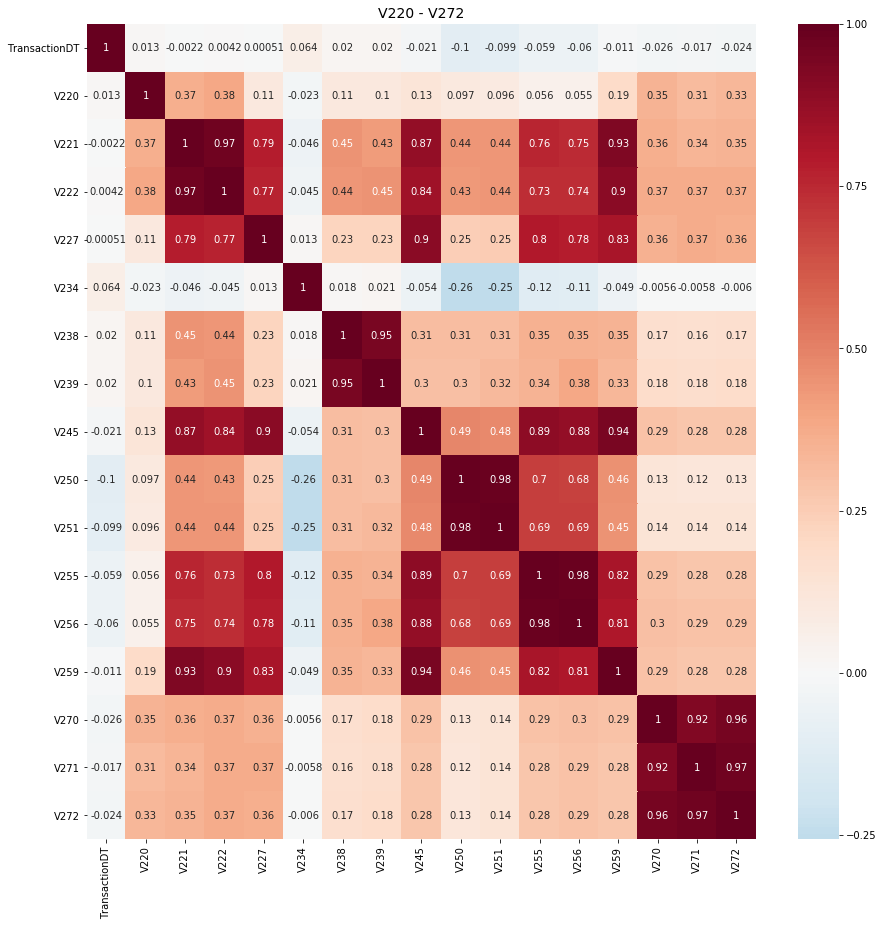

In [61]:
Vs = nans_groups[449124]
make_plots(Vs)
make_corr(Vs)

In [62]:
grps = [[220],[221,222,227,245,255,256,259],[234],[238,239],[250,251],[270,271,272]]
reduce_group(grps)

Use these [220, 221, 234, 238, 250, 271]


### V279 ~ V321

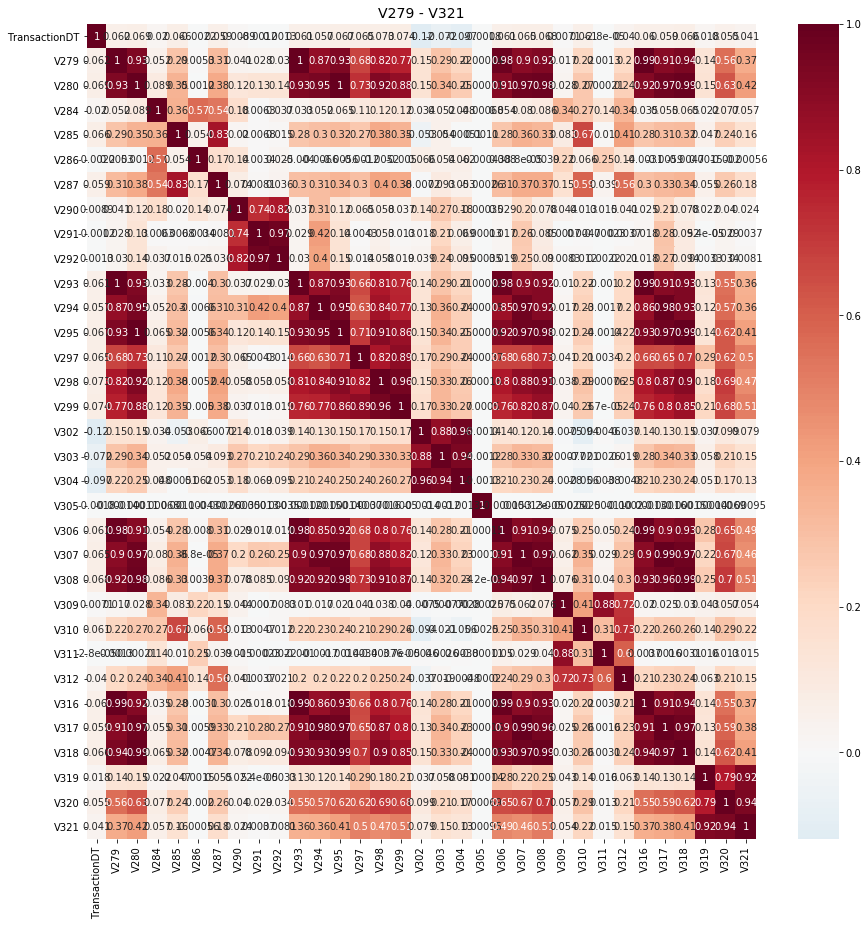

In [63]:
Vs = [x for x in nans_groups[12]]
make_corr(Vs)

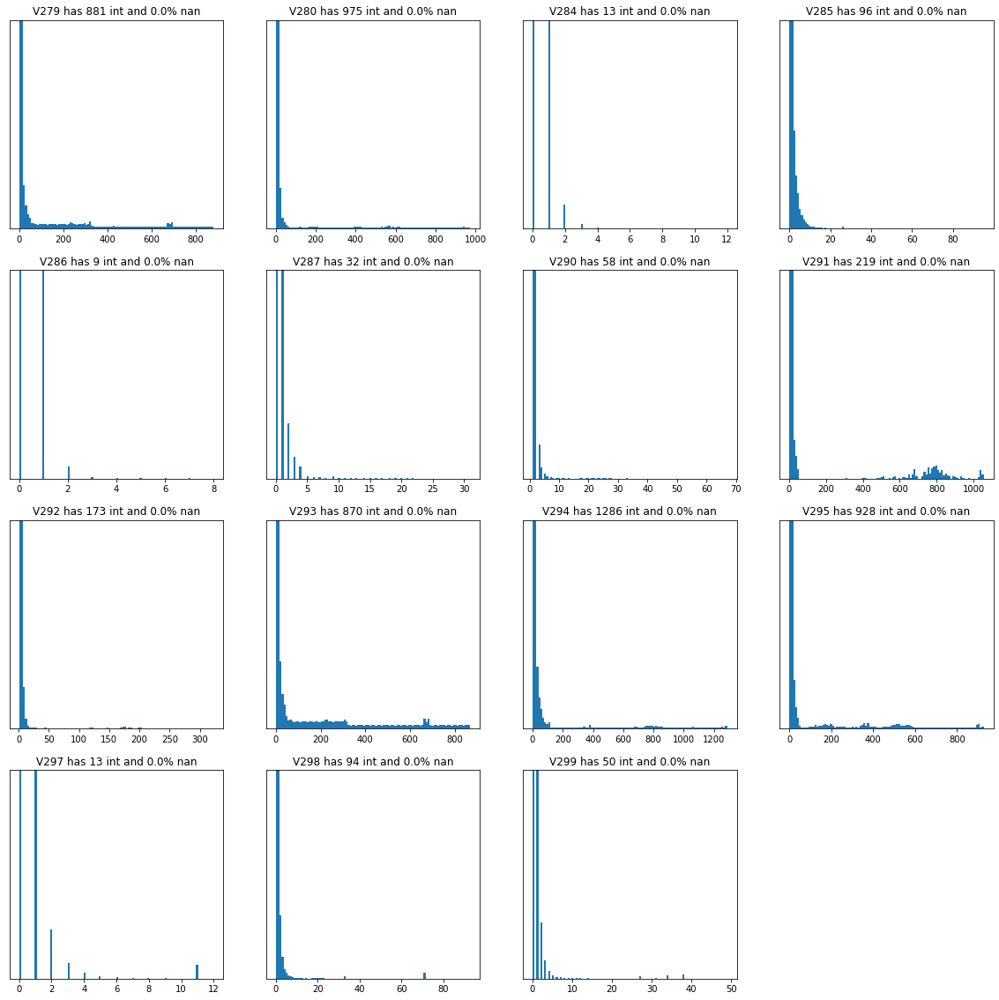

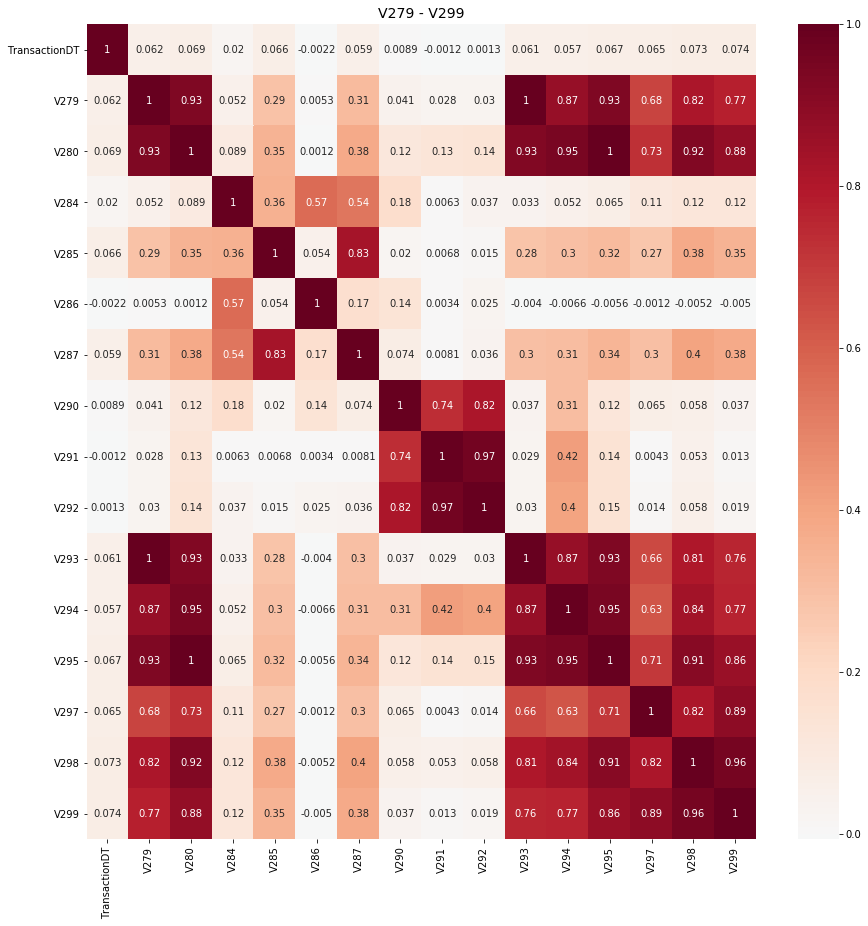

In [64]:
Vs = [x for x in nans_groups[12] if int(x[1:])<302]
make_plots(Vs)
make_corr(Vs)

In [65]:
grps = [[279,280,293,294,295,298,299],[284],[285,287],[286],[290,291,292],[297]]
reduce_group(grps)

Use these [294, 284, 285, 286, 291, 297]


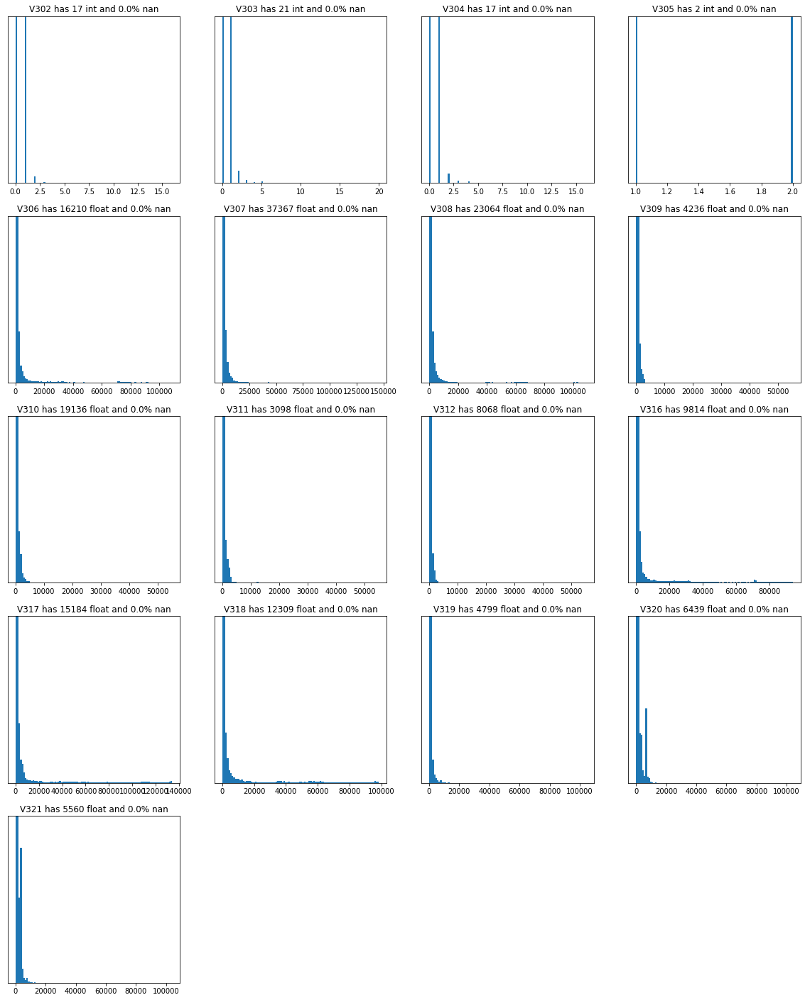

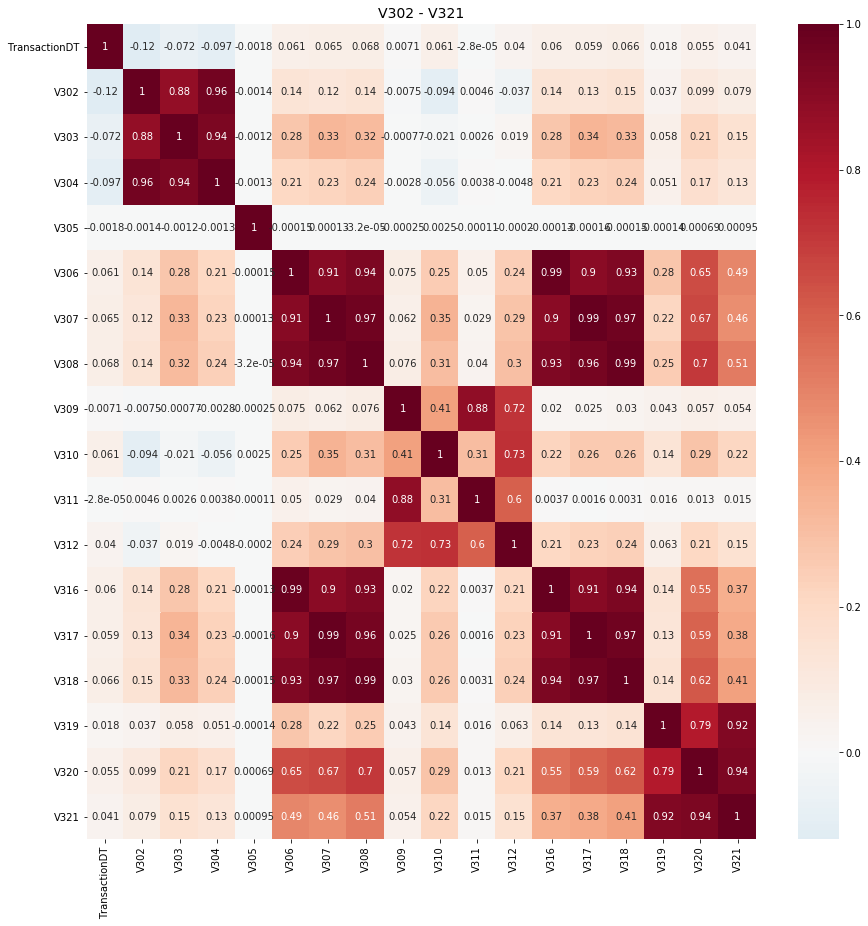

In [66]:
Vs = [x for x in nans_groups[12] if int(x[1:])>299]
make_plots(Vs)
make_corr(Vs)

In [67]:
grps = [[302,303,304],[305],[306,307,308,316,317,318],[309,311],[310,312],[319,320,321]]
reduce_group(grps)

Use these [303, 305, 307, 309, 310, 320]


### V281 ~ V315, D1

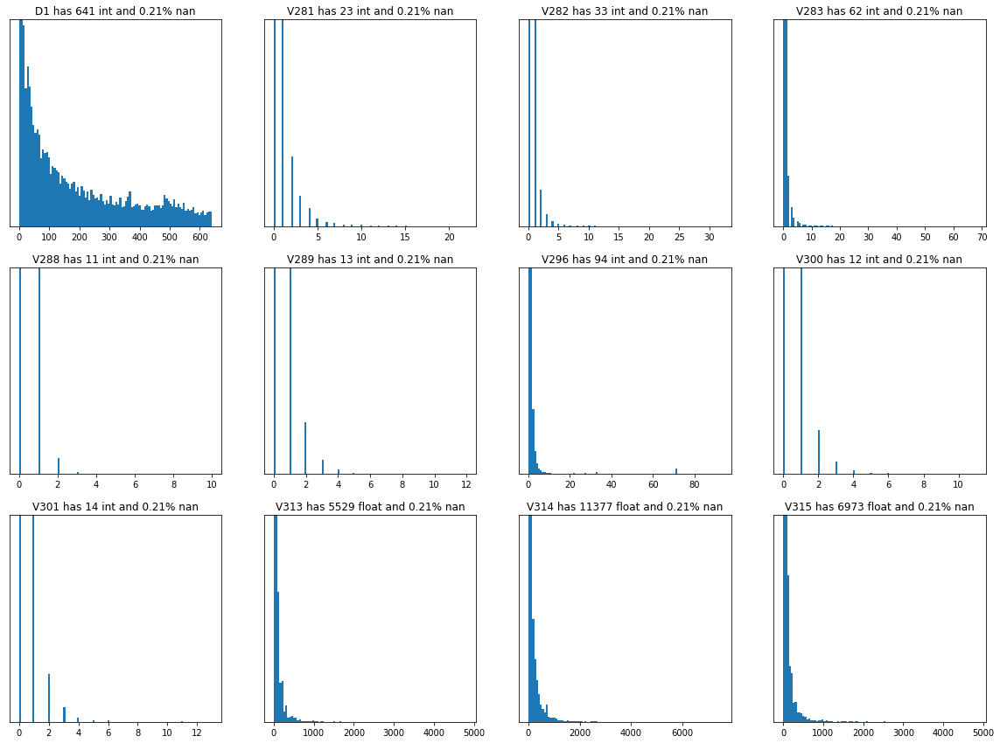

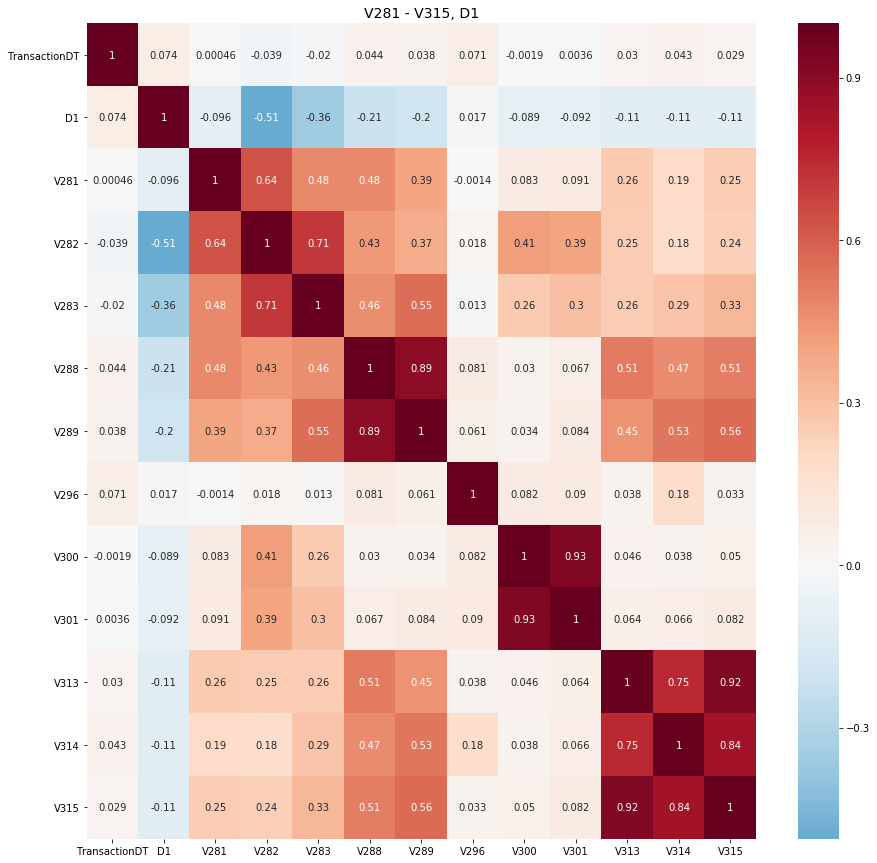

In [68]:
Vs = nans_groups[1269]
make_plots(Vs)
Vtitle = 'V281 - V315, D1'
make_corr(Vs,Vtitle)

In [69]:
grps = [[281],[282,283],[288,289],[296],[300,301],[313,314,315]]
reduce_group(grps)

Use these [281, 283, 289, 296, 301, 314]


### V322 - V339

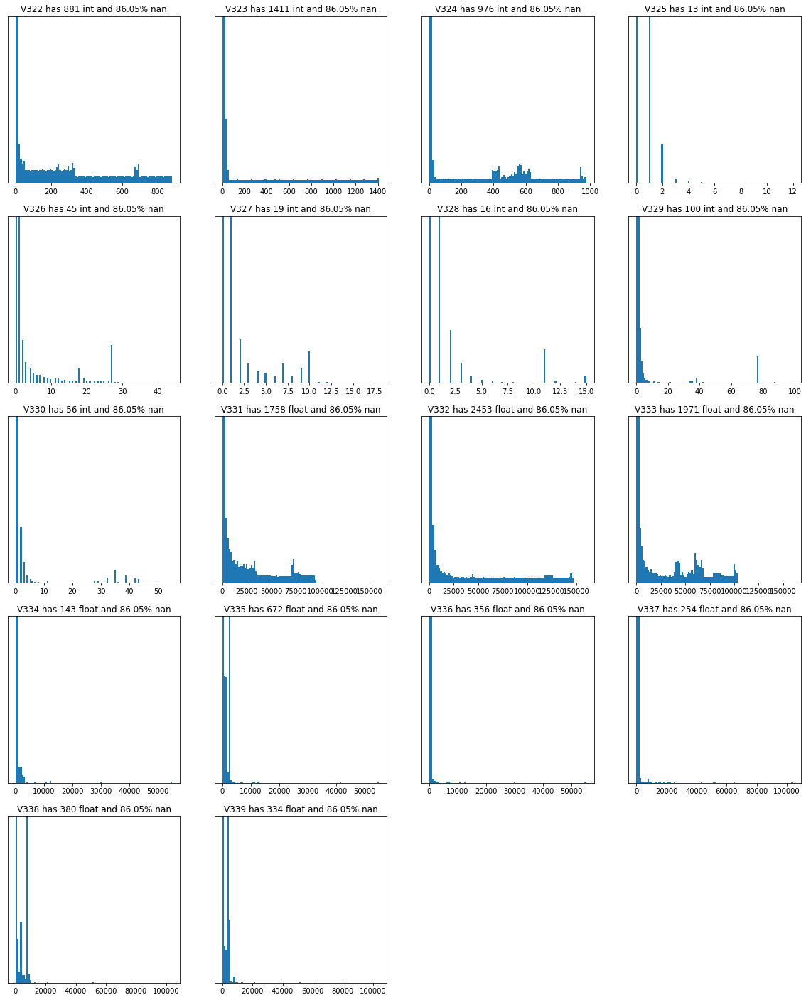

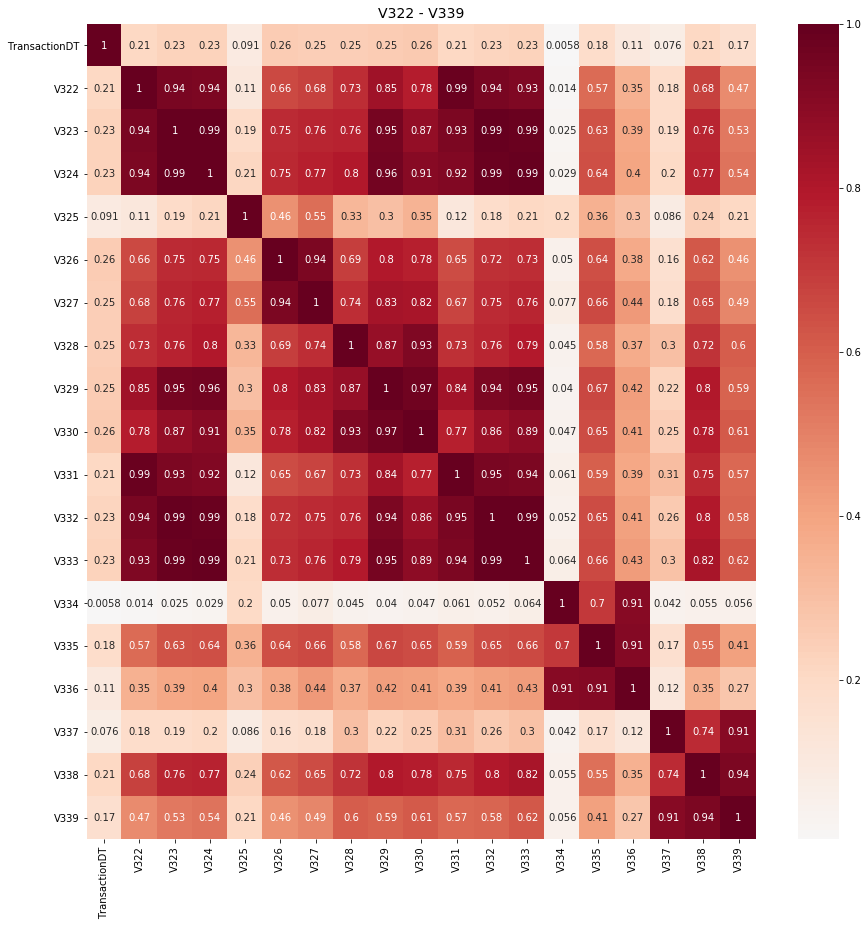

In [70]:
Vs = nans_groups[508189]
make_plots(Vs)
make_corr(Vs)

In [71]:
grps = [[322,323,324,326,327,328,329,330,331,332,333],[325],[334,335,336],[337,338,339]]
reduce_group(grps)

Use these [332, 325, 335, 338]


### V Reduced

In [72]:
v =  [1, 3, 4, 6, 8, 11]
v += [13, 14, 17, 20, 23, 26, 27, 30]
v += [36, 37, 40, 41, 44, 47, 48]
v += [54, 56, 59, 62, 65, 67, 68, 70]
v += [76, 78, 80, 82, 86, 88, 89, 91]
v += [96, 98, 99, 104]
v += [107, 108, 111, 115, 117, 120, 121, 123]
v += [124, 127, 129, 130, 136]
v += [138, 139, 142, 147, 156, 162]
v += [165, 160, 166]
v += [178, 176, 173, 182]
v += [187, 203, 205, 207, 215]
v += [169, 171, 175, 180, 185, 188, 198, 210, 209]
v += [218, 223, 224, 226, 228, 229, 235]
v += [240, 258, 257, 253, 252, 260, 261]
v += [264, 266, 267, 274, 277]
v += [220, 221, 234, 238, 250, 271]
v += [294, 284, 285, 286, 291, 297]
v += [303, 305, 307, 309, 310, 320]
v += [281, 283, 289, 296, 301, 314]
v += [332, 325, 335, 338]

In [73]:
print('Reduced set has',len(v),'columns')

Reduced set has 128 columns


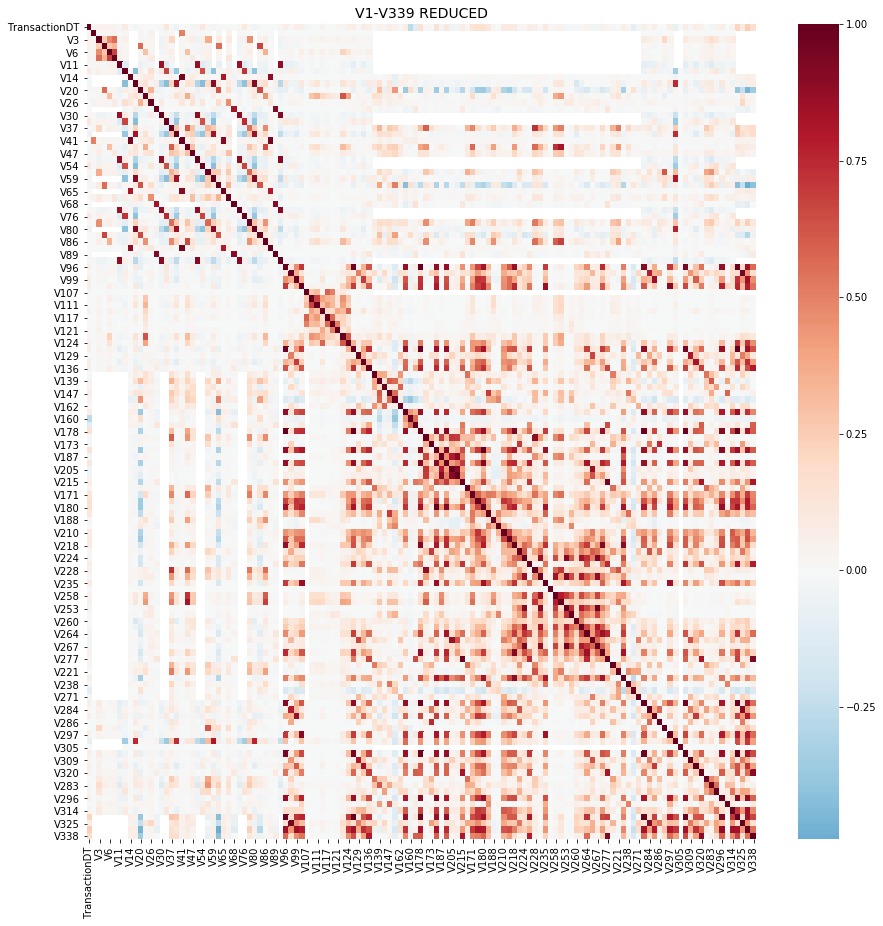

In [74]:
cols = ['TransactionDT'] + ['V'+str(x) for x in v]
train2 = train[cols].sample(frac=0.2)
plt.figure(figsize=(15,15))
sns.heatmap(train2[cols].corr(), cmap='RdBu_r', annot=False, center=0.0)
plt.title('V1-V339 REDUCED',fontsize=14)
plt.show()

These attributes still have correlations but we will stop here and proceed with C, D, M and ID attributes as we have reduced 211 V attributes.

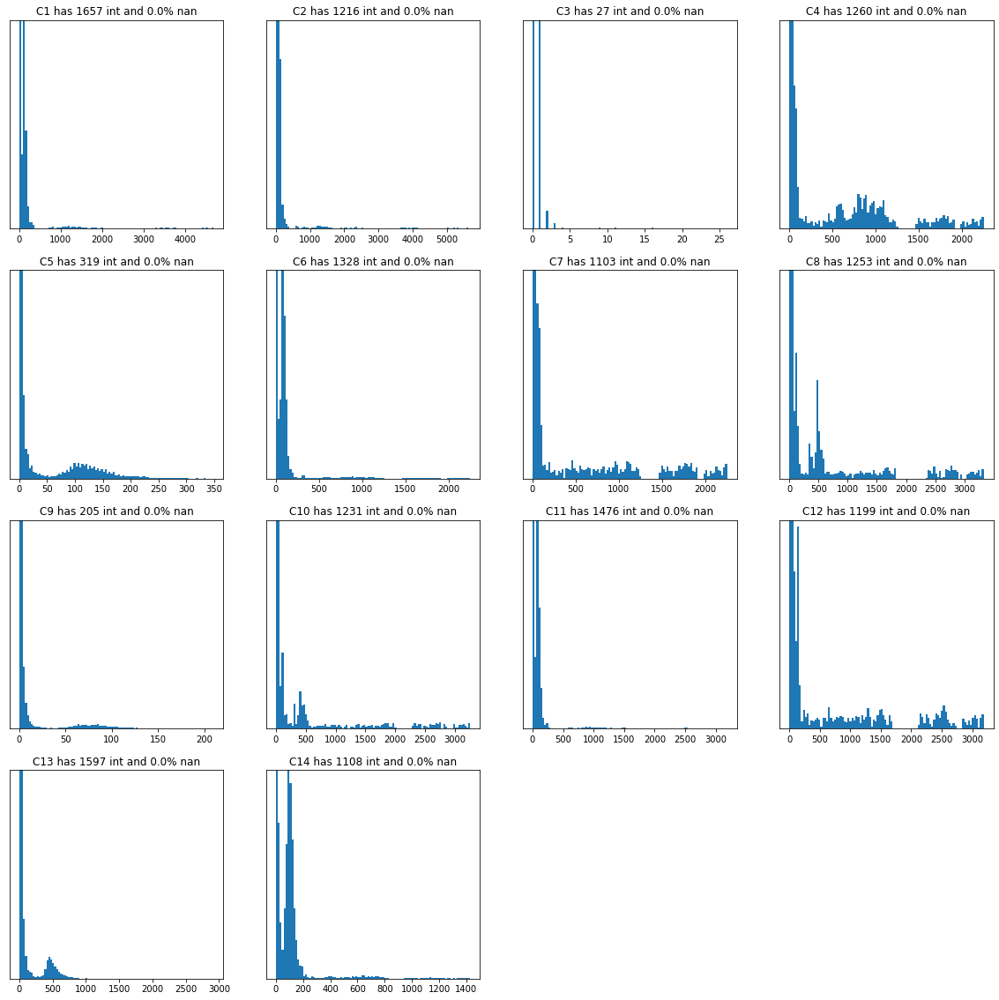

In [75]:
def make_plots2(Vs):
    '''
    plotting histograms
    '''
    col = 4
    row = len(Vs)//4+1
    plt.figure(figsize=(20,row*5))
    for i,v in enumerate(Vs):
        plt.subplot(row,col,i+1)
        idx = train[~train[v].isna()].index
        n = train[v].nunique()
        x = np.sum(train.loc[idx,v]!=train.loc[idx,v].astype(int))
        y = np.round(100*np.sum(train[v].isna())/len(train),2)
        t = 'int'
        if x!=0: t = 'float'
        plt.title(v+' has '+str(n)+' '+t+' and '+str(y)+'% nan')
        plt.yticks([])
        h = plt.hist(train.loc[idx,v],bins=100)
        if len(h[0])>1: plt.ylim((0,np.sort(h[0])[-2]))
    plt.show()
make_plots2(['C'+str(x) for x in range(1,15)])

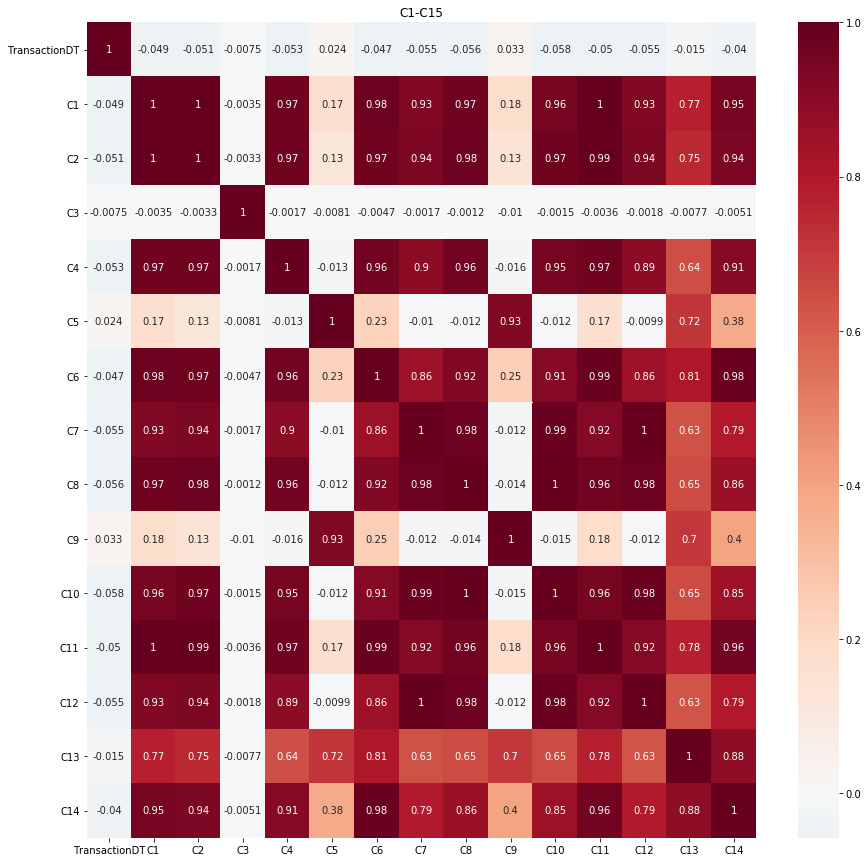

In [76]:
cols = ['TransactionDT'] + ['C'+str(x) for x in range(1,15)]
plt.figure(figsize=(15,15))
sns.heatmap(train[cols].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.title('C1-C15')
plt.show()

Observation: As already noted, C values have high correlations among themselves. But as we have already reduced 50% of V attributes, we will retain C attributes and check whether Model Performance on Metric is acceptable. If not acceptable we should proceed with C attribute redundancy analysis.

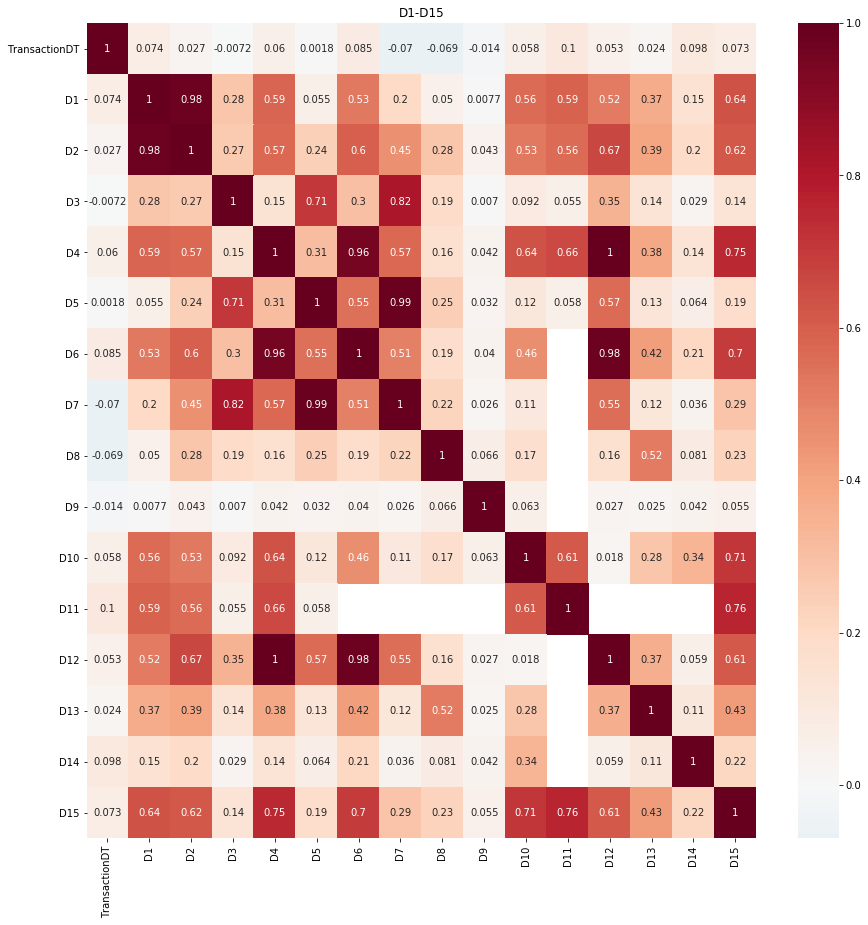

In [77]:
cols = ['TransactionDT'] + ['D'+str(x) for x in range(1,16)]
plt.figure(figsize=(15,15))
sns.heatmap(train[cols].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.title('D1-D15')
plt.show()

In [78]:
Ms = ['M'+str(x) for x in range(1,10)]
mp = {'F':0,'T':1,'M0':0,'M1':1,'M2':2}
for c in Ms: train[c] = train[c].map(mp)

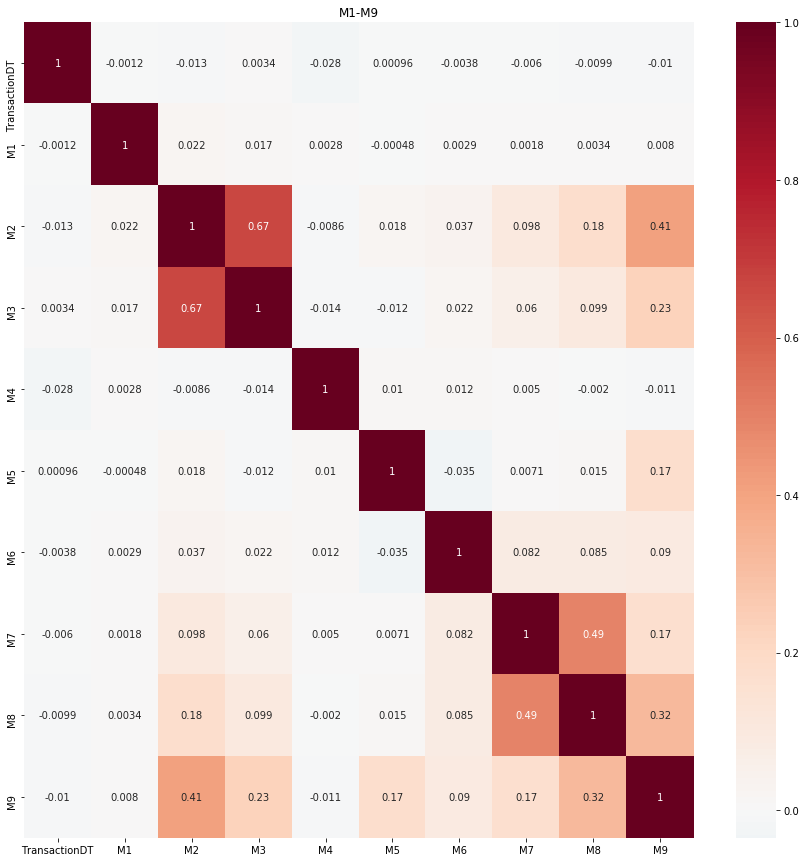

In [79]:
cols = ['TransactionDT'] + Ms
plt.figure(figsize=(15,15))
sns.heatmap(train[cols].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.title('M1-M9')
plt.show()

Observation: All M attributes are weakly correlated among themselves.

In [80]:
train_id = pd.read_csv('/content/train_identity.csv')
train_id = pd.merge(train_id,train[['TransactionID','TransactionDT']],on='TransactionID',how='left')
ids = ['id_0'+str(x) for x in range(1,10)]+['id_'+str(x) for x in range(10,39)]
for c in ids: print (c,train_id[c].unique()[:10])

id_01 [  0.  -5. -15. -10. -20. -40. -30. -25. -55. -45.]
id_02 [ 70787.  98945. 191631. 221832.   7460.  61141.     nan  31964. 116098.
 257037.]
id_03 [nan  0.  3.  2.  5.  1.  6.  9.  4. -5.]
id_04 [ nan   0. -11.  -5.  -8.  -1.  -6.  -9.  -3. -13.]
id_05 [nan  0.  1.  3.  2.  9. 12.  6.  4. 21.]
id_06 [ nan  -5.   0.  -6. -10. -11.  -1.  -4. -43.  -9.]
id_07 [nan 22.  6. -1.  4.  2. 17. 12. 27.  5.]
id_08 [  nan  -34.  -55. -100.  -15.  -33.  -13.  -36.  -44.  -26.]
id_09 [nan  0.  3.  2.  1.  5. -8.  7.  4.  6.]
id_10 [ nan   0.  -9. -42.  -6. -29.  -8.  -1.  -5. -11.]
id_11 [100.                  nan  93.75        95.08000183  95.65000153
  94.29000092  96.19000244  90.56999969  97.54000092  96.43000031]
id_12 ['NotFound' 'Found']
id_13 [nan 49. 52. 14. 20. 55. 43. 18. 41. 63.]
id_14 [-480. -300.   nan -360. -420. -540. -600.  480. -240.  300.]
id_15 ['New' 'Found' nan 'Unknown']
id_16 ['NotFound' 'Found' nan]
id_17 [166. 121. 225.  nan 102. 148. 199. 146. 144. 133.]
id_18 [nan 1

In [81]:
booln = ['id_12','id_15','id_16','id_27','id_28','id_29','id_35','id_36','id_37','id_38']
cats = ['id_23','id_30','id_31','id_33','id_34']
mp = {'Unknown':0,'NotFound':1,'Found':2,'New':3,'F':0,'T':1}
for c in booln: train_id[c] = train_id[c].map(mp)

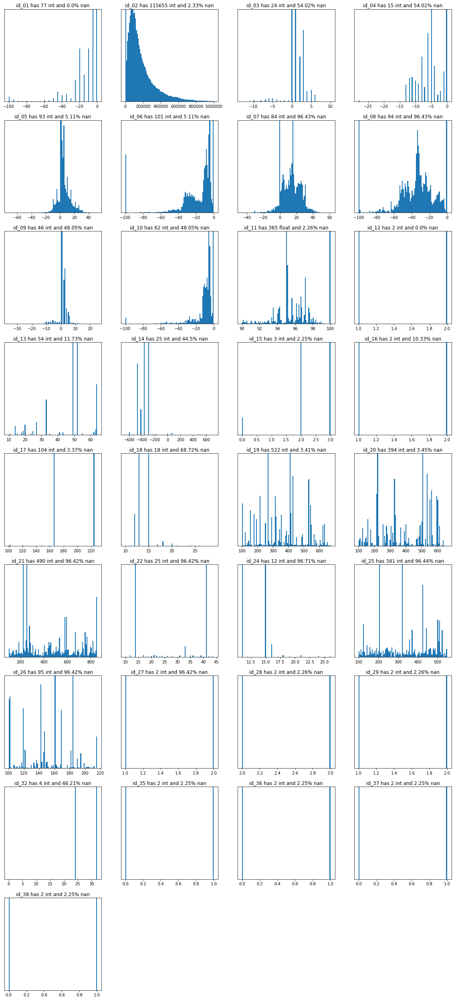

In [82]:
def make_plots2(Vs):
    col = 4
    row = len(Vs)//4+1
    plt.figure(figsize=(20,row*5))
    for i,v in enumerate(Vs):
        plt.subplot(row,col,i+1)
        idx = train_id[~train_id[v].isna()].index
        n = train_id[v].nunique()
        x = np.sum(train_id.loc[idx,v]!=train_id.loc[idx,v].astype(int))
        y = np.round(100*np.sum(train_id[v].isna())/len(train_id),2)
        t = 'int'
        if x!=0: t = 'float'
        plt.title(v+' has '+str(n)+' '+t+' and '+str(y)+'% nan')
        plt.yticks([])
        h = plt.hist(train_id.loc[idx,v],bins=100)
        if len(h[0])>1: plt.ylim((0,np.sort(h[0])[-2]))
    plt.show()
make_plots2([x for x in ids if x not in cats])

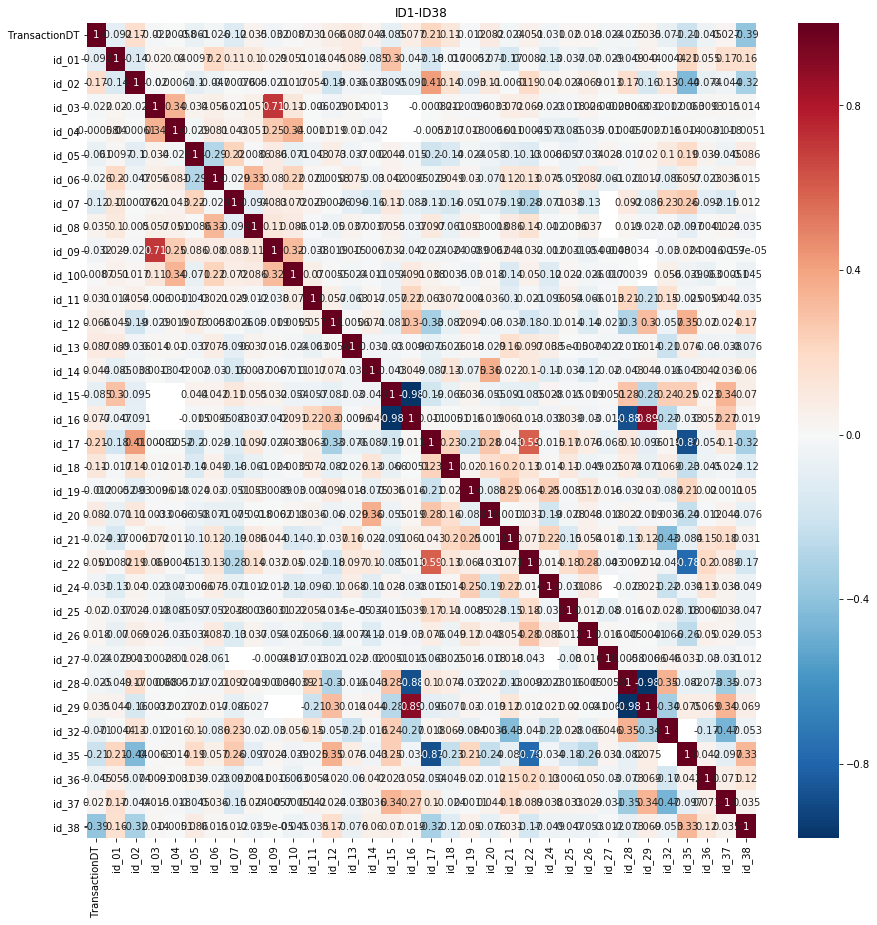

In [83]:
cols = ['TransactionDT'] + [x for x in ids if x not in cats]
plt.figure(figsize=(15,15))
sns.heatmap(train_id[cols].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.title('ID1-ID38')
plt.show()

In [84]:
del train, train_id

**Features selected for model training after correlation analysis:** <br><br>
       'TransactionAmt', 'ProductCD', 
       'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', <br><br>
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9',
       'C10', 'C11', 'C12', 'C13', 'C14', <br><br>
       'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 
       'D11', 'D12', 'D13', 'D14', 'D15', <br><br>
       'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', <br><br>
       'V1', 'V3', 'V4', 'V6', 'V8', 'V11', 'V13', 'V14', 'V17',
       'V20', 'V23', 'V26', 'V27', 'V30', 'V36', 'V37', 'V40', 'V41',
       'V44', 'V47', 'V48', 'V54', 'V56', 'V59', 'V62', 'V65', 'V67',
       'V68', 'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89',
       'V96', 'V98', 'V99', 'V104',
       'V91', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121',
       'V123', 'V124', 'V127', 'V129', 'V130', 'V136', 'V138', 'V139',
       'V142', 'V147', 'V156', 'V160', 'V162', 'V165', 'V166', 'V169',
       'V171', 'V173', 'V175', 'V176', 'V178', 'V180', 'V182', 'V185',
       'V187', 'V188', 'V198', 'V203', 'V205', 'V207', 'V209', 'V210',
       'V215', 'V218', 'V220', 'V221', 'V223', 'V224', 'V226', 'V228',
       'V229', 'V234', 'V235', 'V238', 'V240', 'V250', 'V252', 'V253',
       'V257', 'V258', 'V260', 'V261', 'V264', 'V266', 'V267', 'V271',
       'V274', 'V277', 'V281', 'V283', 'V284', 'V285', 'V286', 'V289',
       'V291', 'V294', 'V296', 'V297', 'V301', 'V303', 'V305', 'V307',
       'V309', 'V310', 'V314', 'V320', 'V332', 'V325', 'V335', 'V338',<br><br>
       'id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 
       'id_08', 'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14',
       'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21',
       'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28',
       'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34',
       'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
       'DeviceInfo'

These 220 features will be tested for building a Model. (There were 434 unique features in train dataframe. Through correlation analysis 211 Vxxx features are removed. TransactionDT, TransactionId and isFraud are not included.)

## 4. Data Preparation

In [85]:
# COLUMNS WITH STRINGS
str_type = ['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain','M1', 'M2', 'M3', 'M4','M5',
            'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15', 'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 
            'id_31', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo']

# FIRST 53 COLUMNS
cols = ['TransactionID', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9']

# V COLUMNS TO LOAD DECIDED BY CORRELATION EDA
v =  [1, 3, 4, 6, 8, 11]
v += [13, 14, 17, 20, 23, 26, 27, 30]
v += [36, 37, 40, 41, 44, 47, 48]
v += [54, 56, 59, 62, 65, 67, 68, 70]
v += [76, 78, 80, 82, 86, 88, 89, 91]

v += [96, 98, 99, 104] #relates to groups, no NAN 
v += [107, 108, 111, 115, 117, 120, 121, 123] # maybe group, no NAN
v += [124, 127, 129, 130, 136] # relates to groups, no NAN

# LOTS OF NAN BELOW
v += [138, 139, 142, 147, 156, 162] #b1
v += [165, 160, 166] #b1
v += [178, 176, 173, 182] #b2
v += [187, 203, 205, 207, 215] #b2
v += [169, 171, 175, 180, 185, 188, 198, 210, 209] #b2
v += [218, 223, 224, 226, 228, 229, 235] #b3
v += [240, 258, 257, 253, 252, 260, 261] #b3
v += [264, 266, 267, 274, 277] #b3
v += [220, 221, 234, 238, 250, 271] #b3

v += [294, 284, 285, 286, 291, 297] # relates to grous, no NAN
v += [303, 305, 307, 309, 310, 320] # relates to groups, no NAN
v += [281, 283, 289, 296, 301, 314] # relates to groups, no NAN
v += [332, 325, 335, 338] # b4 lots NAN

cols += ['V'+str(x) for x in v]
dtypes = {}
for c in cols+['id_0'+str(x) for x in range(1,10)]+['id_'+str(x) for x in range(10,34)]: 
    dtypes[c] = 'float32'
for c in str_type: dtypes[c] = 'category'

In [86]:
# LOAD TRAIN
X_train = pd.read_csv('/content/train_transaction.csv',index_col='TransactionID', dtype=dtypes, usecols=cols+['isFraud'])
train_id = pd.read_csv('/content/train_identity.csv',index_col='TransactionID', dtype=dtypes)
X_train = X_train.merge(train_id, how='left', left_index=True, right_index=True)
# LOAD TEST
X_test = pd.read_csv('/content/test_transaction.csv',index_col='TransactionID', dtype=dtypes, usecols=cols)
test_id = pd.read_csv('/content/test_identity.csv',index_col='TransactionID', dtype=dtypes)
test_id.columns = train_id.columns
X_test = X_test.merge(test_id, how='left', left_index=True, right_index=True)

# TARGET
y_train = X_train['isFraud'].copy()
del train_id, test_id, X_train['isFraud']; x = gc.collect()
# PRINT STATUS
print('Train shape',X_train.shape,'test shape',X_test.shape)

Train shape (590540, 221) test shape (506691, 221)


### Normalize D Columns

The D Columns are "time deltas" from some point in the past. We will transform the D Columns with the formula D15n = D15 - Transaction_Day and Transaction_Day = TransactionDT/(24\*60\*60).


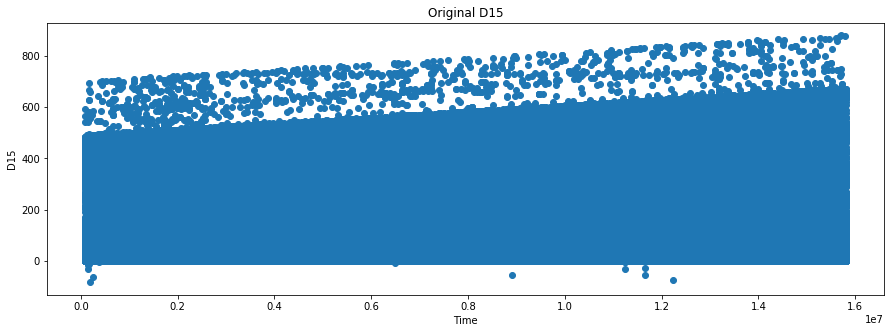

In [87]:
# PLOT ORIGINAL D
plt.figure(figsize=(15,5))
plt.scatter(X_train.TransactionDT,X_train.D15)
plt.title('Original D15')
plt.xlabel('Time')
plt.ylabel('D15')
plt.show()

In [88]:
# NORMALIZE D COLUMNS
for i in range(1,16):
    if i in [1,2,3,5,9]: continue # Not time deltas
    X_train['D'+str(i)] =  X_train['D'+str(i)] - X_train.TransactionDT/np.float32(24*60*60)
    X_test['D'+str(i)] = X_test['D'+str(i)] - X_test.TransactionDT/np.float32(24*60*60) 

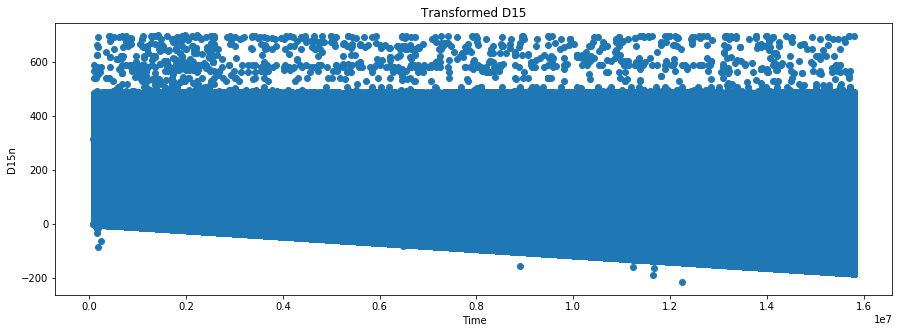

In [89]:
# PLOT TRANSFORMED D
plt.figure(figsize=(15,5))
plt.scatter(X_train.TransactionDT,X_train.D15)
plt.title('Transformed D15')
plt.xlabel('Time')
plt.ylabel('D15n')
plt.show()

In [90]:
# LABEL ENCODE AND MEMORY REDUCE
for i,f in enumerate(X_train.columns):
    # FACTORIZE CATEGORICAL VARIABLES
    if (np.str(X_train[f].dtype)=='category')|(X_train[f].dtype=='object'): 
        df_comb = pd.concat([X_train[f],X_test[f]],axis=0)
        df_comb,_ = df_comb.factorize(sort=True)
        if df_comb.max()>32000: print(f,'needs int32')
        X_train[f] = df_comb[:len(X_train)].astype('int16')
        X_test[f] = df_comb[len(X_train):].astype('int16')
    # SHIFT ALL NUMERICS POSITIVE. SET NAN to -1
    elif f not in ['TransactionAmt','TransactionDT']:
        mn = np.min((X_train[f].min(),X_test[f].min()))
        X_train[f] -= np.float32(mn)
        X_test[f] -= np.float32(mn)
        X_train[f].fillna(-1,inplace=True)
        X_test[f].fillna(-1,inplace=True)

### Encoding Functions
Below are 5 encoding functions. <br>
(1) encode_FE does frequency encoding where it combines train and test first and then encodes. <br>
(2) encode_LE is a label encoded for categorical features. <br>
(3) encode_AG makes aggregated features such as aggregated mean and std. <br>
(4) encode_CB combines two columns . <br>
(5) encode_AG2 makes aggregated features where it counts how many unique values of one feature is within a group. <br>

In [91]:
# FREQUENCY ENCODE TOGETHER
def encode_FE(df1, df2, cols):
    for col in cols:
        df = pd.concat([df1[col],df2[col]])
        vc = df.value_counts(dropna=True, normalize=True).to_dict()
        vc[-1] = -1
        nm = col+'_FE'
        df1[nm] = df1[col].map(vc)
        df1[nm] = df1[nm].astype('float32')
        df2[nm] = df2[col].map(vc)
        df2[nm] = df2[nm].astype('float32')
        print(nm,', ',end='')
        
# LABEL ENCODE
def encode_LE(col,train=X_train,test=X_test,verbose=True):
    df_comb = pd.concat([train[col],test[col]],axis=0)
    df_comb,_ = df_comb.factorize(sort=True)
    nm = col
    if df_comb.max()>32000: 
        train[nm] = df_comb[:len(train)].astype('int32')
        test[nm] = df_comb[len(train):].astype('int32')
    else:
        train[nm] = df_comb[:len(train)].astype('int16')
        test[nm] = df_comb[len(train):].astype('int16')
    del df_comb; x=gc.collect()
    if verbose: print(nm,', ',end='')
        
# GROUP AGGREGATION MEAN AND STD
def encode_AG(main_columns, uids, aggregations=['mean'], train_df=X_train, test_df=X_test, 
              fillna=True, usena=False):
    # AGGREGATION OF MAIN WITH UID FOR GIVEN STATISTICS
    for main_column in main_columns:  
        for col in uids:
            for agg_type in aggregations:
                new_col_name = main_column+'_'+col+'_'+agg_type
                temp_df = pd.concat([train_df[[col, main_column]], test_df[[col,main_column]]])
                if usena: temp_df.loc[temp_df[main_column]==-1,main_column] = np.nan
                temp_df = temp_df.groupby([col])[main_column].agg([agg_type]).reset_index().rename(
                                                        columns={agg_type: new_col_name})

                temp_df.index = list(temp_df[col])
                temp_df = temp_df[new_col_name].to_dict()   

                train_df[new_col_name] = train_df[col].map(temp_df).astype('float32')
                test_df[new_col_name]  = test_df[col].map(temp_df).astype('float32')
                
                if fillna:
                    train_df[new_col_name].fillna(-1,inplace=True)
                    test_df[new_col_name].fillna(-1,inplace=True)
                
                print("'"+new_col_name+"'",', ',end='')
                
# COMBINE FEATURES
def encode_CB(col1,col2,df1=X_train,df2=X_test):
    nm = col1+'_'+col2
    df1[nm] = df1[col1].astype(str)+'_'+df1[col2].astype(str)
    df2[nm] = df2[col1].astype(str)+'_'+df2[col2].astype(str) 
    encode_LE(nm,verbose=False)
    print(nm,', ',end='')
    
# GROUP AGGREGATION NUNIQUE
def encode_AG2(main_columns, uids, train_df=X_train, test_df=X_test):
    for main_column in main_columns:  
        for col in uids:
            comb = pd.concat([train_df[[col]+[main_column]],test_df[[col]+[main_column]]],axis=0)
            mp = comb.groupby(col)[main_column].agg(['nunique'])['nunique'].to_dict()
            train_df[col+'_'+main_column+'_ct'] = train_df[col].map(mp).astype('float32')
            test_df[col+'_'+main_column+'_ct'] = test_df[col].map(mp).astype('float32')
            print(col+'_'+main_column+'_ct, ',end='')

### Feature Engineering
We will now engineer features. All of these features were chosen because each increases local validation. The procedure for engineering features is as follows. First you think of an idea and create a new feature. Then you add it to your model and evaluate whether local validation AUC increases or decreases. If AUC increases keep the feature, otherwise discard the feature.

In [92]:
# TRANSACTION AMT CENTS
X_train['cents'] = (X_train['TransactionAmt'] - np.floor(X_train['TransactionAmt'])).astype('float32')
X_test['cents'] = (X_test['TransactionAmt'] - np.floor(X_test['TransactionAmt'])).astype('float32')
print('cents, ', end='')
# FREQUENCY ENCODE: ADDR1, CARD1, CARD2, CARD3, P_EMAILDOMAIN
encode_FE(X_train,X_test,['addr1','card1','card2','card3','P_emaildomain'])
# COMBINE COLUMNS CARD1+ADDR1, CARD1+ADDR1+P_EMAILDOMAIN
encode_CB('card1','addr1')
encode_CB('card1_addr1','P_emaildomain')
# FREQUENCY ENOCDE
encode_FE(X_train,X_test,['card1_addr1','card1_addr1_P_emaildomain'])
# GROUP AGGREGATE
encode_AG(['TransactionAmt','D9','D11'],['card1','card1_addr1','card1_addr1_P_emaildomain'],['mean','std'],usena=True)

cents, addr1_FE , card1_FE , card2_FE , card3_FE , P_emaildomain_FE , card1_addr1 , card1_addr1_P_emaildomain , card1_addr1_FE , card1_addr1_P_emaildomain_FE , 'TransactionAmt_card1_mean' , 'TransactionAmt_card1_std' , 'TransactionAmt_card1_addr1_mean' , 'TransactionAmt_card1_addr1_std' , 'TransactionAmt_card1_addr1_P_emaildomain_mean' , 'TransactionAmt_card1_addr1_P_emaildomain_std' , 'D9_card1_mean' , 'D9_card1_std' , 'D9_card1_addr1_mean' , 'D9_card1_addr1_std' , 'D9_card1_addr1_P_emaildomain_mean' , 'D9_card1_addr1_P_emaildomain_std' , 'D11_card1_mean' , 'D11_card1_std' , 'D11_card1_addr1_mean' , 'D11_card1_addr1_std' , 'D11_card1_addr1_P_emaildomain_mean' , 'D11_card1_addr1_P_emaildomain_std' , 

In [93]:
X_train.shape, X_test.shape

((590540, 249), (506691, 249))

#### Note:
As D columns are time delta columns, 'D6', 'D7', 'D8', 'D9', 'D12', 'D13', 'D14' which are mostly NANs will be removed.

In [94]:
cols = list( X_train.columns )
cols.remove('TransactionDT')
for c in ['D6','D7','D8','D9','D12','D13','D14']:
    cols.remove(c)

In [95]:
print('NOW USING THE FOLLOWING',len(cols),'FEATURES.')
np.array(cols)

NOW USING THE FOLLOWING 241 FEATURES.


array(['TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4',
       'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2',
       'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5',
       'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1',
       'D2', 'D3', 'D4', 'D5', 'D10', 'D11', 'D15', 'M1', 'M2', 'M3',
       'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V3', 'V4', 'V6', 'V8',
       'V11', 'V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30',
       'V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48', 'V54', 'V56',
       'V59', 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80',
       'V82', 'V86', 'V88', 'V89', 'V91', 'V96', 'V98', 'V99', 'V104',
       'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123',
       'V124', 'V127', 'V129', 'V130', 'V136', 'V138', 'V139', 'V142',
       'V147', 'V156', 'V160', 'V162', 'V165', 'V166', 'V169', 'V171',
       'V173', 'V175', 'V176', 'V178', 'V180', 'V182', 'V185', 'V187',
       'V188',

In [96]:
START_DATE = datetime.datetime.strptime('2017-11-30', '%Y-%m-%d')
X_train['DT_M'] = X_train['TransactionDT'].apply(lambda x: (START_DATE + datetime.timedelta(seconds = x)))
X_train['DT_M'] = (X_train['DT_M'].dt.year-2017)*12 + X_train['DT_M'].dt.month 

X_test['DT_M'] = X_test['TransactionDT'].apply(lambda x: (START_DATE + datetime.timedelta(seconds = x)))
X_test['DT_M'] = (X_test['DT_M'].dt.year-2017)*12 + X_test['DT_M'].dt.month 

In [97]:
# UID features are created to help the M.L. model identify clients. 
# Client based classification leads to better predictions rather than transaction based clssification.
# https://www.kaggle.com/c/ieee-fraud-detection/discussion/111284
X_train['day'] = X_train.TransactionDT / (24*60*60)
X_train['uid'] = X_train.card1_addr1.astype(str)+'_'+np.floor(X_train.day-X_train.D1).astype(str)

X_test['day'] = X_test.TransactionDT / (24*60*60)
X_test['uid'] = X_test.card1_addr1.astype(str)+'_'+np.floor(X_test.day-X_test.D1).astype(str)

In [98]:
# New aggregations with UID

# FREQUENCY ENCODE UID
encode_FE(X_train,X_test,['uid'])
# AGGREGATE 
encode_AG(['TransactionAmt','D4','D9','D10','D15'],['uid'],['mean','std'],fillna=True,usena=True)
# AGGREGATE
encode_AG(['C'+str(x) for x in range(1,15) if x!=3],['uid'],['mean'],X_train,X_test,fillna=True,usena=True)
# AGGREGATE
encode_AG(['M'+str(x) for x in range(1,10)],['uid'],['mean'],fillna=True,usena=True)
# AGGREGATE
encode_AG2(['P_emaildomain','dist1','DT_M','id_02','cents'], ['uid'], train_df=X_train, test_df=X_test)
# AGGREGATE
encode_AG(['C14'],['uid'],['std'],X_train,X_test,fillna=True,usena=True)
# AGGREGATE 
encode_AG2(['C13','V314'], ['uid'], train_df=X_train, test_df=X_test)
# AGGREATE 
encode_AG2(['V127','V136','V309','V307','V320'], ['uid'], train_df=X_train, test_df=X_test)
# NEW FEATURE
X_train['outsider15'] = (np.abs(X_train.D1-X_train.D15)>3).astype('int8')
X_test['outsider15'] = (np.abs(X_test.D1-X_test.D15)>3).astype('int8')
print('outsider15')


uid_FE , 'TransactionAmt_uid_mean' , 'TransactionAmt_uid_std' , 'D4_uid_mean' , 'D4_uid_std' , 'D9_uid_mean' , 'D9_uid_std' , 'D10_uid_mean' , 'D10_uid_std' , 'D15_uid_mean' , 'D15_uid_std' , 'C1_uid_mean' , 'C2_uid_mean' , 'C4_uid_mean' , 'C5_uid_mean' , 'C6_uid_mean' , 'C7_uid_mean' , 'C8_uid_mean' , 'C9_uid_mean' , 'C10_uid_mean' , 'C11_uid_mean' , 'C12_uid_mean' , 'C13_uid_mean' , 'C14_uid_mean' , 'M1_uid_mean' , 'M2_uid_mean' , 'M3_uid_mean' , 'M4_uid_mean' , 'M5_uid_mean' , 'M6_uid_mean' , 'M7_uid_mean' , 'M8_uid_mean' , 'M9_uid_mean' , uid_P_emaildomain_ct, uid_dist1_ct, uid_DT_M_ct, uid_id_02_ct, uid_cents_ct, 'C14_uid_std' , uid_C13_ct, uid_V314_ct, uid_V127_ct, uid_V136_ct, uid_V309_ct, uid_V307_ct, uid_V320_ct, outsider15


In [99]:
# 'D6', 'D7', 'D8', 'D9', 'D12', 'D13', 'D14' are mostly NANs
# DT_M, day, UID will be removed to avoid overfitting as these created attributes are included in aggregations.

cols = list( X_train.columns )
cols.remove('TransactionDT')
for c in ['D6','D7','D8','D9','D12','D13','D14']:
    if c in cols:
        cols.remove(c)
for c in ['DT_M','day','uid']:
    if c in cols:
        cols.remove(c)

In [100]:
print('NOW USING THE FOLLOWING',len(cols),'FEATURES.')
np.array(cols)

NOW USING THE FOLLOWING 288 FEATURES.


array(['TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4',
       'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2',
       'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5',
       'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1',
       'D2', 'D3', 'D4', 'D5', 'D10', 'D11', 'D15', 'M1', 'M2', 'M3',
       'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V3', 'V4', 'V6', 'V8',
       'V11', 'V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30',
       'V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48', 'V54', 'V56',
       'V59', 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80',
       'V82', 'V86', 'V88', 'V89', 'V91', 'V96', 'V98', 'V99', 'V104',
       'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123',
       'V124', 'V127', 'V129', 'V130', 'V136', 'V138', 'V139', 'V142',
       'V147', 'V156', 'V160', 'V162', 'V165', 'V166', 'V169', 'V171',
       'V173', 'V175', 'V176', 'V178', 'V180', 'V182', 'V185', 'V187',
       'V188',

In [101]:
### Local validation to decide whether to pass these attributes to the model.
### Parameters from : https://www.kaggle.com/cdeotte/xgb-fraud-with-magic-0-9600

idxT = X_train.index[:3*len(X_train)//4]
idxV = X_train.index[3*len(X_train)//4:]

clf = xgb.XGBClassifier( 
        n_estimators=2000,
        max_depth=12, 
        learning_rate=0.02, 
        subsample=0.8,
        colsample_bytree=0.4, 
        missing=-1, 
        eval_metric='auc',
        #nthread=4,
        #tree_method='hist' 
        tree_method='gpu_hist' 
    )
h = clf.fit(X_train.loc[idxT,cols], y_train[idxT], 
    eval_set=[(X_train.loc[idxV,cols],y_train[idxV])],
    verbose=50, early_stopping_rounds=100)

[0]	validation_0-auc:0.810784
Will train until validation_0-auc hasn't improved in 100 rounds.
[50]	validation_0-auc:0.892313
[100]	validation_0-auc:0.906809
[150]	validation_0-auc:0.921986
[200]	validation_0-auc:0.932841
[250]	validation_0-auc:0.939574
[300]	validation_0-auc:0.943561
[350]	validation_0-auc:0.945977
[400]	validation_0-auc:0.946908
[450]	validation_0-auc:0.947648
[500]	validation_0-auc:0.948034
[550]	validation_0-auc:0.948096
[600]	validation_0-auc:0.947923
Stopping. Best iteration:
[522]	validation_0-auc:0.948165



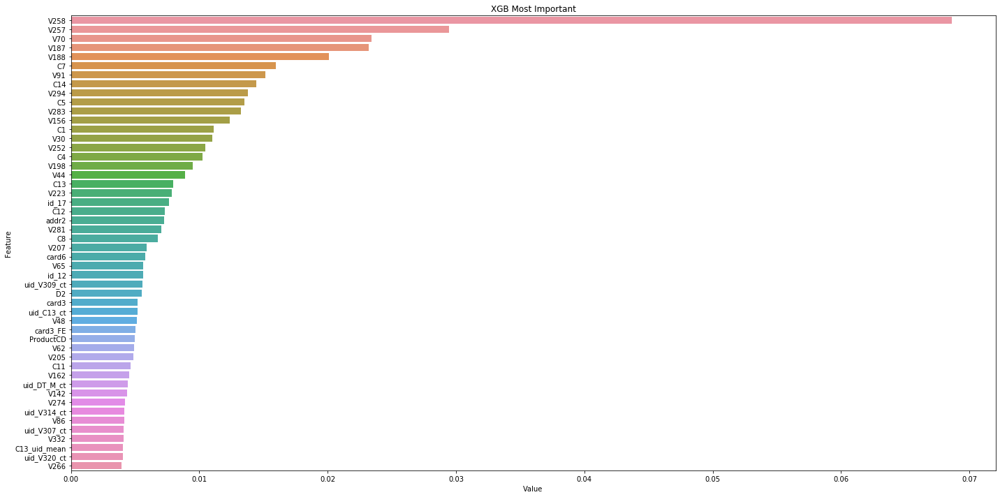

In [102]:
feature_imp = pd.DataFrame(sorted(zip(clf.feature_importances_,cols)), columns=['Value','Feature'])

plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False).iloc[:50])
plt.title('XGB Most Important')
plt.tight_layout()
plt.show()
    
del clf, h; x=gc.collect()

### Summary: V and C features are most important; V258 has most importance.

## 5. Model definition - XGBoostClassifier

Hyperparameter Tuning: RandomizedSearchCV

In [113]:
# https://gist.github.com/wrwr/3f6b66bf4ee01bf48be965f60d14454d

import time
from sklearn.model_selection import RandomizedSearchCV
clf = xgb.XGBClassifier()

param_grid = {
        'max_depth': [6, 12],
        'learning_rate': [0.002, 0.02, 0.2],
        'subsample': [0.4, 0.8],
        'colsample_bytree': [0.4],
        'n_estimators': [2000, 5000],
        'tree_method':['gpu_hist']}

rs_clf = RandomizedSearchCV(clf, param_grid, n_iter=6, n_jobs=3, verbose=20, 
                            cv=3, scoring='roc_auc', refit=False, random_state=42)

In [114]:
print("Randomized search..")
search_time_start = time.time()
rs_clf.fit(X_train[cols], y_train)
print("Randomized search time:", time.time() - search_time_start)

best_score = rs_clf.best_score_
best_params = rs_clf.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))

Randomized search..
Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   1 tasks      | elapsed: 14.2min
[Parallel(n_jobs=3)]: Done   2 tasks      | elapsed: 14.8min
[Parallel(n_jobs=3)]: Done   3 tasks      | elapsed: 15.3min
[Parallel(n_jobs=3)]: Done   4 tasks      | elapsed: 47.9min
[Parallel(n_jobs=3)]: Done   5 tasks      | elapsed: 49.6min
[Parallel(n_jobs=3)]: Done   6 tasks      | elapsed: 50.2min
[Parallel(n_jobs=3)]: Done   7 tasks      | elapsed: 56.9min
[Parallel(n_jobs=3)]: Done   8 tasks      | elapsed: 59.2min
[Parallel(n_jobs=3)]: Done   9 tasks      | elapsed: 59.8min
[Parallel(n_jobs=3)]: Done  10 tasks      | elapsed: 73.2min
[Parallel(n_jobs=3)]: Done  11 tasks      | elapsed: 78.2min
[Parallel(n_jobs=3)]: Done  12 tasks      | elapsed: 78.2min
[Parallel(n_jobs=3)]: Done  13 tasks      | elapsed: 79.6min
[Parallel(n_jobs=3)]: Done  14 out of  18 | elapsed: 83.3min remaining: 23.8min
[Parallel(n_jobs=3)]: Done  15 out of  18 | elapsed:

Randomized search time: 5610.94132399559
Best score: 0.9338854163282587
Best params: 
colsample_bytree: 0.4
learning_rate: 0.002
max_depth: 12
n_estimators: 5000
subsample: 0.8
tree_method: 'gpu_hist'


[Parallel(n_jobs=3)]: Done  18 out of  18 | elapsed: 93.5min remaining:    0.0s
[Parallel(n_jobs=3)]: Done  18 out of  18 | elapsed: 93.5min finished


## 6 Fold training

In [116]:
tr_pred = np.zeros(len(X_train))
preds = np.zeros(len(X_test))

skf = GroupKFold(n_splits=6)
for i, (idxT, idxV) in enumerate( skf.split(X_train, y_train, groups=X_train['DT_M']) ):
    month = X_train.iloc[idxV]['DT_M'].iloc[0]
    print('Fold',i,'withholding month',month)
    print(' rows of train =',len(idxT),'rows of holdout =',len(idxV))
    clf = xgb.XGBClassifier(
        n_estimators=5000,
        max_depth=12,
        learning_rate=0.002,
        subsample=0.8,
        colsample_bytree=0.4,
        missing=-1,
        eval_metric='auc',
        # USE CPU
        #nthread=4,
        #tree_method='hist'
        # USE GPU
        tree_method='gpu_hist' 
    )        
    h = clf.fit(X_train[cols].iloc[idxT], y_train.iloc[idxT], 
            eval_set=[(X_train[cols].iloc[idxV],y_train.iloc[idxV])],
            verbose=250, early_stopping_rounds=100)

    tr_pred[idxV] += clf.predict_proba(X_train[cols].iloc[idxV])[:,1]
    preds += clf.predict_proba(X_test[cols])[:,1]/skf.n_splits
    del h, clf
    x=gc.collect()
print('#'*20)
print ('XGB CV=',roc_auc_score(y_train,tr_pred)) #Total Train dataset

Fold 0 withholding month 12
 rows of train = 453219 rows of holdout = 137321
[0]	validation_0-auc:0.761997
Will train until validation_0-auc hasn't improved in 100 rounds.
[250]	validation_0-auc:0.876003
[500]	validation_0-auc:0.882217
[750]	validation_0-auc:0.889973
[1000]	validation_0-auc:0.896773
[1250]	validation_0-auc:0.90238
[1500]	validation_0-auc:0.907634
[1750]	validation_0-auc:0.911738
[2000]	validation_0-auc:0.915357
[2250]	validation_0-auc:0.918197
[2500]	validation_0-auc:0.920401
[2750]	validation_0-auc:0.921616
[3000]	validation_0-auc:0.922541
[3250]	validation_0-auc:0.923153
[3500]	validation_0-auc:0.92357
[3750]	validation_0-auc:0.924039
[4000]	validation_0-auc:0.924489
[4250]	validation_0-auc:0.92496
[4500]	validation_0-auc:0.925442
[4750]	validation_0-auc:0.925816
[4999]	validation_0-auc:0.926132
Fold 1 withholding month 15
 rows of train = 488908 rows of holdout = 101632
[0]	validation_0-auc:0.830542
Will train until validation_0-auc hasn't improved in 100 rounds.
[2

## 6. Submit model on Kaggle (ensure score > 0.93)

In [117]:
sample_submission = pd.read_csv('/content/sample_submission.csv')
sample_submission.isFraud = preds
sample_submission.to_csv('xgb_ieee_13_12_2019.csv',index=False)

## Private Score = 0.932005, Public Score = 0.959135

<img src='ieee score.jpg' width=1600px>

## Solution Rank 76 out of 6381 (Top 1.19% solution):

<img src='ieee ran.jpg' width=1600px>

### Kaggle submission before competition end:

<img src='ieee valid submission.jpg' width=1600px>

## Summary:
1. An XGBoostClassification model is developed to detect fraud in credit card transactions. Google Colab is used for experimenting and training models. (CPU: 25 GB RAM, GPU: 4GB)
2. Initially, Exploratory Data Analysis is performed with analysing correlations, frequency distribution and box plots. It was seen that most 'V' attributes are correlated with each other. Based on NAN similarity, groups of V attributes are formed and based on correlations 211 V attributes were determined redundant and removed from model training. Correlation heatmaps are used for this purpose. (Discussions on Kaggle say that PCA is performing inferior to this Attribute reduction technique)
3. Data preparation stage consists of Normalising time delta features 'D', Label encoding categorical attributes and filling missing values with -1. Different sets of feature encodings are experimented and those which improve AUC on Local Validation are retained. 288 features are passed through XGBoostClassifier. Client centric feature engineering was performed where UIDs were generated as suggested by Chris Deotte: (https://www.kaggle.com/cdeotte/xgb-fraud-with-magic-0-9600)
4. Through RandomizedSearchCV XGBoostClassifier Hyperparameters were tuned. 6 Fold Training is used to train tuned XGBoostClassifier.
5. The prediction of the model has scored an AUC of 0.932005 on private dataset on Kaggle. 